In [5]:
import torch
import gpytorch
import numpy as np
import pandas as pd
import itertools
import random
import pickle
import math
import cv2
import os
import re
from torch.nn.utils import clip_grad_norm_
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D  # Import 3D plotting toolkit
from numpy.linalg import inv

In [298]:
#Load data and prepare it for the GP
data = pd.read_csv('sound_field_data.csv')  

x_column = data['x_distance'].values
y_column = data['y_distance'].values
sound_intensity_column = data['sound_intensity'].values

min_numeric_value = np.nanmin(sound_intensity_column)
max_numeric_value = np.nanmax(sound_intensity_column[np.isfinite(sound_intensity_column)])

sound_intensity_column[np.isnan(sound_intensity_column)] = min_numeric_value 
sound_intensity_column[np.isinf(sound_intensity_column)] = max_numeric_value

#Normalise sound intensity values
mean_SIL_true = np.mean(sound_intensity_column, axis=0)
std_SIL_true = np.std(sound_intensity_column, axis=0)

sound_intensity_column = (sound_intensity_column - mean_SIL_true) / std_SIL_true

intensity_loss_2d = sound_intensity_column.reshape(101, 101)

corner_coordinates = [[-50.,-50.], [50.,50.], [-50.,50.], [50.,-50.]]
corner_coordinates_tensor = torch.tensor(corner_coordinates)

all_coordinates = list(zip(x_column,y_column))
all_coordinates = np.array(all_coordinates)
all_coordinates = [[float(str(val).replace(' ', '')) for val in row] for row in all_coordinates]
all_coordinates_tensor = torch.tensor(all_coordinates)


In [299]:
###Defining initial variables 

sampled_data = []
coordinates_passed = []
sound_intensity_sampled = []

sigma = 0.02

start_location = [48.0, 48.0] #define start location of the robot

n_samples = len(sound_intensity_column)
distance_horizon = 3  # Set your desired distance horizon
prediction_horizon = 3  # Set your desired prediction horizon
training_iter = 75  # Set your desired number of iterations
initial_sample_size = 8 # Set your desired initial training set size
convergence_criteria = False
x_test_global = np.array(all_coordinates)
x_test_local = []

sample_iter = math.floor(n_samples/3)#int(200)
var_iter = []
var_iter_local = []
var_iter_global = []
rmse_local_true = []
rmse_global_true = []
#covar_global = []
covar_trace = []
covar_totelements = []
covar_nonzeroelements = []


noise = []
lengthscale = []
nu=[]

AIC = [] # Akaike Information Criterion
BIC = [] # Bayesian Information Criterion

f2_H_global = []
f2_H_local = []

image_path = 'D:\\UHM ORE\\Active Leanring\\scripts\\images\\'

x_max = [0., 0.] #Point with maximum global uncertainity
#Intialise Plot
fig = plt.figure(figsize=(24, 16))

<Figure size 2400x1600 with 0 Axes>

In [300]:
# calculate RKHS norm from covariance
def RKHS_norm(y,sigma,K):
    n_row, n_col = K.shape
    alpha = inv(K + sigma**2 * np.eye(n_row)) @ y
    return alpha.transpose() @ K @ alpha

In [301]:
class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(ExactGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        # self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel(ard_num_dims = 2))
        #self.covar_module.base_kernel.lengthscale = length_scale
        self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.MaternKernel(ard_num_dims = 2, nu=2.5))

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

In [302]:
def kernel_print(i, training_iter, loss, model):
    print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (
            i + 1, training_iter, loss.item(),
            model.covar_module.base_kernel.lengthscale.detach().numpy()[0][0],
            model.covar_module.base_kernel.lengthscale.detach().numpy()[0][1],
            model.likelihood.noise.detach().numpy()
        ))

In [303]:
def GPtrain(x_train, y_train, training_iter):
    
    # initialize likelihood and model
    likelihood = gpytorch.likelihoods.GaussianLikelihood()
    model = ExactGPModel(x_train, y_train, likelihood)
    # Find optimal model hyperparameters
    model.train()
    likelihood.train()
    
    # Use the adam optimizer
    optimizer = torch.optim.Adam([
        {'params': model.parameters()},  # Includes GaussianLikelihood parameters
    ], lr=0.1)
    
    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    # train GP model
    for i in range(training_iter):
        # Zero gradients from previous iteration
        optimizer.zero_grad()
        # Output from model
        output = model(x_train)
        # Calc loss and backprop gradients
        loss = -mll(output, y_train)
        loss.backward()
        kernel_print(i, training_iter, loss, model)
        optimizer.step()
    
    return likelihood, model, optimizer, output, loss

In [304]:
def GPEval(x_test, model, likelihood):
    model.eval()
    likelihood.eval()
    
    # Make predictions by feeding model through likelihood
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        observed_pred = likelihood(model(x_test))
        f_preds = model(x_test)
        f_mean = f_preds.mean
        f_var = f_preds.variance
        #f_var = np.diag(f_preds.lazy_covariance_matrix.numpy())
        f_covar = f_preds.covariance_matrix
    
    with torch.no_grad():
        # Get upper and lower confidence bounds
        lower, upper = observed_pred.confidence_region()

    # print('mean', f_mean)
    # print('var', f_var)
        
    return observed_pred, lower, upper, f_var, f_covar, f_mean
      

In [305]:
def SILValue(x,y):
    x = x.item()
    y = y.item()
    #print(type(x))
    index = np.where((x_column == x) & (y_column == y))[0]

    if index:
        corresponding_intensity = sound_intensity_column[index[0]]
        #print(f"Sound intensity at ({x}, {y}): {corresponding_intensity}")
    else:
        print(f"No data found for ({x}, {y})")
        corresponding_intensity = 0.0

    return corresponding_intensity  

In [306]:
#x_true is all_points, #i_Sample is current coordinate, i_train = coordinates_passed
def plotGP():
    ax1 = fig.add_subplot(4, 3, 1, projection='3d')
    #ax1.set_xlim(-60, 60)
    #ax1.set_ylim(-60, 60)
    #ax1.set_zlim(sound_intensity_column.min(), sound_intensity_column.max())
    ax1.set_xlabel('X Coordinate')
    ax1.set_ylabel('Y Coordinate')
    ax1.set_zlabel('sound intensity')
    ax1.view_init(20, 20)
    ax1.set_title('asv on surface '+str(coordinates_passed[-1]))
    x_distances = np.arange(-50, 51, 1).astype(float)
    y_distances = np.arange(-50, 51, 1).astype(float)
    X, Y = np.meshgrid(x_distances, y_distances)
    ax1.plot_surface(X, Y, intensity_loss_2d, cmap='viridis', alpha=0.7)

    

    asv_path = ax1.plot3D([coord[0] for coord in coordinates_passed], [coord[1] for coord in coordinates_passed], sound_intensity_sampled, color='black')
    asv = ax1.scatter3D(coordinates_passed[-1][0], coordinates_passed[-1][1], 
                        sound_intensity_sampled[-1], s=100, color='black', marker='*', zorder=1)
    # # color by LAMP
    # surf = ax1.plot_trisurf(x_true[:, 0], x_true[:, 1], y_obs, cmap='inferno',
    #                         linewidth=0, alpha=0.25, vmax=max(y_obs), vmin=min(y_obs))
    points_pred = ax1.plot_trisurf(
         x_test_global[:, 0], x_test_global[:, 1], observed_pred_global.mean.numpy(), color='grey', alpha=0.25)
    # # Shade between the lower and upper confidence bounds
    for i_test in range(len(x_test_local)):
        ax1.plot(x_test_local[i_test][0].numpy()*np.array([1, 1]), x_test_local[i_test][1].numpy()*np.array([1, 1]), 
                 np.array([lower_local[i_test].numpy(), upper_local[i_test].numpy()]), 'gray')

 
    #AX2 is diff
    ax2 = fig.add_subplot(4, 3, 2)
    ax2.set_xlim(-60,60)
    ax2.set_ylim(-60,60)
    ax2.set_xlabel('x coordinate')
    ax2.set_ylabel('y coordinate')
    ax2.set_title('asv on surface ' + str(coordinates_passed[-1]))
    contour = ax2.contourf(X, Y, intensity_loss_2d, cmap='viridis')
    cbar = fig.colorbar(contour)
    cbar.set_label('Sound Intensity')
    asv_path = ax2.plot([coord[0] for coord in coordinates_passed], [coord[1] for coord in coordinates_passed], color='pink')
    asv = ax2.scatter(coordinates_passed[-1][0], coordinates_passed[-1][1], color='pink', marker='*', label='ASV', s=100)
    ax2.scatter(x_max[0], x_max[1], color='red', label='global maximum uncertainity', s=50)



    ax3 = fig.add_subplot(4, 3, 3)
    ax3.plot(range(0, len(var_iter_local)),
             var_iter_local, color='blue', marker='.')
    ax3.plot(range(0, len(var_iter_global)),
             var_iter_global, color='black', marker='*')
    ax3.set_xlabel('number of samples')
    ax3.set_title('variance of samples')
    ax3.legend(['local', 'global'], loc='upper right')


    
    ax4 = fig.add_subplot(4, 3, 4)
    local_rms = ax4.plot(range(0, len(rmse_local_true)),
                         rmse_local_true, color='blue', marker='.', label='local')
    global_rms = ax4.plot(range(0, len(rmse_global_true)),
                          rmse_global_true, color='black', marker='*', label='global')
    ax4.set_xlabel('number of samples')
    ax4.legend(['local', 'global'], loc='upper right')
    ax4.set_title('rmse of learned model')
    
    ax5 = fig.add_subplot(4, 3, 5)
    ax6 = fig.add_subplot(4, 3, 6)

    lengthscale_arr = np.array(lengthscale)
    length0_plot = ax5.plot(range(0, len(lengthscale)),
                         lengthscale_arr[:,0], color='mediumpurple', marker='.', label='lengthscale')
    length1_plot = ax5.plot(range(0, len(lengthscale)),
                         lengthscale_arr[:,1], color='rebeccapurple', marker='.', label='lengthscale')
    ax5.set_ylim([0, np.max(lengthscale_arr)*1.1])
    noise_plot = ax6.plot(range(0, len(noise)),
                         noise, color='teal', marker='.', label='noise')
    ax5.set_xlabel('number of samples')
    ax5.set_ylabel('lengthscale',color='mediumpurple')
    ax6.set_ylabel('noise',color='teal')
    ax6.set_xlabel('number of samples')

    

    #Changing trace plot 
    
    ax7 = fig.add_subplot(4, 3, 7)
    tot_elements = ax7.plot(range(0, len(covar_totelements)),
                         covar_totelements, color='mediumvioletred', marker='.', label='total_elements')
    nonzero_elements = ax7.plot(range(0, len(covar_nonzeroelements)),
                         covar_nonzeroelements, color='blue', marker='.', label='nonzero_elements')
    ax7.set_ylabel('elements')
    ax7.set_xlabel('number of samples')
    ax7.legend(['total', 'nonzero'], loc='lower right')
    
    ax8 = fig.add_subplot(4, 3, 8)
    AIC_plot = ax8.plot(range(0, len(AIC)), AIC, color='blue', marker='.', label='AIC')
    BIC_plot = ax8.plot(range(0, len(BIC)), BIC, color='black', marker='*', label='BIC')
    ax8.set_xlabel('number of samples')
    ax8.legend(['AIC', 'BIC'], loc='lower right')
    ax8.set_ylabel('information criteria of learned model')
    
    ax9 = fig.add_subplot(4, 3, 9)
    RKHS_local_plot = ax9.plot(range(0, len(f2_H_local)), f2_H_local, color='blue', marker='.', label='f^2_H')
    RKHS_global_plot = ax9.plot(range(0, len(f2_H_global)), f2_H_global, color='black', marker='.', label='f^2_H')
    ax9.set_ylabel('RKHS_norm')
    ax9.set_xlabel('number of samples')
    ax8.legend(['local', 'global'], loc='lower right')

    ax10 = fig.add_subplot(4, 3, 10)
    trace = ax10.plot(range(0, len(covar_trace)),
                         covar_trace, color='pink', marker='.', label='trace')
    ax10.set_xlabel('number of samples')
    ax10.set_ylabel('trace',color='pink')

    x_grid_global = all_coordinates_tensor[:, 0].numpy()
    y_grid_global = all_coordinates_tensor[:, 1].numpy()
    x_grid_local = all_new_locations[:, 0].numpy()
    y_grid_local = all_new_locations[:, 1].numpy()
    ax11 = fig.add_subplot(4, 3, 11)

    
    nu_arr = np.array(nu)
    length0_plot = ax11.plot(range(0, len(nu)),
                         nu_arr, color='mediumpurple', marker='.', label='nu')
    ax11.set_ylim([0, np.max(nu_arr)*1.1])
    ax11.set_xlabel('number of samples')
    ax11.set_ylabel('nu',color='mediumpurple')

    # ax12 = fig.add_subplot(4, 3, 12)
    # contour_global = ax11.scatter(x_grid_global, y_grid_global, c=MI_local, cmap='viridis')
    # contour_local = ax12.scatter(x_grid_global, y_grid_global, c=f_var_global, cmap='viridis')
    # cbar_global = fig.colorbar(contour_global)
    # cbar_global.set_label('Sampling Strategy Parameter')
    # cbar_local = fig.colorbar(contour_local)
    # cbar_local.set_label('Sampling Strategy Parameter')
    # ax11.set_xlabel('x coordinate global')
    # ax12.set_xlabel('x coordinate local')
    # ax11.set_ylabel('y coordinate global')
    # ax12.set_ylabel('y coordinate local')
    # ax11.set_title('Global MI Contour Map')
    # ax12.set_title('Global Varience Contour Map')

    return ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, 
# ax11, ax12

In [307]:
def PotentialNeighbors(current_coordinate, potential_neighbors, coordinates_passed):
    filtered = []
    # Traverse to a random nearest neighbor location
    for n in potential_neighbors:
        coordinate = current_coordinate+n
        arr_coord = coordinate.tolist()
        #print(arr_coord)
        #print(coordinates_passed)
        if arr_coord not in corner_coordinates:
            if arr_coord in all_coordinates:
                if arr_coord not in coordinates_passed:
                    filtered.append(coordinate.tolist())

    return filtered


In [308]:
def CheckConvergence(rmse_global_true, convergence_criteria):
    # v = rmse_global_true
    # vo = np.max(rmse_global_true)
    # vfo = rmse_global_true[-1]

    # dv = vo-vfo
    # dv_2_percent = 0.02*dv

    # # Is there even enough data to confirm convergence?
    # v_95thresh = vo - 0.95*dv
    # i_95thresh = np.where(v < v_95thresh)
    # i_95thresh = np.array(i_95thresh[0], dtype=int)
    # if len(i_95thresh) >= 10:
    #     for i in range(len(i_95thresh)):
    #         v_con = v[i_95thresh[i]:-1]
    #         vf = np.mean(v_con)
    if (len(rmse_global_true)>20):
        errors_last20 = rmse_global_true[-20]
        mean_error = np.mean(errors_last20)
        if mean_error < 0.2:
            convergence_criteria = True
        else:
            convergence_criteria = False
    else:
        convergence_criteria = False

    return convergence_criteria

In [309]:
#Reduction of entropy of target varience before and after observing inputs
def SamplingMuAndVar(var, mean, potential_neighbors):
    alpha = 1
    beta = 0
    sampling_mu_var = beta*mean+alpha*var
    sampling_mu_var_max = np.nanmax(sampling_mu_var.numpy())
    sampling_mu_var_max = np.where(sampling_mu_var.numpy() == sampling_mu_var_max)[0]
    next_sample = potential_neighbors.numpy()[sampling_mu_var_max,:]
    next_sample = next_sample[0]
    return next_sample, sampling_mu_var


In [310]:
# def MutualInformation(prev_var, curr_var, potential_neighbors):
#     #comparing predicted variences here
#     mutual_information = - 0.5*(np.log(curr_var.numpy()/prev_var.numpy()))
#     mi_max = np.nanmax(mutual_information)
#     mi_max = np.where(mutual_information == mi_max)[0]
#     next_sample = potential_neighbors.numpy()[mi_max,:]
#     next_sample = next_sample[0]
#     # print(next_sample)
#     print(mutual_information)
#     return next_sample, mutual_information

In [311]:
def MutualInformationLocal(prev_var, curr_var, all_coordinates, potential_neighbors):
    #print(potential_neighbors)
    main_tuples = [tuple(coord) for coord in all_coordinates]
    subset_tuples = [tuple(coord) for coord in potential_neighbors]
    indices = [main_tuples.index(tuple(coord)) for coord in subset_tuples]
    print('INDICES')
    print(indices)

    mutual_information = 0.5*(np.log(prev_var.numpy()/curr_var.numpy())) #calculated globally
    print(mutual_information)
    MI_local = []
    for i in indices:
        MI_local.append(mutual_information[i])
    print(MI_local)

    mi_max = np.nanmax(MI_local)
    mi_max = np.where(MI_local == mi_max)[0]
    print(mi_max)
    next_sample = potential_neighbors.numpy()[mi_max,:]
    print(next_sample)
    next_sample = next_sample[0]
    return next_sample, MI_local

In [312]:
#Defining neighbors based on distance horizon
coordinates_range = range(-distance_horizon, distance_horizon)
all_coordinate_combinations = list(itertools.product(coordinates_range, repeat=2))
potential_neighbors = torch.tensor(all_coordinate_combinations, dtype=torch.float32)

In [313]:
#Random walk for initial training
initial_training_set = []

asv_start_location = torch.tensor(start_location, dtype=torch.float32)  # Start at center
asv_location = asv_start_location
for _ in range(initial_sample_size):
    x = asv_location
    y = torch.tensor(SILValue(x[0], x[1]),dtype=torch.float32)  # Sample sound intensity at this location
    sound_intensity_sampled.append(y)
    initial_training_set.append((x, y))
    coordinates_passed.append(x.tolist())

    filtered_neighbors = PotentialNeighbors(x, potential_neighbors, coordinates_passed)
    filtered_neighbors = torch.tensor(filtered_neighbors)
    new_location = random.choice(filtered_neighbors)
    asv_location = new_location
    #print(f"Moved to: {asv_location}")


In [314]:
# Explore the surface
training_set = initial_training_set.copy()
likelihood = gpytorch.likelihoods.GaussianLikelihood()

In [315]:
# for k in range(sample_iter):
while convergence_criteria is False:
    i = 0
    # Train Gaussian Process Model
    X_train, y_train = zip(*training_set)
    print(X_train)
    print(y_train)
    X_train = torch.stack(X_train)
    y_train = torch.tensor(y_train, dtype=torch.float32)
    

    likelihood, model, optimizer, output, loss = GPtrain(X_train, y_train, training_iter)

    noise.append(model.likelihood.noise.detach().numpy())
    lengthscale.append(model.covar_module.base_kernel.lengthscale.detach().numpy()[0])

    nu.append(model.covar_module.base_kernel.nu)

    model.eval()
    likelihood.eval()

    all_new_locations = PotentialNeighbors(asv_location, potential_neighbors, coordinates_passed)
    all_new_locations = torch.tensor(all_new_locations) #This is my x_test_local
    x_test_local = all_new_locations
    

    SIL_test_true = [] #SIL is Sound INtensity Level
    for i in all_new_locations:
        sil = SILValue(i[0], i[1])
        SIL_test_true.append(sil)

    #Local
    observed_pred_local, lower_local, upper_local, f_var_local, f_covar_local, f_mean_local = GPEval(all_new_locations, model, likelihood)
    mse_local_true = mean_squared_error(SIL_test_true, observed_pred_local.mean.numpy())
    rmse_local_true.append(math.sqrt(mse_local_true))

    #global
    observed_pred_global, lower_global, upper_global, f_var_global, f_covar_global, f_mean_global = GPEval(all_coordinates_tensor, model, likelihood)
    mse_global_true = mean_squared_error(sound_intensity_column, observed_pred_global.mean.numpy())
    rmse_global_true.append(math.sqrt(mse_global_true))

    #Calculating Sampling Strategy Querries
    # if var_iter_global:
    #     next_mu_var_g, sampling_mu_var_g = SamplingMuAndVar(f_var_global, f_mean_global, all_coordinates_tensor)
    #     next_sample_g, MI_global = MutualInformation(prev_var_pred_global, f_var_global, all_coordinates_tensor)
        
    #     #MI_local = SamplingMuAndVar(f_var_local, f_mean_local) 
    # else:
    #     next_sample_g = np.nanmax(f_var_global.numpy())
    #     next_sample_g = np.where(f_var_global.numpy() == next_sample_g)[0]
    #     next_sample_g = all_coordinates_tensor.numpy()[next_sample_g,:]
    #     MI_global = f_var_global

    #     distances_g = np.linalg.norm(asv_location - next_sample_g, axis=1)
    #     closest_index_g = np.argmin(distances_g)
    #     closest_point_g = next_sample_g[closest_index_g]
    #     next_sample_g = closest_point_g

    #     #MI_global = f_mean_global + torch.sqrt(f_var_global)

    if var_iter_local:
        next_sample, sampling_mu_var = SamplingMuAndVar(f_var_local, f_mean_local, all_new_locations)
        next_sample_, MI_local = MutualInformationLocal(prev_var_pred_global, f_var_global, all_coordinates_tensor, all_new_locations)
        
        #MI_local = SamplingMuAndVar(f_var_local, f_mean_local) 
    else:
        next_sample = np.nanmax(f_var_local.numpy())
        next_sample = np.where(f_var_local.numpy() == next_sample)[0]
        next_sample = all_new_locations.numpy()[next_sample,:]
        MI_local = f_var_global

        distances = np.linalg.norm(asv_location - next_sample, axis=1)
        closest_index = np.argmin(distances)
        closest_point = next_sample[closest_index]
        next_sample = closest_point

        #MI_global = f_mean_global + torch.sqrt(f_var_global)

    print(next_sample)
    var_iter_global.append(max(f_var_global.numpy()))
    var_iter_local.append(max(f_var_local.numpy()))

    #covar_global.append(f_covar_global)
    covar_trace.append(np.trace(f_covar_global.detach().numpy()))
    covar_totelements.append(np.size(f_covar_global.detach().numpy()))
    covar_nonzeroelements.append(np.count_nonzero(f_covar_global.detach().numpy()))
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    # now evaluate information criteria
    # akaike information criterion
    AIC_sample = 2*np.log(covar_nonzeroelements[-1]) - 2*np.log(mse_global_true)
    AIC.append(AIC_sample)
    # BIC calculated from https://en.wikipedia.org/wiki/Bayesian_information_criterion#Gaussian_special_case
    BIC_sample = np.size(coordinates_passed)*np.log(covar_nonzeroelements[-1]) - 2*np.log(mse_global_true)
    BIC.append(BIC_sample)
    
    # and finally evaluate RKHS norm
    K_global = output._covar.detach().numpy()
    y_global = y_train.numpy().reshape(len(y_train),1)
    f2_H_sample = RKHS_norm(y_global,sigma,K_global)
    f2_H_global.append(f2_H_sample[0,0])
    
    n_set = len(initial_training_set)
    n_sub = math.floor(n_set/2)
    i_sub = random.sample(range(1,n_set),n_sub)
    i_sub.sort()
    K_local = K_global[np.ix_(i_sub,i_sub)]
    y_local = y_global[i_sub]
    f2_H_sample = RKHS_norm(y_local,sigma,K_local)
    f2_H_local.append(f2_H_sample[0,0])
    
    convergence_criteria = CheckConvergence(rmse_global_true, convergence_criteria)
    # plot real surface and the observed measurements
    ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10 = plotGP() #, ax11, ax12
    plt.show()

    fig.tight_layout()
    fig.savefig(image_path+str(len(training_set))+'.png')
    fig.clear()
    i = i+1
    prev_var_pred_global = f_var_global
    prev_var_pred_local = f_var_local
    
    # MI_local_max = np.nanmax(MI_local.numpy())
    # print(MI_local_max)
    # MI_local_max = np.where(MI_local.numpy() == MI_local_max)[0]
    # x_max = all_new_locations.numpy()[MI_local_max,:]
    # g_distances = np.linalg.norm(x_max - prev_x_max, axis=1)
    # closest_new_x_max_index = np.argmin(g_distances)
    # x_max = x_max[closest_new_x_max_index]
    
    # print(len(next_sample))
    # print(x_max)

    #neighbors = all_new_locations.numpy()
    x_max = next_sample
    asv_location = torch.tensor(next_sample)
    coordinates_passed.append(asv_location.tolist())

    new_sound_intensity = SILValue(asv_location[0], asv_location[1])
    sound_intensity_sampled.append(new_sound_intensity)
    sampled_data.append((new_location[0], new_location[1], new_sound_intensity))
    new_data_point = (asv_location, new_sound_intensity)
    training_set.append(new_data_point)


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535))
Iter 1/75 - Loss: 1.458   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.374   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.290   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.205   lengthscale: 0.854 0.855   noise: 0.555
Iter 5/75 - Loss: 1.121   lengthscale: 0.913 0.914   noise: 0.514
Iter 6/75 - Loss: 1.040   lengthscale: 0.975 0.975   noise: 0.475
Iter 7/75 - Loss: 0.961   lengthscale: 1.039 1.038   noise: 0.438
Iter 8/75 - Loss: 0.886   lengthscale: 1.106 1.102   noise: 0.404
Iter 9/75 - Loss: 0.816   lengthscale: 1.174 1.167   noise: 0.371
Iter 10/75 - Loss: 0.753   lengthscale: 1.243 1.233   noise: 0.340
Iter 11/75 - Loss: 0.698   lengthscale: 1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 71/75 - Loss: -1.233   lengthscale: 7.867 7.403   noise: 0.001
Iter 72/75 - Loss: -1.247   lengthscale: 7.990 7.529   noise: 0.001
Iter 73/75 - Loss: -1.261   lengthscale: 8.114 7.657   noise: 0.001
Iter 74/75 - Loss: -1.275   lengthscale: 8.239 7.786   noise: 0.001
Iter 75/75 - Loss: -1.289   lengthscale: 8.364 7.915   noise: 0.001
[38. 33.]
(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131)
Iter 1/75 - Loss: 1.436   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.354   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.271   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.188   lengthscale: 0.854 0.855   noise: 0.555
Iter 5/75 - Loss: 1.106   lengthscale: 0.913 0.9

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[8165, 8266, 8367, 8468, 8569, 8670, 8166, 8267, 8368, 8469, 8570, 8671, 8167, 8268, 8369, 8470, 8571, 8672, 8168, 8269, 8370, 8572, 8673, 8169, 8270, 8371, 8472, 8573, 8674, 8170, 8271, 8372, 8473, 8574, 8675]
[-0.15117988 -0.15117988 -0.15117988 ... -0.08423083 -0.08462629
 -0.09951464]
[0.30390185, 0.39611438, 0.45838153, 0.45709187, 0.38731274, 0.27972156, 0.3762122, 0.5219981, 0.6465679, 0.6708522, 0.56613374, 0.40293264, 0.41255462, 0.61479926, 0.8377047, 0.9296529, 0.7705081, 0.52704495, 0.38692987, 0.608188, 0.8992017, 0.89664143, 0.5904624, 0.3000349, 0.48339593, 0.7294874, 0.91808933, 0.7950257, 0.5241355, 0.18192942, 0.30144477, 0.45841265, 0.59259284, 0.5466324, 0.3508285]
[15]
[[37. 33.]]
[35. 30.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405)
Iter 1/75 - Loss: 1.412   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.331   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.249   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.169   lengthscale: 0.854 0.855   noise: 0.555
Iter 5/75 - Loss: 1.089   lengthscale: 0.913 0.914   noise: 0.513
Iter 6/75 - Loss: 1.012   lengthscale: 0.975 0.975   noise: 0.474
Iter 7/75 - Loss: 0.939   lengthscale: 1.039 1.038   noise: 0.437
Iter 8/75 - Loss: 0.872   lengthscale: 1.105 1.102   noise: 0.402
Iter 9/75 - Loss: 0.810   lengthscale: 1.174 1.168   noise: 0.370
Iter 10/75 - Loss: 0.757   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[7859, 7960, 8061, 8162, 8263, 8364, 7860, 7961, 8062, 8163, 8264, 8365, 7861, 7962, 8063, 8164, 8265, 8366, 7862, 7963, 8064, 8266, 8367, 7863, 7964, 8065, 8166, 8267, 8368, 7864, 7965, 8066, 8167, 8268, 8369]
[-0.13304499 -0.13304499 -0.13304499 ... -0.07127853 -0.06479283
 -0.06378902]
[0.3910797, 0.4796762, 0.52347356, 0.4870736, 0.38057116, 0.251741, 0.475093, 0.6231851, 0.73144364, 0.70266193, 0.53368837, 0.33391747, 0.51525277, 0.7252194, 0.9521479, 0.99560654, 0.7336676, 0.42416444, 0.48003328, 0.69570684, 0.9899109, 0.9386433, 0.5090545, 0.3792251, 0.53432536, 0.73618835, 0.9422487, 0.91150874, 0.54472494, 0.25623918, 0.34237173, 0.43680775, 0.524831, 0.5599551, 0.4276414]
[15]
[[34. 30.]]
[32. 27.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071)
Iter 1/75 - Loss: 1.386   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.307   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.228   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.151   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.075   lengthscale: 0.913 0.914   noise: 0.513
Iter 6/75 - Loss: 1.002   lengthscale: 0.975 0.975   noise: 0.474
Iter 7/75 - Loss: 0.934   lengthscale: 1.039 1.038   noise: 0.437
Iter 8/75 - Loss: 0.872   lengthscale: 1.105 1.102   noise: 0.402
Iter 9/75 - Loss: 0.817   lengthscale: 1.174 1.168  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[7553, 7654, 7755, 7856, 7957, 8058, 7554, 7655, 7756, 7857, 7958, 8059, 7555, 7656, 7757, 7858, 7959, 8060, 7556, 7657, 7758, 7960, 8061, 7557, 7658, 7759, 7860, 7961, 8062, 7558, 7659, 7760, 7861, 7962, 8063]
[-0.1073337  -0.1073337  -0.1073337  ... -0.07103982 -0.06784601
 -0.07296535]
[0.40985295, 0.49554592, 0.5309872, 0.47996825, 0.35895693, 0.2215293, 0.49319482, 0.6423857, 0.7452856, 0.6950042, 0.5017602, 0.28998497, 0.5273807, 0.7423492, 0.97851515, 1.0025225, 0.6956701, 0.3667182, 0.47883135, 0.6938462, 1.00167, 0.9208453, 0.44799867, 0.3629198, 0.50723326, 0.70237815, 0.92693895, 0.92802274, 0.512293, 0.22972608, 0.30049464, 0.37901223, 0.45997307, 0.5197444, 0.43062314]
[15]
[[31. 27.]]
[29. 24.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563)
Iter 1/75 - Loss: 1.361   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.285   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.210   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.137   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.066   lengthscale: 0.913 0.914   noise: 0.513
Iter 6/75 - Loss: 0.999   lengthscale: 0.975 0.975   noise: 0.474
Iter 7/75 - Loss: 0.937   lengthscale: 1.039 1.038   noise: 0.436
Iter 8/75 - Loss: 0.882   lengthscale: 1.106 1.102   noise: 0.402
Iter 9/75 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[7247, 7348, 7449, 7550, 7651, 7752, 7248, 7349, 7450, 7551, 7652, 7753, 7249, 7350, 7451, 7552, 7653, 7754, 7250, 7351, 7452, 7654, 7755, 7251, 7352, 7453, 7554, 7655, 7756, 7252, 7353, 7454, 7555, 7656, 7757]
[-0.12953828 -0.12953828 -0.12953828 ... -0.10398816 -0.10061222
 -0.10868068]
[0.38516936, 0.47199813, 0.5058784, 0.44916984, 0.32159495, 0.18021467, 0.47073472, 0.6254447, 0.73143905, 0.6717123, 0.46419883, 0.24497443, 0.5041071, 0.7298005, 0.9861884, 1.0052109, 0.6625353, 0.31793165, 0.44927895, 0.67158765, 1.0048933, 0.90764856, 0.39840347, 0.3251718, 0.46868485, 0.6677342, 0.91242707, 0.9328484, 0.47592974, 0.18647626, 0.25269973, 0.32680607, 0.40729758, 0.48219675, 0.4199372]
[15]
[[28. 24.]]
[31. 21.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883)
Iter 1/75 - Loss: 1.340   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.267   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.195   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.125   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.058   lengthscale: 0.913 0.914   noise: 0.513
Iter 6/75 - Loss: 0.996   lengthscale: 0.975 0.975   noise: 0.473
Iter 7/75 - Loss: 0.940   lengthscale: 1.039 1.038   noise: 0.436
Iter 8/75 - Loss: 0.891   lengthsc

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6946, 7047, 7148, 7249, 7350, 7451, 6947, 7048, 7149, 7250, 7351, 7452, 6948, 7049, 7150, 7251, 7352, 7453, 6949, 7050, 7151, 7353, 7454, 6950, 7051, 7152, 7253, 7354, 7455, 6951, 7052, 7153, 7254, 7355, 7456]
[ 0.00681821  0.00681821  0.00681821 ... -0.00318472 -0.00152552
  0.00050317]
[0.27108952, 0.29656035, 0.30021927, 0.26562354, 0.17771144, 0.05063979, 0.40753695, 0.49119854, 0.5672087, 0.6036077, 0.55318284, 0.35984322, 0.55432236, 0.72345734, 0.9314829, 1.1104892, 1.0573134, 0.72743255, 0.66421413, 0.9027457, 1.226233, 1.1842172, 0.7526653, 0.6887324, 0.909994, 1.1458087, 1.1999836, 0.95944977, 0.6599154, 0.63001555, 0.77805245, 0.8869333, 0.8726463, 0.7296661, 0.54693806]
[20]
[[31. 20.]]
[28. 18.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289)
Iter 1/75 - Loss: 1.322   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.252   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.184   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.119   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.058   lengthscale: 0.913 0.914   noise: 0.513
Iter 6/75 - Loss: 1.002   lengthscale: 0.975 0.975   noise: 0.473
Iter 7/75 - Loss: 0.953   lengthscale: 1.039 1.038   noise:

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6640, 6741, 6842, 6943, 7044, 7145, 6641, 6742, 6843, 6944, 7045, 7146, 6642, 6743, 6844, 6945, 7046, 7147, 6643, 6744, 6845, 7047, 7148, 6644, 6745, 6846, 6947, 7048, 7149, 6645, 6746, 6847, 6948, 7049, 7150]
[-0.13868223 -0.13868223 -0.13868223 ... -0.12380799 -0.12403412
 -0.13657986]
[0.3859857, 0.47441494, 0.52116203, 0.49424046, 0.3992984, 0.27495039, 0.488146, 0.64417547, 0.7633395, 0.7510144, 0.59786296, 0.40233016, 0.54811454, 0.78389955, 1.0506853, 1.1244655, 0.8587486, 0.54178554, 0.52090746, 0.7745244, 1.1408837, 1.0962175, 0.6443193, 0.40824965, 0.5909684, 0.8329611, 1.065557, 0.9952743, 0.6308964, 0.2609149, 0.3585647, 0.46616936, 0.5600369, 0.58140564, 0.44333887]
[20]
[[28. 17.]]
[25. 15.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683)
Iter 1/75 - Loss: 1.309   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.244   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.181   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.122   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.068   lengthscale: 0.913 0.914   noise: 0.513
Iter 6/75 - Loss: 1.020   lengthscale: 0.974 0.975   noise: 0.473
Iter 7/75 - Loss: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6334, 6435, 6536, 6637, 6738, 6839, 6335, 6436, 6537, 6638, 6739, 6840, 6336, 6437, 6538, 6639, 6740, 6841, 6337, 6438, 6539, 6741, 6842, 6338, 6439, 6540, 6641, 6742, 6843, 6339, 6440, 6541, 6642, 6743, 6844]
[-0.13835599 -0.13835599 -0.13835599 ... -0.12253443 -0.11973747
 -0.12681292]
[0.37933806, 0.47239047, 0.51375103, 0.4636029, 0.33993605, 0.19952686, 0.4717846, 0.6391481, 0.7611586, 0.70929015, 0.49952477, 0.2761433, 0.51104355, 0.75955874, 1.0609223, 1.099975, 0.72237796, 0.36028817, 0.45590854, 0.7018905, 1.0957876, 0.9940341, 0.44472712, 0.32546973, 0.48274195, 0.7066995, 0.9880591, 0.99740064, 0.51008177, 0.17943889, 0.2515903, 0.33369276, 0.42255127, 0.501121, 0.43261224]
[15]
[[24. 15.]]
[22. 12.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749)
Iter 1/75 - Loss: 1.304   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.245   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.189   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.138   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.093   lengthscale: 0.913 0.914   noise: 0.513
Iter 6/75 - Loss: 1.055   lengthscale: 0.974 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6028, 6129, 6230, 6331, 6432, 6533, 6029, 6130, 6231, 6332, 6433, 6534, 6030, 6131, 6232, 6333, 6434, 6535, 6031, 6132, 6233, 6435, 6536, 6032, 6133, 6234, 6335, 6436, 6537, 6033, 6134, 6235, 6336, 6437, 6538]
[-0.11846436 -0.11846436 -0.11846436 ... -0.10755846 -0.10583301
 -0.11290455]
[0.39793968, 0.49012977, 0.52675945, 0.46697974, 0.33362848, 0.18816057, 0.49316958, 0.6635905, 0.78412473, 0.7156021, 0.48658237, 0.25478137, 0.5322822, 0.7886034, 1.1081934, 1.1309131, 0.70639294, 0.32832295, 0.47181565, 0.7202159, 1.1345046, 0.99986684, 0.4076514, 0.3353647, 0.48690987, 0.7047445, 0.9966574, 1.0395238, 0.49135524, 0.18719578, 0.25213903, 0.32411754, 0.40304023, 0.48882884, 0.45552406]
[20]
[[22. 11.]]
[24.  9.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317)
Iter 1/75 - Loss: 1.299   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.245   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.195   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.150   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.112   lengthscale: 0.913 0.914   noise: 0.513
Iter 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[5727, 5828, 5929, 6030, 6131, 6232, 5728, 5829, 5930, 6031, 6132, 6233, 5729, 5830, 5931, 6032, 6133, 6234, 5730, 5831, 5932, 6134, 6235, 5731, 5832, 5933, 6034, 6135, 6236, 5732, 5833, 5934, 6035, 6136, 6237]
[0.03988474 0.03988474 0.03988474 ... 0.0205099  0.02024965 0.02445829]
[0.29068917, 0.31429258, 0.3156071, 0.27843657, 0.1871186, 0.055102125, 0.43276778, 0.51846707, 0.5978552, 0.64008874, 0.6017947, 0.4223189, 0.590327, 0.77361846, 1.0119214, 1.2408757, 1.1947904, 0.81730855, 0.7114609, 0.98217416, 1.3969688, 1.3382534, 0.8126387, 0.7380416, 0.9901463, 1.2854154, 1.3616166, 1.0548683, 0.7148193, 0.6713237, 0.83453757, 0.96020305, 0.94715893, 0.7892994, 0.5937968]
[20]
[[24.  8.]]
[21.  6.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092)
Iter 1/75 - Loss: 1.304   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.256   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.214   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.177   lengthscale: 0.854 0.855   noise: 0.554
Iter 5/75 - Loss: 1.149   lengt

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[5421, 5522, 5623, 5724, 5825, 5926, 5422, 5523, 5624, 5725, 5826, 5927, 5423, 5524, 5625, 5726, 5827, 5928, 5424, 5525, 5626, 5828, 5929, 5425, 5526, 5627, 5728, 5829, 5930, 5426, 5527, 5628, 5729, 5830, 5931]
[-0.10035771 -0.10035771 -0.10035771 ... -0.09028222 -0.0916115
 -0.10235942]
[0.42308667, 0.51562715, 0.5661722, 0.5406065, 0.44450206, 0.31825462, 0.5335834, 0.7011149, 0.83367646, 0.82387906, 0.6606676, 0.45577374, 0.6010837, 0.8614334, 1.17954, 1.2791061, 0.9579702, 0.6081152, 0.5737429, 0.85400957, 1.3022021, 1.2468843, 0.7171666, 0.45342955, 0.64912766, 0.9200768, 1.203404, 1.1198316, 0.70056707, 0.2982372, 0.39927447, 0.51276284, 0.6170112, 0.6544272, 0.523903]
[20]
[[21.  5.]]
[18.  3.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099)
Iter 1/75 - Loss: 1.323   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.284   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.251   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1.225   lengthscale: 0.854 0.855   noise:

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[5115, 5216, 5317, 5418, 5519, 5620, 5116, 5217, 5318, 5419, 5520, 5621, 5117, 5218, 5319, 5420, 5521, 5622, 5118, 5219, 5320, 5522, 5623, 5119, 5220, 5321, 5422, 5523, 5624, 5120, 5221, 5322, 5423, 5524, 5625]
[-0.12591839 -0.12591839 -0.12591839 ... -0.10832302 -0.1048745
 -0.10774915]
[0.40097037, 0.49912226, 0.5439823, 0.4930131, 0.36592487, 0.22271334, 0.49993217, 0.67943895, 0.8137626, 0.7579684, 0.53402436, 0.30195987, 0.54324126, 0.8142017, 1.1655194, 1.2131153, 0.77384144, 0.3879687, 0.48485756, 0.7501694, 1.2086397, 1.0837287, 0.47344702, 0.34673938, 0.51080966, 0.74970967, 1.0695996, 1.0977854, 0.54636574, 0.19471875, 0.26723546, 0.34910923, 0.438533, 0.5287634, 0.48895666]
[15]
[[17.  3.]]
[20.  0.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502)
Iter 1/75 - Loss: 1.333   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.299   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.273   lengthscale: 0.798 0.798   noise: 0.598
Iter 4/75 - Loss: 1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[4814, 4915, 5016, 5117, 5218, 5319, 4815, 4916, 5017, 5118, 5219, 5320, 4816, 4917, 5018, 5119, 5220, 5321, 4817, 4918, 5019, 5221, 5322, 4818, 4919, 5020, 5121, 5222, 5323, 4819, 4920, 5021, 5122, 5223, 5324]
[0.01630946 0.01630946 0.01630946 ... 0.00626832 0.00652531 0.00918361]
[0.27096328, 0.2941433, 0.29467455, 0.25708994, 0.16706482, 0.0379616, 0.4150737, 0.50117993, 0.5802593, 0.62214124, 0.58798546, 0.42695054, 0.57630676, 0.7646384, 1.012966, 1.2587113, 1.2134664, 0.81594396, 0.70008236, 0.98332655, 1.4411417, 1.3701433, 0.7963717, 0.7234296, 0.9850591, 1.302526, 1.3893702, 1.0541725, 0.69661325, 0.64893067, 0.8135644, 0.9412903, 0.9284334, 0.7678193, 0.5694762]
[20]
[[20. -1.]]
[17. -3.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528)
Iter 1/75 - Loss: 1.354   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.328   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.310   lengthscale: 0.798 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[4508, 4609, 4710, 4811, 4912, 5013, 4509, 4610, 4711, 4812, 4913, 5014, 4510, 4611, 4712, 4813, 4914, 5015, 4511, 4612, 4713, 4915, 5016, 4512, 4613, 4714, 4815, 4916, 5017, 4513, 4614, 4715, 4816, 4917, 5018]
[-0.06427902 -0.06427902 -0.06427902 ... -0.04923845 -0.05038748
 -0.05907374]
[0.46953097, 0.56382406, 0.61563206, 0.5903813, 0.49391192, 0.3670262, 0.583656, 0.75583637, 0.89317816, 0.88390505, 0.71725446, 0.5093652, 0.653806, 0.9240645, 1.2631968, 1.3733466, 1.0290695, 0.66756415, 0.6253326, 0.91603625, 1.399301, 1.3405098, 0.7795228, 0.50081766, 0.701407, 0.98353684, 1.2899318, 1.2030381, 0.7611239, 0.34168664, 0.4441372, 0.5601565, 0.66947, 0.7152865, 0.5882225]
[20]
[[17. -4.]]
[14. -6.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.6275771880178929)
Iter 1/75 - Loss: 1.385   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.368   lengthscale: 0.744 0.744   noise: 0.644
Iter 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[4202, 4303, 4404, 4505, 4606, 4707, 4203, 4304, 4405, 4506, 4607, 4708, 4204, 4305, 4406, 4507, 4608, 4709, 4205, 4306, 4407, 4609, 4710, 4206, 4307, 4408, 4509, 4610, 4711, 4207, 4308, 4409, 4510, 4611, 4712]
[-0.05021261 -0.05021261 -0.05021261 ... -0.03792398 -0.03489372
 -0.03308997]
[0.48593825, 0.5850873, 0.62995523, 0.57785064, 0.44950503, 0.305529, 0.58633, 0.76857054, 0.904607, 0.8462988, 0.61879444, 0.38501054, 0.62965405, 0.90571535, 1.2678602, 1.3145591, 0.86105144, 0.47072226, 0.5688557, 0.8378713, 1.3099049, 1.1785734, 0.55512196, 0.42747122, 0.5921011, 0.8327955, 1.160369, 1.1953179, 0.6265342, 0.27321157, 0.34502584, 0.42574954, 0.5137987, 0.60397846, 0.5640882]
[15]
[[13. -6.]]
[16. -9.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.6275771880178929, 1.261823051862995)
Iter 1/75 - Loss: 1.397   lengthscale: 0.693 0.693   noise: 0.693
Iter 2/75 - Loss: 1.385   length

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3901, 4002, 4103, 4204, 4305, 4406, 3902, 4003, 4104, 4205, 4306, 4407, 3903, 4004, 4105, 4206, 4307, 4408, 3904, 4005, 4106, 4308, 4409, 3905, 4006, 4107, 4208, 4309, 4410, 3906, 4007, 4108, 4209, 4310, 4411]
[0.02109355 0.02109355 0.02109355 ... 0.00954975 0.00869824 0.0110068 ]
[0.27704418, 0.2992622, 0.29865673, 0.2597491, 0.16742183, 0.03317416, 0.42345238, 0.5089214, 0.5872024, 0.62871534, 0.5952884, 0.43370092, 0.5879365, 0.77706313, 1.0269293, 1.2764745, 1.2339628, 0.83171946, 0.71465385, 1.0011824, 1.4690865, 1.3955799, 0.81160194, 0.7381824, 1.0022242, 1.323649, 1.4112737, 1.0715064, 0.71155953, 0.6612831, 0.8258824, 0.9530379, 0.9398885, 0.77985436, 0.582005]
[20]
[[ 16. -10.]]
[ 13. -12.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.6275771880178929, 1.261823051862995, 1.3342005578643112)
Iter 1/75 - Loss: 1.410   lengthscale: 0.693 0.693   noi

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3595, 3696, 3797, 3898, 3999, 4100, 3596, 3697, 3798, 3899, 4000, 4101, 3597, 3698, 3799, 3900, 4001, 4102, 3598, 3699, 3800, 4002, 4103, 3599, 3700, 3801, 3902, 4003, 4104, 3600, 3701, 3802, 3903, 4004, 4105]
[-0.00667148 -0.00667148 -0.00667148 ...  0.00064338 -0.00024128
 -0.00504654]
[0.5295815, 0.62436295, 0.67640936, 0.65094113, 0.553968, 0.42664355, 0.64342976, 0.8165243, 0.95470655, 0.94521284, 0.7774566, 0.56869215, 0.7128049, 0.9844561, 1.3265344, 1.4378575, 1.0898707, 0.7264848, 0.6829902, 0.9747613, 1.4621848, 1.4029965, 0.837876, 0.5568959, 0.757724, 1.0410478, 1.3506937, 1.2639003, 0.81872123, 0.3963782, 0.49843043, 0.61426824, 0.72387177, 0.77051806, 0.6434051]
[20]
[[ 13. -13.]]
[ 10. -15.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.6275771880178929, 1.261823051862995, 1.3342005578643112, 1.2973435529066157)
Iter 1/75 - Lo

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3289, 3390, 3491, 3592, 3693, 3794, 3290, 3391, 3492, 3593, 3694, 3795, 3291, 3392, 3493, 3594, 3695, 3796, 3292, 3393, 3494, 3696, 3797, 3293, 3394, 3495, 3596, 3697, 3798, 3294, 3395, 3496, 3597, 3698, 3799]
[-0.00260245 -0.00260245 -0.00260245 ...  0.00095449  0.00222028
  0.0036003 ]
[0.5284294, 0.6264155, 0.6703427, 0.6179761, 0.48983288, 0.34606037, 0.6290656, 0.8100235, 0.9446589, 0.8858838, 0.65862113, 0.4249223, 0.6727871, 0.947927, 1.3087481, 1.3543695, 0.9006434, 0.50995004, 0.61198896, 0.88030314, 1.351907, 1.2179669, 0.5932668, 0.47022393, 0.633896, 0.8734094, 1.199518, 1.2328113, 0.6627385, 0.31567928, 0.3864799, 0.46602783, 0.5526813, 0.6409569, 0.5979482]
[15]
[[  9. -15.]]
[ 12. -18.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.6275771880178929, 1.261823051862995, 1.3342005578643112, 1.2973435529

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2988, 3089, 3190, 3291, 3392, 3493, 2989, 3090, 3191, 3292, 3393, 3494, 2990, 3091, 3192, 3293, 3394, 3495, 2991, 3092, 3193, 3395, 3496, 2992, 3093, 3194, 3295, 3396, 3497, 2993, 3094, 3195, 3296, 3397, 3498]
[0.01775842 0.01775842 0.01775842 ... 0.01046086 0.00979798 0.01098832]
[0.27658612, 0.2985181, 0.29764292, 0.25862557, 0.16617551, 0.031092145, 0.42397445, 0.50896347, 0.5865026, 0.62740564, 0.5937814, 0.43077216, 0.58985126, 0.7786279, 1.0271266, 1.274273, 1.2326533, 0.8327204, 0.7175483, 1.0040727, 1.4700928, 1.3974664, 0.8157785, 0.74034876, 1.003479, 1.3217285, 1.4078751, 1.072978, 0.71569276, 0.6615119, 0.82457983, 0.94976705, 0.9369023, 0.7797053, 0.5843513]
[20]
[[ 12. -19.]]
[  9. -21.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.6275771880178929, 1.261823051862995, 1.33420055

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2682, 2783, 2884, 2985, 3086, 3187, 2683, 2784, 2885, 2986, 3087, 3188, 2684, 2785, 2886, 2987, 3088, 3189, 2685, 2786, 2887, 3089, 3190, 2686, 2787, 2888, 2989, 3090, 3191, 2687, 2788, 2889, 2990, 3091, 3192]
[0.01857254 0.01857254 0.01857254 ... 0.01731459 0.01650552 0.01589224]
[0.5519508, 0.647174, 0.6997698, 0.67461085, 0.5776468, 0.45038536, 0.6642417, 0.8374386, 0.97609836, 0.96705973, 0.79937345, 0.59065694, 0.7320049, 1.0027205, 1.3433093, 1.4544257, 1.1085042, 0.74607843, 0.7013516, 0.9916946, 1.4750925, 1.4168586, 0.85556936, 0.5752748, 0.7752807, 1.0575411, 1.3653744, 1.2789015, 0.8359363, 0.414915, 0.51633006, 0.6315603, 0.74036616, 0.7857352, 0.6577323]
[20]
[[  9. -22.]]
[  6. -24.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.6275771880178929, 1.26182

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2376, 2477, 2578, 2679, 2780, 2881, 2377, 2478, 2579, 2680, 2781, 2882, 2378, 2479, 2580, 2681, 2782, 2883, 2379, 2480, 2581, 2783, 2884, 2380, 2481, 2582, 2683, 2784, 2885, 2381, 2482, 2583, 2684, 2785, 2886]
[0.01944359 0.01944359 0.01944359 ... 0.01741402 0.01737142 0.01833903]
[0.54363525, 0.64048433, 0.6839788, 0.63223624, 0.50507504, 0.36198172, 0.643783, 0.82254547, 0.955488, 0.8979396, 0.6729221, 0.4403214, 0.68788254, 0.9597344, 1.3137491, 1.3592114, 0.91325045, 0.52474844, 0.628527, 0.8944501, 1.3582748, 1.225519, 0.6069054, 0.48838106, 0.6511459, 0.88869613, 1.2087973, 1.2357547, 0.6728672, 0.33492118, 0.40541923, 0.48444924, 0.56972456, 0.65364635, 0.60109764]
[15]
[[  5. -24.]]
[  8. -27.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3823116896513528, 1.627

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2075, 2176, 2277, 2378, 2479, 2580, 2076, 2177, 2278, 2379, 2480, 2581, 2077, 2178, 2279, 2380, 2481, 2582, 2078, 2179, 2280, 2482, 2583, 2079, 2180, 2281, 2382, 2483, 2584, 2080, 2181, 2282, 2383, 2484, 2585]
[0.01705284 0.01705284 0.01705284 ... 0.01290052 0.01211224 0.01264917]
[0.27732524, 0.29933584, 0.29857388, 0.25973403, 0.16753422, 0.03243589, 0.4242184, 0.5088386, 0.5856941, 0.6255877, 0.5901111, 0.42227185, 0.5893366, 0.77680445, 1.0220329, 1.2627733, 1.2197199, 0.82522494, 0.7160007, 0.99961334, 1.4547269, 1.3847606, 0.81375366, 0.73780656, 0.9976817, 1.3085853, 1.391996, 1.0665916, 0.71426606, 0.658556, 0.8195708, 0.9426119, 0.93009967, 0.77577037, 0.5828912]
[20]
[[  8. -28.]]
[  5. -30.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1.0939262234933502, 1.3

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[1769, 1870, 1971, 2072, 2173, 2274, 1770, 1871, 1972, 2073, 2174, 2275, 1771, 1872, 1973, 2074, 2175, 2276, 1772, 1873, 1974, 2176, 2277, 1773, 1874, 1975, 2076, 2177, 2278, 1774, 1875, 1976, 2077, 2178, 2279]
[0.01618287 0.01618287 0.01618287 ... 0.01338669 0.01283691 0.01344994]
[0.54605716, 0.6408113, 0.6932418, 0.6684727, 0.57227975, 0.44581312, 0.6574734, 0.8293552, 0.96674436, 0.9580676, 0.7921566, 0.58493745, 0.724675, 0.9927204, 1.3274314, 1.4359369, 1.0975399, 0.73896426, 0.6943264, 0.982006, 1.4559047, 1.3994694, 0.8474921, 0.56912166, 0.76782495, 1.0470729, 1.348485, 1.2631077, 0.82717013, 0.40958714, 0.5104659, 0.6248424, 0.7321355, 0.7750123, 0.6455916]
[20]
[[  5. -31.]]
[  2. -33.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.9214540322012092, 1.27352070127099, 1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[1463, 1564, 1665, 1766, 1867, 1968, 1464, 1565, 1666, 1767, 1868, 1969, 1465, 1566, 1667, 1768, 1869, 1970, 1466, 1567, 1668, 1870, 1971, 1467, 1568, 1669, 1770, 1871, 1972, 1468, 1569, 1670, 1771, 1872, 1973]
[0.01228826 0.01228826 0.01228826 ... 0.01069079 0.01046723 0.0106636 ]
[0.5327392, 0.6287526, 0.6720469, 0.6212799, 0.4955488, 0.35350496, 0.6326064, 0.8095283, 0.9409417, 0.8850037, 0.6629897, 0.43204418, 0.6771016, 0.946031, 1.293351, 1.3388306, 0.9020592, 0.5166855, 0.61892635, 0.8828503, 1.338808, 1.2095925, 0.59865576, 0.4800254, 0.6422679, 0.8782618, 1.1930517, 1.2158481, 0.662519, 0.32734907, 0.39793554, 0.4770025, 0.5620085, 0.6436283, 0.58595043]
[15]
[[  1. -33.]]
[  4. -36.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535317, 0.921454032201209

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[1162, 1263, 1364, 1465, 1566, 1667, 1163, 1264, 1365, 1466, 1567, 1668, 1164, 1265, 1366, 1467, 1568, 1669, 1165, 1266, 1367, 1569, 1670, 1166, 1267, 1368, 1469, 1570, 1671, 1167, 1268, 1369, 1470, 1571, 1672]
[0.00733941 0.00733941 0.00733941 ... 0.00524219 0.00483038 0.00517512]
[0.26800016, 0.29009825, 0.28949103, 0.2510425, 0.15967093, 0.026244035, 0.41437963, 0.4987174, 0.5751073, 0.61433244, 0.5778357, 0.4081392, 0.5787573, 0.76509035, 1.0076813, 1.2434634, 1.1993922, 0.80965716, 0.7045221, 0.98565227, 1.4319954, 1.3639894, 0.80197394, 0.7256707, 0.9828552, 1.2879589, 1.3693825, 1.0512171, 0.7028078, 0.646338, 0.8057725, 0.9271517, 0.91489327, 0.7626465, 0.57152396]
[20]
[[  4. -37.]]
[  1. -39.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.6520225509807749, 0.6077966315535

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[856, 957, 1058, 1159, 1260, 1361, 857, 958, 1059, 1160, 1261, 1362, 858, 959, 1060, 1161, 1262, 1363, 859, 960, 1061, 1263, 1364, 860, 961, 1062, 1163, 1264, 1365, 861, 962, 1063, 1164, 1265, 1366]
[0.00751893 0.00751893 0.00751893 ... 0.00629799 0.00602729 0.00636897]
[0.5360284, 0.63016546, 0.6821909, 0.657645, 0.56220007, 0.43656582, 0.6472346, 0.8178496, 0.95380664, 0.9452311, 0.7810235, 0.57532215, 0.7144555, 0.9804018, 1.3101125, 1.416145, 1.0841334, 0.7289896, 0.6844848, 0.9701957, 1.4366308, 1.3818622, 0.83739984, 0.5598259, 0.75756514, 1.0343394, 1.3305031, 1.2463969, 0.816587, 0.40073365, 0.5012762, 0.6150226, 0.7212087, 0.7624325, 0.6325057]
[20]
[[  1. -40.]]
[ -2. -42.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.3554812412994683, 0.65202255098

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[550, 651, 752, 853, 954, 1055, 551, 652, 753, 854, 955, 1056, 552, 653, 754, 855, 956, 1057, 553, 654, 755, 957, 1058, 554, 655, 756, 857, 958, 1059, 555, 656, 757, 858, 959, 1060]
[0.00509837 0.00509837 0.00509837 ... 0.00485558 0.00477778 0.00524679]
[0.5250293, 0.62048435, 0.6635686, 0.613434, 0.48877782, 0.34754896, 0.624727, 0.8004034, 0.93060994, 0.87566733, 0.6559528, 0.42639595, 0.669334, 0.9362949, 1.2784358, 1.3234282, 0.8940276, 0.5113893, 0.6116404, 0.8740647, 1.3240131, 1.1981182, 0.5933994, 0.4732681, 0.6351001, 0.86986595, 1.1809212, 1.2018794, 0.65580636, 0.3209006, 0.39154494, 0.47071677, 0.5556842, 0.6362447, 0.57537097]
[20]
[[ -2. -43.]]
[ -5. -45.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563695392289, 0.355481241

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[244, 345, 446, 547, 648, 749, 245, 346, 447, 548, 649, 750, 246, 347, 448, 549, 650, 751, 247, 348, 449, 651, 752, 248, 349, 450, 551, 652, 753, 249, 350, 451, 552, 653, 754]
[0.00300575 0.00300581 0.00300587 ... 0.00374047 0.0039356  0.0042393 ]
[0.52121186, 0.61467445, 0.6527673, 0.59455615, 0.46253932, 0.31796294, 0.62063515, 0.7952114, 0.9199836, 0.85135937, 0.619576, 0.3862899, 0.66302174, 0.9290273, 1.2699672, 1.2955695, 0.8463686, 0.46001977, 0.6012107, 0.85826755, 1.3017803, 1.1540877, 0.5360492, 0.46017462, 0.6138375, 0.8363209, 1.1414768, 1.1916156, 0.61237305, 0.30844778, 0.37234268, 0.44208932, 0.51719666, 0.599524, 0.5654546]
[20]
[[ -5. -46.]]
[ -8. -43.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.13476221198353883, 0.09579563

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[443, 544, 645, 746, 847, 948, 444, 545, 646, 747, 848, 949, 445, 546, 647, 748, 849, 950, 446, 547, 648, 850, 951, 447, 548, 649, 750, 851, 952, 448, 549, 650, 751, 852, 953]
[0.01273593 0.01273599 0.01273616 ... 0.0103886  0.00995296 0.01028526]
[0.27984792, 0.42043883, 0.57518345, 0.69327897, 0.7179501, 0.650327, 0.30662435, 0.5105287, 0.76482284, 0.9732165, 0.98026985, 0.8218, 0.31048572, 0.5948538, 1.015572, 1.4191911, 1.3005033, 0.95928055, 0.27418578, 0.64145637, 1.2642202, 1.3909312, 0.9505035, 0.17998828, 0.60601246, 1.2156571, 1.3528024, 1.0551656, 0.7848236, 0.0355745, 0.4273936, 0.8153906, 0.7951833, 0.6984727, 0.58127433]
[15]
[[ -9. -43.]]
[-11. -46.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.14518799145587563, -0.1347622

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[137, 238, 339, 440, 541, 642, 138, 239, 340, 441, 542, 643, 139, 240, 341, 442, 543, 644, 140, 241, 342, 544, 645, 141, 242, 343, 444, 545, 646, 142, 243, 344, 445, 546, 647]
[ 0.00058343  0.00058408  0.00058503 ... -0.00061034 -0.00056889
  0.00111836]
[0.53285885, 0.6372055, 0.6977075, 0.6678845, 0.55107665, 0.400652, 0.6337024, 0.81418717, 0.9646588, 0.9509424, 0.7500734, 0.50496197, 0.6918328, 0.9596129, 1.3007325, 1.4116864, 1.0294583, 0.62291616, 0.66780853, 0.95320034, 1.412858, 1.3293207, 0.7314829, 0.56714135, 0.7806025, 1.0709668, 1.3545568, 1.2396123, 0.76929784, 0.43571842, 0.56748974, 0.71004784, 0.81166434, 0.80124503, 0.6302597]
[20]
[[-11. -47.]]
[-14. -49.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.3536479390859071, -0.1451879

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[33, 134, 235, 336, 34, 135, 236, 337, 35, 136, 237, 338, 36, 238, 339, 37, 138, 239, 340, 38, 139, 240, 341]
[-0.00085218 -0.00084997 -0.00084651 ...  0.00107816  0.00134311
  0.00131333]
[0.6544987, 0.5996567, 0.46959338, 0.324139, 0.92069757, 0.85980153, 0.63332266, 0.39841816, 1.265721, 1.3031739, 0.8698709, 0.48092127, 1.314327, 1.1795535, 0.56662434, 0.8763961, 1.1740657, 1.1897794, 0.64147556, 0.4886738, 0.5694204, 0.6373926, 0.5676639]
[12]
[[-14. -50.]]
[-17. -47.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.5421780914721405, -0.353647

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 62/75 - Loss: 0.067   lengthscale: 6.897 7.018   noise: 0.004
Iter 63/75 - Loss: 0.047   lengthscale: 7.009 7.133   noise: 0.003
Iter 64/75 - Loss: 0.027   lengthscale: 7.120 7.247   noise: 0.003
Iter 65/75 - Loss: 0.008   lengthscale: 7.230 7.361   noise: 0.003
Iter 66/75 - Loss: -0.011   lengthscale: 7.339 7.475   noise: 0.003
Iter 67/75 - Loss: -0.030   lengthscale: 7.448 7.588   noise: 0.002
Iter 68/75 - Loss: -0.049   lengthscale: 7.556 7.700   noise: 0.002
Iter 69/75 - Loss: -0.067   lengthscale: 7.662 7.812   noise: 0.002
Iter 70/75 - Loss: -0.085   lengthscale: 7.769 7.924   noise: 0.002
Iter 71/75 - Loss: -0.102   lengthscale: 7.874 8.034   noise: 0.002
Iter 72/75 - Loss: -0.119   lengthscale: 7.978 8.145   noise: 0.002
Iter 73/75 - Loss: -0.136   lengthscale: 8.082 8.254   noise: 0.002
Iter 74/75 - Loss: -0.153   lengthscale: 8.185 8.363   noise: 0.001
Iter 75/75 - Loss: -0.169   lengthscale: 8.287 8.471   noise: 0.001
INDICES
[30, 131, 232, 333, 434, 535, 31, 132, 233, 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714239434992131, -0.54217

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[27, 128, 229, 28, 129, 230, 29, 130, 231, 131, 232, 31, 132, 233, 32, 133, 234]
[-0.00252475 -0.00249525 -0.00245125 ... -0.00254724 -0.00212147
 -0.00084394]
[0.6646632, 0.5473167, 0.3964962, 0.9461316, 0.7452961, 0.50021255, 1.4013274, 1.0227747, 0.6176584, 1.3197155, 0.7260458, 1.34554, 1.2315428, 0.7637977, 0.8084101, 0.79672176, 0.62338316]
[6]
[[-21. -50.]]
[-23. -48.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), tensor(-0.8535), -0.714

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[24, 125, 226, 327, 428, 25, 126, 227, 328, 429, 26, 127, 228, 329, 430, 27, 128, 330, 431, 28, 129, 230, 331, 432, 29, 130, 231, 332, 433]
[0.00747953 0.0075777  0.00772163 ... 0.00665678 0.00657125 0.00685095]
[0.40604296, 0.559705, 0.67651093, 0.696115, 0.62165, 0.48665494, 0.73714864, 0.9430912, 0.94063175, 0.77345455, 0.5561163, 0.9637724, 1.3556281, 1.2248749, 0.8839971, 0.5839826, 1.174096, 1.2886714, 0.8581261, 0.5332027, 1.1201658, 1.2766547, 0.9704953, 0.69464886, 0.35629025, 0.72676647, 0.71659255, 0.6192899, 0.49663314]
[12]
[[-24. -48.]]
[-26. -50.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.8943), tensor(-0.8994), t

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[21, 122, 223, 22, 123, 224, 23, 124, 225, 125, 226, 25, 126, 227, 26, 127, 228]
[-0.00103617 -0.00071168 -0.00024348 ... -0.00151327 -0.00126934
 -0.00081245]
[0.6478008, 0.5232005, 0.36840692, 0.91174924, 0.69394153, 0.44279447, 1.3261939, 0.9162394, 0.5077671, 1.1364002, 0.5354232, 1.2475674, 1.1038063, 0.489228, 0.69910616, 0.71946615, 0.32095918]
[6]
[[-27. -50.]]
[-29. -48.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-0.9187), tensor(-0.894

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 68/75 - Loss: -0.057   lengthscale: 7.590 7.714   noise: 0.002
Iter 69/75 - Loss: -0.076   lengthscale: 7.699 7.827   noise: 0.002
Iter 70/75 - Loss: -0.094   lengthscale: 7.808 7.938   noise: 0.002
Iter 71/75 - Loss: -0.112   lengthscale: 7.915 8.049   noise: 0.002
Iter 72/75 - Loss: -0.129   lengthscale: 8.022 8.160   noise: 0.002
Iter 73/75 - Loss: -0.147   lengthscale: 8.127 8.270   noise: 0.002
Iter 74/75 - Loss: -0.164   lengthscale: 8.233 8.379   noise: 0.001
Iter 75/75 - Loss: -0.180   lengthscale: 8.337 8.488   noise: 0.001
INDICES
[18, 119, 220, 321, 422, 19, 120, 221, 322, 423, 20, 121, 222, 323, 424, 21, 122, 324, 425, 22, 123, 224, 325, 426, 23, 124, 225, 326, 427]
[0.00771635 0.00856098 0.00974707 ... 0.00621381 0.00593276 0.00587644]
[0.38106933, 0.536186, 0.65967876, 0.689703, 0.6241025, 0.45736134, 0.7092223, 0.9248847, 0.93866867, 0.78131855, 0.52426505, 0.9341723, 1.340171, 1.2292812, 0.89418566, 0.5531926, 1.1543741, 1.2832398, 0.8608429, 0.50621045, 1.1171348,

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), tensor(-1.0155), tensor(-

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[15, 116, 217, 16, 117, 218, 17, 118, 219, 119, 220, 19, 120, 221, 20, 121, 222]
[ 0.00385541  0.0065409   0.01024333 ... -0.00240226 -0.00213285
 -0.00144559]
[0.65270466, 0.52914363, 0.373866, 0.9174503, 0.7016878, 0.44978517, 1.3312687, 0.92555857, 0.51616275, 1.1444082, 0.5445436, 1.2550606, 1.107788, 0.49753478, 0.71049863, 0.72615206, 0.32534996]
[6]
[[-33. -50.]]
[-35. -48.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]))
(tensor(-1.3005), tensor(-1.1740), tensor(-1.0622), ten

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[12, 113, 214, 315, 416, 13, 114, 215, 316, 417, 14, 115, 216, 317, 418, 15, 116, 318, 419, 16, 117, 218, 319, 420, 17, 118, 219, 320, 421]
[0.01977102 0.02547693 0.03304278 ... 0.00503039 0.00504804 0.00493249]
[0.3794665, 0.5347334, 0.6584506, 0.68855554, 0.6228497, 0.4551779, 0.70699555, 0.9227966, 0.9366387, 0.7792951, 0.52148265, 0.93067586, 1.3359522, 1.2255819, 0.8912372, 0.5496932, 1.1492528, 1.278156, 0.8573251, 0.5024849, 1.1127646, 1.2598059, 0.95022374, 0.68472, 0.3303654, 0.7316313, 0.7163228, 0.60698754, 0.48528957]
[12]
[[-36. -48.]]
[-38. -50.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]))
(tensor(-1.3005), tensor(-1.1740)

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 69/75 - Loss: -0.076   lengthscale: 7.729 7.840   noise: 0.002
Iter 70/75 - Loss: -0.094   lengthscale: 7.839 7.952   noise: 0.002
Iter 71/75 - Loss: -0.112   lengthscale: 7.947 8.063   noise: 0.002
Iter 72/75 - Loss: -0.130   lengthscale: 8.055 8.174   noise: 0.002
Iter 73/75 - Loss: -0.148   lengthscale: 8.162 8.284   noise: 0.002
Iter 74/75 - Loss: -0.165   lengthscale: 8.269 8.393   noise: 0.001
Iter 75/75 - Loss: -0.182   lengthscale: 8.375 8.502   noise: 0.001
INDICES
[9, 110, 211, 10, 111, 212, 11, 112, 213, 113, 214, 13, 114, 215, 14, 115, 216]
[ 0.04338571  0.05984825  0.08158454 ... -0.00276506 -0.00245676
 -0.001946  ]
[0.6526275, 0.5287591, 0.37318838, 0.91696787, 0.7010469, 0.44891495, 1.3292282, 0.92441994, 0.5151004, 1.1427782, 0.54340154, 1.2533917, 1.1064343, 0.49650615, 0.71053445, 0.72616386, 0.32482195]
[6]
[[-39. -50.]]
[-41. -48.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]))
(tensor(-1.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6, 107, 208, 309, 410, 7, 108, 209, 310, 411, 8, 109, 210, 311, 412, 9, 110, 312, 413, 10, 111, 212, 313, 414, 11, 112, 213, 314, 415]
[0.09309529 0.11998366 0.15365009 ... 0.00401478 0.0040719  0.00401005]
[0.37880477, 0.53439766, 0.6583604, 0.6885431, 0.62270635, 0.45438373, 0.70649236, 0.9224922, 0.9362961, 0.77881277, 0.52041656, 0.92962366, 1.3344709, 1.2239306, 0.8901544, 0.5485238, 1.1474051, 1.2759557, 0.85614634, 0.5013152, 1.1108626, 1.2587789, 0.9494373, 0.6839536, 0.3292549, 0.73051566, 0.71637696, 0.60668945, 0.48478323]
[12]
[[-42. -48.]]
[-44. -50.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3, 104, 205, 4, 105, 206, 5, 106, 207, 107, 208, 7, 108, 209, 8, 109, 210]
[ 0.26450267  0.35390195  0.47724602 ... -0.00259095 -0.00245215
 -0.00201033]
[0.653436, 0.52918994, 0.37328517, 0.91747415, 0.70118487, 0.44881386, 1.3290031, 0.9241203, 0.51482636, 1.1418979, 0.5429967, 1.2536411, 1.1059275, 0.4958937, 0.7114278, 0.7260052, 0.32382283]
[6]
[[-45. -50.]]
[-47. -48.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[101, 202, 303, 404, 1, 102, 203, 304, 405, 2, 103, 204, 305, 406, 3, 104, 306, 407, 4, 105, 206, 307, 408, 5, 106, 207, 308, 409]
[0.37840778 0.45375323 0.5196245  ... 0.00327377 0.00324932 0.00339367]
[0.53436536, 0.6587444, 0.68901587, 0.62305605, 0.45375323, 0.7061651, 0.9227045, 0.9365089, 0.7788354, 0.5196245, 0.92889374, 1.3340057, 1.2234617, 0.88973486, 0.54754764, 1.1464758, 1.2751967, 0.85562354, 0.5005609, 1.1105478, 1.2582386, 0.9492279, 0.68361527, 0.32787603, 0.730411, 0.71675396, 0.60692626, 0.4846993]
[11]
[[-48. -48.]]
[-50. -46.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[101, 202, 303, 505, 606, 102, 203, 304, 405, 506, 607, 103, 204, 305, 406, 507, 608]
[0.06626171 0.03163275 0.00607192 ... 0.0003005  0.00070891 0.00081193]
[0.16594777, 0.4166595, 0.96957546, 1.1157002, 0.70832336, 0.10619896, 0.372885, 1.0004252, 1.0763992, 0.7093048, 0.48633602, 0.037166964, 0.26531586, 0.5946098, 0.45860854, 0.34830177, 0.2752623]
[3]
[[-50. -45.]]
[-48. -44.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[303, 505, 606, 707, 808, 304, 405, 506, 607, 708, 809, 305, 406, 507, 709, 810, 306, 407, 508, 609, 710, 811, 307, 408, 509, 610, 711, 812]
[0.1810122  0.171623   0.15028365 ... 0.00637309 0.00651642 0.00760336]
[0.20344506, 0.42889798, 0.5475905, 0.5226049, 0.45146024, 0.029499514, 0.36777866, 0.9807523, 1.1186377, 0.9117863, 0.68717873, 0.096277215, 0.5798085, 1.13342, 1.2123256, 0.85364807, 0.28987503, 0.60959816, 0.95826674, 1.2107681, 1.0961416, 0.8325231, 0.30251148, 0.51083297, 0.7135018, 0.8387556, 0.80984205, 0.6796327]
[14]
[[-48. -43.]]
[-50. -42.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 74/75 - Loss: -0.191   lengthscale: 8.312 8.377   noise: 0.001
Iter 75/75 - Loss: -0.208   lengthscale: 8.419 8.485   noise: 0.001
INDICES
[505, 606, 707, 909, 1010, 506, 607, 708, 809, 910, 1011, 507, 709, 810, 911, 1012]
[0.00344221 0.00386049 0.00574506 ... 0.00426583 0.00454884 0.00423906]
[0.17413372, 0.509912, 1.019773, 1.1104196, 0.772722, 0.01842136, 0.3305459, 0.8402799, 0.943663, 0.7541796, 0.5670003, 0.04764849, 0.29229954, 0.3857939, 0.37824276, 0.3345682]
[3]
[[-50. -41.]]
[-48. -40.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[707, 909, 1010, 1111, 1212, 708, 809, 910, 1011, 1112, 1213, 709, 810, 911, 1113, 1214, 710, 811, 912, 1013, 1114, 1215, 711, 812, 913, 1014, 1115, 1216]
[0.02508747 0.02376882 0.02020059 ... 0.00567317 0.00585659 0.00616831]
[0.06166236, 0.29177976, 0.3985839, 0.39378428, 0.3478113, 0.02197996, 0.36259237, 0.8627032, 0.97349596, 0.7831368, 0.5881511, 0.18576315, 0.54068965, 1.0491753, 1.1328235, 0.7907992, 0.24295239, 0.5004971, 0.82376754, 1.0935943, 1.0417339, 0.80655944, 0.20882185, 0.3835825, 0.5775113, 0.7313528, 0.7602292, 0.66944855]
[14]
[[-48. -39.]]
[-50. -38.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[909, 1010, 1111, 1313, 1414, 910, 1011, 1112, 1213, 1314, 1415, 911, 1113, 1214, 1315, 1416]
[0.00615606 0.00629293 0.00670948 ... 0.00579479 0.0059582  0.00572514]
[0.18803768, 0.5305988, 1.0391833, 1.1254348, 0.7838662, 0.024796689, 0.35015118, 0.8476197, 0.96105397, 0.7737687, 0.58110446, 0.059199356, 0.2877105, 0.39221293, 0.38807935, 0.3431513]
[3]
[[-50. -37.]]
[-48. -36.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[1111, 1313, 1414, 1515, 1616, 1112, 1213, 1314, 1415, 1516, 1617, 1113, 1214, 1315, 1517, 1618, 1114, 1215, 1316, 1417, 1518, 1619, 1115, 1216, 1317, 1418, 1519, 1620]
[0.00713814 0.00718332 0.00723138 ... 0.00735949 0.00724307 0.00713972]
[0.06025865, 0.28857365, 0.3930555, 0.3891139, 0.34434587, 0.025437169, 0.35192984, 0.8506197, 0.96467215, 0.7762481, 0.58294857, 0.18824083, 0.5328785, 1.0431339, 1.129641, 0.7862623, 0.23514345, 0.4845661, 0.8064723, 1.0802715, 1.0343322, 0.80178475, 0.18941581, 0.35603288, 0.5491884, 0.70799005, 0.7456915, 0.6618453]
[14]
[[-48. -35.]]
[-50. -34.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[1313, 1414, 1515, 1717, 1818, 1314, 1415, 1516, 1617, 1718, 1819, 1315, 1517, 1618, 1719, 1820]
[0.00493361 0.00504102 0.00514881 ... 0.00523234 0.0054355  0.00500892]
[0.1852925, 0.530911, 1.0430427, 1.1297293, 0.7854116, 0.022619894, 0.3487956, 0.8500525, 0.9637526, 0.7748357, 0.58153474, 0.058037408, 0.2858857, 0.3912336, 0.38721454, 0.34259152]
[3]
[[-50. -33.]]
[-48. -32.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[1515, 1717, 1818, 1919, 2020, 1516, 1617, 1718, 1819, 1920, 2021, 1517, 1618, 1719, 1921, 2022, 1518, 1619, 1720, 1821, 1922, 2023, 1519, 1620, 1721, 1822, 1923, 2024]
[0.00672247 0.00671959 0.00677952 ... 0.00680151 0.00682067 0.00679392]
[0.059708573, 0.28741056, 0.39290306, 0.388897, 0.3441891, 0.022008592, 0.35012448, 0.8525667, 0.9667719, 0.7771111, 0.58333933, 0.18737416, 0.53300303, 1.0464685, 1.133347, 0.78766996, 0.2328153, 0.4825673, 0.80572003, 1.0819573, 1.0367365, 0.8031785, 0.1839142, 0.35042024, 0.5446226, 0.7053289, 0.74495196, 0.66207814]
[14]
[[-48. -31.]]
[-50. -30.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[1717, 1818, 1919, 2121, 2222, 1718, 1819, 1920, 2021, 2122, 2223, 1719, 1921, 2022, 2123, 2224]
[0.0047133  0.00468626 0.00497304 ... 0.00528212 0.00520898 0.00464386]
[0.1857627, 0.53183573, 1.0451766, 1.1336875, 0.7867062, 0.0210048, 0.34879887, 0.8519028, 0.9666671, 0.77622586, 0.58197755, 0.059227575, 0.286242, 0.39131755, 0.38715646, 0.3423704]
[3]
[[-50. -29.]]
[-48. -28.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 68/75 - Loss: -0.161   lengthscale: 7.638 7.680   noise: 0.002
Iter 69/75 - Loss: -0.181   lengthscale: 7.748 7.791   noise: 0.002
Iter 70/75 - Loss: -0.201   lengthscale: 7.857 7.902   noise: 0.002
Iter 71/75 - Loss: -0.221   lengthscale: 7.966 8.011   noise: 0.001
Iter 72/75 - Loss: -0.240   lengthscale: 8.074 8.120   noise: 0.001
Iter 73/75 - Loss: -0.259   lengthscale: 8.181 8.228   noise: 0.001
Iter 74/75 - Loss: -0.277   lengthscale: 8.287 8.336   noise: 0.001
Iter 75/75 - Loss: -0.295   lengthscale: 8.393 8.442   noise: 0.001
INDICES
[1919, 2121, 2222, 2323, 2424, 1920, 2021, 2122, 2223, 2324, 2425, 1921, 2022, 2123, 2325, 2426, 1922, 2023, 2124, 2225, 2326, 2427, 1923, 2024, 2125, 2226, 2327, 2428]
[0.00635573 0.0064447  0.0064234  ... 0.00656184 0.00654072 0.0065136 ]
[0.06159122, 0.28713724, 0.3925776, 0.3886296, 0.34388965, 0.022020856, 0.34974763, 0.854854, 0.9691994, 0.7780783, 0.5837347, 0.18648204, 0.5333882, 1.0483125, 1.1364698, 0.788994, 0.23168942, 0.48259443, 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2121, 2222, 2323, 2525, 2626, 2122, 2223, 2324, 2425, 2526, 2627, 2123, 2325, 2426, 2527, 2628]
[0.00456644 0.00451871 0.00449603 ... 0.00486025 0.00475581 0.00443063]
[0.18546574, 0.53231084, 1.0481838, 1.1364248, 0.78808004, 0.018537164, 0.34711242, 0.8532523, 0.96774745, 0.7768677, 0.58245313, 0.059624728, 0.28604078, 0.39075437, 0.38683423, 0.34221786]
[3]
[[-50. -25.]]
[-48. -24.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2323, 2525, 2626, 2727, 2828, 2324, 2425, 2526, 2627, 2728, 2829, 2325, 2426, 2527, 2729, 2830, 2326, 2427, 2528, 2629, 2730, 2831, 2327, 2428, 2529, 2630, 2731, 2832]
[0.00615171 0.00607369 0.00619933 ... 0.00626132 0.00634107 0.0058808 ]
[0.061334997, 0.28709185, 0.39198512, 0.38800967, 0.34348327, 0.021262838, 0.34995133, 0.85575897, 0.9702376, 0.77860826, 0.58402795, 0.18651436, 0.5342176, 1.0504905, 1.139173, 0.789887, 0.23179519, 0.48317164, 0.8071991, 1.0860189, 1.0405971, 0.8053527, 0.18139133, 0.34828037, 0.5432305, 0.70474815, 0.7452425, 0.6625129]
[14]
[[-48. -23.]]
[-50. -22.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2525, 2626, 2727, 2929, 3030, 2526, 2627, 2728, 2829, 2930, 3031, 2527, 2729, 2830, 2931, 3032]
[0.00450022 0.00453064 0.0045649  ... 0.00466518 0.00482577 0.00444523]
[0.18524781, 0.53332186, 1.0501993, 1.13877, 0.7888972, 0.019374616, 0.34781468, 0.8548486, 0.9690602, 0.77748674, 0.58260465, 0.059528425, 0.28472406, 0.39043993, 0.38638875, 0.3418505]
[3]
[[-50. -21.]]
[-48. -20.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[2727, 2929, 3030, 3131, 3232, 2728, 2829, 2930, 3031, 3132, 3233, 2729, 2830, 2931, 3133, 3234, 2730, 2831, 2932, 3033, 3134, 3235, 2731, 2832, 2933, 3034, 3135, 3236]
[0.00579426 0.0057569  0.00573269 ... 0.00616319 0.00607045 0.00579774]
[0.060864277, 0.28657207, 0.3916166, 0.38757318, 0.34300566, 0.020100862, 0.34941775, 0.8569851, 0.97118324, 0.77910346, 0.58407146, 0.18718074, 0.53489363, 1.0517874, 1.1409616, 0.7906164, 0.23186877, 0.4833275, 0.8076607, 1.0867317, 1.0416479, 0.80585665, 0.1807403, 0.34794834, 0.5427402, 0.7043315, 0.74493545, 0.66251767]
[14]
[[-48. -19.]]
[-50. -18.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 65/75 - Loss: -0.150   lengthscale: 7.283 7.342   noise: 0.002
Iter 66/75 - Loss: -0.172   lengthscale: 7.394 7.454   noise: 0.002
Iter 67/75 - Loss: -0.193   lengthscale: 7.504 7.567   noise: 0.002
Iter 68/75 - Loss: -0.215   lengthscale: 7.614 7.679   noise: 0.002
Iter 69/75 - Loss: -0.235   lengthscale: 7.723 7.790   noise: 0.002
Iter 70/75 - Loss: -0.256   lengthscale: 7.831 7.900   noise: 0.001
Iter 71/75 - Loss: -0.275   lengthscale: 7.939 8.010   noise: 0.001
Iter 72/75 - Loss: -0.295   lengthscale: 8.046 8.119   noise: 0.001
Iter 73/75 - Loss: -0.314   lengthscale: 8.152 8.228   noise: 0.001
Iter 74/75 - Loss: -0.333   lengthscale: 8.257 8.336   noise: 0.001
Iter 75/75 - Loss: -0.352   lengthscale: 8.362 8.443   noise: 0.001
INDICES
[2929, 3030, 3131, 3333, 3434, 2930, 3031, 3132, 3233, 3334, 3435, 2931, 3133, 3234, 3335, 3436]
[0.00446247 0.00449745 0.00452131 ... 0.00459768 0.004434   0.00415442]
[0.18499078, 0.53339726, 1.0509645, 1.1405996, 0.7897522, 0.018262548, 0.34

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3131, 3333, 3434, 3535, 3636, 3132, 3233, 3334, 3435, 3536, 3637, 3133, 3234, 3335, 3537, 3638, 3134, 3235, 3336, 3437, 3538, 3639, 3135, 3236, 3337, 3438, 3539, 3640]
[0.00578401 0.0058041  0.00583314 ... 0.00594442 0.00594136 0.0057793 ]
[0.06115844, 0.28568414, 0.39075366, 0.38702443, 0.34268606, 0.019002404, 0.3481609, 0.8563439, 0.97090375, 0.77911997, 0.5842092, 0.18623452, 0.5350591, 1.0531403, 1.1421762, 0.7913375, 0.23169845, 0.48347268, 0.8083172, 1.0873694, 1.0422019, 0.806433, 0.18036151, 0.34760374, 0.54241663, 0.7040912, 0.7447584, 0.6624895]
[14]
[[-48. -15.]]
[-50. -14.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3333, 3434, 3535, 3737, 3838, 3334, 3435, 3536, 3637, 3738, 3839, 3335, 3537, 3638, 3739, 3840]
[0.00450832 0.00450489 0.0043192  ... 0.00473751 0.0046487  0.0042351 ]
[0.18489578, 0.53461236, 1.0520742, 1.1414938, 0.79051906, 0.018692732, 0.34860337, 0.85558164, 0.9705576, 0.77817774, 0.58317274, 0.060123052, 0.28405958, 0.38952366, 0.3856222, 0.34135103]
[3]
[[-50. -13.]]
[-48. -12.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3535, 3737, 3838, 3939, 4040, 3536, 3637, 3738, 3839, 3940, 4041, 3537, 3638, 3739, 3941, 4042, 3538, 3639, 3740, 3841, 3942, 4043, 3539, 3640, 3741, 3842, 3943, 4044]
[0.00591326 0.00589741 0.00605066 ... 0.006148   0.0060446  0.00581683]
[0.06165055, 0.28486302, 0.39009136, 0.38652518, 0.34236932, 0.020274317, 0.3486648, 0.8570017, 0.97129434, 0.77920574, 0.5842844, 0.18705155, 0.53531986, 1.0540004, 1.1428492, 0.79178506, 0.23157927, 0.48357302, 0.80845064, 1.0873886, 1.0423918, 0.8066971, 0.17999029, 0.3473225, 0.54195017, 0.7033313, 0.7441319, 0.66216975]
[14]
[[-48. -11.]]
[-50. -10.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[3737, 3838, 3939, 4141, 4242, 3738, 3839, 3940, 4041, 4142, 4243, 3739, 3941, 4042, 4143, 4244]
[0.00462792 0.00455805 0.00457376 ... 0.004774   0.00468768 0.00435713]
[0.18563442, 0.53454834, 1.0527174, 1.1418914, 0.79073817, 0.017082335, 0.34682846, 0.8547479, 0.96942383, 0.7777676, 0.5829651, 0.05937691, 0.28353834, 0.38860914, 0.3849941, 0.3409051]
[3]
[[-50.  -9.]]
[-48.  -8.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 74/75 - Loss: -0.385   lengthscale: 8.227 8.337   noise: 0.001
Iter 75/75 - Loss: -0.404   lengthscale: 8.330 8.445   noise: 0.001
INDICES
[3939, 4141, 4242, 4343, 4444, 3940, 4041, 4142, 4243, 4344, 4445, 3941, 4042, 4143, 4345, 4446, 3942, 4043, 4144, 4245, 4346, 4447, 3943, 4044, 4145, 4246, 4347, 4448]
[0.00602116 0.00586478 0.00588204 ... 0.00605979 0.00590113 0.00581429]
[0.060780145, 0.2840961, 0.3896346, 0.3860398, 0.34209597, 0.019345256, 0.3483507, 0.8555814, 0.97067225, 0.7789354, 0.58430505, 0.1867644, 0.5358976, 1.0537766, 1.1429871, 0.7921486, 0.23118493, 0.48381925, 0.80825084, 1.0869235, 1.0421501, 0.8068384, 0.17989787, 0.3469097, 0.5413345, 0.70249635, 0.74334764, 0.6617907]
[14]
[[-48.  -7.]]
[-50.  -6.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 74/75 - Loss: -0.394   lengthscale: 8.220 8.339   noise: 0.001
Iter 75/75 - Loss: -0.413   lengthscale: 8.323 8.447   noise: 0.001
INDICES
[4141, 4242, 4343, 4545, 4646, 4142, 4243, 4344, 4445, 4546, 4647, 4143, 4345, 4446, 4547, 4648]
[0.00475593 0.00477571 0.00453507 ... 0.00488952 0.00473615 0.00441657]
[0.18552153, 0.5348207, 1.0529039, 1.1416605, 0.79096, 0.018858928, 0.3475114, 0.85458636, 0.96918285, 0.7775706, 0.5830263, 0.06019672, 0.28264236, 0.3880177, 0.38454294, 0.34067485]
[3]
[[-50.  -5.]]
[-48.  -4.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 75/75 - Loss: -0.423   lengthscale: 8.318 8.446   noise: 0.001
INDICES
[4343, 4545, 4646, 4747, 4848, 4344, 4445, 4546, 4647, 4748, 4849, 4345, 4446, 4547, 4749, 4850, 4346, 4447, 4548, 4649, 4750, 4851, 4347, 4448, 4549, 4650, 4751, 4852]
[0.00626091 0.00609124 0.00609029 ... 0.00620398 0.00606774 0.00605137]
[0.05988648, 0.2836824, 0.38886738, 0.38552368, 0.34174702, 0.018330928, 0.34803665, 0.85508466, 0.96958756, 0.7783763, 0.5840799, 0.1863321, 0.5362469, 1.0537906, 1.1423632, 0.79208803, 0.23119168, 0.4833901, 0.8076127, 1.0853649, 1.0410104, 0.8065327, 0.17982657, 0.3466618, 0.54065293, 0.70135754, 0.74236745, 0.66122705]
[14]
[[-48.  -3.]]
[-50.  -2.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[4545, 4646, 4747, 4949, 5050, 4546, 4647, 4748, 4849, 4950, 5051, 4547, 4749, 4850, 4951, 5052]
[0.00482926 0.00484903 0.00467475 ... 0.00502196 0.00486473 0.00451788]
[0.18570396, 0.53484386, 1.0520444, 1.1408648, 0.7906677, 0.018252261, 0.34669375, 0.85310453, 0.96752936, 0.7768649, 0.5826163, 0.059428837, 0.28224248, 0.38713393, 0.383949, 0.34018716]
[3]
[[-50.  -1.]]
[-48.   0.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[4747, 4949, 5050, 5151, 5252, 4748, 4849, 4950, 5051, 5152, 5253, 4749, 4850, 4951, 5153, 5254, 4750, 4851, 4952, 5053, 5154, 5255, 4751, 4852, 4953, 5054, 5155, 5256]
[0.0062778  0.00622088 0.00614087 ... 0.00634649 0.00614935 0.0061099 ]
[0.060249932, 0.28277987, 0.38808563, 0.38495192, 0.34146982, 0.020190746, 0.34901208, 0.8542527, 0.96840334, 0.7778274, 0.583926, 0.1868657, 0.5367104, 1.0530348, 1.1415167, 0.79193056, 0.23098436, 0.48336506, 0.8068743, 1.0837383, 1.0396522, 0.80589724, 0.17972213, 0.34624714, 0.5398929, 0.700238, 0.74116325, 0.66043806]
[14]
[[-48.   1.]]
[-50.   2.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[4949, 5050, 5151, 5353, 5454, 4950, 5051, 5152, 5253, 5354, 5455, 4951, 5153, 5254, 5355, 5456]
[0.00470947 0.00471909 0.00470563 ... 0.00479685 0.00484419 0.00456029]
[0.1854938, 0.5350166, 1.0514143, 1.1396767, 0.7903348, 0.016729802, 0.34595615, 0.8510675, 0.96559453, 0.7759186, 0.5822175, 0.057903495, 0.28091365, 0.38615268, 0.38317454, 0.33970398]
[3]
[[-50.   3.]]
[-48.   4.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[5151, 5353, 5454, 5555, 5656, 5152, 5253, 5354, 5455, 5556, 5657, 5153, 5254, 5355, 5557, 5658, 5154, 5255, 5356, 5457, 5558, 5659, 5155, 5256, 5357, 5458, 5559, 5660]
[0.0063788  0.00621117 0.0060602  ... 0.00630476 0.00617985 0.00614099]
[0.058416635, 0.2818206, 0.38712662, 0.38434654, 0.34093451, 0.019517196, 0.3484128, 0.85257477, 0.9665774, 0.7769773, 0.5833961, 0.18639445, 0.5363813, 1.0520048, 1.1400107, 0.7913096, 0.23075542, 0.48299864, 0.80595917, 1.0819831, 1.037994, 0.80519164, 0.17949118, 0.34591848, 0.5390247, 0.69894946, 0.7398333, 0.65957445]
[14]
[[-48.   5.]]
[-50.   6.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 69/75 - Loss: -0.346   lengthscale: 7.665 7.794   noise: 0.001
Iter 70/75 - Loss: -0.367   lengthscale: 7.771 7.905   noise: 0.001
Iter 71/75 - Loss: -0.388   lengthscale: 7.876 8.016   noise: 0.001
Iter 72/75 - Loss: -0.408   lengthscale: 7.981 8.126   noise: 0.001
Iter 73/75 - Loss: -0.428   lengthscale: 8.085 8.236   noise: 0.001
Iter 74/75 - Loss: -0.448   lengthscale: 8.188 8.345   noise: 0.001
Iter 75/75 - Loss: -0.467   lengthscale: 8.290 8.453   noise: 0.001
INDICES
[5353, 5454, 5555, 5757, 5858, 5354, 5455, 5556, 5657, 5758, 5859, 5355, 5557, 5658, 5759, 5860]
[0.00466164 0.00469872 0.00454677 ... 0.00462136 0.00450737 0.00424397]
[0.18470389, 0.53439, 1.0499297, 1.1376306, 0.7895645, 0.016435904, 0.3456899, 0.84959245, 0.96390414, 0.7747321, 0.5815608, 0.056262914, 0.28007293, 0.38533166, 0.38235778, 0.33907732]
[3]
[[-50.   7.]]
[-48.   8.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[5555, 5757, 5858, 5959, 6060, 5556, 5657, 5758, 5859, 5960, 6061, 5557, 5658, 5759, 5961, 6062, 5558, 5659, 5760, 5861, 5962, 6063, 5559, 5660, 5761, 5862, 5963, 6064]
[0.00628851 0.00617349 0.00608287 ... 0.00639886 0.00621081 0.00636302]
[0.05724983, 0.28104413, 0.38621038, 0.3836318, 0.3404833, 0.018453129, 0.34745997, 0.8504007, 0.96441275, 0.7758994, 0.58293617, 0.18593825, 0.5360006, 1.0506189, 1.1382755, 0.7907834, 0.2305982, 0.4824465, 0.80470806, 1.0795292, 1.0361184, 0.80434644, 0.17930575, 0.34527582, 0.5380039, 0.69747347, 0.73833215, 0.65850383]
[14]
[[-48.   9.]]
[-50.  10.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[5757, 5858, 5959, 6161, 6262, 5758, 5859, 5960, 6061, 6162, 6263, 5759, 5961, 6062, 6163, 6264]
[0.00425443 0.0042835  0.00426288 ... 0.00428315 0.00406533 0.00385937]
[0.18504064, 0.53418875, 1.0485239, 1.1355848, 0.7885077, 0.01725592, 0.34514585, 0.84701127, 0.9614686, 0.77335906, 0.5806726, 0.056344345, 0.27861863, 0.384099, 0.381394, 0.3383279]
[3]
[[-50.  11.]]
[-48.  12.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[5959, 6161, 6262, 6363, 6464, 5960, 6061, 6162, 6263, 6364, 6465, 5961, 6062, 6163, 6365, 6466, 5962, 6063, 6164, 6265, 6366, 6467, 5963, 6064, 6165, 6266, 6367, 6468]
[0.00629881 0.00620758 0.00599118 ... 0.00629387 0.00611208 0.0061802 ]
[0.056722082, 0.27979416, 0.3853589, 0.38270643, 0.33982605, 0.019508656, 0.34682423, 0.848048, 0.9622772, 0.7744196, 0.5821676, 0.18659332, 0.5354502, 1.0490618, 1.1358979, 0.7898656, 0.23036145, 0.48182517, 0.80357295, 1.0771859, 1.0338396, 0.80313367, 0.178872, 0.34472397, 0.5369718, 0.6958506, 0.7366876, 0.65732723]
[14]
[[-48.  13.]]
[-50.  14.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 73/75 - Loss: -0.459   lengthscale: 8.070 8.241   noise: 0.001
Iter 74/75 - Loss: -0.479   lengthscale: 8.172 8.351   noise: 0.001
Iter 75/75 - Loss: -0.499   lengthscale: 8.274 8.460   noise: 0.001
INDICES
[6161, 6262, 6363, 6565, 6666, 6162, 6263, 6364, 6465, 6566, 6667, 6163, 6365, 6466, 6567, 6668]
[0.00404937 0.00392596 0.00385848 ... 0.00390869 0.00389911 0.00372503]
[0.18458678, 0.53397834, 1.046573, 1.1334987, 0.78750205, 0.017983353, 0.34587935, 0.84594953, 0.9597511, 0.7723199, 0.57989615, 0.05506465, 0.2780563, 0.38306412, 0.3805659, 0.33751193]
[3]
[[-50.  15.]]
[-48.  16.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6363, 6565, 6666, 6767, 6868, 6364, 6465, 6566, 6667, 6768, 6869, 6365, 6466, 6567, 6769, 6870, 6366, 6467, 6568, 6669, 6770, 6871, 6367, 6468, 6569, 6670, 6771, 6872]
[0.00593417 0.00600661 0.00600644 ... 0.00594931 0.00602122 0.0057988 ]
[0.05572954, 0.2787875, 0.38449144, 0.38208497, 0.3392822, 0.01971922, 0.34717607, 0.84657824, 0.96077436, 0.77365893, 0.5816207, 0.18647102, 0.53512603, 1.0470763, 1.1343534, 0.78910923, 0.23028335, 0.48136905, 0.8019683, 1.0744607, 1.0319203, 0.80211097, 0.1785832, 0.3441503, 0.5360743, 0.69452786, 0.73522145, 0.65620184]
[14]
[[-48.  17.]]
[-50.  18.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 72/75 - Loss: -0.453   lengthscale: 7.961 8.134   noise: 0.001
Iter 73/75 - Loss: -0.474   lengthscale: 8.064 8.245   noise: 0.001
Iter 74/75 - Loss: -0.493   lengthscale: 8.166 8.354   noise: 0.001
Iter 75/75 - Loss: -0.513   lengthscale: 8.268 8.463   noise: 0.001
INDICES
[6565, 6666, 6767, 6969, 7070, 6566, 6667, 6768, 6869, 6970, 7071, 6567, 6769, 6870, 6971, 7072]
[0.00354917 0.00337325 0.00345281 ... 0.00366782 0.00340036 0.00341765]
[0.18467094, 0.5333235, 1.0445216, 1.1311791, 0.786517, 0.016812686, 0.34428254, 0.8425163, 0.9573098, 0.7707664, 0.5790421, 0.054232586, 0.27626854, 0.3819467, 0.3795968, 0.3367798]
[3]
[[-50.  19.]]
[-48.  20.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6767, 6969, 7070, 7171, 7272, 6768, 6869, 6970, 7071, 7172, 7273, 6769, 6870, 6971, 7173, 7274, 6770, 6871, 6972, 7073, 7174, 7275, 6771, 6872, 6973, 7074, 7175, 7276]
[0.00570753 0.00568224 0.00549216 ... 0.00546639 0.00539676 0.00547264]
[0.054931533, 0.27811974, 0.3834814, 0.38134286, 0.3385835, 0.01960151, 0.34636983, 0.8443334, 0.95843136, 0.7724324, 0.58080703, 0.18626581, 0.534786, 1.0456887, 1.1324148, 0.7881726, 0.22963911, 0.48068982, 0.80092156, 1.0723755, 1.0300204, 0.80102146, 0.17844576, 0.343506, 0.5350046, 0.69303733, 0.7338026, 0.65511096]
[14]
[[-48.  21.]]
[-50.  22.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[6969, 7070, 7171, 7373, 7474, 6970, 7071, 7172, 7273, 7374, 7475, 6971, 7173, 7274, 7375, 7476]
[0.00309461 0.00313809 0.00306286 ... 0.00326797 0.00326898 0.00295391]
[0.18445951, 0.53304, 1.0427961, 1.1294856, 0.7855646, 0.017805938, 0.34505236, 0.84155643, 0.9557751, 0.76975656, 0.57824016, 0.05296516, 0.275595, 0.38094756, 0.3787117, 0.335966]
[3]
[[-50.  23.]]
[-48.  24.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 73/75 - Loss: -0.495   lengthscale: 8.060 8.249   noise: 0.001
Iter 74/75 - Loss: -0.515   lengthscale: 8.162 8.358   noise: 0.001
Iter 75/75 - Loss: -0.534   lengthscale: 8.263 8.467   noise: 0.001
INDICES
[7171, 7373, 7474, 7575, 7676, 7172, 7273, 7374, 7475, 7576, 7677, 7173, 7274, 7375, 7577, 7678, 7174, 7275, 7376, 7477, 7578, 7679, 7175, 7276, 7377, 7478, 7579, 7680]
[0.0053329  0.00517022 0.00513937 ... 0.00515689 0.00513453 0.00526549]
[0.05535148, 0.27724704, 0.38247007, 0.3804997, 0.33785868, 0.019820115, 0.34576327, 0.84296006, 0.9566785, 0.771325, 0.5800153, 0.18623911, 0.5342167, 1.044508, 1.130741, 0.7872186, 0.22879362, 0.47972488, 0.7997483, 1.070355, 1.0281051, 0.7998446, 0.17797446, 0.34283477, 0.53405213, 0.6917461, 0.7324281, 0.65395826]
[14]
[[-48.  25.]]
[-50.  26.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 68/75 - Loss: -0.394   lengthscale: 7.538 7.695   noise: 0.001
Iter 69/75 - Loss: -0.416   lengthscale: 7.643 7.807   noise: 0.001
Iter 70/75 - Loss: -0.437   lengthscale: 7.748 7.919   noise: 0.001
Iter 71/75 - Loss: -0.458   lengthscale: 7.852 8.030   noise: 0.001
Iter 72/75 - Loss: -0.479   lengthscale: 7.955 8.141   noise: 0.001
Iter 73/75 - Loss: -0.499   lengthscale: 8.057 8.251   noise: 0.001
Iter 74/75 - Loss: -0.519   lengthscale: 8.159 8.361   noise: 0.001
Iter 75/75 - Loss: -0.539   lengthscale: 8.260 8.470   noise: 0.001
INDICES
[7373, 7474, 7575, 7777, 7878, 7374, 7475, 7576, 7677, 7778, 7879, 7375, 7577, 7678, 7779, 7880]
[0.00250812 0.00271203 0.00263621 ... 0.00275946 0.0027316  0.00247515]
[0.18385063, 0.5324278, 1.0420188, 1.1280895, 0.7846259, 0.016636986, 0.34414893, 0.83982676, 0.95409024, 0.76861393, 0.5773925, 0.051965285, 0.27466518, 0.3801915, 0.37783995, 0.33521926]
[3]
[[-50.  27.]]
[-48.  28.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 69/75 - Loss: -0.422   lengthscale: 7.644 7.808   noise: 0.001
Iter 70/75 - Loss: -0.444   lengthscale: 7.748 7.920   noise: 0.001
Iter 71/75 - Loss: -0.465   lengthscale: 7.852 8.031   noise: 0.001
Iter 72/75 - Loss: -0.486   lengthscale: 7.955 8.142   noise: 0.001
Iter 73/75 - Loss: -0.506   lengthscale: 8.058 8.252   noise: 0.001
Iter 74/75 - Loss: -0.527   lengthscale: 8.160 8.362   noise: 0.001
Iter 75/75 - Loss: -0.546   lengthscale: 8.261 8.471   noise: 0.001
INDICES
[7575, 7777, 7878, 7979, 8080, 7576, 7677, 7778, 7879, 7980, 8081, 7577, 7678, 7779, 7981, 8082, 7578, 7679, 7780, 7881, 7982, 8083, 7579, 7680, 7781, 7882, 7983, 8084]
[0.0048557  0.00469228 0.00475682 ... 0.00478392 0.00442278 0.00470031]
[0.0543761, 0.27612966, 0.38177785, 0.37979344, 0.33718988, 0.019061446, 0.3450682, 0.8412212, 0.9551362, 0.7704684, 0.5793166, 0.18681036, 0.53402305, 1.0432769, 1.1295199, 0.7865334, 0.22900608, 0.47944725, 0.7989185, 1.0688238, 1.0270004, 0.7990233, 0.17765115, 0.3422307,

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[7777, 7878, 7979, 8181, 8282, 7778, 7879, 7980, 8081, 8182, 8283, 7779, 7981, 8082, 8183, 8284]
[0.0020398  0.00202887 0.00191649 ... 0.00196197 0.00215144 0.00185812]
[0.1842926, 0.53187186, 1.0406591, 1.1268986, 0.7839644, 0.017328182, 0.34396493, 0.8381939, 0.95293987, 0.767657, 0.5766612, 0.051768146, 0.2738279, 0.37925366, 0.37697637, 0.33441573]
[3]
[[-50.  31.]]
[-48.  32.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[7979, 8181, 8282, 8383, 8484, 7980, 8081, 8182, 8283, 8384, 8485, 7981, 8082, 8183, 8385, 8486, 7982, 8083, 8184, 8285, 8386, 8487, 7983, 8084, 8185, 8286, 8387, 8488]
[0.00425792 0.00426932 0.00446401 ... 0.00433864 0.00430697 0.00434786]
[0.053472355, 0.2756441, 0.38096085, 0.3789723, 0.33648577, 0.020538965, 0.34569055, 0.8407377, 0.9544842, 0.76977646, 0.5787515, 0.18650791, 0.5340835, 1.0431544, 1.1287096, 0.7860295, 0.22930187, 0.47963265, 0.79884475, 1.068531, 1.0263697, 0.7986082, 0.17740518, 0.34195822, 0.53271264, 0.68995214, 0.73055017, 0.6524525]
[14]
[[-48.  33.]]
[-50.  34.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 70/75 - Loss: -0.458   lengthscale: 7.747 7.926   noise: 0.001
Iter 71/75 - Loss: -0.479   lengthscale: 7.850 8.037   noise: 0.001
Iter 72/75 - Loss: -0.500   lengthscale: 7.953 8.148   noise: 0.001
Iter 73/75 - Loss: -0.521   lengthscale: 8.055 8.258   noise: 0.001
Iter 74/75 - Loss: -0.541   lengthscale: 8.157 8.368   noise: 0.001
Iter 75/75 - Loss: -0.561   lengthscale: 8.258 8.478   noise: 0.001
INDICES
[8181, 8282, 8383, 8585, 8686, 8182, 8283, 8384, 8485, 8586, 8687, 8183, 8385, 8486, 8587, 8688]
[0.00149325 0.00151316 0.00135601 ... 0.00157281 0.00144149 0.00124865]
[0.18441258, 0.5322056, 1.0411916, 1.1264343, 0.7834953, 0.017214058, 0.3439209, 0.83896524, 0.95229894, 0.76721096, 0.5761732, 0.051346462, 0.27423072, 0.37864822, 0.37633133, 0.33380094]
[3]
[[-50.  35.]]
[-48.  36.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 68/75 - Loss: -0.420   lengthscale: 7.539 7.703   noise: 0.001
Iter 69/75 - Loss: -0.442   lengthscale: 7.644 7.815   noise: 0.001
Iter 70/75 - Loss: -0.464   lengthscale: 7.748 7.927   noise: 0.001
Iter 71/75 - Loss: -0.485   lengthscale: 7.852 8.038   noise: 0.001
Iter 72/75 - Loss: -0.506   lengthscale: 7.955 8.149   noise: 0.001
Iter 73/75 - Loss: -0.527   lengthscale: 8.057 8.259   noise: 0.001
Iter 74/75 - Loss: -0.547   lengthscale: 8.159 8.369   noise: 0.001
Iter 75/75 - Loss: -0.567   lengthscale: 8.259 8.478   noise: 0.001
INDICES
[8383, 8585, 8686, 8787, 8888, 8384, 8485, 8586, 8687, 8788, 8889, 8385, 8486, 8587, 8789, 8890, 8386, 8487, 8588, 8689, 8790, 8891, 8387, 8488, 8589, 8690, 8791, 8892]
[0.00359793 0.00365137 0.00356941 ... 0.00346033 0.00376715 0.0037494 ]
[0.053045843, 0.27550763, 0.3805223, 0.3782272, 0.33581534, 0.01908382, 0.34523988, 0.84006965, 0.95409304, 0.7690171, 0.5781945, 0.18616538, 0.5335421, 1.0428287, 1.1282979, 0.78560525, 0.2285364, 0.4786287

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 65/75 - Loss: -0.354   lengthscale: 7.219 7.365   noise: 0.002
Iter 66/75 - Loss: -0.378   lengthscale: 7.326 7.479   noise: 0.002
Iter 67/75 - Loss: -0.401   lengthscale: 7.432 7.592   noise: 0.002
Iter 68/75 - Loss: -0.423   lengthscale: 7.538 7.705   noise: 0.001
Iter 69/75 - Loss: -0.445   lengthscale: 7.643 7.817   noise: 0.001
Iter 70/75 - Loss: -0.467   lengthscale: 7.748 7.929   noise: 0.001
Iter 71/75 - Loss: -0.488   lengthscale: 7.851 8.041   noise: 0.001
Iter 72/75 - Loss: -0.509   lengthscale: 7.954 8.152   noise: 0.001
Iter 73/75 - Loss: -0.530   lengthscale: 8.056 8.262   noise: 0.001
Iter 74/75 - Loss: -0.550   lengthscale: 8.157 8.372   noise: 0.001
Iter 75/75 - Loss: -0.570   lengthscale: 8.258 8.481   noise: 0.001
INDICES
[8585, 8686, 8787, 8989, 9090, 8586, 8687, 8788, 8889, 8990, 9091, 8587, 8789, 8890, 8991, 9092]
[0.00091047 0.00090118 0.00102135 ... 0.00099679 0.00087863 0.00068992]
[0.18441635, 0.5320481, 1.0410215, 1.1267414, 0.7833629, 0.016986134, 0.343

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 66/75 - Loss: -0.383   lengthscale: 7.328 7.480   noise: 0.002
Iter 67/75 - Loss: -0.406   lengthscale: 7.435 7.593   noise: 0.002
Iter 68/75 - Loss: -0.428   lengthscale: 7.540 7.706   noise: 0.001
Iter 69/75 - Loss: -0.451   lengthscale: 7.645 7.818   noise: 0.001
Iter 70/75 - Loss: -0.472   lengthscale: 7.750 7.930   noise: 0.001
Iter 71/75 - Loss: -0.494   lengthscale: 7.853 8.042   noise: 0.001
Iter 72/75 - Loss: -0.515   lengthscale: 7.956 8.152   noise: 0.001
Iter 73/75 - Loss: -0.535   lengthscale: 8.058 8.263   noise: 0.001
Iter 74/75 - Loss: -0.556   lengthscale: 8.160 8.373   noise: 0.001
Iter 75/75 - Loss: -0.576   lengthscale: 8.260 8.482   noise: 0.001
INDICES
[8787, 8989, 9090, 9191, 9292, 8788, 8889, 8990, 9091, 9192, 9293, 8789, 8890, 8991, 9193, 9294, 8790, 8891, 8992, 9093, 9194, 9295, 8791, 8892, 8993, 9094, 9195, 9296]
[0.00302246 0.00299823 0.00299829 ... 0.00285885 0.00300516 0.00295989]
[0.05338837, 0.2756824, 0.38005298, 0.377855, 0.33524668, 0.018270649, 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[8989, 9090, 9191, 9393, 9494, 8990, 9091, 9192, 9293, 9394, 9495, 8991, 9193, 9294, 9395, 9496]
[0.0003354  0.00041462 0.00056598 ... 0.00057188 0.00049459 0.00036393]
[0.18379878, 0.5318403, 1.0415509, 1.1277719, 0.78357786, 0.01610825, 0.3431828, 0.8387723, 0.9530721, 0.7668606, 0.57551444, 0.052157354, 0.27359968, 0.37800187, 0.37528414, 0.3326645]
[3]
[[-50.  43.]]
[-48.  44.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


INDICES
[9191, 9393, 9494, 9595, 9696, 9192, 9293, 9394, 9495, 9596, 9697, 9193, 9294, 9395, 9597, 9698, 9194, 9295, 9396, 9497, 9598, 9699, 9195, 9296, 9397, 9498, 9599, 9700]
[0.00237146 0.00238552 0.00237152 ... 0.0023876  0.00254857 0.00249264]
[0.05418124, 0.27527827, 0.37953725, 0.377168, 0.33468288, 0.018959308, 0.34528923, 0.8425258, 0.95550144, 0.7691857, 0.57770586, 0.1856305, 0.5333833, 1.044694, 1.1303308, 0.7858842, 0.22839144, 0.4787777, 0.7986068, 1.0687737, 1.0269718, 0.79841274, 0.1755419, 0.34012705, 0.531219, 0.68854386, 0.7295269, 0.65146923]
[14]
[[-48.  45.]]
[-50.  46.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 60/75 - Loss: -0.243   lengthscale: 6.679 6.793   noise: 0.003
Iter 61/75 - Loss: -0.269   lengthscale: 6.789 6.910   noise: 0.003
Iter 62/75 - Loss: -0.294   lengthscale: 6.899 7.026   noise: 0.002
Iter 63/75 - Loss: -0.319   lengthscale: 7.008 7.142   noise: 0.002
Iter 64/75 - Loss: -0.344   lengthscale: 7.116 7.257   noise: 0.002
Iter 65/75 - Loss: -0.368   lengthscale: 7.224 7.371   noise: 0.002
Iter 66/75 - Loss: -0.392   lengthscale: 7.331 7.485   noise: 0.002
Iter 67/75 - Loss: -0.415   lengthscale: 7.437 7.599   noise: 0.002
Iter 68/75 - Loss: -0.437   lengthscale: 7.543 7.712   noise: 0.001
Iter 69/75 - Loss: -0.460   lengthscale: 7.648 7.824   noise: 0.001
Iter 70/75 - Loss: -0.481   lengthscale: 7.752 7.936   noise: 0.001
Iter 71/75 - Loss: -0.503   lengthscale: 7.855 8.048   noise: 0.001
Iter 72/75 - Loss: -0.524   lengthscale: 7.958 8.159   noise: 0.001
Iter 73/75 - Loss: -0.545   lengthscale: 8.060 8.269   noise: 0.001
Iter 74/75 - Loss: -0.565   lengthscale: 8.161 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 61/75 - Loss: -0.273   lengthscale: 6.792 6.911   noise: 0.003
Iter 62/75 - Loss: -0.298   lengthscale: 6.902 7.027   noise: 0.002
Iter 63/75 - Loss: -0.323   lengthscale: 7.011 7.143   noise: 0.002
Iter 64/75 - Loss: -0.348   lengthscale: 7.119 7.258   noise: 0.002
Iter 65/75 - Loss: -0.372   lengthscale: 7.227 7.373   noise: 0.002
Iter 66/75 - Loss: -0.395   lengthscale: 7.334 7.487   noise: 0.002
Iter 67/75 - Loss: -0.418   lengthscale: 7.440 7.600   noise: 0.002
Iter 68/75 - Loss: -0.441   lengthscale: 7.546 7.713   noise: 0.001
Iter 69/75 - Loss: -0.463   lengthscale: 7.650 7.825   noise: 0.001
Iter 70/75 - Loss: -0.485   lengthscale: 7.755 7.937   noise: 0.001
Iter 71/75 - Loss: -0.507   lengthscale: 7.858 8.049   noise: 0.001
Iter 72/75 - Loss: -0.528   lengthscale: 7.961 8.160   noise: 0.001
Iter 73/75 - Loss: -0.549   lengthscale: 8.063 8.270   noise: 0.001
Iter 74/75 - Loss: -0.569   lengthscale: 8.164 8.380   noise: 0.001
Iter 75/75 - Loss: -0.590   lengthscale: 8.264 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 69/75 - Loss: -0.466   lengthscale: 7.658 7.830   noise: 0.001
Iter 70/75 - Loss: -0.488   lengthscale: 7.762 7.941   noise: 0.001
Iter 71/75 - Loss: -0.510   lengthscale: 7.866 8.053   noise: 0.001
Iter 72/75 - Loss: -0.531   lengthscale: 7.968 8.164   noise: 0.001
Iter 73/75 - Loss: -0.552   lengthscale: 8.071 8.274   noise: 0.001
Iter 74/75 - Loss: -0.573   lengthscale: 8.172 8.384   noise: 0.001
Iter 75/75 - Loss: -0.593   lengthscale: 8.273 8.493   noise: 0.001
INDICES
[9798, 9899, 10000, 10101, 9799, 10001, 10102, 9800, 9901, 10002, 10103, 9801, 9902, 10003, 9802, 9903, 10004, 10105, 9803, 9904, 10005, 10106]
[0.00105621 0.00109267 0.00128331 ... 0.00088018 0.00115303 0.00103301]
[0.040067803, 0.0029680084, 0.018714665, 0.054743357, 0.0026573725, 0.227413, 0.25173023, 0.062059473, 0.30192336, 0.83437246, 0.81617326, 0.1316905, 0.35163036, 0.8678755, 0.16514343, 0.3372091, 0.6512707, 1.0285618, 0.16966024, 0.2960903, 0.48376685, 0.6816357]
[17]
[[-45.  50.]]
[-44.  47.]


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 70/75 - Loss: -0.493   lengthscale: 7.756 7.942   noise: 0.001
Iter 71/75 - Loss: -0.515   lengthscale: 7.859 8.054   noise: 0.001
Iter 72/75 - Loss: -0.536   lengthscale: 7.962 8.164   noise: 0.001
Iter 73/75 - Loss: -0.557   lengthscale: 8.064 8.275   noise: 0.001
Iter 74/75 - Loss: -0.578   lengthscale: 8.165 8.385   noise: 0.001
Iter 75/75 - Loss: -0.598   lengthscale: 8.266 8.494   noise: 0.001
INDICES
[9497, 9598, 9699, 9800, 9901, 10002, 9498, 9599, 9700, 9801, 9902, 10003, 9499, 9600, 9701, 9802, 9903, 10004, 9500, 9601, 9702, 9904, 10005, 9501, 9602, 9703, 9804, 9905, 10006, 9502, 9603, 9704, 9805, 9906, 10007]
[0.0041478  0.00412587 0.00406959 ... 0.00435985 0.0039453  0.00395801]
[0.18933456, 0.27176636, 0.2936626, 0.2719467, 0.1714199, 0.005147984, 0.3405109, 0.50611776, 0.61542875, 0.62231666, 0.5282612, 0.3345457, 0.4496269, 0.70138353, 0.991288, 1.1350429, 0.97078115, 0.6562716, 0.5052302, 0.79287875, 1.2175512, 1.1998279, 0.7090634, 0.4984967, 0.74031836, 1.0437572

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 69/75 - Loss: -0.475   lengthscale: 7.657 7.832   noise: 0.001
Iter 70/75 - Loss: -0.497   lengthscale: 7.761 7.944   noise: 0.001
Iter 71/75 - Loss: -0.519   lengthscale: 7.865 8.056   noise: 0.001
Iter 72/75 - Loss: -0.540   lengthscale: 7.968 8.167   noise: 0.001
Iter 73/75 - Loss: -0.561   lengthscale: 8.070 8.277   noise: 0.001
Iter 74/75 - Loss: -0.582   lengthscale: 8.171 8.387   noise: 0.001
Iter 75/75 - Loss: -0.602   lengthscale: 8.272 8.496   noise: 0.001
INDICES
[9196, 9297, 9398, 9499, 9600, 9701, 9197, 9298, 9399, 9500, 9601, 9702, 9198, 9299, 9400, 9501, 9602, 9703, 9199, 9300, 9401, 9603, 9704, 9200, 9301, 9402, 9503, 9604, 9705, 9201, 9302, 9403, 9504, 9605, 9706]
[0.00388368 0.00389243 0.00374852 ... 0.00355248 0.00357687 0.00381998]
[0.27818745, 0.31164032, 0.30528033, 0.2442567, 0.13520333, 0.027128536, 0.3984053, 0.49300694, 0.55388916, 0.5411097, 0.44109595, 0.2659176, 0.5176835, 0.7049178, 0.9210453, 1.0722245, 0.9744389, 0.60801536, 0.5958143, 0.85652196, 1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 69/75 - Loss: -0.480   lengthscale: 7.662 7.833   noise: 0.001
Iter 70/75 - Loss: -0.502   lengthscale: 7.766 7.945   noise: 0.001
Iter 71/75 - Loss: -0.523   lengthscale: 7.870 8.057   noise: 0.001
Iter 72/75 - Loss: -0.545   lengthscale: 7.973 8.168   noise: 0.001
Iter 73/75 - Loss: -0.566   lengthscale: 8.075 8.278   noise: 0.001
Iter 74/75 - Loss: -0.587   lengthscale: 8.177 8.388   noise: 0.001
Iter 75/75 - Loss: -0.607   lengthscale: 8.278 8.497   noise: 0.001
INDICES
[8895, 8996, 9097, 9198, 9299, 9400, 8896, 8997, 9098, 9199, 9300, 9401, 8897, 8998, 9099, 9200, 9301, 9402, 8898, 8999, 9100, 9302, 9403, 8899, 9000, 9101, 9202, 9303, 9404, 8900, 9001, 9102, 9203, 9304, 9405]
[0.00500355 0.00497038 0.00516733 ... 0.00489206 0.00493137 0.00514498]
[0.26053265, 0.2748683, 0.2561599, 0.19878705, 0.11361722, 0.03098448, 0.3795908, 0.44711846, 0.48635912, 0.4708173, 0.3919318, 0.25357708, 0.5119581, 0.6724135, 0.86107504, 1.018935, 0.97928655, 0.60264206, 0.61246693, 0.86299676, 1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 65/75 - Loss: -0.391   lengthscale: 7.239 7.381   noise: 0.002
Iter 66/75 - Loss: -0.415   lengthscale: 7.347 7.495   noise: 0.002
Iter 67/75 - Loss: -0.439   lengthscale: 7.453 7.609   noise: 0.001
Iter 68/75 - Loss: -0.462   lengthscale: 7.559 7.722   noise: 0.001
Iter 69/75 - Loss: -0.484   lengthscale: 7.665 7.834   noise: 0.001
Iter 70/75 - Loss: -0.506   lengthscale: 7.769 7.946   noise: 0.001
Iter 71/75 - Loss: -0.528   lengthscale: 7.873 8.058   noise: 0.001
Iter 72/75 - Loss: -0.549   lengthscale: 7.976 8.169   noise: 0.001
Iter 73/75 - Loss: -0.570   lengthscale: 8.078 8.279   noise: 0.001
Iter 74/75 - Loss: -0.591   lengthscale: 8.180 8.389   noise: 0.001
Iter 75/75 - Loss: -0.611   lengthscale: 8.281 8.498   noise: 0.001
INDICES
[8594, 8695, 8796, 8897, 8998, 9099, 8595, 8696, 8797, 8898, 8999, 9100, 8596, 8697, 8798, 8899, 9000, 9101, 8597, 8698, 8799, 9001, 9102, 8598, 8699, 8800, 8901, 9002, 9103, 8599, 8700, 8801, 8902, 9003, 9104]
[0.00505771 0.00498189 0.00481521

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 60/75 - Loss: -0.269   lengthscale: 6.699 6.802   noise: 0.003
Iter 61/75 - Loss: -0.295   lengthscale: 6.810 6.919   noise: 0.003
Iter 62/75 - Loss: -0.321   lengthscale: 6.921 7.035   noise: 0.002
Iter 63/75 - Loss: -0.346   lengthscale: 7.030 7.151   noise: 0.002
Iter 64/75 - Loss: -0.371   lengthscale: 7.140 7.266   noise: 0.002
Iter 65/75 - Loss: -0.395   lengthscale: 7.248 7.380   noise: 0.002
Iter 66/75 - Loss: -0.419   lengthscale: 7.356 7.494   noise: 0.002
Iter 67/75 - Loss: -0.443   lengthscale: 7.463 7.608   noise: 0.001
Iter 68/75 - Loss: -0.466   lengthscale: 7.569 7.721   noise: 0.001
Iter 69/75 - Loss: -0.488   lengthscale: 7.675 7.833   noise: 0.001
Iter 70/75 - Loss: -0.510   lengthscale: 7.780 7.945   noise: 0.001
Iter 71/75 - Loss: -0.532   lengthscale: 7.884 8.056   noise: 0.001
Iter 72/75 - Loss: -0.554   lengthscale: 7.988 8.167   noise: 0.001
Iter 73/75 - Loss: -0.575   lengthscale: 8.091 8.278   noise: 0.001
Iter 74/75 - Loss: -0.595   lengthscale: 8.193 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 68/75 - Loss: -0.469   lengthscale: 7.570 7.721   noise: 0.001
Iter 69/75 - Loss: -0.492   lengthscale: 7.676 7.833   noise: 0.001
Iter 70/75 - Loss: -0.514   lengthscale: 7.781 7.945   noise: 0.001
Iter 71/75 - Loss: -0.536   lengthscale: 7.885 8.057   noise: 0.001
Iter 72/75 - Loss: -0.557   lengthscale: 7.989 8.168   noise: 0.001
Iter 73/75 - Loss: -0.578   lengthscale: 8.092 8.278   noise: 0.001
Iter 74/75 - Loss: -0.599   lengthscale: 8.194 8.388   noise: 0.001
Iter 75/75 - Loss: -0.619   lengthscale: 8.296 8.497   noise: 0.001
INDICES
[7987, 8088, 8189, 8290, 8391, 8492, 7988, 8089, 8190, 8291, 8392, 8493, 7989, 8090, 8191, 8292, 8393, 8494, 7990, 8091, 8192, 8394, 8495, 7991, 8092, 8193, 8294, 8395, 8496, 7992, 8093, 8194, 8295, 8396, 8497]
[0.00483864 0.00470268 0.00458628 ... 0.00458374 0.00451062 0.00463571]
[0.31752917, 0.34866682, 0.3466102, 0.29684085, 0.19419838, 0.05270882, 0.44686383, 0.53984404, 0.609742, 0.6177921, 0.53476834, 0.337239, 0.5810392, 0.77011955, 0.9

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 70/75 - Loss: -0.517   lengthscale: 7.781 7.945   noise: 0.001
Iter 71/75 - Loss: -0.539   lengthscale: 7.885 8.056   noise: 0.001
Iter 72/75 - Loss: -0.561   lengthscale: 7.989 8.167   noise: 0.001
Iter 73/75 - Loss: -0.582   lengthscale: 8.092 8.277   noise: 0.001
Iter 74/75 - Loss: -0.602   lengthscale: 8.194 8.387   noise: 0.001
Iter 75/75 - Loss: -0.623   lengthscale: 8.296 8.496   noise: 0.001
INDICES
[7686, 7787, 7888, 7989, 8090, 8191, 7687, 7788, 7889, 7990, 8091, 8192, 7688, 7789, 7890, 7991, 8092, 8193, 7689, 7790, 7891, 8093, 8194, 7690, 7791, 7892, 7993, 8094, 8195, 7691, 7792, 7893, 7994, 8095, 8196]
[0.00413793 0.00414366 0.00375076 ... 0.00392017 0.00378584 0.00414124]
[0.23641764, 0.24446109, 0.22773682, 0.1808885, 0.10841115, 0.031697594, 0.35770917, 0.41477415, 0.45197973, 0.4484089, 0.38960323, 0.26178926, 0.50155985, 0.6504631, 0.8330878, 1.0083009, 1.0009034, 0.61510766, 0.6209322, 0.86775035, 1.2557086, 1.1239605, 0.5251116, 0.6505841, 0.88599455, 1.1506763,

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 59/75 - Loss: -0.252   lengthscale: 6.592 6.683   noise: 0.003
Iter 60/75 - Loss: -0.278   lengthscale: 6.704 6.801   noise: 0.003
Iter 61/75 - Loss: -0.305   lengthscale: 6.815 6.917   noise: 0.003
Iter 62/75 - Loss: -0.330   lengthscale: 6.926 7.034   noise: 0.002
Iter 63/75 - Loss: -0.356   lengthscale: 7.036 7.149   noise: 0.002
Iter 64/75 - Loss: -0.381   lengthscale: 7.146 7.264   noise: 0.002
Iter 65/75 - Loss: -0.405   lengthscale: 7.255 7.379   noise: 0.002
Iter 66/75 - Loss: -0.429   lengthscale: 7.363 7.493   noise: 0.002
Iter 67/75 - Loss: -0.453   lengthscale: 7.471 7.606   noise: 0.001
Iter 68/75 - Loss: -0.476   lengthscale: 7.578 7.719   noise: 0.001
Iter 69/75 - Loss: -0.498   lengthscale: 7.684 7.831   noise: 0.001
Iter 70/75 - Loss: -0.521   lengthscale: 7.790 7.943   noise: 0.001
Iter 71/75 - Loss: -0.542   lengthscale: 7.895 8.055   noise: 0.001
Iter 72/75 - Loss: -0.564   lengthscale: 7.999 8.165   noise: 0.001
Iter 73/75 - Loss: -0.585   lengthscale: 8.102 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 66/75 - Loss: -0.432   lengthscale: 7.362 7.493   noise: 0.002
Iter 67/75 - Loss: -0.455   lengthscale: 7.470 7.606   noise: 0.001
Iter 68/75 - Loss: -0.478   lengthscale: 7.577 7.719   noise: 0.001
Iter 69/75 - Loss: -0.501   lengthscale: 7.683 7.831   noise: 0.001
Iter 70/75 - Loss: -0.523   lengthscale: 7.788 7.943   noise: 0.001
Iter 71/75 - Loss: -0.545   lengthscale: 7.893 8.054   noise: 0.001
Iter 72/75 - Loss: -0.566   lengthscale: 7.997 8.165   noise: 0.001
Iter 73/75 - Loss: -0.587   lengthscale: 8.101 8.276   noise: 0.001
Iter 74/75 - Loss: -0.608   lengthscale: 8.204 8.385   noise: 0.001
Iter 75/75 - Loss: -0.628   lengthscale: 8.306 8.495   noise: 0.001
INDICES
[7079, 7180, 7281, 7382, 7483, 7584, 7080, 7181, 7282, 7383, 7484, 7585, 7081, 7182, 7283, 7384, 7485, 7586, 7082, 7183, 7284, 7486, 7587, 7083, 7184, 7285, 7386, 7487, 7588, 7084, 7185, 7286, 7387, 7488, 7589]
[0.00367995 0.00341492 0.0034405  ... 0.00349513 0.00323664 0.00357225]
[0.31094632, 0.33865243, 0.33

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 57/75 - Loss: -0.202   lengthscale: 6.363 6.445   noise: 0.004
Iter 58/75 - Loss: -0.229   lengthscale: 6.477 6.563   noise: 0.003
Iter 59/75 - Loss: -0.256   lengthscale: 6.589 6.681   noise: 0.003
Iter 60/75 - Loss: -0.283   lengthscale: 6.701 6.799   noise: 0.003
Iter 61/75 - Loss: -0.309   lengthscale: 6.813 6.916   noise: 0.003
Iter 62/75 - Loss: -0.335   lengthscale: 6.924 7.032   noise: 0.002
Iter 63/75 - Loss: -0.360   lengthscale: 7.034 7.148   noise: 0.002
Iter 64/75 - Loss: -0.385   lengthscale: 7.144 7.263   noise: 0.002
Iter 65/75 - Loss: -0.409   lengthscale: 7.253 7.377   noise: 0.002
Iter 66/75 - Loss: -0.433   lengthscale: 7.361 7.491   noise: 0.002
Iter 67/75 - Loss: -0.457   lengthscale: 7.469 7.604   noise: 0.001
Iter 68/75 - Loss: -0.480   lengthscale: 7.576 7.717   noise: 0.001
Iter 69/75 - Loss: -0.502   lengthscale: 7.682 7.829   noise: 0.001
Iter 70/75 - Loss: -0.525   lengthscale: 7.787 7.941   noise: 0.001
Iter 71/75 - Loss: -0.546   lengthscale: 7.892 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 62/75 - Loss: -0.337   lengthscale: 6.927 7.030   noise: 0.002
Iter 63/75 - Loss: -0.362   lengthscale: 7.038 7.146   noise: 0.002
Iter 64/75 - Loss: -0.387   lengthscale: 7.148 7.261   noise: 0.002
Iter 65/75 - Loss: -0.412   lengthscale: 7.257 7.375   noise: 0.002
Iter 66/75 - Loss: -0.436   lengthscale: 7.366 7.489   noise: 0.002
Iter 67/75 - Loss: -0.459   lengthscale: 7.474 7.602   noise: 0.001
Iter 68/75 - Loss: -0.482   lengthscale: 7.581 7.715   noise: 0.001
Iter 69/75 - Loss: -0.505   lengthscale: 7.688 7.827   noise: 0.001
Iter 70/75 - Loss: -0.527   lengthscale: 7.794 7.939   noise: 0.001
Iter 71/75 - Loss: -0.549   lengthscale: 7.899 8.050   noise: 0.001
Iter 72/75 - Loss: -0.570   lengthscale: 8.004 8.161   noise: 0.001
Iter 73/75 - Loss: -0.592   lengthscale: 8.108 8.271   noise: 0.001
Iter 74/75 - Loss: -0.612   lengthscale: 8.211 8.381   noise: 0.001
Iter 75/75 - Loss: -0.633   lengthscale: 8.313 8.490   noise: 0.001
INDICES
[6472, 6573, 6674, 6775, 6876, 6977, 647

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 62/75 - Loss: -0.338   lengthscale: 6.924 7.030   noise: 0.002
Iter 63/75 - Loss: -0.363   lengthscale: 7.035 7.146   noise: 0.002
Iter 64/75 - Loss: -0.388   lengthscale: 7.144 7.261   noise: 0.002
Iter 65/75 - Loss: -0.413   lengthscale: 7.254 7.375   noise: 0.002
Iter 66/75 - Loss: -0.437   lengthscale: 7.362 7.489   noise: 0.002
Iter 67/75 - Loss: -0.460   lengthscale: 7.470 7.602   noise: 0.001
Iter 68/75 - Loss: -0.483   lengthscale: 7.577 7.715   noise: 0.001
Iter 69/75 - Loss: -0.506   lengthscale: 7.684 7.827   noise: 0.001
Iter 70/75 - Loss: -0.528   lengthscale: 7.790 7.939   noise: 0.001
Iter 71/75 - Loss: -0.550   lengthscale: 7.895 8.050   noise: 0.001
Iter 72/75 - Loss: -0.571   lengthscale: 7.999 8.161   noise: 0.001
Iter 73/75 - Loss: -0.592   lengthscale: 8.103 8.271   noise: 0.001
Iter 74/75 - Loss: -0.613   lengthscale: 8.206 8.381   noise: 0.001
Iter 75/75 - Loss: -0.633   lengthscale: 8.309 8.490   noise: 0.001
INDICES
[6171, 6272, 6373, 6474, 6575, 6676, 617

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 59/75 - Loss: -0.263   lengthscale: 6.593 6.678   noise: 0.003
Iter 60/75 - Loss: -0.289   lengthscale: 6.705 6.796   noise: 0.003
Iter 61/75 - Loss: -0.315   lengthscale: 6.817 6.913   noise: 0.003
Iter 62/75 - Loss: -0.341   lengthscale: 6.929 7.029   noise: 0.002
Iter 63/75 - Loss: -0.366   lengthscale: 7.039 7.144   noise: 0.002
Iter 64/75 - Loss: -0.391   lengthscale: 7.149 7.259   noise: 0.002
Iter 65/75 - Loss: -0.416   lengthscale: 7.259 7.374   noise: 0.002
Iter 66/75 - Loss: -0.440   lengthscale: 7.368 7.488   noise: 0.002
Iter 67/75 - Loss: -0.463   lengthscale: 7.476 7.601   noise: 0.001
Iter 68/75 - Loss: -0.487   lengthscale: 7.584 7.714   noise: 0.001
Iter 69/75 - Loss: -0.509   lengthscale: 7.691 7.826   noise: 0.001
Iter 70/75 - Loss: -0.531   lengthscale: 7.797 7.938   noise: 0.001
Iter 71/75 - Loss: -0.553   lengthscale: 7.902 8.049   noise: 0.001
Iter 72/75 - Loss: -0.575   lengthscale: 8.007 8.160   noise: 0.001
Iter 73/75 - Loss: -0.596   lengthscale: 8.111 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 70/75 - Loss: -0.532   lengthscale: 7.794 7.938   noise: 0.001
Iter 71/75 - Loss: -0.554   lengthscale: 7.899 8.049   noise: 0.001
Iter 72/75 - Loss: -0.576   lengthscale: 8.004 8.160   noise: 0.001
Iter 73/75 - Loss: -0.597   lengthscale: 8.108 8.270   noise: 0.001
Iter 74/75 - Loss: -0.617   lengthscale: 8.212 8.380   noise: 0.001
Iter 75/75 - Loss: -0.638   lengthscale: 8.314 8.489   noise: 0.001
INDICES
[5564, 5665, 5766, 5867, 5968, 6069, 5565, 5666, 5767, 5868, 5969, 6070, 5566, 5667, 5768, 5869, 5970, 6071, 5567, 5668, 5769, 5971, 6072, 5568, 5669, 5770, 5871, 5972, 6073, 5569, 5670, 5771, 5872, 5973, 6074]
[0.0020712  0.00195692 0.00186726 ... 0.00193614 0.00193062 0.00188668]
[0.30779064, 0.33583492, 0.3331192, 0.28517923, 0.1847256, 0.04599088, 0.4384911, 0.5274556, 0.5963076, 0.60863936, 0.5317403, 0.3345311, 0.57635343, 0.7605812, 0.98326707, 1.1573548, 1.0614892, 0.68948007, 0.6707648, 0.9337176, 1.3237538, 1.2561399, 0.7259637, 0.67150414, 0.90456426, 1.1701612, 1.24

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 65/75 - Loss: -0.417   lengthscale: 7.255 7.371   noise: 0.002
Iter 66/75 - Loss: -0.441   lengthscale: 7.364 7.485   noise: 0.002
Iter 67/75 - Loss: -0.464   lengthscale: 7.472 7.599   noise: 0.002
Iter 68/75 - Loss: -0.488   lengthscale: 7.580 7.711   noise: 0.001
Iter 69/75 - Loss: -0.510   lengthscale: 7.687 7.824   noise: 0.001
Iter 70/75 - Loss: -0.532   lengthscale: 7.793 7.935   noise: 0.001
Iter 71/75 - Loss: -0.554   lengthscale: 7.899 8.047   noise: 0.001
Iter 72/75 - Loss: -0.576   lengthscale: 8.004 8.157   noise: 0.001
Iter 73/75 - Loss: -0.597   lengthscale: 8.108 8.268   noise: 0.001
Iter 74/75 - Loss: -0.617   lengthscale: 8.211 8.377   noise: 0.001
Iter 75/75 - Loss: -0.638   lengthscale: 8.314 8.487   noise: 0.001
INDICES
[5263, 5364, 5465, 5566, 5667, 5768, 5264, 5365, 5466, 5567, 5668, 5769, 5265, 5366, 5467, 5568, 5669, 5770, 5266, 5367, 5468, 5670, 5771, 5267, 5368, 5469, 5570, 5671, 5772, 5268, 5369, 5470, 5571, 5672, 5773]
[ 2.7148504e-04  2.0082731e-04  1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 60/75 - Loss: -0.293   lengthscale: 6.704 6.792   noise: 0.003
Iter 61/75 - Loss: -0.319   lengthscale: 6.816 6.908   noise: 0.003
Iter 62/75 - Loss: -0.344   lengthscale: 6.928 7.024   noise: 0.002
Iter 63/75 - Loss: -0.370   lengthscale: 7.038 7.140   noise: 0.002
Iter 64/75 - Loss: -0.395   lengthscale: 7.149 7.255   noise: 0.002
Iter 65/75 - Loss: -0.419   lengthscale: 7.258 7.369   noise: 0.002
Iter 66/75 - Loss: -0.443   lengthscale: 7.368 7.483   noise: 0.002
Iter 67/75 - Loss: -0.467   lengthscale: 7.476 7.596   noise: 0.002
Iter 68/75 - Loss: -0.490   lengthscale: 7.584 7.709   noise: 0.001
Iter 69/75 - Loss: -0.512   lengthscale: 7.691 7.821   noise: 0.001
Iter 70/75 - Loss: -0.535   lengthscale: 7.798 7.933   noise: 0.001
Iter 71/75 - Loss: -0.556   lengthscale: 7.904 8.044   noise: 0.001
Iter 72/75 - Loss: -0.578   lengthscale: 8.009 8.155   noise: 0.001
Iter 73/75 - Loss: -0.599   lengthscale: 8.113 8.265   noise: 0.001
Iter 74/75 - Loss: -0.620   lengthscale: 8.217 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 63/75 - Loss: -0.370   lengthscale: 7.034 7.140   noise: 0.002
Iter 64/75 - Loss: -0.395   lengthscale: 7.144 7.255   noise: 0.002
Iter 65/75 - Loss: -0.420   lengthscale: 7.254 7.370   noise: 0.002
Iter 66/75 - Loss: -0.444   lengthscale: 7.362 7.484   noise: 0.002
Iter 67/75 - Loss: -0.467   lengthscale: 7.471 7.597   noise: 0.002
Iter 68/75 - Loss: -0.490   lengthscale: 7.578 7.710   noise: 0.001
Iter 69/75 - Loss: -0.513   lengthscale: 7.685 7.822   noise: 0.001
Iter 70/75 - Loss: -0.535   lengthscale: 7.792 7.934   noise: 0.001
Iter 71/75 - Loss: -0.557   lengthscale: 7.897 8.045   noise: 0.001
Iter 72/75 - Loss: -0.578   lengthscale: 8.002 8.156   noise: 0.001
Iter 73/75 - Loss: -0.599   lengthscale: 8.107 8.266   noise: 0.001
Iter 74/75 - Loss: -0.620   lengthscale: 8.210 8.376   noise: 0.001
Iter 75/75 - Loss: -0.640   lengthscale: 8.313 8.485   noise: 0.001
INDICES
[4656, 4757, 4858, 4959, 5060, 5161, 4657, 4758, 4859, 4960, 5061, 5162, 4658, 4759, 4860, 4961, 5062, 5163,

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 64/75 - Loss: -0.398   lengthscale: 7.149 7.254   noise: 0.002
Iter 65/75 - Loss: -0.423   lengthscale: 7.258 7.369   noise: 0.002
Iter 66/75 - Loss: -0.447   lengthscale: 7.368 7.482   noise: 0.002
Iter 67/75 - Loss: -0.470   lengthscale: 7.476 7.596   noise: 0.002
Iter 68/75 - Loss: -0.493   lengthscale: 7.584 7.709   noise: 0.001
Iter 69/75 - Loss: -0.516   lengthscale: 7.692 7.821   noise: 0.001
Iter 70/75 - Loss: -0.538   lengthscale: 7.798 7.933   noise: 0.001
Iter 71/75 - Loss: -0.560   lengthscale: 7.904 8.044   noise: 0.001
Iter 72/75 - Loss: -0.582   lengthscale: 8.010 8.155   noise: 0.001
Iter 73/75 - Loss: -0.603   lengthscale: 8.114 8.265   noise: 0.001
Iter 74/75 - Loss: -0.624   lengthscale: 8.218 8.375   noise: 0.001
Iter 75/75 - Loss: -0.644   lengthscale: 8.321 8.484   noise: 0.001
INDICES
[4350, 4451, 4552, 4653, 4754, 4855, 4351, 4452, 4553, 4654, 4755, 4856, 4352, 4453, 4554, 4655, 4756, 4857, 4353, 4454, 4555, 4757, 4858, 4354, 4455, 4556, 4657, 4758, 4859, 4

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 58/75 - Loss: -0.245   lengthscale: 6.475 6.555   noise: 0.004
Iter 59/75 - Loss: -0.272   lengthscale: 6.588 6.673   noise: 0.003
Iter 60/75 - Loss: -0.298   lengthscale: 6.701 6.791   noise: 0.003
Iter 61/75 - Loss: -0.324   lengthscale: 6.813 6.908   noise: 0.003
Iter 62/75 - Loss: -0.350   lengthscale: 6.925 7.024   noise: 0.002
Iter 63/75 - Loss: -0.375   lengthscale: 7.035 7.139   noise: 0.002
Iter 64/75 - Loss: -0.400   lengthscale: 7.146 7.254   noise: 0.002
Iter 65/75 - Loss: -0.424   lengthscale: 7.256 7.369   noise: 0.002
Iter 66/75 - Loss: -0.448   lengthscale: 7.365 7.483   noise: 0.002
Iter 67/75 - Loss: -0.472   lengthscale: 7.473 7.596   noise: 0.002
Iter 68/75 - Loss: -0.495   lengthscale: 7.581 7.709   noise: 0.001
Iter 69/75 - Loss: -0.518   lengthscale: 7.688 7.821   noise: 0.001
Iter 70/75 - Loss: -0.540   lengthscale: 7.795 7.933   noise: 0.001
Iter 71/75 - Loss: -0.562   lengthscale: 7.901 8.045   noise: 0.001
Iter 72/75 - Loss: -0.583   lengthscale: 8.006 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 58/75 - Loss: -0.246   lengthscale: 6.474 6.554   noise: 0.004
Iter 59/75 - Loss: -0.273   lengthscale: 6.588 6.672   noise: 0.003
Iter 60/75 - Loss: -0.300   lengthscale: 6.700 6.790   noise: 0.003
Iter 61/75 - Loss: -0.326   lengthscale: 6.812 6.906   noise: 0.003
Iter 62/75 - Loss: -0.351   lengthscale: 6.924 7.023   noise: 0.002
Iter 63/75 - Loss: -0.376   lengthscale: 7.035 7.138   noise: 0.002
Iter 64/75 - Loss: -0.401   lengthscale: 7.145 7.253   noise: 0.002
Iter 65/75 - Loss: -0.426   lengthscale: 7.255 7.368   noise: 0.002
Iter 66/75 - Loss: -0.450   lengthscale: 7.364 7.482   noise: 0.002
Iter 67/75 - Loss: -0.474   lengthscale: 7.472 7.595   noise: 0.002
Iter 68/75 - Loss: -0.497   lengthscale: 7.580 7.708   noise: 0.001
Iter 69/75 - Loss: -0.519   lengthscale: 7.688 7.820   noise: 0.001
Iter 70/75 - Loss: -0.542   lengthscale: 7.794 7.932   noise: 0.001
Iter 71/75 - Loss: -0.564   lengthscale: 7.900 8.043   noise: 0.001
Iter 72/75 - Loss: -0.585   lengthscale: 8.006 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: 0.078   lengthscale: 5.199 5.233   noise: 0.012
Iter 48/75 - Loss: 0.047   lengthscale: 5.317 5.354   noise: 0.010
Iter 49/75 - Loss: 0.016   lengthscale: 5.435 5.474   noise: 0.009
Iter 50/75 - Loss: -0.014   lengthscale: 5.553 5.595   noise: 0.008
Iter 51/75 - Loss: -0.045   lengthscale: 5.670 5.716   noise: 0.008
Iter 52/75 - Loss: -0.075   lengthscale: 5.786 5.836   noise: 0.007
Iter 53/75 - Loss: -0.105   lengthscale: 5.903 5.957   noise: 0.006
Iter 54/75 - Loss: -0.135   lengthscale: 6.018 6.077   noise: 0.005
Iter 55/75 - Loss: -0.164   lengthscale: 6.134 6.196   noise: 0.005
Iter 56/75 - Loss: -0.193   lengthscale: 6.249 6.316   noise: 0.004
Iter 57/75 - Loss: -0.221   lengthscale: 6.363 6.435   noise: 0.004
Iter 58/75 - Loss: -0.249   lengthscale: 6.477 6.553   noise: 0.004
Iter 59/75 - Loss: -0.275   lengthscale: 6.590 6.671   noise: 0.003
Iter 60/75 - Loss: -0.302   lengthscale: 6.703 6.788   noise: 0.003
Iter 61/75 - Loss: -0.328   lengthscale: 6.815 6.90

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 63/75 - Loss: -0.381   lengthscale: 7.035 7.138   noise: 0.002
Iter 64/75 - Loss: -0.406   lengthscale: 7.146 7.253   noise: 0.002
Iter 65/75 - Loss: -0.430   lengthscale: 7.256 7.367   noise: 0.002
Iter 66/75 - Loss: -0.454   lengthscale: 7.365 7.481   noise: 0.002
Iter 67/75 - Loss: -0.478   lengthscale: 7.474 7.595   noise: 0.002
Iter 68/75 - Loss: -0.501   lengthscale: 7.582 7.707   noise: 0.001
Iter 69/75 - Loss: -0.524   lengthscale: 7.689 7.820   noise: 0.001
Iter 70/75 - Loss: -0.546   lengthscale: 7.796 7.932   noise: 0.001
Iter 71/75 - Loss: -0.568   lengthscale: 7.902 8.043   noise: 0.001
Iter 72/75 - Loss: -0.589   lengthscale: 8.008 8.154   noise: 0.001
Iter 73/75 - Loss: -0.610   lengthscale: 8.113 8.264   noise: 0.001
Iter 74/75 - Loss: -0.631   lengthscale: 8.217 8.374   noise: 0.001
Iter 75/75 - Loss: -0.652   lengthscale: 8.320 8.483   noise: 0.001
INDICES
[3141, 3242, 3343, 3444, 3545, 3646, 3142, 3243, 3344, 3445, 3546, 3647, 3143, 3244, 3345, 3446, 3547, 3648,

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 45/75 - Loss: 0.138   lengthscale: 4.964 4.992   noise: 0.015
Iter 46/75 - Loss: 0.105   lengthscale: 5.082 5.113   noise: 0.013
Iter 47/75 - Loss: 0.073   lengthscale: 5.201 5.233   noise: 0.012
Iter 48/75 - Loss: 0.042   lengthscale: 5.319 5.354   noise: 0.010
Iter 49/75 - Loss: 0.011   lengthscale: 5.437 5.475   noise: 0.009
Iter 50/75 - Loss: -0.019   lengthscale: 5.554 5.596   noise: 0.008
Iter 51/75 - Loss: -0.050   lengthscale: 5.671 5.716   noise: 0.008
Iter 52/75 - Loss: -0.080   lengthscale: 5.788 5.837   noise: 0.007
Iter 53/75 - Loss: -0.110   lengthscale: 5.904 5.957   noise: 0.006
Iter 54/75 - Loss: -0.140   lengthscale: 6.020 6.077   noise: 0.005
Iter 55/75 - Loss: -0.169   lengthscale: 6.136 6.197   noise: 0.005
Iter 56/75 - Loss: -0.198   lengthscale: 6.251 6.316   noise: 0.004
Iter 57/75 - Loss: -0.226   lengthscale: 6.365 6.435   noise: 0.004
Iter 58/75 - Loss: -0.254   lengthscale: 6.479 6.554   noise: 0.004
Iter 59/75 - Loss: -0.280   lengthscale: 6.592 6.672 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 57/75 - Loss: -0.229   lengthscale: 6.365 6.436   noise: 0.004
Iter 58/75 - Loss: -0.256   lengthscale: 6.479 6.555   noise: 0.004
Iter 59/75 - Loss: -0.283   lengthscale: 6.592 6.673   noise: 0.003
Iter 60/75 - Loss: -0.310   lengthscale: 6.705 6.790   noise: 0.003
Iter 61/75 - Loss: -0.336   lengthscale: 6.817 6.907   noise: 0.003
Iter 62/75 - Loss: -0.361   lengthscale: 6.929 7.023   noise: 0.002
Iter 63/75 - Loss: -0.386   lengthscale: 7.041 7.139   noise: 0.002
Iter 64/75 - Loss: -0.411   lengthscale: 7.151 7.254   noise: 0.002
Iter 65/75 - Loss: -0.436   lengthscale: 7.262 7.369   noise: 0.002
Iter 66/75 - Loss: -0.460   lengthscale: 7.371 7.482   noise: 0.002
Iter 67/75 - Loss: -0.484   lengthscale: 7.480 7.596   noise: 0.002
Iter 68/75 - Loss: -0.507   lengthscale: 7.589 7.709   noise: 0.001
Iter 69/75 - Loss: -0.530   lengthscale: 7.697 7.821   noise: 0.001
Iter 70/75 - Loss: -0.552   lengthscale: 7.804 7.933   noise: 0.001
Iter 71/75 - Loss: -0.574   lengthscale: 7.910 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 45/75 - Loss: 0.132   lengthscale: 4.964 4.993   noise: 0.015
Iter 46/75 - Loss: 0.099   lengthscale: 5.083 5.114   noise: 0.013
Iter 47/75 - Loss: 0.067   lengthscale: 5.201 5.235   noise: 0.012
Iter 48/75 - Loss: 0.036   lengthscale: 5.319 5.355   noise: 0.010
Iter 49/75 - Loss: 0.005   lengthscale: 5.437 5.476   noise: 0.009
Iter 50/75 - Loss: -0.025   lengthscale: 5.555 5.597   noise: 0.008
Iter 51/75 - Loss: -0.056   lengthscale: 5.672 5.717   noise: 0.008
Iter 52/75 - Loss: -0.086   lengthscale: 5.788 5.838   noise: 0.007
Iter 53/75 - Loss: -0.116   lengthscale: 5.905 5.958   noise: 0.006
Iter 54/75 - Loss: -0.145   lengthscale: 6.021 6.078   noise: 0.005
Iter 55/75 - Loss: -0.175   lengthscale: 6.136 6.198   noise: 0.005
Iter 56/75 - Loss: -0.204   lengthscale: 6.251 6.318   noise: 0.004
Iter 57/75 - Loss: -0.232   lengthscale: 6.365 6.437   noise: 0.004
Iter 58/75 - Loss: -0.259   lengthscale: 6.479 6.555   noise: 0.004
Iter 59/75 - Loss: -0.286   lengthscale: 6.592 6.673 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.057   lengthscale: 5.675 5.718   noise: 0.008
Iter 52/75 - Loss: -0.087   lengthscale: 5.792 5.838   noise: 0.007
Iter 53/75 - Loss: -0.117   lengthscale: 5.908 5.959   noise: 0.006
Iter 54/75 - Loss: -0.147   lengthscale: 6.024 6.079   noise: 0.005
Iter 55/75 - Loss: -0.177   lengthscale: 6.140 6.199   noise: 0.005
Iter 56/75 - Loss: -0.205   lengthscale: 6.255 6.318   noise: 0.004
Iter 57/75 - Loss: -0.234   lengthscale: 6.370 6.437   noise: 0.004
Iter 58/75 - Loss: -0.261   lengthscale: 6.484 6.556   noise: 0.004
Iter 59/75 - Loss: -0.288   lengthscale: 6.598 6.674   noise: 0.003
Iter 60/75 - Loss: -0.315   lengthscale: 6.711 6.791   noise: 0.003
Iter 61/75 - Loss: -0.341   lengthscale: 6.824 6.908   noise: 0.003
Iter 62/75 - Loss: -0.366   lengthscale: 6.936 7.024   noise: 0.002
Iter 63/75 - Loss: -0.392   lengthscale: 7.047 7.140   noise: 0.002
Iter 64/75 - Loss: -0.417   lengthscale: 7.158 7.255   noise: 0.002
Iter 65/75 - Loss: -0.441   lengthscale: 7.269 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 58/75 - Loss: -0.264   lengthscale: 6.485 6.557   noise: 0.004
Iter 59/75 - Loss: -0.291   lengthscale: 6.599 6.675   noise: 0.003
Iter 60/75 - Loss: -0.318   lengthscale: 6.712 6.792   noise: 0.003
Iter 61/75 - Loss: -0.344   lengthscale: 6.824 6.909   noise: 0.003
Iter 62/75 - Loss: -0.369   lengthscale: 6.937 7.026   noise: 0.002
Iter 63/75 - Loss: -0.394   lengthscale: 7.048 7.142   noise: 0.002
Iter 64/75 - Loss: -0.419   lengthscale: 7.159 7.257   noise: 0.002
Iter 65/75 - Loss: -0.444   lengthscale: 7.270 7.371   noise: 0.002
Iter 66/75 - Loss: -0.468   lengthscale: 7.380 7.486   noise: 0.002
Iter 67/75 - Loss: -0.492   lengthscale: 7.489 7.599   noise: 0.002
Iter 68/75 - Loss: -0.515   lengthscale: 7.598 7.712   noise: 0.001
Iter 69/75 - Loss: -0.538   lengthscale: 7.706 7.825   noise: 0.001
Iter 70/75 - Loss: -0.561   lengthscale: 7.814 7.937   noise: 0.001
Iter 71/75 - Loss: -0.583   lengthscale: 7.921 8.048   noise: 0.001
Iter 72/75 - Loss: -0.604   lengthscale: 8.027 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 50/75 - Loss: -0.032   lengthscale: 5.563 5.600   noise: 0.008
Iter 51/75 - Loss: -0.062   lengthscale: 5.680 5.720   noise: 0.008
Iter 52/75 - Loss: -0.093   lengthscale: 5.797 5.841   noise: 0.007
Iter 53/75 - Loss: -0.123   lengthscale: 5.914 5.961   noise: 0.006
Iter 54/75 - Loss: -0.152   lengthscale: 6.030 6.082   noise: 0.005
Iter 55/75 - Loss: -0.182   lengthscale: 6.146 6.201   noise: 0.005
Iter 56/75 - Loss: -0.211   lengthscale: 6.262 6.321   noise: 0.004
Iter 57/75 - Loss: -0.239   lengthscale: 6.377 6.440   noise: 0.004
Iter 58/75 - Loss: -0.267   lengthscale: 6.491 6.559   noise: 0.004
Iter 59/75 - Loss: -0.294   lengthscale: 6.605 6.677   noise: 0.003
Iter 60/75 - Loss: -0.320   lengthscale: 6.719 6.795   noise: 0.003
Iter 61/75 - Loss: -0.347   lengthscale: 6.831 6.912   noise: 0.003
Iter 62/75 - Loss: -0.372   lengthscale: 6.944 7.028   noise: 0.002
Iter 63/75 - Loss: -0.398   lengthscale: 7.056 7.144   noise: 0.002
Iter 64/75 - Loss: -0.423   lengthscale: 7.167 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 50/75 - Loss: -0.035   lengthscale: 5.564 5.602   noise: 0.008
Iter 51/75 - Loss: -0.065   lengthscale: 5.681 5.723   noise: 0.008
Iter 52/75 - Loss: -0.095   lengthscale: 5.798 5.843   noise: 0.007
Iter 53/75 - Loss: -0.125   lengthscale: 5.915 5.964   noise: 0.006
Iter 54/75 - Loss: -0.155   lengthscale: 6.032 6.084   noise: 0.005
Iter 55/75 - Loss: -0.185   lengthscale: 6.147 6.204   noise: 0.005
Iter 56/75 - Loss: -0.214   lengthscale: 6.263 6.324   noise: 0.004
Iter 57/75 - Loss: -0.242   lengthscale: 6.378 6.443   noise: 0.004
Iter 58/75 - Loss: -0.270   lengthscale: 6.492 6.562   noise: 0.004
Iter 59/75 - Loss: -0.297   lengthscale: 6.606 6.680   noise: 0.003
Iter 60/75 - Loss: -0.324   lengthscale: 6.720 6.798   noise: 0.003
Iter 61/75 - Loss: -0.350   lengthscale: 6.833 6.915   noise: 0.003
Iter 62/75 - Loss: -0.375   lengthscale: 6.945 7.031   noise: 0.002
Iter 63/75 - Loss: -0.401   lengthscale: 7.057 7.147   noise: 0.002
Iter 64/75 - Loss: -0.426   lengthscale: 7.169 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 50/75 - Loss: -0.038   lengthscale: 5.567 5.604   noise: 0.008
Iter 51/75 - Loss: -0.068   lengthscale: 5.684 5.725   noise: 0.008
Iter 52/75 - Loss: -0.098   lengthscale: 5.802 5.845   noise: 0.007
Iter 53/75 - Loss: -0.129   lengthscale: 5.919 5.966   noise: 0.006
Iter 54/75 - Loss: -0.158   lengthscale: 6.035 6.086   noise: 0.006
Iter 55/75 - Loss: -0.188   lengthscale: 6.151 6.206   noise: 0.005
Iter 56/75 - Loss: -0.217   lengthscale: 6.267 6.326   noise: 0.004
Iter 57/75 - Loss: -0.246   lengthscale: 6.382 6.445   noise: 0.004
Iter 58/75 - Loss: -0.274   lengthscale: 6.496 6.564   noise: 0.004
Iter 59/75 - Loss: -0.301   lengthscale: 6.611 6.682   noise: 0.003
Iter 60/75 - Loss: -0.327   lengthscale: 6.724 6.800   noise: 0.003
Iter 61/75 - Loss: -0.354   lengthscale: 6.837 6.918   noise: 0.003
Iter 62/75 - Loss: -0.379   lengthscale: 6.950 7.034   noise: 0.002
Iter 63/75 - Loss: -0.405   lengthscale: 7.062 7.150   noise: 0.002
Iter 64/75 - Loss: -0.430   lengthscale: 7.173 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 58/75 - Loss: -0.279   lengthscale: 6.498 6.564   noise: 0.004
Iter 59/75 - Loss: -0.306   lengthscale: 6.612 6.683   noise: 0.003
Iter 60/75 - Loss: -0.333   lengthscale: 6.725 6.800   noise: 0.003
Iter 61/75 - Loss: -0.359   lengthscale: 6.839 6.918   noise: 0.003
Iter 62/75 - Loss: -0.385   lengthscale: 6.951 7.034   noise: 0.002
Iter 63/75 - Loss: -0.410   lengthscale: 7.063 7.150   noise: 0.002
Iter 64/75 - Loss: -0.436   lengthscale: 7.175 7.266   noise: 0.002
Iter 65/75 - Loss: -0.460   lengthscale: 7.286 7.381   noise: 0.002
Iter 66/75 - Loss: -0.485   lengthscale: 7.396 7.495   noise: 0.002
Iter 67/75 - Loss: -0.509   lengthscale: 7.506 7.609   noise: 0.002
Iter 68/75 - Loss: -0.533   lengthscale: 7.616 7.722   noise: 0.001
Iter 69/75 - Loss: -0.556   lengthscale: 7.724 7.835   noise: 0.001
Iter 70/75 - Loss: -0.578   lengthscale: 7.832 7.947   noise: 0.001
Iter 71/75 - Loss: -0.601   lengthscale: 7.940 8.059   noise: 0.001
Iter 72/75 - Loss: -0.622   lengthscale: 8.047 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 62/75 - Loss: -0.392   lengthscale: 6.950 7.036   noise: 0.002
Iter 63/75 - Loss: -0.417   lengthscale: 7.062 7.152   noise: 0.002
Iter 64/75 - Loss: -0.443   lengthscale: 7.174 7.267   noise: 0.002
Iter 65/75 - Loss: -0.468   lengthscale: 7.285 7.382   noise: 0.002
Iter 66/75 - Loss: -0.492   lengthscale: 7.395 7.497   noise: 0.002
Iter 67/75 - Loss: -0.516   lengthscale: 7.505 7.611   noise: 0.002
Iter 68/75 - Loss: -0.540   lengthscale: 7.614 7.724   noise: 0.001
Iter 69/75 - Loss: -0.563   lengthscale: 7.723 7.837   noise: 0.001
Iter 70/75 - Loss: -0.586   lengthscale: 7.831 7.949   noise: 0.001
Iter 71/75 - Loss: -0.608   lengthscale: 7.938 8.061   noise: 0.001
Iter 72/75 - Loss: -0.630   lengthscale: 8.045 8.172   noise: 0.001
Iter 73/75 - Loss: -0.652   lengthscale: 8.151 8.283   noise: 0.001
Iter 74/75 - Loss: -0.673   lengthscale: 8.256 8.393   noise: 0.001
Iter 75/75 - Loss: -0.694   lengthscale: 8.360 8.503   noise: 0.001
INDICES
[616, 717, 818, 919, 1020, 1121, 617, 81

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 62/75 - Loss: -0.398   lengthscale: 6.954 7.035   noise: 0.002
Iter 63/75 - Loss: -0.424   lengthscale: 7.066 7.151   noise: 0.002
Iter 64/75 - Loss: -0.449   lengthscale: 7.177 7.267   noise: 0.002
Iter 65/75 - Loss: -0.474   lengthscale: 7.288 7.382   noise: 0.002
Iter 66/75 - Loss: -0.499   lengthscale: 7.399 7.496   noise: 0.002
Iter 67/75 - Loss: -0.523   lengthscale: 7.509 7.610   noise: 0.002
Iter 68/75 - Loss: -0.547   lengthscale: 7.618 7.723   noise: 0.001
Iter 69/75 - Loss: -0.570   lengthscale: 7.727 7.836   noise: 0.001
Iter 70/75 - Loss: -0.593   lengthscale: 7.835 7.948   noise: 0.001
Iter 71/75 - Loss: -0.615   lengthscale: 7.942 8.060   noise: 0.001
Iter 72/75 - Loss: -0.637   lengthscale: 8.049 8.171   noise: 0.001
Iter 73/75 - Loss: -0.659   lengthscale: 8.155 8.282   noise: 0.001
Iter 74/75 - Loss: -0.680   lengthscale: 8.261 8.392   noise: 0.001
Iter 75/75 - Loss: -0.701   lengthscale: 8.365 8.502   noise: 0.001
INDICES
[820, 921, 1022, 1123, 1224, 821, 1023, 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 57/75 - Loss: -0.268   lengthscale: 6.388 6.447   noise: 0.004
Iter 58/75 - Loss: -0.296   lengthscale: 6.502 6.566   noise: 0.004
Iter 59/75 - Loss: -0.324   lengthscale: 6.617 6.684   noise: 0.003
Iter 60/75 - Loss: -0.351   lengthscale: 6.730 6.802   noise: 0.003
Iter 61/75 - Loss: -0.377   lengthscale: 6.843 6.919   noise: 0.003
Iter 62/75 - Loss: -0.403   lengthscale: 6.956 7.036   noise: 0.002
Iter 63/75 - Loss: -0.429   lengthscale: 7.068 7.152   noise: 0.002
Iter 64/75 - Loss: -0.454   lengthscale: 7.180 7.267   noise: 0.002
Iter 65/75 - Loss: -0.479   lengthscale: 7.291 7.382   noise: 0.002
Iter 66/75 - Loss: -0.504   lengthscale: 7.401 7.496   noise: 0.002
Iter 67/75 - Loss: -0.528   lengthscale: 7.511 7.610   noise: 0.002
Iter 68/75 - Loss: -0.552   lengthscale: 7.621 7.723   noise: 0.001
Iter 69/75 - Loss: -0.575   lengthscale: 7.730 7.836   noise: 0.001
Iter 70/75 - Loss: -0.598   lengthscale: 7.838 7.948   noise: 0.001
Iter 71/75 - Loss: -0.621   lengthscale: 7.945 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 65/75 - Loss: -0.484   lengthscale: 7.294 7.384   noise: 0.002
Iter 66/75 - Loss: -0.508   lengthscale: 7.405 7.498   noise: 0.002
Iter 67/75 - Loss: -0.533   lengthscale: 7.515 7.612   noise: 0.002
Iter 68/75 - Loss: -0.557   lengthscale: 7.624 7.725   noise: 0.001
Iter 69/75 - Loss: -0.580   lengthscale: 7.733 7.838   noise: 0.001
Iter 70/75 - Loss: -0.603   lengthscale: 7.841 7.951   noise: 0.001
Iter 71/75 - Loss: -0.625   lengthscale: 7.949 8.062   noise: 0.001
Iter 72/75 - Loss: -0.648   lengthscale: 8.056 8.174   noise: 0.001
Iter 73/75 - Loss: -0.669   lengthscale: 8.162 8.284   noise: 0.001
Iter 74/75 - Loss: -0.691   lengthscale: 8.268 8.395   noise: 0.001
Iter 75/75 - Loss: -0.712   lengthscale: 8.373 8.505   noise: 0.001
INDICES
[723, 824, 925, 1026, 1127, 1228, 724, 825, 926, 1027, 1128, 1229, 725, 826, 927, 1028, 1129, 1230, 726, 827, 928, 1130, 1231, 727, 828, 929, 1030, 1131, 1232, 728, 829, 930, 1031, 1132, 1233]
[0.00353467 0.00349555 0.00343635 ... 0.00320745 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 59/75 - Loss: -0.332   lengthscale: 6.623 6.685   noise: 0.003
Iter 60/75 - Loss: -0.359   lengthscale: 6.737 6.803   noise: 0.003
Iter 61/75 - Loss: -0.386   lengthscale: 6.851 6.920   noise: 0.003
Iter 62/75 - Loss: -0.412   lengthscale: 6.963 7.036   noise: 0.002
Iter 63/75 - Loss: -0.438   lengthscale: 7.076 7.152   noise: 0.002
Iter 64/75 - Loss: -0.463   lengthscale: 7.188 7.268   noise: 0.002
Iter 65/75 - Loss: -0.488   lengthscale: 7.299 7.383   noise: 0.002
Iter 66/75 - Loss: -0.513   lengthscale: 7.410 7.497   noise: 0.002
Iter 67/75 - Loss: -0.538   lengthscale: 7.520 7.611   noise: 0.002
Iter 68/75 - Loss: -0.561   lengthscale: 7.630 7.724   noise: 0.001
Iter 69/75 - Loss: -0.585   lengthscale: 7.739 7.837   noise: 0.001
Iter 70/75 - Loss: -0.608   lengthscale: 7.847 7.949   noise: 0.001
Iter 71/75 - Loss: -0.630   lengthscale: 7.955 8.061   noise: 0.001
Iter 72/75 - Loss: -0.653   lengthscale: 8.062 8.172   noise: 0.001
Iter 73/75 - Loss: -0.674   lengthscale: 8.169 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 52/75 - Loss: -0.131   lengthscale: 5.814 5.849   noise: 0.007
Iter 53/75 - Loss: -0.161   lengthscale: 5.931 5.969   noise: 0.006
Iter 54/75 - Loss: -0.191   lengthscale: 6.048 6.089   noise: 0.005
Iter 55/75 - Loss: -0.221   lengthscale: 6.164 6.209   noise: 0.005
Iter 56/75 - Loss: -0.251   lengthscale: 6.280 6.328   noise: 0.004
Iter 57/75 - Loss: -0.280   lengthscale: 6.396 6.448   noise: 0.004
Iter 58/75 - Loss: -0.308   lengthscale: 6.510 6.566   noise: 0.004
Iter 59/75 - Loss: -0.336   lengthscale: 6.625 6.684   noise: 0.003
Iter 60/75 - Loss: -0.363   lengthscale: 6.739 6.802   noise: 0.003
Iter 61/75 - Loss: -0.390   lengthscale: 6.852 6.919   noise: 0.003
Iter 62/75 - Loss: -0.416   lengthscale: 6.965 7.036   noise: 0.002
Iter 63/75 - Loss: -0.442   lengthscale: 7.077 7.152   noise: 0.002
Iter 64/75 - Loss: -0.467   lengthscale: 7.189 7.267   noise: 0.002
Iter 65/75 - Loss: -0.493   lengthscale: 7.301 7.382   noise: 0.002
Iter 66/75 - Loss: -0.517   lengthscale: 7.412 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 58/75 - Loss: -0.312   lengthscale: 6.514 6.567   noise: 0.004
Iter 59/75 - Loss: -0.339   lengthscale: 6.628 6.685   noise: 0.003
Iter 60/75 - Loss: -0.367   lengthscale: 6.742 6.803   noise: 0.003
Iter 61/75 - Loss: -0.393   lengthscale: 6.856 6.920   noise: 0.003
Iter 62/75 - Loss: -0.420   lengthscale: 6.969 7.037   noise: 0.002
Iter 63/75 - Loss: -0.446   lengthscale: 7.081 7.153   noise: 0.002
Iter 64/75 - Loss: -0.471   lengthscale: 7.193 7.268   noise: 0.002
Iter 65/75 - Loss: -0.496   lengthscale: 7.305 7.383   noise: 0.002
Iter 66/75 - Loss: -0.521   lengthscale: 7.416 7.497   noise: 0.002
Iter 67/75 - Loss: -0.545   lengthscale: 7.526 7.611   noise: 0.002
Iter 68/75 - Loss: -0.569   lengthscale: 7.636 7.724   noise: 0.001
Iter 69/75 - Loss: -0.593   lengthscale: 7.745 7.837   noise: 0.001
Iter 70/75 - Loss: -0.616   lengthscale: 7.854 7.949   noise: 0.001
Iter 71/75 - Loss: -0.639   lengthscale: 7.962 8.061   noise: 0.001
Iter 72/75 - Loss: -0.661   lengthscale: 8.069 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 62/75 - Loss: -0.424   lengthscale: 6.973 7.035   noise: 0.002
Iter 63/75 - Loss: -0.450   lengthscale: 7.086 7.151   noise: 0.002
Iter 64/75 - Loss: -0.475   lengthscale: 7.198 7.266   noise: 0.002
Iter 65/75 - Loss: -0.500   lengthscale: 7.310 7.381   noise: 0.002
Iter 66/75 - Loss: -0.525   lengthscale: 7.421 7.496   noise: 0.002
Iter 67/75 - Loss: -0.550   lengthscale: 7.532 7.609   noise: 0.002
Iter 68/75 - Loss: -0.574   lengthscale: 7.642 7.722   noise: 0.001
Iter 69/75 - Loss: -0.597   lengthscale: 7.751 7.835   noise: 0.001
Iter 70/75 - Loss: -0.620   lengthscale: 7.860 7.947   noise: 0.001
Iter 71/75 - Loss: -0.643   lengthscale: 7.968 8.059   noise: 0.001
Iter 72/75 - Loss: -0.665   lengthscale: 8.076 8.170   noise: 0.001
Iter 73/75 - Loss: -0.687   lengthscale: 8.183 8.281   noise: 0.001
Iter 74/75 - Loss: -0.709   lengthscale: 8.289 8.391   noise: 0.001
Iter 75/75 - Loss: -0.730   lengthscale: 8.395 8.501   noise: 0.001
INDICES
[1034, 1135, 1236, 1337, 1438, 1539, 103

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 57/75 - Loss: -0.290   lengthscale: 6.404 6.446   noise: 0.004
Iter 58/75 - Loss: -0.319   lengthscale: 6.519 6.565   noise: 0.004
Iter 59/75 - Loss: -0.347   lengthscale: 6.633 6.683   noise: 0.003
Iter 60/75 - Loss: -0.374   lengthscale: 6.748 6.801   noise: 0.003
Iter 61/75 - Loss: -0.401   lengthscale: 6.861 6.918   noise: 0.003
Iter 62/75 - Loss: -0.427   lengthscale: 6.975 7.034   noise: 0.002
Iter 63/75 - Loss: -0.453   lengthscale: 7.087 7.150   noise: 0.002
Iter 64/75 - Loss: -0.478   lengthscale: 7.200 7.265   noise: 0.002
Iter 65/75 - Loss: -0.504   lengthscale: 7.312 7.380   noise: 0.002
Iter 66/75 - Loss: -0.528   lengthscale: 7.423 7.494   noise: 0.002
Iter 67/75 - Loss: -0.553   lengthscale: 7.533 7.608   noise: 0.002
Iter 68/75 - Loss: -0.577   lengthscale: 7.644 7.721   noise: 0.001
Iter 69/75 - Loss: -0.601   lengthscale: 7.753 7.834   noise: 0.001
Iter 70/75 - Loss: -0.624   lengthscale: 7.862 7.946   noise: 0.001
Iter 71/75 - Loss: -0.646   lengthscale: 7.971 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 60/75 - Loss: -0.377   lengthscale: 6.751 6.801   noise: 0.003
Iter 61/75 - Loss: -0.404   lengthscale: 6.865 6.918   noise: 0.003
Iter 62/75 - Loss: -0.430   lengthscale: 6.978 7.034   noise: 0.002
Iter 63/75 - Loss: -0.456   lengthscale: 7.091 7.150   noise: 0.002
Iter 64/75 - Loss: -0.482   lengthscale: 7.203 7.266   noise: 0.002
Iter 65/75 - Loss: -0.507   lengthscale: 7.315 7.380   noise: 0.002
Iter 66/75 - Loss: -0.532   lengthscale: 7.427 7.495   noise: 0.002
Iter 67/75 - Loss: -0.556   lengthscale: 7.538 7.608   noise: 0.002
Iter 68/75 - Loss: -0.580   lengthscale: 7.648 7.721   noise: 0.001
Iter 69/75 - Loss: -0.604   lengthscale: 7.758 7.834   noise: 0.001
Iter 70/75 - Loss: -0.627   lengthscale: 7.867 7.946   noise: 0.001
Iter 71/75 - Loss: -0.650   lengthscale: 7.975 8.058   noise: 0.001
Iter 72/75 - Loss: -0.672   lengthscale: 8.083 8.169   noise: 0.001
Iter 73/75 - Loss: -0.694   lengthscale: 8.190 8.280   noise: 0.001
Iter 74/75 - Loss: -0.716   lengthscale: 8.297 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.117   lengthscale: 5.707 5.728   noise: 0.007
Iter 52/75 - Loss: -0.147   lengthscale: 5.826 5.848   noise: 0.007
Iter 53/75 - Loss: -0.178   lengthscale: 5.943 5.968   noise: 0.006
Iter 54/75 - Loss: -0.208   lengthscale: 6.061 6.088   noise: 0.005
Iter 55/75 - Loss: -0.238   lengthscale: 6.177 6.207   noise: 0.005
Iter 56/75 - Loss: -0.268   lengthscale: 6.294 6.326   noise: 0.004
Iter 57/75 - Loss: -0.297   lengthscale: 6.410 6.445   noise: 0.004
Iter 58/75 - Loss: -0.325   lengthscale: 6.525 6.564   noise: 0.004
Iter 59/75 - Loss: -0.353   lengthscale: 6.640 6.682   noise: 0.003
Iter 60/75 - Loss: -0.381   lengthscale: 6.755 6.799   noise: 0.003
Iter 61/75 - Loss: -0.408   lengthscale: 6.869 6.916   noise: 0.003
Iter 62/75 - Loss: -0.434   lengthscale: 6.983 7.032   noise: 0.002
Iter 63/75 - Loss: -0.460   lengthscale: 7.096 7.148   noise: 0.002
Iter 64/75 - Loss: -0.486   lengthscale: 7.208 7.264   noise: 0.002
Iter 65/75 - Loss: -0.511   lengthscale: 7.321 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 59/75 - Loss: -0.355   lengthscale: 6.642 6.680   noise: 0.003
Iter 60/75 - Loss: -0.383   lengthscale: 6.756 6.798   noise: 0.003
Iter 61/75 - Loss: -0.410   lengthscale: 6.871 6.915   noise: 0.003
Iter 62/75 - Loss: -0.436   lengthscale: 6.984 7.031   noise: 0.002
Iter 63/75 - Loss: -0.462   lengthscale: 7.098 7.147   noise: 0.002
Iter 64/75 - Loss: -0.488   lengthscale: 7.210 7.262   noise: 0.002
Iter 65/75 - Loss: -0.513   lengthscale: 7.323 7.377   noise: 0.002
Iter 66/75 - Loss: -0.538   lengthscale: 7.435 7.491   noise: 0.002
Iter 67/75 - Loss: -0.563   lengthscale: 7.546 7.604   noise: 0.002
Iter 68/75 - Loss: -0.587   lengthscale: 7.657 7.717   noise: 0.001
Iter 69/75 - Loss: -0.611   lengthscale: 7.767 7.830   noise: 0.001
Iter 70/75 - Loss: -0.634   lengthscale: 7.876 7.942   noise: 0.001
Iter 71/75 - Loss: -0.657   lengthscale: 7.985 8.053   noise: 0.001
Iter 72/75 - Loss: -0.679   lengthscale: 8.094 8.164   noise: 0.001
Iter 73/75 - Loss: -0.701   lengthscale: 8.201 8

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.279   lengthscale: 4.267 4.278   noise: 0.027
Iter 40/75 - Loss: 0.245   lengthscale: 4.388 4.400   noise: 0.024
Iter 41/75 - Loss: 0.210   lengthscale: 4.509 4.521   noise: 0.022
Iter 42/75 - Loss: 0.175   lengthscale: 4.630 4.643   noise: 0.020
Iter 43/75 - Loss: 0.140   lengthscale: 4.751 4.764   noise: 0.018
Iter 44/75 - Loss: 0.105   lengthscale: 4.872 4.885   noise: 0.016
Iter 45/75 - Loss: 0.070   lengthscale: 4.992 5.005   noise: 0.014
Iter 46/75 - Loss: 0.037   lengthscale: 5.113 5.126   noise: 0.013
Iter 47/75 - Loss: 0.004   lengthscale: 5.233 5.246   noise: 0.011
Iter 48/75 - Loss: -0.029   lengthscale: 5.352 5.367   noise: 0.010
Iter 49/75 - Loss: -0.060   lengthscale: 5.472 5.487   noise: 0.009
Iter 50/75 - Loss: -0.091   lengthscale: 5.591 5.607   noise: 0.008
Iter 51/75 - Loss: -0.122   lengthscale: 5.710 5.727   noise: 0.007
Iter 52/75 - Loss: -0.152   lengthscale: 5.828 5.847   noise: 0.007
Iter 53/75 - Loss: -0.183   lengthscale: 5.946 5.967   no

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 53/75 - Loss: -0.186   lengthscale: 5.948 5.966   noise: 0.006
Iter 54/75 - Loss: -0.216   lengthscale: 6.066 6.086   noise: 0.005
Iter 55/75 - Loss: -0.246   lengthscale: 6.183 6.205   noise: 0.005
Iter 56/75 - Loss: -0.276   lengthscale: 6.300 6.324   noise: 0.004
Iter 57/75 - Loss: -0.305   lengthscale: 6.416 6.443   noise: 0.004
Iter 58/75 - Loss: -0.334   lengthscale: 6.532 6.561   noise: 0.004
Iter 59/75 - Loss: -0.362   lengthscale: 6.647 6.679   noise: 0.003
Iter 60/75 - Loss: -0.390   lengthscale: 6.762 6.796   noise: 0.003
Iter 61/75 - Loss: -0.417   lengthscale: 6.877 6.913   noise: 0.003
Iter 62/75 - Loss: -0.443   lengthscale: 6.991 7.029   noise: 0.002
Iter 63/75 - Loss: -0.470   lengthscale: 7.105 7.145   noise: 0.002
Iter 64/75 - Loss: -0.495   lengthscale: 7.218 7.260   noise: 0.002
Iter 65/75 - Loss: -0.521   lengthscale: 7.331 7.375   noise: 0.002
Iter 66/75 - Loss: -0.546   lengthscale: 7.443 7.489   noise: 0.002
Iter 67/75 - Loss: -0.570   lengthscale: 7.554 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 56/75 - Loss: -0.278   lengthscale: 6.302 6.323   noise: 0.004
Iter 57/75 - Loss: -0.307   lengthscale: 6.419 6.441   noise: 0.004
Iter 58/75 - Loss: -0.336   lengthscale: 6.535 6.559   noise: 0.004
Iter 59/75 - Loss: -0.364   lengthscale: 6.651 6.677   noise: 0.003
Iter 60/75 - Loss: -0.392   lengthscale: 6.766 6.794   noise: 0.003
Iter 61/75 - Loss: -0.419   lengthscale: 6.881 6.911   noise: 0.003
Iter 62/75 - Loss: -0.446   lengthscale: 6.995 7.027   noise: 0.002
Iter 63/75 - Loss: -0.472   lengthscale: 7.109 7.143   noise: 0.002
Iter 64/75 - Loss: -0.498   lengthscale: 7.222 7.258   noise: 0.002
Iter 65/75 - Loss: -0.523   lengthscale: 7.335 7.373   noise: 0.002
Iter 66/75 - Loss: -0.549   lengthscale: 7.448 7.487   noise: 0.002
Iter 67/75 - Loss: -0.573   lengthscale: 7.560 7.600   noise: 0.002
Iter 68/75 - Loss: -0.598   lengthscale: 7.671 7.713   noise: 0.001
Iter 69/75 - Loss: -0.621   lengthscale: 7.782 7.826   noise: 0.001
Iter 70/75 - Loss: -0.645   lengthscale: 7.892 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 56/75 - Loss: -0.280   lengthscale: 6.299 6.321   noise: 0.004
Iter 57/75 - Loss: -0.309   lengthscale: 6.416 6.440   noise: 0.004
Iter 58/75 - Loss: -0.338   lengthscale: 6.532 6.558   noise: 0.004
Iter 59/75 - Loss: -0.366   lengthscale: 6.648 6.675   noise: 0.003
Iter 60/75 - Loss: -0.394   lengthscale: 6.763 6.792   noise: 0.003
Iter 61/75 - Loss: -0.421   lengthscale: 6.878 6.909   noise: 0.003
Iter 62/75 - Loss: -0.447   lengthscale: 6.992 7.025   noise: 0.002
Iter 63/75 - Loss: -0.474   lengthscale: 7.106 7.141   noise: 0.002
Iter 64/75 - Loss: -0.499   lengthscale: 7.219 7.256   noise: 0.002
Iter 65/75 - Loss: -0.525   lengthscale: 7.332 7.370   noise: 0.002
Iter 66/75 - Loss: -0.550   lengthscale: 7.444 7.484   noise: 0.002
Iter 67/75 - Loss: -0.575   lengthscale: 7.556 7.598   noise: 0.002
Iter 68/75 - Loss: -0.599   lengthscale: 7.667 7.710   noise: 0.001
Iter 69/75 - Loss: -0.623   lengthscale: 7.778 7.823   noise: 0.001
Iter 70/75 - Loss: -0.647   lengthscale: 7.888 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 56/75 - Loss: -0.280   lengthscale: 6.298 6.320   noise: 0.004
Iter 57/75 - Loss: -0.309   lengthscale: 6.415 6.438   noise: 0.004
Iter 58/75 - Loss: -0.338   lengthscale: 6.531 6.556   noise: 0.004
Iter 59/75 - Loss: -0.366   lengthscale: 6.647 6.674   noise: 0.003
Iter 60/75 - Loss: -0.393   lengthscale: 6.762 6.791   noise: 0.003
Iter 61/75 - Loss: -0.421   lengthscale: 6.877 6.908   noise: 0.003
Iter 62/75 - Loss: -0.447   lengthscale: 6.991 7.024   noise: 0.002
Iter 63/75 - Loss: -0.474   lengthscale: 7.105 7.139   noise: 0.002
Iter 64/75 - Loss: -0.500   lengthscale: 7.218 7.254   noise: 0.002
Iter 65/75 - Loss: -0.525   lengthscale: 7.331 7.369   noise: 0.002
Iter 66/75 - Loss: -0.550   lengthscale: 7.444 7.483   noise: 0.002
Iter 67/75 - Loss: -0.575   lengthscale: 7.555 7.596   noise: 0.002
Iter 68/75 - Loss: -0.599   lengthscale: 7.667 7.709   noise: 0.001
Iter 69/75 - Loss: -0.623   lengthscale: 7.778 7.821   noise: 0.001
Iter 70/75 - Loss: -0.647   lengthscale: 7.888 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.128   lengthscale: 5.709 5.722   noise: 0.007
Iter 52/75 - Loss: -0.159   lengthscale: 5.827 5.842   noise: 0.007
Iter 53/75 - Loss: -0.189   lengthscale: 5.945 5.962   noise: 0.006
Iter 54/75 - Loss: -0.220   lengthscale: 6.063 6.081   noise: 0.005
Iter 55/75 - Loss: -0.250   lengthscale: 6.180 6.200   noise: 0.005
Iter 56/75 - Loss: -0.280   lengthscale: 6.297 6.319   noise: 0.004
Iter 57/75 - Loss: -0.309   lengthscale: 6.414 6.437   noise: 0.004
Iter 58/75 - Loss: -0.338   lengthscale: 6.530 6.556   noise: 0.004
Iter 59/75 - Loss: -0.366   lengthscale: 6.646 6.673   noise: 0.003
Iter 60/75 - Loss: -0.394   lengthscale: 6.761 6.790   noise: 0.003
Iter 61/75 - Loss: -0.421   lengthscale: 6.876 6.907   noise: 0.003
Iter 62/75 - Loss: -0.448   lengthscale: 6.990 7.023   noise: 0.002
Iter 63/75 - Loss: -0.474   lengthscale: 7.104 7.139   noise: 0.002
Iter 64/75 - Loss: -0.500   lengthscale: 7.218 7.253   noise: 0.002
Iter 65/75 - Loss: -0.525   lengthscale: 7.331 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 49/75 - Loss: -0.066   lengthscale: 5.470 5.481   noise: 0.009
Iter 50/75 - Loss: -0.097   lengthscale: 5.590 5.601   noise: 0.008
Iter 51/75 - Loss: -0.128   lengthscale: 5.708 5.721   noise: 0.007
Iter 52/75 - Loss: -0.159   lengthscale: 5.827 5.841   noise: 0.007
Iter 53/75 - Loss: -0.190   lengthscale: 5.945 5.961   noise: 0.006
Iter 54/75 - Loss: -0.220   lengthscale: 6.063 6.080   noise: 0.005
Iter 55/75 - Loss: -0.250   lengthscale: 6.180 6.199   noise: 0.005
Iter 56/75 - Loss: -0.280   lengthscale: 6.297 6.318   noise: 0.004
Iter 57/75 - Loss: -0.309   lengthscale: 6.414 6.436   noise: 0.004
Iter 58/75 - Loss: -0.338   lengthscale: 6.530 6.554   noise: 0.004
Iter 59/75 - Loss: -0.366   lengthscale: 6.646 6.672   noise: 0.003
Iter 60/75 - Loss: -0.394   lengthscale: 6.761 6.789   noise: 0.003
Iter 61/75 - Loss: -0.421   lengthscale: 6.876 6.906   noise: 0.003
Iter 62/75 - Loss: -0.448   lengthscale: 6.991 7.022   noise: 0.002
Iter 63/75 - Loss: -0.475   lengthscale: 7.105 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 49/75 - Loss: -0.068   lengthscale: 5.470 5.482   noise: 0.009
Iter 50/75 - Loss: -0.099   lengthscale: 5.589 5.602   noise: 0.008
Iter 51/75 - Loss: -0.130   lengthscale: 5.707 5.721   noise: 0.007
Iter 52/75 - Loss: -0.161   lengthscale: 5.826 5.841   noise: 0.007
Iter 53/75 - Loss: -0.191   lengthscale: 5.944 5.961   noise: 0.006
Iter 54/75 - Loss: -0.222   lengthscale: 6.061 6.080   noise: 0.005
Iter 55/75 - Loss: -0.252   lengthscale: 6.179 6.199   noise: 0.005
Iter 56/75 - Loss: -0.282   lengthscale: 6.295 6.318   noise: 0.004
Iter 57/75 - Loss: -0.311   lengthscale: 6.412 6.437   noise: 0.004
Iter 58/75 - Loss: -0.340   lengthscale: 6.528 6.555   noise: 0.004
Iter 59/75 - Loss: -0.368   lengthscale: 6.644 6.673   noise: 0.003
Iter 60/75 - Loss: -0.396   lengthscale: 6.759 6.790   noise: 0.003
Iter 61/75 - Loss: -0.423   lengthscale: 6.873 6.906   noise: 0.003
Iter 62/75 - Loss: -0.450   lengthscale: 6.988 7.023   noise: 0.002
Iter 63/75 - Loss: -0.476   lengthscale: 7.101 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.132   lengthscale: 5.709 5.721   noise: 0.007
Iter 52/75 - Loss: -0.163   lengthscale: 5.828 5.841   noise: 0.007
Iter 53/75 - Loss: -0.193   lengthscale: 5.946 5.960   noise: 0.006
Iter 54/75 - Loss: -0.224   lengthscale: 6.064 6.079   noise: 0.005
Iter 55/75 - Loss: -0.254   lengthscale: 6.181 6.199   noise: 0.005
Iter 56/75 - Loss: -0.284   lengthscale: 6.298 6.317   noise: 0.004
Iter 57/75 - Loss: -0.313   lengthscale: 6.415 6.436   noise: 0.004
Iter 58/75 - Loss: -0.342   lengthscale: 6.531 6.554   noise: 0.004
Iter 59/75 - Loss: -0.370   lengthscale: 6.647 6.671   noise: 0.003
Iter 60/75 - Loss: -0.398   lengthscale: 6.762 6.789   noise: 0.003
Iter 61/75 - Loss: -0.425   lengthscale: 6.877 6.905   noise: 0.003
Iter 62/75 - Loss: -0.452   lengthscale: 6.992 7.021   noise: 0.002
Iter 63/75 - Loss: -0.479   lengthscale: 7.106 7.137   noise: 0.002
Iter 64/75 - Loss: -0.505   lengthscale: 7.220 7.252   noise: 0.002
Iter 65/75 - Loss: -0.530   lengthscale: 7.333 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 56/75 - Loss: -0.287   lengthscale: 6.302 6.319   noise: 0.004
Iter 57/75 - Loss: -0.316   lengthscale: 6.418 6.437   noise: 0.004
Iter 58/75 - Loss: -0.345   lengthscale: 6.535 6.555   noise: 0.004
Iter 59/75 - Loss: -0.373   lengthscale: 6.651 6.673   noise: 0.003
Iter 60/75 - Loss: -0.401   lengthscale: 6.766 6.790   noise: 0.003
Iter 61/75 - Loss: -0.429   lengthscale: 6.882 6.907   noise: 0.003
Iter 62/75 - Loss: -0.456   lengthscale: 6.996 7.023   noise: 0.002
Iter 63/75 - Loss: -0.482   lengthscale: 7.110 7.138   noise: 0.002
Iter 64/75 - Loss: -0.508   lengthscale: 7.224 7.254   noise: 0.002
Iter 65/75 - Loss: -0.534   lengthscale: 7.337 7.368   noise: 0.002
Iter 66/75 - Loss: -0.559   lengthscale: 7.450 7.482   noise: 0.002
Iter 67/75 - Loss: -0.584   lengthscale: 7.563 7.596   noise: 0.002
Iter 68/75 - Loss: -0.609   lengthscale: 7.674 7.709   noise: 0.001
Iter 69/75 - Loss: -0.633   lengthscale: 7.786 7.821   noise: 0.001
Iter 70/75 - Loss: -0.656   lengthscale: 7.896 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 50/75 - Loss: -0.108   lengthscale: 5.595 5.604   noise: 0.008
Iter 51/75 - Loss: -0.139   lengthscale: 5.714 5.724   noise: 0.007
Iter 52/75 - Loss: -0.170   lengthscale: 5.833 5.844   noise: 0.007
Iter 53/75 - Loss: -0.201   lengthscale: 5.951 5.963   noise: 0.006
Iter 54/75 - Loss: -0.232   lengthscale: 6.069 6.083   noise: 0.005
Iter 55/75 - Loss: -0.262   lengthscale: 6.187 6.202   noise: 0.005
Iter 56/75 - Loss: -0.292   lengthscale: 6.304 6.321   noise: 0.004
Iter 57/75 - Loss: -0.321   lengthscale: 6.421 6.439   noise: 0.004
Iter 58/75 - Loss: -0.350   lengthscale: 6.538 6.558   noise: 0.004
Iter 59/75 - Loss: -0.379   lengthscale: 6.654 6.675   noise: 0.003
Iter 60/75 - Loss: -0.407   lengthscale: 6.770 6.793   noise: 0.003
Iter 61/75 - Loss: -0.434   lengthscale: 6.885 6.909   noise: 0.003
Iter 62/75 - Loss: -0.461   lengthscale: 7.000 7.026   noise: 0.002
Iter 63/75 - Loss: -0.488   lengthscale: 7.114 7.141   noise: 0.002
Iter 64/75 - Loss: -0.514   lengthscale: 7.228 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 54/75 - Loss: -0.238   lengthscale: 6.073 6.084   noise: 0.005
Iter 55/75 - Loss: -0.268   lengthscale: 6.190 6.203   noise: 0.005
Iter 56/75 - Loss: -0.298   lengthscale: 6.308 6.322   noise: 0.004
Iter 57/75 - Loss: -0.328   lengthscale: 6.425 6.440   noise: 0.004
Iter 58/75 - Loss: -0.357   lengthscale: 6.541 6.558   noise: 0.004
Iter 59/75 - Loss: -0.386   lengthscale: 6.657 6.676   noise: 0.003
Iter 60/75 - Loss: -0.414   lengthscale: 6.773 6.793   noise: 0.003
Iter 61/75 - Loss: -0.442   lengthscale: 6.888 6.910   noise: 0.003
Iter 62/75 - Loss: -0.469   lengthscale: 7.003 7.026   noise: 0.002
Iter 63/75 - Loss: -0.495   lengthscale: 7.117 7.142   noise: 0.002
Iter 64/75 - Loss: -0.522   lengthscale: 7.231 7.257   noise: 0.002
Iter 65/75 - Loss: -0.547   lengthscale: 7.344 7.372   noise: 0.002
Iter 66/75 - Loss: -0.573   lengthscale: 7.457 7.486   noise: 0.002
Iter 67/75 - Loss: -0.598   lengthscale: 7.569 7.599   noise: 0.002
Iter 68/75 - Loss: -0.623   lengthscale: 7.681 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: -0.024   lengthscale: 5.240 5.246   noise: 0.011
Iter 48/75 - Loss: -0.057   lengthscale: 5.360 5.366   noise: 0.010
Iter 49/75 - Loss: -0.089   lengthscale: 5.480 5.486   noise: 0.009
Iter 50/75 - Loss: -0.121   lengthscale: 5.600 5.606   noise: 0.008
Iter 51/75 - Loss: -0.152   lengthscale: 5.719 5.726   noise: 0.007
Iter 52/75 - Loss: -0.183   lengthscale: 5.838 5.846   noise: 0.007
Iter 53/75 - Loss: -0.214   lengthscale: 5.956 5.965   noise: 0.006
Iter 54/75 - Loss: -0.245   lengthscale: 6.074 6.085   noise: 0.005
Iter 55/75 - Loss: -0.275   lengthscale: 6.192 6.204   noise: 0.005
Iter 56/75 - Loss: -0.305   lengthscale: 6.309 6.323   noise: 0.004
Iter 57/75 - Loss: -0.335   lengthscale: 6.426 6.441   noise: 0.004
Iter 58/75 - Loss: -0.364   lengthscale: 6.543 6.559   noise: 0.004
Iter 59/75 - Loss: -0.393   lengthscale: 6.659 6.677   noise: 0.003
Iter 60/75 - Loss: -0.421   lengthscale: 6.774 6.794   noise: 0.003
Iter 61/75 - Loss: -0.449   lengthscale: 6.889 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 53/75 - Loss: -0.222   lengthscale: 5.957 5.966   noise: 0.006
Iter 54/75 - Loss: -0.253   lengthscale: 6.075 6.086   noise: 0.005
Iter 55/75 - Loss: -0.283   lengthscale: 6.193 6.205   noise: 0.005
Iter 56/75 - Loss: -0.313   lengthscale: 6.310 6.323   noise: 0.004
Iter 57/75 - Loss: -0.343   lengthscale: 6.427 6.442   noise: 0.004
Iter 58/75 - Loss: -0.372   lengthscale: 6.543 6.560   noise: 0.004
Iter 59/75 - Loss: -0.401   lengthscale: 6.659 6.677   noise: 0.003
Iter 60/75 - Loss: -0.430   lengthscale: 6.775 6.794   noise: 0.003
Iter 61/75 - Loss: -0.458   lengthscale: 6.890 6.911   noise: 0.003
Iter 62/75 - Loss: -0.485   lengthscale: 7.004 7.027   noise: 0.002
Iter 63/75 - Loss: -0.512   lengthscale: 7.118 7.143   noise: 0.002
Iter 64/75 - Loss: -0.538   lengthscale: 7.232 7.258   noise: 0.002
Iter 65/75 - Loss: -0.564   lengthscale: 7.345 7.372   noise: 0.002
Iter 66/75 - Loss: -0.590   lengthscale: 7.458 7.486   noise: 0.002
Iter 67/75 - Loss: -0.615   lengthscale: 7.570 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 56/75 - Loss: -0.322   lengthscale: 6.315 6.326   noise: 0.004
Iter 57/75 - Loss: -0.352   lengthscale: 6.431 6.444   noise: 0.004
Iter 58/75 - Loss: -0.382   lengthscale: 6.548 6.562   noise: 0.003
Iter 59/75 - Loss: -0.411   lengthscale: 6.663 6.679   noise: 0.003
Iter 60/75 - Loss: -0.439   lengthscale: 6.779 6.796   noise: 0.003
Iter 61/75 - Loss: -0.467   lengthscale: 6.894 6.913   noise: 0.003
Iter 62/75 - Loss: -0.495   lengthscale: 7.008 7.029   noise: 0.002
Iter 63/75 - Loss: -0.522   lengthscale: 7.122 7.144   noise: 0.002
Iter 64/75 - Loss: -0.548   lengthscale: 7.236 7.259   noise: 0.002
Iter 65/75 - Loss: -0.574   lengthscale: 7.349 7.374   noise: 0.002
Iter 66/75 - Loss: -0.600   lengthscale: 7.461 7.487   noise: 0.002
Iter 67/75 - Loss: -0.625   lengthscale: 7.573 7.601   noise: 0.001
Iter 68/75 - Loss: -0.650   lengthscale: 7.685 7.714   noise: 0.001
Iter 69/75 - Loss: -0.675   lengthscale: 7.796 7.826   noise: 0.001
Iter 70/75 - Loss: -0.699   lengthscale: 7.907 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.172   lengthscale: 5.728 5.731   noise: 0.007
Iter 52/75 - Loss: -0.204   lengthscale: 5.846 5.850   noise: 0.007
Iter 53/75 - Loss: -0.235   lengthscale: 5.965 5.970   noise: 0.006
Iter 54/75 - Loss: -0.266   lengthscale: 6.083 6.089   noise: 0.005
Iter 55/75 - Loss: -0.297   lengthscale: 6.200 6.208   noise: 0.005
Iter 56/75 - Loss: -0.327   lengthscale: 6.318 6.326   noise: 0.004
Iter 57/75 - Loss: -0.357   lengthscale: 6.434 6.445   noise: 0.004
Iter 58/75 - Loss: -0.387   lengthscale: 6.551 6.562   noise: 0.003
Iter 59/75 - Loss: -0.416   lengthscale: 6.667 6.680   noise: 0.003
Iter 60/75 - Loss: -0.444   lengthscale: 6.782 6.797   noise: 0.003
Iter 61/75 - Loss: -0.473   lengthscale: 6.897 6.913   noise: 0.003
Iter 62/75 - Loss: -0.500   lengthscale: 7.012 7.029   noise: 0.002
Iter 63/75 - Loss: -0.527   lengthscale: 7.126 7.145   noise: 0.002
Iter 64/75 - Loss: -0.554   lengthscale: 7.240 7.260   noise: 0.002
Iter 65/75 - Loss: -0.580   lengthscale: 7.353 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: -0.047   lengthscale: 5.248 5.252   noise: 0.011
Iter 48/75 - Loss: -0.081   lengthscale: 5.368 5.372   noise: 0.010
Iter 49/75 - Loss: -0.113   lengthscale: 5.488 5.492   noise: 0.009
Iter 50/75 - Loss: -0.145   lengthscale: 5.607 5.612   noise: 0.008
Iter 51/75 - Loss: -0.177   lengthscale: 5.726 5.732   noise: 0.007
Iter 52/75 - Loss: -0.209   lengthscale: 5.845 5.851   noise: 0.006
Iter 53/75 - Loss: -0.240   lengthscale: 5.964 5.970   noise: 0.006
Iter 54/75 - Loss: -0.271   lengthscale: 6.081 6.090   noise: 0.005
Iter 55/75 - Loss: -0.302   lengthscale: 6.199 6.208   noise: 0.005
Iter 56/75 - Loss: -0.332   lengthscale: 6.316 6.327   noise: 0.004
Iter 57/75 - Loss: -0.363   lengthscale: 6.433 6.445   noise: 0.004
Iter 58/75 - Loss: -0.392   lengthscale: 6.549 6.563   noise: 0.003
Iter 59/75 - Loss: -0.421   lengthscale: 6.665 6.681   noise: 0.003
Iter 60/75 - Loss: -0.450   lengthscale: 6.780 6.797   noise: 0.003
Iter 61/75 - Loss: -0.478   lengthscale: 6.895 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 54/75 - Loss: -0.277   lengthscale: 6.079 6.090   noise: 0.005
Iter 55/75 - Loss: -0.308   lengthscale: 6.196 6.209   noise: 0.005
Iter 56/75 - Loss: -0.338   lengthscale: 6.313 6.327   noise: 0.004
Iter 57/75 - Loss: -0.368   lengthscale: 6.430 6.445   noise: 0.004
Iter 58/75 - Loss: -0.398   lengthscale: 6.546 6.563   noise: 0.003
Iter 59/75 - Loss: -0.427   lengthscale: 6.661 6.681   noise: 0.003
Iter 60/75 - Loss: -0.456   lengthscale: 6.777 6.797   noise: 0.003
Iter 61/75 - Loss: -0.484   lengthscale: 6.891 6.914   noise: 0.003
Iter 62/75 - Loss: -0.512   lengthscale: 7.006 7.030   noise: 0.002
Iter 63/75 - Loss: -0.539   lengthscale: 7.120 7.145   noise: 0.002
Iter 64/75 - Loss: -0.566   lengthscale: 7.233 7.260   noise: 0.002
Iter 65/75 - Loss: -0.592   lengthscale: 7.346 7.374   noise: 0.002
Iter 66/75 - Loss: -0.618   lengthscale: 7.458 7.488   noise: 0.002
Iter 67/75 - Loss: -0.644   lengthscale: 7.570 7.602   noise: 0.001
Iter 68/75 - Loss: -0.669   lengthscale: 7.682 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 45/75 - Loss: 0.012   lengthscale: 5.002 5.012   noise: 0.014
Iter 46/75 - Loss: -0.023   lengthscale: 5.123 5.132   noise: 0.012
Iter 47/75 - Loss: -0.058   lengthscale: 5.243 5.253   noise: 0.011
Iter 48/75 - Loss: -0.091   lengthscale: 5.363 5.373   noise: 0.010
Iter 49/75 - Loss: -0.124   lengthscale: 5.482 5.493   noise: 0.009
Iter 50/75 - Loss: -0.156   lengthscale: 5.602 5.612   noise: 0.008
Iter 51/75 - Loss: -0.188   lengthscale: 5.720 5.732   noise: 0.007
Iter 52/75 - Loss: -0.220   lengthscale: 5.839 5.851   noise: 0.006
Iter 53/75 - Loss: -0.251   lengthscale: 5.957 5.971   noise: 0.006
Iter 54/75 - Loss: -0.283   lengthscale: 6.074 6.090   noise: 0.005
Iter 55/75 - Loss: -0.314   lengthscale: 6.191 6.208   noise: 0.005
Iter 56/75 - Loss: -0.344   lengthscale: 6.308 6.327   noise: 0.004
Iter 57/75 - Loss: -0.375   lengthscale: 6.424 6.445   noise: 0.004
Iter 58/75 - Loss: -0.404   lengthscale: 6.540 6.563   noise: 0.003
Iter 59/75 - Loss: -0.434   lengthscale: 6.656 6.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 54/75 - Loss: -0.287   lengthscale: 6.070 6.088   noise: 0.005
Iter 55/75 - Loss: -0.319   lengthscale: 6.187 6.207   noise: 0.005
Iter 56/75 - Loss: -0.349   lengthscale: 6.304 6.325   noise: 0.004
Iter 57/75 - Loss: -0.380   lengthscale: 6.420 6.443   noise: 0.004
Iter 58/75 - Loss: -0.410   lengthscale: 6.536 6.561   noise: 0.003
Iter 59/75 - Loss: -0.439   lengthscale: 6.651 6.678   noise: 0.003
Iter 60/75 - Loss: -0.468   lengthscale: 6.766 6.795   noise: 0.003
Iter 61/75 - Loss: -0.496   lengthscale: 6.880 6.911   noise: 0.003
Iter 62/75 - Loss: -0.524   lengthscale: 6.994 7.027   noise: 0.002
Iter 63/75 - Loss: -0.551   lengthscale: 7.107 7.142   noise: 0.002
Iter 64/75 - Loss: -0.578   lengthscale: 7.220 7.257   noise: 0.002
Iter 65/75 - Loss: -0.605   lengthscale: 7.333 7.371   noise: 0.002
Iter 66/75 - Loss: -0.631   lengthscale: 7.445 7.484   noise: 0.002
Iter 67/75 - Loss: -0.657   lengthscale: 7.557 7.598   noise: 0.001
Iter 68/75 - Loss: -0.682   lengthscale: 7.668 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 56/75 - Loss: -0.355   lengthscale: 6.298 6.322   noise: 0.004
Iter 57/75 - Loss: -0.386   lengthscale: 6.414 6.439   noise: 0.004
Iter 58/75 - Loss: -0.416   lengthscale: 6.529 6.557   noise: 0.003
Iter 59/75 - Loss: -0.445   lengthscale: 6.644 6.674   noise: 0.003
Iter 60/75 - Loss: -0.474   lengthscale: 6.759 6.790   noise: 0.003
Iter 61/75 - Loss: -0.502   lengthscale: 6.873 6.907   noise: 0.002
Iter 62/75 - Loss: -0.530   lengthscale: 6.987 7.022   noise: 0.002
Iter 63/75 - Loss: -0.558   lengthscale: 7.100 7.137   noise: 0.002
Iter 64/75 - Loss: -0.585   lengthscale: 7.213 7.252   noise: 0.002
Iter 65/75 - Loss: -0.611   lengthscale: 7.325 7.366   noise: 0.002
Iter 66/75 - Loss: -0.637   lengthscale: 7.437 7.479   noise: 0.002
Iter 67/75 - Loss: -0.663   lengthscale: 7.549 7.592   noise: 0.001
Iter 68/75 - Loss: -0.688   lengthscale: 7.660 7.704   noise: 0.001
Iter 69/75 - Loss: -0.713   lengthscale: 7.770 7.816   noise: 0.001
Iter 70/75 - Loss: -0.738   lengthscale: 7.880 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.207   lengthscale: 5.708 5.743   noise: 0.007
Iter 52/75 - Loss: -0.239   lengthscale: 5.825 5.862   noise: 0.006
Iter 53/75 - Loss: -0.270   lengthscale: 5.943 5.981   noise: 0.006
Iter 54/75 - Loss: -0.302   lengthscale: 6.060 6.100   noise: 0.005
Iter 55/75 - Loss: -0.333   lengthscale: 6.176 6.219   noise: 0.005
Iter 56/75 - Loss: -0.364   lengthscale: 6.292 6.337   noise: 0.004
Iter 57/75 - Loss: -0.395   lengthscale: 6.408 6.454   noise: 0.004
Iter 58/75 - Loss: -0.425   lengthscale: 6.523 6.572   noise: 0.003
Iter 59/75 - Loss: -0.454   lengthscale: 6.638 6.689   noise: 0.003
Iter 60/75 - Loss: -0.483   lengthscale: 6.752 6.805   noise: 0.003
Iter 61/75 - Loss: -0.511   lengthscale: 6.866 6.921   noise: 0.002
Iter 62/75 - Loss: -0.539   lengthscale: 6.980 7.037   noise: 0.002
Iter 63/75 - Loss: -0.567   lengthscale: 7.093 7.152   noise: 0.002
Iter 64/75 - Loss: -0.594   lengthscale: 7.205 7.266   noise: 0.002
Iter 65/75 - Loss: -0.620   lengthscale: 7.318 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 50/75 - Loss: -0.176   lengthscale: 5.592 5.624   noise: 0.008
Iter 51/75 - Loss: -0.208   lengthscale: 5.710 5.743   noise: 0.007
Iter 52/75 - Loss: -0.240   lengthscale: 5.828 5.862   noise: 0.006
Iter 53/75 - Loss: -0.272   lengthscale: 5.945 5.981   noise: 0.006
Iter 54/75 - Loss: -0.303   lengthscale: 6.062 6.100   noise: 0.005
Iter 55/75 - Loss: -0.335   lengthscale: 6.178 6.219   noise: 0.004
Iter 56/75 - Loss: -0.366   lengthscale: 6.294 6.337   noise: 0.004
Iter 57/75 - Loss: -0.396   lengthscale: 6.409 6.454   noise: 0.004
Iter 58/75 - Loss: -0.426   lengthscale: 6.524 6.572   noise: 0.003
Iter 59/75 - Loss: -0.456   lengthscale: 6.639 6.689   noise: 0.003
Iter 60/75 - Loss: -0.485   lengthscale: 6.753 6.805   noise: 0.003
Iter 61/75 - Loss: -0.513   lengthscale: 6.867 6.921   noise: 0.002
Iter 62/75 - Loss: -0.541   lengthscale: 6.980 7.037   noise: 0.002
Iter 63/75 - Loss: -0.568   lengthscale: 7.093 7.152   noise: 0.002
Iter 64/75 - Loss: -0.595   lengthscale: 7.205 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 49/75 - Loss: -0.152   lengthscale: 5.482 5.508   noise: 0.008
Iter 50/75 - Loss: -0.184   lengthscale: 5.600 5.627   noise: 0.007
Iter 51/75 - Loss: -0.217   lengthscale: 5.718 5.747   noise: 0.007
Iter 52/75 - Loss: -0.248   lengthscale: 5.835 5.866   noise: 0.006
Iter 53/75 - Loss: -0.280   lengthscale: 5.952 5.984   noise: 0.005
Iter 54/75 - Loss: -0.312   lengthscale: 6.069 6.103   noise: 0.005
Iter 55/75 - Loss: -0.343   lengthscale: 6.185 6.221   noise: 0.004
Iter 56/75 - Loss: -0.374   lengthscale: 6.301 6.339   noise: 0.004
Iter 57/75 - Loss: -0.405   lengthscale: 6.416 6.457   noise: 0.004
Iter 58/75 - Loss: -0.435   lengthscale: 6.531 6.574   noise: 0.003
Iter 59/75 - Loss: -0.464   lengthscale: 6.645 6.691   noise: 0.003
Iter 60/75 - Loss: -0.493   lengthscale: 6.759 6.807   noise: 0.003
Iter 61/75 - Loss: -0.522   lengthscale: 6.873 6.923   noise: 0.002
Iter 62/75 - Loss: -0.549   lengthscale: 6.986 7.038   noise: 0.002
Iter 63/75 - Loss: -0.577   lengthscale: 7.098 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 38/75 - Loss: 0.226   lengthscale: 4.172 4.187   noise: 0.027
Iter 39/75 - Loss: 0.192   lengthscale: 4.293 4.308   noise: 0.024
Iter 40/75 - Loss: 0.156   lengthscale: 4.413 4.430   noise: 0.022
Iter 41/75 - Loss: 0.120   lengthscale: 4.533 4.551   noise: 0.019
Iter 42/75 - Loss: 0.084   lengthscale: 4.654 4.672   noise: 0.017
Iter 43/75 - Loss: 0.048   lengthscale: 4.774 4.792   noise: 0.016
Iter 44/75 - Loss: 0.012   lengthscale: 4.894 4.913   noise: 0.014
Iter 45/75 - Loss: -0.024   lengthscale: 5.013 5.033   noise: 0.013
Iter 46/75 - Loss: -0.060   lengthscale: 5.133 5.153   noise: 0.011
Iter 47/75 - Loss: -0.094   lengthscale: 5.252 5.272   noise: 0.010
Iter 48/75 - Loss: -0.128   lengthscale: 5.371 5.392   noise: 0.009
Iter 49/75 - Loss: -0.161   lengthscale: 5.489 5.511   noise: 0.008
Iter 50/75 - Loss: -0.193   lengthscale: 5.607 5.630   noise: 0.007
Iter 51/75 - Loss: -0.226   lengthscale: 5.725 5.749   noise: 0.007
Iter 52/75 - Loss: -0.257   lengthscale: 5.842 5.868   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 50/75 - Loss: -0.201   lengthscale: 5.608 5.631   noise: 0.007
Iter 51/75 - Loss: -0.233   lengthscale: 5.726 5.749   noise: 0.007
Iter 52/75 - Loss: -0.265   lengthscale: 5.843 5.868   noise: 0.006
Iter 53/75 - Loss: -0.297   lengthscale: 5.959 5.987   noise: 0.005
Iter 54/75 - Loss: -0.329   lengthscale: 6.076 6.105   noise: 0.005
Iter 55/75 - Loss: -0.360   lengthscale: 6.191 6.223   noise: 0.004
Iter 56/75 - Loss: -0.391   lengthscale: 6.307 6.341   noise: 0.004
Iter 57/75 - Loss: -0.422   lengthscale: 6.422 6.458   noise: 0.003
Iter 58/75 - Loss: -0.452   lengthscale: 6.536 6.575   noise: 0.003
Iter 59/75 - Loss: -0.482   lengthscale: 6.650 6.691   noise: 0.003
Iter 60/75 - Loss: -0.511   lengthscale: 6.764 6.807   noise: 0.003
Iter 61/75 - Loss: -0.539   lengthscale: 6.877 6.923   noise: 0.002
Iter 62/75 - Loss: -0.567   lengthscale: 6.989 7.038   noise: 0.002
Iter 63/75 - Loss: -0.595   lengthscale: 7.102 7.152   noise: 0.002
Iter 64/75 - Loss: -0.622   lengthscale: 7.213 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: -0.108   lengthscale: 5.254 5.275   noise: 0.010
Iter 48/75 - Loss: -0.142   lengthscale: 5.372 5.394   noise: 0.009
Iter 49/75 - Loss: -0.176   lengthscale: 5.490 5.513   noise: 0.008
Iter 50/75 - Loss: -0.208   lengthscale: 5.608 5.632   noise: 0.007
Iter 51/75 - Loss: -0.241   lengthscale: 5.725 5.751   noise: 0.006
Iter 52/75 - Loss: -0.273   lengthscale: 5.842 5.870   noise: 0.006
Iter 53/75 - Loss: -0.305   lengthscale: 5.959 5.988   noise: 0.005
Iter 54/75 - Loss: -0.336   lengthscale: 6.075 6.106   noise: 0.005
Iter 55/75 - Loss: -0.368   lengthscale: 6.190 6.224   noise: 0.004
Iter 56/75 - Loss: -0.399   lengthscale: 6.305 6.341   noise: 0.004
Iter 57/75 - Loss: -0.430   lengthscale: 6.420 6.459   noise: 0.003
Iter 58/75 - Loss: -0.460   lengthscale: 6.534 6.575   noise: 0.003
Iter 59/75 - Loss: -0.490   lengthscale: 6.648 6.692   noise: 0.003
Iter 60/75 - Loss: -0.519   lengthscale: 6.762 6.808   noise: 0.003
Iter 61/75 - Loss: -0.548   lengthscale: 6.875 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 53/75 - Loss: -0.313   lengthscale: 5.959 5.989   noise: 0.005
Iter 54/75 - Loss: -0.345   lengthscale: 6.075 6.107   noise: 0.005
Iter 55/75 - Loss: -0.376   lengthscale: 6.191 6.225   noise: 0.004
Iter 56/75 - Loss: -0.408   lengthscale: 6.306 6.342   noise: 0.004
Iter 57/75 - Loss: -0.439   lengthscale: 6.420 6.459   noise: 0.003
Iter 58/75 - Loss: -0.469   lengthscale: 6.535 6.576   noise: 0.003
Iter 59/75 - Loss: -0.499   lengthscale: 6.648 6.692   noise: 0.003
Iter 60/75 - Loss: -0.528   lengthscale: 6.762 6.808   noise: 0.003
Iter 61/75 - Loss: -0.557   lengthscale: 6.874 6.923   noise: 0.002
Iter 62/75 - Loss: -0.585   lengthscale: 6.987 7.037   noise: 0.002
Iter 63/75 - Loss: -0.612   lengthscale: 7.099 7.152   noise: 0.002
Iter 64/75 - Loss: -0.640   lengthscale: 7.210 7.265   noise: 0.002
Iter 65/75 - Loss: -0.667   lengthscale: 7.321 7.378   noise: 0.002
Iter 66/75 - Loss: -0.693   lengthscale: 7.432 7.491   noise: 0.001
Iter 67/75 - Loss: -0.719   lengthscale: 7.542 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 44/75 - Loss: -0.016   lengthscale: 4.899 4.918   noise: 0.014
Iter 45/75 - Loss: -0.052   lengthscale: 5.018 5.038   noise: 0.012
Iter 46/75 - Loss: -0.088   lengthscale: 5.137 5.157   noise: 0.011
Iter 47/75 - Loss: -0.123   lengthscale: 5.256 5.277   noise: 0.010
Iter 48/75 - Loss: -0.157   lengthscale: 5.374 5.396   noise: 0.009
Iter 49/75 - Loss: -0.190   lengthscale: 5.492 5.515   noise: 0.008
Iter 50/75 - Loss: -0.223   lengthscale: 5.609 5.634   noise: 0.007
Iter 51/75 - Loss: -0.256   lengthscale: 5.726 5.752   noise: 0.006
Iter 52/75 - Loss: -0.288   lengthscale: 5.843 5.871   noise: 0.006
Iter 53/75 - Loss: -0.320   lengthscale: 5.959 5.989   noise: 0.005
Iter 54/75 - Loss: -0.352   lengthscale: 6.075 6.107   noise: 0.005
Iter 55/75 - Loss: -0.384   lengthscale: 6.190 6.224   noise: 0.004
Iter 56/75 - Loss: -0.415   lengthscale: 6.305 6.342   noise: 0.004
Iter 57/75 - Loss: -0.446   lengthscale: 6.420 6.459   noise: 0.003
Iter 58/75 - Loss: -0.477   lengthscale: 6.534 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 50/75 - Loss: -0.230   lengthscale: 5.609 5.633   noise: 0.007
Iter 51/75 - Loss: -0.262   lengthscale: 5.726 5.752   noise: 0.006
Iter 52/75 - Loss: -0.294   lengthscale: 5.842 5.870   noise: 0.006
Iter 53/75 - Loss: -0.327   lengthscale: 5.958 5.988   noise: 0.005
Iter 54/75 - Loss: -0.358   lengthscale: 6.074 6.106   noise: 0.005
Iter 55/75 - Loss: -0.390   lengthscale: 6.189 6.223   noise: 0.004
Iter 56/75 - Loss: -0.422   lengthscale: 6.304 6.340   noise: 0.004
Iter 57/75 - Loss: -0.453   lengthscale: 6.418 6.457   noise: 0.003
Iter 58/75 - Loss: -0.483   lengthscale: 6.532 6.573   noise: 0.003
Iter 59/75 - Loss: -0.513   lengthscale: 6.646 6.689   noise: 0.003
Iter 60/75 - Loss: -0.543   lengthscale: 6.759 6.805   noise: 0.002
Iter 61/75 - Loss: -0.572   lengthscale: 6.871 6.920   noise: 0.002
Iter 62/75 - Loss: -0.600   lengthscale: 6.984 7.034   noise: 0.002
Iter 63/75 - Loss: -0.628   lengthscale: 7.095 7.148   noise: 0.002
Iter 64/75 - Loss: -0.655   lengthscale: 7.206 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.296   lengthscale: 3.822 3.829   noise: 0.035
Iter 36/75 - Loss: 0.261   lengthscale: 3.942 3.951   noise: 0.032
Iter 37/75 - Loss: 0.226   lengthscale: 4.062 4.073   noise: 0.028
Iter 38/75 - Loss: 0.191   lengthscale: 4.182 4.194   noise: 0.026
Iter 39/75 - Loss: 0.156   lengthscale: 4.302 4.316   noise: 0.023
Iter 40/75 - Loss: 0.120   lengthscale: 4.422 4.437   noise: 0.021
Iter 41/75 - Loss: 0.083   lengthscale: 4.541 4.557   noise: 0.018
Iter 42/75 - Loss: 0.047   lengthscale: 4.661 4.678   noise: 0.017
Iter 43/75 - Loss: 0.010   lengthscale: 4.780 4.798   noise: 0.015
Iter 44/75 - Loss: -0.027   lengthscale: 4.899 4.918   noise: 0.013
Iter 45/75 - Loss: -0.063   lengthscale: 5.018 5.038   noise: 0.012
Iter 46/75 - Loss: -0.099   lengthscale: 5.137 5.157   noise: 0.011
Iter 47/75 - Loss: -0.134   lengthscale: 5.255 5.276   noise: 0.010
Iter 48/75 - Loss: -0.169   lengthscale: 5.373 5.395   noise: 0.009
Iter 49/75 - Loss: -0.202   lengthscale: 5.491 5.514   no

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 52/75 - Loss: -0.306   lengthscale: 5.842 5.869   noise: 0.006
Iter 53/75 - Loss: -0.338   lengthscale: 5.958 5.987   noise: 0.005
Iter 54/75 - Loss: -0.370   lengthscale: 6.073 6.105   noise: 0.005
Iter 55/75 - Loss: -0.402   lengthscale: 6.188 6.222   noise: 0.004
Iter 56/75 - Loss: -0.434   lengthscale: 6.303 6.339   noise: 0.004
Iter 57/75 - Loss: -0.465   lengthscale: 6.417 6.456   noise: 0.003
Iter 58/75 - Loss: -0.496   lengthscale: 6.531 6.572   noise: 0.003
Iter 59/75 - Loss: -0.526   lengthscale: 6.644 6.688   noise: 0.003
Iter 60/75 - Loss: -0.555   lengthscale: 6.757 6.803   noise: 0.002
Iter 61/75 - Loss: -0.584   lengthscale: 6.870 6.918   noise: 0.002
Iter 62/75 - Loss: -0.613   lengthscale: 6.981 7.033   noise: 0.002
Iter 63/75 - Loss: -0.641   lengthscale: 7.093 7.146   noise: 0.002
Iter 64/75 - Loss: -0.668   lengthscale: 7.204 7.260   noise: 0.002
Iter 65/75 - Loss: -0.696   lengthscale: 7.315 7.372   noise: 0.002
Iter 66/75 - Loss: -0.722   lengthscale: 7.425 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 41/75 - Loss: 0.075   lengthscale: 4.542 4.558   noise: 0.018
Iter 42/75 - Loss: 0.038   lengthscale: 4.662 4.678   noise: 0.016
Iter 43/75 - Loss: 0.001   lengthscale: 4.781 4.799   noise: 0.015
Iter 44/75 - Loss: -0.036   lengthscale: 4.900 4.919   noise: 0.013
Iter 45/75 - Loss: -0.072   lengthscale: 5.019 5.038   noise: 0.012
Iter 46/75 - Loss: -0.108   lengthscale: 5.138 5.158   noise: 0.011
Iter 47/75 - Loss: -0.143   lengthscale: 5.256 5.277   noise: 0.010
Iter 48/75 - Loss: -0.178   lengthscale: 5.374 5.396   noise: 0.009
Iter 49/75 - Loss: -0.212   lengthscale: 5.492 5.515   noise: 0.008
Iter 50/75 - Loss: -0.245   lengthscale: 5.609 5.633   noise: 0.007
Iter 51/75 - Loss: -0.278   lengthscale: 5.726 5.751   noise: 0.006
Iter 52/75 - Loss: -0.311   lengthscale: 5.842 5.870   noise: 0.006
Iter 53/75 - Loss: -0.343   lengthscale: 5.958 5.987   noise: 0.005
Iter 54/75 - Loss: -0.375   lengthscale: 6.074 6.105   noise: 0.005
Iter 55/75 - Loss: -0.407   lengthscale: 6.189 6.22

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 49/75 - Loss: -0.217   lengthscale: 5.492 5.515   noise: 0.008
Iter 50/75 - Loss: -0.250   lengthscale: 5.609 5.633   noise: 0.007
Iter 51/75 - Loss: -0.283   lengthscale: 5.726 5.751   noise: 0.006
Iter 52/75 - Loss: -0.316   lengthscale: 5.843 5.869   noise: 0.006
Iter 53/75 - Loss: -0.348   lengthscale: 5.958 5.987   noise: 0.005
Iter 54/75 - Loss: -0.381   lengthscale: 6.074 6.105   noise: 0.004
Iter 55/75 - Loss: -0.413   lengthscale: 6.189 6.222   noise: 0.004
Iter 56/75 - Loss: -0.444   lengthscale: 6.304 6.339   noise: 0.004
Iter 57/75 - Loss: -0.476   lengthscale: 6.418 6.456   noise: 0.003
Iter 58/75 - Loss: -0.507   lengthscale: 6.531 6.572   noise: 0.003
Iter 59/75 - Loss: -0.537   lengthscale: 6.645 6.687   noise: 0.003
Iter 60/75 - Loss: -0.567   lengthscale: 6.757 6.803   noise: 0.002
Iter 61/75 - Loss: -0.596   lengthscale: 6.870 6.917   noise: 0.002
Iter 62/75 - Loss: -0.625   lengthscale: 6.982 7.032   noise: 0.002
Iter 63/75 - Loss: -0.653   lengthscale: 7.093 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.140   lengthscale: 4.304 4.317   noise: 0.023
Iter 40/75 - Loss: 0.104   lengthscale: 4.423 4.438   noise: 0.020
Iter 41/75 - Loss: 0.067   lengthscale: 4.543 4.559   noise: 0.018
Iter 42/75 - Loss: 0.030   lengthscale: 4.663 4.679   noise: 0.016
Iter 43/75 - Loss: -0.007   lengthscale: 4.782 4.800   noise: 0.015
Iter 44/75 - Loss: -0.043   lengthscale: 4.901 4.920   noise: 0.013
Iter 45/75 - Loss: -0.080   lengthscale: 5.020 5.039   noise: 0.012
Iter 46/75 - Loss: -0.116   lengthscale: 5.139 5.159   noise: 0.011
Iter 47/75 - Loss: -0.152   lengthscale: 5.257 5.278   noise: 0.010
Iter 48/75 - Loss: -0.187   lengthscale: 5.375 5.397   noise: 0.009
Iter 49/75 - Loss: -0.221   lengthscale: 5.493 5.516   noise: 0.008
Iter 50/75 - Loss: -0.255   lengthscale: 5.610 5.634   noise: 0.007
Iter 51/75 - Loss: -0.288   lengthscale: 5.727 5.753   noise: 0.006
Iter 52/75 - Loss: -0.320   lengthscale: 5.843 5.871   noise: 0.006
Iter 53/75 - Loss: -0.353   lengthscale: 5.959 5.988

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 49/75 - Loss: -0.225   lengthscale: 5.494 5.517   noise: 0.008
Iter 50/75 - Loss: -0.259   lengthscale: 5.611 5.635   noise: 0.007
Iter 51/75 - Loss: -0.292   lengthscale: 5.728 5.753   noise: 0.006
Iter 52/75 - Loss: -0.325   lengthscale: 5.845 5.871   noise: 0.006
Iter 53/75 - Loss: -0.358   lengthscale: 5.961 5.989   noise: 0.005
Iter 54/75 - Loss: -0.390   lengthscale: 6.076 6.107   noise: 0.004
Iter 55/75 - Loss: -0.422   lengthscale: 6.191 6.224   noise: 0.004
Iter 56/75 - Loss: -0.454   lengthscale: 6.306 6.341   noise: 0.004
Iter 57/75 - Loss: -0.486   lengthscale: 6.420 6.458   noise: 0.003
Iter 58/75 - Loss: -0.517   lengthscale: 6.534 6.574   noise: 0.003
Iter 59/75 - Loss: -0.547   lengthscale: 6.647 6.690   noise: 0.003
Iter 60/75 - Loss: -0.577   lengthscale: 6.759 6.805   noise: 0.002
Iter 61/75 - Loss: -0.607   lengthscale: 6.872 6.920   noise: 0.002
Iter 62/75 - Loss: -0.635   lengthscale: 6.984 7.034   noise: 0.002
Iter 63/75 - Loss: -0.664   lengthscale: 7.095 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 45/75 - Loss: -0.088   lengthscale: 5.022 5.041   noise: 0.012
Iter 46/75 - Loss: -0.124   lengthscale: 5.141 5.160   noise: 0.011
Iter 47/75 - Loss: -0.160   lengthscale: 5.259 5.280   noise: 0.009
Iter 48/75 - Loss: -0.195   lengthscale: 5.378 5.399   noise: 0.009
Iter 49/75 - Loss: -0.230   lengthscale: 5.495 5.517   noise: 0.008
Iter 50/75 - Loss: -0.263   lengthscale: 5.613 5.636   noise: 0.007
Iter 51/75 - Loss: -0.296   lengthscale: 5.730 5.754   noise: 0.006
Iter 52/75 - Loss: -0.329   lengthscale: 5.846 5.872   noise: 0.006
Iter 53/75 - Loss: -0.362   lengthscale: 5.962 5.990   noise: 0.005
Iter 54/75 - Loss: -0.394   lengthscale: 6.078 6.108   noise: 0.004
Iter 55/75 - Loss: -0.427   lengthscale: 6.193 6.225   noise: 0.004
Iter 56/75 - Loss: -0.459   lengthscale: 6.307 6.342   noise: 0.004
Iter 57/75 - Loss: -0.490   lengthscale: 6.421 6.458   noise: 0.003
Iter 58/75 - Loss: -0.522   lengthscale: 6.535 6.575   noise: 0.003
Iter 59/75 - Loss: -0.552   lengthscale: 6.648 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 49/75 - Loss: -0.233   lengthscale: 5.496 5.519   noise: 0.008
Iter 50/75 - Loss: -0.267   lengthscale: 5.614 5.637   noise: 0.007
Iter 51/75 - Loss: -0.300   lengthscale: 5.731 5.756   noise: 0.006
Iter 52/75 - Loss: -0.333   lengthscale: 5.847 5.874   noise: 0.006
Iter 53/75 - Loss: -0.366   lengthscale: 5.963 5.992   noise: 0.005
Iter 54/75 - Loss: -0.399   lengthscale: 6.079 6.109   noise: 0.004
Iter 55/75 - Loss: -0.431   lengthscale: 6.194 6.227   noise: 0.004
Iter 56/75 - Loss: -0.463   lengthscale: 6.309 6.344   noise: 0.004
Iter 57/75 - Loss: -0.495   lengthscale: 6.423 6.460   noise: 0.003
Iter 58/75 - Loss: -0.526   lengthscale: 6.537 6.576   noise: 0.003
Iter 59/75 - Loss: -0.557   lengthscale: 6.650 6.692   noise: 0.003
Iter 60/75 - Loss: -0.587   lengthscale: 6.763 6.807   noise: 0.002
Iter 61/75 - Loss: -0.616   lengthscale: 6.875 6.922   noise: 0.002
Iter 62/75 - Loss: -0.645   lengthscale: 6.987 7.037   noise: 0.002
Iter 63/75 - Loss: -0.674   lengthscale: 7.098 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 40/75 - Loss: 0.090   lengthscale: 4.426 4.440   noise: 0.020
Iter 41/75 - Loss: 0.054   lengthscale: 4.546 4.562   noise: 0.018
Iter 42/75 - Loss: 0.016   lengthscale: 4.666 4.682   noise: 0.016
Iter 43/75 - Loss: -0.021   lengthscale: 4.786 4.803   noise: 0.015
Iter 44/75 - Loss: -0.058   lengthscale: 4.905 4.923   noise: 0.013
Iter 45/75 - Loss: -0.095   lengthscale: 5.024 5.043   noise: 0.012
Iter 46/75 - Loss: -0.132   lengthscale: 5.143 5.162   noise: 0.011
Iter 47/75 - Loss: -0.168   lengthscale: 5.262 5.282   noise: 0.009
Iter 48/75 - Loss: -0.203   lengthscale: 5.380 5.401   noise: 0.008
Iter 49/75 - Loss: -0.238   lengthscale: 5.498 5.520   noise: 0.008
Iter 50/75 - Loss: -0.271   lengthscale: 5.615 5.638   noise: 0.007
Iter 51/75 - Loss: -0.305   lengthscale: 5.733 5.756   noise: 0.006
Iter 52/75 - Loss: -0.338   lengthscale: 5.849 5.875   noise: 0.006
Iter 53/75 - Loss: -0.371   lengthscale: 5.965 5.992   noise: 0.005
Iter 54/75 - Loss: -0.403   lengthscale: 6.081 6.11

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 42/75 - Loss: 0.013   lengthscale: 4.667 4.683   noise: 0.016
Iter 43/75 - Loss: -0.024   lengthscale: 4.786 4.804   noise: 0.015
Iter 44/75 - Loss: -0.061   lengthscale: 4.906 4.924   noise: 0.013
Iter 45/75 - Loss: -0.098   lengthscale: 5.025 5.044   noise: 0.012
Iter 46/75 - Loss: -0.135   lengthscale: 5.144 5.164   noise: 0.011
Iter 47/75 - Loss: -0.171   lengthscale: 5.263 5.283   noise: 0.009
Iter 48/75 - Loss: -0.207   lengthscale: 5.381 5.402   noise: 0.008
Iter 49/75 - Loss: -0.241   lengthscale: 5.499 5.521   noise: 0.008
Iter 50/75 - Loss: -0.275   lengthscale: 5.617 5.640   noise: 0.007
Iter 51/75 - Loss: -0.309   lengthscale: 5.734 5.758   noise: 0.006
Iter 52/75 - Loss: -0.342   lengthscale: 5.850 5.877   noise: 0.006
Iter 53/75 - Loss: -0.375   lengthscale: 5.966 5.994   noise: 0.005
Iter 54/75 - Loss: -0.407   lengthscale: 6.082 6.112   noise: 0.004
Iter 55/75 - Loss: -0.440   lengthscale: 6.197 6.229   noise: 0.004
Iter 56/75 - Loss: -0.472   lengthscale: 6.312 6.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: -0.175   lengthscale: 5.264 5.284   noise: 0.009
Iter 48/75 - Loss: -0.211   lengthscale: 5.382 5.403   noise: 0.008
Iter 49/75 - Loss: -0.246   lengthscale: 5.500 5.522   noise: 0.008
Iter 50/75 - Loss: -0.280   lengthscale: 5.618 5.641   noise: 0.007
Iter 51/75 - Loss: -0.313   lengthscale: 5.735 5.759   noise: 0.006
Iter 52/75 - Loss: -0.346   lengthscale: 5.852 5.878   noise: 0.005
Iter 53/75 - Loss: -0.379   lengthscale: 5.968 5.996   noise: 0.005
Iter 54/75 - Loss: -0.412   lengthscale: 6.083 6.113   noise: 0.004
Iter 55/75 - Loss: -0.445   lengthscale: 6.199 6.231   noise: 0.004
Iter 56/75 - Loss: -0.477   lengthscale: 6.313 6.348   noise: 0.004
Iter 57/75 - Loss: -0.509   lengthscale: 6.427 6.464   noise: 0.003
Iter 58/75 - Loss: -0.540   lengthscale: 6.541 6.580   noise: 0.003
Iter 59/75 - Loss: -0.571   lengthscale: 6.655 6.696   noise: 0.003
Iter 60/75 - Loss: -0.602   lengthscale: 6.767 6.812   noise: 0.002
Iter 61/75 - Loss: -0.632   lengthscale: 6.880 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.317   lengthscale: 5.737 5.761   noise: 0.006
Iter 52/75 - Loss: -0.350   lengthscale: 5.853 5.879   noise: 0.005
Iter 53/75 - Loss: -0.383   lengthscale: 5.970 5.997   noise: 0.005
Iter 54/75 - Loss: -0.416   lengthscale: 6.085 6.114   noise: 0.004
Iter 55/75 - Loss: -0.449   lengthscale: 6.201 6.232   noise: 0.004
Iter 56/75 - Loss: -0.481   lengthscale: 6.315 6.349   noise: 0.004
Iter 57/75 - Loss: -0.513   lengthscale: 6.430 6.465   noise: 0.003
Iter 58/75 - Loss: -0.545   lengthscale: 6.544 6.582   noise: 0.003
Iter 59/75 - Loss: -0.576   lengthscale: 6.657 6.698   noise: 0.003
Iter 60/75 - Loss: -0.606   lengthscale: 6.770 6.813   noise: 0.002
Iter 61/75 - Loss: -0.636   lengthscale: 6.882 6.928   noise: 0.002
Iter 62/75 - Loss: -0.665   lengthscale: 6.994 7.042   noise: 0.002
Iter 63/75 - Loss: -0.694   lengthscale: 7.106 7.156   noise: 0.002
Iter 64/75 - Loss: -0.722   lengthscale: 7.217 7.269   noise: 0.002
Iter 65/75 - Loss: -0.750   lengthscale: 7.327 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 48/75 - Loss: -0.218   lengthscale: 5.386 5.405   noise: 0.008
Iter 49/75 - Loss: -0.253   lengthscale: 5.504 5.524   noise: 0.008
Iter 50/75 - Loss: -0.287   lengthscale: 5.622 5.643   noise: 0.007
Iter 51/75 - Loss: -0.321   lengthscale: 5.740 5.762   noise: 0.006
Iter 52/75 - Loss: -0.354   lengthscale: 5.856 5.880   noise: 0.005
Iter 53/75 - Loss: -0.387   lengthscale: 5.973 5.998   noise: 0.005
Iter 54/75 - Loss: -0.420   lengthscale: 6.089 6.115   noise: 0.004
Iter 55/75 - Loss: -0.453   lengthscale: 6.204 6.233   noise: 0.004
Iter 56/75 - Loss: -0.485   lengthscale: 6.319 6.350   noise: 0.004
Iter 57/75 - Loss: -0.517   lengthscale: 6.433 6.466   noise: 0.003
Iter 58/75 - Loss: -0.549   lengthscale: 6.547 6.583   noise: 0.003
Iter 59/75 - Loss: -0.580   lengthscale: 6.661 6.698   noise: 0.003
Iter 60/75 - Loss: -0.611   lengthscale: 6.774 6.814   noise: 0.002
Iter 61/75 - Loss: -0.641   lengthscale: 6.886 6.929   noise: 0.002
Iter 62/75 - Loss: -0.670   lengthscale: 6.998 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 53/75 - Loss: -0.392   lengthscale: 5.975 5.999   noise: 0.005
Iter 54/75 - Loss: -0.425   lengthscale: 6.091 6.116   noise: 0.004
Iter 55/75 - Loss: -0.457   lengthscale: 6.206 6.234   noise: 0.004
Iter 56/75 - Loss: -0.490   lengthscale: 6.321 6.351   noise: 0.004
Iter 57/75 - Loss: -0.522   lengthscale: 6.436 6.467   noise: 0.003
Iter 58/75 - Loss: -0.554   lengthscale: 6.550 6.583   noise: 0.003
Iter 59/75 - Loss: -0.585   lengthscale: 6.663 6.699   noise: 0.003
Iter 60/75 - Loss: -0.616   lengthscale: 6.776 6.815   noise: 0.002
Iter 61/75 - Loss: -0.646   lengthscale: 6.889 6.930   noise: 0.002
Iter 62/75 - Loss: -0.675   lengthscale: 7.001 7.044   noise: 0.002
Iter 63/75 - Loss: -0.704   lengthscale: 7.113 7.158   noise: 0.002
Iter 64/75 - Loss: -0.732   lengthscale: 7.224 7.271   noise: 0.002
Iter 65/75 - Loss: -0.761   lengthscale: 7.335 7.384   noise: 0.001
Iter 66/75 - Loss: -0.788   lengthscale: 7.445 7.496   noise: 0.001
Iter 67/75 - Loss: -0.815   lengthscale: 7.555 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 55/75 - Loss: -0.461   lengthscale: 6.207 6.235   noise: 0.004
Iter 56/75 - Loss: -0.494   lengthscale: 6.322 6.352   noise: 0.004
Iter 57/75 - Loss: -0.526   lengthscale: 6.436 6.469   noise: 0.003
Iter 58/75 - Loss: -0.558   lengthscale: 6.550 6.585   noise: 0.003
Iter 59/75 - Loss: -0.589   lengthscale: 6.664 6.701   noise: 0.003
Iter 60/75 - Loss: -0.620   lengthscale: 6.777 6.816   noise: 0.002
Iter 61/75 - Loss: -0.650   lengthscale: 6.889 6.931   noise: 0.002
Iter 62/75 - Loss: -0.680   lengthscale: 7.002 7.045   noise: 0.002
Iter 63/75 - Loss: -0.709   lengthscale: 7.113 7.159   noise: 0.002
Iter 64/75 - Loss: -0.737   lengthscale: 7.224 7.273   noise: 0.002
Iter 65/75 - Loss: -0.765   lengthscale: 7.335 7.385   noise: 0.001
Iter 66/75 - Loss: -0.793   lengthscale: 7.446 7.498   noise: 0.001
Iter 67/75 - Loss: -0.820   lengthscale: 7.555 7.610   noise: 0.001
Iter 68/75 - Loss: -0.847   lengthscale: 7.665 7.721   noise: 0.001
Iter 69/75 - Loss: -0.874   lengthscale: 7.774 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 52/75 - Loss: -0.366   lengthscale: 5.860 5.882   noise: 0.005
Iter 53/75 - Loss: -0.399   lengthscale: 5.976 6.000   noise: 0.005
Iter 54/75 - Loss: -0.432   lengthscale: 6.092 6.118   noise: 0.004
Iter 55/75 - Loss: -0.465   lengthscale: 6.208 6.235   noise: 0.004
Iter 56/75 - Loss: -0.497   lengthscale: 6.323 6.352   noise: 0.004
Iter 57/75 - Loss: -0.530   lengthscale: 6.437 6.469   noise: 0.003
Iter 58/75 - Loss: -0.562   lengthscale: 6.551 6.585   noise: 0.003
Iter 59/75 - Loss: -0.593   lengthscale: 6.664 6.701   noise: 0.003
Iter 60/75 - Loss: -0.624   lengthscale: 6.778 6.816   noise: 0.002
Iter 61/75 - Loss: -0.654   lengthscale: 6.890 6.931   noise: 0.002
Iter 62/75 - Loss: -0.683   lengthscale: 7.002 7.046   noise: 0.002
Iter 63/75 - Loss: -0.713   lengthscale: 7.114 7.159   noise: 0.002
Iter 64/75 - Loss: -0.741   lengthscale: 7.225 7.273   noise: 0.002
Iter 65/75 - Loss: -0.769   lengthscale: 7.336 7.386   noise: 0.001
Iter 66/75 - Loss: -0.797   lengthscale: 7.446 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 43/75 - Loss: -0.046   lengthscale: 4.792 4.808   noise: 0.014
Iter 44/75 - Loss: -0.083   lengthscale: 4.912 4.928   noise: 0.013
Iter 45/75 - Loss: -0.121   lengthscale: 5.032 5.049   noise: 0.012
Iter 46/75 - Loss: -0.158   lengthscale: 5.152 5.169   noise: 0.010
Iter 47/75 - Loss: -0.195   lengthscale: 5.271 5.288   noise: 0.009
Iter 48/75 - Loss: -0.231   lengthscale: 5.390 5.407   noise: 0.008
Iter 49/75 - Loss: -0.266   lengthscale: 5.508 5.526   noise: 0.008
Iter 50/75 - Loss: -0.301   lengthscale: 5.626 5.645   noise: 0.007
Iter 51/75 - Loss: -0.335   lengthscale: 5.743 5.763   noise: 0.006
Iter 52/75 - Loss: -0.369   lengthscale: 5.860 5.882   noise: 0.005
Iter 53/75 - Loss: -0.402   lengthscale: 5.977 6.000   noise: 0.005
Iter 54/75 - Loss: -0.435   lengthscale: 6.093 6.117   noise: 0.004
Iter 55/75 - Loss: -0.468   lengthscale: 6.208 6.235   noise: 0.004
Iter 56/75 - Loss: -0.501   lengthscale: 6.323 6.352   noise: 0.004
Iter 57/75 - Loss: -0.533   lengthscale: 6.437 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 42/75 - Loss: -0.010   lengthscale: 4.672 4.687   noise: 0.016
Iter 43/75 - Loss: -0.047   lengthscale: 4.793 4.807   noise: 0.014
Iter 44/75 - Loss: -0.085   lengthscale: 4.913 4.928   noise: 0.013
Iter 45/75 - Loss: -0.123   lengthscale: 5.033 5.048   noise: 0.012
Iter 46/75 - Loss: -0.160   lengthscale: 5.152 5.168   noise: 0.010
Iter 47/75 - Loss: -0.197   lengthscale: 5.271 5.287   noise: 0.009
Iter 48/75 - Loss: -0.233   lengthscale: 5.390 5.407   noise: 0.008
Iter 49/75 - Loss: -0.269   lengthscale: 5.508 5.526   noise: 0.008
Iter 50/75 - Loss: -0.303   lengthscale: 5.626 5.644   noise: 0.007
Iter 51/75 - Loss: -0.337   lengthscale: 5.743 5.763   noise: 0.006
Iter 52/75 - Loss: -0.371   lengthscale: 5.860 5.881   noise: 0.005
Iter 53/75 - Loss: -0.404   lengthscale: 5.977 5.999   noise: 0.005
Iter 54/75 - Loss: -0.437   lengthscale: 6.093 6.116   noise: 0.004
Iter 55/75 - Loss: -0.470   lengthscale: 6.208 6.234   noise: 0.004
Iter 56/75 - Loss: -0.503   lengthscale: 6.323 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: -0.199   lengthscale: 5.269 5.287   noise: 0.009
Iter 48/75 - Loss: -0.235   lengthscale: 5.388 5.406   noise: 0.008
Iter 49/75 - Loss: -0.271   lengthscale: 5.506 5.525   noise: 0.008
Iter 50/75 - Loss: -0.305   lengthscale: 5.624 5.643   noise: 0.007
Iter 51/75 - Loss: -0.339   lengthscale: 5.741 5.762   noise: 0.006
Iter 52/75 - Loss: -0.373   lengthscale: 5.857 5.880   noise: 0.005
Iter 53/75 - Loss: -0.407   lengthscale: 5.974 5.998   noise: 0.005
Iter 54/75 - Loss: -0.440   lengthscale: 6.090 6.115   noise: 0.004
Iter 55/75 - Loss: -0.473   lengthscale: 6.205 6.233   noise: 0.004
Iter 56/75 - Loss: -0.506   lengthscale: 6.320 6.350   noise: 0.004
Iter 57/75 - Loss: -0.538   lengthscale: 6.434 6.466   noise: 0.003
Iter 58/75 - Loss: -0.570   lengthscale: 6.548 6.582   noise: 0.003
Iter 59/75 - Loss: -0.602   lengthscale: 6.661 6.698   noise: 0.003
Iter 60/75 - Loss: -0.633   lengthscale: 6.774 6.813   noise: 0.002
Iter 61/75 - Loss: -0.663   lengthscale: 6.886 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 44/75 - Loss: -0.087   lengthscale: 4.910 4.925   noise: 0.013
Iter 45/75 - Loss: -0.124   lengthscale: 5.030 5.045   noise: 0.012
Iter 46/75 - Loss: -0.162   lengthscale: 5.149 5.165   noise: 0.010
Iter 47/75 - Loss: -0.199   lengthscale: 5.268 5.284   noise: 0.009
Iter 48/75 - Loss: -0.235   lengthscale: 5.387 5.403   noise: 0.008
Iter 49/75 - Loss: -0.270   lengthscale: 5.505 5.522   noise: 0.008
Iter 50/75 - Loss: -0.305   lengthscale: 5.622 5.641   noise: 0.007
Iter 51/75 - Loss: -0.339   lengthscale: 5.740 5.759   noise: 0.006
Iter 52/75 - Loss: -0.373   lengthscale: 5.857 5.877   noise: 0.005
Iter 53/75 - Loss: -0.406   lengthscale: 5.973 5.995   noise: 0.005
Iter 54/75 - Loss: -0.439   lengthscale: 6.089 6.112   noise: 0.004
Iter 55/75 - Loss: -0.473   lengthscale: 6.204 6.229   noise: 0.004
Iter 56/75 - Loss: -0.505   lengthscale: 6.319 6.346   noise: 0.004
Iter 57/75 - Loss: -0.538   lengthscale: 6.434 6.463   noise: 0.003
Iter 58/75 - Loss: -0.570   lengthscale: 6.547 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 49/75 - Loss: -0.269   lengthscale: 5.502 5.520   noise: 0.008
Iter 50/75 - Loss: -0.304   lengthscale: 5.619 5.638   noise: 0.007
Iter 51/75 - Loss: -0.338   lengthscale: 5.736 5.756   noise: 0.006
Iter 52/75 - Loss: -0.371   lengthscale: 5.853 5.874   noise: 0.005
Iter 53/75 - Loss: -0.405   lengthscale: 5.969 5.992   noise: 0.005
Iter 54/75 - Loss: -0.438   lengthscale: 6.085 6.109   noise: 0.004
Iter 55/75 - Loss: -0.471   lengthscale: 6.201 6.227   noise: 0.004
Iter 56/75 - Loss: -0.504   lengthscale: 6.315 6.343   noise: 0.004
Iter 57/75 - Loss: -0.537   lengthscale: 6.430 6.460   noise: 0.003
Iter 58/75 - Loss: -0.569   lengthscale: 6.544 6.576   noise: 0.003
Iter 59/75 - Loss: -0.600   lengthscale: 6.657 6.691   noise: 0.003
Iter 60/75 - Loss: -0.631   lengthscale: 6.770 6.806   noise: 0.002
Iter 61/75 - Loss: -0.662   lengthscale: 6.883 6.921   noise: 0.002
Iter 62/75 - Loss: -0.692   lengthscale: 6.995 7.035   noise: 0.002
Iter 63/75 - Loss: -0.721   lengthscale: 7.106 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: -0.196   lengthscale: 5.262 5.279   noise: 0.009
Iter 48/75 - Loss: -0.232   lengthscale: 5.380 5.398   noise: 0.008
Iter 49/75 - Loss: -0.267   lengthscale: 5.498 5.517   noise: 0.008
Iter 50/75 - Loss: -0.302   lengthscale: 5.615 5.635   noise: 0.007
Iter 51/75 - Loss: -0.336   lengthscale: 5.732 5.753   noise: 0.006
Iter 52/75 - Loss: -0.370   lengthscale: 5.849 5.871   noise: 0.005
Iter 53/75 - Loss: -0.403   lengthscale: 5.965 5.989   noise: 0.005
Iter 54/75 - Loss: -0.437   lengthscale: 6.081 6.106   noise: 0.004
Iter 55/75 - Loss: -0.470   lengthscale: 6.196 6.223   noise: 0.004
Iter 56/75 - Loss: -0.503   lengthscale: 6.311 6.340   noise: 0.004
Iter 57/75 - Loss: -0.535   lengthscale: 6.425 6.456   noise: 0.003
Iter 58/75 - Loss: -0.567   lengthscale: 6.539 6.572   noise: 0.003
Iter 59/75 - Loss: -0.599   lengthscale: 6.652 6.687   noise: 0.003
Iter 60/75 - Loss: -0.630   lengthscale: 6.765 6.802   noise: 0.002
Iter 61/75 - Loss: -0.660   lengthscale: 6.877 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 53/75 - Loss: -0.398   lengthscale: 5.962 5.984   noise: 0.005
Iter 54/75 - Loss: -0.431   lengthscale: 6.078 6.101   noise: 0.004
Iter 55/75 - Loss: -0.464   lengthscale: 6.193 6.218   noise: 0.004
Iter 56/75 - Loss: -0.497   lengthscale: 6.308 6.334   noise: 0.004
Iter 57/75 - Loss: -0.529   lengthscale: 6.423 6.450   noise: 0.003
Iter 58/75 - Loss: -0.561   lengthscale: 6.537 6.566   noise: 0.003
Iter 59/75 - Loss: -0.593   lengthscale: 6.650 6.681   noise: 0.003
Iter 60/75 - Loss: -0.624   lengthscale: 6.764 6.796   noise: 0.002
Iter 61/75 - Loss: -0.654   lengthscale: 6.877 6.910   noise: 0.002
Iter 62/75 - Loss: -0.684   lengthscale: 6.989 7.024   noise: 0.002
Iter 63/75 - Loss: -0.713   lengthscale: 7.101 7.137   noise: 0.002
Iter 64/75 - Loss: -0.742   lengthscale: 7.213 7.249   noise: 0.002
Iter 65/75 - Loss: -0.770   lengthscale: 7.324 7.362   noise: 0.001
Iter 66/75 - Loss: -0.798   lengthscale: 7.435 7.473   noise: 0.001
Iter 67/75 - Loss: -0.826   lengthscale: 7.545 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 46/75 - Loss: -0.150   lengthscale: 5.137 5.152   noise: 0.010
Iter 47/75 - Loss: -0.187   lengthscale: 5.255 5.271   noise: 0.009
Iter 48/75 - Loss: -0.222   lengthscale: 5.373 5.389   noise: 0.008
Iter 49/75 - Loss: -0.257   lengthscale: 5.491 5.508   noise: 0.008
Iter 50/75 - Loss: -0.292   lengthscale: 5.609 5.626   noise: 0.007
Iter 51/75 - Loss: -0.326   lengthscale: 5.726 5.744   noise: 0.006
Iter 52/75 - Loss: -0.360   lengthscale: 5.842 5.861   noise: 0.005
Iter 53/75 - Loss: -0.393   lengthscale: 5.958 5.978   noise: 0.005
Iter 54/75 - Loss: -0.427   lengthscale: 6.074 6.095   noise: 0.004
Iter 55/75 - Loss: -0.460   lengthscale: 6.189 6.212   noise: 0.004
Iter 56/75 - Loss: -0.493   lengthscale: 6.304 6.328   noise: 0.004
Iter 57/75 - Loss: -0.525   lengthscale: 6.419 6.444   noise: 0.003
Iter 58/75 - Loss: -0.557   lengthscale: 6.533 6.560   noise: 0.003
Iter 59/75 - Loss: -0.588   lengthscale: 6.647 6.675   noise: 0.003
Iter 60/75 - Loss: -0.619   lengthscale: 6.760 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 48/75 - Loss: -0.218   lengthscale: 5.369 5.388   noise: 0.008
Iter 49/75 - Loss: -0.253   lengthscale: 5.487 5.506   noise: 0.008
Iter 50/75 - Loss: -0.287   lengthscale: 5.604 5.624   noise: 0.007
Iter 51/75 - Loss: -0.321   lengthscale: 5.720 5.742   noise: 0.006
Iter 52/75 - Loss: -0.355   lengthscale: 5.837 5.860   noise: 0.005
Iter 53/75 - Loss: -0.389   lengthscale: 5.953 5.977   noise: 0.005
Iter 54/75 - Loss: -0.422   lengthscale: 6.068 6.094   noise: 0.004
Iter 55/75 - Loss: -0.456   lengthscale: 6.183 6.211   noise: 0.004
Iter 56/75 - Loss: -0.489   lengthscale: 6.298 6.327   noise: 0.004
Iter 57/75 - Loss: -0.521   lengthscale: 6.412 6.443   noise: 0.003
Iter 58/75 - Loss: -0.553   lengthscale: 6.526 6.559   noise: 0.003
Iter 59/75 - Loss: -0.584   lengthscale: 6.640 6.674   noise: 0.003
Iter 60/75 - Loss: -0.615   lengthscale: 6.753 6.788   noise: 0.002
Iter 61/75 - Loss: -0.646   lengthscale: 6.865 6.902   noise: 0.002
Iter 62/75 - Loss: -0.675   lengthscale: 6.977 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 51/75 - Loss: -0.317   lengthscale: 5.716 5.740   noise: 0.006
Iter 52/75 - Loss: -0.351   lengthscale: 5.832 5.858   noise: 0.005
Iter 53/75 - Loss: -0.385   lengthscale: 5.947 5.975   noise: 0.005
Iter 54/75 - Loss: -0.419   lengthscale: 6.063 6.093   noise: 0.004
Iter 55/75 - Loss: -0.452   lengthscale: 6.178 6.209   noise: 0.004
Iter 56/75 - Loss: -0.485   lengthscale: 6.292 6.326   noise: 0.004
Iter 57/75 - Loss: -0.517   lengthscale: 6.406 6.442   noise: 0.003
Iter 58/75 - Loss: -0.549   lengthscale: 6.520 6.557   noise: 0.003
Iter 59/75 - Loss: -0.581   lengthscale: 6.634 6.672   noise: 0.003
Iter 60/75 - Loss: -0.612   lengthscale: 6.746 6.787   noise: 0.002
Iter 61/75 - Loss: -0.642   lengthscale: 6.859 6.901   noise: 0.002
Iter 62/75 - Loss: -0.672   lengthscale: 6.971 7.015   noise: 0.002
Iter 63/75 - Loss: -0.701   lengthscale: 7.083 7.128   noise: 0.002
Iter 64/75 - Loss: -0.730   lengthscale: 7.194 7.240   noise: 0.002
Iter 65/75 - Loss: -0.758   lengthscale: 7.305 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 40/75 - Loss: 0.089   lengthscale: 4.413 4.427   noise: 0.020
Iter 41/75 - Loss: 0.051   lengthscale: 4.533 4.547   noise: 0.018
Iter 42/75 - Loss: 0.013   lengthscale: 4.652 4.668   noise: 0.016
Iter 43/75 - Loss: -0.025   lengthscale: 4.771 4.788   noise: 0.015
Iter 44/75 - Loss: -0.064   lengthscale: 4.890 4.907   noise: 0.013
Iter 45/75 - Loss: -0.101   lengthscale: 5.008 5.027   noise: 0.012
Iter 46/75 - Loss: -0.138   lengthscale: 5.127 5.146   noise: 0.010
Iter 47/75 - Loss: -0.175   lengthscale: 5.244 5.265   noise: 0.009
Iter 48/75 - Loss: -0.210   lengthscale: 5.362 5.384   noise: 0.008
Iter 49/75 - Loss: -0.245   lengthscale: 5.479 5.502   noise: 0.008
Iter 50/75 - Loss: -0.280   lengthscale: 5.596 5.621   noise: 0.007
Iter 51/75 - Loss: -0.314   lengthscale: 5.713 5.739   noise: 0.006
Iter 52/75 - Loss: -0.348   lengthscale: 5.829 5.856   noise: 0.005
Iter 53/75 - Loss: -0.382   lengthscale: 5.945 5.974   noise: 0.005
Iter 54/75 - Loss: -0.416   lengthscale: 6.060 6.09

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 34/75 - Loss: 0.308   lengthscale: 3.695 3.699   noise: 0.039
Iter 35/75 - Loss: 0.272   lengthscale: 3.814 3.820   noise: 0.035
Iter 36/75 - Loss: 0.236   lengthscale: 3.934 3.942   noise: 0.031
Iter 37/75 - Loss: 0.200   lengthscale: 4.054 4.063   noise: 0.028
Iter 38/75 - Loss: 0.163   lengthscale: 4.173 4.184   noise: 0.025
Iter 39/75 - Loss: 0.126   lengthscale: 4.293 4.305   noise: 0.022
Iter 40/75 - Loss: 0.089   lengthscale: 4.413 4.426   noise: 0.020
Iter 41/75 - Loss: 0.050   lengthscale: 4.532 4.546   noise: 0.018
Iter 42/75 - Loss: 0.012   lengthscale: 4.651 4.666   noise: 0.016
Iter 43/75 - Loss: -0.026   lengthscale: 4.770 4.786   noise: 0.015
Iter 44/75 - Loss: -0.065   lengthscale: 4.888 4.906   noise: 0.013
Iter 45/75 - Loss: -0.102   lengthscale: 5.007 5.025   noise: 0.012
Iter 46/75 - Loss: -0.139   lengthscale: 5.125 5.145   noise: 0.010
Iter 47/75 - Loss: -0.176   lengthscale: 5.242 5.264   noise: 0.009
Iter 48/75 - Loss: -0.211   lengthscale: 5.360 5.382   no

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.236   lengthscale: 3.934 3.941   noise: 0.031
Iter 37/75 - Loss: 0.200   lengthscale: 4.054 4.062   noise: 0.028
Iter 38/75 - Loss: 0.163   lengthscale: 4.173 4.183   noise: 0.025
Iter 39/75 - Loss: 0.126   lengthscale: 4.293 4.304   noise: 0.022
Iter 40/75 - Loss: 0.088   lengthscale: 4.412 4.425   noise: 0.020
Iter 41/75 - Loss: 0.050   lengthscale: 4.532 4.545   noise: 0.018
Iter 42/75 - Loss: 0.012   lengthscale: 4.651 4.665   noise: 0.016
Iter 43/75 - Loss: -0.027   lengthscale: 4.769 4.785   noise: 0.015
Iter 44/75 - Loss: -0.065   lengthscale: 4.888 4.905   noise: 0.013
Iter 45/75 - Loss: -0.102   lengthscale: 5.006 5.024   noise: 0.012
Iter 46/75 - Loss: -0.139   lengthscale: 5.124 5.143   noise: 0.010
Iter 47/75 - Loss: -0.176   lengthscale: 5.242 5.262   noise: 0.009
Iter 48/75 - Loss: -0.211   lengthscale: 5.359 5.381   noise: 0.008
Iter 49/75 - Loss: -0.246   lengthscale: 5.476 5.499   noise: 0.008
Iter 50/75 - Loss: -0.281   lengthscale: 5.593 5.617   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 37/75 - Loss: 0.199   lengthscale: 4.053 4.062   noise: 0.028
Iter 38/75 - Loss: 0.162   lengthscale: 4.173 4.183   noise: 0.025
Iter 39/75 - Loss: 0.125   lengthscale: 4.293 4.304   noise: 0.022
Iter 40/75 - Loss: 0.087   lengthscale: 4.412 4.425   noise: 0.020
Iter 41/75 - Loss: 0.049   lengthscale: 4.531 4.545   noise: 0.018
Iter 42/75 - Loss: 0.011   lengthscale: 4.651 4.665   noise: 0.016
Iter 43/75 - Loss: -0.028   lengthscale: 4.769 4.785   noise: 0.015
Iter 44/75 - Loss: -0.066   lengthscale: 4.888 4.905   noise: 0.013
Iter 45/75 - Loss: -0.103   lengthscale: 5.006 5.024   noise: 0.012
Iter 46/75 - Loss: -0.140   lengthscale: 5.124 5.143   noise: 0.010
Iter 47/75 - Loss: -0.177   lengthscale: 5.242 5.262   noise: 0.009
Iter 48/75 - Loss: -0.212   lengthscale: 5.359 5.381   noise: 0.008
Iter 49/75 - Loss: -0.247   lengthscale: 5.476 5.499   noise: 0.008
Iter 50/75 - Loss: -0.282   lengthscale: 5.593 5.617   noise: 0.007
Iter 51/75 - Loss: -0.316   lengthscale: 5.709 5.735  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 29/75 - Loss: 0.489   lengthscale: 3.100 3.097   noise: 0.064
Iter 30/75 - Loss: 0.452   lengthscale: 3.217 3.216   noise: 0.058
Iter 31/75 - Loss: 0.415   lengthscale: 3.336 3.336   noise: 0.053
Iter 32/75 - Loss: 0.377   lengthscale: 3.455 3.456   noise: 0.047
Iter 33/75 - Loss: 0.341   lengthscale: 3.575 3.577   noise: 0.043
Iter 34/75 - Loss: 0.305   lengthscale: 3.694 3.698   noise: 0.038
Iter 35/75 - Loss: 0.269   lengthscale: 3.814 3.819   noise: 0.035
Iter 36/75 - Loss: 0.233   lengthscale: 3.934 3.941   noise: 0.031
Iter 37/75 - Loss: 0.197   lengthscale: 4.054 4.062   noise: 0.028
Iter 38/75 - Loss: 0.160   lengthscale: 4.174 4.183   noise: 0.025
Iter 39/75 - Loss: 0.123   lengthscale: 4.293 4.304   noise: 0.022
Iter 40/75 - Loss: 0.085   lengthscale: 4.413 4.425   noise: 0.020
Iter 41/75 - Loss: 0.047   lengthscale: 4.532 4.545   noise: 0.018
Iter 42/75 - Loss: 0.009   lengthscale: 4.651 4.665   noise: 0.016
Iter 43/75 - Loss: -0.030   lengthscale: 4.770 4.785   noise: 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 48/75 - Loss: -0.217   lengthscale: 5.361 5.381   noise: 0.008
Iter 49/75 - Loss: -0.252   lengthscale: 5.478 5.499   noise: 0.008
Iter 50/75 - Loss: -0.287   lengthscale: 5.594 5.617   noise: 0.007
Iter 51/75 - Loss: -0.322   lengthscale: 5.711 5.735   noise: 0.006
Iter 52/75 - Loss: -0.356   lengthscale: 5.827 5.853   noise: 0.005
Iter 53/75 - Loss: -0.390   lengthscale: 5.942 5.970   noise: 0.005
Iter 54/75 - Loss: -0.424   lengthscale: 6.058 6.087   noise: 0.004
Iter 55/75 - Loss: -0.457   lengthscale: 6.173 6.204   noise: 0.004
Iter 56/75 - Loss: -0.490   lengthscale: 6.287 6.320   noise: 0.004
Iter 57/75 - Loss: -0.523   lengthscale: 6.401 6.436   noise: 0.003
Iter 58/75 - Loss: -0.555   lengthscale: 6.515 6.552   noise: 0.003
Iter 59/75 - Loss: -0.586   lengthscale: 6.628 6.667   noise: 0.003
Iter 60/75 - Loss: -0.617   lengthscale: 6.741 6.781   noise: 0.002
Iter 61/75 - Loss: -0.648   lengthscale: 6.853 6.895   noise: 0.002
Iter 62/75 - Loss: -0.678   lengthscale: 6.965 7

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 47/75 - Loss: -0.183   lengthscale: 5.242 5.261   noise: 0.009
Iter 48/75 - Loss: -0.219   lengthscale: 5.360 5.380   noise: 0.008
Iter 49/75 - Loss: -0.254   lengthscale: 5.477 5.498   noise: 0.008
Iter 50/75 - Loss: -0.289   lengthscale: 5.594 5.616   noise: 0.007
Iter 51/75 - Loss: -0.323   lengthscale: 5.710 5.734   noise: 0.006
Iter 52/75 - Loss: -0.357   lengthscale: 5.826 5.852   noise: 0.005
Iter 53/75 - Loss: -0.392   lengthscale: 5.942 5.969   noise: 0.005
Iter 54/75 - Loss: -0.425   lengthscale: 6.057 6.086   noise: 0.004
Iter 55/75 - Loss: -0.459   lengthscale: 6.172 6.203   noise: 0.004
Iter 56/75 - Loss: -0.492   lengthscale: 6.286 6.319   noise: 0.004
Iter 57/75 - Loss: -0.525   lengthscale: 6.400 6.435   noise: 0.003
Iter 58/75 - Loss: -0.557   lengthscale: 6.514 6.550   noise: 0.003
Iter 59/75 - Loss: -0.588   lengthscale: 6.627 6.665   noise: 0.003
Iter 60/75 - Loss: -0.619   lengthscale: 6.740 6.780   noise: 0.002
Iter 61/75 - Loss: -0.650   lengthscale: 6.852 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 41/75 - Loss: 0.044   lengthscale: 4.531 4.543   noise: 0.018
Iter 42/75 - Loss: 0.005   lengthscale: 4.650 4.664   noise: 0.016
Iter 43/75 - Loss: -0.033   lengthscale: 4.769 4.783   noise: 0.015
Iter 44/75 - Loss: -0.071   lengthscale: 4.887 4.903   noise: 0.013
Iter 45/75 - Loss: -0.109   lengthscale: 5.006 5.022   noise: 0.012
Iter 46/75 - Loss: -0.146   lengthscale: 5.124 5.141   noise: 0.010
Iter 47/75 - Loss: -0.183   lengthscale: 5.241 5.260   noise: 0.009
Iter 48/75 - Loss: -0.218   lengthscale: 5.359 5.378   noise: 0.008
Iter 49/75 - Loss: -0.254   lengthscale: 5.476 5.497   noise: 0.008
Iter 50/75 - Loss: -0.288   lengthscale: 5.593 5.615   noise: 0.007
Iter 51/75 - Loss: -0.323   lengthscale: 5.709 5.733   noise: 0.006
Iter 52/75 - Loss: -0.357   lengthscale: 5.825 5.850   noise: 0.005
Iter 53/75 - Loss: -0.391   lengthscale: 5.941 5.968   noise: 0.005
Iter 54/75 - Loss: -0.425   lengthscale: 6.056 6.085   noise: 0.004
Iter 55/75 - Loss: -0.459   lengthscale: 6.171 6.2

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 42/75 - Loss: 0.008   lengthscale: 4.647 4.663   noise: 0.016
Iter 43/75 - Loss: -0.031   lengthscale: 4.766 4.782   noise: 0.015
Iter 44/75 - Loss: -0.069   lengthscale: 4.885 4.902   noise: 0.013
Iter 45/75 - Loss: -0.106   lengthscale: 5.003 5.021   noise: 0.012
Iter 46/75 - Loss: -0.143   lengthscale: 5.121 5.140   noise: 0.010
Iter 47/75 - Loss: -0.180   lengthscale: 5.238 5.259   noise: 0.009
Iter 48/75 - Loss: -0.215   lengthscale: 5.356 5.378   noise: 0.008
Iter 49/75 - Loss: -0.250   lengthscale: 5.472 5.496   noise: 0.008
Iter 50/75 - Loss: -0.285   lengthscale: 5.589 5.614   noise: 0.007
Iter 51/75 - Loss: -0.320   lengthscale: 5.705 5.732   noise: 0.006
Iter 52/75 - Loss: -0.354   lengthscale: 5.821 5.850   noise: 0.005
Iter 53/75 - Loss: -0.388   lengthscale: 5.936 5.967   noise: 0.005
Iter 54/75 - Loss: -0.422   lengthscale: 6.051 6.084   noise: 0.004
Iter 55/75 - Loss: -0.455   lengthscale: 6.166 6.201   noise: 0.004
Iter 56/75 - Loss: -0.488   lengthscale: 6.280 6.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 0.630   lengthscale: 2.638 2.634   noise: 0.094
Iter 26/75 - Loss: 0.597   lengthscale: 2.751 2.747   noise: 0.086
Iter 27/75 - Loss: 0.563   lengthscale: 2.865 2.861   noise: 0.078
Iter 28/75 - Loss: 0.527   lengthscale: 2.981 2.978   noise: 0.071
Iter 29/75 - Loss: 0.490   lengthscale: 3.097 3.095   noise: 0.064
Iter 30/75 - Loss: 0.452   lengthscale: 3.215 3.214   noise: 0.058
Iter 31/75 - Loss: 0.415   lengthscale: 3.333 3.334   noise: 0.053
Iter 32/75 - Loss: 0.378   lengthscale: 3.452 3.454   noise: 0.047
Iter 33/75 - Loss: 0.341   lengthscale: 3.572 3.575   noise: 0.043
Iter 34/75 - Loss: 0.305   lengthscale: 3.691 3.695   noise: 0.038
Iter 35/75 - Loss: 0.269   lengthscale: 3.811 3.817   noise: 0.035
Iter 36/75 - Loss: 0.234   lengthscale: 3.930 3.938   noise: 0.031
Iter 37/75 - Loss: 0.197   lengthscale: 4.050 4.059   noise: 0.028
Iter 38/75 - Loss: 0.160   lengthscale: 4.169 4.179   noise: 0.025
Iter 39/75 - Loss: 0.123   lengthscale: 4.289 4.300   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 42/75 - Loss: 0.010   lengthscale: 4.643 4.659   noise: 0.016
Iter 43/75 - Loss: -0.029   lengthscale: 4.762 4.778   noise: 0.015
Iter 44/75 - Loss: -0.067   lengthscale: 4.880 4.897   noise: 0.013
Iter 45/75 - Loss: -0.104   lengthscale: 4.998 5.017   noise: 0.012
Iter 46/75 - Loss: -0.141   lengthscale: 5.116 5.135   noise: 0.010
Iter 47/75 - Loss: -0.177   lengthscale: 5.233 5.254   noise: 0.009
Iter 48/75 - Loss: -0.213   lengthscale: 5.350 5.372   noise: 0.008
Iter 49/75 - Loss: -0.248   lengthscale: 5.467 5.491   noise: 0.008
Iter 50/75 - Loss: -0.283   lengthscale: 5.584 5.609   noise: 0.007
Iter 51/75 - Loss: -0.317   lengthscale: 5.700 5.726   noise: 0.006
Iter 52/75 - Loss: -0.352   lengthscale: 5.815 5.844   noise: 0.005
Iter 53/75 - Loss: -0.386   lengthscale: 5.930 5.961   noise: 0.005
Iter 54/75 - Loss: -0.420   lengthscale: 6.045 6.078   noise: 0.004
Iter 55/75 - Loss: -0.453   lengthscale: 6.160 6.195   noise: 0.004
Iter 56/75 - Loss: -0.486   lengthscale: 6.274 6.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 40/75 - Loss: 0.086   lengthscale: 4.405 4.417   noise: 0.020
Iter 41/75 - Loss: 0.048   lengthscale: 4.524 4.537   noise: 0.018
Iter 42/75 - Loss: 0.009   lengthscale: 4.643 4.657   noise: 0.016
Iter 43/75 - Loss: -0.029   lengthscale: 4.761 4.776   noise: 0.015
Iter 44/75 - Loss: -0.067   lengthscale: 4.879 4.896   noise: 0.013
Iter 45/75 - Loss: -0.105   lengthscale: 4.997 5.015   noise: 0.012
Iter 46/75 - Loss: -0.142   lengthscale: 5.115 5.134   noise: 0.010
Iter 47/75 - Loss: -0.178   lengthscale: 5.232 5.252   noise: 0.009
Iter 48/75 - Loss: -0.214   lengthscale: 5.349 5.370   noise: 0.008
Iter 49/75 - Loss: -0.249   lengthscale: 5.466 5.489   noise: 0.008
Iter 50/75 - Loss: -0.284   lengthscale: 5.582 5.607   noise: 0.007
Iter 51/75 - Loss: -0.318   lengthscale: 5.698 5.724   noise: 0.006
Iter 52/75 - Loss: -0.353   lengthscale: 5.814 5.842   noise: 0.005
Iter 53/75 - Loss: -0.387   lengthscale: 5.929 5.959   noise: 0.005
Iter 54/75 - Loss: -0.421   lengthscale: 6.044 6.07

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 45/75 - Loss: -0.104   lengthscale: 4.995 5.013   noise: 0.012
Iter 46/75 - Loss: -0.140   lengthscale: 5.112 5.131   noise: 0.010
Iter 47/75 - Loss: -0.176   lengthscale: 5.229 5.250   noise: 0.009
Iter 48/75 - Loss: -0.212   lengthscale: 5.346 5.368   noise: 0.008
Iter 49/75 - Loss: -0.247   lengthscale: 5.463 5.486   noise: 0.008
Iter 50/75 - Loss: -0.282   lengthscale: 5.579 5.604   noise: 0.007
Iter 51/75 - Loss: -0.317   lengthscale: 5.695 5.722   noise: 0.006
Iter 52/75 - Loss: -0.351   lengthscale: 5.810 5.839   noise: 0.005
Iter 53/75 - Loss: -0.385   lengthscale: 5.925 5.956   noise: 0.005
Iter 54/75 - Loss: -0.419   lengthscale: 6.040 6.073   noise: 0.004
Iter 55/75 - Loss: -0.452   lengthscale: 6.154 6.190   noise: 0.004
Iter 56/75 - Loss: -0.485   lengthscale: 6.268 6.306   noise: 0.004
Iter 57/75 - Loss: -0.518   lengthscale: 6.382 6.422   noise: 0.003
Iter 58/75 - Loss: -0.550   lengthscale: 6.495 6.537   noise: 0.003
Iter 59/75 - Loss: -0.581   lengthscale: 6.607 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.130   lengthscale: 4.282 4.294   noise: 0.022
Iter 40/75 - Loss: 0.092   lengthscale: 4.401 4.414   noise: 0.020
Iter 41/75 - Loss: 0.054   lengthscale: 4.519 4.534   noise: 0.018
Iter 42/75 - Loss: 0.015   lengthscale: 4.638 4.653   noise: 0.016
Iter 43/75 - Loss: -0.023   lengthscale: 4.756 4.772   noise: 0.015
Iter 44/75 - Loss: -0.061   lengthscale: 4.874 4.892   noise: 0.013
Iter 45/75 - Loss: -0.099   lengthscale: 4.992 5.010   noise: 0.012
Iter 46/75 - Loss: -0.135   lengthscale: 5.110 5.129   noise: 0.010
Iter 47/75 - Loss: -0.171   lengthscale: 5.227 5.248   noise: 0.009
Iter 48/75 - Loss: -0.207   lengthscale: 5.344 5.366   noise: 0.008
Iter 49/75 - Loss: -0.242   lengthscale: 5.460 5.484   noise: 0.008
Iter 50/75 - Loss: -0.276   lengthscale: 5.576 5.602   noise: 0.007
Iter 51/75 - Loss: -0.311   lengthscale: 5.692 5.719   noise: 0.006
Iter 52/75 - Loss: -0.345   lengthscale: 5.807 5.837   noise: 0.005
Iter 53/75 - Loss: -0.379   lengthscale: 5.922 5.954

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 41/75 - Loss: 0.053   lengthscale: 4.518 4.531   noise: 0.018
Iter 42/75 - Loss: 0.014   lengthscale: 4.637 4.651   noise: 0.016
Iter 43/75 - Loss: -0.024   lengthscale: 4.755 4.770   noise: 0.015
Iter 44/75 - Loss: -0.062   lengthscale: 4.873 4.889   noise: 0.013
Iter 45/75 - Loss: -0.099   lengthscale: 4.990 5.008   noise: 0.012
Iter 46/75 - Loss: -0.136   lengthscale: 5.108 5.126   noise: 0.010
Iter 47/75 - Loss: -0.172   lengthscale: 5.225 5.245   noise: 0.009
Iter 48/75 - Loss: -0.207   lengthscale: 5.342 5.363   noise: 0.008
Iter 49/75 - Loss: -0.242   lengthscale: 5.458 5.481   noise: 0.008
Iter 50/75 - Loss: -0.277   lengthscale: 5.574 5.598   noise: 0.007
Iter 51/75 - Loss: -0.312   lengthscale: 5.690 5.716   noise: 0.006
Iter 52/75 - Loss: -0.346   lengthscale: 5.805 5.833   noise: 0.005
Iter 53/75 - Loss: -0.380   lengthscale: 5.920 5.950   noise: 0.005
Iter 54/75 - Loss: -0.414   lengthscale: 6.035 6.067   noise: 0.004
Iter 55/75 - Loss: -0.447   lengthscale: 6.149 6.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 40/75 - Loss: 0.092   lengthscale: 4.397 4.410   noise: 0.020
Iter 41/75 - Loss: 0.054   lengthscale: 4.515 4.530   noise: 0.018
Iter 42/75 - Loss: 0.015   lengthscale: 4.634 4.649   noise: 0.016
Iter 43/75 - Loss: -0.023   lengthscale: 4.752 4.768   noise: 0.015
Iter 44/75 - Loss: -0.061   lengthscale: 4.869 4.887   noise: 0.013
Iter 45/75 - Loss: -0.098   lengthscale: 4.987 5.006   noise: 0.012
Iter 46/75 - Loss: -0.135   lengthscale: 5.104 5.124   noise: 0.010
Iter 47/75 - Loss: -0.171   lengthscale: 5.221 5.242   noise: 0.009
Iter 48/75 - Loss: -0.206   lengthscale: 5.338 5.360   noise: 0.008
Iter 49/75 - Loss: -0.241   lengthscale: 5.454 5.478   noise: 0.008
Iter 50/75 - Loss: -0.276   lengthscale: 5.570 5.596   noise: 0.007
Iter 51/75 - Loss: -0.310   lengthscale: 5.685 5.714   noise: 0.006
Iter 52/75 - Loss: -0.345   lengthscale: 5.800 5.831   noise: 0.005
Iter 53/75 - Loss: -0.379   lengthscale: 5.915 5.948   noise: 0.005
Iter 54/75 - Loss: -0.413   lengthscale: 6.029 6.06

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.243   lengthscale: 3.921 3.929   noise: 0.031
Iter 37/75 - Loss: 0.206   lengthscale: 4.040 4.049   noise: 0.028
Iter 38/75 - Loss: 0.168   lengthscale: 4.159 4.169   noise: 0.025
Iter 39/75 - Loss: 0.130   lengthscale: 4.277 4.289   noise: 0.022
Iter 40/75 - Loss: 0.092   lengthscale: 4.396 4.409   noise: 0.020
Iter 41/75 - Loss: 0.053   lengthscale: 4.515 4.528   noise: 0.018
Iter 42/75 - Loss: 0.014   lengthscale: 4.633 4.647   noise: 0.016
Iter 43/75 - Loss: -0.024   lengthscale: 4.751 4.767   noise: 0.015
Iter 44/75 - Loss: -0.062   lengthscale: 4.868 4.885   noise: 0.013
Iter 45/75 - Loss: -0.099   lengthscale: 4.986 5.004   noise: 0.012
Iter 46/75 - Loss: -0.135   lengthscale: 5.103 5.122   noise: 0.010
Iter 47/75 - Loss: -0.171   lengthscale: 5.220 5.241   noise: 0.009
Iter 48/75 - Loss: -0.207   lengthscale: 5.336 5.359   noise: 0.008
Iter 49/75 - Loss: -0.242   lengthscale: 5.453 5.477   noise: 0.008
Iter 50/75 - Loss: -0.277   lengthscale: 5.568 5.594   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 37/75 - Loss: 0.206   lengthscale: 4.038 4.048   noise: 0.028
Iter 38/75 - Loss: 0.169   lengthscale: 4.157 4.168   noise: 0.025
Iter 39/75 - Loss: 0.130   lengthscale: 4.276 4.288   noise: 0.022
Iter 40/75 - Loss: 0.092   lengthscale: 4.394 4.407   noise: 0.020
Iter 41/75 - Loss: 0.053   lengthscale: 4.513 4.527   noise: 0.018
Iter 42/75 - Loss: 0.015   lengthscale: 4.631 4.646   noise: 0.016
Iter 43/75 - Loss: -0.024   lengthscale: 4.749 4.765   noise: 0.015
Iter 44/75 - Loss: -0.061   lengthscale: 4.866 4.884   noise: 0.013
Iter 45/75 - Loss: -0.098   lengthscale: 4.984 5.002   noise: 0.012
Iter 46/75 - Loss: -0.135   lengthscale: 5.101 5.121   noise: 0.010
Iter 47/75 - Loss: -0.171   lengthscale: 5.217 5.239   noise: 0.009
Iter 48/75 - Loss: -0.206   lengthscale: 5.334 5.357   noise: 0.008
Iter 49/75 - Loss: -0.242   lengthscale: 5.450 5.475   noise: 0.008
Iter 50/75 - Loss: -0.276   lengthscale: 5.565 5.593   noise: 0.007
Iter 51/75 - Loss: -0.311   lengthscale: 5.681 5.710  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.133   lengthscale: 4.274 4.287   noise: 0.022
Iter 40/75 - Loss: 0.094   lengthscale: 4.393 4.406   noise: 0.020
Iter 41/75 - Loss: 0.055   lengthscale: 4.511 4.526   noise: 0.018
Iter 42/75 - Loss: 0.017   lengthscale: 4.629 4.645   noise: 0.016
Iter 43/75 - Loss: -0.021   lengthscale: 4.747 4.764   noise: 0.015
Iter 44/75 - Loss: -0.059   lengthscale: 4.865 4.882   noise: 0.013
Iter 45/75 - Loss: -0.096   lengthscale: 4.982 5.001   noise: 0.012
Iter 46/75 - Loss: -0.133   lengthscale: 5.099 5.119   noise: 0.010
Iter 47/75 - Loss: -0.168   lengthscale: 5.216 5.238   noise: 0.009
Iter 48/75 - Loss: -0.204   lengthscale: 5.332 5.356   noise: 0.008
Iter 49/75 - Loss: -0.239   lengthscale: 5.448 5.473   noise: 0.008
Iter 50/75 - Loss: -0.274   lengthscale: 5.563 5.591   noise: 0.007
Iter 51/75 - Loss: -0.309   lengthscale: 5.679 5.708   noise: 0.006
Iter 52/75 - Loss: -0.343   lengthscale: 5.794 5.826   noise: 0.005
Iter 53/75 - Loss: -0.377   lengthscale: 5.908 5.943

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.132   lengthscale: 4.274 4.286   noise: 0.022
Iter 40/75 - Loss: 0.093   lengthscale: 4.392 4.405   noise: 0.020
Iter 41/75 - Loss: 0.054   lengthscale: 4.510 4.524   noise: 0.018
Iter 42/75 - Loss: 0.016   lengthscale: 4.628 4.644   noise: 0.016
Iter 43/75 - Loss: -0.022   lengthscale: 4.746 4.762   noise: 0.015
Iter 44/75 - Loss: -0.060   lengthscale: 4.863 4.881   noise: 0.013
Iter 45/75 - Loss: -0.097   lengthscale: 4.981 5.000   noise: 0.012
Iter 46/75 - Loss: -0.134   lengthscale: 5.098 5.118   noise: 0.010
Iter 47/75 - Loss: -0.169   lengthscale: 5.214 5.236   noise: 0.009
Iter 48/75 - Loss: -0.205   lengthscale: 5.330 5.354   noise: 0.008
Iter 49/75 - Loss: -0.240   lengthscale: 5.446 5.472   noise: 0.008
Iter 50/75 - Loss: -0.275   lengthscale: 5.562 5.589   noise: 0.007
Iter 51/75 - Loss: -0.310   lengthscale: 5.677 5.707   noise: 0.006
Iter 52/75 - Loss: -0.344   lengthscale: 5.792 5.824   noise: 0.005
Iter 53/75 - Loss: -0.378   lengthscale: 5.906 5.941

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 37/75 - Loss: 0.207   lengthscale: 4.035 4.045   noise: 0.028
Iter 38/75 - Loss: 0.169   lengthscale: 4.154 4.165   noise: 0.025
Iter 39/75 - Loss: 0.131   lengthscale: 4.272 4.285   noise: 0.022
Iter 40/75 - Loss: 0.092   lengthscale: 4.391 4.404   noise: 0.020
Iter 41/75 - Loss: 0.054   lengthscale: 4.509 4.524   noise: 0.018
Iter 42/75 - Loss: 0.015   lengthscale: 4.627 4.643   noise: 0.016
Iter 43/75 - Loss: -0.023   lengthscale: 4.744 4.761   noise: 0.015
Iter 44/75 - Loss: -0.061   lengthscale: 4.862 4.880   noise: 0.013
Iter 45/75 - Loss: -0.098   lengthscale: 4.979 4.999   noise: 0.012
Iter 46/75 - Loss: -0.134   lengthscale: 5.096 5.117   noise: 0.010
Iter 47/75 - Loss: -0.170   lengthscale: 5.212 5.235   noise: 0.009
Iter 48/75 - Loss: -0.206   lengthscale: 5.328 5.353   noise: 0.008
Iter 49/75 - Loss: -0.241   lengthscale: 5.444 5.471   noise: 0.008
Iter 50/75 - Loss: -0.276   lengthscale: 5.559 5.588   noise: 0.007
Iter 51/75 - Loss: -0.310   lengthscale: 5.674 5.706  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 41/75 - Loss: 0.054   lengthscale: 4.508 4.523   noise: 0.018
Iter 42/75 - Loss: 0.016   lengthscale: 4.626 4.642   noise: 0.016
Iter 43/75 - Loss: -0.022   lengthscale: 4.743 4.761   noise: 0.015
Iter 44/75 - Loss: -0.060   lengthscale: 4.860 4.879   noise: 0.013
Iter 45/75 - Loss: -0.097   lengthscale: 4.978 4.998   noise: 0.012
Iter 46/75 - Loss: -0.133   lengthscale: 5.094 5.116   noise: 0.010
Iter 47/75 - Loss: -0.169   lengthscale: 5.211 5.234   noise: 0.009
Iter 48/75 - Loss: -0.205   lengthscale: 5.327 5.352   noise: 0.008
Iter 49/75 - Loss: -0.240   lengthscale: 5.443 5.470   noise: 0.008
Iter 50/75 - Loss: -0.275   lengthscale: 5.558 5.587   noise: 0.007
Iter 51/75 - Loss: -0.309   lengthscale: 5.673 5.705   noise: 0.006
Iter 52/75 - Loss: -0.344   lengthscale: 5.788 5.822   noise: 0.005
Iter 53/75 - Loss: -0.377   lengthscale: 5.902 5.938   noise: 0.005
Iter 54/75 - Loss: -0.411   lengthscale: 6.016 6.055   noise: 0.004
Iter 55/75 - Loss: -0.444   lengthscale: 6.129 6.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 38/75 - Loss: 0.169   lengthscale: 4.152 4.164   noise: 0.025
Iter 39/75 - Loss: 0.130   lengthscale: 4.271 4.284   noise: 0.022
Iter 40/75 - Loss: 0.092   lengthscale: 4.389 4.403   noise: 0.020
Iter 41/75 - Loss: 0.053   lengthscale: 4.507 4.522   noise: 0.018
Iter 42/75 - Loss: 0.015   lengthscale: 4.625 4.641   noise: 0.016
Iter 43/75 - Loss: -0.023   lengthscale: 4.743 4.760   noise: 0.015
Iter 44/75 - Loss: -0.061   lengthscale: 4.860 4.878   noise: 0.013
Iter 45/75 - Loss: -0.098   lengthscale: 4.977 4.997   noise: 0.012
Iter 46/75 - Loss: -0.134   lengthscale: 5.094 5.115   noise: 0.010
Iter 47/75 - Loss: -0.170   lengthscale: 5.210 5.233   noise: 0.009
Iter 48/75 - Loss: -0.206   lengthscale: 5.326 5.351   noise: 0.008
Iter 49/75 - Loss: -0.241   lengthscale: 5.442 5.469   noise: 0.008
Iter 50/75 - Loss: -0.276   lengthscale: 5.557 5.586   noise: 0.007
Iter 51/75 - Loss: -0.310   lengthscale: 5.672 5.703   noise: 0.006
Iter 52/75 - Loss: -0.344   lengthscale: 5.787 5.821 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.242   lengthscale: 3.915 3.924   noise: 0.031
Iter 37/75 - Loss: 0.205   lengthscale: 4.033 4.044   noise: 0.028
Iter 38/75 - Loss: 0.167   lengthscale: 4.152 4.164   noise: 0.025
Iter 39/75 - Loss: 0.129   lengthscale: 4.270 4.283   noise: 0.022
Iter 40/75 - Loss: 0.090   lengthscale: 4.388 4.403   noise: 0.020
Iter 41/75 - Loss: 0.052   lengthscale: 4.506 4.522   noise: 0.018
Iter 42/75 - Loss: 0.013   lengthscale: 4.624 4.641   noise: 0.016
Iter 43/75 - Loss: -0.025   lengthscale: 4.742 4.760   noise: 0.015
Iter 44/75 - Loss: -0.062   lengthscale: 4.859 4.878   noise: 0.013
Iter 45/75 - Loss: -0.099   lengthscale: 4.976 4.996   noise: 0.012
Iter 46/75 - Loss: -0.136   lengthscale: 5.092 5.115   noise: 0.010
Iter 47/75 - Loss: -0.172   lengthscale: 5.209 5.233   noise: 0.009
Iter 48/75 - Loss: -0.207   lengthscale: 5.325 5.351   noise: 0.008
Iter 49/75 - Loss: -0.242   lengthscale: 5.440 5.468   noise: 0.008
Iter 50/75 - Loss: -0.277   lengthscale: 5.555 5.586   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 37/75 - Loss: 0.204   lengthscale: 4.033 4.044   noise: 0.028
Iter 38/75 - Loss: 0.166   lengthscale: 4.152 4.164   noise: 0.025
Iter 39/75 - Loss: 0.128   lengthscale: 4.270 4.283   noise: 0.022
Iter 40/75 - Loss: 0.089   lengthscale: 4.388 4.403   noise: 0.020
Iter 41/75 - Loss: 0.050   lengthscale: 4.506 4.522   noise: 0.018
Iter 42/75 - Loss: 0.012   lengthscale: 4.624 4.641   noise: 0.016
Iter 43/75 - Loss: -0.026   lengthscale: 4.742 4.760   noise: 0.015
Iter 44/75 - Loss: -0.063   lengthscale: 4.859 4.878   noise: 0.013
Iter 45/75 - Loss: -0.100   lengthscale: 4.976 4.997   noise: 0.012
Iter 46/75 - Loss: -0.137   lengthscale: 5.092 5.115   noise: 0.010
Iter 47/75 - Loss: -0.173   lengthscale: 5.209 5.233   noise: 0.009
Iter 48/75 - Loss: -0.208   lengthscale: 5.325 5.351   noise: 0.008
Iter 49/75 - Loss: -0.244   lengthscale: 5.440 5.468   noise: 0.008
Iter 50/75 - Loss: -0.278   lengthscale: 5.556 5.586   noise: 0.007
Iter 51/75 - Loss: -0.313   lengthscale: 5.670 5.703  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 28/75 - Loss: 0.530   lengthscale: 2.973 2.971   noise: 0.071
Iter 29/75 - Loss: 0.492   lengthscale: 3.089 3.088   noise: 0.064
Iter 30/75 - Loss: 0.455   lengthscale: 3.206 3.206   noise: 0.058
Iter 31/75 - Loss: 0.418   lengthscale: 3.323 3.325   noise: 0.052
Iter 32/75 - Loss: 0.382   lengthscale: 3.441 3.444   noise: 0.047
Iter 33/75 - Loss: 0.347   lengthscale: 3.559 3.564   noise: 0.043
Iter 34/75 - Loss: 0.311   lengthscale: 3.677 3.684   noise: 0.038
Iter 35/75 - Loss: 0.275   lengthscale: 3.796 3.804   noise: 0.034
Iter 36/75 - Loss: 0.239   lengthscale: 3.915 3.924   noise: 0.031
Iter 37/75 - Loss: 0.202   lengthscale: 4.033 4.044   noise: 0.028
Iter 38/75 - Loss: 0.164   lengthscale: 4.152 4.164   noise: 0.025
Iter 39/75 - Loss: 0.126   lengthscale: 4.270 4.283   noise: 0.022
Iter 40/75 - Loss: 0.087   lengthscale: 4.388 4.403   noise: 0.020
Iter 41/75 - Loss: 0.049   lengthscale: 4.506 4.522   noise: 0.018
Iter 42/75 - Loss: 0.011   lengthscale: 4.624 4.641   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.238   lengthscale: 3.915 3.924   noise: 0.031
Iter 37/75 - Loss: 0.200   lengthscale: 4.033 4.044   noise: 0.028
Iter 38/75 - Loss: 0.163   lengthscale: 4.152 4.164   noise: 0.025
Iter 39/75 - Loss: 0.124   lengthscale: 4.270 4.284   noise: 0.022
Iter 40/75 - Loss: 0.086   lengthscale: 4.389 4.403   noise: 0.020
Iter 41/75 - Loss: 0.047   lengthscale: 4.507 4.523   noise: 0.018
Iter 42/75 - Loss: 0.009   lengthscale: 4.624 4.642   noise: 0.016
Iter 43/75 - Loss: -0.029   lengthscale: 4.742 4.760   noise: 0.015
Iter 44/75 - Loss: -0.066   lengthscale: 4.859 4.879   noise: 0.013
Iter 45/75 - Loss: -0.103   lengthscale: 4.976 4.997   noise: 0.012
Iter 46/75 - Loss: -0.140   lengthscale: 5.093 5.116   noise: 0.010
Iter 47/75 - Loss: -0.176   lengthscale: 5.209 5.234   noise: 0.009
Iter 48/75 - Loss: -0.211   lengthscale: 5.325 5.352   noise: 0.008
Iter 49/75 - Loss: -0.247   lengthscale: 5.441 5.469   noise: 0.008
Iter 50/75 - Loss: -0.281   lengthscale: 5.556 5.587   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 32/75 - Loss: 0.379   lengthscale: 3.441 3.444   noise: 0.047
Iter 33/75 - Loss: 0.343   lengthscale: 3.559 3.564   noise: 0.043
Iter 34/75 - Loss: 0.308   lengthscale: 3.678 3.684   noise: 0.038
Iter 35/75 - Loss: 0.272   lengthscale: 3.796 3.805   noise: 0.034
Iter 36/75 - Loss: 0.236   lengthscale: 3.915 3.925   noise: 0.031
Iter 37/75 - Loss: 0.199   lengthscale: 4.033 4.045   noise: 0.028
Iter 38/75 - Loss: 0.161   lengthscale: 4.152 4.165   noise: 0.025
Iter 39/75 - Loss: 0.123   lengthscale: 4.270 4.284   noise: 0.022
Iter 40/75 - Loss: 0.084   lengthscale: 4.389 4.404   noise: 0.020
Iter 41/75 - Loss: 0.046   lengthscale: 4.507 4.523   noise: 0.018
Iter 42/75 - Loss: 0.007   lengthscale: 4.625 4.642   noise: 0.016
Iter 43/75 - Loss: -0.031   lengthscale: 4.742 4.761   noise: 0.015
Iter 44/75 - Loss: -0.068   lengthscale: 4.859 4.880   noise: 0.013
Iter 45/75 - Loss: -0.105   lengthscale: 4.976 4.998   noise: 0.012
Iter 46/75 - Loss: -0.142   lengthscale: 5.093 5.116   nois

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 42/75 - Loss: 0.006   lengthscale: 4.625 4.643   noise: 0.016
Iter 43/75 - Loss: -0.032   lengthscale: 4.743 4.762   noise: 0.015
Iter 44/75 - Loss: -0.069   lengthscale: 4.860 4.880   noise: 0.013
Iter 45/75 - Loss: -0.106   lengthscale: 4.977 4.999   noise: 0.012
Iter 46/75 - Loss: -0.143   lengthscale: 5.094 5.117   noise: 0.010
Iter 47/75 - Loss: -0.179   lengthscale: 5.210 5.235   noise: 0.009
Iter 48/75 - Loss: -0.215   lengthscale: 5.326 5.353   noise: 0.008
Iter 49/75 - Loss: -0.250   lengthscale: 5.442 5.471   noise: 0.008
Iter 50/75 - Loss: -0.285   lengthscale: 5.557 5.588   noise: 0.007
Iter 51/75 - Loss: -0.319   lengthscale: 5.672 5.706   noise: 0.006
Iter 52/75 - Loss: -0.353   lengthscale: 5.787 5.823   noise: 0.005
Iter 53/75 - Loss: -0.387   lengthscale: 5.901 5.940   noise: 0.005
Iter 54/75 - Loss: -0.421   lengthscale: 6.015 6.056   noise: 0.004
Iter 55/75 - Loss: -0.454   lengthscale: 6.128 6.172   noise: 0.004
Iter 56/75 - Loss: -0.487   lengthscale: 6.241 6.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 32/75 - Loss: 0.375   lengthscale: 3.441 3.445   noise: 0.047
Iter 33/75 - Loss: 0.340   lengthscale: 3.560 3.565   noise: 0.042
Iter 34/75 - Loss: 0.304   lengthscale: 3.678 3.685   noise: 0.038
Iter 35/75 - Loss: 0.269   lengthscale: 3.797 3.805   noise: 0.034
Iter 36/75 - Loss: 0.232   lengthscale: 3.916 3.925   noise: 0.031
Iter 37/75 - Loss: 0.195   lengthscale: 4.034 4.046   noise: 0.028
Iter 38/75 - Loss: 0.157   lengthscale: 4.153 4.166   noise: 0.025
Iter 39/75 - Loss: 0.119   lengthscale: 4.272 4.285   noise: 0.022
Iter 40/75 - Loss: 0.081   lengthscale: 4.390 4.405   noise: 0.020
Iter 41/75 - Loss: 0.043   lengthscale: 4.508 4.524   noise: 0.018
Iter 42/75 - Loss: 0.004   lengthscale: 4.626 4.644   noise: 0.016
Iter 43/75 - Loss: -0.034   lengthscale: 4.743 4.762   noise: 0.015
Iter 44/75 - Loss: -0.071   lengthscale: 4.861 4.881   noise: 0.013
Iter 45/75 - Loss: -0.108   lengthscale: 4.978 5.000   noise: 0.012
Iter 46/75 - Loss: -0.145   lengthscale: 5.094 5.118   nois

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 43/75 - Loss: -0.035   lengthscale: 4.744 4.763   noise: 0.015
Iter 44/75 - Loss: -0.073   lengthscale: 4.861 4.882   noise: 0.013
Iter 45/75 - Loss: -0.110   lengthscale: 4.979 5.000   noise: 0.012
Iter 46/75 - Loss: -0.147   lengthscale: 5.095 5.119   noise: 0.010
Iter 47/75 - Loss: -0.183   lengthscale: 5.212 5.237   noise: 0.009
Iter 48/75 - Loss: -0.218   lengthscale: 5.328 5.355   noise: 0.008
Iter 49/75 - Loss: -0.254   lengthscale: 5.443 5.472   noise: 0.008
Iter 50/75 - Loss: -0.288   lengthscale: 5.559 5.590   noise: 0.007
Iter 51/75 - Loss: -0.323   lengthscale: 5.674 5.707   noise: 0.006
Iter 52/75 - Loss: -0.357   lengthscale: 5.788 5.825   noise: 0.005
Iter 53/75 - Loss: -0.391   lengthscale: 5.902 5.941   noise: 0.005
Iter 54/75 - Loss: -0.425   lengthscale: 6.016 6.058   noise: 0.004
Iter 55/75 - Loss: -0.458   lengthscale: 6.130 6.174   noise: 0.004
Iter 56/75 - Loss: -0.491   lengthscale: 6.243 6.290   noise: 0.004
Iter 57/75 - Loss: -0.523   lengthscale: 6.355 6

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 42/75 - Loss: 0.002   lengthscale: 4.628 4.645   noise: 0.016
Iter 43/75 - Loss: -0.036   lengthscale: 4.745 4.764   noise: 0.015
Iter 44/75 - Loss: -0.074   lengthscale: 4.863 4.883   noise: 0.013
Iter 45/75 - Loss: -0.111   lengthscale: 4.980 5.001   noise: 0.012
Iter 46/75 - Loss: -0.147   lengthscale: 5.097 5.120   noise: 0.010
Iter 47/75 - Loss: -0.184   lengthscale: 5.213 5.238   noise: 0.009
Iter 48/75 - Loss: -0.219   lengthscale: 5.329 5.356   noise: 0.008
Iter 49/75 - Loss: -0.255   lengthscale: 5.445 5.473   noise: 0.008
Iter 50/75 - Loss: -0.289   lengthscale: 5.560 5.591   noise: 0.007
Iter 51/75 - Loss: -0.324   lengthscale: 5.675 5.708   noise: 0.006
Iter 52/75 - Loss: -0.358   lengthscale: 5.790 5.826   noise: 0.005
Iter 53/75 - Loss: -0.392   lengthscale: 5.904 5.942   noise: 0.005
Iter 54/75 - Loss: -0.425   lengthscale: 6.018 6.059   noise: 0.004
Iter 55/75 - Loss: -0.459   lengthscale: 6.132 6.175   noise: 0.004
Iter 56/75 - Loss: -0.492   lengthscale: 6.245 6.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 0.593   lengthscale: 2.745 2.740   noise: 0.085
Iter 27/75 - Loss: 0.557   lengthscale: 2.858 2.855   noise: 0.077
Iter 28/75 - Loss: 0.519   lengthscale: 2.973 2.971   noise: 0.070
Iter 29/75 - Loss: 0.481   lengthscale: 3.090 3.088   noise: 0.064
Iter 30/75 - Loss: 0.444   lengthscale: 3.206 3.207   noise: 0.058
Iter 31/75 - Loss: 0.407   lengthscale: 3.324 3.326   noise: 0.052
Iter 32/75 - Loss: 0.371   lengthscale: 3.442 3.445   noise: 0.047
Iter 33/75 - Loss: 0.335   lengthscale: 3.561 3.566   noise: 0.042
Iter 34/75 - Loss: 0.300   lengthscale: 3.679 3.686   noise: 0.038
Iter 35/75 - Loss: 0.264   lengthscale: 3.798 3.806   noise: 0.034
Iter 36/75 - Loss: 0.228   lengthscale: 3.917 3.927   noise: 0.031
Iter 37/75 - Loss: 0.191   lengthscale: 4.036 4.047   noise: 0.028
Iter 38/75 - Loss: 0.153   lengthscale: 4.155 4.167   noise: 0.025
Iter 39/75 - Loss: 0.115   lengthscale: 4.273 4.287   noise: 0.022
Iter 40/75 - Loss: 0.077   lengthscale: 4.392 4.407   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 28/75 - Loss: 0.519   lengthscale: 2.974 2.971   noise: 0.070
Iter 29/75 - Loss: 0.481   lengthscale: 3.090 3.088   noise: 0.064
Iter 30/75 - Loss: 0.443   lengthscale: 3.207 3.207   noise: 0.058
Iter 31/75 - Loss: 0.406   lengthscale: 3.324 3.326   noise: 0.052
Iter 32/75 - Loss: 0.370   lengthscale: 3.442 3.446   noise: 0.047
Iter 33/75 - Loss: 0.334   lengthscale: 3.561 3.566   noise: 0.042
Iter 34/75 - Loss: 0.299   lengthscale: 3.680 3.686   noise: 0.038
Iter 35/75 - Loss: 0.263   lengthscale: 3.799 3.807   noise: 0.034
Iter 36/75 - Loss: 0.227   lengthscale: 3.918 3.927   noise: 0.031
Iter 37/75 - Loss: 0.190   lengthscale: 4.037 4.048   noise: 0.028
Iter 38/75 - Loss: 0.152   lengthscale: 4.155 4.168   noise: 0.025
Iter 39/75 - Loss: 0.114   lengthscale: 4.274 4.288   noise: 0.022
Iter 40/75 - Loss: 0.076   lengthscale: 4.393 4.408   noise: 0.020
Iter 41/75 - Loss: 0.038   lengthscale: 4.511 4.527   noise: 0.018
Iter 42/75 - Loss: -0.000   lengthscale: 4.629 4.646   noise: 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 41/75 - Loss: 0.037   lengthscale: 4.513 4.528   noise: 0.018
Iter 42/75 - Loss: -0.001   lengthscale: 4.631 4.647   noise: 0.016
Iter 43/75 - Loss: -0.039   lengthscale: 4.749 4.766   noise: 0.015
Iter 44/75 - Loss: -0.077   lengthscale: 4.867 4.885   noise: 0.013
Iter 45/75 - Loss: -0.114   lengthscale: 4.984 5.004   noise: 0.012
Iter 46/75 - Loss: -0.150   lengthscale: 5.101 5.122   noise: 0.010
Iter 47/75 - Loss: -0.187   lengthscale: 5.218 5.240   noise: 0.009
Iter 48/75 - Loss: -0.223   lengthscale: 5.334 5.358   noise: 0.008
Iter 49/75 - Loss: -0.258   lengthscale: 5.450 5.476   noise: 0.008
Iter 50/75 - Loss: -0.293   lengthscale: 5.566 5.594   noise: 0.007
Iter 51/75 - Loss: -0.327   lengthscale: 5.681 5.711   noise: 0.006
Iter 52/75 - Loss: -0.361   lengthscale: 5.796 5.829   noise: 0.005
Iter 53/75 - Loss: -0.395   lengthscale: 5.911 5.946   noise: 0.005
Iter 54/75 - Loss: -0.429   lengthscale: 6.025 6.062   noise: 0.004
Iter 55/75 - Loss: -0.462   lengthscale: 6.139 6.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.262   lengthscale: 3.800 3.807   noise: 0.034
Iter 36/75 - Loss: 0.226   lengthscale: 3.919 3.928   noise: 0.031
Iter 37/75 - Loss: 0.189   lengthscale: 4.038 4.048   noise: 0.028
Iter 38/75 - Loss: 0.151   lengthscale: 4.157 4.169   noise: 0.025
Iter 39/75 - Loss: 0.113   lengthscale: 4.276 4.289   noise: 0.022
Iter 40/75 - Loss: 0.075   lengthscale: 4.394 4.409   noise: 0.020
Iter 41/75 - Loss: 0.037   lengthscale: 4.513 4.528   noise: 0.018
Iter 42/75 - Loss: -0.002   lengthscale: 4.631 4.648   noise: 0.016
Iter 43/75 - Loss: -0.040   lengthscale: 4.749 4.767   noise: 0.015
Iter 44/75 - Loss: -0.077   lengthscale: 4.867 4.886   noise: 0.013
Iter 45/75 - Loss: -0.114   lengthscale: 4.984 5.004   noise: 0.012
Iter 46/75 - Loss: -0.151   lengthscale: 5.101 5.123   noise: 0.010
Iter 47/75 - Loss: -0.187   lengthscale: 5.218 5.241   noise: 0.009
Iter 48/75 - Loss: -0.223   lengthscale: 5.334 5.359   noise: 0.008
Iter 49/75 - Loss: -0.259   lengthscale: 5.451 5.477   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.226   lengthscale: 3.919 3.928   noise: 0.031
Iter 37/75 - Loss: 0.189   lengthscale: 4.039 4.049   noise: 0.028
Iter 38/75 - Loss: 0.151   lengthscale: 4.158 4.169   noise: 0.025
Iter 39/75 - Loss: 0.113   lengthscale: 4.277 4.289   noise: 0.022
Iter 40/75 - Loss: 0.075   lengthscale: 4.396 4.409   noise: 0.020
Iter 41/75 - Loss: 0.037   lengthscale: 4.514 4.529   noise: 0.018
Iter 42/75 - Loss: -0.002   lengthscale: 4.633 4.648   noise: 0.016
Iter 43/75 - Loss: -0.040   lengthscale: 4.751 4.767   noise: 0.015
Iter 44/75 - Loss: -0.077   lengthscale: 4.868 4.886   noise: 0.013
Iter 45/75 - Loss: -0.115   lengthscale: 4.986 5.005   noise: 0.012
Iter 46/75 - Loss: -0.151   lengthscale: 5.103 5.123   noise: 0.010
Iter 47/75 - Loss: -0.188   lengthscale: 5.220 5.241   noise: 0.009
Iter 48/75 - Loss: -0.223   lengthscale: 5.337 5.360   noise: 0.008
Iter 49/75 - Loss: -0.259   lengthscale: 5.453 5.477   noise: 0.008
Iter 50/75 - Loss: -0.294   lengthscale: 5.568 5.595  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 0.746   lengthscale: 2.204 2.200   noise: 0.133
Iter 22/75 - Loss: 0.717   lengthscale: 2.308 2.303   noise: 0.122
Iter 23/75 - Loss: 0.687   lengthscale: 2.414 2.409   noise: 0.112
Iter 24/75 - Loss: 0.657   lengthscale: 2.523 2.517   noise: 0.102
Iter 25/75 - Loss: 0.626   lengthscale: 2.633 2.628   noise: 0.093
Iter 26/75 - Loss: 0.593   lengthscale: 2.745 2.741   noise: 0.085
Iter 27/75 - Loss: 0.557   lengthscale: 2.859 2.855   noise: 0.077
Iter 28/75 - Loss: 0.519   lengthscale: 2.974 2.971   noise: 0.070
Iter 29/75 - Loss: 0.481   lengthscale: 3.090 3.089   noise: 0.064
Iter 30/75 - Loss: 0.443   lengthscale: 3.208 3.207   noise: 0.058
Iter 31/75 - Loss: 0.406   lengthscale: 3.326 3.327   noise: 0.052
Iter 32/75 - Loss: 0.370   lengthscale: 3.444 3.447   noise: 0.047
Iter 33/75 - Loss: 0.334   lengthscale: 3.563 3.567   noise: 0.042
Iter 34/75 - Loss: 0.298   lengthscale: 3.682 3.687   noise: 0.038
Iter 35/75 - Loss: 0.263   lengthscale: 3.801 3.808   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 38/75 - Loss: 0.152   lengthscale: 4.159 4.169   noise: 0.025
Iter 39/75 - Loss: 0.114   lengthscale: 4.278 4.290   noise: 0.022
Iter 40/75 - Loss: 0.076   lengthscale: 4.397 4.409   noise: 0.020
Iter 41/75 - Loss: 0.037   lengthscale: 4.515 4.529   noise: 0.018
Iter 42/75 - Loss: -0.001   lengthscale: 4.634 4.649   noise: 0.016
Iter 43/75 - Loss: -0.039   lengthscale: 4.752 4.768   noise: 0.015
Iter 44/75 - Loss: -0.077   lengthscale: 4.870 4.887   noise: 0.013
Iter 45/75 - Loss: -0.114   lengthscale: 4.987 5.005   noise: 0.012
Iter 46/75 - Loss: -0.151   lengthscale: 5.105 5.124   noise: 0.010
Iter 47/75 - Loss: -0.188   lengthscale: 5.222 5.242   noise: 0.009
Iter 48/75 - Loss: -0.223   lengthscale: 5.338 5.360   noise: 0.008
Iter 49/75 - Loss: -0.259   lengthscale: 5.454 5.478   noise: 0.008
Iter 50/75 - Loss: -0.294   lengthscale: 5.570 5.596   noise: 0.007
Iter 51/75 - Loss: -0.328   lengthscale: 5.686 5.714   noise: 0.006
Iter 52/75 - Loss: -0.363   lengthscale: 5.801 5.831

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.225   lengthscale: 3.921 3.929   noise: 0.031
Iter 37/75 - Loss: 0.188   lengthscale: 4.040 4.049   noise: 0.028
Iter 38/75 - Loss: 0.150   lengthscale: 4.160 4.169   noise: 0.025
Iter 39/75 - Loss: 0.112   lengthscale: 4.279 4.290   noise: 0.022
Iter 40/75 - Loss: 0.074   lengthscale: 4.397 4.409   noise: 0.020
Iter 41/75 - Loss: 0.035   lengthscale: 4.516 4.529   noise: 0.018
Iter 42/75 - Loss: -0.003   lengthscale: 4.634 4.649   noise: 0.016
Iter 43/75 - Loss: -0.042   lengthscale: 4.753 4.768   noise: 0.014
Iter 44/75 - Loss: -0.079   lengthscale: 4.870 4.887   noise: 0.013
Iter 45/75 - Loss: -0.117   lengthscale: 4.988 5.005   noise: 0.012
Iter 46/75 - Loss: -0.154   lengthscale: 5.105 5.124   noise: 0.010
Iter 47/75 - Loss: -0.190   lengthscale: 5.222 5.242   noise: 0.009
Iter 48/75 - Loss: -0.226   lengthscale: 5.339 5.360   noise: 0.008
Iter 49/75 - Loss: -0.261   lengthscale: 5.455 5.478   noise: 0.008
Iter 50/75 - Loss: -0.296   lengthscale: 5.571 5.596  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 33/75 - Loss: 0.331   lengthscale: 3.565 3.567   noise: 0.042
Iter 34/75 - Loss: 0.295   lengthscale: 3.684 3.688   noise: 0.038
Iter 35/75 - Loss: 0.259   lengthscale: 3.803 3.808   noise: 0.034
Iter 36/75 - Loss: 0.223   lengthscale: 3.922 3.929   noise: 0.031
Iter 37/75 - Loss: 0.186   lengthscale: 4.041 4.049   noise: 0.028
Iter 38/75 - Loss: 0.149   lengthscale: 4.161 4.170   noise: 0.025
Iter 39/75 - Loss: 0.110   lengthscale: 4.280 4.290   noise: 0.022
Iter 40/75 - Loss: 0.072   lengthscale: 4.398 4.410   noise: 0.020
Iter 41/75 - Loss: 0.033   lengthscale: 4.517 4.529   noise: 0.018
Iter 42/75 - Loss: -0.005   lengthscale: 4.635 4.649   noise: 0.016
Iter 43/75 - Loss: -0.044   lengthscale: 4.753 4.768   noise: 0.014
Iter 44/75 - Loss: -0.081   lengthscale: 4.871 4.887   noise: 0.013
Iter 45/75 - Loss: -0.119   lengthscale: 4.989 5.006   noise: 0.012
Iter 46/75 - Loss: -0.156   lengthscale: 5.106 5.124   noise: 0.010
Iter 47/75 - Loss: -0.192   lengthscale: 5.223 5.243   no

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 32/75 - Loss: 0.365   lengthscale: 3.447 3.447   noise: 0.047
Iter 33/75 - Loss: 0.329   lengthscale: 3.565 3.567   noise: 0.042
Iter 34/75 - Loss: 0.294   lengthscale: 3.684 3.688   noise: 0.038
Iter 35/75 - Loss: 0.258   lengthscale: 3.803 3.808   noise: 0.034
Iter 36/75 - Loss: 0.222   lengthscale: 3.923 3.929   noise: 0.031
Iter 37/75 - Loss: 0.185   lengthscale: 4.042 4.049   noise: 0.028
Iter 38/75 - Loss: 0.147   lengthscale: 4.161 4.170   noise: 0.025
Iter 39/75 - Loss: 0.109   lengthscale: 4.280 4.290   noise: 0.022
Iter 40/75 - Loss: 0.070   lengthscale: 4.399 4.410   noise: 0.020
Iter 41/75 - Loss: 0.032   lengthscale: 4.517 4.529   noise: 0.018
Iter 42/75 - Loss: -0.007   lengthscale: 4.636 4.649   noise: 0.016
Iter 43/75 - Loss: -0.045   lengthscale: 4.754 4.768   noise: 0.014
Iter 44/75 - Loss: -0.083   lengthscale: 4.871 4.887   noise: 0.013
Iter 45/75 - Loss: -0.121   lengthscale: 4.989 5.006   noise: 0.012
Iter 46/75 - Loss: -0.157   lengthscale: 5.106 5.124   noi

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 32/75 - Loss: 0.365   lengthscale: 3.447 3.447   noise: 0.047
Iter 33/75 - Loss: 0.329   lengthscale: 3.566 3.567   noise: 0.042
Iter 34/75 - Loss: 0.293   lengthscale: 3.685 3.688   noise: 0.038
Iter 35/75 - Loss: 0.257   lengthscale: 3.804 3.809   noise: 0.034
Iter 36/75 - Loss: 0.221   lengthscale: 3.923 3.929   noise: 0.031
Iter 37/75 - Loss: 0.184   lengthscale: 4.042 4.050   noise: 0.028
Iter 38/75 - Loss: 0.146   lengthscale: 4.161 4.170   noise: 0.025
Iter 39/75 - Loss: 0.108   lengthscale: 4.280 4.290   noise: 0.022
Iter 40/75 - Loss: 0.070   lengthscale: 4.399 4.410   noise: 0.020
Iter 41/75 - Loss: 0.031   lengthscale: 4.518 4.530   noise: 0.018
Iter 42/75 - Loss: -0.008   lengthscale: 4.636 4.649   noise: 0.016
Iter 43/75 - Loss: -0.046   lengthscale: 4.754 4.768   noise: 0.014
Iter 44/75 - Loss: -0.084   lengthscale: 4.872 4.887   noise: 0.013
Iter 45/75 - Loss: -0.121   lengthscale: 4.990 5.006   noise: 0.012
Iter 46/75 - Loss: -0.158   lengthscale: 5.107 5.124   noi

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 30/75 - Loss: 0.438   lengthscale: 3.211 3.208   noise: 0.057
Iter 31/75 - Loss: 0.400   lengthscale: 3.329 3.327   noise: 0.052
Iter 32/75 - Loss: 0.364   lengthscale: 3.447 3.447   noise: 0.047
Iter 33/75 - Loss: 0.328   lengthscale: 3.566 3.568   noise: 0.042
Iter 34/75 - Loss: 0.292   lengthscale: 3.685 3.688   noise: 0.038
Iter 35/75 - Loss: 0.256   lengthscale: 3.804 3.809   noise: 0.034
Iter 36/75 - Loss: 0.220   lengthscale: 3.923 3.929   noise: 0.031
Iter 37/75 - Loss: 0.183   lengthscale: 4.042 4.050   noise: 0.028
Iter 38/75 - Loss: 0.145   lengthscale: 4.161 4.170   noise: 0.025
Iter 39/75 - Loss: 0.107   lengthscale: 4.281 4.291   noise: 0.022
Iter 40/75 - Loss: 0.069   lengthscale: 4.399 4.411   noise: 0.020
Iter 41/75 - Loss: 0.030   lengthscale: 4.518 4.530   noise: 0.018
Iter 42/75 - Loss: -0.009   lengthscale: 4.637 4.650   noise: 0.016
Iter 43/75 - Loss: -0.047   lengthscale: 4.755 4.769   noise: 0.014
Iter 44/75 - Loss: -0.085   lengthscale: 4.873 4.888   noise

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.255   lengthscale: 3.804 3.809   noise: 0.034
Iter 36/75 - Loss: 0.219   lengthscale: 3.924 3.930   noise: 0.031
Iter 37/75 - Loss: 0.182   lengthscale: 4.043 4.050   noise: 0.028
Iter 38/75 - Loss: 0.144   lengthscale: 4.162 4.171   noise: 0.025
Iter 39/75 - Loss: 0.106   lengthscale: 4.281 4.291   noise: 0.022
Iter 40/75 - Loss: 0.068   lengthscale: 4.400 4.411   noise: 0.020
Iter 41/75 - Loss: 0.029   lengthscale: 4.519 4.531   noise: 0.018
Iter 42/75 - Loss: -0.010   lengthscale: 4.637 4.650   noise: 0.016
Iter 43/75 - Loss: -0.048   lengthscale: 4.756 4.770   noise: 0.014
Iter 44/75 - Loss: -0.086   lengthscale: 4.874 4.889   noise: 0.013
Iter 45/75 - Loss: -0.124   lengthscale: 4.991 5.007   noise: 0.012
Iter 46/75 - Loss: -0.161   lengthscale: 5.109 5.126   noise: 0.010
Iter 47/75 - Loss: -0.197   lengthscale: 5.226 5.244   noise: 0.009
Iter 48/75 - Loss: -0.233   lengthscale: 5.342 5.363   noise: 0.008
Iter 49/75 - Loss: -0.268   lengthscale: 5.458 5.481   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.105   lengthscale: 4.282 4.292   noise: 0.022
Iter 40/75 - Loss: 0.066   lengthscale: 4.401 4.412   noise: 0.020
Iter 41/75 - Loss: 0.028   lengthscale: 4.519 4.532   noise: 0.018
Iter 42/75 - Loss: -0.011   lengthscale: 4.638 4.651   noise: 0.016
Iter 43/75 - Loss: -0.049   lengthscale: 4.756 4.770   noise: 0.014
Iter 44/75 - Loss: -0.087   lengthscale: 4.874 4.889   noise: 0.013
Iter 45/75 - Loss: -0.125   lengthscale: 4.992 5.008   noise: 0.012
Iter 46/75 - Loss: -0.162   lengthscale: 5.109 5.127   noise: 0.010
Iter 47/75 - Loss: -0.198   lengthscale: 5.226 5.245   noise: 0.009
Iter 48/75 - Loss: -0.234   lengthscale: 5.343 5.363   noise: 0.008
Iter 49/75 - Loss: -0.270   lengthscale: 5.459 5.481   noise: 0.008
Iter 50/75 - Loss: -0.305   lengthscale: 5.575 5.599   noise: 0.007
Iter 51/75 - Loss: -0.340   lengthscale: 5.691 5.717   noise: 0.006
Iter 52/75 - Loss: -0.374   lengthscale: 5.806 5.834   noise: 0.005
Iter 53/75 - Loss: -0.408   lengthscale: 5.921 5.95

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.216   lengthscale: 3.924 3.931   noise: 0.031
Iter 37/75 - Loss: 0.179   lengthscale: 4.043 4.051   noise: 0.028
Iter 38/75 - Loss: 0.142   lengthscale: 4.163 4.172   noise: 0.025
Iter 39/75 - Loss: 0.104   lengthscale: 4.282 4.292   noise: 0.022
Iter 40/75 - Loss: 0.065   lengthscale: 4.401 4.412   noise: 0.020
Iter 41/75 - Loss: 0.027   lengthscale: 4.520 4.532   noise: 0.018
Iter 42/75 - Loss: -0.012   lengthscale: 4.638 4.652   noise: 0.016
Iter 43/75 - Loss: -0.050   lengthscale: 4.757 4.771   noise: 0.014
Iter 44/75 - Loss: -0.088   lengthscale: 4.875 4.890   noise: 0.013
Iter 45/75 - Loss: -0.126   lengthscale: 4.993 5.009   noise: 0.012
Iter 46/75 - Loss: -0.163   lengthscale: 5.110 5.127   noise: 0.010
Iter 47/75 - Loss: -0.199   lengthscale: 5.227 5.246   noise: 0.009
Iter 48/75 - Loss: -0.235   lengthscale: 5.344 5.364   noise: 0.008
Iter 49/75 - Loss: -0.271   lengthscale: 5.460 5.482   noise: 0.008
Iter 50/75 - Loss: -0.306   lengthscale: 5.576 5.600  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 31/75 - Loss: 0.396   lengthscale: 3.329 3.328   noise: 0.052
Iter 32/75 - Loss: 0.359   lengthscale: 3.448 3.448   noise: 0.047
Iter 33/75 - Loss: 0.323   lengthscale: 3.566 3.568   noise: 0.042
Iter 34/75 - Loss: 0.287   lengthscale: 3.686 3.689   noise: 0.038
Iter 35/75 - Loss: 0.251   lengthscale: 3.805 3.810   noise: 0.034
Iter 36/75 - Loss: 0.215   lengthscale: 3.924 3.931   noise: 0.031
Iter 37/75 - Loss: 0.178   lengthscale: 4.044 4.051   noise: 0.028
Iter 38/75 - Loss: 0.141   lengthscale: 4.163 4.172   noise: 0.025
Iter 39/75 - Loss: 0.103   lengthscale: 4.282 4.292   noise: 0.022
Iter 40/75 - Loss: 0.065   lengthscale: 4.401 4.412   noise: 0.020
Iter 41/75 - Loss: 0.026   lengthscale: 4.520 4.532   noise: 0.018
Iter 42/75 - Loss: -0.013   lengthscale: 4.639 4.652   noise: 0.016
Iter 43/75 - Loss: -0.051   lengthscale: 4.757 4.771   noise: 0.014
Iter 44/75 - Loss: -0.089   lengthscale: 4.875 4.890   noise: 0.013
Iter 45/75 - Loss: -0.126   lengthscale: 4.993 5.009   nois

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.103   lengthscale: 4.282 4.292   noise: 0.022
Iter 40/75 - Loss: 0.065   lengthscale: 4.401 4.412   noise: 0.020
Iter 41/75 - Loss: 0.026   lengthscale: 4.520 4.532   noise: 0.018
Iter 42/75 - Loss: -0.012   lengthscale: 4.639 4.652   noise: 0.016
Iter 43/75 - Loss: -0.050   lengthscale: 4.757 4.771   noise: 0.014
Iter 44/75 - Loss: -0.088   lengthscale: 4.875 4.890   noise: 0.013
Iter 45/75 - Loss: -0.125   lengthscale: 4.993 5.009   noise: 0.012
Iter 46/75 - Loss: -0.162   lengthscale: 5.110 5.128   noise: 0.010
Iter 47/75 - Loss: -0.199   lengthscale: 5.227 5.246   noise: 0.009
Iter 48/75 - Loss: -0.235   lengthscale: 5.344 5.364   noise: 0.008
Iter 49/75 - Loss: -0.270   lengthscale: 5.460 5.482   noise: 0.008
Iter 50/75 - Loss: -0.305   lengthscale: 5.576 5.600   noise: 0.007
Iter 51/75 - Loss: -0.340   lengthscale: 5.692 5.718   noise: 0.006
Iter 52/75 - Loss: -0.374   lengthscale: 5.807 5.835   noise: 0.005
Iter 53/75 - Loss: -0.408   lengthscale: 5.922 5.95

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 34/75 - Loss: 0.287   lengthscale: 3.685 3.689   noise: 0.038
Iter 35/75 - Loss: 0.251   lengthscale: 3.805 3.809   noise: 0.034
Iter 36/75 - Loss: 0.215   lengthscale: 3.924 3.930   noise: 0.031
Iter 37/75 - Loss: 0.179   lengthscale: 4.044 4.051   noise: 0.028
Iter 38/75 - Loss: 0.141   lengthscale: 4.163 4.172   noise: 0.025
Iter 39/75 - Loss: 0.103   lengthscale: 4.282 4.292   noise: 0.022
Iter 40/75 - Loss: 0.065   lengthscale: 4.401 4.412   noise: 0.020
Iter 41/75 - Loss: 0.026   lengthscale: 4.520 4.532   noise: 0.018
Iter 42/75 - Loss: -0.012   lengthscale: 4.639 4.652   noise: 0.016
Iter 43/75 - Loss: -0.050   lengthscale: 4.757 4.771   noise: 0.014
Iter 44/75 - Loss: -0.088   lengthscale: 4.876 4.890   noise: 0.013
Iter 45/75 - Loss: -0.125   lengthscale: 4.993 5.009   noise: 0.012
Iter 46/75 - Loss: -0.162   lengthscale: 5.111 5.128   noise: 0.010
Iter 47/75 - Loss: -0.199   lengthscale: 5.228 5.246   noise: 0.009
Iter 48/75 - Loss: -0.234   lengthscale: 5.345 5.364   n

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 29/75 - Loss: 0.472   lengthscale: 3.093 3.089   noise: 0.063
Iter 30/75 - Loss: 0.434   lengthscale: 3.210 3.207   noise: 0.057
Iter 31/75 - Loss: 0.397   lengthscale: 3.328 3.327   noise: 0.052
Iter 32/75 - Loss: 0.360   lengthscale: 3.447 3.447   noise: 0.047
Iter 33/75 - Loss: 0.325   lengthscale: 3.566 3.567   noise: 0.042
Iter 34/75 - Loss: 0.289   lengthscale: 3.685 3.688   noise: 0.038
Iter 35/75 - Loss: 0.253   lengthscale: 3.804 3.809   noise: 0.034
Iter 36/75 - Loss: 0.217   lengthscale: 3.924 3.930   noise: 0.031
Iter 37/75 - Loss: 0.181   lengthscale: 4.043 4.051   noise: 0.028
Iter 38/75 - Loss: 0.143   lengthscale: 4.162 4.171   noise: 0.025
Iter 39/75 - Loss: 0.105   lengthscale: 4.282 4.291   noise: 0.022
Iter 40/75 - Loss: 0.067   lengthscale: 4.401 4.412   noise: 0.020
Iter 41/75 - Loss: 0.029   lengthscale: 4.520 4.531   noise: 0.018
Iter 42/75 - Loss: -0.010   lengthscale: 4.639 4.651   noise: 0.016
Iter 43/75 - Loss: -0.048   lengthscale: 4.757 4.770   noise:

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.258   lengthscale: 3.803 3.808   noise: 0.034
Iter 36/75 - Loss: 0.222   lengthscale: 3.923 3.929   noise: 0.031
Iter 37/75 - Loss: 0.185   lengthscale: 4.042 4.049   noise: 0.028
Iter 38/75 - Loss: 0.148   lengthscale: 4.162 4.170   noise: 0.025
Iter 39/75 - Loss: 0.110   lengthscale: 4.281 4.290   noise: 0.022
Iter 40/75 - Loss: 0.072   lengthscale: 4.400 4.410   noise: 0.020
Iter 41/75 - Loss: 0.034   lengthscale: 4.519 4.530   noise: 0.018
Iter 42/75 - Loss: -0.004   lengthscale: 4.638 4.649   noise: 0.016
Iter 43/75 - Loss: -0.042   lengthscale: 4.756 4.769   noise: 0.015
Iter 44/75 - Loss: -0.080   lengthscale: 4.875 4.888   noise: 0.013
Iter 45/75 - Loss: -0.117   lengthscale: 4.992 5.006   noise: 0.012
Iter 46/75 - Loss: -0.154   lengthscale: 5.110 5.125   noise: 0.011
Iter 47/75 - Loss: -0.190   lengthscale: 5.227 5.243   noise: 0.009
Iter 48/75 - Loss: -0.226   lengthscale: 5.344 5.361   noise: 0.008
Iter 49/75 - Loss: -0.261   lengthscale: 5.461 5.479   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 34/75 - Loss: 0.297   lengthscale: 3.684 3.686   noise: 0.038
Iter 35/75 - Loss: 0.261   lengthscale: 3.803 3.807   noise: 0.034
Iter 36/75 - Loss: 0.225   lengthscale: 3.923 3.928   noise: 0.031
Iter 37/75 - Loss: 0.188   lengthscale: 4.042 4.048   noise: 0.028
Iter 38/75 - Loss: 0.151   lengthscale: 4.162 4.169   noise: 0.025
Iter 39/75 - Loss: 0.113   lengthscale: 4.281 4.289   noise: 0.022
Iter 40/75 - Loss: 0.075   lengthscale: 4.401 4.409   noise: 0.020
Iter 41/75 - Loss: 0.036   lengthscale: 4.520 4.528   noise: 0.018
Iter 42/75 - Loss: -0.002   lengthscale: 4.638 4.648   noise: 0.016
Iter 43/75 - Loss: -0.040   lengthscale: 4.757 4.767   noise: 0.015
Iter 44/75 - Loss: -0.078   lengthscale: 4.875 4.886   noise: 0.013
Iter 45/75 - Loss: -0.115   lengthscale: 4.993 5.005   noise: 0.012
Iter 46/75 - Loss: -0.152   lengthscale: 5.111 5.123   noise: 0.011
Iter 47/75 - Loss: -0.188   lengthscale: 5.228 5.241   noise: 0.009
Iter 48/75 - Loss: -0.224   lengthscale: 5.345 5.359   n

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.270   lengthscale: 3.802 3.805   noise: 0.035
Iter 36/75 - Loss: 0.234   lengthscale: 3.921 3.926   noise: 0.031
Iter 37/75 - Loss: 0.197   lengthscale: 4.040 4.046   noise: 0.028
Iter 38/75 - Loss: 0.160   lengthscale: 4.160 4.166   noise: 0.025
Iter 39/75 - Loss: 0.122   lengthscale: 4.279 4.286   noise: 0.023
Iter 40/75 - Loss: 0.084   lengthscale: 4.398 4.406   noise: 0.020
Iter 41/75 - Loss: 0.045   lengthscale: 4.517 4.526   noise: 0.018
Iter 42/75 - Loss: 0.007   lengthscale: 4.636 4.645   noise: 0.016
Iter 43/75 - Loss: -0.031   lengthscale: 4.754 4.764   noise: 0.015
Iter 44/75 - Loss: -0.068   lengthscale: 4.873 4.883   noise: 0.013
Iter 45/75 - Loss: -0.105   lengthscale: 4.991 5.001   noise: 0.012
Iter 46/75 - Loss: -0.142   lengthscale: 5.108 5.120   noise: 0.011
Iter 47/75 - Loss: -0.178   lengthscale: 5.226 5.238   noise: 0.009
Iter 48/75 - Loss: -0.214   lengthscale: 5.343 5.356   noise: 0.009
Iter 49/75 - Loss: -0.249   lengthscale: 5.459 5.474   n

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.249   lengthscale: 3.919 3.922   noise: 0.031
Iter 37/75 - Loss: 0.213   lengthscale: 4.038 4.042   noise: 0.028
Iter 38/75 - Loss: 0.175   lengthscale: 4.157 4.162   noise: 0.025
Iter 39/75 - Loss: 0.138   lengthscale: 4.277 4.282   noise: 0.023
Iter 40/75 - Loss: 0.100   lengthscale: 4.396 4.402   noise: 0.020
Iter 41/75 - Loss: 0.062   lengthscale: 4.515 4.521   noise: 0.018
Iter 42/75 - Loss: 0.024   lengthscale: 4.634 4.640   noise: 0.016
Iter 43/75 - Loss: -0.014   lengthscale: 4.752 4.759   noise: 0.015
Iter 44/75 - Loss: -0.051   lengthscale: 4.870 4.878   noise: 0.013
Iter 45/75 - Loss: -0.088   lengthscale: 4.989 4.996   noise: 0.012
Iter 46/75 - Loss: -0.125   lengthscale: 5.106 5.114   noise: 0.011
Iter 47/75 - Loss: -0.160   lengthscale: 5.224 5.232   noise: 0.010
Iter 48/75 - Loss: -0.196   lengthscale: 5.341 5.350   noise: 0.009
Iter 49/75 - Loss: -0.231   lengthscale: 5.458 5.468   noise: 0.008
Iter 50/75 - Loss: -0.265   lengthscale: 5.575 5.585   

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 27/75 - Loss: 0.584   lengthscale: 2.857 2.851   noise: 0.079
Iter 28/75 - Loss: 0.546   lengthscale: 2.972 2.966   noise: 0.072
Iter 29/75 - Loss: 0.509   lengthscale: 3.088 3.084   noise: 0.065
Iter 30/75 - Loss: 0.472   lengthscale: 3.205 3.202   noise: 0.059
Iter 31/75 - Loss: 0.436   lengthscale: 3.323 3.321   noise: 0.053
Iter 32/75 - Loss: 0.401   lengthscale: 3.441 3.440   noise: 0.048
Iter 33/75 - Loss: 0.366   lengthscale: 3.560 3.560   noise: 0.043
Iter 34/75 - Loss: 0.331   lengthscale: 3.679 3.680   noise: 0.039
Iter 35/75 - Loss: 0.295   lengthscale: 3.798 3.800   noise: 0.035
Iter 36/75 - Loss: 0.259   lengthscale: 3.918 3.920   noise: 0.032
Iter 37/75 - Loss: 0.222   lengthscale: 4.037 4.040   noise: 0.028
Iter 38/75 - Loss: 0.184   lengthscale: 4.157 4.160   noise: 0.026
Iter 39/75 - Loss: 0.146   lengthscale: 4.276 4.279   noise: 0.023
Iter 40/75 - Loss: 0.107   lengthscale: 4.395 4.399   noise: 0.021
Iter 41/75 - Loss: 0.069   lengthscale: 4.514 4.518   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 38/75 - Loss: 0.202   lengthscale: 4.151 4.155   noise: 0.026
Iter 39/75 - Loss: 0.164   lengthscale: 4.270 4.275   noise: 0.023
Iter 40/75 - Loss: 0.126   lengthscale: 4.389 4.394   noise: 0.021
Iter 41/75 - Loss: 0.088   lengthscale: 4.508 4.513   noise: 0.019
Iter 42/75 - Loss: 0.050   lengthscale: 4.627 4.632   noise: 0.017
Iter 43/75 - Loss: 0.012   lengthscale: 4.745 4.751   noise: 0.015
Iter 44/75 - Loss: -0.025   lengthscale: 4.863 4.869   noise: 0.013
Iter 45/75 - Loss: -0.062   lengthscale: 4.981 4.987   noise: 0.012
Iter 46/75 - Loss: -0.098   lengthscale: 5.099 5.106   noise: 0.011
Iter 47/75 - Loss: -0.134   lengthscale: 5.217 5.224   noise: 0.010
Iter 48/75 - Loss: -0.170   lengthscale: 5.334 5.341   noise: 0.009
Iter 49/75 - Loss: -0.205   lengthscale: 5.451 5.459   noise: 0.008
Iter 50/75 - Loss: -0.239   lengthscale: 5.568 5.576   noise: 0.007
Iter 51/75 - Loss: -0.274   lengthscale: 5.684 5.694   noise: 0.006
Iter 52/75 - Loss: -0.308   lengthscale: 5.801 5.811  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 0.827   lengthscale: 2.101 2.093   noise: 0.149
Iter 21/75 - Loss: 0.800   lengthscale: 2.202 2.194   noise: 0.137
Iter 22/75 - Loss: 0.772   lengthscale: 2.305 2.297   noise: 0.126
Iter 23/75 - Loss: 0.743   lengthscale: 2.411 2.402   noise: 0.116
Iter 24/75 - Loss: 0.713   lengthscale: 2.519 2.511   noise: 0.106
Iter 25/75 - Loss: 0.681   lengthscale: 2.629 2.621   noise: 0.097
Iter 26/75 - Loss: 0.646   lengthscale: 2.741 2.733   noise: 0.089
Iter 27/75 - Loss: 0.609   lengthscale: 2.855 2.847   noise: 0.081
Iter 28/75 - Loss: 0.572   lengthscale: 2.969 2.963   noise: 0.073
Iter 29/75 - Loss: 0.535   lengthscale: 3.085 3.080   noise: 0.067
Iter 30/75 - Loss: 0.499   lengthscale: 3.202 3.198   noise: 0.060
Iter 31/75 - Loss: 0.464   lengthscale: 3.319 3.316   noise: 0.055
Iter 32/75 - Loss: 0.429   lengthscale: 3.437 3.435   noise: 0.049
Iter 33/75 - Loss: 0.395   lengthscale: 3.555 3.554   noise: 0.044
Iter 34/75 - Loss: 0.359   lengthscale: 3.674 3.674   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 0.695   lengthscale: 2.628 2.619   noise: 0.098
Iter 26/75 - Loss: 0.660   lengthscale: 2.740 2.732   noise: 0.090
Iter 27/75 - Loss: 0.624   lengthscale: 2.853 2.846   noise: 0.082
Iter 28/75 - Loss: 0.587   lengthscale: 2.967 2.961   noise: 0.074
Iter 29/75 - Loss: 0.551   lengthscale: 3.083 3.078   noise: 0.067
Iter 30/75 - Loss: 0.516   lengthscale: 3.199 3.195   noise: 0.061
Iter 31/75 - Loss: 0.481   lengthscale: 3.316 3.314   noise: 0.055
Iter 32/75 - Loss: 0.447   lengthscale: 3.434 3.432   noise: 0.050
Iter 33/75 - Loss: 0.412   lengthscale: 3.552 3.551   noise: 0.045
Iter 34/75 - Loss: 0.377   lengthscale: 3.670 3.671   noise: 0.040
Iter 35/75 - Loss: 0.340   lengthscale: 3.789 3.790   noise: 0.036
Iter 36/75 - Loss: 0.303   lengthscale: 3.907 3.909   noise: 0.033
Iter 37/75 - Loss: 0.266   lengthscale: 4.026 4.029   noise: 0.029
Iter 38/75 - Loss: 0.227   lengthscale: 4.145 4.148   noise: 0.026
Iter 39/75 - Loss: 0.189   lengthscale: 4.264 4.267   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 39/75 - Loss: 0.211   lengthscale: 4.260 4.261   noise: 0.024
Iter 40/75 - Loss: 0.172   lengthscale: 4.379 4.379   noise: 0.021
Iter 41/75 - Loss: 0.134   lengthscale: 4.498 4.498   noise: 0.019
Iter 42/75 - Loss: 0.096   lengthscale: 4.617 4.617   noise: 0.017
Iter 43/75 - Loss: 0.058   lengthscale: 4.736 4.735   noise: 0.015
Iter 44/75 - Loss: 0.021   lengthscale: 4.854 4.853   noise: 0.014
Iter 45/75 - Loss: -0.016   lengthscale: 4.972 4.972   noise: 0.012
Iter 46/75 - Loss: -0.052   lengthscale: 5.091 5.090   noise: 0.011
Iter 47/75 - Loss: -0.088   lengthscale: 5.209 5.208   noise: 0.010
Iter 48/75 - Loss: -0.124   lengthscale: 5.326 5.326   noise: 0.009
Iter 49/75 - Loss: -0.159   lengthscale: 5.444 5.444   noise: 0.008
Iter 50/75 - Loss: -0.194   lengthscale: 5.561 5.562   noise: 0.007
Iter 51/75 - Loss: -0.229   lengthscale: 5.679 5.680   noise: 0.006
Iter 52/75 - Loss: -0.263   lengthscale: 5.795 5.797   noise: 0.006
Iter 53/75 - Loss: -0.298   lengthscale: 5.912 5.914  

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 42/75 - Loss: 0.099   lengthscale: 4.615 4.614   noise: 0.017
Iter 43/75 - Loss: 0.060   lengthscale: 4.734 4.733   noise: 0.015
Iter 44/75 - Loss: 0.023   lengthscale: 4.853 4.851   noise: 0.014
Iter 45/75 - Loss: -0.014   lengthscale: 4.971 4.969   noise: 0.012
Iter 46/75 - Loss: -0.051   lengthscale: 5.089 5.088   noise: 0.011
Iter 47/75 - Loss: -0.087   lengthscale: 5.207 5.206   noise: 0.010
Iter 48/75 - Loss: -0.123   lengthscale: 5.325 5.324   noise: 0.009
Iter 49/75 - Loss: -0.158   lengthscale: 5.443 5.442   noise: 0.008
Iter 50/75 - Loss: -0.194   lengthscale: 5.560 5.560   noise: 0.007
Iter 51/75 - Loss: -0.229   lengthscale: 5.677 5.677   noise: 0.006
Iter 52/75 - Loss: -0.264   lengthscale: 5.794 5.794   noise: 0.006
Iter 53/75 - Loss: -0.298   lengthscale: 5.911 5.911   noise: 0.005
Iter 54/75 - Loss: -0.333   lengthscale: 6.027 6.028   noise: 0.004
Iter 55/75 - Loss: -0.366   lengthscale: 6.142 6.144   noise: 0.004
Iter 56/75 - Loss: -0.399   lengthscale: 6.258 6.26

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.381   lengthscale: 3.780 3.780   noise: 0.037
Iter 36/75 - Loss: 0.342   lengthscale: 3.898 3.899   noise: 0.033
Iter 37/75 - Loss: 0.304   lengthscale: 4.016 4.018   noise: 0.030
Iter 38/75 - Loss: 0.264   lengthscale: 4.135 4.137   noise: 0.027
Iter 39/75 - Loss: 0.225   lengthscale: 4.254 4.256   noise: 0.024
Iter 40/75 - Loss: 0.185   lengthscale: 4.372 4.374   noise: 0.021
Iter 41/75 - Loss: 0.146   lengthscale: 4.491 4.493   noise: 0.019
Iter 42/75 - Loss: 0.107   lengthscale: 4.609 4.612   noise: 0.017
Iter 43/75 - Loss: 0.069   lengthscale: 4.728 4.731   noise: 0.015
Iter 44/75 - Loss: 0.032   lengthscale: 4.846 4.849   noise: 0.014
Iter 45/75 - Loss: -0.006   lengthscale: 4.964 4.968   noise: 0.012
Iter 46/75 - Loss: -0.042   lengthscale: 5.082 5.087   noise: 0.011
Iter 47/75 - Loss: -0.079   lengthscale: 5.200 5.205   noise: 0.010
Iter 48/75 - Loss: -0.115   lengthscale: 5.317 5.324   noise: 0.009
Iter 49/75 - Loss: -0.150   lengthscale: 5.435 5.442   noi

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.391   lengthscale: 3.778 3.778   noise: 0.037
Iter 36/75 - Loss: 0.352   lengthscale: 3.896 3.897   noise: 0.034
Iter 37/75 - Loss: 0.313   lengthscale: 4.014 4.015   noise: 0.030
Iter 38/75 - Loss: 0.273   lengthscale: 4.133 4.134   noise: 0.027
Iter 39/75 - Loss: 0.233   lengthscale: 4.252 4.253   noise: 0.024
Iter 40/75 - Loss: 0.194   lengthscale: 4.371 4.372   noise: 0.022
Iter 41/75 - Loss: 0.154   lengthscale: 4.489 4.490   noise: 0.019
Iter 42/75 - Loss: 0.116   lengthscale: 4.608 4.609   noise: 0.017
Iter 43/75 - Loss: 0.077   lengthscale: 4.726 4.728   noise: 0.015
Iter 44/75 - Loss: 0.039   lengthscale: 4.845 4.847   noise: 0.014
Iter 45/75 - Loss: 0.002   lengthscale: 4.963 4.966   noise: 0.012
Iter 46/75 - Loss: -0.035   lengthscale: 5.081 5.085   noise: 0.011
Iter 47/75 - Loss: -0.071   lengthscale: 5.199 5.203   noise: 0.010
Iter 48/75 - Loss: -0.108   lengthscale: 5.317 5.322   noise: 0.009
Iter 49/75 - Loss: -0.144   lengthscale: 5.434 5.441   nois

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.358   lengthscale: 3.894 3.894   noise: 0.034
Iter 37/75 - Loss: 0.319   lengthscale: 4.013 4.013   noise: 0.030
Iter 38/75 - Loss: 0.279   lengthscale: 4.131 4.132   noise: 0.027
Iter 39/75 - Loss: 0.239   lengthscale: 4.250 4.250   noise: 0.024
Iter 40/75 - Loss: 0.199   lengthscale: 4.369 4.369   noise: 0.022
Iter 41/75 - Loss: 0.160   lengthscale: 4.488 4.488   noise: 0.019
Iter 42/75 - Loss: 0.121   lengthscale: 4.606 4.607   noise: 0.017
Iter 43/75 - Loss: 0.082   lengthscale: 4.725 4.726   noise: 0.015
Iter 44/75 - Loss: 0.044   lengthscale: 4.843 4.844   noise: 0.014
Iter 45/75 - Loss: 0.007   lengthscale: 4.962 4.963   noise: 0.012
Iter 46/75 - Loss: -0.030   lengthscale: 5.080 5.082   noise: 0.011
Iter 47/75 - Loss: -0.067   lengthscale: 5.198 5.201   noise: 0.010
Iter 48/75 - Loss: -0.104   lengthscale: 5.316 5.320   noise: 0.009
Iter 49/75 - Loss: -0.140   lengthscale: 5.433 5.439   noise: 0.008
Iter 50/75 - Loss: -0.176   lengthscale: 5.551 5.558   noi

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 29/75 - Loss: 0.621   lengthscale: 3.072 3.068   noise: 0.071
Iter 30/75 - Loss: 0.587   lengthscale: 3.187 3.184   noise: 0.064
Iter 31/75 - Loss: 0.552   lengthscale: 3.303 3.301   noise: 0.058
Iter 32/75 - Loss: 0.517   lengthscale: 3.419 3.419   noise: 0.052
Iter 33/75 - Loss: 0.481   lengthscale: 3.536 3.536   noise: 0.047
Iter 34/75 - Loss: 0.444   lengthscale: 3.653 3.654   noise: 0.042
Iter 35/75 - Loss: 0.406   lengthscale: 3.771 3.773   noise: 0.038
Iter 36/75 - Loss: 0.367   lengthscale: 3.889 3.891   noise: 0.034
Iter 37/75 - Loss: 0.327   lengthscale: 4.007 4.009   noise: 0.030
Iter 38/75 - Loss: 0.287   lengthscale: 4.125 4.128   noise: 0.027
Iter 39/75 - Loss: 0.247   lengthscale: 4.243 4.246   noise: 0.024
Iter 40/75 - Loss: 0.208   lengthscale: 4.361 4.365   noise: 0.022
Iter 41/75 - Loss: 0.169   lengthscale: 4.480 4.484   noise: 0.019
Iter 42/75 - Loss: 0.130   lengthscale: 4.598 4.603   noise: 0.017
Iter 43/75 - Loss: 0.092   lengthscale: 4.716 4.721   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.412   lengthscale: 3.767 3.770   noise: 0.038
Iter 36/75 - Loss: 0.372   lengthscale: 3.885 3.888   noise: 0.034
Iter 37/75 - Loss: 0.332   lengthscale: 4.002 4.007   noise: 0.030
Iter 38/75 - Loss: 0.292   lengthscale: 4.120 4.125   noise: 0.027
Iter 39/75 - Loss: 0.252   lengthscale: 4.238 4.244   noise: 0.024
Iter 40/75 - Loss: 0.213   lengthscale: 4.356 4.362   noise: 0.021
Iter 41/75 - Loss: 0.173   lengthscale: 4.474 4.481   noise: 0.019
Iter 42/75 - Loss: 0.135   lengthscale: 4.592 4.600   noise: 0.017
Iter 43/75 - Loss: 0.096   lengthscale: 4.710 4.719   noise: 0.015
Iter 44/75 - Loss: 0.059   lengthscale: 4.828 4.838   noise: 0.014
Iter 45/75 - Loss: 0.021   lengthscale: 4.946 4.957   noise: 0.012
Iter 46/75 - Loss: -0.016   lengthscale: 5.063 5.076   noise: 0.011
Iter 47/75 - Loss: -0.053   lengthscale: 5.181 5.195   noise: 0.010
Iter 48/75 - Loss: -0.089   lengthscale: 5.299 5.314   noise: 0.009
Iter 49/75 - Loss: -0.126   lengthscale: 5.416 5.433   nois

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 30/75 - Loss: 0.600   lengthscale: 3.183 3.181   noise: 0.065
Iter 31/75 - Loss: 0.565   lengthscale: 3.299 3.298   noise: 0.058
Iter 32/75 - Loss: 0.530   lengthscale: 3.415 3.415   noise: 0.052
Iter 33/75 - Loss: 0.493   lengthscale: 3.532 3.532   noise: 0.047
Iter 34/75 - Loss: 0.455   lengthscale: 3.649 3.650   noise: 0.042
Iter 35/75 - Loss: 0.416   lengthscale: 3.766 3.768   noise: 0.038
Iter 36/75 - Loss: 0.376   lengthscale: 3.884 3.886   noise: 0.034
Iter 37/75 - Loss: 0.336   lengthscale: 4.002 4.005   noise: 0.030
Iter 38/75 - Loss: 0.296   lengthscale: 4.120 4.123   noise: 0.027
Iter 39/75 - Loss: 0.256   lengthscale: 4.238 4.242   noise: 0.024
Iter 40/75 - Loss: 0.216   lengthscale: 4.356 4.360   noise: 0.022
Iter 41/75 - Loss: 0.176   lengthscale: 4.474 4.479   noise: 0.019
Iter 42/75 - Loss: 0.137   lengthscale: 4.592 4.598   noise: 0.017
Iter 43/75 - Loss: 0.099   lengthscale: 4.710 4.717   noise: 0.015
Iter 44/75 - Loss: 0.061   lengthscale: 4.829 4.836   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 32/75 - Loss: 0.532   lengthscale: 3.415 3.414   noise: 0.052
Iter 33/75 - Loss: 0.495   lengthscale: 3.532 3.531   noise: 0.047
Iter 34/75 - Loss: 0.457   lengthscale: 3.649 3.649   noise: 0.042
Iter 35/75 - Loss: 0.418   lengthscale: 3.766 3.767   noise: 0.038
Iter 36/75 - Loss: 0.378   lengthscale: 3.884 3.885   noise: 0.034
Iter 37/75 - Loss: 0.337   lengthscale: 4.002 4.003   noise: 0.030
Iter 38/75 - Loss: 0.297   lengthscale: 4.120 4.122   noise: 0.027
Iter 39/75 - Loss: 0.256   lengthscale: 4.238 4.240   noise: 0.024
Iter 40/75 - Loss: 0.216   lengthscale: 4.356 4.359   noise: 0.022
Iter 41/75 - Loss: 0.177   lengthscale: 4.474 4.477   noise: 0.019
Iter 42/75 - Loss: 0.138   lengthscale: 4.593 4.596   noise: 0.017
Iter 43/75 - Loss: 0.099   lengthscale: 4.711 4.715   noise: 0.015
Iter 44/75 - Loss: 0.061   lengthscale: 4.829 4.834   noise: 0.014
Iter 45/75 - Loss: 0.023   lengthscale: 4.948 4.953   noise: 0.012
Iter 46/75 - Loss: -0.014   lengthscale: 5.066 5.072   noise: 

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 36/75 - Loss: 0.379   lengthscale: 3.882 3.883   noise: 0.034
Iter 37/75 - Loss: 0.339   lengthscale: 3.999 4.001   noise: 0.030
Iter 38/75 - Loss: 0.298   lengthscale: 4.117 4.120   noise: 0.027
Iter 39/75 - Loss: 0.258   lengthscale: 4.235 4.238   noise: 0.024
Iter 40/75 - Loss: 0.218   lengthscale: 4.353 4.357   noise: 0.021
Iter 41/75 - Loss: 0.178   lengthscale: 4.472 4.475   noise: 0.019
Iter 42/75 - Loss: 0.139   lengthscale: 4.590 4.594   noise: 0.017
Iter 43/75 - Loss: 0.100   lengthscale: 4.708 4.713   noise: 0.015
Iter 44/75 - Loss: 0.062   lengthscale: 4.827 4.832   noise: 0.014
Iter 45/75 - Loss: 0.024   lengthscale: 4.945 4.951   noise: 0.012
Iter 46/75 - Loss: -0.013   lengthscale: 5.063 5.070   noise: 0.011
Iter 47/75 - Loss: -0.051   lengthscale: 5.181 5.189   noise: 0.010
Iter 48/75 - Loss: -0.088   lengthscale: 5.300 5.309   noise: 0.009
Iter 49/75 - Loss: -0.125   lengthscale: 5.417 5.427   noise: 0.008
Iter 50/75 - Loss: -0.162   lengthscale: 5.535 5.546   noi

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 28/75 - Loss: 0.679   lengthscale: 2.952 2.948   noise: 0.080
Iter 29/75 - Loss: 0.646   lengthscale: 3.066 3.063   noise: 0.072
Iter 30/75 - Loss: 0.611   lengthscale: 3.181 3.179   noise: 0.065
Iter 31/75 - Loss: 0.576   lengthscale: 3.297 3.295   noise: 0.058
Iter 32/75 - Loss: 0.540   lengthscale: 3.413 3.412   noise: 0.052
Iter 33/75 - Loss: 0.502   lengthscale: 3.530 3.529   noise: 0.047
Iter 34/75 - Loss: 0.463   lengthscale: 3.647 3.646   noise: 0.042
Iter 35/75 - Loss: 0.423   lengthscale: 3.764 3.764   noise: 0.038
Iter 36/75 - Loss: 0.383   lengthscale: 3.882 3.882   noise: 0.034
Iter 37/75 - Loss: 0.342   lengthscale: 3.999 4.000   noise: 0.030
Iter 38/75 - Loss: 0.302   lengthscale: 4.117 4.118   noise: 0.027
Iter 39/75 - Loss: 0.261   lengthscale: 4.236 4.236   noise: 0.024
Iter 40/75 - Loss: 0.221   lengthscale: 4.354 4.355   noise: 0.021
Iter 41/75 - Loss: 0.181   lengthscale: 4.472 4.474   noise: 0.019
Iter 42/75 - Loss: 0.142   lengthscale: 4.591 4.592   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 33/75 - Loss: 0.507   lengthscale: 3.525 3.525   noise: 0.047
Iter 34/75 - Loss: 0.467   lengthscale: 3.642 3.642   noise: 0.042
Iter 35/75 - Loss: 0.427   lengthscale: 3.759 3.760   noise: 0.038
Iter 36/75 - Loss: 0.387   lengthscale: 3.876 3.877   noise: 0.034
Iter 37/75 - Loss: 0.346   lengthscale: 3.994 3.995   noise: 0.030
Iter 38/75 - Loss: 0.305   lengthscale: 4.112 4.113   noise: 0.027
Iter 39/75 - Loss: 0.264   lengthscale: 4.229 4.231   noise: 0.024
Iter 40/75 - Loss: 0.224   lengthscale: 4.347 4.350   noise: 0.021
Iter 41/75 - Loss: 0.185   lengthscale: 4.466 4.468   noise: 0.019
Iter 42/75 - Loss: 0.146   lengthscale: 4.584 4.587   noise: 0.017
Iter 43/75 - Loss: 0.107   lengthscale: 4.702 4.705   noise: 0.015
Iter 44/75 - Loss: 0.068   lengthscale: 4.821 4.824   noise: 0.013
Iter 45/75 - Loss: 0.030   lengthscale: 4.939 4.943   noise: 0.012
Iter 46/75 - Loss: -0.007   lengthscale: 5.057 5.062   noise: 0.011
Iter 47/75 - Loss: -0.045   lengthscale: 5.176 5.181   noise:

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 28/75 - Loss: 0.697   lengthscale: 2.948 2.944   noise: 0.080
Iter 29/75 - Loss: 0.663   lengthscale: 3.062 3.059   noise: 0.072
Iter 30/75 - Loss: 0.628   lengthscale: 3.176 3.174   noise: 0.065
Iter 31/75 - Loss: 0.592   lengthscale: 3.291 3.289   noise: 0.059
Iter 32/75 - Loss: 0.555   lengthscale: 3.407 3.405   noise: 0.053
Iter 33/75 - Loss: 0.516   lengthscale: 3.523 3.522   noise: 0.047
Iter 34/75 - Loss: 0.477   lengthscale: 3.639 3.639   noise: 0.042
Iter 35/75 - Loss: 0.436   lengthscale: 3.756 3.756   noise: 0.038
Iter 36/75 - Loss: 0.396   lengthscale: 3.874 3.873   noise: 0.034
Iter 37/75 - Loss: 0.355   lengthscale: 3.991 3.991   noise: 0.030
Iter 38/75 - Loss: 0.314   lengthscale: 4.109 4.109   noise: 0.027
Iter 39/75 - Loss: 0.274   lengthscale: 4.227 4.227   noise: 0.024
Iter 40/75 - Loss: 0.234   lengthscale: 4.345 4.345   noise: 0.021
Iter 41/75 - Loss: 0.194   lengthscale: 4.463 4.463   noise: 0.019
Iter 42/75 - Loss: 0.155   lengthscale: 4.582 4.582   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 30/75 - Loss: 0.643   lengthscale: 3.173 3.170   noise: 0.066
Iter 31/75 - Loss: 0.606   lengthscale: 3.288 3.286   noise: 0.059
Iter 32/75 - Loss: 0.568   lengthscale: 3.404 3.402   noise: 0.053
Iter 33/75 - Loss: 0.529   lengthscale: 3.520 3.518   noise: 0.048
Iter 34/75 - Loss: 0.489   lengthscale: 3.636 3.634   noise: 0.043
Iter 35/75 - Loss: 0.448   lengthscale: 3.753 3.751   noise: 0.038
Iter 36/75 - Loss: 0.407   lengthscale: 3.870 3.868   noise: 0.034
Iter 37/75 - Loss: 0.366   lengthscale: 3.988 3.986   noise: 0.030
Iter 38/75 - Loss: 0.326   lengthscale: 4.105 4.103   noise: 0.027
Iter 39/75 - Loss: 0.285   lengthscale: 4.223 4.221   noise: 0.024
Iter 40/75 - Loss: 0.245   lengthscale: 4.342 4.339   noise: 0.021
Iter 41/75 - Loss: 0.206   lengthscale: 4.460 4.458   noise: 0.019
Iter 42/75 - Loss: 0.167   lengthscale: 4.579 4.576   noise: 0.017
Iter 43/75 - Loss: 0.128   lengthscale: 4.698 4.694   noise: 0.015
Iter 44/75 - Loss: 0.090   lengthscale: 4.817 4.813   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 0.798   lengthscale: 2.720 2.715   noise: 0.100
Iter 27/75 - Loss: 0.766   lengthscale: 2.831 2.827   noise: 0.091
Iter 28/75 - Loss: 0.732   lengthscale: 2.943 2.939   noise: 0.082
Iter 29/75 - Loss: 0.698   lengthscale: 3.056 3.053   noise: 0.074
Iter 30/75 - Loss: 0.662   lengthscale: 3.169 3.167   noise: 0.066
Iter 31/75 - Loss: 0.625   lengthscale: 3.284 3.282   noise: 0.060
Iter 32/75 - Loss: 0.587   lengthscale: 3.399 3.397   noise: 0.053
Iter 33/75 - Loss: 0.547   lengthscale: 3.514 3.513   noise: 0.048
Iter 34/75 - Loss: 0.507   lengthscale: 3.630 3.629   noise: 0.043
Iter 35/75 - Loss: 0.467   lengthscale: 3.747 3.746   noise: 0.038
Iter 36/75 - Loss: 0.426   lengthscale: 3.864 3.863   noise: 0.034
Iter 37/75 - Loss: 0.385   lengthscale: 3.981 3.980   noise: 0.030
Iter 38/75 - Loss: 0.345   lengthscale: 4.099 4.098   noise: 0.027
Iter 39/75 - Loss: 0.305   lengthscale: 4.216 4.215   noise: 0.024
Iter 40/75 - Loss: 0.266   lengthscale: 4.335 4.333   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 35/75 - Loss: 0.490   lengthscale: 3.743 3.742   noise: 0.039
Iter 36/75 - Loss: 0.449   lengthscale: 3.861 3.859   noise: 0.035
Iter 37/75 - Loss: 0.409   lengthscale: 3.978 3.976   noise: 0.031
Iter 38/75 - Loss: 0.369   lengthscale: 4.096 4.094   noise: 0.027
Iter 39/75 - Loss: 0.329   lengthscale: 4.215 4.212   noise: 0.024
Iter 40/75 - Loss: 0.290   lengthscale: 4.333 4.330   noise: 0.022
Iter 41/75 - Loss: 0.251   lengthscale: 4.453 4.448   noise: 0.019
Iter 42/75 - Loss: 0.212   lengthscale: 4.572 4.567   noise: 0.017
Iter 43/75 - Loss: 0.173   lengthscale: 4.692 4.686   noise: 0.015
Iter 44/75 - Loss: 0.135   lengthscale: 4.812 4.805   noise: 0.013
Iter 45/75 - Loss: 0.096   lengthscale: 4.932 4.923   noise: 0.012
Iter 46/75 - Loss: 0.058   lengthscale: 5.052 5.042   noise: 0.011
Iter 47/75 - Loss: 0.020   lengthscale: 5.172 5.160   noise: 0.009
Iter 48/75 - Loss: -0.018   lengthscale: 5.292 5.279   noise: 0.008
Iter 49/75 - Loss: -0.055   lengthscale: 5.412 5.396   noise:

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 32/75 - Loss: 0.632   lengthscale: 3.394 3.393   noise: 0.056
Iter 33/75 - Loss: 0.591   lengthscale: 3.510 3.509   noise: 0.050
Iter 34/75 - Loss: 0.549   lengthscale: 3.626 3.626   noise: 0.044
Iter 35/75 - Loss: 0.508   lengthscale: 3.743 3.743   noise: 0.040
Iter 36/75 - Loss: 0.466   lengthscale: 3.861 3.860   noise: 0.035
Iter 37/75 - Loss: 0.425   lengthscale: 3.979 3.978   noise: 0.031
Iter 38/75 - Loss: 0.384   lengthscale: 4.098 4.097   noise: 0.028
Iter 39/75 - Loss: 0.344   lengthscale: 4.217 4.216   noise: 0.025
Iter 40/75 - Loss: 0.304   lengthscale: 4.336 4.335   noise: 0.022
Iter 41/75 - Loss: 0.264   lengthscale: 4.456 4.454   noise: 0.019
Iter 42/75 - Loss: 0.224   lengthscale: 4.576 4.573   noise: 0.017
Iter 43/75 - Loss: 0.185   lengthscale: 4.696 4.693   noise: 0.015
Iter 44/75 - Loss: 0.145   lengthscale: 4.817 4.813   noise: 0.013
Iter 45/75 - Loss: 0.106   lengthscale: 4.938 4.932   noise: 0.012
Iter 46/75 - Loss: 0.067   lengthscale: 5.058 5.052   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 33/75 - Loss: 0.622   lengthscale: 3.504 3.505   noise: 0.051
Iter 34/75 - Loss: 0.581   lengthscale: 3.620 3.622   noise: 0.045
Iter 35/75 - Loss: 0.541   lengthscale: 3.736 3.739   noise: 0.040
Iter 36/75 - Loss: 0.501   lengthscale: 3.854 3.856   noise: 0.036
Iter 37/75 - Loss: 0.461   lengthscale: 3.972 3.975   noise: 0.032
Iter 38/75 - Loss: 0.422   lengthscale: 4.090 4.093   noise: 0.028
Iter 39/75 - Loss: 0.384   lengthscale: 4.209 4.212   noise: 0.025
Iter 40/75 - Loss: 0.345   lengthscale: 4.328 4.332   noise: 0.022
Iter 41/75 - Loss: 0.306   lengthscale: 4.448 4.451   noise: 0.019
Iter 42/75 - Loss: 0.268   lengthscale: 4.567 4.571   noise: 0.017
Iter 43/75 - Loss: 0.229   lengthscale: 4.687 4.690   noise: 0.015
Iter 44/75 - Loss: 0.191   lengthscale: 4.807 4.810   noise: 0.014
Iter 45/75 - Loss: 0.153   lengthscale: 4.927 4.929   noise: 0.012
Iter 46/75 - Loss: 0.116   lengthscale: 5.047 5.049   noise: 0.011
Iter 47/75 - Loss: 0.079   lengthscale: 5.167 5.167   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 29/75 - Loss: 0.854   lengthscale: 3.046 3.049   noise: 0.086
Iter 30/75 - Loss: 0.817   lengthscale: 3.159 3.163   noise: 0.077
Iter 31/75 - Loss: 0.779   lengthscale: 3.273 3.279   noise: 0.068
Iter 32/75 - Loss: 0.741   lengthscale: 3.388 3.395   noise: 0.061
Iter 33/75 - Loss: 0.704   lengthscale: 3.504 3.512   noise: 0.054
Iter 34/75 - Loss: 0.666   lengthscale: 3.621 3.630   noise: 0.048
Iter 35/75 - Loss: 0.629   lengthscale: 3.738 3.749   noise: 0.043
Iter 36/75 - Loss: 0.592   lengthscale: 3.856 3.868   noise: 0.038
Iter 37/75 - Loss: 0.556   lengthscale: 3.975 3.987   noise: 0.034
Iter 38/75 - Loss: 0.520   lengthscale: 4.094 4.107   noise: 0.030
Iter 39/75 - Loss: 0.483   lengthscale: 4.213 4.228   noise: 0.026
Iter 40/75 - Loss: 0.447   lengthscale: 4.332 4.348   noise: 0.023
Iter 41/75 - Loss: 0.410   lengthscale: 4.452 4.468   noise: 0.021
Iter 42/75 - Loss: 0.374   lengthscale: 4.571 4.589   noise: 0.018
Iter 43/75 - Loss: 0.339   lengthscale: 4.691 4.709   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 33/75 - Loss: 0.712   lengthscale: 3.509 3.515   noise: 0.055
Iter 34/75 - Loss: 0.674   lengthscale: 3.627 3.633   noise: 0.049
Iter 35/75 - Loss: 0.636   lengthscale: 3.745 3.752   noise: 0.044
Iter 36/75 - Loss: 0.598   lengthscale: 3.864 3.872   noise: 0.039
Iter 37/75 - Loss: 0.561   lengthscale: 3.983 3.992   noise: 0.034
Iter 38/75 - Loss: 0.523   lengthscale: 4.103 4.112   noise: 0.030
Iter 39/75 - Loss: 0.485   lengthscale: 4.223 4.232   noise: 0.027
Iter 40/75 - Loss: 0.448   lengthscale: 4.343 4.353   noise: 0.024
Iter 41/75 - Loss: 0.411   lengthscale: 4.462 4.473   noise: 0.021
Iter 42/75 - Loss: 0.374   lengthscale: 4.582 4.593   noise: 0.019
Iter 43/75 - Loss: 0.339   lengthscale: 4.702 4.712   noise: 0.016
Iter 44/75 - Loss: 0.304   lengthscale: 4.821 4.832   noise: 0.015
Iter 45/75 - Loss: 0.270   lengthscale: 4.939 4.950   noise: 0.013
Iter 46/75 - Loss: 0.236   lengthscale: 5.057 5.068   noise: 0.012
Iter 47/75 - Loss: 0.203   lengthscale: 5.175 5.186   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 33/75 - Loss: 0.726   lengthscale: 3.511 3.523   noise: 0.056
Iter 34/75 - Loss: 0.687   lengthscale: 3.629 3.643   noise: 0.049
Iter 35/75 - Loss: 0.648   lengthscale: 3.747 3.762   noise: 0.044
Iter 36/75 - Loss: 0.609   lengthscale: 3.865 3.883   noise: 0.039
Iter 37/75 - Loss: 0.571   lengthscale: 3.984 4.003   noise: 0.034
Iter 38/75 - Loss: 0.532   lengthscale: 4.103 4.124   noise: 0.030
Iter 39/75 - Loss: 0.494   lengthscale: 4.222 4.245   noise: 0.027
Iter 40/75 - Loss: 0.456   lengthscale: 4.341 4.366   noise: 0.024
Iter 41/75 - Loss: 0.419   lengthscale: 4.460 4.486   noise: 0.021
Iter 42/75 - Loss: 0.382   lengthscale: 4.579 4.606   noise: 0.019
Iter 43/75 - Loss: 0.346   lengthscale: 4.697 4.726   noise: 0.017
Iter 44/75 - Loss: 0.310   lengthscale: 4.815 4.845   noise: 0.015
Iter 45/75 - Loss: 0.275   lengthscale: 4.933 4.964   noise: 0.013
Iter 46/75 - Loss: 0.241   lengthscale: 5.050 5.082   noise: 0.012
Iter 47/75 - Loss: 0.207   lengthscale: 5.166 5.199   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.039   lengthscale: 2.607 2.607   noise: 0.142
Iter 26/75 - Loss: 1.002   lengthscale: 2.716 2.717   noise: 0.127
Iter 27/75 - Loss: 0.965   lengthscale: 2.827 2.829   noise: 0.114
Iter 28/75 - Loss: 0.926   lengthscale: 2.939 2.942   noise: 0.102
Iter 29/75 - Loss: 0.888   lengthscale: 3.053 3.057   noise: 0.091
Iter 30/75 - Loss: 0.849   lengthscale: 3.167 3.173   noise: 0.081
Iter 31/75 - Loss: 0.810   lengthscale: 3.283 3.290   noise: 0.072
Iter 32/75 - Loss: 0.771   lengthscale: 3.399 3.408   noise: 0.064
Iter 33/75 - Loss: 0.732   lengthscale: 3.517 3.527   noise: 0.057
Iter 34/75 - Loss: 0.693   lengthscale: 3.635 3.646   noise: 0.050
Iter 35/75 - Loss: 0.654   lengthscale: 3.753 3.766   noise: 0.044
Iter 36/75 - Loss: 0.614   lengthscale: 3.872 3.887   noise: 0.039
Iter 37/75 - Loss: 0.575   lengthscale: 3.991 4.007   noise: 0.035
Iter 38/75 - Loss: 0.536   lengthscale: 4.110 4.128   noise: 0.031
Iter 39/75 - Loss: 0.498   lengthscale: 4.230 4.248   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 24/75 - Loss: 1.080   lengthscale: 2.501 2.499   noise: 0.158
Iter 25/75 - Loss: 1.044   lengthscale: 2.609 2.608   noise: 0.142
Iter 26/75 - Loss: 1.007   lengthscale: 2.718 2.719   noise: 0.127
Iter 27/75 - Loss: 0.969   lengthscale: 2.829 2.831   noise: 0.114
Iter 28/75 - Loss: 0.931   lengthscale: 2.941 2.945   noise: 0.102
Iter 29/75 - Loss: 0.892   lengthscale: 3.055 3.060   noise: 0.091
Iter 30/75 - Loss: 0.854   lengthscale: 3.169 3.176   noise: 0.081
Iter 31/75 - Loss: 0.815   lengthscale: 3.285 3.293   noise: 0.072
Iter 32/75 - Loss: 0.775   lengthscale: 3.402 3.411   noise: 0.064
Iter 33/75 - Loss: 0.736   lengthscale: 3.519 3.530   noise: 0.057
Iter 34/75 - Loss: 0.697   lengthscale: 3.637 3.650   noise: 0.050
Iter 35/75 - Loss: 0.657   lengthscale: 3.755 3.770   noise: 0.044
Iter 36/75 - Loss: 0.618   lengthscale: 3.874 3.890   noise: 0.039
Iter 37/75 - Loss: 0.578   lengthscale: 3.993 4.010   noise: 0.035
Iter 38/75 - Loss: 0.540   lengthscale: 4.112 4.131   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 27/75 - Loss: 0.976   lengthscale: 2.831 2.834   noise: 0.114
Iter 28/75 - Loss: 0.938   lengthscale: 2.944 2.948   noise: 0.102
Iter 29/75 - Loss: 0.899   lengthscale: 3.058 3.063   noise: 0.091
Iter 30/75 - Loss: 0.860   lengthscale: 3.173 3.179   noise: 0.081
Iter 31/75 - Loss: 0.821   lengthscale: 3.288 3.297   noise: 0.072
Iter 32/75 - Loss: 0.782   lengthscale: 3.405 3.415   noise: 0.064
Iter 33/75 - Loss: 0.742   lengthscale: 3.522 3.534   noise: 0.057
Iter 34/75 - Loss: 0.702   lengthscale: 3.640 3.654   noise: 0.050
Iter 35/75 - Loss: 0.663   lengthscale: 3.759 3.774   noise: 0.044
Iter 36/75 - Loss: 0.623   lengthscale: 3.877 3.894   noise: 0.039
Iter 37/75 - Loss: 0.584   lengthscale: 3.996 4.015   noise: 0.035
Iter 38/75 - Loss: 0.545   lengthscale: 4.115 4.135   noise: 0.031
Iter 39/75 - Loss: 0.507   lengthscale: 4.234 4.255   noise: 0.027
Iter 40/75 - Loss: 0.469   lengthscale: 4.353 4.375   noise: 0.024
Iter 41/75 - Loss: 0.431   lengthscale: 4.471 4.494   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.054   lengthscale: 2.612 2.611   noise: 0.143
Iter 26/75 - Loss: 1.016   lengthscale: 2.721 2.722   noise: 0.128
Iter 27/75 - Loss: 0.978   lengthscale: 2.833 2.835   noise: 0.115
Iter 28/75 - Loss: 0.940   lengthscale: 2.945 2.949   noise: 0.102
Iter 29/75 - Loss: 0.901   lengthscale: 3.059 3.064   noise: 0.091
Iter 30/75 - Loss: 0.862   lengthscale: 3.174 3.181   noise: 0.081
Iter 31/75 - Loss: 0.823   lengthscale: 3.290 3.298   noise: 0.072
Iter 32/75 - Loss: 0.783   lengthscale: 3.407 3.417   noise: 0.064
Iter 33/75 - Loss: 0.743   lengthscale: 3.525 3.536   noise: 0.057
Iter 34/75 - Loss: 0.703   lengthscale: 3.643 3.655   noise: 0.050
Iter 35/75 - Loss: 0.664   lengthscale: 3.761 3.775   noise: 0.044
Iter 36/75 - Loss: 0.624   lengthscale: 3.880 3.895   noise: 0.039
Iter 37/75 - Loss: 0.585   lengthscale: 3.999 4.016   noise: 0.035
Iter 38/75 - Loss: 0.546   lengthscale: 4.117 4.136   noise: 0.031
Iter 39/75 - Loss: 0.508   lengthscale: 4.236 4.255   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 28/75 - Loss: 0.941   lengthscale: 2.946 2.950   noise: 0.102
Iter 29/75 - Loss: 0.902   lengthscale: 3.060 3.065   noise: 0.091
Iter 30/75 - Loss: 0.863   lengthscale: 3.175 3.182   noise: 0.081
Iter 31/75 - Loss: 0.823   lengthscale: 3.291 3.299   noise: 0.072
Iter 32/75 - Loss: 0.784   lengthscale: 3.407 3.418   noise: 0.064
Iter 33/75 - Loss: 0.744   lengthscale: 3.525 3.537   noise: 0.056
Iter 34/75 - Loss: 0.704   lengthscale: 3.643 3.656   noise: 0.050
Iter 35/75 - Loss: 0.664   lengthscale: 3.761 3.776   noise: 0.044
Iter 36/75 - Loss: 0.624   lengthscale: 3.879 3.896   noise: 0.039
Iter 37/75 - Loss: 0.585   lengthscale: 3.998 4.016   noise: 0.035
Iter 38/75 - Loss: 0.546   lengthscale: 4.116 4.136   noise: 0.031
Iter 39/75 - Loss: 0.508   lengthscale: 4.235 4.255   noise: 0.027
Iter 40/75 - Loss: 0.469   lengthscale: 4.353 4.375   noise: 0.024
Iter 41/75 - Loss: 0.431   lengthscale: 4.472 4.494   noise: 0.021
Iter 42/75 - Loss: 0.394   lengthscale: 4.590 4.613   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 27/75 - Loss: 0.980   lengthscale: 2.834 2.836   noise: 0.114
Iter 28/75 - Loss: 0.942   lengthscale: 2.947 2.950   noise: 0.102
Iter 29/75 - Loss: 0.903   lengthscale: 3.061 3.065   noise: 0.091
Iter 30/75 - Loss: 0.864   lengthscale: 3.176 3.182   noise: 0.081
Iter 31/75 - Loss: 0.824   lengthscale: 3.292 3.300   noise: 0.072
Iter 32/75 - Loss: 0.784   lengthscale: 3.408 3.418   noise: 0.064
Iter 33/75 - Loss: 0.744   lengthscale: 3.526 3.537   noise: 0.056
Iter 34/75 - Loss: 0.704   lengthscale: 3.644 3.656   noise: 0.050
Iter 35/75 - Loss: 0.664   lengthscale: 3.762 3.776   noise: 0.044
Iter 36/75 - Loss: 0.625   lengthscale: 3.880 3.896   noise: 0.039
Iter 37/75 - Loss: 0.585   lengthscale: 3.999 4.016   noise: 0.035
Iter 38/75 - Loss: 0.546   lengthscale: 4.118 4.136   noise: 0.031
Iter 39/75 - Loss: 0.508   lengthscale: 4.236 4.255   noise: 0.027
Iter 40/75 - Loss: 0.469   lengthscale: 4.355 4.375   noise: 0.024
Iter 41/75 - Loss: 0.431   lengthscale: 4.473 4.494   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 1.018   lengthscale: 2.723 2.723   noise: 0.127
Iter 27/75 - Loss: 0.980   lengthscale: 2.834 2.836   noise: 0.114
Iter 28/75 - Loss: 0.941   lengthscale: 2.947 2.950   noise: 0.102
Iter 29/75 - Loss: 0.903   lengthscale: 3.061 3.065   noise: 0.091
Iter 30/75 - Loss: 0.863   lengthscale: 3.176 3.182   noise: 0.081
Iter 31/75 - Loss: 0.824   lengthscale: 3.291 3.300   noise: 0.072
Iter 32/75 - Loss: 0.784   lengthscale: 3.408 3.418   noise: 0.064
Iter 33/75 - Loss: 0.743   lengthscale: 3.525 3.537   noise: 0.056
Iter 34/75 - Loss: 0.704   lengthscale: 3.643 3.656   noise: 0.050
Iter 35/75 - Loss: 0.664   lengthscale: 3.761 3.776   noise: 0.044
Iter 36/75 - Loss: 0.624   lengthscale: 3.880 3.896   noise: 0.039
Iter 37/75 - Loss: 0.585   lengthscale: 3.998 4.016   noise: 0.035
Iter 38/75 - Loss: 0.546   lengthscale: 4.117 4.135   noise: 0.031
Iter 39/75 - Loss: 0.507   lengthscale: 4.235 4.255   noise: 0.027
Iter 40/75 - Loss: 0.469   lengthscale: 4.354 4.374   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.055   lengthscale: 2.613 2.612   noise: 0.142
Iter 26/75 - Loss: 1.018   lengthscale: 2.723 2.723   noise: 0.127
Iter 27/75 - Loss: 0.980   lengthscale: 2.834 2.836   noise: 0.114
Iter 28/75 - Loss: 0.941   lengthscale: 2.947 2.950   noise: 0.102
Iter 29/75 - Loss: 0.902   lengthscale: 3.061 3.065   noise: 0.091
Iter 30/75 - Loss: 0.863   lengthscale: 3.176 3.182   noise: 0.081
Iter 31/75 - Loss: 0.823   lengthscale: 3.292 3.300   noise: 0.072
Iter 32/75 - Loss: 0.783   lengthscale: 3.408 3.418   noise: 0.064
Iter 33/75 - Loss: 0.743   lengthscale: 3.526 3.537   noise: 0.056
Iter 34/75 - Loss: 0.703   lengthscale: 3.643 3.656   noise: 0.050
Iter 35/75 - Loss: 0.663   lengthscale: 3.761 3.776   noise: 0.044
Iter 36/75 - Loss: 0.624   lengthscale: 3.880 3.896   noise: 0.039
Iter 37/75 - Loss: 0.584   lengthscale: 3.998 4.015   noise: 0.035
Iter 38/75 - Loss: 0.545   lengthscale: 4.117 4.135   noise: 0.031
Iter 39/75 - Loss: 0.506   lengthscale: 4.235 4.255   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.054   lengthscale: 2.612 2.612   noise: 0.142
Iter 26/75 - Loss: 1.017   lengthscale: 2.722 2.723   noise: 0.127
Iter 27/75 - Loss: 0.979   lengthscale: 2.834 2.836   noise: 0.114
Iter 28/75 - Loss: 0.940   lengthscale: 2.946 2.950   noise: 0.101
Iter 29/75 - Loss: 0.901   lengthscale: 3.060 3.065   noise: 0.090
Iter 30/75 - Loss: 0.862   lengthscale: 3.175 3.182   noise: 0.080
Iter 31/75 - Loss: 0.822   lengthscale: 3.291 3.299   noise: 0.071
Iter 32/75 - Loss: 0.782   lengthscale: 3.408 3.418   noise: 0.063
Iter 33/75 - Loss: 0.742   lengthscale: 3.525 3.537   noise: 0.056
Iter 34/75 - Loss: 0.702   lengthscale: 3.643 3.656   noise: 0.050
Iter 35/75 - Loss: 0.662   lengthscale: 3.761 3.776   noise: 0.044
Iter 36/75 - Loss: 0.623   lengthscale: 3.879 3.895   noise: 0.039
Iter 37/75 - Loss: 0.583   lengthscale: 3.998 4.015   noise: 0.035
Iter 38/75 - Loss: 0.544   lengthscale: 4.116 4.135   noise: 0.031
Iter 39/75 - Loss: 0.505   lengthscale: 4.234 4.254   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 24/75 - Loss: 1.091   lengthscale: 2.504 2.502   noise: 0.158
Iter 25/75 - Loss: 1.054   lengthscale: 2.612 2.612   noise: 0.142
Iter 26/75 - Loss: 1.016   lengthscale: 2.722 2.723   noise: 0.127
Iter 27/75 - Loss: 0.978   lengthscale: 2.833 2.835   noise: 0.114
Iter 28/75 - Loss: 0.940   lengthscale: 2.946 2.950   noise: 0.101
Iter 29/75 - Loss: 0.901   lengthscale: 3.060 3.065   noise: 0.090
Iter 30/75 - Loss: 0.861   lengthscale: 3.175 3.181   noise: 0.080
Iter 31/75 - Loss: 0.821   lengthscale: 3.291 3.299   noise: 0.071
Iter 32/75 - Loss: 0.781   lengthscale: 3.407 3.417   noise: 0.063
Iter 33/75 - Loss: 0.741   lengthscale: 3.525 3.536   noise: 0.056
Iter 34/75 - Loss: 0.701   lengthscale: 3.642 3.656   noise: 0.050
Iter 35/75 - Loss: 0.661   lengthscale: 3.760 3.775   noise: 0.044
Iter 36/75 - Loss: 0.622   lengthscale: 3.879 3.895   noise: 0.039
Iter 37/75 - Loss: 0.582   lengthscale: 3.997 4.015   noise: 0.035
Iter 38/75 - Loss: 0.543   lengthscale: 4.116 4.135   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 33/75 - Loss: 0.740   lengthscale: 3.524 3.536   noise: 0.056
Iter 34/75 - Loss: 0.700   lengthscale: 3.642 3.655   noise: 0.050
Iter 35/75 - Loss: 0.660   lengthscale: 3.760 3.775   noise: 0.044
Iter 36/75 - Loss: 0.621   lengthscale: 3.878 3.895   noise: 0.039
Iter 37/75 - Loss: 0.581   lengthscale: 3.997 4.014   noise: 0.035
Iter 38/75 - Loss: 0.542   lengthscale: 4.115 4.134   noise: 0.031
Iter 39/75 - Loss: 0.503   lengthscale: 4.234 4.254   noise: 0.027
Iter 40/75 - Loss: 0.465   lengthscale: 4.352 4.373   noise: 0.024
Iter 41/75 - Loss: 0.427   lengthscale: 4.470 4.492   noise: 0.021
Iter 42/75 - Loss: 0.389   lengthscale: 4.588 4.611   noise: 0.019
Iter 43/75 - Loss: 0.352   lengthscale: 4.706 4.729   noise: 0.017
Iter 44/75 - Loss: 0.316   lengthscale: 4.823 4.847   noise: 0.015
Iter 45/75 - Loss: 0.280   lengthscale: 4.940 4.965   noise: 0.013
Iter 46/75 - Loss: 0.245   lengthscale: 5.056 5.082   noise: 0.012
Iter 47/75 - Loss: 0.211   lengthscale: 5.172 5.198   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.254   lengthscale: 1.991 1.987   noise: 0.259
Iter 20/75 - Loss: 1.224   lengthscale: 2.089 2.085   noise: 0.236
Iter 21/75 - Loss: 1.193   lengthscale: 2.190 2.186   noise: 0.215
Iter 22/75 - Loss: 1.159   lengthscale: 2.292 2.289   noise: 0.194
Iter 23/75 - Loss: 1.125   lengthscale: 2.397 2.395   noise: 0.175
Iter 24/75 - Loss: 1.088   lengthscale: 2.503 2.502   noise: 0.158
Iter 25/75 - Loss: 1.052   lengthscale: 2.612 2.611   noise: 0.142
Iter 26/75 - Loss: 1.014   lengthscale: 2.721 2.722   noise: 0.127
Iter 27/75 - Loss: 0.976   lengthscale: 2.833 2.835   noise: 0.113
Iter 28/75 - Loss: 0.937   lengthscale: 2.945 2.949   noise: 0.101
Iter 29/75 - Loss: 0.898   lengthscale: 3.059 3.064   noise: 0.090
Iter 30/75 - Loss: 0.859   lengthscale: 3.174 3.181   noise: 0.080
Iter 31/75 - Loss: 0.819   lengthscale: 3.290 3.298   noise: 0.071
Iter 32/75 - Loss: 0.779   lengthscale: 3.406 3.416   noise: 0.063
Iter 33/75 - Loss: 0.739   lengthscale: 3.523 3.535   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 1.013   lengthscale: 2.721 2.722   noise: 0.127
Iter 27/75 - Loss: 0.975   lengthscale: 2.832 2.834   noise: 0.113
Iter 28/75 - Loss: 0.936   lengthscale: 2.945 2.948   noise: 0.101
Iter 29/75 - Loss: 0.897   lengthscale: 3.058 3.064   noise: 0.090
Iter 30/75 - Loss: 0.858   lengthscale: 3.173 3.180   noise: 0.080
Iter 31/75 - Loss: 0.818   lengthscale: 3.289 3.297   noise: 0.071
Iter 32/75 - Loss: 0.778   lengthscale: 3.405 3.416   noise: 0.063
Iter 33/75 - Loss: 0.738   lengthscale: 3.523 3.535   noise: 0.056
Iter 34/75 - Loss: 0.698   lengthscale: 3.640 3.654   noise: 0.050
Iter 35/75 - Loss: 0.658   lengthscale: 3.759 3.774   noise: 0.044
Iter 36/75 - Loss: 0.618   lengthscale: 3.877 3.894   noise: 0.039
Iter 37/75 - Loss: 0.579   lengthscale: 3.995 4.014   noise: 0.034
Iter 38/75 - Loss: 0.540   lengthscale: 4.114 4.133   noise: 0.031
Iter 39/75 - Loss: 0.501   lengthscale: 4.232 4.253   noise: 0.027
Iter 40/75 - Loss: 0.462   lengthscale: 4.351 4.372   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.190   lengthscale: 2.189 2.185   noise: 0.214
Iter 22/75 - Loss: 1.157   lengthscale: 2.292 2.289   noise: 0.194
Iter 23/75 - Loss: 1.122   lengthscale: 2.396 2.394   noise: 0.175
Iter 24/75 - Loss: 1.086   lengthscale: 2.503 2.501   noise: 0.157
Iter 25/75 - Loss: 1.049   lengthscale: 2.611 2.610   noise: 0.141
Iter 26/75 - Loss: 1.012   lengthscale: 2.720 2.721   noise: 0.127
Iter 27/75 - Loss: 0.973   lengthscale: 2.832 2.834   noise: 0.113
Iter 28/75 - Loss: 0.935   lengthscale: 2.944 2.948   noise: 0.101
Iter 29/75 - Loss: 0.896   lengthscale: 3.058 3.063   noise: 0.090
Iter 30/75 - Loss: 0.856   lengthscale: 3.172 3.179   noise: 0.080
Iter 31/75 - Loss: 0.817   lengthscale: 3.288 3.297   noise: 0.071
Iter 32/75 - Loss: 0.777   lengthscale: 3.405 3.415   noise: 0.063
Iter 33/75 - Loss: 0.736   lengthscale: 3.522 3.534   noise: 0.056
Iter 34/75 - Loss: 0.696   lengthscale: 3.640 3.654   noise: 0.050
Iter 35/75 - Loss: 0.656   lengthscale: 3.758 3.773   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.048   lengthscale: 2.610 2.610   noise: 0.141
Iter 26/75 - Loss: 1.010   lengthscale: 2.720 2.721   noise: 0.127
Iter 27/75 - Loss: 0.972   lengthscale: 2.831 2.833   noise: 0.113
Iter 28/75 - Loss: 0.934   lengthscale: 2.943 2.947   noise: 0.101
Iter 29/75 - Loss: 0.895   lengthscale: 3.057 3.062   noise: 0.090
Iter 30/75 - Loss: 0.855   lengthscale: 3.172 3.179   noise: 0.080
Iter 31/75 - Loss: 0.815   lengthscale: 3.288 3.296   noise: 0.071
Iter 32/75 - Loss: 0.775   lengthscale: 3.404 3.415   noise: 0.063
Iter 33/75 - Loss: 0.735   lengthscale: 3.521 3.533   noise: 0.056
Iter 34/75 - Loss: 0.695   lengthscale: 3.639 3.653   noise: 0.050
Iter 35/75 - Loss: 0.655   lengthscale: 3.757 3.773   noise: 0.044
Iter 36/75 - Loss: 0.616   lengthscale: 3.875 3.893   noise: 0.039
Iter 37/75 - Loss: 0.576   lengthscale: 3.994 4.013   noise: 0.034
Iter 38/75 - Loss: 0.537   lengthscale: 4.112 4.132   noise: 0.030
Iter 39/75 - Loss: 0.498   lengthscale: 4.231 4.252   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 23/75 - Loss: 1.120   lengthscale: 2.396 2.393   noise: 0.175
Iter 24/75 - Loss: 1.084   lengthscale: 2.502 2.500   noise: 0.157
Iter 25/75 - Loss: 1.047   lengthscale: 2.610 2.610   noise: 0.141
Iter 26/75 - Loss: 1.009   lengthscale: 2.720 2.720   noise: 0.126
Iter 27/75 - Loss: 0.971   lengthscale: 2.831 2.833   noise: 0.113
Iter 28/75 - Loss: 0.933   lengthscale: 2.943 2.947   noise: 0.101
Iter 29/75 - Loss: 0.893   lengthscale: 3.057 3.062   noise: 0.090
Iter 30/75 - Loss: 0.854   lengthscale: 3.171 3.178   noise: 0.080
Iter 31/75 - Loss: 0.814   lengthscale: 3.287 3.296   noise: 0.071
Iter 32/75 - Loss: 0.774   lengthscale: 3.403 3.414   noise: 0.063
Iter 33/75 - Loss: 0.734   lengthscale: 3.521 3.533   noise: 0.056
Iter 34/75 - Loss: 0.694   lengthscale: 3.638 3.652   noise: 0.050
Iter 35/75 - Loss: 0.654   lengthscale: 3.757 3.772   noise: 0.044
Iter 36/75 - Loss: 0.614   lengthscale: 3.875 3.892   noise: 0.039
Iter 37/75 - Loss: 0.575   lengthscale: 3.993 4.012   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 1.008   lengthscale: 2.719 2.720   noise: 0.126
Iter 27/75 - Loss: 0.970   lengthscale: 2.830 2.832   noise: 0.113
Iter 28/75 - Loss: 0.931   lengthscale: 2.942 2.946   noise: 0.101
Iter 29/75 - Loss: 0.892   lengthscale: 3.056 3.061   noise: 0.090
Iter 30/75 - Loss: 0.853   lengthscale: 3.171 3.178   noise: 0.080
Iter 31/75 - Loss: 0.813   lengthscale: 3.286 3.295   noise: 0.071
Iter 32/75 - Loss: 0.773   lengthscale: 3.403 3.413   noise: 0.063
Iter 33/75 - Loss: 0.733   lengthscale: 3.520 3.532   noise: 0.056
Iter 34/75 - Loss: 0.693   lengthscale: 3.638 3.652   noise: 0.050
Iter 35/75 - Loss: 0.653   lengthscale: 3.756 3.771   noise: 0.044
Iter 36/75 - Loss: 0.613   lengthscale: 3.874 3.891   noise: 0.039
Iter 37/75 - Loss: 0.574   lengthscale: 3.993 4.011   noise: 0.034
Iter 38/75 - Loss: 0.534   lengthscale: 4.111 4.131   noise: 0.030
Iter 39/75 - Loss: 0.496   lengthscale: 4.230 4.251   noise: 0.027
Iter 40/75 - Loss: 0.457   lengthscale: 4.348 4.371   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.045   lengthscale: 2.609 2.609   noise: 0.141
Iter 26/75 - Loss: 1.007   lengthscale: 2.719 2.720   noise: 0.126
Iter 27/75 - Loss: 0.969   lengthscale: 2.830 2.832   noise: 0.113
Iter 28/75 - Loss: 0.930   lengthscale: 2.942 2.946   noise: 0.101
Iter 29/75 - Loss: 0.891   lengthscale: 3.055 3.061   noise: 0.090
Iter 30/75 - Loss: 0.852   lengthscale: 3.170 3.177   noise: 0.080
Iter 31/75 - Loss: 0.812   lengthscale: 3.286 3.294   noise: 0.071
Iter 32/75 - Loss: 0.772   lengthscale: 3.402 3.413   noise: 0.063
Iter 33/75 - Loss: 0.732   lengthscale: 3.519 3.532   noise: 0.056
Iter 34/75 - Loss: 0.692   lengthscale: 3.637 3.651   noise: 0.050
Iter 35/75 - Loss: 0.652   lengthscale: 3.755 3.771   noise: 0.044
Iter 36/75 - Loss: 0.612   lengthscale: 3.874 3.891   noise: 0.039
Iter 37/75 - Loss: 0.573   lengthscale: 3.992 4.011   noise: 0.034
Iter 38/75 - Loss: 0.533   lengthscale: 4.111 4.131   noise: 0.030
Iter 39/75 - Loss: 0.495   lengthscale: 4.229 4.251   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 1.006   lengthscale: 2.718 2.719   noise: 0.126
Iter 27/75 - Loss: 0.968   lengthscale: 2.829 2.831   noise: 0.113
Iter 28/75 - Loss: 0.929   lengthscale: 2.942 2.945   noise: 0.101
Iter 29/75 - Loss: 0.890   lengthscale: 3.055 3.060   noise: 0.090
Iter 30/75 - Loss: 0.851   lengthscale: 3.170 3.177   noise: 0.080
Iter 31/75 - Loss: 0.811   lengthscale: 3.285 3.294   noise: 0.071
Iter 32/75 - Loss: 0.771   lengthscale: 3.402 3.412   noise: 0.063
Iter 33/75 - Loss: 0.731   lengthscale: 3.519 3.531   noise: 0.056
Iter 34/75 - Loss: 0.691   lengthscale: 3.637 3.650   noise: 0.050
Iter 35/75 - Loss: 0.651   lengthscale: 3.755 3.770   noise: 0.044
Iter 36/75 - Loss: 0.611   lengthscale: 3.873 3.890   noise: 0.039
Iter 37/75 - Loss: 0.572   lengthscale: 3.992 4.010   noise: 0.034
Iter 38/75 - Loss: 0.532   lengthscale: 4.111 4.130   noise: 0.030
Iter 39/75 - Loss: 0.494   lengthscale: 4.229 4.250   noise: 0.027
Iter 40/75 - Loss: 0.455   lengthscale: 4.348 4.370   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.043   lengthscale: 2.608 2.608   noise: 0.141
Iter 26/75 - Loss: 1.005   lengthscale: 2.718 2.719   noise: 0.126
Iter 27/75 - Loss: 0.967   lengthscale: 2.829 2.831   noise: 0.113
Iter 28/75 - Loss: 0.928   lengthscale: 2.941 2.945   noise: 0.101
Iter 29/75 - Loss: 0.889   lengthscale: 3.055 3.060   noise: 0.090
Iter 30/75 - Loss: 0.850   lengthscale: 3.169 3.176   noise: 0.080
Iter 31/75 - Loss: 0.810   lengthscale: 3.285 3.293   noise: 0.071
Iter 32/75 - Loss: 0.770   lengthscale: 3.401 3.412   noise: 0.063
Iter 33/75 - Loss: 0.730   lengthscale: 3.518 3.530   noise: 0.056
Iter 34/75 - Loss: 0.690   lengthscale: 3.636 3.650   noise: 0.050
Iter 35/75 - Loss: 0.650   lengthscale: 3.754 3.770   noise: 0.044
Iter 36/75 - Loss: 0.610   lengthscale: 3.873 3.890   noise: 0.039
Iter 37/75 - Loss: 0.571   lengthscale: 3.991 4.010   noise: 0.034
Iter 38/75 - Loss: 0.531   lengthscale: 4.110 4.130   noise: 0.030
Iter 39/75 - Loss: 0.493   lengthscale: 4.229 4.250   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 24/75 - Loss: 1.079   lengthscale: 2.500 2.499   noise: 0.157
Iter 25/75 - Loss: 1.042   lengthscale: 2.608 2.608   noise: 0.141
Iter 26/75 - Loss: 1.005   lengthscale: 2.718 2.718   noise: 0.126
Iter 27/75 - Loss: 0.966   lengthscale: 2.829 2.831   noise: 0.113
Iter 28/75 - Loss: 0.928   lengthscale: 2.941 2.944   noise: 0.101
Iter 29/75 - Loss: 0.889   lengthscale: 3.054 3.059   noise: 0.090
Iter 30/75 - Loss: 0.849   lengthscale: 3.169 3.176   noise: 0.080
Iter 31/75 - Loss: 0.810   lengthscale: 3.284 3.293   noise: 0.071
Iter 32/75 - Loss: 0.770   lengthscale: 3.401 3.411   noise: 0.063
Iter 33/75 - Loss: 0.730   lengthscale: 3.518 3.530   noise: 0.056
Iter 34/75 - Loss: 0.690   lengthscale: 3.636 3.649   noise: 0.050
Iter 35/75 - Loss: 0.649   lengthscale: 3.754 3.769   noise: 0.044
Iter 36/75 - Loss: 0.610   lengthscale: 3.873 3.889   noise: 0.039
Iter 37/75 - Loss: 0.570   lengthscale: 3.991 4.010   noise: 0.034
Iter 38/75 - Loss: 0.531   lengthscale: 4.110 4.130   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 23/75 - Loss: 1.114   lengthscale: 2.394 2.392   noise: 0.174
Iter 24/75 - Loss: 1.078   lengthscale: 2.500 2.499   noise: 0.157
Iter 25/75 - Loss: 1.041   lengthscale: 2.608 2.608   noise: 0.141
Iter 26/75 - Loss: 1.004   lengthscale: 2.717 2.718   noise: 0.126
Iter 27/75 - Loss: 0.965   lengthscale: 2.828 2.830   noise: 0.113
Iter 28/75 - Loss: 0.927   lengthscale: 2.940 2.944   noise: 0.101
Iter 29/75 - Loss: 0.888   lengthscale: 3.054 3.059   noise: 0.090
Iter 30/75 - Loss: 0.848   lengthscale: 3.168 3.175   noise: 0.080
Iter 31/75 - Loss: 0.809   lengthscale: 3.284 3.293   noise: 0.071
Iter 32/75 - Loss: 0.769   lengthscale: 3.400 3.411   noise: 0.063
Iter 33/75 - Loss: 0.729   lengthscale: 3.518 3.530   noise: 0.056
Iter 34/75 - Loss: 0.689   lengthscale: 3.635 3.649   noise: 0.050
Iter 35/75 - Loss: 0.649   lengthscale: 3.753 3.769   noise: 0.044
Iter 36/75 - Loss: 0.609   lengthscale: 3.872 3.889   noise: 0.039
Iter 37/75 - Loss: 0.569   lengthscale: 3.991 4.009   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.241   lengthscale: 1.989 1.984   noise: 0.257
Iter 20/75 - Loss: 1.212   lengthscale: 2.087 2.083   noise: 0.234
Iter 21/75 - Loss: 1.181   lengthscale: 2.187 2.183   noise: 0.213
Iter 22/75 - Loss: 1.149   lengthscale: 2.289 2.286   noise: 0.193
Iter 23/75 - Loss: 1.114   lengthscale: 2.394 2.391   noise: 0.174
Iter 24/75 - Loss: 1.078   lengthscale: 2.500 2.498   noise: 0.157
Iter 25/75 - Loss: 1.041   lengthscale: 2.608 2.607   noise: 0.141
Iter 26/75 - Loss: 1.003   lengthscale: 2.717 2.718   noise: 0.126
Iter 27/75 - Loss: 0.965   lengthscale: 2.828 2.830   noise: 0.113
Iter 28/75 - Loss: 0.927   lengthscale: 2.940 2.944   noise: 0.101
Iter 29/75 - Loss: 0.887   lengthscale: 3.054 3.059   noise: 0.090
Iter 30/75 - Loss: 0.848   lengthscale: 3.168 3.175   noise: 0.080
Iter 31/75 - Loss: 0.809   lengthscale: 3.284 3.292   noise: 0.071
Iter 32/75 - Loss: 0.769   lengthscale: 3.400 3.410   noise: 0.063
Iter 33/75 - Loss: 0.729   lengthscale: 3.517 3.529   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.041   lengthscale: 2.608 2.607   noise: 0.141
Iter 26/75 - Loss: 1.003   lengthscale: 2.717 2.718   noise: 0.126
Iter 27/75 - Loss: 0.965   lengthscale: 2.828 2.830   noise: 0.113
Iter 28/75 - Loss: 0.926   lengthscale: 2.940 2.944   noise: 0.101
Iter 29/75 - Loss: 0.887   lengthscale: 3.054 3.059   noise: 0.090
Iter 30/75 - Loss: 0.848   lengthscale: 3.168 3.175   noise: 0.080
Iter 31/75 - Loss: 0.808   lengthscale: 3.284 3.292   noise: 0.071
Iter 32/75 - Loss: 0.768   lengthscale: 3.400 3.410   noise: 0.063
Iter 33/75 - Loss: 0.728   lengthscale: 3.517 3.529   noise: 0.056
Iter 34/75 - Loss: 0.688   lengthscale: 3.635 3.648   noise: 0.050
Iter 35/75 - Loss: 0.648   lengthscale: 3.754 3.768   noise: 0.044
Iter 36/75 - Loss: 0.608   lengthscale: 3.872 3.889   noise: 0.039
Iter 37/75 - Loss: 0.568   lengthscale: 3.991 4.009   noise: 0.034
Iter 38/75 - Loss: 0.529   lengthscale: 4.110 4.129   noise: 0.030
Iter 39/75 - Loss: 0.490   lengthscale: 4.229 4.249   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 1.002   lengthscale: 2.717 2.717   noise: 0.126
Iter 27/75 - Loss: 0.964   lengthscale: 2.828 2.830   noise: 0.113
Iter 28/75 - Loss: 0.925   lengthscale: 2.940 2.943   noise: 0.101
Iter 29/75 - Loss: 0.886   lengthscale: 3.053 3.058   noise: 0.090
Iter 30/75 - Loss: 0.846   lengthscale: 3.168 3.174   noise: 0.080
Iter 31/75 - Loss: 0.807   lengthscale: 3.284 3.292   noise: 0.071
Iter 32/75 - Loss: 0.767   lengthscale: 3.400 3.410   noise: 0.063
Iter 33/75 - Loss: 0.727   lengthscale: 3.517 3.529   noise: 0.056
Iter 34/75 - Loss: 0.686   lengthscale: 3.635 3.648   noise: 0.050
Iter 35/75 - Loss: 0.646   lengthscale: 3.753 3.768   noise: 0.044
Iter 36/75 - Loss: 0.606   lengthscale: 3.872 3.888   noise: 0.039
Iter 37/75 - Loss: 0.566   lengthscale: 3.991 4.008   noise: 0.034
Iter 38/75 - Loss: 0.527   lengthscale: 4.110 4.129   noise: 0.030
Iter 39/75 - Loss: 0.488   lengthscale: 4.229 4.249   noise: 0.027
Iter 40/75 - Loss: 0.450   lengthscale: 4.347 4.368   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 28/75 - Loss: 0.923   lengthscale: 2.940 2.943   noise: 0.101
Iter 29/75 - Loss: 0.884   lengthscale: 3.053 3.058   noise: 0.090
Iter 30/75 - Loss: 0.845   lengthscale: 3.168 3.174   noise: 0.080
Iter 31/75 - Loss: 0.805   lengthscale: 3.283 3.291   noise: 0.071
Iter 32/75 - Loss: 0.765   lengthscale: 3.400 3.409   noise: 0.063
Iter 33/75 - Loss: 0.725   lengthscale: 3.517 3.528   noise: 0.056
Iter 34/75 - Loss: 0.685   lengthscale: 3.635 3.647   noise: 0.050
Iter 35/75 - Loss: 0.644   lengthscale: 3.753 3.767   noise: 0.044
Iter 36/75 - Loss: 0.604   lengthscale: 3.872 3.888   noise: 0.039
Iter 37/75 - Loss: 0.564   lengthscale: 3.991 4.008   noise: 0.034
Iter 38/75 - Loss: 0.525   lengthscale: 4.109 4.128   noise: 0.030
Iter 39/75 - Loss: 0.486   lengthscale: 4.228 4.248   noise: 0.027
Iter 40/75 - Loss: 0.447   lengthscale: 4.347 4.368   noise: 0.024
Iter 41/75 - Loss: 0.409   lengthscale: 4.466 4.487   noise: 0.021
Iter 42/75 - Loss: 0.371   lengthscale: 4.584 4.606   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 0.999   lengthscale: 2.716 2.717   noise: 0.126
Iter 27/75 - Loss: 0.960   lengthscale: 2.827 2.829   noise: 0.113
Iter 28/75 - Loss: 0.922   lengthscale: 2.939 2.942   noise: 0.101
Iter 29/75 - Loss: 0.882   lengthscale: 3.053 3.057   noise: 0.090
Iter 30/75 - Loss: 0.843   lengthscale: 3.167 3.173   noise: 0.080
Iter 31/75 - Loss: 0.803   lengthscale: 3.283 3.290   noise: 0.071
Iter 32/75 - Loss: 0.763   lengthscale: 3.399 3.409   noise: 0.063
Iter 33/75 - Loss: 0.723   lengthscale: 3.516 3.527   noise: 0.056
Iter 34/75 - Loss: 0.682   lengthscale: 3.634 3.647   noise: 0.049
Iter 35/75 - Loss: 0.642   lengthscale: 3.753 3.767   noise: 0.044
Iter 36/75 - Loss: 0.602   lengthscale: 3.871 3.887   noise: 0.039
Iter 37/75 - Loss: 0.562   lengthscale: 3.990 4.007   noise: 0.034
Iter 38/75 - Loss: 0.523   lengthscale: 4.109 4.127   noise: 0.030
Iter 39/75 - Loss: 0.484   lengthscale: 4.228 4.247   noise: 0.027
Iter 40/75 - Loss: 0.445   lengthscale: 4.347 4.367   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 29/75 - Loss: 0.881   lengthscale: 3.052 3.057   noise: 0.090
Iter 30/75 - Loss: 0.841   lengthscale: 3.167 3.173   noise: 0.080
Iter 31/75 - Loss: 0.801   lengthscale: 3.282 3.290   noise: 0.071
Iter 32/75 - Loss: 0.761   lengthscale: 3.399 3.408   noise: 0.063
Iter 33/75 - Loss: 0.721   lengthscale: 3.516 3.527   noise: 0.056
Iter 34/75 - Loss: 0.681   lengthscale: 3.634 3.646   noise: 0.049
Iter 35/75 - Loss: 0.640   lengthscale: 3.752 3.766   noise: 0.044
Iter 36/75 - Loss: 0.600   lengthscale: 3.871 3.886   noise: 0.039
Iter 37/75 - Loss: 0.560   lengthscale: 3.990 4.007   noise: 0.034
Iter 38/75 - Loss: 0.520   lengthscale: 4.109 4.127   noise: 0.030
Iter 39/75 - Loss: 0.481   lengthscale: 4.228 4.247   noise: 0.027
Iter 40/75 - Loss: 0.443   lengthscale: 4.346 4.367   noise: 0.024
Iter 41/75 - Loss: 0.404   lengthscale: 4.465 4.486   noise: 0.021
Iter 42/75 - Loss: 0.366   lengthscale: 4.584 4.605   noise: 0.019
Iter 43/75 - Loss: 0.329   lengthscale: 4.702 4.724   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 24/75 - Loss: 1.071   lengthscale: 2.499 2.497   noise: 0.156
Iter 25/75 - Loss: 1.034   lengthscale: 2.606 2.605   noise: 0.140
Iter 26/75 - Loss: 0.996   lengthscale: 2.716 2.716   noise: 0.126
Iter 27/75 - Loss: 0.957   lengthscale: 2.827 2.828   noise: 0.112
Iter 28/75 - Loss: 0.918   lengthscale: 2.939 2.941   noise: 0.100
Iter 29/75 - Loss: 0.879   lengthscale: 3.052 3.056   noise: 0.090
Iter 30/75 - Loss: 0.839   lengthscale: 3.167 3.172   noise: 0.080
Iter 31/75 - Loss: 0.799   lengthscale: 3.282 3.289   noise: 0.071
Iter 32/75 - Loss: 0.759   lengthscale: 3.399 3.407   noise: 0.063
Iter 33/75 - Loss: 0.719   lengthscale: 3.516 3.526   noise: 0.056
Iter 34/75 - Loss: 0.679   lengthscale: 3.634 3.646   noise: 0.049
Iter 35/75 - Loss: 0.638   lengthscale: 3.752 3.765   noise: 0.044
Iter 36/75 - Loss: 0.598   lengthscale: 3.871 3.886   noise: 0.039
Iter 37/75 - Loss: 0.558   lengthscale: 3.989 4.006   noise: 0.034
Iter 38/75 - Loss: 0.518   lengthscale: 4.108 4.126   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 27/75 - Loss: 0.956   lengthscale: 2.826 2.828   noise: 0.112
Iter 28/75 - Loss: 0.917   lengthscale: 2.938 2.941   noise: 0.100
Iter 29/75 - Loss: 0.877   lengthscale: 3.052 3.056   noise: 0.089
Iter 30/75 - Loss: 0.838   lengthscale: 3.166 3.172   noise: 0.080
Iter 31/75 - Loss: 0.798   lengthscale: 3.282 3.289   noise: 0.071
Iter 32/75 - Loss: 0.758   lengthscale: 3.398 3.407   noise: 0.063
Iter 33/75 - Loss: 0.717   lengthscale: 3.515 3.525   noise: 0.056
Iter 34/75 - Loss: 0.677   lengthscale: 3.633 3.645   noise: 0.049
Iter 35/75 - Loss: 0.636   lengthscale: 3.751 3.765   noise: 0.044
Iter 36/75 - Loss: 0.596   lengthscale: 3.870 3.885   noise: 0.039
Iter 37/75 - Loss: 0.556   lengthscale: 3.989 4.005   noise: 0.034
Iter 38/75 - Loss: 0.516   lengthscale: 4.108 4.126   noise: 0.030
Iter 39/75 - Loss: 0.477   lengthscale: 4.227 4.246   noise: 0.027
Iter 40/75 - Loss: 0.438   lengthscale: 4.346 4.366   noise: 0.024
Iter 41/75 - Loss: 0.399   lengthscale: 4.465 4.485   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 23/75 - Loss: 1.105   lengthscale: 2.392 2.389   noise: 0.173
Iter 24/75 - Loss: 1.069   lengthscale: 2.498 2.496   noise: 0.156
Iter 25/75 - Loss: 1.031   lengthscale: 2.606 2.605   noise: 0.140
Iter 26/75 - Loss: 0.993   lengthscale: 2.715 2.715   noise: 0.125
Iter 27/75 - Loss: 0.955   lengthscale: 2.826 2.827   noise: 0.112
Iter 28/75 - Loss: 0.915   lengthscale: 2.938 2.941   noise: 0.100
Iter 29/75 - Loss: 0.876   lengthscale: 3.051 3.055   noise: 0.089
Iter 30/75 - Loss: 0.836   lengthscale: 3.166 3.171   noise: 0.079
Iter 31/75 - Loss: 0.796   lengthscale: 3.281 3.288   noise: 0.071
Iter 32/75 - Loss: 0.756   lengthscale: 3.398 3.406   noise: 0.063
Iter 33/75 - Loss: 0.716   lengthscale: 3.515 3.525   noise: 0.056
Iter 34/75 - Loss: 0.675   lengthscale: 3.632 3.644   noise: 0.049
Iter 35/75 - Loss: 0.635   lengthscale: 3.751 3.764   noise: 0.044
Iter 36/75 - Loss: 0.594   lengthscale: 3.870 3.884   noise: 0.039
Iter 37/75 - Loss: 0.554   lengthscale: 3.988 4.005   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.171   lengthscale: 2.185 2.181   noise: 0.211
Iter 22/75 - Loss: 1.138   lengthscale: 2.287 2.284   noise: 0.191
Iter 23/75 - Loss: 1.104   lengthscale: 2.392 2.389   noise: 0.173
Iter 24/75 - Loss: 1.068   lengthscale: 2.498 2.496   noise: 0.155
Iter 25/75 - Loss: 1.030   lengthscale: 2.605 2.605   noise: 0.140
Iter 26/75 - Loss: 0.992   lengthscale: 2.715 2.715   noise: 0.125
Iter 27/75 - Loss: 0.953   lengthscale: 2.826 2.827   noise: 0.112
Iter 28/75 - Loss: 0.914   lengthscale: 2.938 2.940   noise: 0.100
Iter 29/75 - Loss: 0.875   lengthscale: 3.051 3.055   noise: 0.089
Iter 30/75 - Loss: 0.835   lengthscale: 3.165 3.171   noise: 0.079
Iter 31/75 - Loss: 0.795   lengthscale: 3.281 3.288   noise: 0.071
Iter 32/75 - Loss: 0.755   lengthscale: 3.397 3.406   noise: 0.063
Iter 33/75 - Loss: 0.714   lengthscale: 3.514 3.524   noise: 0.056
Iter 34/75 - Loss: 0.674   lengthscale: 3.632 3.644   noise: 0.049
Iter 35/75 - Loss: 0.633   lengthscale: 3.750 3.764   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.170   lengthscale: 2.185 2.181   noise: 0.210
Iter 22/75 - Loss: 1.137   lengthscale: 2.287 2.284   noise: 0.191
Iter 23/75 - Loss: 1.103   lengthscale: 2.392 2.389   noise: 0.172
Iter 24/75 - Loss: 1.067   lengthscale: 2.498 2.496   noise: 0.155
Iter 25/75 - Loss: 1.029   lengthscale: 2.605 2.604   noise: 0.140
Iter 26/75 - Loss: 0.991   lengthscale: 2.715 2.715   noise: 0.125
Iter 27/75 - Loss: 0.952   lengthscale: 2.825 2.827   noise: 0.112
Iter 28/75 - Loss: 0.913   lengthscale: 2.937 2.940   noise: 0.100
Iter 29/75 - Loss: 0.873   lengthscale: 3.051 3.055   noise: 0.089
Iter 30/75 - Loss: 0.834   lengthscale: 3.165 3.170   noise: 0.079
Iter 31/75 - Loss: 0.793   lengthscale: 3.280 3.287   noise: 0.070
Iter 32/75 - Loss: 0.753   lengthscale: 3.397 3.405   noise: 0.063
Iter 33/75 - Loss: 0.713   lengthscale: 3.514 3.524   noise: 0.055
Iter 34/75 - Loss: 0.672   lengthscale: 3.632 3.643   noise: 0.049
Iter 35/75 - Loss: 0.632   lengthscale: 3.750 3.763   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.136   lengthscale: 2.287 2.284   noise: 0.190
Iter 23/75 - Loss: 1.102   lengthscale: 2.391 2.389   noise: 0.172
Iter 24/75 - Loss: 1.066   lengthscale: 2.497 2.496   noise: 0.155
Iter 25/75 - Loss: 1.028   lengthscale: 2.605 2.604   noise: 0.139
Iter 26/75 - Loss: 0.990   lengthscale: 2.714 2.715   noise: 0.125
Iter 27/75 - Loss: 0.951   lengthscale: 2.825 2.826   noise: 0.112
Iter 28/75 - Loss: 0.912   lengthscale: 2.937 2.940   noise: 0.100
Iter 29/75 - Loss: 0.872   lengthscale: 3.050 3.054   noise: 0.089
Iter 30/75 - Loss: 0.832   lengthscale: 3.165 3.170   noise: 0.079
Iter 31/75 - Loss: 0.792   lengthscale: 3.280 3.287   noise: 0.070
Iter 32/75 - Loss: 0.752   lengthscale: 3.396 3.405   noise: 0.063
Iter 33/75 - Loss: 0.711   lengthscale: 3.514 3.524   noise: 0.055
Iter 34/75 - Loss: 0.671   lengthscale: 3.631 3.643   noise: 0.049
Iter 35/75 - Loss: 0.630   lengthscale: 3.750 3.763   noise: 0.043
Iter 36/75 - Loss: 0.590   lengthscale: 3.868 3.883   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.136   lengthscale: 2.287 2.284   noise: 0.190
Iter 23/75 - Loss: 1.101   lengthscale: 2.391 2.389   noise: 0.172
Iter 24/75 - Loss: 1.065   lengthscale: 2.497 2.496   noise: 0.155
Iter 25/75 - Loss: 1.027   lengthscale: 2.605 2.604   noise: 0.139
Iter 26/75 - Loss: 0.989   lengthscale: 2.714 2.714   noise: 0.125
Iter 27/75 - Loss: 0.950   lengthscale: 2.825 2.826   noise: 0.112
Iter 28/75 - Loss: 0.911   lengthscale: 2.937 2.940   noise: 0.100
Iter 29/75 - Loss: 0.871   lengthscale: 3.050 3.054   noise: 0.089
Iter 30/75 - Loss: 0.831   lengthscale: 3.165 3.170   noise: 0.079
Iter 31/75 - Loss: 0.791   lengthscale: 3.280 3.287   noise: 0.070
Iter 32/75 - Loss: 0.751   lengthscale: 3.396 3.405   noise: 0.062
Iter 33/75 - Loss: 0.710   lengthscale: 3.513 3.523   noise: 0.055
Iter 34/75 - Loss: 0.669   lengthscale: 3.631 3.643   noise: 0.049
Iter 35/75 - Loss: 0.629   lengthscale: 3.749 3.763   noise: 0.043
Iter 36/75 - Loss: 0.588   lengthscale: 3.868 3.883   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.027   lengthscale: 2.605 2.604   noise: 0.139
Iter 26/75 - Loss: 0.989   lengthscale: 2.714 2.715   noise: 0.125
Iter 27/75 - Loss: 0.950   lengthscale: 2.825 2.827   noise: 0.112
Iter 28/75 - Loss: 0.910   lengthscale: 2.937 2.940   noise: 0.100
Iter 29/75 - Loss: 0.870   lengthscale: 3.050 3.055   noise: 0.089
Iter 30/75 - Loss: 0.830   lengthscale: 3.164 3.170   noise: 0.079
Iter 31/75 - Loss: 0.790   lengthscale: 3.280 3.287   noise: 0.070
Iter 32/75 - Loss: 0.749   lengthscale: 3.396 3.405   noise: 0.062
Iter 33/75 - Loss: 0.709   lengthscale: 3.513 3.524   noise: 0.055
Iter 34/75 - Loss: 0.668   lengthscale: 3.631 3.643   noise: 0.049
Iter 35/75 - Loss: 0.627   lengthscale: 3.749 3.763   noise: 0.043
Iter 36/75 - Loss: 0.587   lengthscale: 3.867 3.883   noise: 0.038
Iter 37/75 - Loss: 0.546   lengthscale: 3.986 4.003   noise: 0.034
Iter 38/75 - Loss: 0.506   lengthscale: 4.105 4.124   noise: 0.030
Iter 39/75 - Loss: 0.466   lengthscale: 4.224 4.244   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 26/75 - Loss: 0.989   lengthscale: 2.715 2.715   noise: 0.125
Iter 27/75 - Loss: 0.950   lengthscale: 2.826 2.827   noise: 0.112
Iter 28/75 - Loss: 0.910   lengthscale: 2.938 2.940   noise: 0.100
Iter 29/75 - Loss: 0.870   lengthscale: 3.051 3.055   noise: 0.089
Iter 30/75 - Loss: 0.830   lengthscale: 3.166 3.171   noise: 0.079
Iter 31/75 - Loss: 0.790   lengthscale: 3.281 3.288   noise: 0.070
Iter 32/75 - Loss: 0.749   lengthscale: 3.397 3.406   noise: 0.063
Iter 33/75 - Loss: 0.708   lengthscale: 3.514 3.524   noise: 0.055
Iter 34/75 - Loss: 0.667   lengthscale: 3.632 3.644   noise: 0.049
Iter 35/75 - Loss: 0.626   lengthscale: 3.750 3.763   noise: 0.043
Iter 36/75 - Loss: 0.586   lengthscale: 3.869 3.884   noise: 0.038
Iter 37/75 - Loss: 0.545   lengthscale: 3.987 4.004   noise: 0.034
Iter 38/75 - Loss: 0.505   lengthscale: 4.106 4.124   noise: 0.030
Iter 39/75 - Loss: 0.465   lengthscale: 4.225 4.244   noise: 0.027
Iter 40/75 - Loss: 0.426   lengthscale: 4.343 4.364   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.263   lengthscale: 1.891 1.887   noise: 0.279
Iter 19/75 - Loss: 1.235   lengthscale: 1.987 1.983   noise: 0.255
Iter 20/75 - Loss: 1.205   lengthscale: 2.085 2.081   noise: 0.233
Iter 21/75 - Loss: 1.173   lengthscale: 2.185 2.182   noise: 0.212
Iter 22/75 - Loss: 1.139   lengthscale: 2.288 2.285   noise: 0.192
Iter 23/75 - Loss: 1.104   lengthscale: 2.392 2.390   noise: 0.173
Iter 24/75 - Loss: 1.067   lengthscale: 2.499 2.497   noise: 0.156
Iter 25/75 - Loss: 1.029   lengthscale: 2.607 2.605   noise: 0.140
Iter 26/75 - Loss: 0.990   lengthscale: 2.716 2.716   noise: 0.126
Iter 27/75 - Loss: 0.951   lengthscale: 2.827 2.828   noise: 0.112
Iter 28/75 - Loss: 0.911   lengthscale: 2.939 2.941   noise: 0.100
Iter 29/75 - Loss: 0.870   lengthscale: 3.053 3.056   noise: 0.089
Iter 30/75 - Loss: 0.830   lengthscale: 3.168 3.172   noise: 0.080
Iter 31/75 - Loss: 0.790   lengthscale: 3.283 3.289   noise: 0.071
Iter 32/75 - Loss: 0.749   lengthscale: 3.400 3.407   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 25/75 - Loss: 1.031   lengthscale: 2.607 2.606   noise: 0.141
Iter 26/75 - Loss: 0.991   lengthscale: 2.717 2.717   noise: 0.126
Iter 27/75 - Loss: 0.952   lengthscale: 2.828 2.829   noise: 0.113
Iter 28/75 - Loss: 0.912   lengthscale: 2.941 2.942   noise: 0.101
Iter 29/75 - Loss: 0.871   lengthscale: 3.054 3.057   noise: 0.090
Iter 30/75 - Loss: 0.831   lengthscale: 3.169 3.173   noise: 0.080
Iter 31/75 - Loss: 0.790   lengthscale: 3.285 3.290   noise: 0.071
Iter 32/75 - Loss: 0.749   lengthscale: 3.401 3.408   noise: 0.063
Iter 33/75 - Loss: 0.708   lengthscale: 3.519 3.527   noise: 0.056
Iter 34/75 - Loss: 0.667   lengthscale: 3.636 3.646   noise: 0.049
Iter 35/75 - Loss: 0.625   lengthscale: 3.754 3.766   noise: 0.044
Iter 36/75 - Loss: 0.584   lengthscale: 3.873 3.886   noise: 0.039
Iter 37/75 - Loss: 0.544   lengthscale: 3.991 4.006   noise: 0.034
Iter 38/75 - Loss: 0.504   lengthscale: 4.109 4.125   noise: 0.030
Iter 39/75 - Loss: 0.464   lengthscale: 4.227 4.245   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.244   lengthscale: 1.988 1.984   noise: 0.259
Iter 20/75 - Loss: 1.213   lengthscale: 2.086 2.082   noise: 0.236
Iter 21/75 - Loss: 1.180   lengthscale: 2.187 2.183   noise: 0.215
Iter 22/75 - Loss: 1.145   lengthscale: 2.289 2.286   noise: 0.194
Iter 23/75 - Loss: 1.109   lengthscale: 2.394 2.391   noise: 0.175
Iter 24/75 - Loss: 1.071   lengthscale: 2.501 2.498   noise: 0.158
Iter 25/75 - Loss: 1.033   lengthscale: 2.609 2.607   noise: 0.142
Iter 26/75 - Loss: 0.993   lengthscale: 2.719 2.718   noise: 0.127
Iter 27/75 - Loss: 0.953   lengthscale: 2.831 2.830   noise: 0.114
Iter 28/75 - Loss: 0.913   lengthscale: 2.943 2.944   noise: 0.101
Iter 29/75 - Loss: 0.873   lengthscale: 3.057 3.059   noise: 0.090
Iter 30/75 - Loss: 0.832   lengthscale: 3.172 3.175   noise: 0.080
Iter 31/75 - Loss: 0.791   lengthscale: 3.288 3.292   noise: 0.071
Iter 32/75 - Loss: 0.749   lengthscale: 3.405 3.410   noise: 0.063
Iter 33/75 - Loss: 0.708   lengthscale: 3.522 3.529   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.183   lengthscale: 2.187 2.184   noise: 0.216
Iter 22/75 - Loss: 1.148   lengthscale: 2.290 2.287   noise: 0.195
Iter 23/75 - Loss: 1.111   lengthscale: 2.395 2.392   noise: 0.176
Iter 24/75 - Loss: 1.073   lengthscale: 2.502 2.500   noise: 0.158
Iter 25/75 - Loss: 1.034   lengthscale: 2.610 2.609   noise: 0.142
Iter 26/75 - Loss: 0.995   lengthscale: 2.721 2.719   noise: 0.127
Iter 27/75 - Loss: 0.955   lengthscale: 2.832 2.832   noise: 0.114
Iter 28/75 - Loss: 0.914   lengthscale: 2.945 2.945   noise: 0.102
Iter 29/75 - Loss: 0.873   lengthscale: 3.060 3.060   noise: 0.090
Iter 30/75 - Loss: 0.832   lengthscale: 3.175 3.177   noise: 0.080
Iter 31/75 - Loss: 0.791   lengthscale: 3.291 3.294   noise: 0.071
Iter 32/75 - Loss: 0.749   lengthscale: 3.407 3.411   noise: 0.063
Iter 33/75 - Loss: 0.708   lengthscale: 3.525 3.530   noise: 0.056
Iter 34/75 - Loss: 0.666   lengthscale: 3.642 3.649   noise: 0.050
Iter 35/75 - Loss: 0.625   lengthscale: 3.760 3.768   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 24/75 - Loss: 1.074   lengthscale: 2.502 2.500   noise: 0.158
Iter 25/75 - Loss: 1.034   lengthscale: 2.611 2.609   noise: 0.142
Iter 26/75 - Loss: 0.995   lengthscale: 2.721 2.720   noise: 0.127
Iter 27/75 - Loss: 0.955   lengthscale: 2.833 2.833   noise: 0.114
Iter 28/75 - Loss: 0.914   lengthscale: 2.946 2.946   noise: 0.101
Iter 29/75 - Loss: 0.873   lengthscale: 3.060 3.061   noise: 0.090
Iter 30/75 - Loss: 0.831   lengthscale: 3.176 3.177   noise: 0.080
Iter 31/75 - Loss: 0.790   lengthscale: 3.291 3.294   noise: 0.071
Iter 32/75 - Loss: 0.748   lengthscale: 3.408 3.412   noise: 0.063
Iter 33/75 - Loss: 0.706   lengthscale: 3.525 3.531   noise: 0.056
Iter 34/75 - Loss: 0.665   lengthscale: 3.642 3.649   noise: 0.050
Iter 35/75 - Loss: 0.623   lengthscale: 3.760 3.768   noise: 0.044
Iter 36/75 - Loss: 0.582   lengthscale: 3.877 3.887   noise: 0.039
Iter 37/75 - Loss: 0.542   lengthscale: 3.995 4.006   noise: 0.034
Iter 38/75 - Loss: 0.501   lengthscale: 4.112 4.125   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.149   lengthscale: 2.291 2.288   noise: 0.195
Iter 23/75 - Loss: 1.112   lengthscale: 2.396 2.394   noise: 0.176
Iter 24/75 - Loss: 1.074   lengthscale: 2.503 2.501   noise: 0.158
Iter 25/75 - Loss: 1.034   lengthscale: 2.612 2.610   noise: 0.142
Iter 26/75 - Loss: 0.994   lengthscale: 2.722 2.721   noise: 0.127
Iter 27/75 - Loss: 0.954   lengthscale: 2.834 2.833   noise: 0.113
Iter 28/75 - Loss: 0.913   lengthscale: 2.947 2.947   noise: 0.101
Iter 29/75 - Loss: 0.872   lengthscale: 3.061 3.062   noise: 0.090
Iter 30/75 - Loss: 0.830   lengthscale: 3.176 3.178   noise: 0.080
Iter 31/75 - Loss: 0.789   lengthscale: 3.292 3.295   noise: 0.071
Iter 32/75 - Loss: 0.747   lengthscale: 3.409 3.412   noise: 0.063
Iter 33/75 - Loss: 0.705   lengthscale: 3.526 3.531   noise: 0.056
Iter 34/75 - Loss: 0.663   lengthscale: 3.643 3.649   noise: 0.049
Iter 35/75 - Loss: 0.622   lengthscale: 3.760 3.768   noise: 0.044
Iter 36/75 - Loss: 0.581   lengthscale: 3.878 3.886   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 23/75 - Loss: 1.111   lengthscale: 2.397 2.394   noise: 0.174
Iter 24/75 - Loss: 1.072   lengthscale: 2.504 2.501   noise: 0.157
Iter 25/75 - Loss: 1.033   lengthscale: 2.612 2.611   noise: 0.141
Iter 26/75 - Loss: 0.993   lengthscale: 2.723 2.721   noise: 0.126
Iter 27/75 - Loss: 0.952   lengthscale: 2.835 2.834   noise: 0.112
Iter 28/75 - Loss: 0.911   lengthscale: 2.948 2.947   noise: 0.100
Iter 29/75 - Loss: 0.870   lengthscale: 3.062 3.062   noise: 0.089
Iter 30/75 - Loss: 0.828   lengthscale: 3.177 3.178   noise: 0.079
Iter 31/75 - Loss: 0.786   lengthscale: 3.293 3.295   noise: 0.070
Iter 32/75 - Loss: 0.744   lengthscale: 3.409 3.412   noise: 0.063
Iter 33/75 - Loss: 0.703   lengthscale: 3.526 3.530   noise: 0.055
Iter 34/75 - Loss: 0.661   lengthscale: 3.643 3.648   noise: 0.049
Iter 35/75 - Loss: 0.620   lengthscale: 3.760 3.766   noise: 0.043
Iter 36/75 - Loss: 0.579   lengthscale: 3.877 3.885   noise: 0.038
Iter 37/75 - Loss: 0.538   lengthscale: 3.994 4.003   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.183   lengthscale: 2.190 2.187   noise: 0.210
Iter 22/75 - Loss: 1.146   lengthscale: 2.293 2.290   noise: 0.190
Iter 23/75 - Loss: 1.108   lengthscale: 2.398 2.395   noise: 0.171
Iter 24/75 - Loss: 1.069   lengthscale: 2.506 2.502   noise: 0.154
Iter 25/75 - Loss: 1.030   lengthscale: 2.614 2.612   noise: 0.138
Iter 26/75 - Loss: 0.990   lengthscale: 2.725 2.722   noise: 0.124
Iter 27/75 - Loss: 0.949   lengthscale: 2.836 2.835   noise: 0.110
Iter 28/75 - Loss: 0.908   lengthscale: 2.949 2.948   noise: 0.098
Iter 29/75 - Loss: 0.866   lengthscale: 3.063 3.063   noise: 0.088
Iter 30/75 - Loss: 0.824   lengthscale: 3.178 3.179   noise: 0.078
Iter 31/75 - Loss: 0.782   lengthscale: 3.294 3.296   noise: 0.069
Iter 32/75 - Loss: 0.741   lengthscale: 3.410 3.413   noise: 0.061
Iter 33/75 - Loss: 0.699   lengthscale: 3.526 3.531   noise: 0.054
Iter 34/75 - Loss: 0.657   lengthscale: 3.643 3.648   noise: 0.048
Iter 35/75 - Loss: 0.616   lengthscale: 3.759 3.767   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.144   lengthscale: 2.293 2.290   noise: 0.188
Iter 23/75 - Loss: 1.106   lengthscale: 2.398 2.395   noise: 0.170
Iter 24/75 - Loss: 1.067   lengthscale: 2.505 2.503   noise: 0.152
Iter 25/75 - Loss: 1.028   lengthscale: 2.614 2.612   noise: 0.137
Iter 26/75 - Loss: 0.987   lengthscale: 2.724 2.723   noise: 0.122
Iter 27/75 - Loss: 0.946   lengthscale: 2.836 2.835   noise: 0.109
Iter 28/75 - Loss: 0.905   lengthscale: 2.949 2.949   noise: 0.097
Iter 29/75 - Loss: 0.864   lengthscale: 3.063 3.063   noise: 0.087
Iter 30/75 - Loss: 0.822   lengthscale: 3.177 3.179   noise: 0.077
Iter 31/75 - Loss: 0.780   lengthscale: 3.293 3.296   noise: 0.068
Iter 32/75 - Loss: 0.738   lengthscale: 3.408 3.413   noise: 0.061
Iter 33/75 - Loss: 0.696   lengthscale: 3.524 3.530   noise: 0.054
Iter 34/75 - Loss: 0.655   lengthscale: 3.641 3.648   noise: 0.048
Iter 35/75 - Loss: 0.613   lengthscale: 3.757 3.766   noise: 0.042
Iter 36/75 - Loss: 0.572   lengthscale: 3.873 3.883   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.141   lengthscale: 2.295 2.292   noise: 0.185
Iter 23/75 - Loss: 1.103   lengthscale: 2.400 2.397   noise: 0.166
Iter 24/75 - Loss: 1.063   lengthscale: 2.507 2.505   noise: 0.149
Iter 25/75 - Loss: 1.024   lengthscale: 2.616 2.614   noise: 0.134
Iter 26/75 - Loss: 0.983   lengthscale: 2.726 2.724   noise: 0.120
Iter 27/75 - Loss: 0.942   lengthscale: 2.838 2.837   noise: 0.107
Iter 28/75 - Loss: 0.901   lengthscale: 2.951 2.950   noise: 0.095
Iter 29/75 - Loss: 0.859   lengthscale: 3.064 3.065   noise: 0.085
Iter 30/75 - Loss: 0.817   lengthscale: 3.179 3.181   noise: 0.075
Iter 31/75 - Loss: 0.775   lengthscale: 3.294 3.297   noise: 0.067
Iter 32/75 - Loss: 0.733   lengthscale: 3.410 3.414   noise: 0.059
Iter 33/75 - Loss: 0.692   lengthscale: 3.526 3.531   noise: 0.053
Iter 34/75 - Loss: 0.650   lengthscale: 3.642 3.649   noise: 0.047
Iter 35/75 - Loss: 0.608   lengthscale: 3.758 3.767   noise: 0.041
Iter 36/75 - Loss: 0.567   lengthscale: 3.874 3.885   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.140   lengthscale: 2.295 2.292   noise: 0.185
Iter 23/75 - Loss: 1.102   lengthscale: 2.400 2.397   noise: 0.166
Iter 24/75 - Loss: 1.063   lengthscale: 2.507 2.504   noise: 0.149
Iter 25/75 - Loss: 1.023   lengthscale: 2.616 2.614   noise: 0.134
Iter 26/75 - Loss: 0.983   lengthscale: 2.726 2.724   noise: 0.120
Iter 27/75 - Loss: 0.942   lengthscale: 2.838 2.837   noise: 0.107
Iter 28/75 - Loss: 0.900   lengthscale: 2.950 2.950   noise: 0.095
Iter 29/75 - Loss: 0.858   lengthscale: 3.064 3.065   noise: 0.085
Iter 30/75 - Loss: 0.816   lengthscale: 3.179 3.181   noise: 0.075
Iter 31/75 - Loss: 0.774   lengthscale: 3.294 3.297   noise: 0.067
Iter 32/75 - Loss: 0.732   lengthscale: 3.410 3.414   noise: 0.059
Iter 33/75 - Loss: 0.690   lengthscale: 3.526 3.531   noise: 0.053
Iter 34/75 - Loss: 0.649   lengthscale: 3.642 3.649   noise: 0.047
Iter 35/75 - Loss: 0.607   lengthscale: 3.758 3.767   noise: 0.041
Iter 36/75 - Loss: 0.566   lengthscale: 3.874 3.885   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 1.213   lengthscale: 2.091 2.088   noise: 0.226
Iter 21/75 - Loss: 1.177   lengthscale: 2.192 2.189   noise: 0.205
Iter 22/75 - Loss: 1.140   lengthscale: 2.295 2.292   noise: 0.185
Iter 23/75 - Loss: 1.101   lengthscale: 2.400 2.397   noise: 0.166
Iter 24/75 - Loss: 1.062   lengthscale: 2.507 2.504   noise: 0.149
Iter 25/75 - Loss: 1.022   lengthscale: 2.616 2.613   noise: 0.134
Iter 26/75 - Loss: 0.982   lengthscale: 2.726 2.724   noise: 0.120
Iter 27/75 - Loss: 0.941   lengthscale: 2.838 2.837   noise: 0.107
Iter 28/75 - Loss: 0.899   lengthscale: 2.950 2.950   noise: 0.095
Iter 29/75 - Loss: 0.857   lengthscale: 3.064 3.065   noise: 0.085
Iter 30/75 - Loss: 0.815   lengthscale: 3.179 3.180   noise: 0.075
Iter 31/75 - Loss: 0.773   lengthscale: 3.294 3.297   noise: 0.067
Iter 32/75 - Loss: 0.731   lengthscale: 3.410 3.414   noise: 0.059
Iter 33/75 - Loss: 0.689   lengthscale: 3.526 3.531   noise: 0.053
Iter 34/75 - Loss: 0.648   lengthscale: 3.642 3.649   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.247   lengthscale: 1.993 1.989   noise: 0.249
Iter 20/75 - Loss: 1.212   lengthscale: 2.091 2.088   noise: 0.226
Iter 21/75 - Loss: 1.177   lengthscale: 2.192 2.188   noise: 0.205
Iter 22/75 - Loss: 1.139   lengthscale: 2.295 2.292   noise: 0.185
Iter 23/75 - Loss: 1.101   lengthscale: 2.400 2.397   noise: 0.166
Iter 24/75 - Loss: 1.062   lengthscale: 2.507 2.504   noise: 0.149
Iter 25/75 - Loss: 1.022   lengthscale: 2.616 2.613   noise: 0.134
Iter 26/75 - Loss: 0.981   lengthscale: 2.726 2.724   noise: 0.120
Iter 27/75 - Loss: 0.940   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.898   lengthscale: 2.950 2.950   noise: 0.095
Iter 29/75 - Loss: 0.857   lengthscale: 3.064 3.065   noise: 0.085
Iter 30/75 - Loss: 0.815   lengthscale: 3.179 3.180   noise: 0.075
Iter 31/75 - Loss: 0.772   lengthscale: 3.294 3.297   noise: 0.067
Iter 32/75 - Loss: 0.730   lengthscale: 3.410 3.414   noise: 0.059
Iter 33/75 - Loss: 0.688   lengthscale: 3.525 3.531   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.139   lengthscale: 2.295 2.292   noise: 0.185
Iter 23/75 - Loss: 1.100   lengthscale: 2.400 2.397   noise: 0.166
Iter 24/75 - Loss: 1.061   lengthscale: 2.507 2.504   noise: 0.149
Iter 25/75 - Loss: 1.021   lengthscale: 2.615 2.613   noise: 0.134
Iter 26/75 - Loss: 0.980   lengthscale: 2.726 2.724   noise: 0.120
Iter 27/75 - Loss: 0.939   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.898   lengthscale: 2.950 2.950   noise: 0.095
Iter 29/75 - Loss: 0.856   lengthscale: 3.064 3.065   noise: 0.085
Iter 30/75 - Loss: 0.814   lengthscale: 3.178 3.180   noise: 0.075
Iter 31/75 - Loss: 0.772   lengthscale: 3.294 3.297   noise: 0.067
Iter 32/75 - Loss: 0.729   lengthscale: 3.409 3.414   noise: 0.059
Iter 33/75 - Loss: 0.687   lengthscale: 3.525 3.531   noise: 0.053
Iter 34/75 - Loss: 0.646   lengthscale: 3.642 3.649   noise: 0.047
Iter 35/75 - Loss: 0.604   lengthscale: 3.758 3.767   noise: 0.041
Iter 36/75 - Loss: 0.563   lengthscale: 3.874 3.885   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.245   lengthscale: 1.992 1.989   noise: 0.249
Iter 20/75 - Loss: 1.211   lengthscale: 2.091 2.087   noise: 0.226
Iter 21/75 - Loss: 1.175   lengthscale: 2.192 2.188   noise: 0.204
Iter 22/75 - Loss: 1.138   lengthscale: 2.295 2.291   noise: 0.185
Iter 23/75 - Loss: 1.100   lengthscale: 2.400 2.397   noise: 0.166
Iter 24/75 - Loss: 1.060   lengthscale: 2.507 2.504   noise: 0.149
Iter 25/75 - Loss: 1.020   lengthscale: 2.615 2.613   noise: 0.134
Iter 26/75 - Loss: 0.980   lengthscale: 2.726 2.724   noise: 0.120
Iter 27/75 - Loss: 0.938   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.897   lengthscale: 2.950 2.950   noise: 0.095
Iter 29/75 - Loss: 0.855   lengthscale: 3.064 3.064   noise: 0.085
Iter 30/75 - Loss: 0.813   lengthscale: 3.178 3.180   noise: 0.075
Iter 31/75 - Loss: 0.770   lengthscale: 3.294 3.297   noise: 0.067
Iter 32/75 - Loss: 0.728   lengthscale: 3.409 3.414   noise: 0.059
Iter 33/75 - Loss: 0.686   lengthscale: 3.525 3.531   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.277   lengthscale: 1.896 1.893   noise: 0.272
Iter 19/75 - Loss: 1.245   lengthscale: 1.992 1.989   noise: 0.248
Iter 20/75 - Loss: 1.211   lengthscale: 2.091 2.087   noise: 0.226
Iter 21/75 - Loss: 1.175   lengthscale: 2.192 2.188   noise: 0.204
Iter 22/75 - Loss: 1.137   lengthscale: 2.295 2.291   noise: 0.184
Iter 23/75 - Loss: 1.099   lengthscale: 2.400 2.397   noise: 0.166
Iter 24/75 - Loss: 1.060   lengthscale: 2.507 2.504   noise: 0.149
Iter 25/75 - Loss: 1.019   lengthscale: 2.615 2.613   noise: 0.134
Iter 26/75 - Loss: 0.979   lengthscale: 2.725 2.724   noise: 0.120
Iter 27/75 - Loss: 0.938   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.896   lengthscale: 2.950 2.950   noise: 0.095
Iter 29/75 - Loss: 0.854   lengthscale: 3.064 3.064   noise: 0.085
Iter 30/75 - Loss: 0.812   lengthscale: 3.178 3.180   noise: 0.075
Iter 31/75 - Loss: 0.769   lengthscale: 3.294 3.296   noise: 0.067
Iter 32/75 - Loss: 0.727   lengthscale: 3.409 3.413   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.137   lengthscale: 2.294 2.291   noise: 0.184
Iter 23/75 - Loss: 1.098   lengthscale: 2.399 2.396   noise: 0.166
Iter 24/75 - Loss: 1.059   lengthscale: 2.506 2.504   noise: 0.149
Iter 25/75 - Loss: 1.019   lengthscale: 2.615 2.613   noise: 0.134
Iter 26/75 - Loss: 0.978   lengthscale: 2.725 2.724   noise: 0.120
Iter 27/75 - Loss: 0.937   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.895   lengthscale: 2.950 2.949   noise: 0.095
Iter 29/75 - Loss: 0.853   lengthscale: 3.064 3.064   noise: 0.085
Iter 30/75 - Loss: 0.811   lengthscale: 3.178 3.180   noise: 0.075
Iter 31/75 - Loss: 0.768   lengthscale: 3.294 3.296   noise: 0.067
Iter 32/75 - Loss: 0.726   lengthscale: 3.409 3.413   noise: 0.059
Iter 33/75 - Loss: 0.684   lengthscale: 3.525 3.531   noise: 0.053
Iter 34/75 - Loss: 0.642   lengthscale: 3.642 3.648   noise: 0.047
Iter 35/75 - Loss: 0.600   lengthscale: 3.758 3.766   noise: 0.041
Iter 36/75 - Loss: 0.559   lengthscale: 3.874 3.884   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.244   lengthscale: 1.992 1.989   noise: 0.248
Iter 20/75 - Loss: 1.210   lengthscale: 2.090 2.087   noise: 0.225
Iter 21/75 - Loss: 1.174   lengthscale: 2.191 2.188   noise: 0.204
Iter 22/75 - Loss: 1.136   lengthscale: 2.294 2.291   noise: 0.184
Iter 23/75 - Loss: 1.098   lengthscale: 2.399 2.396   noise: 0.166
Iter 24/75 - Loss: 1.058   lengthscale: 2.506 2.504   noise: 0.149
Iter 25/75 - Loss: 1.018   lengthscale: 2.615 2.613   noise: 0.134
Iter 26/75 - Loss: 0.977   lengthscale: 2.725 2.724   noise: 0.120
Iter 27/75 - Loss: 0.936   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.894   lengthscale: 2.950 2.949   noise: 0.095
Iter 29/75 - Loss: 0.852   lengthscale: 3.063 3.064   noise: 0.085
Iter 30/75 - Loss: 0.810   lengthscale: 3.178 3.180   noise: 0.075
Iter 31/75 - Loss: 0.767   lengthscale: 3.293 3.296   noise: 0.067
Iter 32/75 - Loss: 0.725   lengthscale: 3.409 3.413   noise: 0.059
Iter 33/75 - Loss: 0.683   lengthscale: 3.525 3.531   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.382   lengthscale: 1.540 1.537   noise: 0.378
Iter 15/75 - Loss: 1.359   lengthscale: 1.624 1.622   noise: 0.351
Iter 16/75 - Loss: 1.334   lengthscale: 1.712 1.709   noise: 0.323
Iter 17/75 - Loss: 1.306   lengthscale: 1.803 1.799   noise: 0.297
Iter 18/75 - Loss: 1.276   lengthscale: 1.896 1.893   noise: 0.272
Iter 19/75 - Loss: 1.243   lengthscale: 1.992 1.988   noise: 0.248
Iter 20/75 - Loss: 1.209   lengthscale: 2.090 2.087   noise: 0.225
Iter 21/75 - Loss: 1.173   lengthscale: 2.191 2.188   noise: 0.204
Iter 22/75 - Loss: 1.136   lengthscale: 2.294 2.291   noise: 0.184
Iter 23/75 - Loss: 1.097   lengthscale: 2.399 2.396   noise: 0.166
Iter 24/75 - Loss: 1.057   lengthscale: 2.506 2.504   noise: 0.149
Iter 25/75 - Loss: 1.017   lengthscale: 2.615 2.613   noise: 0.134
Iter 26/75 - Loss: 0.976   lengthscale: 2.725 2.723   noise: 0.119
Iter 27/75 - Loss: 0.935   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.893   lengthscale: 2.949 2.949   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 1.209   lengthscale: 2.090 2.087   noise: 0.225
Iter 21/75 - Loss: 1.173   lengthscale: 2.191 2.188   noise: 0.204
Iter 22/75 - Loss: 1.135   lengthscale: 2.294 2.291   noise: 0.184
Iter 23/75 - Loss: 1.096   lengthscale: 2.399 2.396   noise: 0.166
Iter 24/75 - Loss: 1.057   lengthscale: 2.506 2.503   noise: 0.149
Iter 25/75 - Loss: 1.016   lengthscale: 2.615 2.613   noise: 0.133
Iter 26/75 - Loss: 0.975   lengthscale: 2.725 2.723   noise: 0.119
Iter 27/75 - Loss: 0.934   lengthscale: 2.837 2.836   noise: 0.107
Iter 28/75 - Loss: 0.892   lengthscale: 2.950 2.949   noise: 0.095
Iter 29/75 - Loss: 0.850   lengthscale: 3.063 3.064   noise: 0.085
Iter 30/75 - Loss: 0.807   lengthscale: 3.178 3.179   noise: 0.075
Iter 31/75 - Loss: 0.765   lengthscale: 3.293 3.296   noise: 0.067
Iter 32/75 - Loss: 0.722   lengthscale: 3.409 3.413   noise: 0.059
Iter 33/75 - Loss: 0.680   lengthscale: 3.525 3.530   noise: 0.052
Iter 34/75 - Loss: 0.638   lengthscale: 3.642 3.648   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.305   lengthscale: 1.802 1.799   noise: 0.297
Iter 18/75 - Loss: 1.275   lengthscale: 1.896 1.892   noise: 0.271
Iter 19/75 - Loss: 1.242   lengthscale: 1.992 1.988   noise: 0.247
Iter 20/75 - Loss: 1.208   lengthscale: 2.090 2.087   noise: 0.225
Iter 21/75 - Loss: 1.172   lengthscale: 2.191 2.188   noise: 0.203
Iter 22/75 - Loss: 1.134   lengthscale: 2.294 2.291   noise: 0.184
Iter 23/75 - Loss: 1.095   lengthscale: 2.399 2.396   noise: 0.165
Iter 24/75 - Loss: 1.056   lengthscale: 2.506 2.503   noise: 0.149
Iter 25/75 - Loss: 1.015   lengthscale: 2.615 2.612   noise: 0.133
Iter 26/75 - Loss: 0.974   lengthscale: 2.725 2.723   noise: 0.119
Iter 27/75 - Loss: 0.933   lengthscale: 2.837 2.835   noise: 0.106
Iter 28/75 - Loss: 0.891   lengthscale: 2.949 2.949   noise: 0.095
Iter 29/75 - Loss: 0.849   lengthscale: 3.063 3.064   noise: 0.084
Iter 30/75 - Loss: 0.806   lengthscale: 3.178 3.179   noise: 0.075
Iter 31/75 - Loss: 0.763   lengthscale: 3.293 3.296   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.171   lengthscale: 2.191 2.188   noise: 0.203
Iter 22/75 - Loss: 1.133   lengthscale: 2.294 2.291   noise: 0.183
Iter 23/75 - Loss: 1.094   lengthscale: 2.399 2.396   noise: 0.165
Iter 24/75 - Loss: 1.054   lengthscale: 2.506 2.504   noise: 0.148
Iter 25/75 - Loss: 1.014   lengthscale: 2.615 2.613   noise: 0.133
Iter 26/75 - Loss: 0.973   lengthscale: 2.725 2.723   noise: 0.119
Iter 27/75 - Loss: 0.931   lengthscale: 2.836 2.835   noise: 0.106
Iter 28/75 - Loss: 0.889   lengthscale: 2.949 2.949   noise: 0.095
Iter 29/75 - Loss: 0.847   lengthscale: 3.063 3.064   noise: 0.084
Iter 30/75 - Loss: 0.804   lengthscale: 3.178 3.179   noise: 0.075
Iter 31/75 - Loss: 0.762   lengthscale: 3.293 3.296   noise: 0.066
Iter 32/75 - Loss: 0.719   lengthscale: 3.409 3.413   noise: 0.059
Iter 33/75 - Loss: 0.677   lengthscale: 3.525 3.530   noise: 0.052
Iter 34/75 - Loss: 0.634   lengthscale: 3.642 3.648   noise: 0.046
Iter 35/75 - Loss: 0.592   lengthscale: 3.758 3.766   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 1.206   lengthscale: 2.090 2.087   noise: 0.224
Iter 21/75 - Loss: 1.169   lengthscale: 2.191 2.188   noise: 0.202
Iter 22/75 - Loss: 1.132   lengthscale: 2.294 2.291   noise: 0.183
Iter 23/75 - Loss: 1.093   lengthscale: 2.399 2.396   noise: 0.165
Iter 24/75 - Loss: 1.053   lengthscale: 2.506 2.504   noise: 0.148
Iter 25/75 - Loss: 1.012   lengthscale: 2.614 2.613   noise: 0.133
Iter 26/75 - Loss: 0.971   lengthscale: 2.725 2.723   noise: 0.119
Iter 27/75 - Loss: 0.930   lengthscale: 2.836 2.835   noise: 0.106
Iter 28/75 - Loss: 0.888   lengthscale: 2.949 2.949   noise: 0.094
Iter 29/75 - Loss: 0.846   lengthscale: 3.063 3.064   noise: 0.084
Iter 30/75 - Loss: 0.803   lengthscale: 3.178 3.179   noise: 0.075
Iter 31/75 - Loss: 0.760   lengthscale: 3.293 3.296   noise: 0.066
Iter 32/75 - Loss: 0.717   lengthscale: 3.409 3.413   noise: 0.059
Iter 33/75 - Loss: 0.675   lengthscale: 3.525 3.530   noise: 0.052
Iter 34/75 - Loss: 0.633   lengthscale: 3.641 3.648   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 1.205   lengthscale: 2.091 2.088   noise: 0.224
Iter 21/75 - Loss: 1.169   lengthscale: 2.192 2.189   noise: 0.203
Iter 22/75 - Loss: 1.131   lengthscale: 2.295 2.292   noise: 0.183
Iter 23/75 - Loss: 1.092   lengthscale: 2.400 2.397   noise: 0.165
Iter 24/75 - Loss: 1.052   lengthscale: 2.507 2.505   noise: 0.148
Iter 25/75 - Loss: 1.011   lengthscale: 2.616 2.614   noise: 0.133
Iter 26/75 - Loss: 0.970   lengthscale: 2.726 2.724   noise: 0.119
Iter 27/75 - Loss: 0.929   lengthscale: 2.837 2.836   noise: 0.106
Iter 28/75 - Loss: 0.887   lengthscale: 2.950 2.950   noise: 0.095
Iter 29/75 - Loss: 0.844   lengthscale: 3.064 3.065   noise: 0.084
Iter 30/75 - Loss: 0.802   lengthscale: 3.179 3.180   noise: 0.075
Iter 31/75 - Loss: 0.759   lengthscale: 3.294 3.297   noise: 0.066
Iter 32/75 - Loss: 0.716   lengthscale: 3.410 3.414   noise: 0.059
Iter 33/75 - Loss: 0.674   lengthscale: 3.526 3.531   noise: 0.052
Iter 34/75 - Loss: 0.631   lengthscale: 3.643 3.649   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 22/75 - Loss: 1.130   lengthscale: 2.295 2.292   noise: 0.183
Iter 23/75 - Loss: 1.091   lengthscale: 2.400 2.397   noise: 0.165
Iter 24/75 - Loss: 1.051   lengthscale: 2.507 2.505   noise: 0.148
Iter 25/75 - Loss: 1.010   lengthscale: 2.616 2.614   noise: 0.132
Iter 26/75 - Loss: 0.969   lengthscale: 2.726 2.724   noise: 0.119
Iter 27/75 - Loss: 0.927   lengthscale: 2.837 2.836   noise: 0.106
Iter 28/75 - Loss: 0.885   lengthscale: 2.950 2.950   noise: 0.094
Iter 29/75 - Loss: 0.843   lengthscale: 3.064 3.064   noise: 0.084
Iter 30/75 - Loss: 0.800   lengthscale: 3.179 3.180   noise: 0.075
Iter 31/75 - Loss: 0.757   lengthscale: 3.294 3.296   noise: 0.066
Iter 32/75 - Loss: 0.714   lengthscale: 3.410 3.413   noise: 0.059
Iter 33/75 - Loss: 0.672   lengthscale: 3.526 3.531   noise: 0.052
Iter 34/75 - Loss: 0.629   lengthscale: 3.642 3.648   noise: 0.046
Iter 35/75 - Loss: 0.587   lengthscale: 3.759 3.766   noise: 0.041
Iter 36/75 - Loss: 0.545   lengthscale: 3.875 3.884   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 1.203   lengthscale: 2.091 2.088   noise: 0.223
Iter 21/75 - Loss: 1.167   lengthscale: 2.192 2.189   noise: 0.202
Iter 22/75 - Loss: 1.129   lengthscale: 2.295 2.292   noise: 0.182
Iter 23/75 - Loss: 1.090   lengthscale: 2.400 2.397   noise: 0.164
Iter 24/75 - Loss: 1.050   lengthscale: 2.507 2.505   noise: 0.148
Iter 25/75 - Loss: 1.009   lengthscale: 2.615 2.613   noise: 0.132
Iter 26/75 - Loss: 0.968   lengthscale: 2.725 2.724   noise: 0.118
Iter 27/75 - Loss: 0.926   lengthscale: 2.837 2.836   noise: 0.106
Iter 28/75 - Loss: 0.884   lengthscale: 2.950 2.950   noise: 0.094
Iter 29/75 - Loss: 0.842   lengthscale: 3.064 3.064   noise: 0.084
Iter 30/75 - Loss: 0.799   lengthscale: 3.178 3.180   noise: 0.075
Iter 31/75 - Loss: 0.756   lengthscale: 3.294 3.296   noise: 0.066
Iter 32/75 - Loss: 0.713   lengthscale: 3.409 3.413   noise: 0.059
Iter 33/75 - Loss: 0.670   lengthscale: 3.526 3.531   noise: 0.052
Iter 34/75 - Loss: 0.628   lengthscale: 3.642 3.648   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.269   lengthscale: 1.897 1.894   noise: 0.269
Iter 19/75 - Loss: 1.237   lengthscale: 1.992 1.990   noise: 0.245
Iter 20/75 - Loss: 1.202   lengthscale: 2.091 2.088   noise: 0.223
Iter 21/75 - Loss: 1.166   lengthscale: 2.192 2.189   noise: 0.202
Iter 22/75 - Loss: 1.128   lengthscale: 2.295 2.292   noise: 0.182
Iter 23/75 - Loss: 1.089   lengthscale: 2.400 2.397   noise: 0.164
Iter 24/75 - Loss: 1.049   lengthscale: 2.506 2.504   noise: 0.148
Iter 25/75 - Loss: 1.008   lengthscale: 2.615 2.613   noise: 0.132
Iter 26/75 - Loss: 0.967   lengthscale: 2.725 2.724   noise: 0.118
Iter 27/75 - Loss: 0.925   lengthscale: 2.837 2.836   noise: 0.106
Iter 28/75 - Loss: 0.883   lengthscale: 2.949 2.949   noise: 0.094
Iter 29/75 - Loss: 0.840   lengthscale: 3.063 3.064   noise: 0.084
Iter 30/75 - Loss: 0.798   lengthscale: 3.178 3.179   noise: 0.074
Iter 31/75 - Loss: 0.755   lengthscale: 3.293 3.296   noise: 0.066
Iter 32/75 - Loss: 0.712   lengthscale: 3.409 3.413   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.165   lengthscale: 2.191 2.189   noise: 0.202
Iter 22/75 - Loss: 1.127   lengthscale: 2.294 2.292   noise: 0.182
Iter 23/75 - Loss: 1.088   lengthscale: 2.399 2.397   noise: 0.164
Iter 24/75 - Loss: 1.048   lengthscale: 2.506 2.504   noise: 0.147
Iter 25/75 - Loss: 1.007   lengthscale: 2.615 2.613   noise: 0.132
Iter 26/75 - Loss: 0.966   lengthscale: 2.725 2.724   noise: 0.118
Iter 27/75 - Loss: 0.924   lengthscale: 2.836 2.836   noise: 0.106
Iter 28/75 - Loss: 0.882   lengthscale: 2.949 2.949   noise: 0.094
Iter 29/75 - Loss: 0.839   lengthscale: 3.063 3.064   noise: 0.084
Iter 30/75 - Loss: 0.796   lengthscale: 3.178 3.179   noise: 0.074
Iter 31/75 - Loss: 0.753   lengthscale: 3.293 3.295   noise: 0.066
Iter 32/75 - Loss: 0.710   lengthscale: 3.409 3.412   noise: 0.059
Iter 33/75 - Loss: 0.668   lengthscale: 3.525 3.530   noise: 0.052
Iter 34/75 - Loss: 0.625   lengthscale: 3.642 3.648   noise: 0.046
Iter 35/75 - Loss: 0.583   lengthscale: 3.758 3.765   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.235   lengthscale: 1.992 1.989   noise: 0.245
Iter 20/75 - Loss: 1.200   lengthscale: 2.090 2.088   noise: 0.223
Iter 21/75 - Loss: 1.164   lengthscale: 2.191 2.188   noise: 0.202
Iter 22/75 - Loss: 1.126   lengthscale: 2.294 2.291   noise: 0.182
Iter 23/75 - Loss: 1.087   lengthscale: 2.399 2.397   noise: 0.164
Iter 24/75 - Loss: 1.046   lengthscale: 2.506 2.504   noise: 0.147
Iter 25/75 - Loss: 1.006   lengthscale: 2.614 2.613   noise: 0.132
Iter 26/75 - Loss: 0.964   lengthscale: 2.725 2.723   noise: 0.118
Iter 27/75 - Loss: 0.923   lengthscale: 2.836 2.835   noise: 0.106
Iter 28/75 - Loss: 0.880   lengthscale: 2.949 2.949   noise: 0.094
Iter 29/75 - Loss: 0.838   lengthscale: 3.063 3.063   noise: 0.084
Iter 30/75 - Loss: 0.795   lengthscale: 3.177 3.179   noise: 0.074
Iter 31/75 - Loss: 0.752   lengthscale: 3.293 3.295   noise: 0.066
Iter 32/75 - Loss: 0.709   lengthscale: 3.409 3.412   noise: 0.059
Iter 33/75 - Loss: 0.666   lengthscale: 3.525 3.529   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 1.199   lengthscale: 2.090 2.088   noise: 0.222
Iter 21/75 - Loss: 1.163   lengthscale: 2.191 2.188   noise: 0.201
Iter 22/75 - Loss: 1.125   lengthscale: 2.294 2.291   noise: 0.182
Iter 23/75 - Loss: 1.085   lengthscale: 2.399 2.396   noise: 0.164
Iter 24/75 - Loss: 1.045   lengthscale: 2.506 2.504   noise: 0.147
Iter 25/75 - Loss: 1.004   lengthscale: 2.614 2.612   noise: 0.132
Iter 26/75 - Loss: 0.963   lengthscale: 2.724 2.723   noise: 0.118
Iter 27/75 - Loss: 0.921   lengthscale: 2.836 2.835   noise: 0.105
Iter 28/75 - Loss: 0.879   lengthscale: 2.948 2.948   noise: 0.094
Iter 29/75 - Loss: 0.836   lengthscale: 3.062 3.063   noise: 0.084
Iter 30/75 - Loss: 0.793   lengthscale: 3.177 3.178   noise: 0.074
Iter 31/75 - Loss: 0.750   lengthscale: 3.292 3.295   noise: 0.066
Iter 32/75 - Loss: 0.707   lengthscale: 3.408 3.412   noise: 0.058
Iter 33/75 - Loss: 0.664   lengthscale: 3.524 3.529   noise: 0.052
Iter 34/75 - Loss: 0.622   lengthscale: 3.641 3.647   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 21/75 - Loss: 1.161   lengthscale: 2.191 2.188   noise: 0.201
Iter 22/75 - Loss: 1.123   lengthscale: 2.294 2.291   noise: 0.182
Iter 23/75 - Loss: 1.084   lengthscale: 2.399 2.396   noise: 0.164
Iter 24/75 - Loss: 1.044   lengthscale: 2.505 2.503   noise: 0.147
Iter 25/75 - Loss: 1.003   lengthscale: 2.614 2.612   noise: 0.132
Iter 26/75 - Loss: 0.961   lengthscale: 2.724 2.723   noise: 0.118
Iter 27/75 - Loss: 0.920   lengthscale: 2.835 2.835   noise: 0.105
Iter 28/75 - Loss: 0.877   lengthscale: 2.948 2.948   noise: 0.094
Iter 29/75 - Loss: 0.835   lengthscale: 3.062 3.062   noise: 0.084
Iter 30/75 - Loss: 0.792   lengthscale: 3.176 3.178   noise: 0.074
Iter 31/75 - Loss: 0.749   lengthscale: 3.292 3.294   noise: 0.066
Iter 32/75 - Loss: 0.706   lengthscale: 3.408 3.411   noise: 0.058
Iter 33/75 - Loss: 0.663   lengthscale: 3.524 3.529   noise: 0.052
Iter 34/75 - Loss: 0.620   lengthscale: 3.640 3.646   noise: 0.046
Iter 35/75 - Loss: 0.577   lengthscale: 3.757 3.764   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.264   lengthscale: 1.896 1.893   noise: 0.268
Iter 19/75 - Loss: 1.231   lengthscale: 1.991 1.989   noise: 0.244
Iter 20/75 - Loss: 1.197   lengthscale: 2.090 2.087   noise: 0.222
Iter 21/75 - Loss: 1.160   lengthscale: 2.190 2.188   noise: 0.201
Iter 22/75 - Loss: 1.122   lengthscale: 2.293 2.291   noise: 0.182
Iter 23/75 - Loss: 1.083   lengthscale: 2.398 2.396   noise: 0.164
Iter 24/75 - Loss: 1.043   lengthscale: 2.505 2.503   noise: 0.147
Iter 25/75 - Loss: 1.002   lengthscale: 2.613 2.612   noise: 0.132
Iter 26/75 - Loss: 0.960   lengthscale: 2.723 2.722   noise: 0.118
Iter 27/75 - Loss: 0.918   lengthscale: 2.835 2.834   noise: 0.105
Iter 28/75 - Loss: 0.876   lengthscale: 2.948 2.947   noise: 0.094
Iter 29/75 - Loss: 0.833   lengthscale: 3.061 3.062   noise: 0.084
Iter 30/75 - Loss: 0.791   lengthscale: 3.176 3.177   noise: 0.074
Iter 31/75 - Loss: 0.748   lengthscale: 3.291 3.294   noise: 0.066
Iter 32/75 - Loss: 0.704   lengthscale: 3.407 3.411   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 20/75 - Loss: 1.196   lengthscale: 2.090 2.087   noise: 0.222
Iter 21/75 - Loss: 1.159   lengthscale: 2.190 2.188   noise: 0.201
Iter 22/75 - Loss: 1.121   lengthscale: 2.293 2.291   noise: 0.181
Iter 23/75 - Loss: 1.082   lengthscale: 2.398 2.396   noise: 0.163
Iter 24/75 - Loss: 1.042   lengthscale: 2.505 2.503   noise: 0.147
Iter 25/75 - Loss: 1.001   lengthscale: 2.613 2.611   noise: 0.132
Iter 26/75 - Loss: 0.959   lengthscale: 2.723 2.722   noise: 0.118
Iter 27/75 - Loss: 0.917   lengthscale: 2.834 2.834   noise: 0.105
Iter 28/75 - Loss: 0.875   lengthscale: 2.947 2.947   noise: 0.094
Iter 29/75 - Loss: 0.832   lengthscale: 3.061 3.061   noise: 0.083
Iter 30/75 - Loss: 0.789   lengthscale: 3.176 3.177   noise: 0.074
Iter 31/75 - Loss: 0.746   lengthscale: 3.291 3.293   noise: 0.066
Iter 32/75 - Loss: 0.703   lengthscale: 3.407 3.410   noise: 0.058
Iter 33/75 - Loss: 0.660   lengthscale: 3.523 3.528   noise: 0.052
Iter 34/75 - Loss: 0.617   lengthscale: 3.640 3.646   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.423   lengthscale: 1.304 1.303   noise: 0.441
Iter 12/75 - Loss: 1.407   lengthscale: 1.379 1.378   noise: 0.420
Iter 13/75 - Loss: 1.388   lengthscale: 1.458 1.456   noise: 0.396
Iter 14/75 - Loss: 1.368   lengthscale: 1.539 1.537   noise: 0.370
Iter 15/75 - Loss: 1.345   lengthscale: 1.624 1.622   noise: 0.344
Iter 16/75 - Loss: 1.319   lengthscale: 1.712 1.709   noise: 0.318
Iter 17/75 - Loss: 1.291   lengthscale: 1.802 1.799   noise: 0.292
Iter 18/75 - Loss: 1.261   lengthscale: 1.895 1.893   noise: 0.267
Iter 19/75 - Loss: 1.229   lengthscale: 1.991 1.988   noise: 0.244
Iter 20/75 - Loss: 1.195   lengthscale: 2.089 2.087   noise: 0.222
Iter 21/75 - Loss: 1.158   lengthscale: 2.190 2.187   noise: 0.201
Iter 22/75 - Loss: 1.120   lengthscale: 2.293 2.290   noise: 0.181
Iter 23/75 - Loss: 1.081   lengthscale: 2.398 2.395   noise: 0.163
Iter 24/75 - Loss: 1.041   lengthscale: 2.504 2.502   noise: 0.147
Iter 25/75 - Loss: 1.000   lengthscale: 2.613 2.611   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.290   lengthscale: 1.802 1.799   noise: 0.292
Iter 18/75 - Loss: 1.260   lengthscale: 1.895 1.892   noise: 0.267
Iter 19/75 - Loss: 1.228   lengthscale: 1.991 1.988   noise: 0.244
Iter 20/75 - Loss: 1.194   lengthscale: 2.089 2.086   noise: 0.221
Iter 21/75 - Loss: 1.157   lengthscale: 2.190 2.187   noise: 0.201
Iter 22/75 - Loss: 1.119   lengthscale: 2.293 2.290   noise: 0.181
Iter 23/75 - Loss: 1.080   lengthscale: 2.397 2.395   noise: 0.163
Iter 24/75 - Loss: 1.040   lengthscale: 2.504 2.502   noise: 0.147
Iter 25/75 - Loss: 0.998   lengthscale: 2.612 2.611   noise: 0.132
Iter 26/75 - Loss: 0.957   lengthscale: 2.722 2.721   noise: 0.118
Iter 27/75 - Loss: 0.915   lengthscale: 2.834 2.833   noise: 0.105
Iter 28/75 - Loss: 0.872   lengthscale: 2.946 2.946   noise: 0.094
Iter 29/75 - Loss: 0.830   lengthscale: 3.060 3.061   noise: 0.083
Iter 30/75 - Loss: 0.787   lengthscale: 3.175 3.176   noise: 0.074
Iter 31/75 - Loss: 0.744   lengthscale: 3.290 3.292   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.289   lengthscale: 1.802 1.799   noise: 0.291
Iter 18/75 - Loss: 1.259   lengthscale: 1.895 1.892   noise: 0.267
Iter 19/75 - Loss: 1.227   lengthscale: 1.991 1.988   noise: 0.244
Iter 20/75 - Loss: 1.193   lengthscale: 2.089 2.086   noise: 0.221
Iter 21/75 - Loss: 1.156   lengthscale: 2.190 2.187   noise: 0.201
Iter 22/75 - Loss: 1.118   lengthscale: 2.292 2.290   noise: 0.181
Iter 23/75 - Loss: 1.079   lengthscale: 2.397 2.395   noise: 0.163
Iter 24/75 - Loss: 1.039   lengthscale: 2.504 2.502   noise: 0.147
Iter 25/75 - Loss: 0.997   lengthscale: 2.612 2.610   noise: 0.132
Iter 26/75 - Loss: 0.956   lengthscale: 2.722 2.721   noise: 0.118
Iter 27/75 - Loss: 0.914   lengthscale: 2.833 2.833   noise: 0.105
Iter 28/75 - Loss: 0.871   lengthscale: 2.946 2.946   noise: 0.094
Iter 29/75 - Loss: 0.828   lengthscale: 3.060 3.060   noise: 0.083
Iter 30/75 - Loss: 0.786   lengthscale: 3.174 3.175   noise: 0.074
Iter 31/75 - Loss: 0.742   lengthscale: 3.290 3.292   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.316   lengthscale: 1.711 1.709   noise: 0.317
Iter 17/75 - Loss: 1.288   lengthscale: 1.801 1.799   noise: 0.291
Iter 18/75 - Loss: 1.258   lengthscale: 1.895 1.892   noise: 0.267
Iter 19/75 - Loss: 1.226   lengthscale: 1.990 1.988   noise: 0.243
Iter 20/75 - Loss: 1.192   lengthscale: 2.089 2.086   noise: 0.221
Iter 21/75 - Loss: 1.155   lengthscale: 2.189 2.187   noise: 0.200
Iter 22/75 - Loss: 1.117   lengthscale: 2.292 2.290   noise: 0.181
Iter 23/75 - Loss: 1.078   lengthscale: 2.397 2.395   noise: 0.163
Iter 24/75 - Loss: 1.038   lengthscale: 2.503 2.501   noise: 0.147
Iter 25/75 - Loss: 0.996   lengthscale: 2.612 2.610   noise: 0.131
Iter 26/75 - Loss: 0.955   lengthscale: 2.722 2.720   noise: 0.118
Iter 27/75 - Loss: 0.912   lengthscale: 2.833 2.832   noise: 0.105
Iter 28/75 - Loss: 0.870   lengthscale: 2.946 2.945   noise: 0.094
Iter 29/75 - Loss: 0.827   lengthscale: 3.059 3.060   noise: 0.083
Iter 30/75 - Loss: 0.784   lengthscale: 3.174 3.175   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.314   lengthscale: 1.711 1.708   noise: 0.316
Iter 17/75 - Loss: 1.287   lengthscale: 1.801 1.799   noise: 0.291
Iter 18/75 - Loss: 1.257   lengthscale: 1.894 1.892   noise: 0.266
Iter 19/75 - Loss: 1.225   lengthscale: 1.990 1.988   noise: 0.243
Iter 20/75 - Loss: 1.191   lengthscale: 2.089 2.086   noise: 0.221
Iter 21/75 - Loss: 1.154   lengthscale: 2.189 2.186   noise: 0.200
Iter 22/75 - Loss: 1.116   lengthscale: 2.292 2.289   noise: 0.181
Iter 23/75 - Loss: 1.077   lengthscale: 2.397 2.394   noise: 0.163
Iter 24/75 - Loss: 1.036   lengthscale: 2.503 2.501   noise: 0.147
Iter 25/75 - Loss: 0.995   lengthscale: 2.612 2.610   noise: 0.131
Iter 26/75 - Loss: 0.953   lengthscale: 2.721 2.720   noise: 0.118
Iter 27/75 - Loss: 0.911   lengthscale: 2.833 2.832   noise: 0.105
Iter 28/75 - Loss: 0.869   lengthscale: 2.945 2.945   noise: 0.094
Iter 29/75 - Loss: 0.826   lengthscale: 3.059 3.059   noise: 0.083
Iter 30/75 - Loss: 0.783   lengthscale: 3.173 3.175   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.256   lengthscale: 1.894 1.892   noise: 0.266
Iter 19/75 - Loss: 1.223   lengthscale: 1.990 1.987   noise: 0.243
Iter 20/75 - Loss: 1.189   lengthscale: 2.088 2.086   noise: 0.221
Iter 21/75 - Loss: 1.153   lengthscale: 2.189 2.186   noise: 0.200
Iter 22/75 - Loss: 1.115   lengthscale: 2.292 2.289   noise: 0.181
Iter 23/75 - Loss: 1.076   lengthscale: 2.396 2.394   noise: 0.163
Iter 24/75 - Loss: 1.035   lengthscale: 2.503 2.501   noise: 0.146
Iter 25/75 - Loss: 0.994   lengthscale: 2.611 2.609   noise: 0.131
Iter 26/75 - Loss: 0.952   lengthscale: 2.721 2.720   noise: 0.117
Iter 27/75 - Loss: 0.910   lengthscale: 2.832 2.831   noise: 0.105
Iter 28/75 - Loss: 0.867   lengthscale: 2.945 2.945   noise: 0.094
Iter 29/75 - Loss: 0.824   lengthscale: 3.058 3.059   noise: 0.083
Iter 30/75 - Loss: 0.781   lengthscale: 3.173 3.174   noise: 0.074
Iter 31/75 - Loss: 0.738   lengthscale: 3.288 3.290   noise: 0.066
Iter 32/75 - Loss: 0.695   lengthscale: 3.404 3.407   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.312   lengthscale: 1.711 1.708   noise: 0.315
Iter 17/75 - Loss: 1.284   lengthscale: 1.801 1.799   noise: 0.290
Iter 18/75 - Loss: 1.254   lengthscale: 1.894 1.892   noise: 0.266
Iter 19/75 - Loss: 1.222   lengthscale: 1.990 1.987   noise: 0.242
Iter 20/75 - Loss: 1.188   lengthscale: 2.088 2.086   noise: 0.220
Iter 21/75 - Loss: 1.152   lengthscale: 2.189 2.186   noise: 0.200
Iter 22/75 - Loss: 1.114   lengthscale: 2.291 2.289   noise: 0.180
Iter 23/75 - Loss: 1.074   lengthscale: 2.396 2.394   noise: 0.163
Iter 24/75 - Loss: 1.034   lengthscale: 2.503 2.501   noise: 0.146
Iter 25/75 - Loss: 0.992   lengthscale: 2.611 2.609   noise: 0.131
Iter 26/75 - Loss: 0.950   lengthscale: 2.721 2.719   noise: 0.117
Iter 27/75 - Loss: 0.908   lengthscale: 2.832 2.831   noise: 0.105
Iter 28/75 - Loss: 0.865   lengthscale: 2.944 2.944   noise: 0.093
Iter 29/75 - Loss: 0.822   lengthscale: 3.058 3.058   noise: 0.083
Iter 30/75 - Loss: 0.779   lengthscale: 3.173 3.174   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.253   lengthscale: 1.894 1.891   noise: 0.265
Iter 19/75 - Loss: 1.221   lengthscale: 1.990 1.987   noise: 0.242
Iter 20/75 - Loss: 1.187   lengthscale: 2.088 2.085   noise: 0.220
Iter 21/75 - Loss: 1.151   lengthscale: 2.189 2.186   noise: 0.199
Iter 22/75 - Loss: 1.113   lengthscale: 2.291 2.289   noise: 0.180
Iter 23/75 - Loss: 1.073   lengthscale: 2.396 2.394   noise: 0.162
Iter 24/75 - Loss: 1.032   lengthscale: 2.503 2.501   noise: 0.146
Iter 25/75 - Loss: 0.991   lengthscale: 2.611 2.609   noise: 0.131
Iter 26/75 - Loss: 0.949   lengthscale: 2.721 2.719   noise: 0.117
Iter 27/75 - Loss: 0.907   lengthscale: 2.832 2.831   noise: 0.105
Iter 28/75 - Loss: 0.864   lengthscale: 2.944 2.944   noise: 0.093
Iter 29/75 - Loss: 0.821   lengthscale: 3.058 3.058   noise: 0.083
Iter 30/75 - Loss: 0.778   lengthscale: 3.172 3.173   noise: 0.074
Iter 31/75 - Loss: 0.735   lengthscale: 3.287 3.290   noise: 0.065
Iter 32/75 - Loss: 0.691   lengthscale: 3.403 3.407   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.252   lengthscale: 1.894 1.891   noise: 0.265
Iter 19/75 - Loss: 1.220   lengthscale: 1.990 1.987   noise: 0.242
Iter 20/75 - Loss: 1.186   lengthscale: 2.088 2.085   noise: 0.220
Iter 21/75 - Loss: 1.149   lengthscale: 2.188 2.186   noise: 0.199
Iter 22/75 - Loss: 1.111   lengthscale: 2.291 2.289   noise: 0.180
Iter 23/75 - Loss: 1.072   lengthscale: 2.396 2.394   noise: 0.162
Iter 24/75 - Loss: 1.031   lengthscale: 2.502 2.500   noise: 0.146
Iter 25/75 - Loss: 0.990   lengthscale: 2.610 2.609   noise: 0.131
Iter 26/75 - Loss: 0.947   lengthscale: 2.720 2.719   noise: 0.117
Iter 27/75 - Loss: 0.905   lengthscale: 2.831 2.831   noise: 0.104
Iter 28/75 - Loss: 0.862   lengthscale: 2.944 2.944   noise: 0.093
Iter 29/75 - Loss: 0.819   lengthscale: 3.057 3.058   noise: 0.083
Iter 30/75 - Loss: 0.776   lengthscale: 3.172 3.173   noise: 0.074
Iter 31/75 - Loss: 0.733   lengthscale: 3.287 3.289   noise: 0.065
Iter 32/75 - Loss: 0.689   lengthscale: 3.403 3.406   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.251   lengthscale: 1.894 1.891   noise: 0.264
Iter 19/75 - Loss: 1.218   lengthscale: 1.990 1.987   noise: 0.241
Iter 20/75 - Loss: 1.184   lengthscale: 2.088 2.085   noise: 0.219
Iter 21/75 - Loss: 1.148   lengthscale: 2.188 2.186   noise: 0.198
Iter 22/75 - Loss: 1.110   lengthscale: 2.291 2.289   noise: 0.179
Iter 23/75 - Loss: 1.070   lengthscale: 2.396 2.394   noise: 0.162
Iter 24/75 - Loss: 1.029   lengthscale: 2.502 2.500   noise: 0.145
Iter 25/75 - Loss: 0.988   lengthscale: 2.610 2.609   noise: 0.130
Iter 26/75 - Loss: 0.945   lengthscale: 2.720 2.719   noise: 0.116
Iter 27/75 - Loss: 0.903   lengthscale: 2.831 2.831   noise: 0.104
Iter 28/75 - Loss: 0.860   lengthscale: 2.944 2.943   noise: 0.093
Iter 29/75 - Loss: 0.817   lengthscale: 3.057 3.058   noise: 0.083
Iter 30/75 - Loss: 0.774   lengthscale: 3.171 3.173   noise: 0.073
Iter 31/75 - Loss: 0.731   lengthscale: 3.287 3.289   noise: 0.065
Iter 32/75 - Loss: 0.687   lengthscale: 3.402 3.406   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.249   lengthscale: 1.894 1.892   noise: 0.263
Iter 19/75 - Loss: 1.217   lengthscale: 1.990 1.987   noise: 0.240
Iter 20/75 - Loss: 1.182   lengthscale: 2.088 2.085   noise: 0.218
Iter 21/75 - Loss: 1.146   lengthscale: 2.188 2.186   noise: 0.198
Iter 22/75 - Loss: 1.108   lengthscale: 2.291 2.289   noise: 0.179
Iter 23/75 - Loss: 1.068   lengthscale: 2.396 2.394   noise: 0.161
Iter 24/75 - Loss: 1.028   lengthscale: 2.502 2.500   noise: 0.145
Iter 25/75 - Loss: 0.986   lengthscale: 2.610 2.609   noise: 0.130
Iter 26/75 - Loss: 0.944   lengthscale: 2.720 2.719   noise: 0.116
Iter 27/75 - Loss: 0.901   lengthscale: 2.831 2.830   noise: 0.104
Iter 28/75 - Loss: 0.858   lengthscale: 2.943 2.943   noise: 0.092
Iter 29/75 - Loss: 0.815   lengthscale: 3.057 3.057   noise: 0.082
Iter 30/75 - Loss: 0.772   lengthscale: 3.171 3.172   noise: 0.073
Iter 31/75 - Loss: 0.728   lengthscale: 3.286 3.288   noise: 0.065
Iter 32/75 - Loss: 0.685   lengthscale: 3.402 3.405   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.278   lengthscale: 1.801 1.798   noise: 0.287
Iter 18/75 - Loss: 1.248   lengthscale: 1.894 1.891   noise: 0.263
Iter 19/75 - Loss: 1.215   lengthscale: 1.990 1.987   noise: 0.240
Iter 20/75 - Loss: 1.181   lengthscale: 2.088 2.085   noise: 0.218
Iter 21/75 - Loss: 1.145   lengthscale: 2.188 2.186   noise: 0.197
Iter 22/75 - Loss: 1.107   lengthscale: 2.291 2.289   noise: 0.178
Iter 23/75 - Loss: 1.067   lengthscale: 2.395 2.393   noise: 0.161
Iter 24/75 - Loss: 1.026   lengthscale: 2.502 2.500   noise: 0.144
Iter 25/75 - Loss: 0.984   lengthscale: 2.610 2.608   noise: 0.130
Iter 26/75 - Loss: 0.942   lengthscale: 2.720 2.719   noise: 0.116
Iter 27/75 - Loss: 0.899   lengthscale: 2.831 2.830   noise: 0.104
Iter 28/75 - Loss: 0.856   lengthscale: 2.943 2.943   noise: 0.092
Iter 29/75 - Loss: 0.813   lengthscale: 3.056 3.057   noise: 0.082
Iter 30/75 - Loss: 0.770   lengthscale: 3.171 3.172   noise: 0.073
Iter 31/75 - Loss: 0.726   lengthscale: 3.286 3.288   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.246   lengthscale: 1.894 1.891   noise: 0.262
Iter 19/75 - Loss: 1.214   lengthscale: 1.989 1.987   noise: 0.239
Iter 20/75 - Loss: 1.179   lengthscale: 2.087 2.085   noise: 0.217
Iter 21/75 - Loss: 1.143   lengthscale: 2.188 2.186   noise: 0.197
Iter 22/75 - Loss: 1.105   lengthscale: 2.291 2.288   noise: 0.178
Iter 23/75 - Loss: 1.065   lengthscale: 2.395 2.393   noise: 0.160
Iter 24/75 - Loss: 1.024   lengthscale: 2.502 2.500   noise: 0.144
Iter 25/75 - Loss: 0.982   lengthscale: 2.610 2.608   noise: 0.129
Iter 26/75 - Loss: 0.940   lengthscale: 2.719 2.718   noise: 0.116
Iter 27/75 - Loss: 0.897   lengthscale: 2.830 2.830   noise: 0.103
Iter 28/75 - Loss: 0.854   lengthscale: 2.942 2.942   noise: 0.092
Iter 29/75 - Loss: 0.811   lengthscale: 3.056 3.056   noise: 0.082
Iter 30/75 - Loss: 0.768   lengthscale: 3.170 3.171   noise: 0.073
Iter 31/75 - Loss: 0.724   lengthscale: 3.285 3.287   noise: 0.065
Iter 32/75 - Loss: 0.681   lengthscale: 3.401 3.404   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.245   lengthscale: 1.893 1.891   noise: 0.262
Iter 19/75 - Loss: 1.213   lengthscale: 1.989 1.987   noise: 0.239
Iter 20/75 - Loss: 1.178   lengthscale: 2.087 2.085   noise: 0.217
Iter 21/75 - Loss: 1.142   lengthscale: 2.188 2.185   noise: 0.197
Iter 22/75 - Loss: 1.104   lengthscale: 2.290 2.288   noise: 0.178
Iter 23/75 - Loss: 1.064   lengthscale: 2.395 2.393   noise: 0.160
Iter 24/75 - Loss: 1.023   lengthscale: 2.501 2.499   noise: 0.144
Iter 25/75 - Loss: 0.981   lengthscale: 2.609 2.608   noise: 0.129
Iter 26/75 - Loss: 0.939   lengthscale: 2.719 2.718   noise: 0.116
Iter 27/75 - Loss: 0.896   lengthscale: 2.830 2.829   noise: 0.103
Iter 28/75 - Loss: 0.853   lengthscale: 2.942 2.942   noise: 0.092
Iter 29/75 - Loss: 0.809   lengthscale: 3.055 3.056   noise: 0.082
Iter 30/75 - Loss: 0.766   lengthscale: 3.170 3.171   noise: 0.073
Iter 31/75 - Loss: 0.722   lengthscale: 3.285 3.287   noise: 0.065
Iter 32/75 - Loss: 0.679   lengthscale: 3.400 3.404   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.243   lengthscale: 1.893 1.891   noise: 0.261
Iter 19/75 - Loss: 1.211   lengthscale: 1.989 1.987   noise: 0.238
Iter 20/75 - Loss: 1.177   lengthscale: 2.087 2.085   noise: 0.217
Iter 21/75 - Loss: 1.141   lengthscale: 2.187 2.185   noise: 0.196
Iter 22/75 - Loss: 1.102   lengthscale: 2.290 2.288   noise: 0.178
Iter 23/75 - Loss: 1.063   lengthscale: 2.395 2.393   noise: 0.160
Iter 24/75 - Loss: 1.022   lengthscale: 2.501 2.499   noise: 0.144
Iter 25/75 - Loss: 0.980   lengthscale: 2.609 2.607   noise: 0.129
Iter 26/75 - Loss: 0.937   lengthscale: 2.718 2.717   noise: 0.115
Iter 27/75 - Loss: 0.894   lengthscale: 2.829 2.829   noise: 0.103
Iter 28/75 - Loss: 0.851   lengthscale: 2.942 2.941   noise: 0.092
Iter 29/75 - Loss: 0.808   lengthscale: 3.055 3.055   noise: 0.082
Iter 30/75 - Loss: 0.764   lengthscale: 3.169 3.170   noise: 0.073
Iter 31/75 - Loss: 0.721   lengthscale: 3.284 3.286   noise: 0.064
Iter 32/75 - Loss: 0.677   lengthscale: 3.400 3.403   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 19/75 - Loss: 1.210   lengthscale: 1.989 1.986   noise: 0.238
Iter 20/75 - Loss: 1.176   lengthscale: 2.087 2.084   noise: 0.216
Iter 21/75 - Loss: 1.139   lengthscale: 2.187 2.185   noise: 0.196
Iter 22/75 - Loss: 1.101   lengthscale: 2.290 2.288   noise: 0.177
Iter 23/75 - Loss: 1.061   lengthscale: 2.394 2.392   noise: 0.160
Iter 24/75 - Loss: 1.020   lengthscale: 2.501 2.499   noise: 0.144
Iter 25/75 - Loss: 0.978   lengthscale: 2.609 2.607   noise: 0.129
Iter 26/75 - Loss: 0.936   lengthscale: 2.718 2.717   noise: 0.115
Iter 27/75 - Loss: 0.893   lengthscale: 2.829 2.828   noise: 0.103
Iter 28/75 - Loss: 0.849   lengthscale: 2.941 2.941   noise: 0.092
Iter 29/75 - Loss: 0.806   lengthscale: 3.054 3.055   noise: 0.082
Iter 30/75 - Loss: 0.762   lengthscale: 3.169 3.170   noise: 0.073
Iter 31/75 - Loss: 0.719   lengthscale: 3.284 3.286   noise: 0.064
Iter 32/75 - Loss: 0.675   lengthscale: 3.399 3.402   noise: 0.057
Iter 33/75 - Loss: 0.631   lengthscale: 3.515 3.520   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.271   lengthscale: 1.800 1.798   noise: 0.284
Iter 18/75 - Loss: 1.241   lengthscale: 1.893 1.891   noise: 0.260
Iter 19/75 - Loss: 1.209   lengthscale: 1.989 1.986   noise: 0.237
Iter 20/75 - Loss: 1.174   lengthscale: 2.087 2.084   noise: 0.216
Iter 21/75 - Loss: 1.138   lengthscale: 2.187 2.185   noise: 0.196
Iter 22/75 - Loss: 1.100   lengthscale: 2.290 2.287   noise: 0.177
Iter 23/75 - Loss: 1.060   lengthscale: 2.394 2.392   noise: 0.159
Iter 24/75 - Loss: 1.019   lengthscale: 2.500 2.499   noise: 0.143
Iter 25/75 - Loss: 0.977   lengthscale: 2.608 2.607   noise: 0.128
Iter 26/75 - Loss: 0.934   lengthscale: 2.718 2.717   noise: 0.115
Iter 27/75 - Loss: 0.891   lengthscale: 2.829 2.828   noise: 0.103
Iter 28/75 - Loss: 0.848   lengthscale: 2.941 2.941   noise: 0.092
Iter 29/75 - Loss: 0.804   lengthscale: 3.054 3.055   noise: 0.081
Iter 30/75 - Loss: 0.761   lengthscale: 3.168 3.169   noise: 0.072
Iter 31/75 - Loss: 0.717   lengthscale: 3.283 3.285   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.269   lengthscale: 1.800 1.797   noise: 0.283
Iter 18/75 - Loss: 1.239   lengthscale: 1.893 1.890   noise: 0.259
Iter 19/75 - Loss: 1.207   lengthscale: 1.988 1.986   noise: 0.237
Iter 20/75 - Loss: 1.173   lengthscale: 2.087 2.084   noise: 0.215
Iter 21/75 - Loss: 1.137   lengthscale: 2.187 2.185   noise: 0.195
Iter 22/75 - Loss: 1.098   lengthscale: 2.289 2.287   noise: 0.176
Iter 23/75 - Loss: 1.058   lengthscale: 2.394 2.392   noise: 0.159
Iter 24/75 - Loss: 1.017   lengthscale: 2.500 2.498   noise: 0.143
Iter 25/75 - Loss: 0.975   lengthscale: 2.608 2.607   noise: 0.128
Iter 26/75 - Loss: 0.932   lengthscale: 2.718 2.717   noise: 0.115
Iter 27/75 - Loss: 0.889   lengthscale: 2.828 2.828   noise: 0.102
Iter 28/75 - Loss: 0.846   lengthscale: 2.940 2.940   noise: 0.091
Iter 29/75 - Loss: 0.802   lengthscale: 3.054 3.054   noise: 0.081
Iter 30/75 - Loss: 0.759   lengthscale: 3.168 3.169   noise: 0.072
Iter 31/75 - Loss: 0.715   lengthscale: 3.283 3.285   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.296   lengthscale: 1.710 1.707   noise: 0.306
Iter 17/75 - Loss: 1.268   lengthscale: 1.800 1.797   noise: 0.282
Iter 18/75 - Loss: 1.238   lengthscale: 1.893 1.890   noise: 0.258
Iter 19/75 - Loss: 1.206   lengthscale: 1.989 1.986   noise: 0.236
Iter 20/75 - Loss: 1.171   lengthscale: 2.087 2.084   noise: 0.214
Iter 21/75 - Loss: 1.135   lengthscale: 2.187 2.185   noise: 0.194
Iter 22/75 - Loss: 1.096   lengthscale: 2.290 2.287   noise: 0.175
Iter 23/75 - Loss: 1.056   lengthscale: 2.394 2.392   noise: 0.158
Iter 24/75 - Loss: 1.015   lengthscale: 2.500 2.498   noise: 0.142
Iter 25/75 - Loss: 0.973   lengthscale: 2.608 2.607   noise: 0.127
Iter 26/75 - Loss: 0.930   lengthscale: 2.718 2.716   noise: 0.114
Iter 27/75 - Loss: 0.887   lengthscale: 2.828 2.828   noise: 0.102
Iter 28/75 - Loss: 0.844   lengthscale: 2.940 2.940   noise: 0.091
Iter 29/75 - Loss: 0.800   lengthscale: 3.053 3.054   noise: 0.081
Iter 30/75 - Loss: 0.756   lengthscale: 3.168 3.169   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.266   lengthscale: 1.800 1.798   noise: 0.280
Iter 18/75 - Loss: 1.236   lengthscale: 1.893 1.891   noise: 0.256
Iter 19/75 - Loss: 1.204   lengthscale: 1.989 1.987   noise: 0.234
Iter 20/75 - Loss: 1.169   lengthscale: 2.087 2.085   noise: 0.213
Iter 21/75 - Loss: 1.133   lengthscale: 2.187 2.185   noise: 0.193
Iter 22/75 - Loss: 1.094   lengthscale: 2.290 2.288   noise: 0.174
Iter 23/75 - Loss: 1.054   lengthscale: 2.394 2.392   noise: 0.157
Iter 24/75 - Loss: 1.013   lengthscale: 2.500 2.499   noise: 0.141
Iter 25/75 - Loss: 0.970   lengthscale: 2.608 2.607   noise: 0.126
Iter 26/75 - Loss: 0.928   lengthscale: 2.717 2.717   noise: 0.113
Iter 27/75 - Loss: 0.884   lengthscale: 2.828 2.828   noise: 0.101
Iter 28/75 - Loss: 0.841   lengthscale: 2.940 2.941   noise: 0.090
Iter 29/75 - Loss: 0.797   lengthscale: 3.053 3.054   noise: 0.080
Iter 30/75 - Loss: 0.753   lengthscale: 3.167 3.169   noise: 0.071
Iter 31/75 - Loss: 0.710   lengthscale: 3.282 3.285   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.265   lengthscale: 1.801 1.798   noise: 0.278
Iter 18/75 - Loss: 1.235   lengthscale: 1.894 1.891   noise: 0.255
Iter 19/75 - Loss: 1.202   lengthscale: 1.989 1.987   noise: 0.233
Iter 20/75 - Loss: 1.168   lengthscale: 2.088 2.085   noise: 0.211
Iter 21/75 - Loss: 1.131   lengthscale: 2.188 2.185   noise: 0.192
Iter 22/75 - Loss: 1.092   lengthscale: 2.290 2.288   noise: 0.173
Iter 23/75 - Loss: 1.052   lengthscale: 2.395 2.392   noise: 0.156
Iter 24/75 - Loss: 1.011   lengthscale: 2.501 2.499   noise: 0.140
Iter 25/75 - Loss: 0.968   lengthscale: 2.609 2.607   noise: 0.126
Iter 26/75 - Loss: 0.926   lengthscale: 2.718 2.717   noise: 0.112
Iter 27/75 - Loss: 0.882   lengthscale: 2.829 2.828   noise: 0.100
Iter 28/75 - Loss: 0.839   lengthscale: 2.941 2.940   noise: 0.089
Iter 29/75 - Loss: 0.795   lengthscale: 3.054 3.054   noise: 0.080
Iter 30/75 - Loss: 0.751   lengthscale: 3.168 3.169   noise: 0.071
Iter 31/75 - Loss: 0.707   lengthscale: 3.282 3.284   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.264   lengthscale: 1.801 1.798   noise: 0.278
Iter 18/75 - Loss: 1.234   lengthscale: 1.894 1.891   noise: 0.254
Iter 19/75 - Loss: 1.201   lengthscale: 1.989 1.987   noise: 0.232
Iter 20/75 - Loss: 1.167   lengthscale: 2.087 2.085   noise: 0.211
Iter 21/75 - Loss: 1.130   lengthscale: 2.188 2.185   noise: 0.191
Iter 22/75 - Loss: 1.091   lengthscale: 2.290 2.288   noise: 0.172
Iter 23/75 - Loss: 1.051   lengthscale: 2.394 2.392   noise: 0.155
Iter 24/75 - Loss: 1.009   lengthscale: 2.501 2.499   noise: 0.140
Iter 25/75 - Loss: 0.967   lengthscale: 2.608 2.607   noise: 0.125
Iter 26/75 - Loss: 0.924   lengthscale: 2.718 2.717   noise: 0.112
Iter 27/75 - Loss: 0.880   lengthscale: 2.828 2.828   noise: 0.100
Iter 28/75 - Loss: 0.837   lengthscale: 2.940 2.940   noise: 0.089
Iter 29/75 - Loss: 0.793   lengthscale: 3.053 3.054   noise: 0.079
Iter 30/75 - Loss: 0.749   lengthscale: 3.167 3.168   noise: 0.070
Iter 31/75 - Loss: 0.705   lengthscale: 3.282 3.284   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.233   lengthscale: 1.895 1.891   noise: 0.252
Iter 19/75 - Loss: 1.200   lengthscale: 1.990 1.987   noise: 0.230
Iter 20/75 - Loss: 1.165   lengthscale: 2.089 2.085   noise: 0.209
Iter 21/75 - Loss: 1.128   lengthscale: 2.189 2.185   noise: 0.189
Iter 22/75 - Loss: 1.089   lengthscale: 2.291 2.288   noise: 0.171
Iter 23/75 - Loss: 1.048   lengthscale: 2.396 2.392   noise: 0.154
Iter 24/75 - Loss: 1.007   lengthscale: 2.502 2.499   noise: 0.138
Iter 25/75 - Loss: 0.965   lengthscale: 2.609 2.607   noise: 0.124
Iter 26/75 - Loss: 0.921   lengthscale: 2.719 2.716   noise: 0.111
Iter 27/75 - Loss: 0.878   lengthscale: 2.829 2.827   noise: 0.099
Iter 28/75 - Loss: 0.834   lengthscale: 2.941 2.940   noise: 0.088
Iter 29/75 - Loss: 0.790   lengthscale: 3.054 3.053   noise: 0.079
Iter 30/75 - Loss: 0.747   lengthscale: 3.168 3.168   noise: 0.070
Iter 31/75 - Loss: 0.703   lengthscale: 3.282 3.284   noise: 0.062
Iter 32/75 - Loss: 0.659   lengthscale: 3.397 3.400   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 18/75 - Loss: 1.232   lengthscale: 1.895 1.891   noise: 0.252
Iter 19/75 - Loss: 1.199   lengthscale: 1.990 1.987   noise: 0.229
Iter 20/75 - Loss: 1.164   lengthscale: 2.088 2.085   noise: 0.208
Iter 21/75 - Loss: 1.127   lengthscale: 2.189 2.185   noise: 0.189
Iter 22/75 - Loss: 1.087   lengthscale: 2.291 2.288   noise: 0.170
Iter 23/75 - Loss: 1.047   lengthscale: 2.395 2.392   noise: 0.153
Iter 24/75 - Loss: 1.005   lengthscale: 2.501 2.499   noise: 0.138
Iter 25/75 - Loss: 0.963   lengthscale: 2.609 2.607   noise: 0.124
Iter 26/75 - Loss: 0.920   lengthscale: 2.718 2.716   noise: 0.111
Iter 27/75 - Loss: 0.876   lengthscale: 2.829 2.827   noise: 0.099
Iter 28/75 - Loss: 0.832   lengthscale: 2.940 2.940   noise: 0.088
Iter 29/75 - Loss: 0.789   lengthscale: 3.053 3.053   noise: 0.078
Iter 30/75 - Loss: 0.745   lengthscale: 3.167 3.168   noise: 0.070
Iter 31/75 - Loss: 0.701   lengthscale: 3.281 3.283   noise: 0.062
Iter 32/75 - Loss: 0.657   lengthscale: 3.396 3.400   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.262   lengthscale: 1.803 1.798   noise: 0.273
Iter 18/75 - Loss: 1.231   lengthscale: 1.896 1.891   noise: 0.250
Iter 19/75 - Loss: 1.198   lengthscale: 1.991 1.987   noise: 0.228
Iter 20/75 - Loss: 1.162   lengthscale: 2.089 2.085   noise: 0.207
Iter 21/75 - Loss: 1.125   lengthscale: 2.190 2.185   noise: 0.187
Iter 22/75 - Loss: 1.086   lengthscale: 2.292 2.288   noise: 0.169
Iter 23/75 - Loss: 1.045   lengthscale: 2.396 2.392   noise: 0.152
Iter 24/75 - Loss: 1.003   lengthscale: 2.502 2.498   noise: 0.137
Iter 25/75 - Loss: 0.961   lengthscale: 2.610 2.607   noise: 0.123
Iter 26/75 - Loss: 0.917   lengthscale: 2.719 2.716   noise: 0.110
Iter 27/75 - Loss: 0.874   lengthscale: 2.829 2.827   noise: 0.098
Iter 28/75 - Loss: 0.830   lengthscale: 2.941 2.940   noise: 0.087
Iter 29/75 - Loss: 0.786   lengthscale: 3.054 3.053   noise: 0.078
Iter 30/75 - Loss: 0.742   lengthscale: 3.167 3.168   noise: 0.069
Iter 31/75 - Loss: 0.698   lengthscale: 3.282 3.283   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.290   lengthscale: 1.712 1.708   noise: 0.297
Iter 17/75 - Loss: 1.262   lengthscale: 1.802 1.798   noise: 0.273
Iter 18/75 - Loss: 1.231   lengthscale: 1.896 1.891   noise: 0.250
Iter 19/75 - Loss: 1.197   lengthscale: 1.991 1.987   noise: 0.227
Iter 20/75 - Loss: 1.161   lengthscale: 2.089 2.085   noise: 0.207
Iter 21/75 - Loss: 1.124   lengthscale: 2.190 2.185   noise: 0.187
Iter 22/75 - Loss: 1.085   lengthscale: 2.292 2.287   noise: 0.169
Iter 23/75 - Loss: 1.044   lengthscale: 2.396 2.392   noise: 0.152
Iter 24/75 - Loss: 1.002   lengthscale: 2.502 2.498   noise: 0.137
Iter 25/75 - Loss: 0.959   lengthscale: 2.610 2.606   noise: 0.122
Iter 26/75 - Loss: 0.916   lengthscale: 2.719 2.716   noise: 0.109
Iter 27/75 - Loss: 0.872   lengthscale: 2.829 2.827   noise: 0.098
Iter 28/75 - Loss: 0.829   lengthscale: 2.941 2.939   noise: 0.087
Iter 29/75 - Loss: 0.785   lengthscale: 3.053 3.053   noise: 0.077
Iter 30/75 - Loss: 0.741   lengthscale: 3.167 3.168   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.260   lengthscale: 1.804 1.799   noise: 0.270
Iter 18/75 - Loss: 1.228   lengthscale: 1.897 1.892   noise: 0.247
Iter 19/75 - Loss: 1.195   lengthscale: 1.993 1.987   noise: 0.225
Iter 20/75 - Loss: 1.159   lengthscale: 2.091 2.085   noise: 0.204
Iter 21/75 - Loss: 1.121   lengthscale: 2.191 2.186   noise: 0.184
Iter 22/75 - Loss: 1.081   lengthscale: 2.293 2.288   noise: 0.166
Iter 23/75 - Loss: 1.041   lengthscale: 2.397 2.393   noise: 0.150
Iter 24/75 - Loss: 0.999   lengthscale: 2.503 2.499   noise: 0.135
Iter 25/75 - Loss: 0.956   lengthscale: 2.611 2.607   noise: 0.121
Iter 26/75 - Loss: 0.912   lengthscale: 2.720 2.717   noise: 0.108
Iter 27/75 - Loss: 0.869   lengthscale: 2.830 2.828   noise: 0.096
Iter 28/75 - Loss: 0.825   lengthscale: 2.942 2.940   noise: 0.086
Iter 29/75 - Loss: 0.781   lengthscale: 3.054 3.054   noise: 0.076
Iter 30/75 - Loss: 0.737   lengthscale: 3.168 3.168   noise: 0.068
Iter 31/75 - Loss: 0.693   lengthscale: 3.282 3.284   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.289   lengthscale: 1.713 1.709   noise: 0.293
Iter 17/75 - Loss: 1.259   lengthscale: 1.804 1.799   noise: 0.268
Iter 18/75 - Loss: 1.228   lengthscale: 1.897 1.892   noise: 0.245
Iter 19/75 - Loss: 1.194   lengthscale: 1.993 1.988   noise: 0.223
Iter 20/75 - Loss: 1.157   lengthscale: 2.091 2.086   noise: 0.203
Iter 21/75 - Loss: 1.119   lengthscale: 2.191 2.186   noise: 0.183
Iter 22/75 - Loss: 1.080   lengthscale: 2.293 2.289   noise: 0.165
Iter 23/75 - Loss: 1.039   lengthscale: 2.397 2.393   noise: 0.149
Iter 24/75 - Loss: 0.997   lengthscale: 2.503 2.499   noise: 0.134
Iter 25/75 - Loss: 0.954   lengthscale: 2.610 2.607   noise: 0.120
Iter 26/75 - Loss: 0.910   lengthscale: 2.719 2.717   noise: 0.107
Iter 27/75 - Loss: 0.867   lengthscale: 2.830 2.828   noise: 0.096
Iter 28/75 - Loss: 0.823   lengthscale: 2.941 2.940   noise: 0.085
Iter 29/75 - Loss: 0.779   lengthscale: 3.053 3.054   noise: 0.076
Iter 30/75 - Loss: 0.735   lengthscale: 3.167 3.168   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.258   lengthscale: 1.804 1.799   noise: 0.267
Iter 18/75 - Loss: 1.226   lengthscale: 1.898 1.892   noise: 0.244
Iter 19/75 - Loss: 1.192   lengthscale: 1.993 1.988   noise: 0.222
Iter 20/75 - Loss: 1.156   lengthscale: 2.091 2.086   noise: 0.202
Iter 21/75 - Loss: 1.118   lengthscale: 2.191 2.186   noise: 0.182
Iter 22/75 - Loss: 1.078   lengthscale: 2.294 2.289   noise: 0.164
Iter 23/75 - Loss: 1.037   lengthscale: 2.398 2.393   noise: 0.148
Iter 24/75 - Loss: 0.995   lengthscale: 2.504 2.499   noise: 0.133
Iter 25/75 - Loss: 0.952   lengthscale: 2.611 2.607   noise: 0.119
Iter 26/75 - Loss: 0.908   lengthscale: 2.720 2.717   noise: 0.106
Iter 27/75 - Loss: 0.864   lengthscale: 2.830 2.828   noise: 0.095
Iter 28/75 - Loss: 0.821   lengthscale: 2.941 2.940   noise: 0.085
Iter 29/75 - Loss: 0.777   lengthscale: 3.054 3.054   noise: 0.075
Iter 30/75 - Loss: 0.733   lengthscale: 3.167 3.168   noise: 0.067
Iter 31/75 - Loss: 0.688   lengthscale: 3.281 3.283   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.287   lengthscale: 1.714 1.709   noise: 0.291
Iter 17/75 - Loss: 1.258   lengthscale: 1.804 1.799   noise: 0.267
Iter 18/75 - Loss: 1.226   lengthscale: 1.897 1.892   noise: 0.244
Iter 19/75 - Loss: 1.192   lengthscale: 1.993 1.987   noise: 0.222
Iter 20/75 - Loss: 1.155   lengthscale: 2.091 2.086   noise: 0.201
Iter 21/75 - Loss: 1.117   lengthscale: 2.191 2.186   noise: 0.182
Iter 22/75 - Loss: 1.077   lengthscale: 2.294 2.288   noise: 0.164
Iter 23/75 - Loss: 1.036   lengthscale: 2.398 2.393   noise: 0.148
Iter 24/75 - Loss: 0.994   lengthscale: 2.503 2.499   noise: 0.133
Iter 25/75 - Loss: 0.951   lengthscale: 2.611 2.607   noise: 0.119
Iter 26/75 - Loss: 0.907   lengthscale: 2.720 2.717   noise: 0.106
Iter 27/75 - Loss: 0.863   lengthscale: 2.830 2.828   noise: 0.095
Iter 28/75 - Loss: 0.819   lengthscale: 2.941 2.940   noise: 0.085
Iter 29/75 - Loss: 0.775   lengthscale: 3.054 3.053   noise: 0.075
Iter 30/75 - Loss: 0.731   lengthscale: 3.167 3.168   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.286   lengthscale: 1.714 1.709   noise: 0.290
Iter 17/75 - Loss: 1.257   lengthscale: 1.804 1.799   noise: 0.266
Iter 18/75 - Loss: 1.225   lengthscale: 1.897 1.892   noise: 0.243
Iter 19/75 - Loss: 1.191   lengthscale: 1.993 1.987   noise: 0.221
Iter 20/75 - Loss: 1.154   lengthscale: 2.091 2.086   noise: 0.201
Iter 21/75 - Loss: 1.116   lengthscale: 2.191 2.186   noise: 0.182
Iter 22/75 - Loss: 1.076   lengthscale: 2.293 2.288   noise: 0.164
Iter 23/75 - Loss: 1.035   lengthscale: 2.397 2.393   noise: 0.147
Iter 24/75 - Loss: 0.992   lengthscale: 2.503 2.499   noise: 0.132
Iter 25/75 - Loss: 0.949   lengthscale: 2.611 2.607   noise: 0.119
Iter 26/75 - Loss: 0.906   lengthscale: 2.719 2.717   noise: 0.106
Iter 27/75 - Loss: 0.862   lengthscale: 2.830 2.828   noise: 0.095
Iter 28/75 - Loss: 0.818   lengthscale: 2.941 2.940   noise: 0.084
Iter 29/75 - Loss: 0.774   lengthscale: 3.053 3.053   noise: 0.075
Iter 30/75 - Loss: 0.730   lengthscale: 3.166 3.168   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.313   lengthscale: 1.626 1.621   noise: 0.313
Iter 16/75 - Loss: 1.285   lengthscale: 1.714 1.709   noise: 0.289
Iter 17/75 - Loss: 1.255   lengthscale: 1.805 1.799   noise: 0.265
Iter 18/75 - Loss: 1.223   lengthscale: 1.898 1.892   noise: 0.242
Iter 19/75 - Loss: 1.189   lengthscale: 1.993 1.988   noise: 0.220
Iter 20/75 - Loss: 1.152   lengthscale: 2.091 2.086   noise: 0.200
Iter 21/75 - Loss: 1.114   lengthscale: 2.191 2.186   noise: 0.181
Iter 22/75 - Loss: 1.074   lengthscale: 2.294 2.289   noise: 0.163
Iter 23/75 - Loss: 1.032   lengthscale: 2.398 2.393   noise: 0.147
Iter 24/75 - Loss: 0.990   lengthscale: 2.503 2.499   noise: 0.132
Iter 25/75 - Loss: 0.947   lengthscale: 2.611 2.607   noise: 0.118
Iter 26/75 - Loss: 0.903   lengthscale: 2.720 2.717   noise: 0.105
Iter 27/75 - Loss: 0.859   lengthscale: 2.830 2.828   noise: 0.094
Iter 28/75 - Loss: 0.815   lengthscale: 2.941 2.940   noise: 0.084
Iter 29/75 - Loss: 0.771   lengthscale: 3.053 3.053   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.433   lengthscale: 1.162 1.161   noise: 0.445
Iter 10/75 - Loss: 1.418   lengthscale: 1.232 1.230   noise: 0.428
Iter 11/75 - Loss: 1.401   lengthscale: 1.305 1.302   noise: 0.409
Iter 12/75 - Loss: 1.382   lengthscale: 1.381 1.377   noise: 0.387
Iter 13/75 - Loss: 1.360   lengthscale: 1.459 1.456   noise: 0.362
Iter 14/75 - Loss: 1.337   lengthscale: 1.541 1.537   noise: 0.337
Iter 15/75 - Loss: 1.311   lengthscale: 1.626 1.622   noise: 0.312
Iter 16/75 - Loss: 1.284   lengthscale: 1.714 1.709   noise: 0.287
Iter 17/75 - Loss: 1.254   lengthscale: 1.804 1.800   noise: 0.264
Iter 18/75 - Loss: 1.222   lengthscale: 1.898 1.893   noise: 0.241
Iter 19/75 - Loss: 1.187   lengthscale: 1.993 1.988   noise: 0.219
Iter 20/75 - Loss: 1.151   lengthscale: 2.091 2.086   noise: 0.199
Iter 21/75 - Loss: 1.112   lengthscale: 2.191 2.187   noise: 0.180
Iter 22/75 - Loss: 1.072   lengthscale: 2.293 2.289   noise: 0.162
Iter 23/75 - Loss: 1.031   lengthscale: 2.397 2.393   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.311   lengthscale: 1.626 1.622   noise: 0.312
Iter 16/75 - Loss: 1.283   lengthscale: 1.714 1.709   noise: 0.287
Iter 17/75 - Loss: 1.253   lengthscale: 1.805 1.799   noise: 0.263
Iter 18/75 - Loss: 1.221   lengthscale: 1.898 1.893   noise: 0.240
Iter 19/75 - Loss: 1.186   lengthscale: 1.993 1.988   noise: 0.219
Iter 20/75 - Loss: 1.150   lengthscale: 2.091 2.086   noise: 0.198
Iter 21/75 - Loss: 1.111   lengthscale: 2.191 2.187   noise: 0.179
Iter 22/75 - Loss: 1.071   lengthscale: 2.294 2.289   noise: 0.162
Iter 23/75 - Loss: 1.029   lengthscale: 2.398 2.393   noise: 0.146
Iter 24/75 - Loss: 0.987   lengthscale: 2.503 2.500   noise: 0.131
Iter 25/75 - Loss: 0.944   lengthscale: 2.611 2.607   noise: 0.117
Iter 26/75 - Loss: 0.900   lengthscale: 2.719 2.717   noise: 0.105
Iter 27/75 - Loss: 0.856   lengthscale: 2.829 2.828   noise: 0.093
Iter 28/75 - Loss: 0.812   lengthscale: 2.940 2.940   noise: 0.083
Iter 29/75 - Loss: 0.768   lengthscale: 3.053 3.053   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.252   lengthscale: 1.804 1.799   noise: 0.263
Iter 18/75 - Loss: 1.220   lengthscale: 1.898 1.892   noise: 0.240
Iter 19/75 - Loss: 1.186   lengthscale: 1.993 1.988   noise: 0.218
Iter 20/75 - Loss: 1.149   lengthscale: 2.091 2.086   noise: 0.198
Iter 21/75 - Loss: 1.111   lengthscale: 2.191 2.186   noise: 0.179
Iter 22/75 - Loss: 1.070   lengthscale: 2.293 2.289   noise: 0.162
Iter 23/75 - Loss: 1.029   lengthscale: 2.397 2.393   noise: 0.145
Iter 24/75 - Loss: 0.986   lengthscale: 2.503 2.499   noise: 0.131
Iter 25/75 - Loss: 0.943   lengthscale: 2.610 2.607   noise: 0.117
Iter 26/75 - Loss: 0.899   lengthscale: 2.719 2.717   noise: 0.105
Iter 27/75 - Loss: 0.855   lengthscale: 2.829 2.828   noise: 0.093
Iter 28/75 - Loss: 0.811   lengthscale: 2.940 2.940   noise: 0.083
Iter 29/75 - Loss: 0.767   lengthscale: 3.052 3.053   noise: 0.074
Iter 30/75 - Loss: 0.722   lengthscale: 3.165 3.167   noise: 0.066
Iter 31/75 - Loss: 0.678   lengthscale: 3.279 3.282   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.281   lengthscale: 1.714 1.709   noise: 0.286
Iter 17/75 - Loss: 1.252   lengthscale: 1.804 1.799   noise: 0.263
Iter 18/75 - Loss: 1.219   lengthscale: 1.897 1.892   noise: 0.240
Iter 19/75 - Loss: 1.185   lengthscale: 1.993 1.988   noise: 0.218
Iter 20/75 - Loss: 1.148   lengthscale: 2.091 2.086   noise: 0.198
Iter 21/75 - Loss: 1.110   lengthscale: 2.191 2.186   noise: 0.179
Iter 22/75 - Loss: 1.070   lengthscale: 2.293 2.289   noise: 0.162
Iter 23/75 - Loss: 1.028   lengthscale: 2.397 2.393   noise: 0.145
Iter 24/75 - Loss: 0.986   lengthscale: 2.503 2.499   noise: 0.130
Iter 25/75 - Loss: 0.942   lengthscale: 2.610 2.607   noise: 0.117
Iter 26/75 - Loss: 0.898   lengthscale: 2.719 2.716   noise: 0.104
Iter 27/75 - Loss: 0.854   lengthscale: 2.829 2.827   noise: 0.093
Iter 28/75 - Loss: 0.810   lengthscale: 2.940 2.939   noise: 0.083
Iter 29/75 - Loss: 0.766   lengthscale: 3.052 3.053   noise: 0.074
Iter 30/75 - Loss: 0.721   lengthscale: 3.165 3.167   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.280   lengthscale: 1.714 1.709   noise: 0.286
Iter 17/75 - Loss: 1.251   lengthscale: 1.804 1.799   noise: 0.262
Iter 18/75 - Loss: 1.218   lengthscale: 1.897 1.892   noise: 0.240
Iter 19/75 - Loss: 1.184   lengthscale: 1.993 1.988   noise: 0.218
Iter 20/75 - Loss: 1.148   lengthscale: 2.091 2.086   noise: 0.198
Iter 21/75 - Loss: 1.109   lengthscale: 2.191 2.186   noise: 0.179
Iter 22/75 - Loss: 1.069   lengthscale: 2.293 2.288   noise: 0.161
Iter 23/75 - Loss: 1.027   lengthscale: 2.397 2.393   noise: 0.145
Iter 24/75 - Loss: 0.985   lengthscale: 2.503 2.499   noise: 0.130
Iter 25/75 - Loss: 0.941   lengthscale: 2.610 2.607   noise: 0.117
Iter 26/75 - Loss: 0.897   lengthscale: 2.719 2.716   noise: 0.104
Iter 27/75 - Loss: 0.853   lengthscale: 2.828 2.827   noise: 0.093
Iter 28/75 - Loss: 0.809   lengthscale: 2.940 2.939   noise: 0.083
Iter 29/75 - Loss: 0.765   lengthscale: 3.052 3.052   noise: 0.074
Iter 30/75 - Loss: 0.720   lengthscale: 3.165 3.167   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.378   lengthscale: 1.380 1.377   noise: 0.383
Iter 13/75 - Loss: 1.356   lengthscale: 1.459 1.455   noise: 0.360
Iter 14/75 - Loss: 1.332   lengthscale: 1.541 1.537   noise: 0.335
Iter 15/75 - Loss: 1.307   lengthscale: 1.626 1.621   noise: 0.310
Iter 16/75 - Loss: 1.279   lengthscale: 1.714 1.709   noise: 0.286
Iter 17/75 - Loss: 1.250   lengthscale: 1.804 1.799   noise: 0.262
Iter 18/75 - Loss: 1.218   lengthscale: 1.897 1.892   noise: 0.239
Iter 19/75 - Loss: 1.183   lengthscale: 1.993 1.988   noise: 0.218
Iter 20/75 - Loss: 1.147   lengthscale: 2.091 2.086   noise: 0.198
Iter 21/75 - Loss: 1.108   lengthscale: 2.191 2.186   noise: 0.179
Iter 22/75 - Loss: 1.068   lengthscale: 2.293 2.288   noise: 0.161
Iter 23/75 - Loss: 1.027   lengthscale: 2.397 2.393   noise: 0.145
Iter 24/75 - Loss: 0.984   lengthscale: 2.502 2.499   noise: 0.130
Iter 25/75 - Loss: 0.941   lengthscale: 2.610 2.607   noise: 0.117
Iter 26/75 - Loss: 0.897   lengthscale: 2.718 2.716   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 17/75 - Loss: 1.249   lengthscale: 1.804 1.799   noise: 0.262
Iter 18/75 - Loss: 1.217   lengthscale: 1.897 1.892   noise: 0.239
Iter 19/75 - Loss: 1.182   lengthscale: 1.993 1.988   noise: 0.218
Iter 20/75 - Loss: 1.146   lengthscale: 2.091 2.086   noise: 0.197
Iter 21/75 - Loss: 1.107   lengthscale: 2.191 2.186   noise: 0.178
Iter 22/75 - Loss: 1.067   lengthscale: 2.293 2.288   noise: 0.161
Iter 23/75 - Loss: 1.026   lengthscale: 2.397 2.392   noise: 0.145
Iter 24/75 - Loss: 0.983   lengthscale: 2.502 2.499   noise: 0.130
Iter 25/75 - Loss: 0.940   lengthscale: 2.609 2.606   noise: 0.116
Iter 26/75 - Loss: 0.896   lengthscale: 2.718 2.716   noise: 0.104
Iter 27/75 - Loss: 0.851   lengthscale: 2.828 2.826   noise: 0.093
Iter 28/75 - Loss: 0.807   lengthscale: 2.939 2.938   noise: 0.083
Iter 29/75 - Loss: 0.763   lengthscale: 3.051 3.052   noise: 0.074
Iter 30/75 - Loss: 0.718   lengthscale: 3.164 3.166   noise: 0.065
Iter 31/75 - Loss: 0.674   lengthscale: 3.278 3.281   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.277   lengthscale: 1.713 1.709   noise: 0.285
Iter 17/75 - Loss: 1.247   lengthscale: 1.804 1.799   noise: 0.261
Iter 18/75 - Loss: 1.215   lengthscale: 1.897 1.892   noise: 0.239
Iter 19/75 - Loss: 1.181   lengthscale: 1.993 1.987   noise: 0.217
Iter 20/75 - Loss: 1.145   lengthscale: 2.090 2.085   noise: 0.197
Iter 21/75 - Loss: 1.106   lengthscale: 2.191 2.186   noise: 0.178
Iter 22/75 - Loss: 1.066   lengthscale: 2.293 2.288   noise: 0.161
Iter 23/75 - Loss: 1.025   lengthscale: 2.396 2.392   noise: 0.145
Iter 24/75 - Loss: 0.982   lengthscale: 2.502 2.498   noise: 0.130
Iter 25/75 - Loss: 0.939   lengthscale: 2.609 2.606   noise: 0.116
Iter 26/75 - Loss: 0.895   lengthscale: 2.718 2.715   noise: 0.104
Iter 27/75 - Loss: 0.850   lengthscale: 2.828 2.826   noise: 0.093
Iter 28/75 - Loss: 0.806   lengthscale: 2.939 2.938   noise: 0.083
Iter 29/75 - Loss: 0.761   lengthscale: 3.051 3.051   noise: 0.074
Iter 30/75 - Loss: 0.717   lengthscale: 3.164 3.165   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.329   lengthscale: 1.541 1.537   noise: 0.333
Iter 15/75 - Loss: 1.304   lengthscale: 1.626 1.621   noise: 0.309
Iter 16/75 - Loss: 1.276   lengthscale: 1.713 1.708   noise: 0.284
Iter 17/75 - Loss: 1.246   lengthscale: 1.804 1.799   noise: 0.261
Iter 18/75 - Loss: 1.214   lengthscale: 1.897 1.892   noise: 0.238
Iter 19/75 - Loss: 1.180   lengthscale: 1.992 1.987   noise: 0.217
Iter 20/75 - Loss: 1.144   lengthscale: 2.090 2.085   noise: 0.197
Iter 21/75 - Loss: 1.105   lengthscale: 2.190 2.185   noise: 0.178
Iter 22/75 - Loss: 1.065   lengthscale: 2.292 2.288   noise: 0.161
Iter 23/75 - Loss: 1.023   lengthscale: 2.396 2.392   noise: 0.144
Iter 24/75 - Loss: 0.981   lengthscale: 2.502 2.498   noise: 0.130
Iter 25/75 - Loss: 0.937   lengthscale: 2.609 2.606   noise: 0.116
Iter 26/75 - Loss: 0.893   lengthscale: 2.718 2.715   noise: 0.104
Iter 27/75 - Loss: 0.849   lengthscale: 2.827 2.826   noise: 0.093
Iter 28/75 - Loss: 0.804   lengthscale: 2.938 2.938   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.303   lengthscale: 1.625 1.621   noise: 0.308
Iter 16/75 - Loss: 1.275   lengthscale: 1.713 1.708   noise: 0.284
Iter 17/75 - Loss: 1.246   lengthscale: 1.804 1.799   noise: 0.260
Iter 18/75 - Loss: 1.213   lengthscale: 1.897 1.892   noise: 0.238
Iter 19/75 - Loss: 1.179   lengthscale: 1.992 1.987   noise: 0.217
Iter 20/75 - Loss: 1.143   lengthscale: 2.090 2.085   noise: 0.196
Iter 21/75 - Loss: 1.104   lengthscale: 2.190 2.185   noise: 0.178
Iter 22/75 - Loss: 1.064   lengthscale: 2.292 2.288   noise: 0.160
Iter 23/75 - Loss: 1.023   lengthscale: 2.396 2.392   noise: 0.144
Iter 24/75 - Loss: 0.980   lengthscale: 2.502 2.498   noise: 0.129
Iter 25/75 - Loss: 0.936   lengthscale: 2.609 2.606   noise: 0.116
Iter 26/75 - Loss: 0.892   lengthscale: 2.717 2.715   noise: 0.104
Iter 27/75 - Loss: 0.848   lengthscale: 2.827 2.826   noise: 0.093
Iter 28/75 - Loss: 0.803   lengthscale: 2.938 2.938   noise: 0.082
Iter 29/75 - Loss: 0.759   lengthscale: 3.050 3.051   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.302   lengthscale: 1.625 1.621   noise: 0.308
Iter 16/75 - Loss: 1.275   lengthscale: 1.713 1.708   noise: 0.284
Iter 17/75 - Loss: 1.245   lengthscale: 1.804 1.799   noise: 0.260
Iter 18/75 - Loss: 1.213   lengthscale: 1.897 1.892   noise: 0.238
Iter 19/75 - Loss: 1.179   lengthscale: 1.992 1.987   noise: 0.216
Iter 20/75 - Loss: 1.142   lengthscale: 2.090 2.085   noise: 0.196
Iter 21/75 - Loss: 1.104   lengthscale: 2.190 2.185   noise: 0.178
Iter 22/75 - Loss: 1.064   lengthscale: 2.292 2.288   noise: 0.160
Iter 23/75 - Loss: 1.022   lengthscale: 2.396 2.392   noise: 0.144
Iter 24/75 - Loss: 0.979   lengthscale: 2.502 2.498   noise: 0.129
Iter 25/75 - Loss: 0.935   lengthscale: 2.609 2.606   noise: 0.116
Iter 26/75 - Loss: 0.891   lengthscale: 2.717 2.715   noise: 0.104
Iter 27/75 - Loss: 0.847   lengthscale: 2.827 2.826   noise: 0.092
Iter 28/75 - Loss: 0.802   lengthscale: 2.938 2.938   noise: 0.082
Iter 29/75 - Loss: 0.758   lengthscale: 3.050 3.051   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.302   lengthscale: 1.625 1.621   noise: 0.308
Iter 16/75 - Loss: 1.274   lengthscale: 1.713 1.708   noise: 0.283
Iter 17/75 - Loss: 1.245   lengthscale: 1.804 1.799   noise: 0.260
Iter 18/75 - Loss: 1.213   lengthscale: 1.897 1.892   noise: 0.238
Iter 19/75 - Loss: 1.178   lengthscale: 1.992 1.987   noise: 0.216
Iter 20/75 - Loss: 1.142   lengthscale: 2.090 2.085   noise: 0.196
Iter 21/75 - Loss: 1.103   lengthscale: 2.190 2.185   noise: 0.177
Iter 22/75 - Loss: 1.063   lengthscale: 2.292 2.288   noise: 0.160
Iter 23/75 - Loss: 1.021   lengthscale: 2.396 2.392   noise: 0.144
Iter 24/75 - Loss: 0.978   lengthscale: 2.502 2.498   noise: 0.129
Iter 25/75 - Loss: 0.935   lengthscale: 2.609 2.606   noise: 0.116
Iter 26/75 - Loss: 0.890   lengthscale: 2.717 2.715   noise: 0.104
Iter 27/75 - Loss: 0.846   lengthscale: 2.827 2.826   noise: 0.092
Iter 28/75 - Loss: 0.801   lengthscale: 2.938 2.938   noise: 0.082
Iter 29/75 - Loss: 0.757   lengthscale: 3.050 3.051   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.302   lengthscale: 1.625 1.621   noise: 0.308
Iter 16/75 - Loss: 1.275   lengthscale: 1.713 1.708   noise: 0.283
Iter 17/75 - Loss: 1.245   lengthscale: 1.804 1.799   noise: 0.260
Iter 18/75 - Loss: 1.213   lengthscale: 1.897 1.892   noise: 0.237
Iter 19/75 - Loss: 1.178   lengthscale: 1.992 1.987   noise: 0.216
Iter 20/75 - Loss: 1.141   lengthscale: 2.090 2.085   noise: 0.196
Iter 21/75 - Loss: 1.103   lengthscale: 2.190 2.185   noise: 0.177
Iter 22/75 - Loss: 1.063   lengthscale: 2.292 2.288   noise: 0.160
Iter 23/75 - Loss: 1.021   lengthscale: 2.396 2.392   noise: 0.144
Iter 24/75 - Loss: 0.978   lengthscale: 2.502 2.498   noise: 0.129
Iter 25/75 - Loss: 0.934   lengthscale: 2.609 2.606   noise: 0.116
Iter 26/75 - Loss: 0.890   lengthscale: 2.717 2.715   noise: 0.103
Iter 27/75 - Loss: 0.845   lengthscale: 2.827 2.826   noise: 0.092
Iter 28/75 - Loss: 0.800   lengthscale: 2.938 2.938   noise: 0.082
Iter 29/75 - Loss: 0.756   lengthscale: 3.050 3.051   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.303   lengthscale: 1.625 1.621   noise: 0.307
Iter 16/75 - Loss: 1.275   lengthscale: 1.713 1.709   noise: 0.283
Iter 17/75 - Loss: 1.245   lengthscale: 1.804 1.799   noise: 0.260
Iter 18/75 - Loss: 1.213   lengthscale: 1.897 1.892   noise: 0.237
Iter 19/75 - Loss: 1.178   lengthscale: 1.992 1.988   noise: 0.216
Iter 20/75 - Loss: 1.141   lengthscale: 2.090 2.086   noise: 0.196
Iter 21/75 - Loss: 1.103   lengthscale: 2.190 2.186   noise: 0.177
Iter 22/75 - Loss: 1.062   lengthscale: 2.293 2.288   noise: 0.160
Iter 23/75 - Loss: 1.021   lengthscale: 2.396 2.393   noise: 0.144
Iter 24/75 - Loss: 0.978   lengthscale: 2.502 2.499   noise: 0.129
Iter 25/75 - Loss: 0.934   lengthscale: 2.609 2.606   noise: 0.115
Iter 26/75 - Loss: 0.889   lengthscale: 2.718 2.716   noise: 0.103
Iter 27/75 - Loss: 0.845   lengthscale: 2.828 2.826   noise: 0.092
Iter 28/75 - Loss: 0.800   lengthscale: 2.939 2.938   noise: 0.082
Iter 29/75 - Loss: 0.755   lengthscale: 3.051 3.051   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.330   lengthscale: 1.541 1.537   noise: 0.332
Iter 15/75 - Loss: 1.304   lengthscale: 1.625 1.621   noise: 0.308
Iter 16/75 - Loss: 1.276   lengthscale: 1.713 1.709   noise: 0.283
Iter 17/75 - Loss: 1.246   lengthscale: 1.804 1.799   noise: 0.260
Iter 18/75 - Loss: 1.214   lengthscale: 1.897 1.892   noise: 0.237
Iter 19/75 - Loss: 1.179   lengthscale: 1.992 1.988   noise: 0.216
Iter 20/75 - Loss: 1.142   lengthscale: 2.090 2.086   noise: 0.196
Iter 21/75 - Loss: 1.103   lengthscale: 2.191 2.186   noise: 0.177
Iter 22/75 - Loss: 1.063   lengthscale: 2.293 2.288   noise: 0.160
Iter 23/75 - Loss: 1.021   lengthscale: 2.397 2.393   noise: 0.144
Iter 24/75 - Loss: 0.978   lengthscale: 2.502 2.499   noise: 0.129
Iter 25/75 - Loss: 0.934   lengthscale: 2.610 2.607   noise: 0.115
Iter 26/75 - Loss: 0.890   lengthscale: 2.718 2.716   noise: 0.103
Iter 27/75 - Loss: 0.845   lengthscale: 2.828 2.827   noise: 0.092
Iter 28/75 - Loss: 0.800   lengthscale: 2.939 2.939   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.308   lengthscale: 1.626 1.622   noise: 0.310
Iter 16/75 - Loss: 1.280   lengthscale: 1.713 1.709   noise: 0.285
Iter 17/75 - Loss: 1.250   lengthscale: 1.804 1.799   noise: 0.261
Iter 18/75 - Loss: 1.217   lengthscale: 1.897 1.893   noise: 0.239
Iter 19/75 - Loss: 1.183   lengthscale: 1.993 1.988   noise: 0.217
Iter 20/75 - Loss: 1.145   lengthscale: 2.091 2.086   noise: 0.197
Iter 21/75 - Loss: 1.106   lengthscale: 2.191 2.187   noise: 0.178
Iter 22/75 - Loss: 1.066   lengthscale: 2.293 2.289   noise: 0.161
Iter 23/75 - Loss: 1.024   lengthscale: 2.397 2.393   noise: 0.144
Iter 24/75 - Loss: 0.981   lengthscale: 2.503 2.500   noise: 0.130
Iter 25/75 - Loss: 0.937   lengthscale: 2.611 2.607   noise: 0.116
Iter 26/75 - Loss: 0.892   lengthscale: 2.719 2.717   noise: 0.104
Iter 27/75 - Loss: 0.848   lengthscale: 2.830 2.828   noise: 0.093
Iter 28/75 - Loss: 0.803   lengthscale: 2.941 2.940   noise: 0.082
Iter 29/75 - Loss: 0.758   lengthscale: 3.053 3.053   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 16/75 - Loss: 1.283   lengthscale: 1.714 1.709   noise: 0.286
Iter 17/75 - Loss: 1.253   lengthscale: 1.804 1.800   noise: 0.262
Iter 18/75 - Loss: 1.221   lengthscale: 1.897 1.893   noise: 0.239
Iter 19/75 - Loss: 1.186   lengthscale: 1.993 1.989   noise: 0.218
Iter 20/75 - Loss: 1.149   lengthscale: 2.091 2.087   noise: 0.198
Iter 21/75 - Loss: 1.109   lengthscale: 2.191 2.187   noise: 0.179
Iter 22/75 - Loss: 1.069   lengthscale: 2.294 2.290   noise: 0.161
Iter 23/75 - Loss: 1.027   lengthscale: 2.398 2.394   noise: 0.145
Iter 24/75 - Loss: 0.984   lengthscale: 2.504 2.500   noise: 0.130
Iter 25/75 - Loss: 0.940   lengthscale: 2.612 2.608   noise: 0.116
Iter 26/75 - Loss: 0.895   lengthscale: 2.721 2.718   noise: 0.104
Iter 27/75 - Loss: 0.851   lengthscale: 2.831 2.829   noise: 0.093
Iter 28/75 - Loss: 0.806   lengthscale: 2.942 2.941   noise: 0.083
Iter 29/75 - Loss: 0.761   lengthscale: 3.055 3.054   noise: 0.074
Iter 30/75 - Loss: 0.716   lengthscale: 3.168 3.168   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.320   lengthscale: 1.626 1.623   noise: 0.315
Iter 16/75 - Loss: 1.292   lengthscale: 1.714 1.710   noise: 0.290
Iter 17/75 - Loss: 1.261   lengthscale: 1.805 1.800   noise: 0.265
Iter 18/75 - Loss: 1.228   lengthscale: 1.898 1.894   noise: 0.242
Iter 19/75 - Loss: 1.193   lengthscale: 1.994 1.989   noise: 0.220
Iter 20/75 - Loss: 1.156   lengthscale: 2.092 2.088   noise: 0.200
Iter 21/75 - Loss: 1.117   lengthscale: 2.192 2.188   noise: 0.181
Iter 22/75 - Loss: 1.076   lengthscale: 2.295 2.291   noise: 0.163
Iter 23/75 - Loss: 1.033   lengthscale: 2.399 2.395   noise: 0.146
Iter 24/75 - Loss: 0.990   lengthscale: 2.506 2.502   noise: 0.131
Iter 25/75 - Loss: 0.947   lengthscale: 2.614 2.610   noise: 0.118
Iter 26/75 - Loss: 0.902   lengthscale: 2.723 2.720   noise: 0.105
Iter 27/75 - Loss: 0.858   lengthscale: 2.834 2.831   noise: 0.094
Iter 28/75 - Loss: 0.813   lengthscale: 2.946 2.943   noise: 0.084
Iter 29/75 - Loss: 0.768   lengthscale: 3.058 3.057   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.353   lengthscale: 1.542 1.539   noise: 0.343
Iter 15/75 - Loss: 1.328   lengthscale: 1.627 1.623   noise: 0.317
Iter 16/75 - Loss: 1.299   lengthscale: 1.715 1.711   noise: 0.291
Iter 17/75 - Loss: 1.268   lengthscale: 1.806 1.801   noise: 0.267
Iter 18/75 - Loss: 1.234   lengthscale: 1.899 1.894   noise: 0.243
Iter 19/75 - Loss: 1.199   lengthscale: 1.995 1.990   noise: 0.221
Iter 20/75 - Loss: 1.161   lengthscale: 2.093 2.088   noise: 0.201
Iter 21/75 - Loss: 1.122   lengthscale: 2.193 2.189   noise: 0.181
Iter 22/75 - Loss: 1.081   lengthscale: 2.296 2.292   noise: 0.163
Iter 23/75 - Loss: 1.039   lengthscale: 2.401 2.397   noise: 0.147
Iter 24/75 - Loss: 0.996   lengthscale: 2.507 2.503   noise: 0.132
Iter 25/75 - Loss: 0.952   lengthscale: 2.615 2.612   noise: 0.118
Iter 26/75 - Loss: 0.908   lengthscale: 2.725 2.722   noise: 0.105
Iter 27/75 - Loss: 0.864   lengthscale: 2.836 2.833   noise: 0.094
Iter 28/75 - Loss: 0.819   lengthscale: 2.948 2.946   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.359   lengthscale: 1.543 1.539   noise: 0.345
Iter 15/75 - Loss: 1.334   lengthscale: 1.628 1.624   noise: 0.318
Iter 16/75 - Loss: 1.305   lengthscale: 1.716 1.711   noise: 0.293
Iter 17/75 - Loss: 1.274   lengthscale: 1.806 1.802   noise: 0.268
Iter 18/75 - Loss: 1.240   lengthscale: 1.900 1.895   noise: 0.244
Iter 19/75 - Loss: 1.204   lengthscale: 1.995 1.991   noise: 0.222
Iter 20/75 - Loss: 1.166   lengthscale: 2.094 2.089   noise: 0.201
Iter 21/75 - Loss: 1.127   lengthscale: 2.194 2.190   noise: 0.182
Iter 22/75 - Loss: 1.086   lengthscale: 2.297 2.293   noise: 0.164
Iter 23/75 - Loss: 1.044   lengthscale: 2.402 2.398   noise: 0.147
Iter 24/75 - Loss: 1.001   lengthscale: 2.509 2.505   noise: 0.132
Iter 25/75 - Loss: 0.958   lengthscale: 2.617 2.613   noise: 0.118
Iter 26/75 - Loss: 0.914   lengthscale: 2.727 2.723   noise: 0.106
Iter 27/75 - Loss: 0.869   lengthscale: 2.838 2.835   noise: 0.094
Iter 28/75 - Loss: 0.824   lengthscale: 2.950 2.948   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.373   lengthscale: 1.544 1.540   noise: 0.350
Iter 15/75 - Loss: 1.347   lengthscale: 1.629 1.625   noise: 0.323
Iter 16/75 - Loss: 1.318   lengthscale: 1.717 1.713   noise: 0.296
Iter 17/75 - Loss: 1.287   lengthscale: 1.807 1.803   noise: 0.271
Iter 18/75 - Loss: 1.253   lengthscale: 1.901 1.896   noise: 0.247
Iter 19/75 - Loss: 1.217   lengthscale: 1.997 1.992   noise: 0.224
Iter 20/75 - Loss: 1.179   lengthscale: 2.096 2.091   noise: 0.203
Iter 21/75 - Loss: 1.140   lengthscale: 2.196 2.192   noise: 0.184
Iter 22/75 - Loss: 1.100   lengthscale: 2.299 2.295   noise: 0.165
Iter 23/75 - Loss: 1.058   lengthscale: 2.405 2.400   noise: 0.149
Iter 24/75 - Loss: 1.016   lengthscale: 2.512 2.507   noise: 0.133
Iter 25/75 - Loss: 0.972   lengthscale: 2.620 2.616   noise: 0.119
Iter 26/75 - Loss: 0.928   lengthscale: 2.731 2.727   noise: 0.107
Iter 27/75 - Loss: 0.883   lengthscale: 2.842 2.838   noise: 0.095
Iter 28/75 - Loss: 0.838   lengthscale: 2.955 2.951   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 15/75 - Loss: 1.353   lengthscale: 1.629 1.625   noise: 0.323
Iter 16/75 - Loss: 1.324   lengthscale: 1.717 1.713   noise: 0.296
Iter 17/75 - Loss: 1.292   lengthscale: 1.808 1.804   noise: 0.270
Iter 18/75 - Loss: 1.258   lengthscale: 1.902 1.897   noise: 0.246
Iter 19/75 - Loss: 1.222   lengthscale: 1.998 1.993   noise: 0.223
Iter 20/75 - Loss: 1.184   lengthscale: 2.096 2.092   noise: 0.202
Iter 21/75 - Loss: 1.144   lengthscale: 2.197 2.193   noise: 0.183
Iter 22/75 - Loss: 1.104   lengthscale: 2.300 2.296   noise: 0.164
Iter 23/75 - Loss: 1.063   lengthscale: 2.406 2.401   noise: 0.148
Iter 24/75 - Loss: 1.020   lengthscale: 2.513 2.508   noise: 0.133
Iter 25/75 - Loss: 0.976   lengthscale: 2.621 2.617   noise: 0.119
Iter 26/75 - Loss: 0.932   lengthscale: 2.732 2.728   noise: 0.106
Iter 27/75 - Loss: 0.887   lengthscale: 2.843 2.839   noise: 0.094
Iter 28/75 - Loss: 0.841   lengthscale: 2.956 2.952   noise: 0.084
Iter 29/75 - Loss: 0.796   lengthscale: 3.070 3.066   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.391   lengthscale: 1.545 1.541   noise: 0.350
Iter 15/75 - Loss: 1.364   lengthscale: 1.630 1.626   noise: 0.321
Iter 16/75 - Loss: 1.335   lengthscale: 1.718 1.714   noise: 0.294
Iter 17/75 - Loss: 1.303   lengthscale: 1.809 1.804   noise: 0.268
Iter 18/75 - Loss: 1.269   lengthscale: 1.902 1.898   noise: 0.244
Iter 19/75 - Loss: 1.233   lengthscale: 1.999 1.994   noise: 0.222
Iter 20/75 - Loss: 1.195   lengthscale: 2.097 2.092   noise: 0.200
Iter 21/75 - Loss: 1.156   lengthscale: 2.198 2.193   noise: 0.181
Iter 22/75 - Loss: 1.116   lengthscale: 2.302 2.296   noise: 0.163
Iter 23/75 - Loss: 1.074   lengthscale: 2.407 2.402   noise: 0.146
Iter 24/75 - Loss: 1.031   lengthscale: 2.514 2.509   noise: 0.131
Iter 25/75 - Loss: 0.987   lengthscale: 2.623 2.618   noise: 0.117
Iter 26/75 - Loss: 0.943   lengthscale: 2.733 2.728   noise: 0.105
Iter 27/75 - Loss: 0.897   lengthscale: 2.845 2.840   noise: 0.093
Iter 28/75 - Loss: 0.851   lengthscale: 2.958 2.953   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.395   lengthscale: 1.545 1.541   noise: 0.345
Iter 15/75 - Loss: 1.367   lengthscale: 1.630 1.626   noise: 0.316
Iter 16/75 - Loss: 1.338   lengthscale: 1.718 1.714   noise: 0.289
Iter 17/75 - Loss: 1.306   lengthscale: 1.809 1.804   noise: 0.264
Iter 18/75 - Loss: 1.272   lengthscale: 1.903 1.897   noise: 0.240
Iter 19/75 - Loss: 1.236   lengthscale: 1.999 1.993   noise: 0.218
Iter 20/75 - Loss: 1.198   lengthscale: 2.097 2.092   noise: 0.197
Iter 21/75 - Loss: 1.158   lengthscale: 2.199 2.193   noise: 0.177
Iter 22/75 - Loss: 1.117   lengthscale: 2.302 2.296   noise: 0.160
Iter 23/75 - Loss: 1.075   lengthscale: 2.407 2.402   noise: 0.143
Iter 24/75 - Loss: 1.032   lengthscale: 2.514 2.509   noise: 0.128
Iter 25/75 - Loss: 0.989   lengthscale: 2.623 2.617   noise: 0.115
Iter 26/75 - Loss: 0.944   lengthscale: 2.733 2.728   noise: 0.102
Iter 27/75 - Loss: 0.898   lengthscale: 2.844 2.839   noise: 0.091
Iter 28/75 - Loss: 0.852   lengthscale: 2.957 2.952   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.397   lengthscale: 1.545 1.541   noise: 0.340
Iter 15/75 - Loss: 1.369   lengthscale: 1.630 1.626   noise: 0.312
Iter 16/75 - Loss: 1.340   lengthscale: 1.718 1.714   noise: 0.285
Iter 17/75 - Loss: 1.308   lengthscale: 1.809 1.804   noise: 0.260
Iter 18/75 - Loss: 1.274   lengthscale: 1.903 1.897   noise: 0.236
Iter 19/75 - Loss: 1.238   lengthscale: 1.999 1.993   noise: 0.214
Iter 20/75 - Loss: 1.200   lengthscale: 2.097 2.092   noise: 0.193
Iter 21/75 - Loss: 1.160   lengthscale: 2.198 2.193   noise: 0.174
Iter 22/75 - Loss: 1.119   lengthscale: 2.302 2.296   noise: 0.157
Iter 23/75 - Loss: 1.077   lengthscale: 2.407 2.401   noise: 0.141
Iter 24/75 - Loss: 1.034   lengthscale: 2.514 2.508   noise: 0.126
Iter 25/75 - Loss: 0.990   lengthscale: 2.622 2.617   noise: 0.113
Iter 26/75 - Loss: 0.945   lengthscale: 2.732 2.727   noise: 0.101
Iter 27/75 - Loss: 0.900   lengthscale: 2.844 2.839   noise: 0.090
Iter 28/75 - Loss: 0.853   lengthscale: 2.957 2.951   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.484   lengthscale: 1.235 1.233   noise: 0.456
Iter 11/75 - Loss: 1.468   lengthscale: 1.308 1.306   noise: 0.424
Iter 12/75 - Loss: 1.448   lengthscale: 1.384 1.381   noise: 0.393
Iter 13/75 - Loss: 1.425   lengthscale: 1.463 1.460   noise: 0.363
Iter 14/75 - Loss: 1.400   lengthscale: 1.545 1.541   noise: 0.333
Iter 15/75 - Loss: 1.372   lengthscale: 1.630 1.626   noise: 0.305
Iter 16/75 - Loss: 1.342   lengthscale: 1.718 1.713   noise: 0.279
Iter 17/75 - Loss: 1.310   lengthscale: 1.809 1.803   noise: 0.254
Iter 18/75 - Loss: 1.276   lengthscale: 1.902 1.897   noise: 0.231
Iter 19/75 - Loss: 1.240   lengthscale: 1.998 1.993   noise: 0.209
Iter 20/75 - Loss: 1.202   lengthscale: 2.097 2.091   noise: 0.189
Iter 21/75 - Loss: 1.162   lengthscale: 2.198 2.192   noise: 0.170
Iter 22/75 - Loss: 1.121   lengthscale: 2.301 2.295   noise: 0.153
Iter 23/75 - Loss: 1.078   lengthscale: 2.406 2.400   noise: 0.137
Iter 24/75 - Loss: 1.035   lengthscale: 2.513 2.507   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.485   lengthscale: 1.235 1.233   noise: 0.450
Iter 11/75 - Loss: 1.469   lengthscale: 1.308 1.305   noise: 0.418
Iter 12/75 - Loss: 1.449   lengthscale: 1.384 1.381   noise: 0.387
Iter 13/75 - Loss: 1.426   lengthscale: 1.463 1.459   noise: 0.356
Iter 14/75 - Loss: 1.400   lengthscale: 1.545 1.541   noise: 0.327
Iter 15/75 - Loss: 1.372   lengthscale: 1.630 1.625   noise: 0.300
Iter 16/75 - Loss: 1.342   lengthscale: 1.718 1.713   noise: 0.274
Iter 17/75 - Loss: 1.310   lengthscale: 1.808 1.803   noise: 0.249
Iter 18/75 - Loss: 1.276   lengthscale: 1.902 1.896   noise: 0.226
Iter 19/75 - Loss: 1.239   lengthscale: 1.998 1.992   noise: 0.205
Iter 20/75 - Loss: 1.201   lengthscale: 2.097 2.091   noise: 0.185
Iter 21/75 - Loss: 1.161   lengthscale: 2.197 2.192   noise: 0.167
Iter 22/75 - Loss: 1.120   lengthscale: 2.301 2.295   noise: 0.150
Iter 23/75 - Loss: 1.077   lengthscale: 2.406 2.400   noise: 0.134
Iter 24/75 - Loss: 1.034   lengthscale: 2.512 2.507   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.450   lengthscale: 1.384 1.381   noise: 0.380
Iter 13/75 - Loss: 1.427   lengthscale: 1.463 1.459   noise: 0.350
Iter 14/75 - Loss: 1.401   lengthscale: 1.545 1.540   noise: 0.322
Iter 15/75 - Loss: 1.373   lengthscale: 1.629 1.625   noise: 0.294
Iter 16/75 - Loss: 1.342   lengthscale: 1.717 1.712   noise: 0.269
Iter 17/75 - Loss: 1.310   lengthscale: 1.808 1.803   noise: 0.244
Iter 18/75 - Loss: 1.276   lengthscale: 1.901 1.896   noise: 0.222
Iter 19/75 - Loss: 1.240   lengthscale: 1.998 1.992   noise: 0.201
Iter 20/75 - Loss: 1.201   lengthscale: 2.096 2.090   noise: 0.181
Iter 21/75 - Loss: 1.161   lengthscale: 2.197 2.191   noise: 0.163
Iter 22/75 - Loss: 1.120   lengthscale: 2.300 2.294   noise: 0.147
Iter 23/75 - Loss: 1.077   lengthscale: 2.405 2.399   noise: 0.132
Iter 24/75 - Loss: 1.034   lengthscale: 2.512 2.506   noise: 0.118
Iter 25/75 - Loss: 0.989   lengthscale: 2.621 2.615   noise: 0.105
Iter 26/75 - Loss: 0.944   lengthscale: 2.731 2.725   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.401   lengthscale: 1.544 1.540   noise: 0.319
Iter 15/75 - Loss: 1.372   lengthscale: 1.629 1.625   noise: 0.291
Iter 16/75 - Loss: 1.342   lengthscale: 1.717 1.712   noise: 0.266
Iter 17/75 - Loss: 1.310   lengthscale: 1.808 1.802   noise: 0.242
Iter 18/75 - Loss: 1.275   lengthscale: 1.901 1.896   noise: 0.219
Iter 19/75 - Loss: 1.239   lengthscale: 1.997 1.991   noise: 0.199
Iter 20/75 - Loss: 1.201   lengthscale: 2.096 2.090   noise: 0.179
Iter 21/75 - Loss: 1.161   lengthscale: 2.197 2.191   noise: 0.161
Iter 22/75 - Loss: 1.119   lengthscale: 2.300 2.294   noise: 0.145
Iter 23/75 - Loss: 1.076   lengthscale: 2.405 2.399   noise: 0.130
Iter 24/75 - Loss: 1.033   lengthscale: 2.512 2.506   noise: 0.116
Iter 25/75 - Loss: 0.988   lengthscale: 2.620 2.615   noise: 0.104
Iter 26/75 - Loss: 0.943   lengthscale: 2.730 2.725   noise: 0.093
Iter 27/75 - Loss: 0.897   lengthscale: 2.842 2.836   noise: 0.083
Iter 28/75 - Loss: 0.851   lengthscale: 2.954 2.949   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.401   lengthscale: 1.544 1.540   noise: 0.318
Iter 15/75 - Loss: 1.372   lengthscale: 1.629 1.625   noise: 0.291
Iter 16/75 - Loss: 1.342   lengthscale: 1.717 1.712   noise: 0.265
Iter 17/75 - Loss: 1.309   lengthscale: 1.808 1.802   noise: 0.241
Iter 18/75 - Loss: 1.275   lengthscale: 1.901 1.896   noise: 0.219
Iter 19/75 - Loss: 1.239   lengthscale: 1.997 1.991   noise: 0.198
Iter 20/75 - Loss: 1.200   lengthscale: 2.096 2.090   noise: 0.179
Iter 21/75 - Loss: 1.160   lengthscale: 2.197 2.191   noise: 0.161
Iter 22/75 - Loss: 1.119   lengthscale: 2.300 2.294   noise: 0.145
Iter 23/75 - Loss: 1.076   lengthscale: 2.405 2.399   noise: 0.130
Iter 24/75 - Loss: 1.032   lengthscale: 2.512 2.506   noise: 0.116
Iter 25/75 - Loss: 0.988   lengthscale: 2.620 2.615   noise: 0.104
Iter 26/75 - Loss: 0.943   lengthscale: 2.730 2.725   noise: 0.092
Iter 27/75 - Loss: 0.897   lengthscale: 2.842 2.836   noise: 0.082
Iter 28/75 - Loss: 0.851   lengthscale: 2.954 2.949   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.449   lengthscale: 1.384 1.380   noise: 0.376
Iter 13/75 - Loss: 1.426   lengthscale: 1.462 1.459   noise: 0.346
Iter 14/75 - Loss: 1.400   lengthscale: 1.544 1.540   noise: 0.318
Iter 15/75 - Loss: 1.372   lengthscale: 1.629 1.625   noise: 0.291
Iter 16/75 - Loss: 1.341   lengthscale: 1.717 1.712   noise: 0.265
Iter 17/75 - Loss: 1.309   lengthscale: 1.808 1.802   noise: 0.241
Iter 18/75 - Loss: 1.275   lengthscale: 1.901 1.895   noise: 0.219
Iter 19/75 - Loss: 1.238   lengthscale: 1.997 1.991   noise: 0.198
Iter 20/75 - Loss: 1.200   lengthscale: 2.096 2.090   noise: 0.179
Iter 21/75 - Loss: 1.160   lengthscale: 2.197 2.191   noise: 0.161
Iter 22/75 - Loss: 1.119   lengthscale: 2.300 2.294   noise: 0.145
Iter 23/75 - Loss: 1.076   lengthscale: 2.405 2.399   noise: 0.130
Iter 24/75 - Loss: 1.032   lengthscale: 2.512 2.506   noise: 0.116
Iter 25/75 - Loss: 0.988   lengthscale: 2.620 2.614   noise: 0.104
Iter 26/75 - Loss: 0.943   lengthscale: 2.730 2.725   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.468   lengthscale: 1.308 1.305   noise: 0.408
Iter 12/75 - Loss: 1.449   lengthscale: 1.384 1.380   noise: 0.377
Iter 13/75 - Loss: 1.426   lengthscale: 1.463 1.459   noise: 0.347
Iter 14/75 - Loss: 1.400   lengthscale: 1.544 1.540   noise: 0.319
Iter 15/75 - Loss: 1.372   lengthscale: 1.629 1.625   noise: 0.292
Iter 16/75 - Loss: 1.341   lengthscale: 1.717 1.712   noise: 0.266
Iter 17/75 - Loss: 1.309   lengthscale: 1.808 1.802   noise: 0.242
Iter 18/75 - Loss: 1.274   lengthscale: 1.901 1.896   noise: 0.220
Iter 19/75 - Loss: 1.238   lengthscale: 1.997 1.991   noise: 0.199
Iter 20/75 - Loss: 1.200   lengthscale: 2.096 2.090   noise: 0.179
Iter 21/75 - Loss: 1.160   lengthscale: 2.197 2.191   noise: 0.162
Iter 22/75 - Loss: 1.119   lengthscale: 2.300 2.294   noise: 0.145
Iter 23/75 - Loss: 1.076   lengthscale: 2.405 2.399   noise: 0.130
Iter 24/75 - Loss: 1.032   lengthscale: 2.512 2.506   noise: 0.117
Iter 25/75 - Loss: 0.987   lengthscale: 2.620 2.615   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.400   lengthscale: 1.544 1.540   noise: 0.321
Iter 15/75 - Loss: 1.371   lengthscale: 1.629 1.625   noise: 0.293
Iter 16/75 - Loss: 1.341   lengthscale: 1.717 1.712   noise: 0.268
Iter 17/75 - Loss: 1.308   lengthscale: 1.808 1.802   noise: 0.244
Iter 18/75 - Loss: 1.274   lengthscale: 1.901 1.896   noise: 0.221
Iter 19/75 - Loss: 1.238   lengthscale: 1.997 1.992   noise: 0.200
Iter 20/75 - Loss: 1.200   lengthscale: 2.096 2.090   noise: 0.181
Iter 21/75 - Loss: 1.160   lengthscale: 2.197 2.191   noise: 0.163
Iter 22/75 - Loss: 1.119   lengthscale: 2.300 2.294   noise: 0.146
Iter 23/75 - Loss: 1.076   lengthscale: 2.405 2.399   noise: 0.131
Iter 24/75 - Loss: 1.032   lengthscale: 2.512 2.506   noise: 0.117
Iter 25/75 - Loss: 0.988   lengthscale: 2.620 2.615   noise: 0.105
Iter 26/75 - Loss: 0.942   lengthscale: 2.730 2.725   noise: 0.094
Iter 27/75 - Loss: 0.897   lengthscale: 2.842 2.836   noise: 0.083
Iter 28/75 - Loss: 0.850   lengthscale: 2.954 2.949   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.447   lengthscale: 1.384 1.381   noise: 0.382
Iter 13/75 - Loss: 1.425   lengthscale: 1.463 1.459   noise: 0.352
Iter 14/75 - Loss: 1.399   lengthscale: 1.545 1.540   noise: 0.323
Iter 15/75 - Loss: 1.371   lengthscale: 1.629 1.625   noise: 0.296
Iter 16/75 - Loss: 1.340   lengthscale: 1.717 1.712   noise: 0.270
Iter 17/75 - Loss: 1.308   lengthscale: 1.808 1.803   noise: 0.246
Iter 18/75 - Loss: 1.274   lengthscale: 1.901 1.896   noise: 0.223
Iter 19/75 - Loss: 1.237   lengthscale: 1.998 1.992   noise: 0.202
Iter 20/75 - Loss: 1.200   lengthscale: 2.096 2.090   noise: 0.182
Iter 21/75 - Loss: 1.160   lengthscale: 2.197 2.191   noise: 0.164
Iter 22/75 - Loss: 1.118   lengthscale: 2.300 2.294   noise: 0.148
Iter 23/75 - Loss: 1.076   lengthscale: 2.405 2.399   noise: 0.132
Iter 24/75 - Loss: 1.032   lengthscale: 2.512 2.506   noise: 0.119
Iter 25/75 - Loss: 0.987   lengthscale: 2.621 2.615   noise: 0.106
Iter 26/75 - Loss: 0.942   lengthscale: 2.731 2.725   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.424   lengthscale: 1.463 1.459   noise: 0.355
Iter 14/75 - Loss: 1.399   lengthscale: 1.545 1.540   noise: 0.326
Iter 15/75 - Loss: 1.370   lengthscale: 1.630 1.625   noise: 0.298
Iter 16/75 - Loss: 1.340   lengthscale: 1.717 1.712   noise: 0.272
Iter 17/75 - Loss: 1.307   lengthscale: 1.808 1.803   noise: 0.248
Iter 18/75 - Loss: 1.273   lengthscale: 1.902 1.896   noise: 0.225
Iter 19/75 - Loss: 1.237   lengthscale: 1.998 1.992   noise: 0.204
Iter 20/75 - Loss: 1.199   lengthscale: 2.096 2.090   noise: 0.184
Iter 21/75 - Loss: 1.160   lengthscale: 2.197 2.191   noise: 0.166
Iter 22/75 - Loss: 1.118   lengthscale: 2.300 2.294   noise: 0.149
Iter 23/75 - Loss: 1.076   lengthscale: 2.405 2.399   noise: 0.134
Iter 24/75 - Loss: 1.032   lengthscale: 2.512 2.506   noise: 0.120
Iter 25/75 - Loss: 0.988   lengthscale: 2.621 2.615   noise: 0.107
Iter 26/75 - Loss: 0.942   lengthscale: 2.731 2.725   noise: 0.095
Iter 27/75 - Loss: 0.897   lengthscale: 2.842 2.837   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.446   lengthscale: 1.384 1.381   noise: 0.388
Iter 13/75 - Loss: 1.424   lengthscale: 1.463 1.459   noise: 0.358
Iter 14/75 - Loss: 1.398   lengthscale: 1.545 1.541   noise: 0.329
Iter 15/75 - Loss: 1.370   lengthscale: 1.630 1.625   noise: 0.301
Iter 16/75 - Loss: 1.339   lengthscale: 1.718 1.712   noise: 0.275
Iter 17/75 - Loss: 1.307   lengthscale: 1.808 1.803   noise: 0.250
Iter 18/75 - Loss: 1.273   lengthscale: 1.902 1.896   noise: 0.227
Iter 19/75 - Loss: 1.237   lengthscale: 1.998 1.992   noise: 0.206
Iter 20/75 - Loss: 1.199   lengthscale: 2.096 2.091   noise: 0.186
Iter 21/75 - Loss: 1.159   lengthscale: 2.197 2.191   noise: 0.168
Iter 22/75 - Loss: 1.118   lengthscale: 2.300 2.295   noise: 0.151
Iter 23/75 - Loss: 1.076   lengthscale: 2.406 2.400   noise: 0.135
Iter 24/75 - Loss: 1.032   lengthscale: 2.512 2.507   noise: 0.121
Iter 25/75 - Loss: 0.988   lengthscale: 2.621 2.615   noise: 0.108
Iter 26/75 - Loss: 0.942   lengthscale: 2.731 2.726   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.423   lengthscale: 1.463 1.459   noise: 0.361
Iter 14/75 - Loss: 1.397   lengthscale: 1.545 1.541   noise: 0.332
Iter 15/75 - Loss: 1.369   lengthscale: 1.630 1.625   noise: 0.304
Iter 16/75 - Loss: 1.339   lengthscale: 1.718 1.713   noise: 0.278
Iter 17/75 - Loss: 1.307   lengthscale: 1.808 1.803   noise: 0.253
Iter 18/75 - Loss: 1.273   lengthscale: 1.902 1.896   noise: 0.230
Iter 19/75 - Loss: 1.237   lengthscale: 1.998 1.992   noise: 0.208
Iter 20/75 - Loss: 1.199   lengthscale: 2.097 2.091   noise: 0.188
Iter 21/75 - Loss: 1.159   lengthscale: 2.198 2.192   noise: 0.169
Iter 22/75 - Loss: 1.118   lengthscale: 2.301 2.295   noise: 0.152
Iter 23/75 - Loss: 1.076   lengthscale: 2.406 2.400   noise: 0.137
Iter 24/75 - Loss: 1.032   lengthscale: 2.513 2.507   noise: 0.122
Iter 25/75 - Loss: 0.988   lengthscale: 2.621 2.616   noise: 0.109
Iter 26/75 - Loss: 0.943   lengthscale: 2.731 2.726   noise: 0.098
Iter 27/75 - Loss: 0.897   lengthscale: 2.843 2.837   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.397   lengthscale: 1.545 1.541   noise: 0.334
Iter 15/75 - Loss: 1.369   lengthscale: 1.630 1.625   noise: 0.306
Iter 16/75 - Loss: 1.338   lengthscale: 1.718 1.713   noise: 0.280
Iter 17/75 - Loss: 1.306   lengthscale: 1.808 1.803   noise: 0.255
Iter 18/75 - Loss: 1.272   lengthscale: 1.902 1.896   noise: 0.232
Iter 19/75 - Loss: 1.236   lengthscale: 1.998 1.992   noise: 0.210
Iter 20/75 - Loss: 1.199   lengthscale: 2.097 2.091   noise: 0.190
Iter 21/75 - Loss: 1.159   lengthscale: 2.198 2.192   noise: 0.171
Iter 22/75 - Loss: 1.118   lengthscale: 2.301 2.295   noise: 0.154
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.400   noise: 0.138
Iter 24/75 - Loss: 1.032   lengthscale: 2.513 2.507   noise: 0.123
Iter 25/75 - Loss: 0.988   lengthscale: 2.621 2.616   noise: 0.110
Iter 26/75 - Loss: 0.943   lengthscale: 2.731 2.726   noise: 0.098
Iter 27/75 - Loss: 0.897   lengthscale: 2.843 2.838   noise: 0.088
Iter 28/75 - Loss: 0.851   lengthscale: 2.955 2.950   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 14/75 - Loss: 1.396   lengthscale: 1.545 1.541   noise: 0.336
Iter 15/75 - Loss: 1.368   lengthscale: 1.630 1.625   noise: 0.308
Iter 16/75 - Loss: 1.338   lengthscale: 1.718 1.713   noise: 0.282
Iter 17/75 - Loss: 1.306   lengthscale: 1.809 1.803   noise: 0.257
Iter 18/75 - Loss: 1.272   lengthscale: 1.902 1.896   noise: 0.233
Iter 19/75 - Loss: 1.236   lengthscale: 1.998 1.992   noise: 0.211
Iter 20/75 - Loss: 1.198   lengthscale: 2.097 2.091   noise: 0.191
Iter 21/75 - Loss: 1.159   lengthscale: 2.198 2.192   noise: 0.172
Iter 22/75 - Loss: 1.118   lengthscale: 2.301 2.295   noise: 0.155
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.400   noise: 0.139
Iter 24/75 - Loss: 1.032   lengthscale: 2.513 2.507   noise: 0.125
Iter 25/75 - Loss: 0.988   lengthscale: 2.622 2.616   noise: 0.111
Iter 26/75 - Loss: 0.943   lengthscale: 2.732 2.726   noise: 0.099
Iter 27/75 - Loss: 0.897   lengthscale: 2.843 2.838   noise: 0.088
Iter 28/75 - Loss: 0.851   lengthscale: 2.956 2.950   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.421   lengthscale: 1.463 1.459   noise: 0.368
Iter 14/75 - Loss: 1.396   lengthscale: 1.545 1.541   noise: 0.339
Iter 15/75 - Loss: 1.368   lengthscale: 1.630 1.625   noise: 0.310
Iter 16/75 - Loss: 1.337   lengthscale: 1.718 1.713   noise: 0.284
Iter 17/75 - Loss: 1.305   lengthscale: 1.809 1.803   noise: 0.259
Iter 18/75 - Loss: 1.271   lengthscale: 1.902 1.897   noise: 0.235
Iter 19/75 - Loss: 1.236   lengthscale: 1.998 1.992   noise: 0.213
Iter 20/75 - Loss: 1.198   lengthscale: 2.097 2.091   noise: 0.193
Iter 21/75 - Loss: 1.159   lengthscale: 2.198 2.192   noise: 0.174
Iter 22/75 - Loss: 1.118   lengthscale: 2.301 2.295   noise: 0.156
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.400   noise: 0.140
Iter 24/75 - Loss: 1.032   lengthscale: 2.513 2.508   noise: 0.126
Iter 25/75 - Loss: 0.988   lengthscale: 2.622 2.616   noise: 0.112
Iter 26/75 - Loss: 0.943   lengthscale: 2.732 2.726   noise: 0.100
Iter 27/75 - Loss: 0.897   lengthscale: 2.843 2.838   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.420   lengthscale: 1.463 1.459   noise: 0.370
Iter 14/75 - Loss: 1.395   lengthscale: 1.545 1.541   noise: 0.340
Iter 15/75 - Loss: 1.367   lengthscale: 1.630 1.625   noise: 0.312
Iter 16/75 - Loss: 1.337   lengthscale: 1.718 1.713   noise: 0.285
Iter 17/75 - Loss: 1.305   lengthscale: 1.809 1.803   noise: 0.260
Iter 18/75 - Loss: 1.271   lengthscale: 1.902 1.897   noise: 0.236
Iter 19/75 - Loss: 1.235   lengthscale: 1.998 1.993   noise: 0.214
Iter 20/75 - Loss: 1.198   lengthscale: 2.097 2.091   noise: 0.194
Iter 21/75 - Loss: 1.158   lengthscale: 2.198 2.192   noise: 0.175
Iter 22/75 - Loss: 1.117   lengthscale: 2.301 2.295   noise: 0.157
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.401   noise: 0.141
Iter 24/75 - Loss: 1.032   lengthscale: 2.513 2.508   noise: 0.126
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.616   noise: 0.113
Iter 26/75 - Loss: 0.942   lengthscale: 2.732 2.727   noise: 0.101
Iter 27/75 - Loss: 0.897   lengthscale: 2.843 2.838   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.477   lengthscale: 1.235 1.233   noise: 0.464
Iter 11/75 - Loss: 1.461   lengthscale: 1.308 1.305   noise: 0.433
Iter 12/75 - Loss: 1.442   lengthscale: 1.384 1.381   noise: 0.402
Iter 13/75 - Loss: 1.420   lengthscale: 1.463 1.459   noise: 0.371
Iter 14/75 - Loss: 1.394   lengthscale: 1.545 1.541   noise: 0.342
Iter 15/75 - Loss: 1.367   lengthscale: 1.630 1.625   noise: 0.314
Iter 16/75 - Loss: 1.337   lengthscale: 1.718 1.713   noise: 0.287
Iter 17/75 - Loss: 1.305   lengthscale: 1.809 1.803   noise: 0.262
Iter 18/75 - Loss: 1.271   lengthscale: 1.902 1.897   noise: 0.238
Iter 19/75 - Loss: 1.235   lengthscale: 1.998 1.993   noise: 0.216
Iter 20/75 - Loss: 1.197   lengthscale: 2.097 2.091   noise: 0.195
Iter 21/75 - Loss: 1.158   lengthscale: 2.198 2.192   noise: 0.176
Iter 22/75 - Loss: 1.117   lengthscale: 2.301 2.295   noise: 0.158
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.401   noise: 0.142
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.441   lengthscale: 1.384 1.381   noise: 0.403
Iter 13/75 - Loss: 1.419   lengthscale: 1.463 1.459   noise: 0.373
Iter 14/75 - Loss: 1.394   lengthscale: 1.545 1.541   noise: 0.343
Iter 15/75 - Loss: 1.366   lengthscale: 1.630 1.625   noise: 0.315
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.713   noise: 0.288
Iter 17/75 - Loss: 1.304   lengthscale: 1.809 1.803   noise: 0.263
Iter 18/75 - Loss: 1.270   lengthscale: 1.902 1.897   noise: 0.239
Iter 19/75 - Loss: 1.235   lengthscale: 1.998 1.993   noise: 0.217
Iter 20/75 - Loss: 1.197   lengthscale: 2.097 2.091   noise: 0.196
Iter 21/75 - Loss: 1.158   lengthscale: 2.198 2.192   noise: 0.177
Iter 22/75 - Loss: 1.117   lengthscale: 2.301 2.295   noise: 0.159
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.401   noise: 0.143
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0.128
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.617   noise: 0.114
Iter 26/75 - Loss: 0.942   lengthscale: 2.732 2.727   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.441   lengthscale: 1.384 1.381   noise: 0.405
Iter 13/75 - Loss: 1.419   lengthscale: 1.463 1.459   noise: 0.374
Iter 14/75 - Loss: 1.394   lengthscale: 1.545 1.541   noise: 0.345
Iter 15/75 - Loss: 1.366   lengthscale: 1.630 1.625   noise: 0.316
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.713   noise: 0.289
Iter 17/75 - Loss: 1.304   lengthscale: 1.809 1.803   noise: 0.264
Iter 18/75 - Loss: 1.270   lengthscale: 1.902 1.897   noise: 0.240
Iter 19/75 - Loss: 1.235   lengthscale: 1.998 1.993   noise: 0.218
Iter 20/75 - Loss: 1.197   lengthscale: 2.097 2.091   noise: 0.197
Iter 21/75 - Loss: 1.158   lengthscale: 2.198 2.192   noise: 0.178
Iter 22/75 - Loss: 1.117   lengthscale: 2.301 2.295   noise: 0.160
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.401   noise: 0.143
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0.128
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.617   noise: 0.115
Iter 26/75 - Loss: 0.942   lengthscale: 2.732 2.727   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.418   lengthscale: 1.463 1.459   noise: 0.375
Iter 14/75 - Loss: 1.393   lengthscale: 1.545 1.541   noise: 0.346
Iter 15/75 - Loss: 1.366   lengthscale: 1.630 1.625   noise: 0.318
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.713   noise: 0.291
Iter 17/75 - Loss: 1.304   lengthscale: 1.809 1.803   noise: 0.265
Iter 18/75 - Loss: 1.270   lengthscale: 1.902 1.897   noise: 0.241
Iter 19/75 - Loss: 1.235   lengthscale: 1.998 1.993   noise: 0.218
Iter 20/75 - Loss: 1.197   lengthscale: 2.097 2.091   noise: 0.198
Iter 21/75 - Loss: 1.158   lengthscale: 2.198 2.192   noise: 0.178
Iter 22/75 - Loss: 1.117   lengthscale: 2.301 2.296   noise: 0.160
Iter 23/75 - Loss: 1.075   lengthscale: 2.406 2.401   noise: 0.144
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0.129
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.617   noise: 0.115
Iter 26/75 - Loss: 0.943   lengthscale: 2.732 2.727   noise: 0.103
Iter 27/75 - Loss: 0.897   lengthscale: 2.844 2.839   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.418   lengthscale: 1.463 1.459   noise: 0.376
Iter 14/75 - Loss: 1.393   lengthscale: 1.545 1.541   noise: 0.347
Iter 15/75 - Loss: 1.365   lengthscale: 1.630 1.625   noise: 0.318
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.713   noise: 0.291
Iter 17/75 - Loss: 1.304   lengthscale: 1.809 1.803   noise: 0.266
Iter 18/75 - Loss: 1.270   lengthscale: 1.902 1.897   noise: 0.242
Iter 19/75 - Loss: 1.235   lengthscale: 1.998 1.993   noise: 0.219
Iter 20/75 - Loss: 1.197   lengthscale: 2.097 2.091   noise: 0.198
Iter 21/75 - Loss: 1.158   lengthscale: 2.198 2.192   noise: 0.179
Iter 22/75 - Loss: 1.117   lengthscale: 2.301 2.296   noise: 0.161
Iter 23/75 - Loss: 1.074   lengthscale: 2.406 2.401   noise: 0.145
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0.130
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.617   noise: 0.116
Iter 26/75 - Loss: 0.943   lengthscale: 2.732 2.727   noise: 0.103
Iter 27/75 - Loss: 0.897   lengthscale: 2.844 2.839   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.459   lengthscale: 1.308 1.305   noise: 0.438
Iter 12/75 - Loss: 1.440   lengthscale: 1.384 1.381   noise: 0.407
Iter 13/75 - Loss: 1.418   lengthscale: 1.463 1.459   noise: 0.377
Iter 14/75 - Loss: 1.393   lengthscale: 1.545 1.541   noise: 0.348
Iter 15/75 - Loss: 1.365   lengthscale: 1.630 1.625   noise: 0.319
Iter 16/75 - Loss: 1.335   lengthscale: 1.718 1.713   noise: 0.292
Iter 17/75 - Loss: 1.304   lengthscale: 1.809 1.803   noise: 0.267
Iter 18/75 - Loss: 1.270   lengthscale: 1.902 1.897   noise: 0.242
Iter 19/75 - Loss: 1.234   lengthscale: 1.998 1.993   noise: 0.220
Iter 20/75 - Loss: 1.197   lengthscale: 2.097 2.091   noise: 0.199
Iter 21/75 - Loss: 1.157   lengthscale: 2.198 2.192   noise: 0.179
Iter 22/75 - Loss: 1.116   lengthscale: 2.301 2.296   noise: 0.161
Iter 23/75 - Loss: 1.074   lengthscale: 2.406 2.401   noise: 0.145
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0.130
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.617   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.459   lengthscale: 1.308 1.305   noise: 0.439
Iter 12/75 - Loss: 1.440   lengthscale: 1.384 1.381   noise: 0.408
Iter 13/75 - Loss: 1.417   lengthscale: 1.463 1.459   noise: 0.378
Iter 14/75 - Loss: 1.392   lengthscale: 1.545 1.541   noise: 0.348
Iter 15/75 - Loss: 1.365   lengthscale: 1.630 1.625   noise: 0.320
Iter 16/75 - Loss: 1.335   lengthscale: 1.718 1.713   noise: 0.293
Iter 17/75 - Loss: 1.304   lengthscale: 1.808 1.803   noise: 0.267
Iter 18/75 - Loss: 1.270   lengthscale: 1.902 1.897   noise: 0.243
Iter 19/75 - Loss: 1.234   lengthscale: 1.998 1.993   noise: 0.220
Iter 20/75 - Loss: 1.197   lengthscale: 2.097 2.091   noise: 0.199
Iter 21/75 - Loss: 1.157   lengthscale: 2.198 2.192   noise: 0.180
Iter 22/75 - Loss: 1.116   lengthscale: 2.301 2.296   noise: 0.162
Iter 23/75 - Loss: 1.074   lengthscale: 2.406 2.401   noise: 0.145
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0.130
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.617   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.417   lengthscale: 1.463 1.459   noise: 0.378
Iter 14/75 - Loss: 1.392   lengthscale: 1.545 1.541   noise: 0.349
Iter 15/75 - Loss: 1.365   lengthscale: 1.630 1.625   noise: 0.321
Iter 16/75 - Loss: 1.335   lengthscale: 1.718 1.713   noise: 0.293
Iter 17/75 - Loss: 1.303   lengthscale: 1.808 1.803   noise: 0.268
Iter 18/75 - Loss: 1.270   lengthscale: 1.902 1.897   noise: 0.244
Iter 19/75 - Loss: 1.234   lengthscale: 1.998 1.993   noise: 0.221
Iter 20/75 - Loss: 1.196   lengthscale: 2.097 2.091   noise: 0.200
Iter 21/75 - Loss: 1.157   lengthscale: 2.198 2.192   noise: 0.180
Iter 22/75 - Loss: 1.116   lengthscale: 2.301 2.296   noise: 0.162
Iter 23/75 - Loss: 1.074   lengthscale: 2.406 2.401   noise: 0.146
Iter 24/75 - Loss: 1.031   lengthscale: 2.513 2.508   noise: 0.131
Iter 25/75 - Loss: 0.987   lengthscale: 2.622 2.617   noise: 0.117
Iter 26/75 - Loss: 0.942   lengthscale: 2.732 2.727   noise: 0.104
Iter 27/75 - Loss: 0.896   lengthscale: 2.844 2.839   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.458   lengthscale: 1.307 1.305   noise: 0.440
Iter 12/75 - Loss: 1.439   lengthscale: 1.384 1.381   noise: 0.409
Iter 13/75 - Loss: 1.416   lengthscale: 1.463 1.459   noise: 0.379
Iter 14/75 - Loss: 1.391   lengthscale: 1.545 1.541   noise: 0.349
Iter 15/75 - Loss: 1.364   lengthscale: 1.630 1.625   noise: 0.321
Iter 16/75 - Loss: 1.334   lengthscale: 1.718 1.713   noise: 0.294
Iter 17/75 - Loss: 1.302   lengthscale: 1.808 1.803   noise: 0.268
Iter 18/75 - Loss: 1.269   lengthscale: 1.902 1.897   noise: 0.244
Iter 19/75 - Loss: 1.233   lengthscale: 1.998 1.993   noise: 0.221
Iter 20/75 - Loss: 1.195   lengthscale: 2.097 2.091   noise: 0.200
Iter 21/75 - Loss: 1.156   lengthscale: 2.198 2.192   noise: 0.180
Iter 22/75 - Loss: 1.115   lengthscale: 2.301 2.295   noise: 0.162
Iter 23/75 - Loss: 1.073   lengthscale: 2.406 2.401   noise: 0.146
Iter 24/75 - Loss: 1.029   lengthscale: 2.513 2.508   noise: 0.131
Iter 25/75 - Loss: 0.985   lengthscale: 2.622 2.617   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.438   lengthscale: 1.383 1.380   noise: 0.410
Iter 13/75 - Loss: 1.416   lengthscale: 1.463 1.459   noise: 0.379
Iter 14/75 - Loss: 1.391   lengthscale: 1.545 1.541   noise: 0.350
Iter 15/75 - Loss: 1.363   lengthscale: 1.630 1.625   noise: 0.321
Iter 16/75 - Loss: 1.334   lengthscale: 1.718 1.713   noise: 0.294
Iter 17/75 - Loss: 1.302   lengthscale: 1.808 1.803   noise: 0.269
Iter 18/75 - Loss: 1.268   lengthscale: 1.902 1.897   noise: 0.244
Iter 19/75 - Loss: 1.233   lengthscale: 1.998 1.993   noise: 0.222
Iter 20/75 - Loss: 1.195   lengthscale: 2.097 2.091   noise: 0.201
Iter 21/75 - Loss: 1.155   lengthscale: 2.198 2.192   noise: 0.181
Iter 22/75 - Loss: 1.114   lengthscale: 2.301 2.295   noise: 0.163
Iter 23/75 - Loss: 1.072   lengthscale: 2.406 2.401   noise: 0.146
Iter 24/75 - Loss: 1.029   lengthscale: 2.513 2.508   noise: 0.131
Iter 25/75 - Loss: 0.985   lengthscale: 2.622 2.617   noise: 0.117
Iter 26/75 - Loss: 0.940   lengthscale: 2.732 2.727   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.472   lengthscale: 1.234 1.232   noise: 0.471
Iter 11/75 - Loss: 1.456   lengthscale: 1.307 1.305   noise: 0.441
Iter 12/75 - Loss: 1.437   lengthscale: 1.383 1.380   noise: 0.410
Iter 13/75 - Loss: 1.415   lengthscale: 1.463 1.459   noise: 0.380
Iter 14/75 - Loss: 1.390   lengthscale: 1.545 1.541   noise: 0.351
Iter 15/75 - Loss: 1.363   lengthscale: 1.630 1.625   noise: 0.322
Iter 16/75 - Loss: 1.333   lengthscale: 1.718 1.713   noise: 0.295
Iter 17/75 - Loss: 1.302   lengthscale: 1.808 1.803   noise: 0.269
Iter 18/75 - Loss: 1.268   lengthscale: 1.902 1.896   noise: 0.245
Iter 19/75 - Loss: 1.232   lengthscale: 1.998 1.992   noise: 0.222
Iter 20/75 - Loss: 1.194   lengthscale: 2.097 2.091   noise: 0.201
Iter 21/75 - Loss: 1.155   lengthscale: 2.198 2.192   noise: 0.182
Iter 22/75 - Loss: 1.114   lengthscale: 2.301 2.295   noise: 0.163
Iter 23/75 - Loss: 1.072   lengthscale: 2.406 2.401   noise: 0.147
Iter 24/75 - Loss: 1.028   lengthscale: 2.513 2.508   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.414   lengthscale: 1.462 1.459   noise: 0.381
Iter 14/75 - Loss: 1.389   lengthscale: 1.545 1.541   noise: 0.351
Iter 15/75 - Loss: 1.362   lengthscale: 1.630 1.625   noise: 0.323
Iter 16/75 - Loss: 1.332   lengthscale: 1.718 1.713   noise: 0.296
Iter 17/75 - Loss: 1.301   lengthscale: 1.808 1.803   noise: 0.270
Iter 18/75 - Loss: 1.267   lengthscale: 1.902 1.896   noise: 0.246
Iter 19/75 - Loss: 1.231   lengthscale: 1.998 1.992   noise: 0.223
Iter 20/75 - Loss: 1.194   lengthscale: 2.097 2.091   noise: 0.202
Iter 21/75 - Loss: 1.154   lengthscale: 2.198 2.192   noise: 0.182
Iter 22/75 - Loss: 1.113   lengthscale: 2.301 2.295   noise: 0.164
Iter 23/75 - Loss: 1.071   lengthscale: 2.406 2.401   noise: 0.147
Iter 24/75 - Loss: 1.028   lengthscale: 2.513 2.508   noise: 0.132
Iter 25/75 - Loss: 0.984   lengthscale: 2.622 2.617   noise: 0.118
Iter 26/75 - Loss: 0.939   lengthscale: 2.732 2.727   noise: 0.105
Iter 27/75 - Loss: 0.893   lengthscale: 2.844 2.839   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 13/75 - Loss: 1.413   lengthscale: 1.462 1.459   noise: 0.381
Iter 14/75 - Loss: 1.388   lengthscale: 1.544 1.540   noise: 0.352
Iter 15/75 - Loss: 1.361   lengthscale: 1.629 1.625   noise: 0.324
Iter 16/75 - Loss: 1.332   lengthscale: 1.717 1.713   noise: 0.296
Iter 17/75 - Loss: 1.300   lengthscale: 1.808 1.803   noise: 0.271
Iter 18/75 - Loss: 1.266   lengthscale: 1.902 1.896   noise: 0.246
Iter 19/75 - Loss: 1.231   lengthscale: 1.998 1.992   noise: 0.223
Iter 20/75 - Loss: 1.193   lengthscale: 2.097 2.091   noise: 0.202
Iter 21/75 - Loss: 1.153   lengthscale: 2.198 2.192   noise: 0.182
Iter 22/75 - Loss: 1.112   lengthscale: 2.301 2.295   noise: 0.164
Iter 23/75 - Loss: 1.070   lengthscale: 2.406 2.401   noise: 0.148
Iter 24/75 - Loss: 1.027   lengthscale: 2.513 2.508   noise: 0.132
Iter 25/75 - Loss: 0.983   lengthscale: 2.622 2.617   noise: 0.118
Iter 26/75 - Loss: 0.938   lengthscale: 2.732 2.727   noise: 0.106
Iter 27/75 - Loss: 0.893   lengthscale: 2.844 2.839   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.453   lengthscale: 1.307 1.305   noise: 0.442
Iter 12/75 - Loss: 1.434   lengthscale: 1.383 1.380   noise: 0.412
Iter 13/75 - Loss: 1.412   lengthscale: 1.462 1.459   noise: 0.382
Iter 14/75 - Loss: 1.388   lengthscale: 1.544 1.540   noise: 0.352
Iter 15/75 - Loss: 1.360   lengthscale: 1.629 1.625   noise: 0.324
Iter 16/75 - Loss: 1.331   lengthscale: 1.717 1.713   noise: 0.297
Iter 17/75 - Loss: 1.299   lengthscale: 1.808 1.803   noise: 0.271
Iter 18/75 - Loss: 1.266   lengthscale: 1.902 1.896   noise: 0.247
Iter 19/75 - Loss: 1.230   lengthscale: 1.998 1.992   noise: 0.224
Iter 20/75 - Loss: 1.192   lengthscale: 2.097 2.091   noise: 0.203
Iter 21/75 - Loss: 1.153   lengthscale: 2.198 2.192   noise: 0.183
Iter 22/75 - Loss: 1.112   lengthscale: 2.301 2.295   noise: 0.165
Iter 23/75 - Loss: 1.069   lengthscale: 2.406 2.401   noise: 0.148
Iter 24/75 - Loss: 1.026   lengthscale: 2.513 2.508   noise: 0.133
Iter 25/75 - Loss: 0.982   lengthscale: 2.622 2.617   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.434   lengthscale: 1.383 1.380   noise: 0.412
Iter 13/75 - Loss: 1.411   lengthscale: 1.462 1.459   noise: 0.382
Iter 14/75 - Loss: 1.387   lengthscale: 1.544 1.540   noise: 0.353
Iter 15/75 - Loss: 1.360   lengthscale: 1.629 1.625   noise: 0.325
Iter 16/75 - Loss: 1.330   lengthscale: 1.717 1.712   noise: 0.297
Iter 17/75 - Loss: 1.299   lengthscale: 1.808 1.803   noise: 0.272
Iter 18/75 - Loss: 1.265   lengthscale: 1.902 1.896   noise: 0.247
Iter 19/75 - Loss: 1.229   lengthscale: 1.998 1.992   noise: 0.224
Iter 20/75 - Loss: 1.191   lengthscale: 2.096 2.091   noise: 0.203
Iter 21/75 - Loss: 1.152   lengthscale: 2.197 2.192   noise: 0.183
Iter 22/75 - Loss: 1.111   lengthscale: 2.301 2.295   noise: 0.165
Iter 23/75 - Loss: 1.069   lengthscale: 2.406 2.401   noise: 0.148
Iter 24/75 - Loss: 1.026   lengthscale: 2.513 2.508   noise: 0.133
Iter 25/75 - Loss: 0.982   lengthscale: 2.622 2.617   noise: 0.119
Iter 26/75 - Loss: 0.937   lengthscale: 2.732 2.727   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.433   lengthscale: 1.383 1.380   noise: 0.412
Iter 13/75 - Loss: 1.411   lengthscale: 1.462 1.459   noise: 0.382
Iter 14/75 - Loss: 1.386   lengthscale: 1.544 1.540   noise: 0.353
Iter 15/75 - Loss: 1.359   lengthscale: 1.629 1.625   noise: 0.325
Iter 16/75 - Loss: 1.329   lengthscale: 1.717 1.712   noise: 0.298
Iter 17/75 - Loss: 1.298   lengthscale: 1.808 1.803   noise: 0.272
Iter 18/75 - Loss: 1.264   lengthscale: 1.902 1.896   noise: 0.248
Iter 19/75 - Loss: 1.228   lengthscale: 1.998 1.992   noise: 0.225
Iter 20/75 - Loss: 1.191   lengthscale: 2.096 2.091   noise: 0.203
Iter 21/75 - Loss: 1.151   lengthscale: 2.197 2.192   noise: 0.184
Iter 22/75 - Loss: 1.110   lengthscale: 2.301 2.295   noise: 0.165
Iter 23/75 - Loss: 1.068   lengthscale: 2.406 2.400   noise: 0.149
Iter 24/75 - Loss: 1.025   lengthscale: 2.513 2.508   noise: 0.133
Iter 25/75 - Loss: 0.981   lengthscale: 2.622 2.617   noise: 0.119
Iter 26/75 - Loss: 0.936   lengthscale: 2.732 2.727   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.432   lengthscale: 1.383 1.380   noise: 0.412
Iter 13/75 - Loss: 1.410   lengthscale: 1.462 1.459   noise: 0.383
Iter 14/75 - Loss: 1.385   lengthscale: 1.544 1.540   noise: 0.353
Iter 15/75 - Loss: 1.358   lengthscale: 1.629 1.625   noise: 0.325
Iter 16/75 - Loss: 1.329   lengthscale: 1.717 1.712   noise: 0.298
Iter 17/75 - Loss: 1.297   lengthscale: 1.808 1.803   noise: 0.272
Iter 18/75 - Loss: 1.264   lengthscale: 1.901 1.896   noise: 0.248
Iter 19/75 - Loss: 1.228   lengthscale: 1.998 1.992   noise: 0.225
Iter 20/75 - Loss: 1.190   lengthscale: 2.096 2.091   noise: 0.204
Iter 21/75 - Loss: 1.151   lengthscale: 2.197 2.192   noise: 0.184
Iter 22/75 - Loss: 1.110   lengthscale: 2.300 2.295   noise: 0.165
Iter 23/75 - Loss: 1.067   lengthscale: 2.406 2.400   noise: 0.149
Iter 24/75 - Loss: 1.024   lengthscale: 2.513 2.508   noise: 0.133
Iter 25/75 - Loss: 0.980   lengthscale: 2.622 2.617   noise: 0.119
Iter 26/75 - Loss: 0.935   lengthscale: 2.732 2.727   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.451   lengthscale: 1.307 1.304   noise: 0.442
Iter 12/75 - Loss: 1.432   lengthscale: 1.383 1.380   noise: 0.412
Iter 13/75 - Loss: 1.410   lengthscale: 1.462 1.459   noise: 0.383
Iter 14/75 - Loss: 1.385   lengthscale: 1.544 1.540   noise: 0.353
Iter 15/75 - Loss: 1.358   lengthscale: 1.629 1.625   noise: 0.325
Iter 16/75 - Loss: 1.329   lengthscale: 1.717 1.712   noise: 0.298
Iter 17/75 - Loss: 1.297   lengthscale: 1.808 1.803   noise: 0.272
Iter 18/75 - Loss: 1.263   lengthscale: 1.901 1.896   noise: 0.248
Iter 19/75 - Loss: 1.228   lengthscale: 1.998 1.992   noise: 0.225
Iter 20/75 - Loss: 1.190   lengthscale: 2.096 2.091   noise: 0.204
Iter 21/75 - Loss: 1.150   lengthscale: 2.197 2.192   noise: 0.184
Iter 22/75 - Loss: 1.109   lengthscale: 2.300 2.295   noise: 0.166
Iter 23/75 - Loss: 1.067   lengthscale: 2.406 2.400   noise: 0.149
Iter 24/75 - Loss: 1.024   lengthscale: 2.513 2.508   noise: 0.133
Iter 25/75 - Loss: 0.980   lengthscale: 2.622 2.617   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.467   lengthscale: 1.234 1.232   noise: 0.471
Iter 11/75 - Loss: 1.451   lengthscale: 1.307 1.304   noise: 0.442
Iter 12/75 - Loss: 1.432   lengthscale: 1.383 1.380   noise: 0.412
Iter 13/75 - Loss: 1.410   lengthscale: 1.462 1.459   noise: 0.383
Iter 14/75 - Loss: 1.386   lengthscale: 1.544 1.540   noise: 0.353
Iter 15/75 - Loss: 1.358   lengthscale: 1.629 1.625   noise: 0.325
Iter 16/75 - Loss: 1.329   lengthscale: 1.717 1.712   noise: 0.298
Iter 17/75 - Loss: 1.297   lengthscale: 1.808 1.803   noise: 0.272
Iter 18/75 - Loss: 1.264   lengthscale: 1.901 1.896   noise: 0.248
Iter 19/75 - Loss: 1.228   lengthscale: 1.997 1.992   noise: 0.225
Iter 20/75 - Loss: 1.190   lengthscale: 2.096 2.091   noise: 0.204
Iter 21/75 - Loss: 1.150   lengthscale: 2.197 2.192   noise: 0.184
Iter 22/75 - Loss: 1.109   lengthscale: 2.300 2.295   noise: 0.165
Iter 23/75 - Loss: 1.067   lengthscale: 2.406 2.400   noise: 0.149
Iter 24/75 - Loss: 1.024   lengthscale: 2.513 2.508   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.492   lengthscale: 1.096 1.095   noise: 0.522
Iter 9/75 - Loss: 1.481   lengthscale: 1.163 1.162   noise: 0.499
Iter 10/75 - Loss: 1.468   lengthscale: 1.234 1.232   noise: 0.471
Iter 11/75 - Loss: 1.452   lengthscale: 1.307 1.304   noise: 0.442
Iter 12/75 - Loss: 1.433   lengthscale: 1.383 1.380   noise: 0.412
Iter 13/75 - Loss: 1.411   lengthscale: 1.462 1.459   noise: 0.382
Iter 14/75 - Loss: 1.386   lengthscale: 1.544 1.540   noise: 0.353
Iter 15/75 - Loss: 1.359   lengthscale: 1.629 1.625   noise: 0.324
Iter 16/75 - Loss: 1.329   lengthscale: 1.717 1.712   noise: 0.297
Iter 17/75 - Loss: 1.298   lengthscale: 1.808 1.803   noise: 0.271
Iter 18/75 - Loss: 1.264   lengthscale: 1.901 1.896   noise: 0.247
Iter 19/75 - Loss: 1.228   lengthscale: 1.997 1.992   noise: 0.224
Iter 20/75 - Loss: 1.190   lengthscale: 2.096 2.091   noise: 0.203
Iter 21/75 - Loss: 1.150   lengthscale: 2.197 2.192   noise: 0.183
Iter 22/75 - Loss: 1.109   lengthscale: 2.300 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.435   lengthscale: 1.383 1.380   noise: 0.410
Iter 13/75 - Loss: 1.413   lengthscale: 1.462 1.459   noise: 0.380
Iter 14/75 - Loss: 1.388   lengthscale: 1.544 1.540   noise: 0.351
Iter 15/75 - Loss: 1.360   lengthscale: 1.629 1.625   noise: 0.322
Iter 16/75 - Loss: 1.330   lengthscale: 1.717 1.712   noise: 0.295
Iter 17/75 - Loss: 1.298   lengthscale: 1.808 1.803   noise: 0.270
Iter 18/75 - Loss: 1.264   lengthscale: 1.901 1.896   noise: 0.245
Iter 19/75 - Loss: 1.228   lengthscale: 1.997 1.992   noise: 0.223
Iter 20/75 - Loss: 1.191   lengthscale: 2.096 2.091   noise: 0.201
Iter 21/75 - Loss: 1.151   lengthscale: 2.197 2.192   noise: 0.182
Iter 22/75 - Loss: 1.109   lengthscale: 2.300 2.295   noise: 0.164
Iter 23/75 - Loss: 1.067   lengthscale: 2.405 2.400   noise: 0.147
Iter 24/75 - Loss: 1.023   lengthscale: 2.513 2.507   noise: 0.132
Iter 25/75 - Loss: 0.979   lengthscale: 2.621 2.616   noise: 0.118
Iter 26/75 - Loss: 0.933   lengthscale: 2.732 2.727   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.439   lengthscale: 1.383 1.380   noise: 0.405
Iter 13/75 - Loss: 1.417   lengthscale: 1.462 1.459   noise: 0.375
Iter 14/75 - Loss: 1.392   lengthscale: 1.544 1.540   noise: 0.346
Iter 15/75 - Loss: 1.363   lengthscale: 1.629 1.625   noise: 0.317
Iter 16/75 - Loss: 1.333   lengthscale: 1.717 1.712   noise: 0.290
Iter 17/75 - Loss: 1.300   lengthscale: 1.807 1.803   noise: 0.265
Iter 18/75 - Loss: 1.266   lengthscale: 1.901 1.896   noise: 0.241
Iter 19/75 - Loss: 1.230   lengthscale: 1.997 1.992   noise: 0.218
Iter 20/75 - Loss: 1.192   lengthscale: 2.096 2.091   noise: 0.197
Iter 21/75 - Loss: 1.152   lengthscale: 2.197 2.192   noise: 0.178
Iter 22/75 - Loss: 1.110   lengthscale: 2.300 2.295   noise: 0.160
Iter 23/75 - Loss: 1.067   lengthscale: 2.405 2.400   noise: 0.144
Iter 24/75 - Loss: 1.023   lengthscale: 2.512 2.507   noise: 0.129
Iter 25/75 - Loss: 0.978   lengthscale: 2.621 2.616   noise: 0.115
Iter 26/75 - Loss: 0.933   lengthscale: 2.731 2.726   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.446   lengthscale: 1.382 1.380   noise: 0.383
Iter 13/75 - Loss: 1.423   lengthscale: 1.461 1.458   noise: 0.353
Iter 14/75 - Loss: 1.397   lengthscale: 1.543 1.539   noise: 0.325
Iter 15/75 - Loss: 1.368   lengthscale: 1.628 1.624   noise: 0.297
Iter 16/75 - Loss: 1.337   lengthscale: 1.715 1.711   noise: 0.271
Iter 17/75 - Loss: 1.303   lengthscale: 1.806 1.801   noise: 0.247
Iter 18/75 - Loss: 1.268   lengthscale: 1.899 1.895   noise: 0.224
Iter 19/75 - Loss: 1.231   lengthscale: 1.995 1.990   noise: 0.203
Iter 20/75 - Loss: 1.192   lengthscale: 2.094 2.089   noise: 0.183
Iter 21/75 - Loss: 1.152   lengthscale: 2.195 2.190   noise: 0.165
Iter 22/75 - Loss: 1.109   lengthscale: 2.298 2.293   noise: 0.149
Iter 23/75 - Loss: 1.065   lengthscale: 2.403 2.398   noise: 0.133
Iter 24/75 - Loss: 1.021   lengthscale: 2.510 2.505   noise: 0.119
Iter 25/75 - Loss: 0.975   lengthscale: 2.618 2.613   noise: 0.107
Iter 26/75 - Loss: 0.928   lengthscale: 2.728 2.723   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.528   lengthscale: 1.095 1.094   noise: 0.436
Iter 9/75 - Loss: 1.514   lengthscale: 1.162 1.160   noise: 0.406
Iter 10/75 - Loss: 1.498   lengthscale: 1.231 1.230   noise: 0.376
Iter 11/75 - Loss: 1.479   lengthscale: 1.304 1.302   noise: 0.348
Iter 12/75 - Loss: 1.458   lengthscale: 1.379 1.377   noise: 0.320
Iter 13/75 - Loss: 1.434   lengthscale: 1.458 1.455   noise: 0.294
Iter 14/75 - Loss: 1.407   lengthscale: 1.539 1.537   noise: 0.269
Iter 15/75 - Loss: 1.377   lengthscale: 1.624 1.621   noise: 0.246
Iter 16/75 - Loss: 1.344   lengthscale: 1.711 1.708   noise: 0.224
Iter 17/75 - Loss: 1.309   lengthscale: 1.802 1.798   noise: 0.203
Iter 18/75 - Loss: 1.272   lengthscale: 1.895 1.891   noise: 0.184
Iter 19/75 - Loss: 1.233   lengthscale: 1.991 1.987   noise: 0.166
Iter 20/75 - Loss: 1.193   lengthscale: 2.089 2.086   noise: 0.150
Iter 21/75 - Loss: 1.151   lengthscale: 2.190 2.186   noise: 0.134
Iter 22/75 - Loss: 1.107   lengthscale: 2.293 2.289   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.541   lengthscale: 1.164 1.163   noise: 0.530
Iter 10/75 - Loss: 1.524   lengthscale: 1.233 1.232   noise: 0.494
Iter 11/75 - Loss: 1.507   lengthscale: 1.305 1.304   noise: 0.460
Iter 12/75 - Loss: 1.487   lengthscale: 1.381 1.379   noise: 0.426
Iter 13/75 - Loss: 1.465   lengthscale: 1.459 1.457   noise: 0.394
Iter 14/75 - Loss: 1.440   lengthscale: 1.541 1.538   noise: 0.363
Iter 15/75 - Loss: 1.411   lengthscale: 1.625 1.622   noise: 0.333
Iter 16/75 - Loss: 1.379   lengthscale: 1.713 1.710   noise: 0.305
Iter 17/75 - Loss: 1.345   lengthscale: 1.803 1.800   noise: 0.278
Iter 18/75 - Loss: 1.308   lengthscale: 1.896 1.893   noise: 0.253
Iter 19/75 - Loss: 1.270   lengthscale: 1.992 1.989   noise: 0.229
Iter 20/75 - Loss: 1.230   lengthscale: 2.091 2.087   noise: 0.207
Iter 21/75 - Loss: 1.188   lengthscale: 2.191 2.188   noise: 0.187
Iter 22/75 - Loss: 1.145   lengthscale: 2.294 2.291   noise: 0.168
Iter 23/75 - Loss: 1.101   lengthscale: 2.399 2.396   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.519   lengthscale: 1.307 1.305   noise: 0.493
Iter 12/75 - Loss: 1.499   lengthscale: 1.382 1.380   noise: 0.457
Iter 13/75 - Loss: 1.477   lengthscale: 1.460 1.458   noise: 0.422
Iter 14/75 - Loss: 1.452   lengthscale: 1.542 1.539   noise: 0.389
Iter 15/75 - Loss: 1.424   lengthscale: 1.626 1.623   noise: 0.358
Iter 16/75 - Loss: 1.392   lengthscale: 1.713 1.710   noise: 0.327
Iter 17/75 - Loss: 1.358   lengthscale: 1.804 1.801   noise: 0.299
Iter 18/75 - Loss: 1.321   lengthscale: 1.897 1.894   noise: 0.272
Iter 19/75 - Loss: 1.283   lengthscale: 1.993 1.989   noise: 0.247
Iter 20/75 - Loss: 1.242   lengthscale: 2.091 2.088   noise: 0.223
Iter 21/75 - Loss: 1.200   lengthscale: 2.192 2.188   noise: 0.202
Iter 22/75 - Loss: 1.157   lengthscale: 2.295 2.291   noise: 0.182
Iter 23/75 - Loss: 1.112   lengthscale: 2.400 2.396   noise: 0.163
Iter 24/75 - Loss: 1.066   lengthscale: 2.507 2.503   noise: 0.146
Iter 25/75 - Loss: 1.020   lengthscale: 2.615 2.611   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.527   lengthscale: 1.309 1.306   noise: 0.521
Iter 12/75 - Loss: 1.506   lengthscale: 1.385 1.381   noise: 0.484
Iter 13/75 - Loss: 1.483   lengthscale: 1.463 1.460   noise: 0.448
Iter 14/75 - Loss: 1.458   lengthscale: 1.545 1.541   noise: 0.413
Iter 15/75 - Loss: 1.430   lengthscale: 1.630 1.625   noise: 0.379
Iter 16/75 - Loss: 1.398   lengthscale: 1.717 1.712   noise: 0.348
Iter 17/75 - Loss: 1.364   lengthscale: 1.808 1.802   noise: 0.317
Iter 18/75 - Loss: 1.328   lengthscale: 1.901 1.895   noise: 0.289
Iter 19/75 - Loss: 1.289   lengthscale: 1.997 1.991   noise: 0.263
Iter 20/75 - Loss: 1.248   lengthscale: 2.095 2.089   noise: 0.238
Iter 21/75 - Loss: 1.206   lengthscale: 2.196 2.190   noise: 0.215
Iter 22/75 - Loss: 1.162   lengthscale: 2.299 2.293   noise: 0.194
Iter 23/75 - Loss: 1.118   lengthscale: 2.403 2.397   noise: 0.174
Iter 24/75 - Loss: 1.072   lengthscale: 2.510 2.504   noise: 0.156
Iter 25/75 - Loss: 1.026   lengthscale: 2.618 2.612   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 12/75 - Loss: 1.510   lengthscale: 1.386 1.383   noise: 0.501
Iter 13/75 - Loss: 1.486   lengthscale: 1.464 1.462   noise: 0.464
Iter 14/75 - Loss: 1.461   lengthscale: 1.546 1.543   noise: 0.428
Iter 15/75 - Loss: 1.432   lengthscale: 1.631 1.627   noise: 0.394
Iter 16/75 - Loss: 1.401   lengthscale: 1.718 1.715   noise: 0.361
Iter 17/75 - Loss: 1.367   lengthscale: 1.809 1.805   noise: 0.330
Iter 18/75 - Loss: 1.331   lengthscale: 1.902 1.898   noise: 0.301
Iter 19/75 - Loss: 1.292   lengthscale: 1.998 1.994   noise: 0.273
Iter 20/75 - Loss: 1.251   lengthscale: 2.097 2.092   noise: 0.248
Iter 21/75 - Loss: 1.209   lengthscale: 2.197 2.193   noise: 0.224
Iter 22/75 - Loss: 1.166   lengthscale: 2.300 2.296   noise: 0.202
Iter 23/75 - Loss: 1.121   lengthscale: 2.405 2.400   noise: 0.181
Iter 24/75 - Loss: 1.076   lengthscale: 2.511 2.507   noise: 0.163
Iter 25/75 - Loss: 1.029   lengthscale: 2.619 2.615   noise: 0.146
Iter 26/75 - Loss: 0.982   lengthscale: 2.729 2.725   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.533   lengthscale: 1.311 1.309   noise: 0.548
Iter 12/75 - Loss: 1.511   lengthscale: 1.387 1.384   noise: 0.510
Iter 13/75 - Loss: 1.488   lengthscale: 1.465 1.462   noise: 0.472
Iter 14/75 - Loss: 1.462   lengthscale: 1.547 1.544   noise: 0.436
Iter 15/75 - Loss: 1.434   lengthscale: 1.632 1.628   noise: 0.401
Iter 16/75 - Loss: 1.403   lengthscale: 1.720 1.715   noise: 0.368
Iter 17/75 - Loss: 1.369   lengthscale: 1.810 1.806   noise: 0.336
Iter 18/75 - Loss: 1.332   lengthscale: 1.903 1.899   noise: 0.307
Iter 19/75 - Loss: 1.293   lengthscale: 1.999 1.995   noise: 0.279
Iter 20/75 - Loss: 1.253   lengthscale: 2.098 2.093   noise: 0.253
Iter 21/75 - Loss: 1.210   lengthscale: 2.198 2.194   noise: 0.228
Iter 22/75 - Loss: 1.167   lengthscale: 2.301 2.296   noise: 0.206
Iter 23/75 - Loss: 1.122   lengthscale: 2.406 2.401   noise: 0.185
Iter 24/75 - Loss: 1.077   lengthscale: 2.512 2.507   noise: 0.166
Iter 25/75 - Loss: 1.031   lengthscale: 2.620 2.615   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.584   lengthscale: 1.101 1.100   noise: 0.667
Iter 9/75 - Loss: 1.570   lengthscale: 1.168 1.167   noise: 0.629
Iter 10/75 - Loss: 1.553   lengthscale: 1.238 1.237   noise: 0.591
Iter 11/75 - Loss: 1.533   lengthscale: 1.311 1.309   noise: 0.552
Iter 12/75 - Loss: 1.512   lengthscale: 1.387 1.385   noise: 0.513
Iter 13/75 - Loss: 1.488   lengthscale: 1.466 1.463   noise: 0.476
Iter 14/75 - Loss: 1.462   lengthscale: 1.547 1.544   noise: 0.439
Iter 15/75 - Loss: 1.433   lengthscale: 1.632 1.629   noise: 0.404
Iter 16/75 - Loss: 1.402   lengthscale: 1.720 1.716   noise: 0.371
Iter 17/75 - Loss: 1.368   lengthscale: 1.811 1.807   noise: 0.339
Iter 18/75 - Loss: 1.332   lengthscale: 1.904 1.900   noise: 0.309
Iter 19/75 - Loss: 1.293   lengthscale: 2.000 1.996   noise: 0.281
Iter 20/75 - Loss: 1.252   lengthscale: 2.098 2.094   noise: 0.254
Iter 21/75 - Loss: 1.210   lengthscale: 2.199 2.194   noise: 0.230
Iter 22/75 - Loss: 1.167   lengthscale: 2.302 2.297   noise: 0.2

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.533   lengthscale: 1.311 1.310   noise: 0.553
Iter 12/75 - Loss: 1.511   lengthscale: 1.387 1.385   noise: 0.514
Iter 13/75 - Loss: 1.487   lengthscale: 1.466 1.464   noise: 0.476
Iter 14/75 - Loss: 1.461   lengthscale: 1.548 1.545   noise: 0.440
Iter 15/75 - Loss: 1.433   lengthscale: 1.633 1.630   noise: 0.405
Iter 16/75 - Loss: 1.402   lengthscale: 1.720 1.717   noise: 0.371
Iter 17/75 - Loss: 1.368   lengthscale: 1.811 1.808   noise: 0.339
Iter 18/75 - Loss: 1.331   lengthscale: 1.904 1.901   noise: 0.309
Iter 19/75 - Loss: 1.292   lengthscale: 2.000 1.997   noise: 0.281
Iter 20/75 - Loss: 1.251   lengthscale: 2.099 2.095   noise: 0.255
Iter 21/75 - Loss: 1.209   lengthscale: 2.199 2.196   noise: 0.231
Iter 22/75 - Loss: 1.165   lengthscale: 2.302 2.298   noise: 0.208
Iter 23/75 - Loss: 1.121   lengthscale: 2.407 2.403   noise: 0.187
Iter 24/75 - Loss: 1.075   lengthscale: 2.513 2.509   noise: 0.168
Iter 25/75 - Loss: 1.029   lengthscale: 2.621 2.617   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.552   lengthscale: 1.239 1.238   noise: 0.589
Iter 11/75 - Loss: 1.532   lengthscale: 1.312 1.310   noise: 0.551
Iter 12/75 - Loss: 1.510   lengthscale: 1.388 1.386   noise: 0.512
Iter 13/75 - Loss: 1.486   lengthscale: 1.467 1.464   noise: 0.474
Iter 14/75 - Loss: 1.460   lengthscale: 1.548 1.546   noise: 0.438
Iter 15/75 - Loss: 1.431   lengthscale: 1.633 1.630   noise: 0.403
Iter 16/75 - Loss: 1.400   lengthscale: 1.721 1.718   noise: 0.369
Iter 17/75 - Loss: 1.366   lengthscale: 1.812 1.808   noise: 0.338
Iter 18/75 - Loss: 1.329   lengthscale: 1.905 1.901   noise: 0.308
Iter 19/75 - Loss: 1.290   lengthscale: 2.001 1.997   noise: 0.280
Iter 20/75 - Loss: 1.249   lengthscale: 2.099 2.096   noise: 0.254
Iter 21/75 - Loss: 1.207   lengthscale: 2.200 2.196   noise: 0.229
Iter 22/75 - Loss: 1.163   lengthscale: 2.303 2.299   noise: 0.207
Iter 23/75 - Loss: 1.118   lengthscale: 2.407 2.404   noise: 0.186
Iter 24/75 - Loss: 1.073   lengthscale: 2.514 2.510   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.583   lengthscale: 1.101 1.100   noise: 0.664
Iter 9/75 - Loss: 1.568   lengthscale: 1.169 1.168   noise: 0.626
Iter 10/75 - Loss: 1.551   lengthscale: 1.239 1.238   noise: 0.587
Iter 11/75 - Loss: 1.531   lengthscale: 1.312 1.310   noise: 0.549
Iter 12/75 - Loss: 1.509   lengthscale: 1.388 1.386   noise: 0.510
Iter 13/75 - Loss: 1.485   lengthscale: 1.466 1.464   noise: 0.472
Iter 14/75 - Loss: 1.459   lengthscale: 1.548 1.546   noise: 0.436
Iter 15/75 - Loss: 1.430   lengthscale: 1.633 1.630   noise: 0.401
Iter 16/75 - Loss: 1.399   lengthscale: 1.721 1.718   noise: 0.368
Iter 17/75 - Loss: 1.365   lengthscale: 1.812 1.808   noise: 0.336
Iter 18/75 - Loss: 1.328   lengthscale: 1.905 1.902   noise: 0.307
Iter 19/75 - Loss: 1.289   lengthscale: 2.001 1.997   noise: 0.279
Iter 20/75 - Loss: 1.248   lengthscale: 2.099 2.096   noise: 0.252
Iter 21/75 - Loss: 1.205   lengthscale: 2.200 2.196   noise: 0.228
Iter 22/75 - Loss: 1.162   lengthscale: 2.303 2.299   noise: 0.2

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.582   lengthscale: 1.101 1.100   noise: 0.660
Iter 9/75 - Loss: 1.567   lengthscale: 1.169 1.168   noise: 0.623
Iter 10/75 - Loss: 1.550   lengthscale: 1.239 1.237   noise: 0.584
Iter 11/75 - Loss: 1.530   lengthscale: 1.312 1.310   noise: 0.546
Iter 12/75 - Loss: 1.508   lengthscale: 1.388 1.386   noise: 0.507
Iter 13/75 - Loss: 1.484   lengthscale: 1.466 1.464   noise: 0.470
Iter 14/75 - Loss: 1.457   lengthscale: 1.548 1.546   noise: 0.434
Iter 15/75 - Loss: 1.429   lengthscale: 1.633 1.630   noise: 0.399
Iter 16/75 - Loss: 1.397   lengthscale: 1.721 1.718   noise: 0.366
Iter 17/75 - Loss: 1.363   lengthscale: 1.811 1.808   noise: 0.334
Iter 18/75 - Loss: 1.327   lengthscale: 1.905 1.901   noise: 0.305
Iter 19/75 - Loss: 1.287   lengthscale: 2.001 1.997   noise: 0.277
Iter 20/75 - Loss: 1.246   lengthscale: 2.099 2.096   noise: 0.251
Iter 21/75 - Loss: 1.204   lengthscale: 2.200 2.196   noise: 0.227
Iter 22/75 - Loss: 1.160   lengthscale: 2.303 2.299   noise: 0.2

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.581   lengthscale: 1.101 1.100   noise: 0.658
Iter 9/75 - Loss: 1.566   lengthscale: 1.169 1.168   noise: 0.620
Iter 10/75 - Loss: 1.549   lengthscale: 1.239 1.237   noise: 0.582
Iter 11/75 - Loss: 1.529   lengthscale: 1.312 1.310   noise: 0.543
Iter 12/75 - Loss: 1.507   lengthscale: 1.388 1.386   noise: 0.505
Iter 13/75 - Loss: 1.482   lengthscale: 1.466 1.464   noise: 0.467
Iter 14/75 - Loss: 1.456   lengthscale: 1.548 1.546   noise: 0.431
Iter 15/75 - Loss: 1.427   lengthscale: 1.633 1.630   noise: 0.397
Iter 16/75 - Loss: 1.396   lengthscale: 1.721 1.718   noise: 0.364
Iter 17/75 - Loss: 1.362   lengthscale: 1.811 1.808   noise: 0.332
Iter 18/75 - Loss: 1.325   lengthscale: 1.905 1.901   noise: 0.303
Iter 19/75 - Loss: 1.286   lengthscale: 2.001 1.997   noise: 0.275
Iter 20/75 - Loss: 1.245   lengthscale: 2.099 2.095   noise: 0.249
Iter 21/75 - Loss: 1.202   lengthscale: 2.200 2.196   noise: 0.225
Iter 22/75 - Loss: 1.158   lengthscale: 2.303 2.299   noise: 0.2

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.565   lengthscale: 1.169 1.167   noise: 0.617
Iter 10/75 - Loss: 1.548   lengthscale: 1.239 1.237   noise: 0.578
Iter 11/75 - Loss: 1.527   lengthscale: 1.312 1.310   noise: 0.540
Iter 12/75 - Loss: 1.505   lengthscale: 1.387 1.385   noise: 0.501
Iter 13/75 - Loss: 1.481   lengthscale: 1.466 1.464   noise: 0.464
Iter 14/75 - Loss: 1.455   lengthscale: 1.548 1.545   noise: 0.428
Iter 15/75 - Loss: 1.426   lengthscale: 1.633 1.630   noise: 0.394
Iter 16/75 - Loss: 1.395   lengthscale: 1.721 1.718   noise: 0.361
Iter 17/75 - Loss: 1.360   lengthscale: 1.811 1.808   noise: 0.330
Iter 18/75 - Loss: 1.323   lengthscale: 1.905 1.901   noise: 0.301
Iter 19/75 - Loss: 1.284   lengthscale: 2.001 1.997   noise: 0.273
Iter 20/75 - Loss: 1.243   lengthscale: 2.099 2.095   noise: 0.247
Iter 21/75 - Loss: 1.200   lengthscale: 2.200 2.196   noise: 0.224
Iter 22/75 - Loss: 1.156   lengthscale: 2.303 2.299   noise: 0.202
Iter 23/75 - Loss: 1.111   lengthscale: 2.407 2.403   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.526   lengthscale: 1.312 1.310   noise: 0.536
Iter 12/75 - Loss: 1.504   lengthscale: 1.387 1.385   noise: 0.498
Iter 13/75 - Loss: 1.479   lengthscale: 1.466 1.464   noise: 0.461
Iter 14/75 - Loss: 1.453   lengthscale: 1.548 1.545   noise: 0.425
Iter 15/75 - Loss: 1.424   lengthscale: 1.633 1.630   noise: 0.391
Iter 16/75 - Loss: 1.393   lengthscale: 1.721 1.717   noise: 0.358
Iter 17/75 - Loss: 1.359   lengthscale: 1.811 1.808   noise: 0.327
Iter 18/75 - Loss: 1.322   lengthscale: 1.905 1.901   noise: 0.298
Iter 19/75 - Loss: 1.282   lengthscale: 2.001 1.997   noise: 0.271
Iter 20/75 - Loss: 1.241   lengthscale: 2.099 2.095   noise: 0.245
Iter 21/75 - Loss: 1.198   lengthscale: 2.200 2.196   noise: 0.222
Iter 22/75 - Loss: 1.154   lengthscale: 2.302 2.298   noise: 0.200
Iter 23/75 - Loss: 1.109   lengthscale: 2.407 2.403   noise: 0.180
Iter 24/75 - Loss: 1.063   lengthscale: 2.513 2.510   noise: 0.161
Iter 25/75 - Loss: 1.017   lengthscale: 2.621 2.618   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.545   lengthscale: 1.238 1.237   noise: 0.570
Iter 11/75 - Loss: 1.525   lengthscale: 1.311 1.310   noise: 0.532
Iter 12/75 - Loss: 1.502   lengthscale: 1.387 1.385   noise: 0.494
Iter 13/75 - Loss: 1.478   lengthscale: 1.466 1.464   noise: 0.457
Iter 14/75 - Loss: 1.452   lengthscale: 1.548 1.545   noise: 0.422
Iter 15/75 - Loss: 1.423   lengthscale: 1.633 1.630   noise: 0.388
Iter 16/75 - Loss: 1.391   lengthscale: 1.720 1.717   noise: 0.355
Iter 17/75 - Loss: 1.357   lengthscale: 1.811 1.808   noise: 0.325
Iter 18/75 - Loss: 1.320   lengthscale: 1.904 1.901   noise: 0.296
Iter 19/75 - Loss: 1.281   lengthscale: 2.000 1.997   noise: 0.269
Iter 20/75 - Loss: 1.239   lengthscale: 2.099 2.095   noise: 0.243
Iter 21/75 - Loss: 1.196   lengthscale: 2.199 2.196   noise: 0.220
Iter 22/75 - Loss: 1.152   lengthscale: 2.302 2.298   noise: 0.198
Iter 23/75 - Loss: 1.107   lengthscale: 2.407 2.403   noise: 0.178
Iter 24/75 - Loss: 1.061   lengthscale: 2.513 2.509   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.562   lengthscale: 1.168 1.167   noise: 0.605
Iter 10/75 - Loss: 1.544   lengthscale: 1.238 1.237   noise: 0.567
Iter 11/75 - Loss: 1.523   lengthscale: 1.311 1.309   noise: 0.528
Iter 12/75 - Loss: 1.501   lengthscale: 1.387 1.385   noise: 0.491
Iter 13/75 - Loss: 1.477   lengthscale: 1.466 1.463   noise: 0.454
Iter 14/75 - Loss: 1.450   lengthscale: 1.548 1.545   noise: 0.419
Iter 15/75 - Loss: 1.422   lengthscale: 1.632 1.629   noise: 0.385
Iter 16/75 - Loss: 1.390   lengthscale: 1.720 1.717   noise: 0.352
Iter 17/75 - Loss: 1.356   lengthscale: 1.811 1.807   noise: 0.322
Iter 18/75 - Loss: 1.318   lengthscale: 1.904 1.901   noise: 0.293
Iter 19/75 - Loss: 1.279   lengthscale: 2.000 1.996   noise: 0.266
Iter 20/75 - Loss: 1.238   lengthscale: 2.099 2.095   noise: 0.241
Iter 21/75 - Loss: 1.195   lengthscale: 2.199 2.195   noise: 0.218
Iter 22/75 - Loss: 1.150   lengthscale: 2.302 2.298   noise: 0.196
Iter 23/75 - Loss: 1.105   lengthscale: 2.407 2.403   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.543   lengthscale: 1.238 1.237   noise: 0.563
Iter 11/75 - Loss: 1.522   lengthscale: 1.311 1.309   noise: 0.525
Iter 12/75 - Loss: 1.500   lengthscale: 1.387 1.385   noise: 0.487
Iter 13/75 - Loss: 1.475   lengthscale: 1.466 1.463   noise: 0.451
Iter 14/75 - Loss: 1.449   lengthscale: 1.547 1.545   noise: 0.415
Iter 15/75 - Loss: 1.420   lengthscale: 1.632 1.629   noise: 0.382
Iter 16/75 - Loss: 1.389   lengthscale: 1.720 1.717   noise: 0.350
Iter 17/75 - Loss: 1.354   lengthscale: 1.811 1.807   noise: 0.319
Iter 18/75 - Loss: 1.317   lengthscale: 1.904 1.900   noise: 0.291
Iter 19/75 - Loss: 1.277   lengthscale: 2.000 1.996   noise: 0.264
Iter 20/75 - Loss: 1.236   lengthscale: 2.098 2.095   noise: 0.239
Iter 21/75 - Loss: 1.193   lengthscale: 2.199 2.195   noise: 0.216
Iter 22/75 - Loss: 1.149   lengthscale: 2.302 2.298   noise: 0.195
Iter 23/75 - Loss: 1.104   lengthscale: 2.406 2.403   noise: 0.175
Iter 24/75 - Loss: 1.058   lengthscale: 2.513 2.509   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.541   lengthscale: 1.238 1.237   noise: 0.559
Iter 11/75 - Loss: 1.521   lengthscale: 1.311 1.309   noise: 0.521
Iter 12/75 - Loss: 1.498   lengthscale: 1.387 1.385   noise: 0.483
Iter 13/75 - Loss: 1.474   lengthscale: 1.465 1.463   noise: 0.447
Iter 14/75 - Loss: 1.448   lengthscale: 1.547 1.545   noise: 0.412
Iter 15/75 - Loss: 1.419   lengthscale: 1.632 1.629   noise: 0.379
Iter 16/75 - Loss: 1.387   lengthscale: 1.720 1.717   noise: 0.347
Iter 17/75 - Loss: 1.353   lengthscale: 1.810 1.807   noise: 0.317
Iter 18/75 - Loss: 1.315   lengthscale: 1.904 1.900   noise: 0.288
Iter 19/75 - Loss: 1.276   lengthscale: 2.000 1.996   noise: 0.262
Iter 20/75 - Loss: 1.234   lengthscale: 2.098 2.094   noise: 0.237
Iter 21/75 - Loss: 1.191   lengthscale: 2.199 2.195   noise: 0.214
Iter 22/75 - Loss: 1.147   lengthscale: 2.302 2.298   noise: 0.193
Iter 23/75 - Loss: 1.102   lengthscale: 2.406 2.402   noise: 0.173
Iter 24/75 - Loss: 1.056   lengthscale: 2.513 2.509   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.584   lengthscale: 1.036 1.035   noise: 0.667
Iter 8/75 - Loss: 1.573   lengthscale: 1.101 1.100   noise: 0.630
Iter 9/75 - Loss: 1.558   lengthscale: 1.168 1.167   noise: 0.593
Iter 10/75 - Loss: 1.540   lengthscale: 1.238 1.237   noise: 0.555
Iter 11/75 - Loss: 1.519   lengthscale: 1.311 1.309   noise: 0.517
Iter 12/75 - Loss: 1.497   lengthscale: 1.387 1.384   noise: 0.480
Iter 13/75 - Loss: 1.473   lengthscale: 1.465 1.463   noise: 0.444
Iter 14/75 - Loss: 1.446   lengthscale: 1.547 1.544   noise: 0.409
Iter 15/75 - Loss: 1.418   lengthscale: 1.632 1.629   noise: 0.376
Iter 16/75 - Loss: 1.386   lengthscale: 1.720 1.716   noise: 0.344
Iter 17/75 - Loss: 1.351   lengthscale: 1.810 1.807   noise: 0.314
Iter 18/75 - Loss: 1.314   lengthscale: 1.904 1.900   noise: 0.286
Iter 19/75 - Loss: 1.274   lengthscale: 2.000 1.996   noise: 0.260
Iter 20/75 - Loss: 1.233   lengthscale: 2.098 2.094   noise: 0.235
Iter 21/75 - Loss: 1.189   lengthscale: 2.199 2.195   noise: 0.21

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.539   lengthscale: 1.238 1.236   noise: 0.551
Iter 11/75 - Loss: 1.518   lengthscale: 1.311 1.309   noise: 0.513
Iter 12/75 - Loss: 1.496   lengthscale: 1.386 1.384   noise: 0.476
Iter 13/75 - Loss: 1.471   lengthscale: 1.465 1.463   noise: 0.440
Iter 14/75 - Loss: 1.445   lengthscale: 1.547 1.544   noise: 0.406
Iter 15/75 - Loss: 1.416   lengthscale: 1.632 1.629   noise: 0.373
Iter 16/75 - Loss: 1.384   lengthscale: 1.719 1.716   noise: 0.341
Iter 17/75 - Loss: 1.350   lengthscale: 1.810 1.807   noise: 0.312
Iter 18/75 - Loss: 1.312   lengthscale: 1.903 1.900   noise: 0.284
Iter 19/75 - Loss: 1.273   lengthscale: 1.999 1.996   noise: 0.257
Iter 20/75 - Loss: 1.231   lengthscale: 2.098 2.094   noise: 0.233
Iter 21/75 - Loss: 1.188   lengthscale: 2.198 2.195   noise: 0.211
Iter 22/75 - Loss: 1.143   lengthscale: 2.301 2.297   noise: 0.190
Iter 23/75 - Loss: 1.098   lengthscale: 2.406 2.402   noise: 0.170
Iter 24/75 - Loss: 1.052   lengthscale: 2.512 2.508   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.538   lengthscale: 1.238 1.236   noise: 0.548
Iter 11/75 - Loss: 1.517   lengthscale: 1.311 1.309   noise: 0.510
Iter 12/75 - Loss: 1.495   lengthscale: 1.386 1.384   noise: 0.473
Iter 13/75 - Loss: 1.470   lengthscale: 1.465 1.463   noise: 0.437
Iter 14/75 - Loss: 1.444   lengthscale: 1.547 1.544   noise: 0.403
Iter 15/75 - Loss: 1.415   lengthscale: 1.632 1.629   noise: 0.370
Iter 16/75 - Loss: 1.383   lengthscale: 1.719 1.716   noise: 0.339
Iter 17/75 - Loss: 1.348   lengthscale: 1.810 1.806   noise: 0.309
Iter 18/75 - Loss: 1.311   lengthscale: 1.903 1.900   noise: 0.281
Iter 19/75 - Loss: 1.271   lengthscale: 1.999 1.995   noise: 0.255
Iter 20/75 - Loss: 1.229   lengthscale: 2.098 2.094   noise: 0.231
Iter 21/75 - Loss: 1.186   lengthscale: 2.198 2.194   noise: 0.209
Iter 22/75 - Loss: 1.142   lengthscale: 2.301 2.297   noise: 0.188
Iter 23/75 - Loss: 1.097   lengthscale: 2.406 2.402   noise: 0.169
Iter 24/75 - Loss: 1.050   lengthscale: 2.512 2.508   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.516   lengthscale: 1.310 1.309   noise: 0.507
Iter 12/75 - Loss: 1.494   lengthscale: 1.386 1.384   noise: 0.470
Iter 13/75 - Loss: 1.469   lengthscale: 1.465 1.462   noise: 0.434
Iter 14/75 - Loss: 1.443   lengthscale: 1.547 1.544   noise: 0.400
Iter 15/75 - Loss: 1.414   lengthscale: 1.631 1.628   noise: 0.367
Iter 16/75 - Loss: 1.382   lengthscale: 1.719 1.716   noise: 0.336
Iter 17/75 - Loss: 1.347   lengthscale: 1.810 1.806   noise: 0.307
Iter 18/75 - Loss: 1.310   lengthscale: 1.903 1.899   noise: 0.279
Iter 19/75 - Loss: 1.270   lengthscale: 1.999 1.995   noise: 0.253
Iter 20/75 - Loss: 1.228   lengthscale: 2.097 2.094   noise: 0.229
Iter 21/75 - Loss: 1.185   lengthscale: 2.198 2.194   noise: 0.207
Iter 22/75 - Loss: 1.140   lengthscale: 2.301 2.297   noise: 0.187
Iter 23/75 - Loss: 1.095   lengthscale: 2.405 2.402   noise: 0.168
Iter 24/75 - Loss: 1.049   lengthscale: 2.512 2.508   noise: 0.150
Iter 25/75 - Loss: 1.002   lengthscale: 2.620 2.616   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.515   lengthscale: 1.310 1.308   noise: 0.503
Iter 12/75 - Loss: 1.492   lengthscale: 1.386 1.384   noise: 0.466
Iter 13/75 - Loss: 1.468   lengthscale: 1.465 1.462   noise: 0.431
Iter 14/75 - Loss: 1.442   lengthscale: 1.546 1.544   noise: 0.397
Iter 15/75 - Loss: 1.413   lengthscale: 1.631 1.628   noise: 0.365
Iter 16/75 - Loss: 1.381   lengthscale: 1.719 1.716   noise: 0.334
Iter 17/75 - Loss: 1.346   lengthscale: 1.809 1.806   noise: 0.305
Iter 18/75 - Loss: 1.308   lengthscale: 1.903 1.899   noise: 0.277
Iter 19/75 - Loss: 1.268   lengthscale: 1.999 1.995   noise: 0.252
Iter 20/75 - Loss: 1.226   lengthscale: 2.097 2.093   noise: 0.228
Iter 21/75 - Loss: 1.183   lengthscale: 2.198 2.194   noise: 0.206
Iter 22/75 - Loss: 1.138   lengthscale: 2.301 2.297   noise: 0.185
Iter 23/75 - Loss: 1.093   lengthscale: 2.405 2.401   noise: 0.166
Iter 24/75 - Loss: 1.047   lengthscale: 2.512 2.508   noise: 0.149
Iter 25/75 - Loss: 1.000   lengthscale: 2.620 2.616   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.534   lengthscale: 1.237 1.236   noise: 0.538
Iter 11/75 - Loss: 1.514   lengthscale: 1.310 1.308   noise: 0.500
Iter 12/75 - Loss: 1.491   lengthscale: 1.386 1.384   noise: 0.464
Iter 13/75 - Loss: 1.467   lengthscale: 1.464 1.462   noise: 0.428
Iter 14/75 - Loss: 1.441   lengthscale: 1.546 1.544   noise: 0.395
Iter 15/75 - Loss: 1.412   lengthscale: 1.631 1.628   noise: 0.362
Iter 16/75 - Loss: 1.379   lengthscale: 1.719 1.716   noise: 0.332
Iter 17/75 - Loss: 1.344   lengthscale: 1.809 1.806   noise: 0.303
Iter 18/75 - Loss: 1.307   lengthscale: 1.903 1.899   noise: 0.275
Iter 19/75 - Loss: 1.267   lengthscale: 1.999 1.995   noise: 0.250
Iter 20/75 - Loss: 1.225   lengthscale: 2.097 2.093   noise: 0.226
Iter 21/75 - Loss: 1.181   lengthscale: 2.198 2.194   noise: 0.204
Iter 22/75 - Loss: 1.137   lengthscale: 2.300 2.297   noise: 0.184
Iter 23/75 - Loss: 1.092   lengthscale: 2.405 2.401   noise: 0.165
Iter 24/75 - Loss: 1.045   lengthscale: 2.512 2.508   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.579   lengthscale: 1.035 1.035   noise: 0.647
Iter 8/75 - Loss: 1.567   lengthscale: 1.100 1.099   noise: 0.610
Iter 9/75 - Loss: 1.552   lengthscale: 1.167 1.166   noise: 0.573
Iter 10/75 - Loss: 1.533   lengthscale: 1.237 1.236   noise: 0.535
Iter 11/75 - Loss: 1.513   lengthscale: 1.310 1.308   noise: 0.498
Iter 12/75 - Loss: 1.491   lengthscale: 1.386 1.384   noise: 0.461
Iter 13/75 - Loss: 1.467   lengthscale: 1.464 1.462   noise: 0.426
Iter 14/75 - Loss: 1.440   lengthscale: 1.546 1.543   noise: 0.392
Iter 15/75 - Loss: 1.411   lengthscale: 1.631 1.628   noise: 0.360
Iter 16/75 - Loss: 1.379   lengthscale: 1.719 1.715   noise: 0.330
Iter 17/75 - Loss: 1.344   lengthscale: 1.809 1.806   noise: 0.301
Iter 18/75 - Loss: 1.306   lengthscale: 1.902 1.899   noise: 0.274
Iter 19/75 - Loss: 1.266   lengthscale: 1.998 1.995   noise: 0.248
Iter 20/75 - Loss: 1.224   lengthscale: 2.097 2.093   noise: 0.225
Iter 21/75 - Loss: 1.180   lengthscale: 2.197 2.194   noise: 0.20

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.533   lengthscale: 1.237 1.236   noise: 0.533
Iter 11/75 - Loss: 1.513   lengthscale: 1.310 1.308   noise: 0.496
Iter 12/75 - Loss: 1.490   lengthscale: 1.386 1.383   noise: 0.459
Iter 13/75 - Loss: 1.466   lengthscale: 1.464 1.462   noise: 0.424
Iter 14/75 - Loss: 1.440   lengthscale: 1.546 1.543   noise: 0.391
Iter 15/75 - Loss: 1.411   lengthscale: 1.631 1.628   noise: 0.359
Iter 16/75 - Loss: 1.378   lengthscale: 1.718 1.715   noise: 0.328
Iter 17/75 - Loss: 1.343   lengthscale: 1.809 1.806   noise: 0.300
Iter 18/75 - Loss: 1.305   lengthscale: 1.902 1.899   noise: 0.273
Iter 19/75 - Loss: 1.265   lengthscale: 1.998 1.995   noise: 0.247
Iter 20/75 - Loss: 1.223   lengthscale: 2.097 2.093   noise: 0.224
Iter 21/75 - Loss: 1.180   lengthscale: 2.197 2.194   noise: 0.202
Iter 22/75 - Loss: 1.135   lengthscale: 2.300 2.296   noise: 0.182
Iter 23/75 - Loss: 1.090   lengthscale: 2.405 2.401   noise: 0.163
Iter 24/75 - Loss: 1.043   lengthscale: 2.511 2.508   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.551   lengthscale: 1.167 1.166   noise: 0.569
Iter 10/75 - Loss: 1.532   lengthscale: 1.237 1.236   noise: 0.531
Iter 11/75 - Loss: 1.512   lengthscale: 1.310 1.308   noise: 0.494
Iter 12/75 - Loss: 1.490   lengthscale: 1.385 1.383   noise: 0.458
Iter 13/75 - Loss: 1.466   lengthscale: 1.464 1.462   noise: 0.423
Iter 14/75 - Loss: 1.439   lengthscale: 1.546 1.543   noise: 0.389
Iter 15/75 - Loss: 1.410   lengthscale: 1.631 1.628   noise: 0.357
Iter 16/75 - Loss: 1.378   lengthscale: 1.718 1.715   noise: 0.327
Iter 17/75 - Loss: 1.342   lengthscale: 1.809 1.806   noise: 0.298
Iter 18/75 - Loss: 1.304   lengthscale: 1.902 1.899   noise: 0.271
Iter 19/75 - Loss: 1.264   lengthscale: 1.998 1.995   noise: 0.246
Iter 20/75 - Loss: 1.222   lengthscale: 2.096 2.093   noise: 0.223
Iter 21/75 - Loss: 1.179   lengthscale: 2.197 2.193   noise: 0.201
Iter 22/75 - Loss: 1.134   lengthscale: 2.300 2.296   noise: 0.181
Iter 23/75 - Loss: 1.089   lengthscale: 2.405 2.401   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.550   lengthscale: 1.167 1.166   noise: 0.566
Iter 10/75 - Loss: 1.532   lengthscale: 1.237 1.235   noise: 0.529
Iter 11/75 - Loss: 1.511   lengthscale: 1.310 1.308   noise: 0.492
Iter 12/75 - Loss: 1.489   lengthscale: 1.385 1.383   noise: 0.456
Iter 13/75 - Loss: 1.465   lengthscale: 1.464 1.462   noise: 0.421
Iter 14/75 - Loss: 1.438   lengthscale: 1.546 1.543   noise: 0.387
Iter 15/75 - Loss: 1.409   lengthscale: 1.630 1.628   noise: 0.355
Iter 16/75 - Loss: 1.376   lengthscale: 1.718 1.715   noise: 0.325
Iter 17/75 - Loss: 1.341   lengthscale: 1.809 1.805   noise: 0.297
Iter 18/75 - Loss: 1.303   lengthscale: 1.902 1.899   noise: 0.270
Iter 19/75 - Loss: 1.262   lengthscale: 1.998 1.994   noise: 0.245
Iter 20/75 - Loss: 1.220   lengthscale: 2.096 2.093   noise: 0.222
Iter 21/75 - Loss: 1.177   lengthscale: 2.197 2.193   noise: 0.200
Iter 22/75 - Loss: 1.132   lengthscale: 2.300 2.296   noise: 0.180
Iter 23/75 - Loss: 1.087   lengthscale: 2.404 2.401   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.577   lengthscale: 1.035 1.034   noise: 0.638
Iter 8/75 - Loss: 1.565   lengthscale: 1.100 1.099   noise: 0.601
Iter 9/75 - Loss: 1.549   lengthscale: 1.167 1.166   noise: 0.564
Iter 10/75 - Loss: 1.531   lengthscale: 1.237 1.235   noise: 0.526
Iter 11/75 - Loss: 1.510   lengthscale: 1.309 1.308   noise: 0.489
Iter 12/75 - Loss: 1.488   lengthscale: 1.385 1.383   noise: 0.453
Iter 13/75 - Loss: 1.464   lengthscale: 1.464 1.461   noise: 0.418
Iter 14/75 - Loss: 1.437   lengthscale: 1.546 1.543   noise: 0.385
Iter 15/75 - Loss: 1.408   lengthscale: 1.630 1.627   noise: 0.353
Iter 16/75 - Loss: 1.375   lengthscale: 1.718 1.715   noise: 0.323
Iter 17/75 - Loss: 1.339   lengthscale: 1.809 1.805   noise: 0.295
Iter 18/75 - Loss: 1.301   lengthscale: 1.902 1.899   noise: 0.268
Iter 19/75 - Loss: 1.261   lengthscale: 1.998 1.994   noise: 0.243
Iter 20/75 - Loss: 1.219   lengthscale: 2.096 2.093   noise: 0.220
Iter 21/75 - Loss: 1.175   lengthscale: 2.197 2.193   noise: 0.19

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.576   lengthscale: 1.035 1.034   noise: 0.635
Iter 8/75 - Loss: 1.564   lengthscale: 1.100 1.099   noise: 0.598
Iter 9/75 - Loss: 1.548   lengthscale: 1.167 1.166   noise: 0.561
Iter 10/75 - Loss: 1.530   lengthscale: 1.237 1.235   noise: 0.524
Iter 11/75 - Loss: 1.509   lengthscale: 1.309 1.308   noise: 0.487
Iter 12/75 - Loss: 1.487   lengthscale: 1.385 1.383   noise: 0.451
Iter 13/75 - Loss: 1.463   lengthscale: 1.464 1.461   noise: 0.416
Iter 14/75 - Loss: 1.436   lengthscale: 1.545 1.543   noise: 0.383
Iter 15/75 - Loss: 1.407   lengthscale: 1.630 1.627   noise: 0.351
Iter 16/75 - Loss: 1.374   lengthscale: 1.718 1.715   noise: 0.321
Iter 17/75 - Loss: 1.338   lengthscale: 1.808 1.805   noise: 0.293
Iter 18/75 - Loss: 1.300   lengthscale: 1.902 1.899   noise: 0.267
Iter 19/75 - Loss: 1.259   lengthscale: 1.998 1.994   noise: 0.242
Iter 20/75 - Loss: 1.217   lengthscale: 2.096 2.093   noise: 0.219
Iter 21/75 - Loss: 1.174   lengthscale: 2.197 2.193   noise: 0.19

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.547   lengthscale: 1.167 1.166   noise: 0.559
Iter 10/75 - Loss: 1.529   lengthscale: 1.236 1.235   noise: 0.521
Iter 11/75 - Loss: 1.509   lengthscale: 1.309 1.308   noise: 0.484
Iter 12/75 - Loss: 1.486   lengthscale: 1.385 1.383   noise: 0.448
Iter 13/75 - Loss: 1.462   lengthscale: 1.464 1.461   noise: 0.414
Iter 14/75 - Loss: 1.436   lengthscale: 1.545 1.543   noise: 0.381
Iter 15/75 - Loss: 1.406   lengthscale: 1.630 1.627   noise: 0.349
Iter 16/75 - Loss: 1.373   lengthscale: 1.718 1.715   noise: 0.320
Iter 17/75 - Loss: 1.337   lengthscale: 1.808 1.805   noise: 0.292
Iter 18/75 - Loss: 1.298   lengthscale: 1.902 1.898   noise: 0.265
Iter 19/75 - Loss: 1.258   lengthscale: 1.998 1.994   noise: 0.240
Iter 20/75 - Loss: 1.216   lengthscale: 2.096 2.093   noise: 0.218
Iter 21/75 - Loss: 1.172   lengthscale: 2.197 2.193   noise: 0.196
Iter 22/75 - Loss: 1.128   lengthscale: 2.299 2.296   noise: 0.177
Iter 23/75 - Loss: 1.082   lengthscale: 2.404 2.401   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.528   lengthscale: 1.236 1.235   noise: 0.519
Iter 11/75 - Loss: 1.508   lengthscale: 1.309 1.307   noise: 0.482
Iter 12/75 - Loss: 1.486   lengthscale: 1.385 1.383   noise: 0.446
Iter 13/75 - Loss: 1.462   lengthscale: 1.463 1.461   noise: 0.412
Iter 14/75 - Loss: 1.435   lengthscale: 1.545 1.543   noise: 0.379
Iter 15/75 - Loss: 1.405   lengthscale: 1.630 1.627   noise: 0.348
Iter 16/75 - Loss: 1.372   lengthscale: 1.718 1.715   noise: 0.318
Iter 17/75 - Loss: 1.336   lengthscale: 1.808 1.805   noise: 0.290
Iter 18/75 - Loss: 1.297   lengthscale: 1.902 1.898   noise: 0.264
Iter 19/75 - Loss: 1.257   lengthscale: 1.997 1.994   noise: 0.239
Iter 20/75 - Loss: 1.214   lengthscale: 2.096 2.092   noise: 0.216
Iter 21/75 - Loss: 1.171   lengthscale: 2.196 2.193   noise: 0.195
Iter 22/75 - Loss: 1.126   lengthscale: 2.299 2.296   noise: 0.176
Iter 23/75 - Loss: 1.081   lengthscale: 2.404 2.401   noise: 0.158
Iter 24/75 - Loss: 1.034   lengthscale: 2.510 2.507   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.574   lengthscale: 1.035 1.034   noise: 0.627
Iter 8/75 - Loss: 1.561   lengthscale: 1.099 1.099   noise: 0.590
Iter 9/75 - Loss: 1.546   lengthscale: 1.166 1.165   noise: 0.553
Iter 10/75 - Loss: 1.527   lengthscale: 1.236 1.235   noise: 0.516
Iter 11/75 - Loss: 1.507   lengthscale: 1.309 1.307   noise: 0.479
Iter 12/75 - Loss: 1.485   lengthscale: 1.385 1.383   noise: 0.444
Iter 13/75 - Loss: 1.461   lengthscale: 1.463 1.461   noise: 0.409
Iter 14/75 - Loss: 1.434   lengthscale: 1.545 1.543   noise: 0.377
Iter 15/75 - Loss: 1.404   lengthscale: 1.630 1.627   noise: 0.345
Iter 16/75 - Loss: 1.371   lengthscale: 1.717 1.715   noise: 0.316
Iter 17/75 - Loss: 1.334   lengthscale: 1.808 1.805   noise: 0.288
Iter 18/75 - Loss: 1.296   lengthscale: 1.901 1.898   noise: 0.262
Iter 19/75 - Loss: 1.255   lengthscale: 1.997 1.994   noise: 0.238
Iter 20/75 - Loss: 1.213   lengthscale: 2.096 2.092   noise: 0.215
Iter 21/75 - Loss: 1.170   lengthscale: 2.196 2.193   noise: 0.19

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.582   lengthscale: 0.972 0.972   noise: 0.660
Iter 7/75 - Loss: 1.573   lengthscale: 1.035 1.034   noise: 0.624
Iter 8/75 - Loss: 1.561   lengthscale: 1.099 1.098   noise: 0.588
Iter 9/75 - Loss: 1.545   lengthscale: 1.166 1.165   noise: 0.550
Iter 10/75 - Loss: 1.526   lengthscale: 1.236 1.235   noise: 0.513
Iter 11/75 - Loss: 1.506   lengthscale: 1.309 1.307   noise: 0.476
Iter 12/75 - Loss: 1.484   lengthscale: 1.385 1.383   noise: 0.441
Iter 13/75 - Loss: 1.460   lengthscale: 1.463 1.461   noise: 0.407
Iter 14/75 - Loss: 1.433   lengthscale: 1.545 1.543   noise: 0.374
Iter 15/75 - Loss: 1.403   lengthscale: 1.630 1.627   noise: 0.343
Iter 16/75 - Loss: 1.369   lengthscale: 1.717 1.715   noise: 0.314
Iter 17/75 - Loss: 1.333   lengthscale: 1.808 1.805   noise: 0.286
Iter 18/75 - Loss: 1.295   lengthscale: 1.901 1.898   noise: 0.260
Iter 19/75 - Loss: 1.254   lengthscale: 1.997 1.994   noise: 0.236
Iter 20/75 - Loss: 1.212   lengthscale: 2.096 2.092   noise: 0.213

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.581   lengthscale: 0.972 0.972   noise: 0.657
Iter 7/75 - Loss: 1.572   lengthscale: 1.035 1.034   noise: 0.621
Iter 8/75 - Loss: 1.560   lengthscale: 1.099 1.098   noise: 0.585
Iter 9/75 - Loss: 1.544   lengthscale: 1.166 1.165   noise: 0.547
Iter 10/75 - Loss: 1.525   lengthscale: 1.236 1.235   noise: 0.510
Iter 11/75 - Loss: 1.505   lengthscale: 1.309 1.307   noise: 0.474
Iter 12/75 - Loss: 1.483   lengthscale: 1.384 1.382   noise: 0.438
Iter 13/75 - Loss: 1.459   lengthscale: 1.463 1.461   noise: 0.405
Iter 14/75 - Loss: 1.432   lengthscale: 1.545 1.542   noise: 0.372
Iter 15/75 - Loss: 1.402   lengthscale: 1.630 1.627   noise: 0.341
Iter 16/75 - Loss: 1.368   lengthscale: 1.717 1.714   noise: 0.312
Iter 17/75 - Loss: 1.332   lengthscale: 1.808 1.805   noise: 0.284
Iter 18/75 - Loss: 1.293   lengthscale: 1.901 1.898   noise: 0.259
Iter 19/75 - Loss: 1.253   lengthscale: 1.997 1.994   noise: 0.234
Iter 20/75 - Loss: 1.210   lengthscale: 2.095 2.092   noise: 0.212

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.559   lengthscale: 1.099 1.098   noise: 0.582
Iter 9/75 - Loss: 1.543   lengthscale: 1.166 1.165   noise: 0.545
Iter 10/75 - Loss: 1.524   lengthscale: 1.236 1.235   noise: 0.508
Iter 11/75 - Loss: 1.504   lengthscale: 1.309 1.307   noise: 0.471
Iter 12/75 - Loss: 1.482   lengthscale: 1.384 1.382   noise: 0.436
Iter 13/75 - Loss: 1.458   lengthscale: 1.463 1.461   noise: 0.402
Iter 14/75 - Loss: 1.431   lengthscale: 1.545 1.542   noise: 0.370
Iter 15/75 - Loss: 1.401   lengthscale: 1.629 1.627   noise: 0.339
Iter 16/75 - Loss: 1.367   lengthscale: 1.717 1.714   noise: 0.310
Iter 17/75 - Loss: 1.331   lengthscale: 1.808 1.805   noise: 0.283
Iter 18/75 - Loss: 1.292   lengthscale: 1.901 1.898   noise: 0.257
Iter 19/75 - Loss: 1.252   lengthscale: 1.997 1.994   noise: 0.233
Iter 20/75 - Loss: 1.209   lengthscale: 2.095 2.092   noise: 0.211
Iter 21/75 - Loss: 1.166   lengthscale: 2.196 2.193   noise: 0.190
Iter 22/75 - Loss: 1.121   lengthscale: 2.299 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 11/75 - Loss: 1.503   lengthscale: 1.308 1.307   noise: 0.468
Iter 12/75 - Loss: 1.481   lengthscale: 1.384 1.382   noise: 0.433
Iter 13/75 - Loss: 1.457   lengthscale: 1.463 1.461   noise: 0.400
Iter 14/75 - Loss: 1.430   lengthscale: 1.544 1.542   noise: 0.368
Iter 15/75 - Loss: 1.400   lengthscale: 1.629 1.627   noise: 0.337
Iter 16/75 - Loss: 1.366   lengthscale: 1.717 1.714   noise: 0.308
Iter 17/75 - Loss: 1.330   lengthscale: 1.807 1.805   noise: 0.281
Iter 18/75 - Loss: 1.291   lengthscale: 1.901 1.898   noise: 0.255
Iter 19/75 - Loss: 1.250   lengthscale: 1.997 1.994   noise: 0.232
Iter 20/75 - Loss: 1.208   lengthscale: 2.095 2.092   noise: 0.209
Iter 21/75 - Loss: 1.164   lengthscale: 2.196 2.192   noise: 0.189
Iter 22/75 - Loss: 1.120   lengthscale: 2.299 2.295   noise: 0.170
Iter 23/75 - Loss: 1.074   lengthscale: 2.403 2.400   noise: 0.153
Iter 24/75 - Loss: 1.027   lengthscale: 2.510 2.507   noise: 0.137
Iter 25/75 - Loss: 0.979   lengthscale: 2.618 2.615   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.541   lengthscale: 1.166 1.165   noise: 0.539
Iter 10/75 - Loss: 1.523   lengthscale: 1.236 1.234   noise: 0.502
Iter 11/75 - Loss: 1.503   lengthscale: 1.308 1.307   noise: 0.466
Iter 12/75 - Loss: 1.481   lengthscale: 1.384 1.382   noise: 0.431
Iter 13/75 - Loss: 1.456   lengthscale: 1.463 1.460   noise: 0.398
Iter 14/75 - Loss: 1.429   lengthscale: 1.544 1.542   noise: 0.366
Iter 15/75 - Loss: 1.399   lengthscale: 1.629 1.627   noise: 0.335
Iter 16/75 - Loss: 1.365   lengthscale: 1.717 1.714   noise: 0.306
Iter 17/75 - Loss: 1.329   lengthscale: 1.807 1.804   noise: 0.279
Iter 18/75 - Loss: 1.290   lengthscale: 1.901 1.898   noise: 0.254
Iter 19/75 - Loss: 1.249   lengthscale: 1.997 1.993   noise: 0.230
Iter 20/75 - Loss: 1.207   lengthscale: 2.095 2.092   noise: 0.208
Iter 21/75 - Loss: 1.163   lengthscale: 2.196 2.192   noise: 0.188
Iter 22/75 - Loss: 1.118   lengthscale: 2.298 2.295   noise: 0.169
Iter 23/75 - Loss: 1.072   lengthscale: 2.403 2.400   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.540   lengthscale: 1.166 1.165   noise: 0.536
Iter 10/75 - Loss: 1.522   lengthscale: 1.236 1.234   noise: 0.499
Iter 11/75 - Loss: 1.502   lengthscale: 1.308 1.307   noise: 0.463
Iter 12/75 - Loss: 1.480   lengthscale: 1.384 1.382   noise: 0.428
Iter 13/75 - Loss: 1.456   lengthscale: 1.463 1.460   noise: 0.395
Iter 14/75 - Loss: 1.428   lengthscale: 1.544 1.542   noise: 0.363
Iter 15/75 - Loss: 1.398   lengthscale: 1.629 1.626   noise: 0.333
Iter 16/75 - Loss: 1.364   lengthscale: 1.717 1.714   noise: 0.305
Iter 17/75 - Loss: 1.327   lengthscale: 1.807 1.804   noise: 0.278
Iter 18/75 - Loss: 1.289   lengthscale: 1.901 1.897   noise: 0.252
Iter 19/75 - Loss: 1.248   lengthscale: 1.996 1.993   noise: 0.229
Iter 20/75 - Loss: 1.205   lengthscale: 2.095 2.092   noise: 0.207
Iter 21/75 - Loss: 1.162   lengthscale: 2.195 2.192   noise: 0.186
Iter 22/75 - Loss: 1.117   lengthscale: 2.298 2.295   noise: 0.168
Iter 23/75 - Loss: 1.071   lengthscale: 2.403 2.400   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.521   lengthscale: 1.235 1.234   noise: 0.496
Iter 11/75 - Loss: 1.501   lengthscale: 1.308 1.306   noise: 0.461
Iter 12/75 - Loss: 1.479   lengthscale: 1.384 1.382   noise: 0.426
Iter 13/75 - Loss: 1.455   lengthscale: 1.462 1.460   noise: 0.393
Iter 14/75 - Loss: 1.427   lengthscale: 1.544 1.542   noise: 0.361
Iter 15/75 - Loss: 1.397   lengthscale: 1.629 1.626   noise: 0.331
Iter 16/75 - Loss: 1.363   lengthscale: 1.717 1.714   noise: 0.303
Iter 17/75 - Loss: 1.326   lengthscale: 1.807 1.804   noise: 0.276
Iter 18/75 - Loss: 1.287   lengthscale: 1.900 1.897   noise: 0.251
Iter 19/75 - Loss: 1.246   lengthscale: 1.996 1.993   noise: 0.227
Iter 20/75 - Loss: 1.204   lengthscale: 2.095 2.092   noise: 0.206
Iter 21/75 - Loss: 1.160   lengthscale: 2.195 2.192   noise: 0.185
Iter 22/75 - Loss: 1.115   lengthscale: 2.298 2.295   noise: 0.167
Iter 23/75 - Loss: 1.070   lengthscale: 2.403 2.400   noise: 0.150
Iter 24/75 - Loss: 1.023   lengthscale: 2.509 2.506   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.538   lengthscale: 1.166 1.165   noise: 0.530
Iter 10/75 - Loss: 1.520   lengthscale: 1.235 1.234   noise: 0.494
Iter 11/75 - Loss: 1.500   lengthscale: 1.308 1.306   noise: 0.458
Iter 12/75 - Loss: 1.478   lengthscale: 1.384 1.382   noise: 0.424
Iter 13/75 - Loss: 1.454   lengthscale: 1.462 1.460   noise: 0.391
Iter 14/75 - Loss: 1.426   lengthscale: 1.544 1.542   noise: 0.359
Iter 15/75 - Loss: 1.396   lengthscale: 1.629 1.626   noise: 0.329
Iter 16/75 - Loss: 1.362   lengthscale: 1.716 1.714   noise: 0.301
Iter 17/75 - Loss: 1.325   lengthscale: 1.807 1.804   noise: 0.274
Iter 18/75 - Loss: 1.286   lengthscale: 1.900 1.897   noise: 0.249
Iter 19/75 - Loss: 1.245   lengthscale: 1.996 1.993   noise: 0.226
Iter 20/75 - Loss: 1.203   lengthscale: 2.095 2.091   noise: 0.204
Iter 21/75 - Loss: 1.159   lengthscale: 2.195 2.192   noise: 0.184
Iter 22/75 - Loss: 1.114   lengthscale: 2.298 2.295   noise: 0.166
Iter 23/75 - Loss: 1.068   lengthscale: 2.403 2.400   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.519   lengthscale: 1.235 1.234   noise: 0.491
Iter 11/75 - Loss: 1.499   lengthscale: 1.308 1.306   noise: 0.456
Iter 12/75 - Loss: 1.477   lengthscale: 1.383 1.382   noise: 0.422
Iter 13/75 - Loss: 1.453   lengthscale: 1.462 1.460   noise: 0.389
Iter 14/75 - Loss: 1.425   lengthscale: 1.544 1.541   noise: 0.358
Iter 15/75 - Loss: 1.395   lengthscale: 1.629 1.626   noise: 0.328
Iter 16/75 - Loss: 1.361   lengthscale: 1.716 1.714   noise: 0.300
Iter 17/75 - Loss: 1.324   lengthscale: 1.807 1.804   noise: 0.273
Iter 18/75 - Loss: 1.285   lengthscale: 1.900 1.897   noise: 0.248
Iter 19/75 - Loss: 1.244   lengthscale: 1.996 1.993   noise: 0.225
Iter 20/75 - Loss: 1.202   lengthscale: 2.094 2.091   noise: 0.203
Iter 21/75 - Loss: 1.158   lengthscale: 2.195 2.192   noise: 0.183
Iter 22/75 - Loss: 1.113   lengthscale: 2.298 2.295   noise: 0.165
Iter 23/75 - Loss: 1.067   lengthscale: 2.403 2.399   noise: 0.148
Iter 24/75 - Loss: 1.020   lengthscale: 2.509 2.506   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.536   lengthscale: 1.165 1.164   noise: 0.525
Iter 10/75 - Loss: 1.518   lengthscale: 1.235 1.234   noise: 0.489
Iter 11/75 - Loss: 1.498   lengthscale: 1.308 1.306   noise: 0.453
Iter 12/75 - Loss: 1.476   lengthscale: 1.383 1.381   noise: 0.419
Iter 13/75 - Loss: 1.452   lengthscale: 1.462 1.460   noise: 0.387
Iter 14/75 - Loss: 1.424   lengthscale: 1.544 1.541   noise: 0.356
Iter 15/75 - Loss: 1.394   lengthscale: 1.628 1.626   noise: 0.326
Iter 16/75 - Loss: 1.360   lengthscale: 1.716 1.713   noise: 0.298
Iter 17/75 - Loss: 1.323   lengthscale: 1.807 1.804   noise: 0.272
Iter 18/75 - Loss: 1.284   lengthscale: 1.900 1.897   noise: 0.247
Iter 19/75 - Loss: 1.243   lengthscale: 1.996 1.993   noise: 0.224
Iter 20/75 - Loss: 1.200   lengthscale: 2.094 2.091   noise: 0.202
Iter 21/75 - Loss: 1.157   lengthscale: 2.195 2.192   noise: 0.182
Iter 22/75 - Loss: 1.112   lengthscale: 2.298 2.295   noise: 0.164
Iter 23/75 - Loss: 1.066   lengthscale: 2.403 2.399   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.535   lengthscale: 1.165 1.164   noise: 0.523
Iter 10/75 - Loss: 1.517   lengthscale: 1.235 1.234   noise: 0.486
Iter 11/75 - Loss: 1.497   lengthscale: 1.308 1.306   noise: 0.451
Iter 12/75 - Loss: 1.475   lengthscale: 1.383 1.381   noise: 0.417
Iter 13/75 - Loss: 1.451   lengthscale: 1.462 1.460   noise: 0.385
Iter 14/75 - Loss: 1.423   lengthscale: 1.544 1.541   noise: 0.354
Iter 15/75 - Loss: 1.392   lengthscale: 1.628 1.626   noise: 0.324
Iter 16/75 - Loss: 1.358   lengthscale: 1.716 1.713   noise: 0.296
Iter 17/75 - Loss: 1.322   lengthscale: 1.807 1.804   noise: 0.270
Iter 18/75 - Loss: 1.283   lengthscale: 1.900 1.897   noise: 0.245
Iter 19/75 - Loss: 1.242   lengthscale: 1.996 1.993   noise: 0.222
Iter 20/75 - Loss: 1.199   lengthscale: 2.094 2.091   noise: 0.201
Iter 21/75 - Loss: 1.155   lengthscale: 2.195 2.192   noise: 0.181
Iter 22/75 - Loss: 1.110   lengthscale: 2.298 2.294   noise: 0.163
Iter 23/75 - Loss: 1.064   lengthscale: 2.402 2.399   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.516   lengthscale: 1.235 1.234   noise: 0.484
Iter 11/75 - Loss: 1.496   lengthscale: 1.308 1.306   noise: 0.449
Iter 12/75 - Loss: 1.475   lengthscale: 1.383 1.381   noise: 0.416
Iter 13/75 - Loss: 1.450   lengthscale: 1.462 1.460   noise: 0.383
Iter 14/75 - Loss: 1.423   lengthscale: 1.544 1.541   noise: 0.352
Iter 15/75 - Loss: 1.392   lengthscale: 1.628 1.626   noise: 0.323
Iter 16/75 - Loss: 1.358   lengthscale: 1.716 1.713   noise: 0.295
Iter 17/75 - Loss: 1.321   lengthscale: 1.806 1.804   noise: 0.269
Iter 18/75 - Loss: 1.282   lengthscale: 1.900 1.897   noise: 0.244
Iter 19/75 - Loss: 1.241   lengthscale: 1.996 1.993   noise: 0.221
Iter 20/75 - Loss: 1.198   lengthscale: 2.094 2.091   noise: 0.200
Iter 21/75 - Loss: 1.154   lengthscale: 2.195 2.192   noise: 0.180
Iter 22/75 - Loss: 1.109   lengthscale: 2.298 2.294   noise: 0.162
Iter 23/75 - Loss: 1.063   lengthscale: 2.402 2.399   noise: 0.146
Iter 24/75 - Loss: 1.016   lengthscale: 2.509 2.506   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.515   lengthscale: 1.235 1.233   noise: 0.482
Iter 11/75 - Loss: 1.496   lengthscale: 1.307 1.306   noise: 0.448
Iter 12/75 - Loss: 1.474   lengthscale: 1.383 1.381   noise: 0.414
Iter 13/75 - Loss: 1.449   lengthscale: 1.462 1.460   noise: 0.382
Iter 14/75 - Loss: 1.422   lengthscale: 1.543 1.541   noise: 0.351
Iter 15/75 - Loss: 1.391   lengthscale: 1.628 1.626   noise: 0.322
Iter 16/75 - Loss: 1.357   lengthscale: 1.716 1.713   noise: 0.294
Iter 17/75 - Loss: 1.320   lengthscale: 1.806 1.804   noise: 0.268
Iter 18/75 - Loss: 1.281   lengthscale: 1.900 1.897   noise: 0.243
Iter 19/75 - Loss: 1.240   lengthscale: 1.996 1.993   noise: 0.221
Iter 20/75 - Loss: 1.197   lengthscale: 2.094 2.091   noise: 0.199
Iter 21/75 - Loss: 1.153   lengthscale: 2.195 2.191   noise: 0.180
Iter 22/75 - Loss: 1.108   lengthscale: 2.297 2.294   noise: 0.162
Iter 23/75 - Loss: 1.062   lengthscale: 2.402 2.399   noise: 0.145
Iter 24/75 - Loss: 1.015   lengthscale: 2.509 2.506   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.562   lengthscale: 1.034 1.033   noise: 0.588
Iter 8/75 - Loss: 1.549   lengthscale: 1.098 1.097   noise: 0.553
Iter 9/75 - Loss: 1.532   lengthscale: 1.165 1.164   noise: 0.516
Iter 10/75 - Loss: 1.514   lengthscale: 1.235 1.233   noise: 0.481
Iter 11/75 - Loss: 1.495   lengthscale: 1.307 1.306   noise: 0.446
Iter 12/75 - Loss: 1.473   lengthscale: 1.383 1.381   noise: 0.413
Iter 13/75 - Loss: 1.449   lengthscale: 1.462 1.459   noise: 0.380
Iter 14/75 - Loss: 1.421   lengthscale: 1.543 1.541   noise: 0.350
Iter 15/75 - Loss: 1.390   lengthscale: 1.628 1.625   noise: 0.321
Iter 16/75 - Loss: 1.356   lengthscale: 1.716 1.713   noise: 0.293
Iter 17/75 - Loss: 1.319   lengthscale: 1.806 1.803   noise: 0.267
Iter 18/75 - Loss: 1.280   lengthscale: 1.900 1.897   noise: 0.243
Iter 19/75 - Loss: 1.239   lengthscale: 1.995 1.992   noise: 0.220
Iter 20/75 - Loss: 1.196   lengthscale: 2.094 2.091   noise: 0.199
Iter 21/75 - Loss: 1.152   lengthscale: 2.194 2.191   noise: 0.17

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.571   lengthscale: 0.972 0.971   noise: 0.621
Iter 7/75 - Loss: 1.561   lengthscale: 1.034 1.033   noise: 0.586
Iter 8/75 - Loss: 1.548   lengthscale: 1.098 1.097   noise: 0.551
Iter 9/75 - Loss: 1.532   lengthscale: 1.165 1.164   noise: 0.515
Iter 10/75 - Loss: 1.514   lengthscale: 1.235 1.233   noise: 0.479
Iter 11/75 - Loss: 1.494   lengthscale: 1.307 1.306   noise: 0.444
Iter 12/75 - Loss: 1.472   lengthscale: 1.383 1.381   noise: 0.411
Iter 13/75 - Loss: 1.448   lengthscale: 1.461 1.459   noise: 0.379
Iter 14/75 - Loss: 1.420   lengthscale: 1.543 1.541   noise: 0.349
Iter 15/75 - Loss: 1.389   lengthscale: 1.628 1.625   noise: 0.319
Iter 16/75 - Loss: 1.355   lengthscale: 1.716 1.713   noise: 0.292
Iter 17/75 - Loss: 1.318   lengthscale: 1.806 1.803   noise: 0.266
Iter 18/75 - Loss: 1.279   lengthscale: 1.899 1.897   noise: 0.242
Iter 19/75 - Loss: 1.238   lengthscale: 1.995 1.992   noise: 0.219
Iter 20/75 - Loss: 1.195   lengthscale: 2.094 2.091   noise: 0.198

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.561   lengthscale: 1.034 1.033   noise: 0.584
Iter 8/75 - Loss: 1.547   lengthscale: 1.098 1.097   noise: 0.549
Iter 9/75 - Loss: 1.531   lengthscale: 1.165 1.164   noise: 0.513
Iter 10/75 - Loss: 1.513   lengthscale: 1.235 1.233   noise: 0.477
Iter 11/75 - Loss: 1.493   lengthscale: 1.307 1.306   noise: 0.443
Iter 12/75 - Loss: 1.472   lengthscale: 1.383 1.381   noise: 0.410
Iter 13/75 - Loss: 1.447   lengthscale: 1.461 1.459   noise: 0.378
Iter 14/75 - Loss: 1.419   lengthscale: 1.543 1.541   noise: 0.348
Iter 15/75 - Loss: 1.388   lengthscale: 1.628 1.625   noise: 0.319
Iter 16/75 - Loss: 1.354   lengthscale: 1.716 1.713   noise: 0.291
Iter 17/75 - Loss: 1.317   lengthscale: 1.806 1.803   noise: 0.265
Iter 18/75 - Loss: 1.278   lengthscale: 1.899 1.896   noise: 0.241
Iter 19/75 - Loss: 1.237   lengthscale: 1.995 1.992   noise: 0.218
Iter 20/75 - Loss: 1.194   lengthscale: 2.094 2.091   noise: 0.197
Iter 21/75 - Loss: 1.150   lengthscale: 2.194 2.191   noise: 0.17

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.530   lengthscale: 1.165 1.164   noise: 0.511
Iter 10/75 - Loss: 1.512   lengthscale: 1.234 1.233   noise: 0.476
Iter 11/75 - Loss: 1.493   lengthscale: 1.307 1.305   noise: 0.442
Iter 12/75 - Loss: 1.471   lengthscale: 1.383 1.381   noise: 0.409
Iter 13/75 - Loss: 1.447   lengthscale: 1.461 1.459   noise: 0.377
Iter 14/75 - Loss: 1.419   lengthscale: 1.543 1.541   noise: 0.347
Iter 15/75 - Loss: 1.387   lengthscale: 1.628 1.625   noise: 0.318
Iter 16/75 - Loss: 1.353   lengthscale: 1.715 1.713   noise: 0.290
Iter 17/75 - Loss: 1.316   lengthscale: 1.806 1.803   noise: 0.264
Iter 18/75 - Loss: 1.277   lengthscale: 1.899 1.896   noise: 0.240
Iter 19/75 - Loss: 1.236   lengthscale: 1.995 1.992   noise: 0.218
Iter 20/75 - Loss: 1.194   lengthscale: 2.094 2.090   noise: 0.197
Iter 21/75 - Loss: 1.150   lengthscale: 2.194 2.191   noise: 0.177
Iter 22/75 - Loss: 1.104   lengthscale: 2.297 2.294   noise: 0.160
Iter 23/75 - Loss: 1.058   lengthscale: 2.402 2.399   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.529   lengthscale: 1.165 1.164   noise: 0.510
Iter 10/75 - Loss: 1.512   lengthscale: 1.234 1.233   noise: 0.475
Iter 11/75 - Loss: 1.492   lengthscale: 1.307 1.305   noise: 0.441
Iter 12/75 - Loss: 1.471   lengthscale: 1.383 1.381   noise: 0.408
Iter 13/75 - Loss: 1.446   lengthscale: 1.461 1.459   noise: 0.376
Iter 14/75 - Loss: 1.418   lengthscale: 1.543 1.541   noise: 0.346
Iter 15/75 - Loss: 1.387   lengthscale: 1.628 1.625   noise: 0.317
Iter 16/75 - Loss: 1.352   lengthscale: 1.715 1.713   noise: 0.290
Iter 17/75 - Loss: 1.315   lengthscale: 1.806 1.803   noise: 0.264
Iter 18/75 - Loss: 1.276   lengthscale: 1.899 1.896   noise: 0.240
Iter 19/75 - Loss: 1.235   lengthscale: 1.995 1.992   noise: 0.217
Iter 20/75 - Loss: 1.193   lengthscale: 2.093 2.090   noise: 0.196
Iter 21/75 - Loss: 1.149   lengthscale: 2.194 2.191   noise: 0.177
Iter 22/75 - Loss: 1.104   lengthscale: 2.297 2.294   noise: 0.159
Iter 23/75 - Loss: 1.057   lengthscale: 2.402 2.399   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.558   lengthscale: 1.033 1.033   noise: 0.579
Iter 8/75 - Loss: 1.545   lengthscale: 1.098 1.097   noise: 0.545
Iter 9/75 - Loss: 1.529   lengthscale: 1.165 1.164   noise: 0.509
Iter 10/75 - Loss: 1.511   lengthscale: 1.234 1.233   noise: 0.474
Iter 11/75 - Loss: 1.492   lengthscale: 1.307 1.305   noise: 0.440
Iter 12/75 - Loss: 1.470   lengthscale: 1.383 1.381   noise: 0.407
Iter 13/75 - Loss: 1.445   lengthscale: 1.461 1.459   noise: 0.376
Iter 14/75 - Loss: 1.417   lengthscale: 1.543 1.541   noise: 0.345
Iter 15/75 - Loss: 1.386   lengthscale: 1.628 1.625   noise: 0.317
Iter 16/75 - Loss: 1.352   lengthscale: 1.715 1.713   noise: 0.289
Iter 17/75 - Loss: 1.315   lengthscale: 1.806 1.803   noise: 0.264
Iter 18/75 - Loss: 1.276   lengthscale: 1.899 1.896   noise: 0.239
Iter 19/75 - Loss: 1.235   lengthscale: 1.995 1.992   noise: 0.217
Iter 20/75 - Loss: 1.192   lengthscale: 2.093 2.090   noise: 0.196
Iter 21/75 - Loss: 1.148   lengthscale: 2.194 2.191   noise: 0.17

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.568   lengthscale: 0.971 0.971   noise: 0.612
Iter 7/75 - Loss: 1.558   lengthscale: 1.033 1.033   noise: 0.578
Iter 8/75 - Loss: 1.544   lengthscale: 1.098 1.097   noise: 0.544
Iter 9/75 - Loss: 1.528   lengthscale: 1.165 1.163   noise: 0.508
Iter 10/75 - Loss: 1.511   lengthscale: 1.234 1.233   noise: 0.473
Iter 11/75 - Loss: 1.491   lengthscale: 1.307 1.305   noise: 0.439
Iter 12/75 - Loss: 1.470   lengthscale: 1.382 1.381   noise: 0.407
Iter 13/75 - Loss: 1.445   lengthscale: 1.461 1.459   noise: 0.375
Iter 14/75 - Loss: 1.417   lengthscale: 1.543 1.540   noise: 0.345
Iter 15/75 - Loss: 1.386   lengthscale: 1.628 1.625   noise: 0.316
Iter 16/75 - Loss: 1.351   lengthscale: 1.715 1.713   noise: 0.289
Iter 17/75 - Loss: 1.314   lengthscale: 1.806 1.803   noise: 0.263
Iter 18/75 - Loss: 1.275   lengthscale: 1.899 1.896   noise: 0.239
Iter 19/75 - Loss: 1.234   lengthscale: 1.995 1.992   noise: 0.217
Iter 20/75 - Loss: 1.192   lengthscale: 2.093 2.090   noise: 0.196

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.568   lengthscale: 0.971 0.971   noise: 0.610
Iter 7/75 - Loss: 1.557   lengthscale: 1.033 1.033   noise: 0.577
Iter 8/75 - Loss: 1.544   lengthscale: 1.098 1.097   noise: 0.543
Iter 9/75 - Loss: 1.528   lengthscale: 1.165 1.163   noise: 0.507
Iter 10/75 - Loss: 1.510   lengthscale: 1.234 1.233   noise: 0.472
Iter 11/75 - Loss: 1.491   lengthscale: 1.307 1.305   noise: 0.439
Iter 12/75 - Loss: 1.469   lengthscale: 1.382 1.381   noise: 0.406
Iter 13/75 - Loss: 1.444   lengthscale: 1.461 1.459   noise: 0.374
Iter 14/75 - Loss: 1.416   lengthscale: 1.543 1.540   noise: 0.344
Iter 15/75 - Loss: 1.385   lengthscale: 1.627 1.625   noise: 0.316
Iter 16/75 - Loss: 1.351   lengthscale: 1.715 1.713   noise: 0.288
Iter 17/75 - Loss: 1.314   lengthscale: 1.806 1.803   noise: 0.263
Iter 18/75 - Loss: 1.274   lengthscale: 1.899 1.896   noise: 0.239
Iter 19/75 - Loss: 1.233   lengthscale: 1.995 1.992   noise: 0.216
Iter 20/75 - Loss: 1.191   lengthscale: 2.093 2.090   noise: 0.196

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 10/75 - Loss: 1.510   lengthscale: 1.234 1.233   noise: 0.472
Iter 11/75 - Loss: 1.490   lengthscale: 1.307 1.305   noise: 0.438
Iter 12/75 - Loss: 1.469   lengthscale: 1.382 1.380   noise: 0.405
Iter 13/75 - Loss: 1.444   lengthscale: 1.461 1.459   noise: 0.374
Iter 14/75 - Loss: 1.416   lengthscale: 1.543 1.540   noise: 0.344
Iter 15/75 - Loss: 1.385   lengthscale: 1.627 1.625   noise: 0.315
Iter 16/75 - Loss: 1.350   lengthscale: 1.715 1.712   noise: 0.288
Iter 17/75 - Loss: 1.313   lengthscale: 1.806 1.803   noise: 0.263
Iter 18/75 - Loss: 1.274   lengthscale: 1.899 1.896   noise: 0.239
Iter 19/75 - Loss: 1.233   lengthscale: 1.995 1.992   noise: 0.216
Iter 20/75 - Loss: 1.190   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.146   lengthscale: 2.194 2.191   noise: 0.176
Iter 22/75 - Loss: 1.101   lengthscale: 2.297 2.293   noise: 0.158
Iter 23/75 - Loss: 1.054   lengthscale: 2.401 2.398   noise: 0.142
Iter 24/75 - Loss: 1.006   lengthscale: 2.508 2.505   noise: 0

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.556   lengthscale: 1.033 1.033   noise: 0.575
Iter 8/75 - Loss: 1.543   lengthscale: 1.098 1.097   noise: 0.541
Iter 9/75 - Loss: 1.527   lengthscale: 1.164 1.163   noise: 0.506
Iter 10/75 - Loss: 1.509   lengthscale: 1.234 1.233   noise: 0.471
Iter 11/75 - Loss: 1.490   lengthscale: 1.307 1.305   noise: 0.438
Iter 12/75 - Loss: 1.468   lengthscale: 1.382 1.380   noise: 0.405
Iter 13/75 - Loss: 1.444   lengthscale: 1.461 1.459   noise: 0.374
Iter 14/75 - Loss: 1.416   lengthscale: 1.543 1.540   noise: 0.344
Iter 15/75 - Loss: 1.384   lengthscale: 1.627 1.625   noise: 0.315
Iter 16/75 - Loss: 1.350   lengthscale: 1.715 1.712   noise: 0.288
Iter 17/75 - Loss: 1.313   lengthscale: 1.806 1.803   noise: 0.262
Iter 18/75 - Loss: 1.273   lengthscale: 1.899 1.896   noise: 0.238
Iter 19/75 - Loss: 1.233   lengthscale: 1.995 1.992   noise: 0.216
Iter 20/75 - Loss: 1.190   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.146   lengthscale: 2.194 2.191   noise: 0.17

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.526   lengthscale: 1.164 1.163   noise: 0.506
Iter 10/75 - Loss: 1.509   lengthscale: 1.234 1.233   noise: 0.471
Iter 11/75 - Loss: 1.490   lengthscale: 1.307 1.305   noise: 0.437
Iter 12/75 - Loss: 1.468   lengthscale: 1.382 1.380   noise: 0.405
Iter 13/75 - Loss: 1.443   lengthscale: 1.461 1.459   noise: 0.374
Iter 14/75 - Loss: 1.415   lengthscale: 1.543 1.540   noise: 0.344
Iter 15/75 - Loss: 1.384   lengthscale: 1.627 1.625   noise: 0.315
Iter 16/75 - Loss: 1.349   lengthscale: 1.715 1.712   noise: 0.288
Iter 17/75 - Loss: 1.312   lengthscale: 1.805 1.803   noise: 0.262
Iter 18/75 - Loss: 1.273   lengthscale: 1.899 1.896   noise: 0.238
Iter 19/75 - Loss: 1.232   lengthscale: 1.995 1.992   noise: 0.216
Iter 20/75 - Loss: 1.190   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.145   lengthscale: 2.194 2.191   noise: 0.176
Iter 22/75 - Loss: 1.100   lengthscale: 2.296 2.293   noise: 0.158
Iter 23/75 - Loss: 1.053   lengthscale: 2.401 2.398   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.542   lengthscale: 1.097 1.097   noise: 0.540
Iter 9/75 - Loss: 1.526   lengthscale: 1.164 1.163   noise: 0.505
Iter 10/75 - Loss: 1.509   lengthscale: 1.234 1.233   noise: 0.471
Iter 11/75 - Loss: 1.490   lengthscale: 1.307 1.305   noise: 0.437
Iter 12/75 - Loss: 1.468   lengthscale: 1.382 1.380   noise: 0.405
Iter 13/75 - Loss: 1.443   lengthscale: 1.461 1.459   noise: 0.373
Iter 14/75 - Loss: 1.415   lengthscale: 1.542 1.540   noise: 0.343
Iter 15/75 - Loss: 1.383   lengthscale: 1.627 1.625   noise: 0.315
Iter 16/75 - Loss: 1.349   lengthscale: 1.715 1.712   noise: 0.288
Iter 17/75 - Loss: 1.312   lengthscale: 1.805 1.803   noise: 0.262
Iter 18/75 - Loss: 1.273   lengthscale: 1.899 1.896   noise: 0.238
Iter 19/75 - Loss: 1.232   lengthscale: 1.995 1.992   noise: 0.216
Iter 20/75 - Loss: 1.189   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.145   lengthscale: 2.194 2.191   noise: 0.176
Iter 22/75 - Loss: 1.099   lengthscale: 2.296 2.293   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.555   lengthscale: 1.033 1.032   noise: 0.574
Iter 8/75 - Loss: 1.542   lengthscale: 1.097 1.097   noise: 0.540
Iter 9/75 - Loss: 1.526   lengthscale: 1.164 1.163   noise: 0.505
Iter 10/75 - Loss: 1.509   lengthscale: 1.234 1.233   noise: 0.470
Iter 11/75 - Loss: 1.489   lengthscale: 1.306 1.305   noise: 0.437
Iter 12/75 - Loss: 1.468   lengthscale: 1.382 1.380   noise: 0.404
Iter 13/75 - Loss: 1.443   lengthscale: 1.461 1.459   noise: 0.373
Iter 14/75 - Loss: 1.415   lengthscale: 1.542 1.540   noise: 0.343
Iter 15/75 - Loss: 1.383   lengthscale: 1.627 1.625   noise: 0.315
Iter 16/75 - Loss: 1.348   lengthscale: 1.715 1.712   noise: 0.288
Iter 17/75 - Loss: 1.311   lengthscale: 1.805 1.803   noise: 0.262
Iter 18/75 - Loss: 1.272   lengthscale: 1.899 1.896   noise: 0.238
Iter 19/75 - Loss: 1.231   lengthscale: 1.994 1.992   noise: 0.216
Iter 20/75 - Loss: 1.189   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.144   lengthscale: 2.193 2.190   noise: 0.17

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.541   lengthscale: 1.097 1.097   noise: 0.539
Iter 9/75 - Loss: 1.526   lengthscale: 1.164 1.163   noise: 0.504
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.470
Iter 11/75 - Loss: 1.489   lengthscale: 1.306 1.305   noise: 0.436
Iter 12/75 - Loss: 1.468   lengthscale: 1.382 1.380   noise: 0.404
Iter 13/75 - Loss: 1.443   lengthscale: 1.461 1.459   noise: 0.373
Iter 14/75 - Loss: 1.414   lengthscale: 1.542 1.540   noise: 0.343
Iter 15/75 - Loss: 1.382   lengthscale: 1.627 1.625   noise: 0.314
Iter 16/75 - Loss: 1.348   lengthscale: 1.715 1.712   noise: 0.287
Iter 17/75 - Loss: 1.311   lengthscale: 1.805 1.803   noise: 0.262
Iter 18/75 - Loss: 1.272   lengthscale: 1.898 1.896   noise: 0.238
Iter 19/75 - Loss: 1.231   lengthscale: 1.994 1.992   noise: 0.215
Iter 20/75 - Loss: 1.188   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.144   lengthscale: 2.193 2.190   noise: 0.176
Iter 22/75 - Loss: 1.098   lengthscale: 2.296 2.293   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.525   lengthscale: 1.164 1.163   noise: 0.504
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.470
Iter 11/75 - Loss: 1.489   lengthscale: 1.306 1.305   noise: 0.436
Iter 12/75 - Loss: 1.467   lengthscale: 1.382 1.380   noise: 0.404
Iter 13/75 - Loss: 1.442   lengthscale: 1.461 1.459   noise: 0.373
Iter 14/75 - Loss: 1.414   lengthscale: 1.542 1.540   noise: 0.343
Iter 15/75 - Loss: 1.382   lengthscale: 1.627 1.625   noise: 0.314
Iter 16/75 - Loss: 1.347   lengthscale: 1.715 1.712   noise: 0.287
Iter 17/75 - Loss: 1.310   lengthscale: 1.805 1.803   noise: 0.262
Iter 18/75 - Loss: 1.271   lengthscale: 1.898 1.896   noise: 0.238
Iter 19/75 - Loss: 1.230   lengthscale: 1.994 1.992   noise: 0.215
Iter 20/75 - Loss: 1.187   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.143   lengthscale: 2.193 2.190   noise: 0.175
Iter 22/75 - Loss: 1.097   lengthscale: 2.296 2.293   noise: 0.158
Iter 23/75 - Loss: 1.050   lengthscale: 2.401 2.398   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.525   lengthscale: 1.164 1.163   noise: 0.504
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.470
Iter 11/75 - Loss: 1.489   lengthscale: 1.306 1.305   noise: 0.436
Iter 12/75 - Loss: 1.467   lengthscale: 1.382 1.380   noise: 0.404
Iter 13/75 - Loss: 1.442   lengthscale: 1.460 1.459   noise: 0.372
Iter 14/75 - Loss: 1.414   lengthscale: 1.542 1.540   noise: 0.343
Iter 15/75 - Loss: 1.382   lengthscale: 1.627 1.625   noise: 0.314
Iter 16/75 - Loss: 1.347   lengthscale: 1.715 1.712   noise: 0.287
Iter 17/75 - Loss: 1.310   lengthscale: 1.805 1.803   noise: 0.261
Iter 18/75 - Loss: 1.271   lengthscale: 1.898 1.896   noise: 0.238
Iter 19/75 - Loss: 1.230   lengthscale: 1.994 1.992   noise: 0.215
Iter 20/75 - Loss: 1.187   lengthscale: 2.093 2.090   noise: 0.195
Iter 21/75 - Loss: 1.143   lengthscale: 2.193 2.190   noise: 0.175
Iter 22/75 - Loss: 1.097   lengthscale: 2.296 2.293   noise: 0.158
Iter 23/75 - Loss: 1.050   lengthscale: 2.401 2.398   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.554   lengthscale: 1.033 1.032   noise: 0.572
Iter 8/75 - Loss: 1.541   lengthscale: 1.097 1.096   noise: 0.538
Iter 9/75 - Loss: 1.525   lengthscale: 1.164 1.163   noise: 0.504
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.469
Iter 11/75 - Loss: 1.489   lengthscale: 1.306 1.305   noise: 0.436
Iter 12/75 - Loss: 1.467   lengthscale: 1.382 1.380   noise: 0.403
Iter 13/75 - Loss: 1.442   lengthscale: 1.460 1.459   noise: 0.372
Iter 14/75 - Loss: 1.413   lengthscale: 1.542 1.540   noise: 0.342
Iter 15/75 - Loss: 1.381   lengthscale: 1.627 1.625   noise: 0.314
Iter 16/75 - Loss: 1.347   lengthscale: 1.714 1.712   noise: 0.287
Iter 17/75 - Loss: 1.310   lengthscale: 1.805 1.803   noise: 0.261
Iter 18/75 - Loss: 1.270   lengthscale: 1.898 1.896   noise: 0.237
Iter 19/75 - Loss: 1.229   lengthscale: 1.994 1.992   noise: 0.215
Iter 20/75 - Loss: 1.186   lengthscale: 2.092 2.090   noise: 0.194
Iter 21/75 - Loss: 1.142   lengthscale: 2.193 2.190   noise: 0.17

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.565   lengthscale: 0.971 0.971   noise: 0.605
Iter 7/75 - Loss: 1.554   lengthscale: 1.033 1.032   noise: 0.572
Iter 8/75 - Loss: 1.541   lengthscale: 1.097 1.096   noise: 0.538
Iter 9/75 - Loss: 1.525   lengthscale: 1.164 1.163   noise: 0.503
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.468
Iter 11/75 - Loss: 1.489   lengthscale: 1.306 1.305   noise: 0.435
Iter 12/75 - Loss: 1.467   lengthscale: 1.382 1.380   noise: 0.402
Iter 13/75 - Loss: 1.442   lengthscale: 1.460 1.459   noise: 0.371
Iter 14/75 - Loss: 1.413   lengthscale: 1.542 1.540   noise: 0.341
Iter 15/75 - Loss: 1.381   lengthscale: 1.627 1.625   noise: 0.313
Iter 16/75 - Loss: 1.346   lengthscale: 1.714 1.712   noise: 0.286
Iter 17/75 - Loss: 1.309   lengthscale: 1.805 1.803   noise: 0.260
Iter 18/75 - Loss: 1.269   lengthscale: 1.898 1.896   noise: 0.236
Iter 19/75 - Loss: 1.228   lengthscale: 1.994 1.992   noise: 0.214
Iter 20/75 - Loss: 1.185   lengthscale: 2.092 2.090   noise: 0.194

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.540   lengthscale: 1.097 1.097   noise: 0.537
Iter 9/75 - Loss: 1.525   lengthscale: 1.164 1.163   noise: 0.502
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.467
Iter 11/75 - Loss: 1.489   lengthscale: 1.306 1.305   noise: 0.433
Iter 12/75 - Loss: 1.466   lengthscale: 1.382 1.381   noise: 0.401
Iter 13/75 - Loss: 1.441   lengthscale: 1.460 1.459   noise: 0.370
Iter 14/75 - Loss: 1.412   lengthscale: 1.542 1.541   noise: 0.340
Iter 15/75 - Loss: 1.380   lengthscale: 1.627 1.625   noise: 0.311
Iter 16/75 - Loss: 1.345   lengthscale: 1.714 1.713   noise: 0.285
Iter 17/75 - Loss: 1.307   lengthscale: 1.805 1.803   noise: 0.259
Iter 18/75 - Loss: 1.268   lengthscale: 1.898 1.896   noise: 0.235
Iter 19/75 - Loss: 1.227   lengthscale: 1.994 1.992   noise: 0.213
Iter 20/75 - Loss: 1.184   lengthscale: 2.092 2.091   noise: 0.193
Iter 21/75 - Loss: 1.139   lengthscale: 2.193 2.191   noise: 0.174
Iter 22/75 - Loss: 1.093   lengthscale: 2.296 2.294   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.540   lengthscale: 1.097 1.097   noise: 0.536
Iter 9/75 - Loss: 1.525   lengthscale: 1.164 1.163   noise: 0.500
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.465
Iter 11/75 - Loss: 1.488   lengthscale: 1.306 1.305   noise: 0.432
Iter 12/75 - Loss: 1.466   lengthscale: 1.382 1.381   noise: 0.399
Iter 13/75 - Loss: 1.440   lengthscale: 1.461 1.459   noise: 0.368
Iter 14/75 - Loss: 1.411   lengthscale: 1.542 1.541   noise: 0.338
Iter 15/75 - Loss: 1.379   lengthscale: 1.627 1.626   noise: 0.310
Iter 16/75 - Loss: 1.344   lengthscale: 1.715 1.713   noise: 0.283
Iter 17/75 - Loss: 1.306   lengthscale: 1.805 1.804   noise: 0.258
Iter 18/75 - Loss: 1.267   lengthscale: 1.899 1.897   noise: 0.234
Iter 19/75 - Loss: 1.226   lengthscale: 1.995 1.993   noise: 0.212
Iter 20/75 - Loss: 1.183   lengthscale: 2.093 2.091   noise: 0.192
Iter 21/75 - Loss: 1.138   lengthscale: 2.194 2.192   noise: 0.173
Iter 22/75 - Loss: 1.092   lengthscale: 2.296 2.294   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.541   lengthscale: 1.097 1.097   noise: 0.535
Iter 9/75 - Loss: 1.525   lengthscale: 1.164 1.164   noise: 0.499
Iter 10/75 - Loss: 1.508   lengthscale: 1.234 1.233   noise: 0.465
Iter 11/75 - Loss: 1.488   lengthscale: 1.306 1.306   noise: 0.431
Iter 12/75 - Loss: 1.466   lengthscale: 1.382 1.381   noise: 0.398
Iter 13/75 - Loss: 1.440   lengthscale: 1.461 1.460   noise: 0.367
Iter 14/75 - Loss: 1.411   lengthscale: 1.542 1.541   noise: 0.338
Iter 15/75 - Loss: 1.378   lengthscale: 1.627 1.626   noise: 0.309
Iter 16/75 - Loss: 1.343   lengthscale: 1.715 1.714   noise: 0.282
Iter 17/75 - Loss: 1.306   lengthscale: 1.805 1.804   noise: 0.257
Iter 18/75 - Loss: 1.267   lengthscale: 1.899 1.897   noise: 0.234
Iter 19/75 - Loss: 1.225   lengthscale: 1.995 1.993   noise: 0.212
Iter 20/75 - Loss: 1.182   lengthscale: 2.093 2.091   noise: 0.191
Iter 21/75 - Loss: 1.137   lengthscale: 2.194 2.192   noise: 0.172
Iter 22/75 - Loss: 1.091   lengthscale: 2.296 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.540   lengthscale: 1.097 1.097   noise: 0.531
Iter 9/75 - Loss: 1.524   lengthscale: 1.164 1.164   noise: 0.495
Iter 10/75 - Loss: 1.507   lengthscale: 1.234 1.234   noise: 0.460
Iter 11/75 - Loss: 1.487   lengthscale: 1.307 1.307   noise: 0.426
Iter 12/75 - Loss: 1.464   lengthscale: 1.382 1.382   noise: 0.394
Iter 13/75 - Loss: 1.438   lengthscale: 1.461 1.461   noise: 0.363
Iter 14/75 - Loss: 1.408   lengthscale: 1.543 1.543   noise: 0.333
Iter 15/75 - Loss: 1.376   lengthscale: 1.628 1.628   noise: 0.305
Iter 16/75 - Loss: 1.341   lengthscale: 1.715 1.715   noise: 0.279
Iter 17/75 - Loss: 1.303   lengthscale: 1.806 1.806   noise: 0.254
Iter 18/75 - Loss: 1.264   lengthscale: 1.899 1.899   noise: 0.230
Iter 19/75 - Loss: 1.222   lengthscale: 1.995 1.995   noise: 0.208
Iter 20/75 - Loss: 1.179   lengthscale: 2.094 2.094   noise: 0.188
Iter 21/75 - Loss: 1.134   lengthscale: 2.194 2.194   noise: 0.170
Iter 22/75 - Loss: 1.087   lengthscale: 2.297 2.297   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.523   lengthscale: 1.165 1.164   noise: 0.492
Iter 10/75 - Loss: 1.505   lengthscale: 1.235 1.234   noise: 0.456
Iter 11/75 - Loss: 1.486   lengthscale: 1.308 1.307   noise: 0.423
Iter 12/75 - Loss: 1.463   lengthscale: 1.384 1.383   noise: 0.390
Iter 13/75 - Loss: 1.436   lengthscale: 1.463 1.461   noise: 0.359
Iter 14/75 - Loss: 1.406   lengthscale: 1.545 1.543   noise: 0.330
Iter 15/75 - Loss: 1.374   lengthscale: 1.629 1.628   noise: 0.302
Iter 16/75 - Loss: 1.338   lengthscale: 1.717 1.716   noise: 0.276
Iter 17/75 - Loss: 1.301   lengthscale: 1.808 1.806   noise: 0.251
Iter 18/75 - Loss: 1.261   lengthscale: 1.901 1.900   noise: 0.228
Iter 19/75 - Loss: 1.219   lengthscale: 1.997 1.995   noise: 0.206
Iter 20/75 - Loss: 1.176   lengthscale: 2.096 2.094   noise: 0.186
Iter 21/75 - Loss: 1.131   lengthscale: 2.196 2.194   noise: 0.168
Iter 22/75 - Loss: 1.084   lengthscale: 2.299 2.297   noise: 0.151
Iter 23/75 - Loss: 1.037   lengthscale: 2.404 2.402   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.538   lengthscale: 1.098 1.098   noise: 0.526
Iter 9/75 - Loss: 1.522   lengthscale: 1.165 1.165   noise: 0.490
Iter 10/75 - Loss: 1.505   lengthscale: 1.235 1.235   noise: 0.455
Iter 11/75 - Loss: 1.485   lengthscale: 1.308 1.307   noise: 0.421
Iter 12/75 - Loss: 1.462   lengthscale: 1.384 1.383   noise: 0.389
Iter 13/75 - Loss: 1.435   lengthscale: 1.463 1.462   noise: 0.358
Iter 14/75 - Loss: 1.405   lengthscale: 1.545 1.544   noise: 0.328
Iter 15/75 - Loss: 1.372   lengthscale: 1.630 1.628   noise: 0.300
Iter 16/75 - Loss: 1.337   lengthscale: 1.718 1.716   noise: 0.274
Iter 17/75 - Loss: 1.299   lengthscale: 1.809 1.807   noise: 0.249
Iter 18/75 - Loss: 1.259   lengthscale: 1.902 1.900   noise: 0.226
Iter 19/75 - Loss: 1.218   lengthscale: 1.998 1.996   noise: 0.205
Iter 20/75 - Loss: 1.174   lengthscale: 2.096 2.094   noise: 0.185
Iter 21/75 - Loss: 1.129   lengthscale: 2.197 2.195   noise: 0.167
Iter 22/75 - Loss: 1.082   lengthscale: 2.300 2.298   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.538   lengthscale: 1.098 1.098   noise: 0.526
Iter 9/75 - Loss: 1.522   lengthscale: 1.166 1.165   noise: 0.490
Iter 10/75 - Loss: 1.505   lengthscale: 1.236 1.235   noise: 0.454
Iter 11/75 - Loss: 1.485   lengthscale: 1.308 1.307   noise: 0.420
Iter 12/75 - Loss: 1.462   lengthscale: 1.384 1.383   noise: 0.388
Iter 13/75 - Loss: 1.435   lengthscale: 1.463 1.462   noise: 0.357
Iter 14/75 - Loss: 1.405   lengthscale: 1.545 1.544   noise: 0.328
Iter 15/75 - Loss: 1.372   lengthscale: 1.630 1.628   noise: 0.300
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.716   noise: 0.274
Iter 17/75 - Loss: 1.299   lengthscale: 1.809 1.807   noise: 0.249
Iter 18/75 - Loss: 1.259   lengthscale: 1.902 1.900   noise: 0.226
Iter 19/75 - Loss: 1.217   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.173   lengthscale: 2.097 2.094   noise: 0.185
Iter 21/75 - Loss: 1.128   lengthscale: 2.197 2.195   noise: 0.166
Iter 22/75 - Loss: 1.081   lengthscale: 2.300 2.298   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 9/75 - Loss: 1.523   lengthscale: 1.166 1.165   noise: 0.489
Iter 10/75 - Loss: 1.505   lengthscale: 1.236 1.235   noise: 0.454
Iter 11/75 - Loss: 1.485   lengthscale: 1.309 1.307   noise: 0.420
Iter 12/75 - Loss: 1.461   lengthscale: 1.385 1.383   noise: 0.388
Iter 13/75 - Loss: 1.435   lengthscale: 1.464 1.462   noise: 0.357
Iter 14/75 - Loss: 1.405   lengthscale: 1.546 1.544   noise: 0.327
Iter 15/75 - Loss: 1.372   lengthscale: 1.631 1.628   noise: 0.299
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.298   lengthscale: 1.809 1.807   noise: 0.249
Iter 18/75 - Loss: 1.259   lengthscale: 1.903 1.900   noise: 0.226
Iter 19/75 - Loss: 1.217   lengthscale: 1.999 1.996   noise: 0.204
Iter 20/75 - Loss: 1.173   lengthscale: 2.097 2.094   noise: 0.184
Iter 21/75 - Loss: 1.128   lengthscale: 2.198 2.195   noise: 0.166
Iter 22/75 - Loss: 1.081   lengthscale: 2.301 2.298   noise: 0.149
Iter 23/75 - Loss: 1.033   lengthscale: 2.405 2.403   noise: 0.

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.564   lengthscale: 0.972 0.971   noise: 0.599
Iter 7/75 - Loss: 1.552   lengthscale: 1.034 1.033   noise: 0.562
Iter 8/75 - Loss: 1.538   lengthscale: 1.098 1.098   noise: 0.525
Iter 9/75 - Loss: 1.523   lengthscale: 1.166 1.165   noise: 0.489
Iter 10/75 - Loss: 1.505   lengthscale: 1.236 1.234   noise: 0.454
Iter 11/75 - Loss: 1.485   lengthscale: 1.309 1.307   noise: 0.420
Iter 12/75 - Loss: 1.462   lengthscale: 1.384 1.383   noise: 0.388
Iter 13/75 - Loss: 1.435   lengthscale: 1.463 1.462   noise: 0.357
Iter 14/75 - Loss: 1.404   lengthscale: 1.545 1.544   noise: 0.327
Iter 15/75 - Loss: 1.371   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.298   lengthscale: 1.809 1.807   noise: 0.248
Iter 18/75 - Loss: 1.258   lengthscale: 1.902 1.900   noise: 0.225
Iter 19/75 - Loss: 1.217   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.173   lengthscale: 2.097 2.094   noise: 0.184

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.538   lengthscale: 1.098 1.098   noise: 0.525
Iter 9/75 - Loss: 1.523   lengthscale: 1.166 1.165   noise: 0.489
Iter 10/75 - Loss: 1.505   lengthscale: 1.236 1.234   noise: 0.453
Iter 11/75 - Loss: 1.485   lengthscale: 1.309 1.307   noise: 0.420
Iter 12/75 - Loss: 1.461   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.435   lengthscale: 1.463 1.462   noise: 0.356
Iter 14/75 - Loss: 1.404   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.371   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.298   lengthscale: 1.809 1.807   noise: 0.248
Iter 18/75 - Loss: 1.258   lengthscale: 1.902 1.900   noise: 0.225
Iter 19/75 - Loss: 1.216   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.172   lengthscale: 2.097 2.094   noise: 0.184
Iter 21/75 - Loss: 1.127   lengthscale: 2.198 2.195   noise: 0.166
Iter 22/75 - Loss: 1.080   lengthscale: 2.300 2.298   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.538   lengthscale: 1.098 1.098   noise: 0.525
Iter 9/75 - Loss: 1.523   lengthscale: 1.165 1.165   noise: 0.488
Iter 10/75 - Loss: 1.505   lengthscale: 1.236 1.234   noise: 0.453
Iter 11/75 - Loss: 1.485   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.461   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.434   lengthscale: 1.463 1.462   noise: 0.356
Iter 14/75 - Loss: 1.404   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.371   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.336   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.298   lengthscale: 1.809 1.807   noise: 0.248
Iter 18/75 - Loss: 1.258   lengthscale: 1.902 1.900   noise: 0.225
Iter 19/75 - Loss: 1.216   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.172   lengthscale: 2.097 2.094   noise: 0.184
Iter 21/75 - Loss: 1.126   lengthscale: 2.198 2.195   noise: 0.166
Iter 22/75 - Loss: 1.079   lengthscale: 2.300 2.298   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.572   lengthscale: 0.912 0.911   noise: 0.634
Iter 6/75 - Loss: 1.563   lengthscale: 0.971 0.971   noise: 0.597
Iter 7/75 - Loss: 1.551   lengthscale: 1.034 1.033   noise: 0.561
Iter 8/75 - Loss: 1.538   lengthscale: 1.098 1.098   noise: 0.524
Iter 9/75 - Loss: 1.522   lengthscale: 1.165 1.165   noise: 0.488
Iter 10/75 - Loss: 1.505   lengthscale: 1.235 1.234   noise: 0.453
Iter 11/75 - Loss: 1.484   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.461   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.434   lengthscale: 1.463 1.462   noise: 0.356
Iter 14/75 - Loss: 1.404   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.371   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.335   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.298   lengthscale: 1.809 1.807   noise: 0.248
Iter 18/75 - Loss: 1.258   lengthscale: 1.902 1.900   noise: 0.225
Iter 19/75 - Loss: 1.216   lengthscale: 1.998 1.996   noise: 0.204


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.563   lengthscale: 0.971 0.971   noise: 0.596
Iter 7/75 - Loss: 1.551   lengthscale: 1.034 1.033   noise: 0.560
Iter 8/75 - Loss: 1.537   lengthscale: 1.098 1.098   noise: 0.524
Iter 9/75 - Loss: 1.522   lengthscale: 1.165 1.165   noise: 0.488
Iter 10/75 - Loss: 1.504   lengthscale: 1.235 1.234   noise: 0.453
Iter 11/75 - Loss: 1.484   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.460   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.433   lengthscale: 1.463 1.462   noise: 0.356
Iter 14/75 - Loss: 1.403   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.370   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.335   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.297   lengthscale: 1.809 1.806   noise: 0.248
Iter 18/75 - Loss: 1.257   lengthscale: 1.902 1.900   noise: 0.225
Iter 19/75 - Loss: 1.215   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.171   lengthscale: 2.097 2.094   noise: 0.184

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.537   lengthscale: 1.098 1.097   noise: 0.523
Iter 9/75 - Loss: 1.521   lengthscale: 1.165 1.165   noise: 0.487
Iter 10/75 - Loss: 1.504   lengthscale: 1.235 1.234   noise: 0.452
Iter 11/75 - Loss: 1.483   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.460   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.433   lengthscale: 1.463 1.461   noise: 0.356
Iter 14/75 - Loss: 1.403   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.370   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.335   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.297   lengthscale: 1.809 1.806   noise: 0.248
Iter 18/75 - Loss: 1.257   lengthscale: 1.902 1.900   noise: 0.225
Iter 19/75 - Loss: 1.215   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.171   lengthscale: 2.097 2.094   noise: 0.184
Iter 21/75 - Loss: 1.125   lengthscale: 2.197 2.195   noise: 0.166
Iter 22/75 - Loss: 1.078   lengthscale: 2.300 2.297   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.536   lengthscale: 1.098 1.097   noise: 0.523
Iter 9/75 - Loss: 1.521   lengthscale: 1.165 1.164   noise: 0.487
Iter 10/75 - Loss: 1.503   lengthscale: 1.235 1.234   noise: 0.452
Iter 11/75 - Loss: 1.483   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.459   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.432   lengthscale: 1.463 1.461   noise: 0.356
Iter 14/75 - Loss: 1.402   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.369   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.334   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.297   lengthscale: 1.809 1.806   noise: 0.248
Iter 18/75 - Loss: 1.257   lengthscale: 1.902 1.900   noise: 0.225
Iter 19/75 - Loss: 1.214   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.170   lengthscale: 2.097 2.094   noise: 0.184
Iter 21/75 - Loss: 1.124   lengthscale: 2.197 2.195   noise: 0.166
Iter 22/75 - Loss: 1.078   lengthscale: 2.300 2.297   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.535   lengthscale: 1.098 1.097   noise: 0.523
Iter 9/75 - Loss: 1.520   lengthscale: 1.165 1.164   noise: 0.487
Iter 10/75 - Loss: 1.503   lengthscale: 1.235 1.234   noise: 0.452
Iter 11/75 - Loss: 1.482   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.458   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.432   lengthscale: 1.463 1.461   noise: 0.356
Iter 14/75 - Loss: 1.402   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.369   lengthscale: 1.630 1.628   noise: 0.299
Iter 16/75 - Loss: 1.334   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.296   lengthscale: 1.809 1.806   noise: 0.249
Iter 18/75 - Loss: 1.256   lengthscale: 1.902 1.900   noise: 0.226
Iter 19/75 - Loss: 1.214   lengthscale: 1.998 1.996   noise: 0.204
Iter 20/75 - Loss: 1.170   lengthscale: 2.096 2.094   noise: 0.184
Iter 21/75 - Loss: 1.124   lengthscale: 2.197 2.195   noise: 0.166
Iter 22/75 - Loss: 1.077   lengthscale: 2.300 2.297   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.560   lengthscale: 0.971 0.971   noise: 0.593
Iter 7/75 - Loss: 1.548   lengthscale: 1.033 1.033   noise: 0.558
Iter 8/75 - Loss: 1.535   lengthscale: 1.098 1.097   noise: 0.522
Iter 9/75 - Loss: 1.519   lengthscale: 1.165 1.164   noise: 0.487
Iter 10/75 - Loss: 1.502   lengthscale: 1.235 1.234   noise: 0.452
Iter 11/75 - Loss: 1.481   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.458   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.431   lengthscale: 1.463 1.461   noise: 0.356
Iter 14/75 - Loss: 1.401   lengthscale: 1.545 1.543   noise: 0.327
Iter 15/75 - Loss: 1.369   lengthscale: 1.630 1.628   noise: 0.300
Iter 16/75 - Loss: 1.333   lengthscale: 1.718 1.716   noise: 0.273
Iter 17/75 - Loss: 1.296   lengthscale: 1.809 1.806   noise: 0.249
Iter 18/75 - Loss: 1.256   lengthscale: 1.902 1.900   noise: 0.226
Iter 19/75 - Loss: 1.213   lengthscale: 1.998 1.995   noise: 0.204
Iter 20/75 - Loss: 1.169   lengthscale: 2.096 2.094   noise: 0.185

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.547   lengthscale: 1.033 1.033   noise: 0.558
Iter 8/75 - Loss: 1.534   lengthscale: 1.098 1.097   noise: 0.522
Iter 9/75 - Loss: 1.519   lengthscale: 1.165 1.164   noise: 0.487
Iter 10/75 - Loss: 1.501   lengthscale: 1.235 1.234   noise: 0.452
Iter 11/75 - Loss: 1.481   lengthscale: 1.308 1.307   noise: 0.419
Iter 12/75 - Loss: 1.457   lengthscale: 1.384 1.383   noise: 0.387
Iter 13/75 - Loss: 1.430   lengthscale: 1.463 1.461   noise: 0.357
Iter 14/75 - Loss: 1.400   lengthscale: 1.545 1.543   noise: 0.328
Iter 15/75 - Loss: 1.368   lengthscale: 1.630 1.628   noise: 0.300
Iter 16/75 - Loss: 1.333   lengthscale: 1.718 1.716   noise: 0.274
Iter 17/75 - Loss: 1.295   lengthscale: 1.809 1.806   noise: 0.249
Iter 18/75 - Loss: 1.255   lengthscale: 1.902 1.900   noise: 0.226
Iter 19/75 - Loss: 1.213   lengthscale: 1.998 1.995   noise: 0.205
Iter 20/75 - Loss: 1.169   lengthscale: 2.096 2.094   noise: 0.185
Iter 21/75 - Loss: 1.123   lengthscale: 2.197 2.194   noise: 0.16

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.527   lengthscale: 1.097 1.096   noise: 0.425
Iter 9/75 - Loss: 1.511   lengthscale: 1.164 1.163   noise: 0.393
Iter 10/75 - Loss: 1.492   lengthscale: 1.234 1.233   noise: 0.361
Iter 11/75 - Loss: 1.470   lengthscale: 1.307 1.306   noise: 0.332
Iter 12/75 - Loss: 1.444   lengthscale: 1.383 1.381   noise: 0.304
Iter 13/75 - Loss: 1.415   lengthscale: 1.462 1.460   noise: 0.278
Iter 14/75 - Loss: 1.383   lengthscale: 1.544 1.542   noise: 0.254
Iter 15/75 - Loss: 1.349   lengthscale: 1.629 1.627   noise: 0.231
Iter 16/75 - Loss: 1.312   lengthscale: 1.717 1.714   noise: 0.210
Iter 17/75 - Loss: 1.273   lengthscale: 1.807 1.805   noise: 0.190
Iter 18/75 - Loss: 1.232   lengthscale: 1.901 1.898   noise: 0.172
Iter 19/75 - Loss: 1.189   lengthscale: 1.997 1.994   noise: 0.155
Iter 20/75 - Loss: 1.143   lengthscale: 2.095 2.092   noise: 0.139
Iter 21/75 - Loss: 1.097   lengthscale: 2.196 2.193   noise: 0.125
Iter 22/75 - Loss: 1.049   lengthscale: 2.298 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.540   lengthscale: 1.032 1.032   noise: 0.456
Iter 8/75 - Loss: 1.526   lengthscale: 1.097 1.096   noise: 0.422
Iter 9/75 - Loss: 1.510   lengthscale: 1.164 1.163   noise: 0.389
Iter 10/75 - Loss: 1.491   lengthscale: 1.234 1.233   noise: 0.358
Iter 11/75 - Loss: 1.469   lengthscale: 1.307 1.306   noise: 0.329
Iter 12/75 - Loss: 1.443   lengthscale: 1.383 1.381   noise: 0.301
Iter 13/75 - Loss: 1.414   lengthscale: 1.462 1.460   noise: 0.276
Iter 14/75 - Loss: 1.382   lengthscale: 1.544 1.542   noise: 0.251
Iter 15/75 - Loss: 1.348   lengthscale: 1.629 1.626   noise: 0.229
Iter 16/75 - Loss: 1.311   lengthscale: 1.716 1.714   noise: 0.208
Iter 17/75 - Loss: 1.272   lengthscale: 1.807 1.805   noise: 0.188
Iter 18/75 - Loss: 1.231   lengthscale: 1.900 1.898   noise: 0.170
Iter 19/75 - Loss: 1.187   lengthscale: 1.996 1.994   noise: 0.153
Iter 20/75 - Loss: 1.142   lengthscale: 2.095 2.092   noise: 0.138
Iter 21/75 - Loss: 1.095   lengthscale: 2.195 2.193   noise: 0.12

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.525   lengthscale: 1.097 1.096   noise: 0.419
Iter 9/75 - Loss: 1.509   lengthscale: 1.164 1.163   noise: 0.386
Iter 10/75 - Loss: 1.490   lengthscale: 1.234 1.233   noise: 0.356
Iter 11/75 - Loss: 1.468   lengthscale: 1.307 1.306   noise: 0.326
Iter 12/75 - Loss: 1.442   lengthscale: 1.383 1.381   noise: 0.299
Iter 13/75 - Loss: 1.413   lengthscale: 1.462 1.460   noise: 0.273
Iter 14/75 - Loss: 1.381   lengthscale: 1.544 1.542   noise: 0.249
Iter 15/75 - Loss: 1.346   lengthscale: 1.628 1.626   noise: 0.227
Iter 16/75 - Loss: 1.310   lengthscale: 1.716 1.714   noise: 0.206
Iter 17/75 - Loss: 1.271   lengthscale: 1.807 1.804   noise: 0.186
Iter 18/75 - Loss: 1.229   lengthscale: 1.900 1.898   noise: 0.168
Iter 19/75 - Loss: 1.186   lengthscale: 1.996 1.994   noise: 0.152
Iter 20/75 - Loss: 1.140   lengthscale: 2.095 2.092   noise: 0.137
Iter 21/75 - Loss: 1.094   lengthscale: 2.195 2.193   noise: 0.123
Iter 22/75 - Loss: 1.046   lengthscale: 2.298 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.551   lengthscale: 0.970 0.970   noise: 0.486
Iter 7/75 - Loss: 1.538   lengthscale: 1.032 1.032   noise: 0.451
Iter 8/75 - Loss: 1.524   lengthscale: 1.097 1.096   noise: 0.417
Iter 9/75 - Loss: 1.508   lengthscale: 1.164 1.163   noise: 0.384
Iter 10/75 - Loss: 1.489   lengthscale: 1.234 1.233   noise: 0.353
Iter 11/75 - Loss: 1.466   lengthscale: 1.307 1.305   noise: 0.324
Iter 12/75 - Loss: 1.441   lengthscale: 1.383 1.381   noise: 0.297
Iter 13/75 - Loss: 1.412   lengthscale: 1.462 1.460   noise: 0.271
Iter 14/75 - Loss: 1.380   lengthscale: 1.543 1.541   noise: 0.248
Iter 15/75 - Loss: 1.345   lengthscale: 1.628 1.626   noise: 0.225
Iter 16/75 - Loss: 1.308   lengthscale: 1.716 1.714   noise: 0.204
Iter 17/75 - Loss: 1.269   lengthscale: 1.807 1.804   noise: 0.185
Iter 18/75 - Loss: 1.228   lengthscale: 1.900 1.898   noise: 0.167
Iter 19/75 - Loss: 1.185   lengthscale: 1.996 1.994   noise: 0.151
Iter 20/75 - Loss: 1.139   lengthscale: 2.095 2.092   noise: 0.136

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.523   lengthscale: 1.097 1.096   noise: 0.415
Iter 9/75 - Loss: 1.507   lengthscale: 1.164 1.163   noise: 0.382
Iter 10/75 - Loss: 1.488   lengthscale: 1.234 1.233   noise: 0.352
Iter 11/75 - Loss: 1.465   lengthscale: 1.307 1.305   noise: 0.323
Iter 12/75 - Loss: 1.440   lengthscale: 1.383 1.381   noise: 0.296
Iter 13/75 - Loss: 1.411   lengthscale: 1.461 1.460   noise: 0.270
Iter 14/75 - Loss: 1.379   lengthscale: 1.543 1.541   noise: 0.246
Iter 15/75 - Loss: 1.344   lengthscale: 1.628 1.626   noise: 0.224
Iter 16/75 - Loss: 1.307   lengthscale: 1.716 1.714   noise: 0.203
Iter 17/75 - Loss: 1.268   lengthscale: 1.807 1.804   noise: 0.184
Iter 18/75 - Loss: 1.227   lengthscale: 1.900 1.898   noise: 0.166
Iter 19/75 - Loss: 1.183   lengthscale: 1.996 1.993   noise: 0.150
Iter 20/75 - Loss: 1.138   lengthscale: 2.094 2.092   noise: 0.135
Iter 21/75 - Loss: 1.091   lengthscale: 2.195 2.192   noise: 0.121
Iter 22/75 - Loss: 1.043   lengthscale: 2.298 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.522   lengthscale: 1.097 1.096   noise: 0.414
Iter 9/75 - Loss: 1.506   lengthscale: 1.164 1.163   noise: 0.382
Iter 10/75 - Loss: 1.487   lengthscale: 1.234 1.233   noise: 0.351
Iter 11/75 - Loss: 1.465   lengthscale: 1.307 1.305   noise: 0.323
Iter 12/75 - Loss: 1.439   lengthscale: 1.383 1.381   noise: 0.296
Iter 13/75 - Loss: 1.410   lengthscale: 1.461 1.460   noise: 0.270
Iter 14/75 - Loss: 1.378   lengthscale: 1.543 1.541   noise: 0.246
Iter 15/75 - Loss: 1.343   lengthscale: 1.628 1.626   noise: 0.224
Iter 16/75 - Loss: 1.307   lengthscale: 1.716 1.714   noise: 0.203
Iter 17/75 - Loss: 1.268   lengthscale: 1.807 1.804   noise: 0.184
Iter 18/75 - Loss: 1.226   lengthscale: 1.900 1.897   noise: 0.166
Iter 19/75 - Loss: 1.183   lengthscale: 1.996 1.993   noise: 0.150
Iter 20/75 - Loss: 1.137   lengthscale: 2.094 2.092   noise: 0.135
Iter 21/75 - Loss: 1.091   lengthscale: 2.195 2.192   noise: 0.121
Iter 22/75 - Loss: 1.043   lengthscale: 2.298 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.521   lengthscale: 1.097 1.096   noise: 0.414
Iter 9/75 - Loss: 1.505   lengthscale: 1.164 1.163   noise: 0.383
Iter 10/75 - Loss: 1.486   lengthscale: 1.234 1.233   noise: 0.353
Iter 11/75 - Loss: 1.464   lengthscale: 1.307 1.306   noise: 0.324
Iter 12/75 - Loss: 1.438   lengthscale: 1.383 1.381   noise: 0.297
Iter 13/75 - Loss: 1.409   lengthscale: 1.462 1.460   noise: 0.272
Iter 14/75 - Loss: 1.377   lengthscale: 1.543 1.541   noise: 0.248
Iter 15/75 - Loss: 1.343   lengthscale: 1.628 1.626   noise: 0.226
Iter 16/75 - Loss: 1.306   lengthscale: 1.716 1.714   noise: 0.205
Iter 17/75 - Loss: 1.267   lengthscale: 1.807 1.804   noise: 0.185
Iter 18/75 - Loss: 1.226   lengthscale: 1.900 1.898   noise: 0.168
Iter 19/75 - Loss: 1.182   lengthscale: 1.996 1.993   noise: 0.151
Iter 20/75 - Loss: 1.137   lengthscale: 2.094 2.092   noise: 0.136
Iter 21/75 - Loss: 1.090   lengthscale: 2.195 2.192   noise: 0.122
Iter 22/75 - Loss: 1.043   lengthscale: 2.298 2.295   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.534   lengthscale: 1.032 1.031   noise: 0.450
Iter 8/75 - Loss: 1.521   lengthscale: 1.097 1.096   noise: 0.417
Iter 9/75 - Loss: 1.505   lengthscale: 1.164 1.163   noise: 0.386
Iter 10/75 - Loss: 1.486   lengthscale: 1.234 1.233   noise: 0.357
Iter 11/75 - Loss: 1.463   lengthscale: 1.307 1.306   noise: 0.328
Iter 12/75 - Loss: 1.438   lengthscale: 1.383 1.381   noise: 0.301
Iter 13/75 - Loss: 1.409   lengthscale: 1.462 1.460   noise: 0.276
Iter 14/75 - Loss: 1.377   lengthscale: 1.544 1.542   noise: 0.252
Iter 15/75 - Loss: 1.343   lengthscale: 1.629 1.627   noise: 0.229
Iter 16/75 - Loss: 1.306   lengthscale: 1.717 1.714   noise: 0.208
Iter 17/75 - Loss: 1.267   lengthscale: 1.807 1.805   noise: 0.188
Iter 18/75 - Loss: 1.226   lengthscale: 1.901 1.898   noise: 0.170
Iter 19/75 - Loss: 1.183   lengthscale: 1.997 1.994   noise: 0.154
Iter 20/75 - Loss: 1.138   lengthscale: 2.095 2.092   noise: 0.138
Iter 21/75 - Loss: 1.091   lengthscale: 2.196 2.193   noise: 0.12

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.534   lengthscale: 1.032 1.031   noise: 0.456
Iter 8/75 - Loss: 1.520   lengthscale: 1.097 1.096   noise: 0.423
Iter 9/75 - Loss: 1.504   lengthscale: 1.164 1.163   noise: 0.392
Iter 10/75 - Loss: 1.486   lengthscale: 1.234 1.233   noise: 0.363
Iter 11/75 - Loss: 1.463   lengthscale: 1.307 1.306   noise: 0.334
Iter 12/75 - Loss: 1.438   lengthscale: 1.383 1.382   noise: 0.307
Iter 13/75 - Loss: 1.409   lengthscale: 1.462 1.460   noise: 0.281
Iter 14/75 - Loss: 1.377   lengthscale: 1.544 1.542   noise: 0.257
Iter 15/75 - Loss: 1.343   lengthscale: 1.629 1.627   noise: 0.234
Iter 16/75 - Loss: 1.307   lengthscale: 1.717 1.715   noise: 0.213
Iter 17/75 - Loss: 1.268   lengthscale: 1.808 1.805   noise: 0.193
Iter 18/75 - Loss: 1.227   lengthscale: 1.901 1.899   noise: 0.174
Iter 19/75 - Loss: 1.184   lengthscale: 1.997 1.994   noise: 0.157
Iter 20/75 - Loss: 1.139   lengthscale: 2.095 2.093   noise: 0.142
Iter 21/75 - Loss: 1.092   lengthscale: 2.196 2.193   noise: 0.12

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.533   lengthscale: 1.032 1.031   noise: 0.462
Iter 8/75 - Loss: 1.520   lengthscale: 1.097 1.096   noise: 0.430
Iter 9/75 - Loss: 1.504   lengthscale: 1.164 1.163   noise: 0.399
Iter 10/75 - Loss: 1.485   lengthscale: 1.234 1.233   noise: 0.369
Iter 11/75 - Loss: 1.463   lengthscale: 1.307 1.306   noise: 0.341
Iter 12/75 - Loss: 1.438   lengthscale: 1.383 1.382   noise: 0.313
Iter 13/75 - Loss: 1.409   lengthscale: 1.462 1.461   noise: 0.287
Iter 14/75 - Loss: 1.377   lengthscale: 1.544 1.542   noise: 0.262
Iter 15/75 - Loss: 1.343   lengthscale: 1.629 1.627   noise: 0.239
Iter 16/75 - Loss: 1.307   lengthscale: 1.717 1.715   noise: 0.218
Iter 17/75 - Loss: 1.269   lengthscale: 1.808 1.806   noise: 0.197
Iter 18/75 - Loss: 1.228   lengthscale: 1.901 1.899   noise: 0.179
Iter 19/75 - Loss: 1.184   lengthscale: 1.998 1.995   noise: 0.161
Iter 20/75 - Loss: 1.139   lengthscale: 2.096 2.093   noise: 0.145
Iter 21/75 - Loss: 1.093   lengthscale: 2.197 2.194   noise: 0.13

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.519   lengthscale: 1.097 1.096   noise: 0.436
Iter 9/75 - Loss: 1.504   lengthscale: 1.164 1.163   noise: 0.405
Iter 10/75 - Loss: 1.485   lengthscale: 1.234 1.233   noise: 0.375
Iter 11/75 - Loss: 1.463   lengthscale: 1.307 1.306   noise: 0.346
Iter 12/75 - Loss: 1.438   lengthscale: 1.384 1.382   noise: 0.319
Iter 13/75 - Loss: 1.409   lengthscale: 1.463 1.461   noise: 0.292
Iter 14/75 - Loss: 1.378   lengthscale: 1.545 1.543   noise: 0.267
Iter 15/75 - Loss: 1.344   lengthscale: 1.630 1.627   noise: 0.244
Iter 16/75 - Loss: 1.308   lengthscale: 1.718 1.715   noise: 0.222
Iter 17/75 - Loss: 1.269   lengthscale: 1.808 1.806   noise: 0.201
Iter 18/75 - Loss: 1.228   lengthscale: 1.902 1.899   noise: 0.182
Iter 19/75 - Loss: 1.185   lengthscale: 1.998 1.995   noise: 0.164
Iter 20/75 - Loss: 1.140   lengthscale: 2.096 2.094   noise: 0.148
Iter 21/75 - Loss: 1.094   lengthscale: 2.197 2.194   noise: 0.133
Iter 22/75 - Loss: 1.047   lengthscale: 2.300 2.297   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.518   lengthscale: 1.097 1.096   noise: 0.440
Iter 9/75 - Loss: 1.503   lengthscale: 1.164 1.163   noise: 0.409
Iter 10/75 - Loss: 1.485   lengthscale: 1.234 1.233   noise: 0.379
Iter 11/75 - Loss: 1.463   lengthscale: 1.308 1.306   noise: 0.350
Iter 12/75 - Loss: 1.438   lengthscale: 1.384 1.382   noise: 0.323
Iter 13/75 - Loss: 1.409   lengthscale: 1.463 1.461   noise: 0.296
Iter 14/75 - Loss: 1.378   lengthscale: 1.545 1.543   noise: 0.271
Iter 15/75 - Loss: 1.344   lengthscale: 1.630 1.628   noise: 0.247
Iter 16/75 - Loss: 1.308   lengthscale: 1.718 1.715   noise: 0.225
Iter 17/75 - Loss: 1.269   lengthscale: 1.808 1.806   noise: 0.204
Iter 18/75 - Loss: 1.228   lengthscale: 1.902 1.899   noise: 0.185
Iter 19/75 - Loss: 1.185   lengthscale: 1.998 1.995   noise: 0.167
Iter 20/75 - Loss: 1.140   lengthscale: 2.097 2.094   noise: 0.150
Iter 21/75 - Loss: 1.094   lengthscale: 2.197 2.195   noise: 0.135
Iter 22/75 - Loss: 1.047   lengthscale: 2.300 2.297   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.535   lengthscale: 1.034 1.033   noise: 0.550
Iter 8/75 - Loss: 1.522   lengthscale: 1.099 1.098   noise: 0.515
Iter 9/75 - Loss: 1.507   lengthscale: 1.166 1.166   noise: 0.479
Iter 10/75 - Loss: 1.489   lengthscale: 1.237 1.236   noise: 0.444
Iter 11/75 - Loss: 1.468   lengthscale: 1.310 1.308   noise: 0.411
Iter 12/75 - Loss: 1.444   lengthscale: 1.386 1.384   noise: 0.378
Iter 13/75 - Loss: 1.416   lengthscale: 1.465 1.463   noise: 0.347
Iter 14/75 - Loss: 1.386   lengthscale: 1.547 1.545   noise: 0.318
Iter 15/75 - Loss: 1.353   lengthscale: 1.632 1.629   noise: 0.291
Iter 16/75 - Loss: 1.318   lengthscale: 1.719 1.717   noise: 0.265
Iter 17/75 - Loss: 1.280   lengthscale: 1.810 1.808   noise: 0.241
Iter 18/75 - Loss: 1.240   lengthscale: 1.904 1.901   noise: 0.218
Iter 19/75 - Loss: 1.198   lengthscale: 2.000 1.997   noise: 0.197
Iter 20/75 - Loss: 1.154   lengthscale: 2.098 2.096   noise: 0.178
Iter 21/75 - Loss: 1.108   lengthscale: 2.199 2.196   noise: 0.16

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.534   lengthscale: 1.034 1.033   noise: 0.546
Iter 8/75 - Loss: 1.521   lengthscale: 1.099 1.098   noise: 0.510
Iter 9/75 - Loss: 1.506   lengthscale: 1.166 1.165   noise: 0.475
Iter 10/75 - Loss: 1.488   lengthscale: 1.237 1.235   noise: 0.440
Iter 11/75 - Loss: 1.467   lengthscale: 1.310 1.308   noise: 0.407
Iter 12/75 - Loss: 1.442   lengthscale: 1.386 1.384   noise: 0.375
Iter 13/75 - Loss: 1.415   lengthscale: 1.465 1.463   noise: 0.344
Iter 14/75 - Loss: 1.384   lengthscale: 1.546 1.545   noise: 0.315
Iter 15/75 - Loss: 1.351   lengthscale: 1.631 1.629   noise: 0.288
Iter 16/75 - Loss: 1.316   lengthscale: 1.719 1.717   noise: 0.262
Iter 17/75 - Loss: 1.278   lengthscale: 1.810 1.808   noise: 0.238
Iter 18/75 - Loss: 1.238   lengthscale: 1.903 1.901   noise: 0.216
Iter 19/75 - Loss: 1.196   lengthscale: 2.000 1.997   noise: 0.195
Iter 20/75 - Loss: 1.152   lengthscale: 2.098 2.095   noise: 0.176
Iter 21/75 - Loss: 1.106   lengthscale: 2.199 2.196   noise: 0.15

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.533   lengthscale: 1.034 1.033   noise: 0.542
Iter 8/75 - Loss: 1.520   lengthscale: 1.099 1.098   noise: 0.506
Iter 9/75 - Loss: 1.505   lengthscale: 1.166 1.165   noise: 0.471
Iter 10/75 - Loss: 1.487   lengthscale: 1.236 1.235   noise: 0.437
Iter 11/75 - Loss: 1.466   lengthscale: 1.310 1.308   noise: 0.404
Iter 12/75 - Loss: 1.441   lengthscale: 1.386 1.384   noise: 0.372
Iter 13/75 - Loss: 1.413   lengthscale: 1.464 1.463   noise: 0.342
Iter 14/75 - Loss: 1.383   lengthscale: 1.546 1.544   noise: 0.313
Iter 15/75 - Loss: 1.350   lengthscale: 1.631 1.629   noise: 0.286
Iter 16/75 - Loss: 1.315   lengthscale: 1.719 1.717   noise: 0.260
Iter 17/75 - Loss: 1.277   lengthscale: 1.810 1.808   noise: 0.236
Iter 18/75 - Loss: 1.237   lengthscale: 1.903 1.901   noise: 0.214
Iter 19/75 - Loss: 1.194   lengthscale: 1.999 1.997   noise: 0.194
Iter 20/75 - Loss: 1.150   lengthscale: 2.098 2.095   noise: 0.175
Iter 21/75 - Loss: 1.104   lengthscale: 2.199 2.196   noise: 0.15

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.532   lengthscale: 1.034 1.033   noise: 0.538
Iter 8/75 - Loss: 1.519   lengthscale: 1.099 1.098   noise: 0.503
Iter 9/75 - Loss: 1.504   lengthscale: 1.166 1.165   noise: 0.468
Iter 10/75 - Loss: 1.486   lengthscale: 1.236 1.235   noise: 0.434
Iter 11/75 - Loss: 1.465   lengthscale: 1.309 1.308   noise: 0.401
Iter 12/75 - Loss: 1.440   lengthscale: 1.385 1.384   noise: 0.369
Iter 13/75 - Loss: 1.412   lengthscale: 1.464 1.463   noise: 0.339
Iter 14/75 - Loss: 1.382   lengthscale: 1.546 1.544   noise: 0.311
Iter 15/75 - Loss: 1.349   lengthscale: 1.631 1.629   noise: 0.284
Iter 16/75 - Loss: 1.313   lengthscale: 1.719 1.717   noise: 0.258
Iter 17/75 - Loss: 1.275   lengthscale: 1.810 1.807   noise: 0.235
Iter 18/75 - Loss: 1.235   lengthscale: 1.903 1.901   noise: 0.213
Iter 19/75 - Loss: 1.193   lengthscale: 1.999 1.997   noise: 0.192
Iter 20/75 - Loss: 1.148   lengthscale: 2.098 2.095   noise: 0.173
Iter 21/75 - Loss: 1.103   lengthscale: 2.199 2.196   noise: 0.15

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.531   lengthscale: 1.034 1.033   noise: 0.535
Iter 8/75 - Loss: 1.518   lengthscale: 1.098 1.098   noise: 0.500
Iter 9/75 - Loss: 1.503   lengthscale: 1.166 1.165   noise: 0.465
Iter 10/75 - Loss: 1.485   lengthscale: 1.236 1.235   noise: 0.431
Iter 11/75 - Loss: 1.464   lengthscale: 1.309 1.308   noise: 0.398
Iter 12/75 - Loss: 1.439   lengthscale: 1.385 1.384   noise: 0.367
Iter 13/75 - Loss: 1.411   lengthscale: 1.464 1.463   noise: 0.337
Iter 14/75 - Loss: 1.380   lengthscale: 1.546 1.544   noise: 0.308
Iter 15/75 - Loss: 1.347   lengthscale: 1.631 1.629   noise: 0.282
Iter 16/75 - Loss: 1.312   lengthscale: 1.719 1.717   noise: 0.257
Iter 17/75 - Loss: 1.274   lengthscale: 1.810 1.807   noise: 0.233
Iter 18/75 - Loss: 1.233   lengthscale: 1.903 1.901   noise: 0.211
Iter 19/75 - Loss: 1.191   lengthscale: 2.000 1.997   noise: 0.191
Iter 20/75 - Loss: 1.147   lengthscale: 2.098 2.095   noise: 0.172
Iter 21/75 - Loss: 1.101   lengthscale: 2.199 2.196   noise: 0.15

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.551   lengthscale: 0.911 0.911   noise: 0.599
Iter 6/75 - Loss: 1.542   lengthscale: 0.971 0.971   noise: 0.567
Iter 7/75 - Loss: 1.530   lengthscale: 1.033 1.033   noise: 0.532
Iter 8/75 - Loss: 1.517   lengthscale: 1.098 1.098   noise: 0.497
Iter 9/75 - Loss: 1.502   lengthscale: 1.166 1.165   noise: 0.463
Iter 10/75 - Loss: 1.484   lengthscale: 1.236 1.235   noise: 0.429
Iter 11/75 - Loss: 1.463   lengthscale: 1.309 1.308   noise: 0.396
Iter 12/75 - Loss: 1.438   lengthscale: 1.385 1.384   noise: 0.365
Iter 13/75 - Loss: 1.410   lengthscale: 1.464 1.463   noise: 0.335
Iter 14/75 - Loss: 1.379   lengthscale: 1.546 1.544   noise: 0.307
Iter 15/75 - Loss: 1.346   lengthscale: 1.631 1.629   noise: 0.280
Iter 16/75 - Loss: 1.311   lengthscale: 1.719 1.717   noise: 0.255
Iter 17/75 - Loss: 1.273   lengthscale: 1.810 1.807   noise: 0.232
Iter 18/75 - Loss: 1.232   lengthscale: 1.903 1.901   noise: 0.210
Iter 19/75 - Loss: 1.189   lengthscale: 1.999 1.997   noise: 0.190


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.530   lengthscale: 1.033 1.033   noise: 0.529
Iter 8/75 - Loss: 1.517   lengthscale: 1.098 1.098   noise: 0.494
Iter 9/75 - Loss: 1.501   lengthscale: 1.166 1.165   noise: 0.460
Iter 10/75 - Loss: 1.483   lengthscale: 1.236 1.235   noise: 0.426
Iter 11/75 - Loss: 1.462   lengthscale: 1.309 1.308   noise: 0.393
Iter 12/75 - Loss: 1.437   lengthscale: 1.385 1.384   noise: 0.362
Iter 13/75 - Loss: 1.409   lengthscale: 1.464 1.462   noise: 0.333
Iter 14/75 - Loss: 1.378   lengthscale: 1.546 1.544   noise: 0.305
Iter 15/75 - Loss: 1.345   lengthscale: 1.631 1.629   noise: 0.278
Iter 16/75 - Loss: 1.309   lengthscale: 1.719 1.717   noise: 0.253
Iter 17/75 - Loss: 1.271   lengthscale: 1.810 1.807   noise: 0.230
Iter 18/75 - Loss: 1.230   lengthscale: 1.903 1.901   noise: 0.208
Iter 19/75 - Loss: 1.188   lengthscale: 1.999 1.997   noise: 0.188
Iter 20/75 - Loss: 1.143   lengthscale: 2.098 2.095   noise: 0.170
Iter 21/75 - Loss: 1.097   lengthscale: 2.199 2.196   noise: 0.15

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 8/75 - Loss: 1.516   lengthscale: 1.098 1.098   noise: 0.491
Iter 9/75 - Loss: 1.501   lengthscale: 1.166 1.165   noise: 0.457
Iter 10/75 - Loss: 1.482   lengthscale: 1.236 1.235   noise: 0.424
Iter 11/75 - Loss: 1.461   lengthscale: 1.309 1.308   noise: 0.391
Iter 12/75 - Loss: 1.436   lengthscale: 1.385 1.384   noise: 0.360
Iter 13/75 - Loss: 1.407   lengthscale: 1.464 1.462   noise: 0.331
Iter 14/75 - Loss: 1.377   lengthscale: 1.546 1.544   noise: 0.303
Iter 15/75 - Loss: 1.344   lengthscale: 1.631 1.629   noise: 0.276
Iter 16/75 - Loss: 1.308   lengthscale: 1.719 1.717   noise: 0.252
Iter 17/75 - Loss: 1.270   lengthscale: 1.810 1.807   noise: 0.229
Iter 18/75 - Loss: 1.229   lengthscale: 1.903 1.901   noise: 0.207
Iter 19/75 - Loss: 1.186   lengthscale: 1.999 1.997   noise: 0.187
Iter 20/75 - Loss: 1.142   lengthscale: 2.098 2.095   noise: 0.169
Iter 21/75 - Loss: 1.096   lengthscale: 2.199 2.196   noise: 0.152
Iter 22/75 - Loss: 1.049   lengthscale: 2.301 2.299   noise: 0.1

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.549   lengthscale: 0.911 0.911   noise: 0.590
Iter 6/75 - Loss: 1.539   lengthscale: 0.971 0.970   noise: 0.557
Iter 7/75 - Loss: 1.528   lengthscale: 1.033 1.033   noise: 0.523
Iter 8/75 - Loss: 1.515   lengthscale: 1.098 1.097   noise: 0.489
Iter 9/75 - Loss: 1.500   lengthscale: 1.166 1.165   noise: 0.455
Iter 10/75 - Loss: 1.481   lengthscale: 1.236 1.235   noise: 0.421
Iter 11/75 - Loss: 1.460   lengthscale: 1.309 1.308   noise: 0.389
Iter 12/75 - Loss: 1.434   lengthscale: 1.385 1.384   noise: 0.358
Iter 13/75 - Loss: 1.406   lengthscale: 1.464 1.462   noise: 0.329
Iter 14/75 - Loss: 1.376   lengthscale: 1.546 1.544   noise: 0.301
Iter 15/75 - Loss: 1.342   lengthscale: 1.631 1.629   noise: 0.275
Iter 16/75 - Loss: 1.307   lengthscale: 1.719 1.717   noise: 0.250
Iter 17/75 - Loss: 1.268   lengthscale: 1.810 1.807   noise: 0.227
Iter 18/75 - Loss: 1.228   lengthscale: 1.903 1.901   noise: 0.206
Iter 19/75 - Loss: 1.185   lengthscale: 1.999 1.997   noise: 0.186


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.548   lengthscale: 0.911 0.911   noise: 0.587
Iter 6/75 - Loss: 1.539   lengthscale: 0.971 0.970   noise: 0.554
Iter 7/75 - Loss: 1.527   lengthscale: 1.033 1.033   noise: 0.521
Iter 8/75 - Loss: 1.514   lengthscale: 1.098 1.097   noise: 0.486
Iter 9/75 - Loss: 1.499   lengthscale: 1.166 1.165   noise: 0.452
Iter 10/75 - Loss: 1.481   lengthscale: 1.236 1.235   noise: 0.419
Iter 11/75 - Loss: 1.459   lengthscale: 1.309 1.308   noise: 0.387
Iter 12/75 - Loss: 1.433   lengthscale: 1.385 1.384   noise: 0.357
Iter 13/75 - Loss: 1.405   lengthscale: 1.464 1.462   noise: 0.327
Iter 14/75 - Loss: 1.374   lengthscale: 1.546 1.544   noise: 0.300
Iter 15/75 - Loss: 1.341   lengthscale: 1.631 1.629   noise: 0.274
Iter 16/75 - Loss: 1.305   lengthscale: 1.719 1.717   noise: 0.249
Iter 17/75 - Loss: 1.267   lengthscale: 1.810 1.807   noise: 0.226
Iter 18/75 - Loss: 1.226   lengthscale: 1.903 1.901   noise: 0.205
Iter 19/75 - Loss: 1.183   lengthscale: 1.999 1.997   noise: 0.185


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.538   lengthscale: 0.971 0.970   noise: 0.552
Iter 7/75 - Loss: 1.526   lengthscale: 1.033 1.033   noise: 0.518
Iter 8/75 - Loss: 1.513   lengthscale: 1.098 1.097   noise: 0.484
Iter 9/75 - Loss: 1.498   lengthscale: 1.166 1.165   noise: 0.450
Iter 10/75 - Loss: 1.480   lengthscale: 1.236 1.235   noise: 0.417
Iter 11/75 - Loss: 1.458   lengthscale: 1.309 1.308   noise: 0.385
Iter 12/75 - Loss: 1.432   lengthscale: 1.385 1.384   noise: 0.355
Iter 13/75 - Loss: 1.404   lengthscale: 1.464 1.462   noise: 0.326
Iter 14/75 - Loss: 1.373   lengthscale: 1.546 1.544   noise: 0.298
Iter 15/75 - Loss: 1.340   lengthscale: 1.631 1.629   noise: 0.272
Iter 16/75 - Loss: 1.304   lengthscale: 1.719 1.717   noise: 0.248
Iter 17/75 - Loss: 1.266   lengthscale: 1.810 1.807   noise: 0.225
Iter 18/75 - Loss: 1.225   lengthscale: 1.903 1.901   noise: 0.204
Iter 19/75 - Loss: 1.182   lengthscale: 1.999 1.997   noise: 0.184
Iter 20/75 - Loss: 1.137   lengthscale: 2.098 2.095   noise: 0.166

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.526   lengthscale: 1.033 1.032   noise: 0.516
Iter 8/75 - Loss: 1.513   lengthscale: 1.098 1.097   noise: 0.482
Iter 9/75 - Loss: 1.497   lengthscale: 1.166 1.165   noise: 0.449
Iter 10/75 - Loss: 1.479   lengthscale: 1.236 1.235   noise: 0.416
Iter 11/75 - Loss: 1.457   lengthscale: 1.309 1.308   noise: 0.384
Iter 12/75 - Loss: 1.431   lengthscale: 1.385 1.384   noise: 0.354
Iter 13/75 - Loss: 1.403   lengthscale: 1.464 1.462   noise: 0.325
Iter 14/75 - Loss: 1.372   lengthscale: 1.546 1.544   noise: 0.297
Iter 15/75 - Loss: 1.339   lengthscale: 1.631 1.629   noise: 0.271
Iter 16/75 - Loss: 1.303   lengthscale: 1.719 1.717   noise: 0.247
Iter 17/75 - Loss: 1.265   lengthscale: 1.810 1.807   noise: 0.224
Iter 18/75 - Loss: 1.224   lengthscale: 1.903 1.901   noise: 0.203
Iter 19/75 - Loss: 1.181   lengthscale: 1.999 1.997   noise: 0.184
Iter 20/75 - Loss: 1.136   lengthscale: 2.098 2.095   noise: 0.166
Iter 21/75 - Loss: 1.090   lengthscale: 2.199 2.196   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.525   lengthscale: 1.033 1.032   noise: 0.514
Iter 8/75 - Loss: 1.512   lengthscale: 1.098 1.097   noise: 0.480
Iter 9/75 - Loss: 1.497   lengthscale: 1.165 1.165   noise: 0.447
Iter 10/75 - Loss: 1.478   lengthscale: 1.236 1.235   noise: 0.414
Iter 11/75 - Loss: 1.456   lengthscale: 1.309 1.308   noise: 0.383
Iter 12/75 - Loss: 1.430   lengthscale: 1.385 1.383   noise: 0.352
Iter 13/75 - Loss: 1.402   lengthscale: 1.464 1.462   noise: 0.324
Iter 14/75 - Loss: 1.371   lengthscale: 1.546 1.544   noise: 0.296
Iter 15/75 - Loss: 1.338   lengthscale: 1.631 1.629   noise: 0.270
Iter 16/75 - Loss: 1.302   lengthscale: 1.719 1.717   noise: 0.246
Iter 17/75 - Loss: 1.263   lengthscale: 1.810 1.807   noise: 0.224
Iter 18/75 - Loss: 1.222   lengthscale: 1.903 1.901   noise: 0.203
Iter 19/75 - Loss: 1.179   lengthscale: 1.999 1.997   noise: 0.183
Iter 20/75 - Loss: 1.134   lengthscale: 2.098 2.095   noise: 0.165
Iter 21/75 - Loss: 1.088   lengthscale: 2.199 2.196   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.545   lengthscale: 0.911 0.910   noise: 0.578
Iter 6/75 - Loss: 1.535   lengthscale: 0.971 0.970   noise: 0.546
Iter 7/75 - Loss: 1.524   lengthscale: 1.033 1.032   noise: 0.513
Iter 8/75 - Loss: 1.511   lengthscale: 1.098 1.097   noise: 0.479
Iter 9/75 - Loss: 1.496   lengthscale: 1.165 1.165   noise: 0.446
Iter 10/75 - Loss: 1.477   lengthscale: 1.236 1.235   noise: 0.413
Iter 11/75 - Loss: 1.455   lengthscale: 1.309 1.308   noise: 0.382
Iter 12/75 - Loss: 1.429   lengthscale: 1.385 1.383   noise: 0.352
Iter 13/75 - Loss: 1.401   lengthscale: 1.464 1.462   noise: 0.323
Iter 14/75 - Loss: 1.370   lengthscale: 1.546 1.544   noise: 0.296
Iter 15/75 - Loss: 1.337   lengthscale: 1.631 1.629   noise: 0.270
Iter 16/75 - Loss: 1.301   lengthscale: 1.719 1.717   noise: 0.246
Iter 17/75 - Loss: 1.262   lengthscale: 1.810 1.807   noise: 0.223
Iter 18/75 - Loss: 1.221   lengthscale: 1.903 1.901   noise: 0.202
Iter 19/75 - Loss: 1.178   lengthscale: 1.999 1.997   noise: 0.183


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.544   lengthscale: 0.911 0.910   noise: 0.577
Iter 6/75 - Loss: 1.535   lengthscale: 0.970 0.970   noise: 0.545
Iter 7/75 - Loss: 1.523   lengthscale: 1.033 1.032   noise: 0.512
Iter 8/75 - Loss: 1.511   lengthscale: 1.098 1.097   noise: 0.478
Iter 9/75 - Loss: 1.495   lengthscale: 1.165 1.164   noise: 0.445
Iter 10/75 - Loss: 1.476   lengthscale: 1.236 1.235   noise: 0.413
Iter 11/75 - Loss: 1.454   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.429   lengthscale: 1.385 1.383   noise: 0.351
Iter 13/75 - Loss: 1.400   lengthscale: 1.464 1.462   noise: 0.322
Iter 14/75 - Loss: 1.370   lengthscale: 1.546 1.544   noise: 0.295
Iter 15/75 - Loss: 1.336   lengthscale: 1.631 1.629   noise: 0.269
Iter 16/75 - Loss: 1.300   lengthscale: 1.719 1.717   noise: 0.245
Iter 17/75 - Loss: 1.261   lengthscale: 1.810 1.807   noise: 0.223
Iter 18/75 - Loss: 1.220   lengthscale: 1.903 1.901   noise: 0.202
Iter 19/75 - Loss: 1.177   lengthscale: 1.999 1.997   noise: 0.182


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.544   lengthscale: 0.911 0.910   noise: 0.575
Iter 6/75 - Loss: 1.534   lengthscale: 0.970 0.970   noise: 0.544
Iter 7/75 - Loss: 1.523   lengthscale: 1.033 1.032   noise: 0.511
Iter 8/75 - Loss: 1.510   lengthscale: 1.098 1.097   noise: 0.478
Iter 9/75 - Loss: 1.494   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.476   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.453   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.428   lengthscale: 1.385 1.383   noise: 0.351
Iter 13/75 - Loss: 1.400   lengthscale: 1.464 1.462   noise: 0.322
Iter 14/75 - Loss: 1.369   lengthscale: 1.546 1.544   noise: 0.295
Iter 15/75 - Loss: 1.335   lengthscale: 1.631 1.629   noise: 0.269
Iter 16/75 - Loss: 1.299   lengthscale: 1.719 1.717   noise: 0.245
Iter 17/75 - Loss: 1.260   lengthscale: 1.810 1.808   noise: 0.223
Iter 18/75 - Loss: 1.219   lengthscale: 1.903 1.901   noise: 0.202
Iter 19/75 - Loss: 1.176   lengthscale: 1.999 1.997   noise: 0.182


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.522   lengthscale: 1.033 1.032   noise: 0.510
Iter 8/75 - Loss: 1.509   lengthscale: 1.098 1.097   noise: 0.477
Iter 9/75 - Loss: 1.494   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.475   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.453   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.427   lengthscale: 1.385 1.383   noise: 0.351
Iter 13/75 - Loss: 1.399   lengthscale: 1.464 1.462   noise: 0.322
Iter 14/75 - Loss: 1.368   lengthscale: 1.546 1.544   noise: 0.295
Iter 15/75 - Loss: 1.334   lengthscale: 1.631 1.629   noise: 0.269
Iter 16/75 - Loss: 1.298   lengthscale: 1.719 1.717   noise: 0.245
Iter 17/75 - Loss: 1.259   lengthscale: 1.810 1.808   noise: 0.223
Iter 18/75 - Loss: 1.218   lengthscale: 1.903 1.901   noise: 0.202
Iter 19/75 - Loss: 1.175   lengthscale: 1.999 1.997   noise: 0.182
Iter 20/75 - Loss: 1.130   lengthscale: 2.098 2.095   noise: 0.164
Iter 21/75 - Loss: 1.084   lengthscale: 2.199 2.196   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.521   lengthscale: 1.033 1.032   noise: 0.510
Iter 8/75 - Loss: 1.509   lengthscale: 1.098 1.097   noise: 0.477
Iter 9/75 - Loss: 1.493   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.474   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.452   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.426   lengthscale: 1.385 1.383   noise: 0.351
Iter 13/75 - Loss: 1.398   lengthscale: 1.464 1.462   noise: 0.322
Iter 14/75 - Loss: 1.367   lengthscale: 1.546 1.544   noise: 0.295
Iter 15/75 - Loss: 1.334   lengthscale: 1.631 1.629   noise: 0.269
Iter 16/75 - Loss: 1.297   lengthscale: 1.719 1.717   noise: 0.245
Iter 17/75 - Loss: 1.259   lengthscale: 1.810 1.808   noise: 0.223
Iter 18/75 - Loss: 1.217   lengthscale: 1.903 1.901   noise: 0.202
Iter 19/75 - Loss: 1.174   lengthscale: 1.999 1.997   noise: 0.182
Iter 20/75 - Loss: 1.129   lengthscale: 2.098 2.096   noise: 0.164
Iter 21/75 - Loss: 1.083   lengthscale: 2.199 2.196   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.521   lengthscale: 1.033 1.032   noise: 0.510
Iter 8/75 - Loss: 1.508   lengthscale: 1.098 1.097   noise: 0.477
Iter 9/75 - Loss: 1.493   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.474   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.451   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.426   lengthscale: 1.385 1.383   noise: 0.351
Iter 13/75 - Loss: 1.397   lengthscale: 1.464 1.462   noise: 0.322
Iter 14/75 - Loss: 1.366   lengthscale: 1.546 1.544   noise: 0.295
Iter 15/75 - Loss: 1.333   lengthscale: 1.631 1.629   noise: 0.269
Iter 16/75 - Loss: 1.297   lengthscale: 1.719 1.717   noise: 0.245
Iter 17/75 - Loss: 1.258   lengthscale: 1.810 1.808   noise: 0.223
Iter 18/75 - Loss: 1.216   lengthscale: 1.903 1.901   noise: 0.202
Iter 19/75 - Loss: 1.173   lengthscale: 2.000 1.997   noise: 0.182
Iter 20/75 - Loss: 1.128   lengthscale: 2.098 2.096   noise: 0.164
Iter 21/75 - Loss: 1.082   lengthscale: 2.199 2.196   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.531   lengthscale: 0.970 0.970   noise: 0.542
Iter 7/75 - Loss: 1.520   lengthscale: 1.033 1.032   noise: 0.509
Iter 8/75 - Loss: 1.507   lengthscale: 1.098 1.097   noise: 0.476
Iter 9/75 - Loss: 1.492   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.473   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.450   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.425   lengthscale: 1.385 1.384   noise: 0.351
Iter 13/75 - Loss: 1.397   lengthscale: 1.464 1.462   noise: 0.322
Iter 14/75 - Loss: 1.366   lengthscale: 1.546 1.544   noise: 0.295
Iter 15/75 - Loss: 1.332   lengthscale: 1.631 1.629   noise: 0.269
Iter 16/75 - Loss: 1.296   lengthscale: 1.719 1.717   noise: 0.245
Iter 17/75 - Loss: 1.257   lengthscale: 1.810 1.808   noise: 0.223
Iter 18/75 - Loss: 1.215   lengthscale: 1.904 1.901   noise: 0.202
Iter 19/75 - Loss: 1.172   lengthscale: 2.000 1.997   noise: 0.183
Iter 20/75 - Loss: 1.127   lengthscale: 2.098 2.096   noise: 0.165

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.520   lengthscale: 1.033 1.032   noise: 0.509
Iter 8/75 - Loss: 1.507   lengthscale: 1.098 1.097   noise: 0.477
Iter 9/75 - Loss: 1.491   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.472   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.450   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.424   lengthscale: 1.385 1.384   noise: 0.351
Iter 13/75 - Loss: 1.396   lengthscale: 1.464 1.463   noise: 0.323
Iter 14/75 - Loss: 1.365   lengthscale: 1.546 1.544   noise: 0.295
Iter 15/75 - Loss: 1.331   lengthscale: 1.631 1.629   noise: 0.270
Iter 16/75 - Loss: 1.295   lengthscale: 1.719 1.717   noise: 0.246
Iter 17/75 - Loss: 1.256   lengthscale: 1.810 1.808   noise: 0.223
Iter 18/75 - Loss: 1.215   lengthscale: 1.904 1.901   noise: 0.202
Iter 19/75 - Loss: 1.171   lengthscale: 2.000 1.997   noise: 0.183
Iter 20/75 - Loss: 1.127   lengthscale: 2.098 2.096   noise: 0.165
Iter 21/75 - Loss: 1.081   lengthscale: 2.199 2.197   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.530   lengthscale: 0.970 0.970   noise: 0.542
Iter 7/75 - Loss: 1.519   lengthscale: 1.033 1.032   noise: 0.510
Iter 8/75 - Loss: 1.506   lengthscale: 1.098 1.097   noise: 0.477
Iter 9/75 - Loss: 1.491   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.472   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.449   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.424   lengthscale: 1.385 1.384   noise: 0.351
Iter 13/75 - Loss: 1.395   lengthscale: 1.464 1.463   noise: 0.323
Iter 14/75 - Loss: 1.364   lengthscale: 1.546 1.545   noise: 0.296
Iter 15/75 - Loss: 1.331   lengthscale: 1.631 1.630   noise: 0.270
Iter 16/75 - Loss: 1.294   lengthscale: 1.719 1.717   noise: 0.246
Iter 17/75 - Loss: 1.255   lengthscale: 1.810 1.808   noise: 0.223
Iter 18/75 - Loss: 1.214   lengthscale: 1.904 1.902   noise: 0.203
Iter 19/75 - Loss: 1.171   lengthscale: 2.000 1.998   noise: 0.183
Iter 20/75 - Loss: 1.126   lengthscale: 2.098 2.096   noise: 0.165

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.519   lengthscale: 1.033 1.032   noise: 0.510
Iter 8/75 - Loss: 1.506   lengthscale: 1.097 1.097   noise: 0.477
Iter 9/75 - Loss: 1.490   lengthscale: 1.165 1.164   noise: 0.445
Iter 10/75 - Loss: 1.471   lengthscale: 1.235 1.235   noise: 0.413
Iter 11/75 - Loss: 1.449   lengthscale: 1.309 1.308   noise: 0.382
Iter 12/75 - Loss: 1.423   lengthscale: 1.385 1.384   noise: 0.352
Iter 13/75 - Loss: 1.395   lengthscale: 1.464 1.463   noise: 0.323
Iter 14/75 - Loss: 1.364   lengthscale: 1.546 1.545   noise: 0.296
Iter 15/75 - Loss: 1.330   lengthscale: 1.631 1.630   noise: 0.271
Iter 16/75 - Loss: 1.294   lengthscale: 1.719 1.717   noise: 0.246
Iter 17/75 - Loss: 1.254   lengthscale: 1.810 1.808   noise: 0.224
Iter 18/75 - Loss: 1.213   lengthscale: 1.904 1.902   noise: 0.203
Iter 19/75 - Loss: 1.170   lengthscale: 2.000 1.998   noise: 0.183
Iter 20/75 - Loss: 1.125   lengthscale: 2.098 2.096   noise: 0.165
Iter 21/75 - Loss: 1.079   lengthscale: 2.199 2.197   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.539   lengthscale: 0.910 0.910   noise: 0.571
Iter 6/75 - Loss: 1.529   lengthscale: 0.970 0.970   noise: 0.542
Iter 7/75 - Loss: 1.518   lengthscale: 1.033 1.032   noise: 0.510
Iter 8/75 - Loss: 1.505   lengthscale: 1.097 1.097   noise: 0.477
Iter 9/75 - Loss: 1.490   lengthscale: 1.165 1.164   noise: 0.445
Iter 10/75 - Loss: 1.471   lengthscale: 1.235 1.235   noise: 0.413
Iter 11/75 - Loss: 1.448   lengthscale: 1.309 1.308   noise: 0.382
Iter 12/75 - Loss: 1.422   lengthscale: 1.385 1.384   noise: 0.352
Iter 13/75 - Loss: 1.394   lengthscale: 1.464 1.463   noise: 0.324
Iter 14/75 - Loss: 1.363   lengthscale: 1.546 1.545   noise: 0.296
Iter 15/75 - Loss: 1.329   lengthscale: 1.631 1.630   noise: 0.271
Iter 16/75 - Loss: 1.293   lengthscale: 1.719 1.718   noise: 0.247
Iter 17/75 - Loss: 1.254   lengthscale: 1.810 1.808   noise: 0.224
Iter 18/75 - Loss: 1.212   lengthscale: 1.904 1.902   noise: 0.203
Iter 19/75 - Loss: 1.169   lengthscale: 2.000 1.998   noise: 0.184


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.538   lengthscale: 0.910 0.910   noise: 0.570
Iter 6/75 - Loss: 1.529   lengthscale: 0.970 0.970   noise: 0.541
Iter 7/75 - Loss: 1.518   lengthscale: 1.033 1.032   noise: 0.509
Iter 8/75 - Loss: 1.505   lengthscale: 1.097 1.097   noise: 0.477
Iter 9/75 - Loss: 1.489   lengthscale: 1.165 1.164   noise: 0.444
Iter 10/75 - Loss: 1.470   lengthscale: 1.236 1.235   noise: 0.413
Iter 11/75 - Loss: 1.447   lengthscale: 1.309 1.308   noise: 0.382
Iter 12/75 - Loss: 1.422   lengthscale: 1.385 1.384   noise: 0.352
Iter 13/75 - Loss: 1.393   lengthscale: 1.464 1.463   noise: 0.323
Iter 14/75 - Loss: 1.362   lengthscale: 1.546 1.545   noise: 0.296
Iter 15/75 - Loss: 1.329   lengthscale: 1.631 1.630   noise: 0.271
Iter 16/75 - Loss: 1.292   lengthscale: 1.719 1.718   noise: 0.246
Iter 17/75 - Loss: 1.253   lengthscale: 1.810 1.809   noise: 0.224
Iter 18/75 - Loss: 1.211   lengthscale: 1.904 1.902   noise: 0.203
Iter 19/75 - Loss: 1.168   lengthscale: 2.000 1.998   noise: 0.183


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.528   lengthscale: 0.970 0.970   noise: 0.541
Iter 7/75 - Loss: 1.517   lengthscale: 1.033 1.032   noise: 0.509
Iter 8/75 - Loss: 1.504   lengthscale: 1.097 1.097   noise: 0.476
Iter 9/75 - Loss: 1.489   lengthscale: 1.165 1.165   noise: 0.444
Iter 10/75 - Loss: 1.469   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.446   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.421   lengthscale: 1.385 1.384   noise: 0.351
Iter 13/75 - Loss: 1.393   lengthscale: 1.464 1.463   noise: 0.323
Iter 14/75 - Loss: 1.362   lengthscale: 1.546 1.545   noise: 0.296
Iter 15/75 - Loss: 1.328   lengthscale: 1.632 1.630   noise: 0.270
Iter 16/75 - Loss: 1.291   lengthscale: 1.720 1.718   noise: 0.246
Iter 17/75 - Loss: 1.251   lengthscale: 1.810 1.809   noise: 0.224
Iter 18/75 - Loss: 1.210   lengthscale: 1.904 1.902   noise: 0.203
Iter 19/75 - Loss: 1.167   lengthscale: 2.000 1.999   noise: 0.183
Iter 20/75 - Loss: 1.122   lengthscale: 2.099 2.097   noise: 0.165

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.528   lengthscale: 0.970 0.970   noise: 0.540
Iter 7/75 - Loss: 1.517   lengthscale: 1.033 1.032   noise: 0.508
Iter 8/75 - Loss: 1.504   lengthscale: 1.098 1.097   noise: 0.476
Iter 9/75 - Loss: 1.488   lengthscale: 1.165 1.165   noise: 0.443
Iter 10/75 - Loss: 1.468   lengthscale: 1.236 1.235   noise: 0.412
Iter 11/75 - Loss: 1.446   lengthscale: 1.309 1.308   noise: 0.381
Iter 12/75 - Loss: 1.420   lengthscale: 1.385 1.384   noise: 0.351
Iter 13/75 - Loss: 1.392   lengthscale: 1.464 1.463   noise: 0.323
Iter 14/75 - Loss: 1.361   lengthscale: 1.547 1.545   noise: 0.295
Iter 15/75 - Loss: 1.327   lengthscale: 1.632 1.631   noise: 0.270
Iter 16/75 - Loss: 1.290   lengthscale: 1.720 1.718   noise: 0.246
Iter 17/75 - Loss: 1.250   lengthscale: 1.811 1.809   noise: 0.223
Iter 18/75 - Loss: 1.209   lengthscale: 1.904 1.903   noise: 0.202
Iter 19/75 - Loss: 1.166   lengthscale: 2.000 1.999   noise: 0.183
Iter 20/75 - Loss: 1.121   lengthscale: 2.099 2.097   noise: 0.165

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.527   lengthscale: 0.970 0.970   noise: 0.539
Iter 7/75 - Loss: 1.516   lengthscale: 1.033 1.032   noise: 0.507
Iter 8/75 - Loss: 1.503   lengthscale: 1.098 1.097   noise: 0.475
Iter 9/75 - Loss: 1.487   lengthscale: 1.165 1.165   noise: 0.443
Iter 10/75 - Loss: 1.468   lengthscale: 1.236 1.235   noise: 0.411
Iter 11/75 - Loss: 1.445   lengthscale: 1.309 1.308   noise: 0.380
Iter 12/75 - Loss: 1.419   lengthscale: 1.385 1.385   noise: 0.350
Iter 13/75 - Loss: 1.391   lengthscale: 1.465 1.464   noise: 0.322
Iter 14/75 - Loss: 1.360   lengthscale: 1.547 1.546   noise: 0.295
Iter 15/75 - Loss: 1.326   lengthscale: 1.632 1.631   noise: 0.269
Iter 16/75 - Loss: 1.289   lengthscale: 1.720 1.719   noise: 0.245
Iter 17/75 - Loss: 1.249   lengthscale: 1.811 1.810   noise: 0.223
Iter 18/75 - Loss: 1.208   lengthscale: 1.904 1.903   noise: 0.202
Iter 19/75 - Loss: 1.164   lengthscale: 2.000 1.999   noise: 0.183
Iter 20/75 - Loss: 1.119   lengthscale: 2.099 2.098   noise: 0.165

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.537   lengthscale: 0.910 0.910   noise: 0.567
Iter 6/75 - Loss: 1.527   lengthscale: 0.970 0.970   noise: 0.538
Iter 7/75 - Loss: 1.516   lengthscale: 1.033 1.032   noise: 0.507
Iter 8/75 - Loss: 1.503   lengthscale: 1.098 1.097   noise: 0.474
Iter 9/75 - Loss: 1.487   lengthscale: 1.165 1.165   noise: 0.442
Iter 10/75 - Loss: 1.467   lengthscale: 1.236 1.235   noise: 0.410
Iter 11/75 - Loss: 1.444   lengthscale: 1.309 1.309   noise: 0.379
Iter 12/75 - Loss: 1.419   lengthscale: 1.385 1.385   noise: 0.350
Iter 13/75 - Loss: 1.390   lengthscale: 1.465 1.464   noise: 0.321
Iter 14/75 - Loss: 1.359   lengthscale: 1.547 1.546   noise: 0.294
Iter 15/75 - Loss: 1.325   lengthscale: 1.632 1.631   noise: 0.269
Iter 16/75 - Loss: 1.288   lengthscale: 1.720 1.719   noise: 0.245
Iter 17/75 - Loss: 1.248   lengthscale: 1.811 1.810   noise: 0.222
Iter 18/75 - Loss: 1.206   lengthscale: 1.905 1.904   noise: 0.202
Iter 19/75 - Loss: 1.163   lengthscale: 2.001 2.000   noise: 0.182


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.536   lengthscale: 0.910 0.910   noise: 0.566
Iter 6/75 - Loss: 1.527   lengthscale: 0.970 0.970   noise: 0.537
Iter 7/75 - Loss: 1.516   lengthscale: 1.033 1.032   noise: 0.506
Iter 8/75 - Loss: 1.502   lengthscale: 1.098 1.097   noise: 0.473
Iter 9/75 - Loss: 1.486   lengthscale: 1.165 1.165   noise: 0.441
Iter 10/75 - Loss: 1.466   lengthscale: 1.236 1.235   noise: 0.409
Iter 11/75 - Loss: 1.443   lengthscale: 1.309 1.309   noise: 0.379
Iter 12/75 - Loss: 1.418   lengthscale: 1.386 1.385   noise: 0.349
Iter 13/75 - Loss: 1.389   lengthscale: 1.465 1.464   noise: 0.321
Iter 14/75 - Loss: 1.358   lengthscale: 1.547 1.546   noise: 0.294
Iter 15/75 - Loss: 1.324   lengthscale: 1.632 1.631   noise: 0.268
Iter 16/75 - Loss: 1.286   lengthscale: 1.720 1.719   noise: 0.244
Iter 17/75 - Loss: 1.247   lengthscale: 1.811 1.810   noise: 0.222
Iter 18/75 - Loss: 1.205   lengthscale: 1.905 1.904   noise: 0.201
Iter 19/75 - Loss: 1.162   lengthscale: 2.001 2.000   noise: 0.182


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.515   lengthscale: 1.033 1.032   noise: 0.505
Iter 8/75 - Loss: 1.502   lengthscale: 1.098 1.097   noise: 0.473
Iter 9/75 - Loss: 1.486   lengthscale: 1.165 1.165   noise: 0.440
Iter 10/75 - Loss: 1.466   lengthscale: 1.236 1.235   noise: 0.409
Iter 11/75 - Loss: 1.443   lengthscale: 1.309 1.309   noise: 0.378
Iter 12/75 - Loss: 1.417   lengthscale: 1.386 1.385   noise: 0.348
Iter 13/75 - Loss: 1.389   lengthscale: 1.465 1.464   noise: 0.320
Iter 14/75 - Loss: 1.357   lengthscale: 1.547 1.546   noise: 0.293
Iter 15/75 - Loss: 1.323   lengthscale: 1.632 1.632   noise: 0.268
Iter 16/75 - Loss: 1.285   lengthscale: 1.721 1.720   noise: 0.244
Iter 17/75 - Loss: 1.246   lengthscale: 1.811 1.810   noise: 0.222
Iter 18/75 - Loss: 1.204   lengthscale: 1.905 1.904   noise: 0.201
Iter 19/75 - Loss: 1.161   lengthscale: 2.001 2.000   noise: 0.181
Iter 20/75 - Loss: 1.116   lengthscale: 2.100 2.099   noise: 0.164
Iter 21/75 - Loss: 1.069   lengthscale: 2.201 2.199   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.526   lengthscale: 0.970 0.970   noise: 0.537
Iter 7/75 - Loss: 1.515   lengthscale: 1.033 1.032   noise: 0.505
Iter 8/75 - Loss: 1.502   lengthscale: 1.098 1.097   noise: 0.472
Iter 9/75 - Loss: 1.485   lengthscale: 1.165 1.165   noise: 0.440
Iter 10/75 - Loss: 1.465   lengthscale: 1.236 1.236   noise: 0.408
Iter 11/75 - Loss: 1.442   lengthscale: 1.309 1.309   noise: 0.378
Iter 12/75 - Loss: 1.417   lengthscale: 1.386 1.385   noise: 0.348
Iter 13/75 - Loss: 1.388   lengthscale: 1.465 1.464   noise: 0.320
Iter 14/75 - Loss: 1.356   lengthscale: 1.547 1.547   noise: 0.293
Iter 15/75 - Loss: 1.322   lengthscale: 1.632 1.632   noise: 0.268
Iter 16/75 - Loss: 1.285   lengthscale: 1.721 1.720   noise: 0.244
Iter 17/75 - Loss: 1.245   lengthscale: 1.811 1.811   noise: 0.221
Iter 18/75 - Loss: 1.203   lengthscale: 1.905 1.904   noise: 0.201
Iter 19/75 - Loss: 1.160   lengthscale: 2.001 2.000   noise: 0.181
Iter 20/75 - Loss: 1.115   lengthscale: 2.100 2.099   noise: 0.164

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.526   lengthscale: 0.970 0.970   noise: 0.535
Iter 7/75 - Loss: 1.515   lengthscale: 1.033 1.032   noise: 0.504
Iter 8/75 - Loss: 1.501   lengthscale: 1.098 1.097   noise: 0.471
Iter 9/75 - Loss: 1.484   lengthscale: 1.166 1.165   noise: 0.439
Iter 10/75 - Loss: 1.464   lengthscale: 1.236 1.236   noise: 0.407
Iter 11/75 - Loss: 1.442   lengthscale: 1.310 1.309   noise: 0.377
Iter 12/75 - Loss: 1.416   lengthscale: 1.386 1.385   noise: 0.347
Iter 13/75 - Loss: 1.387   lengthscale: 1.465 1.465   noise: 0.319
Iter 14/75 - Loss: 1.355   lengthscale: 1.548 1.547   noise: 0.292
Iter 15/75 - Loss: 1.321   lengthscale: 1.633 1.632   noise: 0.267
Iter 16/75 - Loss: 1.283   lengthscale: 1.721 1.720   noise: 0.243
Iter 17/75 - Loss: 1.244   lengthscale: 1.812 1.811   noise: 0.221
Iter 18/75 - Loss: 1.202   lengthscale: 1.906 1.904   noise: 0.200
Iter 19/75 - Loss: 1.158   lengthscale: 2.002 2.001   noise: 0.181
Iter 20/75 - Loss: 1.113   lengthscale: 2.100 2.099   noise: 0.163

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.544   lengthscale: 0.853 0.853   noise: 0.587
Iter 5/75 - Loss: 1.535   lengthscale: 0.910 0.910   noise: 0.564
Iter 6/75 - Loss: 1.525   lengthscale: 0.970 0.970   noise: 0.534
Iter 7/75 - Loss: 1.514   lengthscale: 1.033 1.033   noise: 0.502
Iter 8/75 - Loss: 1.501   lengthscale: 1.098 1.098   noise: 0.470
Iter 9/75 - Loss: 1.484   lengthscale: 1.166 1.165   noise: 0.438
Iter 10/75 - Loss: 1.464   lengthscale: 1.236 1.236   noise: 0.406
Iter 11/75 - Loss: 1.441   lengthscale: 1.310 1.309   noise: 0.376
Iter 12/75 - Loss: 1.415   lengthscale: 1.386 1.385   noise: 0.346
Iter 13/75 - Loss: 1.386   lengthscale: 1.466 1.465   noise: 0.318
Iter 14/75 - Loss: 1.354   lengthscale: 1.548 1.547   noise: 0.291
Iter 15/75 - Loss: 1.320   lengthscale: 1.633 1.632   noise: 0.266
Iter 16/75 - Loss: 1.282   lengthscale: 1.721 1.720   noise: 0.242
Iter 17/75 - Loss: 1.242   lengthscale: 1.812 1.811   noise: 0.220
Iter 18/75 - Loss: 1.200   lengthscale: 1.906 1.905   noise: 0.199
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.525   lengthscale: 0.970 0.970   noise: 0.533
Iter 7/75 - Loss: 1.514   lengthscale: 1.033 1.033   noise: 0.501
Iter 8/75 - Loss: 1.500   lengthscale: 1.098 1.098   noise: 0.469
Iter 9/75 - Loss: 1.483   lengthscale: 1.166 1.165   noise: 0.436
Iter 10/75 - Loss: 1.463   lengthscale: 1.236 1.236   noise: 0.405
Iter 11/75 - Loss: 1.440   lengthscale: 1.310 1.309   noise: 0.374
Iter 12/75 - Loss: 1.414   lengthscale: 1.386 1.386   noise: 0.345
Iter 13/75 - Loss: 1.385   lengthscale: 1.466 1.465   noise: 0.317
Iter 14/75 - Loss: 1.353   lengthscale: 1.548 1.547   noise: 0.290
Iter 15/75 - Loss: 1.318   lengthscale: 1.633 1.633   noise: 0.265
Iter 16/75 - Loss: 1.281   lengthscale: 1.721 1.721   noise: 0.241
Iter 17/75 - Loss: 1.241   lengthscale: 1.812 1.812   noise: 0.219
Iter 18/75 - Loss: 1.199   lengthscale: 1.906 1.905   noise: 0.199
Iter 19/75 - Loss: 1.156   lengthscale: 2.002 2.001   noise: 0.179
Iter 20/75 - Loss: 1.110   lengthscale: 2.101 2.100   noise: 0.162

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.525   lengthscale: 0.970 0.970   noise: 0.531
Iter 7/75 - Loss: 1.514   lengthscale: 1.033 1.033   noise: 0.498
Iter 8/75 - Loss: 1.500   lengthscale: 1.098 1.098   noise: 0.466
Iter 9/75 - Loss: 1.482   lengthscale: 1.166 1.166   noise: 0.434
Iter 10/75 - Loss: 1.462   lengthscale: 1.236 1.236   noise: 0.402
Iter 11/75 - Loss: 1.439   lengthscale: 1.310 1.310   noise: 0.372
Iter 12/75 - Loss: 1.413   lengthscale: 1.386 1.386   noise: 0.343
Iter 13/75 - Loss: 1.384   lengthscale: 1.466 1.466   noise: 0.315
Iter 14/75 - Loss: 1.352   lengthscale: 1.548 1.548   noise: 0.288
Iter 15/75 - Loss: 1.317   lengthscale: 1.633 1.633   noise: 0.263
Iter 16/75 - Loss: 1.279   lengthscale: 1.721 1.721   noise: 0.240
Iter 17/75 - Loss: 1.239   lengthscale: 1.812 1.812   noise: 0.218
Iter 18/75 - Loss: 1.197   lengthscale: 1.906 1.906   noise: 0.197
Iter 19/75 - Loss: 1.154   lengthscale: 2.002 2.002   noise: 0.178
Iter 20/75 - Loss: 1.108   lengthscale: 2.101 2.101   noise: 0.161

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.534   lengthscale: 0.910 0.910   noise: 0.560
Iter 6/75 - Loss: 1.524   lengthscale: 0.970 0.970   noise: 0.529
Iter 7/75 - Loss: 1.513   lengthscale: 1.033 1.033   noise: 0.497
Iter 8/75 - Loss: 1.499   lengthscale: 1.098 1.098   noise: 0.464
Iter 9/75 - Loss: 1.482   lengthscale: 1.166 1.166   noise: 0.432
Iter 10/75 - Loss: 1.461   lengthscale: 1.237 1.237   noise: 0.401
Iter 11/75 - Loss: 1.438   lengthscale: 1.310 1.310   noise: 0.370
Iter 12/75 - Loss: 1.412   lengthscale: 1.387 1.387   noise: 0.341
Iter 13/75 - Loss: 1.383   lengthscale: 1.466 1.466   noise: 0.313
Iter 14/75 - Loss: 1.351   lengthscale: 1.548 1.548   noise: 0.287
Iter 15/75 - Loss: 1.316   lengthscale: 1.634 1.634   noise: 0.262
Iter 16/75 - Loss: 1.278   lengthscale: 1.722 1.722   noise: 0.239
Iter 17/75 - Loss: 1.238   lengthscale: 1.813 1.813   noise: 0.217
Iter 18/75 - Loss: 1.196   lengthscale: 1.906 1.906   noise: 0.196
Iter 19/75 - Loss: 1.152   lengthscale: 2.003 2.003   noise: 0.177


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.524   lengthscale: 0.970 0.971   noise: 0.527
Iter 7/75 - Loss: 1.512   lengthscale: 1.033 1.033   noise: 0.494
Iter 8/75 - Loss: 1.498   lengthscale: 1.098 1.098   noise: 0.462
Iter 9/75 - Loss: 1.481   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.460   lengthscale: 1.237 1.237   noise: 0.398
Iter 11/75 - Loss: 1.437   lengthscale: 1.310 1.311   noise: 0.368
Iter 12/75 - Loss: 1.411   lengthscale: 1.387 1.387   noise: 0.339
Iter 13/75 - Loss: 1.382   lengthscale: 1.466 1.467   noise: 0.311
Iter 14/75 - Loss: 1.349   lengthscale: 1.548 1.549   noise: 0.285
Iter 15/75 - Loss: 1.314   lengthscale: 1.634 1.634   noise: 0.260
Iter 16/75 - Loss: 1.276   lengthscale: 1.722 1.722   noise: 0.237
Iter 17/75 - Loss: 1.236   lengthscale: 1.813 1.813   noise: 0.215
Iter 18/75 - Loss: 1.194   lengthscale: 1.907 1.907   noise: 0.195
Iter 19/75 - Loss: 1.150   lengthscale: 2.003 2.003   noise: 0.176
Iter 20/75 - Loss: 1.104   lengthscale: 2.101 2.102   noise: 0.159

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.533   lengthscale: 0.910 0.911   noise: 0.555
Iter 6/75 - Loss: 1.523   lengthscale: 0.971 0.971   noise: 0.524
Iter 7/75 - Loss: 1.511   lengthscale: 1.033 1.033   noise: 0.492
Iter 8/75 - Loss: 1.497   lengthscale: 1.098 1.099   noise: 0.459
Iter 9/75 - Loss: 1.479   lengthscale: 1.166 1.167   noise: 0.427
Iter 10/75 - Loss: 1.459   lengthscale: 1.237 1.237   noise: 0.396
Iter 11/75 - Loss: 1.436   lengthscale: 1.311 1.311   noise: 0.366
Iter 12/75 - Loss: 1.409   lengthscale: 1.387 1.388   noise: 0.337
Iter 13/75 - Loss: 1.380   lengthscale: 1.467 1.467   noise: 0.309
Iter 14/75 - Loss: 1.347   lengthscale: 1.549 1.549   noise: 0.283
Iter 15/75 - Loss: 1.312   lengthscale: 1.634 1.635   noise: 0.258
Iter 16/75 - Loss: 1.274   lengthscale: 1.723 1.723   noise: 0.235
Iter 17/75 - Loss: 1.234   lengthscale: 1.814 1.814   noise: 0.213
Iter 18/75 - Loss: 1.192   lengthscale: 1.907 1.908   noise: 0.193
Iter 19/75 - Loss: 1.148   lengthscale: 2.003 2.004   noise: 0.175


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.511   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.496   lengthscale: 1.099 1.099   noise: 0.457
Iter 9/75 - Loss: 1.478   lengthscale: 1.166 1.167   noise: 0.425
Iter 10/75 - Loss: 1.458   lengthscale: 1.237 1.237   noise: 0.394
Iter 11/75 - Loss: 1.435   lengthscale: 1.311 1.311   noise: 0.364
Iter 12/75 - Loss: 1.408   lengthscale: 1.387 1.388   noise: 0.335
Iter 13/75 - Loss: 1.379   lengthscale: 1.467 1.467   noise: 0.308
Iter 14/75 - Loss: 1.346   lengthscale: 1.549 1.549   noise: 0.282
Iter 15/75 - Loss: 1.311   lengthscale: 1.635 1.635   noise: 0.257
Iter 16/75 - Loss: 1.273   lengthscale: 1.723 1.723   noise: 0.234
Iter 17/75 - Loss: 1.232   lengthscale: 1.814 1.814   noise: 0.212
Iter 18/75 - Loss: 1.190   lengthscale: 1.908 1.908   noise: 0.192
Iter 19/75 - Loss: 1.146   lengthscale: 2.004 2.004   noise: 0.174
Iter 20/75 - Loss: 1.100   lengthscale: 2.103 2.103   noise: 0.157
Iter 21/75 - Loss: 1.053   lengthscale: 2.203 2.203   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.510   lengthscale: 1.033 1.033   noise: 0.489
Iter 8/75 - Loss: 1.495   lengthscale: 1.099 1.099   noise: 0.457
Iter 9/75 - Loss: 1.478   lengthscale: 1.167 1.167   noise: 0.424
Iter 10/75 - Loss: 1.457   lengthscale: 1.237 1.237   noise: 0.393
Iter 11/75 - Loss: 1.434   lengthscale: 1.311 1.311   noise: 0.363
Iter 12/75 - Loss: 1.407   lengthscale: 1.388 1.388   noise: 0.335
Iter 13/75 - Loss: 1.378   lengthscale: 1.467 1.467   noise: 0.307
Iter 14/75 - Loss: 1.345   lengthscale: 1.550 1.550   noise: 0.281
Iter 15/75 - Loss: 1.310   lengthscale: 1.635 1.635   noise: 0.257
Iter 16/75 - Loss: 1.271   lengthscale: 1.723 1.723   noise: 0.234
Iter 17/75 - Loss: 1.231   lengthscale: 1.814 1.814   noise: 0.212
Iter 18/75 - Loss: 1.189   lengthscale: 1.908 1.908   noise: 0.192
Iter 19/75 - Loss: 1.145   lengthscale: 2.004 2.004   noise: 0.173
Iter 20/75 - Loss: 1.099   lengthscale: 2.103 2.103   noise: 0.156
Iter 21/75 - Loss: 1.052   lengthscale: 2.204 2.204   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.521   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.509   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.494   lengthscale: 1.099 1.099   noise: 0.456
Iter 9/75 - Loss: 1.477   lengthscale: 1.167 1.167   noise: 0.424
Iter 10/75 - Loss: 1.456   lengthscale: 1.237 1.238   noise: 0.393
Iter 11/75 - Loss: 1.433   lengthscale: 1.311 1.311   noise: 0.363
Iter 12/75 - Loss: 1.407   lengthscale: 1.388 1.388   noise: 0.334
Iter 13/75 - Loss: 1.377   lengthscale: 1.467 1.467   noise: 0.307
Iter 14/75 - Loss: 1.344   lengthscale: 1.550 1.550   noise: 0.281
Iter 15/75 - Loss: 1.308   lengthscale: 1.635 1.635   noise: 0.256
Iter 16/75 - Loss: 1.270   lengthscale: 1.723 1.723   noise: 0.233
Iter 17/75 - Loss: 1.230   lengthscale: 1.814 1.814   noise: 0.212
Iter 18/75 - Loss: 1.188   lengthscale: 1.908 1.908   noise: 0.192
Iter 19/75 - Loss: 1.143   lengthscale: 2.004 2.004   noise: 0.173
Iter 20/75 - Loss: 1.098   lengthscale: 2.103 2.103   noise: 0.156

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.531   lengthscale: 0.911 0.911   noise: 0.552
Iter 6/75 - Loss: 1.521   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.509   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.494   lengthscale: 1.099 1.099   noise: 0.456
Iter 9/75 - Loss: 1.476   lengthscale: 1.167 1.167   noise: 0.424
Iter 10/75 - Loss: 1.456   lengthscale: 1.237 1.238   noise: 0.393
Iter 11/75 - Loss: 1.432   lengthscale: 1.311 1.311   noise: 0.363
Iter 12/75 - Loss: 1.406   lengthscale: 1.388 1.388   noise: 0.334
Iter 13/75 - Loss: 1.376   lengthscale: 1.467 1.467   noise: 0.307
Iter 14/75 - Loss: 1.343   lengthscale: 1.550 1.550   noise: 0.281
Iter 15/75 - Loss: 1.308   lengthscale: 1.635 1.635   noise: 0.256
Iter 16/75 - Loss: 1.269   lengthscale: 1.724 1.723   noise: 0.233
Iter 17/75 - Loss: 1.229   lengthscale: 1.815 1.814   noise: 0.212
Iter 18/75 - Loss: 1.187   lengthscale: 1.908 1.908   noise: 0.192
Iter 19/75 - Loss: 1.143   lengthscale: 2.005 2.004   noise: 0.173


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.520   lengthscale: 0.971 0.971   noise: 0.520
Iter 7/75 - Loss: 1.508   lengthscale: 1.033 1.033   noise: 0.487
Iter 8/75 - Loss: 1.493   lengthscale: 1.099 1.099   noise: 0.455
Iter 9/75 - Loss: 1.475   lengthscale: 1.167 1.167   noise: 0.423
Iter 10/75 - Loss: 1.455   lengthscale: 1.238 1.237   noise: 0.392
Iter 11/75 - Loss: 1.431   lengthscale: 1.311 1.311   noise: 0.362
Iter 12/75 - Loss: 1.405   lengthscale: 1.388 1.388   noise: 0.333
Iter 13/75 - Loss: 1.375   lengthscale: 1.468 1.467   noise: 0.306
Iter 14/75 - Loss: 1.342   lengthscale: 1.550 1.550   noise: 0.280
Iter 15/75 - Loss: 1.306   lengthscale: 1.636 1.635   noise: 0.256
Iter 16/75 - Loss: 1.268   lengthscale: 1.724 1.723   noise: 0.233
Iter 17/75 - Loss: 1.228   lengthscale: 1.815 1.814   noise: 0.211
Iter 18/75 - Loss: 1.185   lengthscale: 1.909 1.908   noise: 0.191
Iter 19/75 - Loss: 1.141   lengthscale: 2.005 2.004   noise: 0.173
Iter 20/75 - Loss: 1.095   lengthscale: 2.103 2.103   noise: 0.156

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.519   lengthscale: 0.971 0.971   noise: 0.520
Iter 7/75 - Loss: 1.507   lengthscale: 1.033 1.033   noise: 0.487
Iter 8/75 - Loss: 1.492   lengthscale: 1.099 1.099   noise: 0.455
Iter 9/75 - Loss: 1.474   lengthscale: 1.167 1.167   noise: 0.423
Iter 10/75 - Loss: 1.454   lengthscale: 1.238 1.238   noise: 0.392
Iter 11/75 - Loss: 1.431   lengthscale: 1.311 1.311   noise: 0.362
Iter 12/75 - Loss: 1.404   lengthscale: 1.388 1.388   noise: 0.333
Iter 13/75 - Loss: 1.374   lengthscale: 1.468 1.467   noise: 0.306
Iter 14/75 - Loss: 1.341   lengthscale: 1.550 1.550   noise: 0.280
Iter 15/75 - Loss: 1.306   lengthscale: 1.636 1.635   noise: 0.256
Iter 16/75 - Loss: 1.267   lengthscale: 1.724 1.723   noise: 0.233
Iter 17/75 - Loss: 1.227   lengthscale: 1.815 1.815   noise: 0.211
Iter 18/75 - Loss: 1.185   lengthscale: 1.909 1.908   noise: 0.191
Iter 19/75 - Loss: 1.140   lengthscale: 2.005 2.004   noise: 0.173
Iter 20/75 - Loss: 1.094   lengthscale: 2.104 2.103   noise: 0.156

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.519   lengthscale: 0.971 0.971   noise: 0.520
Iter 7/75 - Loss: 1.507   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.492   lengthscale: 1.099 1.099   noise: 0.455
Iter 9/75 - Loss: 1.474   lengthscale: 1.167 1.167   noise: 0.423
Iter 10/75 - Loss: 1.453   lengthscale: 1.238 1.238   noise: 0.392
Iter 11/75 - Loss: 1.430   lengthscale: 1.311 1.311   noise: 0.363
Iter 12/75 - Loss: 1.404   lengthscale: 1.388 1.388   noise: 0.334
Iter 13/75 - Loss: 1.374   lengthscale: 1.468 1.467   noise: 0.307
Iter 14/75 - Loss: 1.341   lengthscale: 1.550 1.550   noise: 0.281
Iter 15/75 - Loss: 1.305   lengthscale: 1.636 1.635   noise: 0.256
Iter 16/75 - Loss: 1.267   lengthscale: 1.724 1.723   noise: 0.233
Iter 17/75 - Loss: 1.227   lengthscale: 1.815 1.814   noise: 0.212
Iter 18/75 - Loss: 1.184   lengthscale: 1.909 1.908   noise: 0.192
Iter 19/75 - Loss: 1.140   lengthscale: 2.005 2.004   noise: 0.173
Iter 20/75 - Loss: 1.094   lengthscale: 2.104 2.103   noise: 0.156

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 7/75 - Loss: 1.506   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.491   lengthscale: 1.099 1.099   noise: 0.456
Iter 9/75 - Loss: 1.473   lengthscale: 1.167 1.167   noise: 0.424
Iter 10/75 - Loss: 1.453   lengthscale: 1.238 1.237   noise: 0.393
Iter 11/75 - Loss: 1.429   lengthscale: 1.311 1.311   noise: 0.363
Iter 12/75 - Loss: 1.403   lengthscale: 1.388 1.388   noise: 0.334
Iter 13/75 - Loss: 1.373   lengthscale: 1.468 1.467   noise: 0.307
Iter 14/75 - Loss: 1.340   lengthscale: 1.550 1.550   noise: 0.281
Iter 15/75 - Loss: 1.305   lengthscale: 1.636 1.635   noise: 0.257
Iter 16/75 - Loss: 1.266   lengthscale: 1.724 1.723   noise: 0.234
Iter 17/75 - Loss: 1.226   lengthscale: 1.815 1.814   noise: 0.212
Iter 18/75 - Loss: 1.183   lengthscale: 1.909 1.908   noise: 0.192
Iter 19/75 - Loss: 1.139   lengthscale: 2.005 2.004   noise: 0.174
Iter 20/75 - Loss: 1.093   lengthscale: 2.104 2.103   noise: 0.156
Iter 21/75 - Loss: 1.045   lengthscale: 2.204 2.204   noise: 0.14

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.527   lengthscale: 0.911 0.911   noise: 0.550
Iter 6/75 - Loss: 1.518   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.505   lengthscale: 1.033 1.033   noise: 0.489
Iter 8/75 - Loss: 1.490   lengthscale: 1.099 1.099   noise: 0.456
Iter 9/75 - Loss: 1.472   lengthscale: 1.167 1.167   noise: 0.424
Iter 10/75 - Loss: 1.452   lengthscale: 1.238 1.237   noise: 0.394
Iter 11/75 - Loss: 1.429   lengthscale: 1.311 1.311   noise: 0.364
Iter 12/75 - Loss: 1.402   lengthscale: 1.388 1.388   noise: 0.335
Iter 13/75 - Loss: 1.373   lengthscale: 1.468 1.467   noise: 0.308
Iter 14/75 - Loss: 1.340   lengthscale: 1.550 1.550   noise: 0.282
Iter 15/75 - Loss: 1.304   lengthscale: 1.636 1.635   noise: 0.257
Iter 16/75 - Loss: 1.266   lengthscale: 1.724 1.723   noise: 0.234
Iter 17/75 - Loss: 1.225   lengthscale: 1.815 1.814   noise: 0.213
Iter 18/75 - Loss: 1.183   lengthscale: 1.909 1.908   noise: 0.193
Iter 19/75 - Loss: 1.139   lengthscale: 2.005 2.004   noise: 0.174


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.517   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.505   lengthscale: 1.033 1.033   noise: 0.489
Iter 8/75 - Loss: 1.489   lengthscale: 1.099 1.099   noise: 0.457
Iter 9/75 - Loss: 1.472   lengthscale: 1.167 1.167   noise: 0.425
Iter 10/75 - Loss: 1.451   lengthscale: 1.238 1.237   noise: 0.394
Iter 11/75 - Loss: 1.428   lengthscale: 1.311 1.311   noise: 0.364
Iter 12/75 - Loss: 1.402   lengthscale: 1.388 1.388   noise: 0.336
Iter 13/75 - Loss: 1.372   lengthscale: 1.468 1.467   noise: 0.308
Iter 14/75 - Loss: 1.339   lengthscale: 1.550 1.550   noise: 0.282
Iter 15/75 - Loss: 1.304   lengthscale: 1.636 1.635   noise: 0.258
Iter 16/75 - Loss: 1.265   lengthscale: 1.724 1.723   noise: 0.235
Iter 17/75 - Loss: 1.225   lengthscale: 1.815 1.814   noise: 0.213
Iter 18/75 - Loss: 1.182   lengthscale: 1.909 1.908   noise: 0.193
Iter 19/75 - Loss: 1.138   lengthscale: 2.005 2.004   noise: 0.174
Iter 20/75 - Loss: 1.092   lengthscale: 2.103 2.103   noise: 0.157

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.516   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.504   lengthscale: 1.033 1.033   noise: 0.489
Iter 8/75 - Loss: 1.489   lengthscale: 1.099 1.099   noise: 0.457
Iter 9/75 - Loss: 1.471   lengthscale: 1.167 1.167   noise: 0.426
Iter 10/75 - Loss: 1.451   lengthscale: 1.238 1.237   noise: 0.395
Iter 11/75 - Loss: 1.428   lengthscale: 1.311 1.311   noise: 0.365
Iter 12/75 - Loss: 1.401   lengthscale: 1.388 1.388   noise: 0.336
Iter 13/75 - Loss: 1.372   lengthscale: 1.468 1.467   noise: 0.309
Iter 14/75 - Loss: 1.339   lengthscale: 1.550 1.550   noise: 0.283
Iter 15/75 - Loss: 1.303   lengthscale: 1.636 1.635   noise: 0.258
Iter 16/75 - Loss: 1.265   lengthscale: 1.724 1.723   noise: 0.235
Iter 17/75 - Loss: 1.225   lengthscale: 1.815 1.814   noise: 0.214
Iter 18/75 - Loss: 1.182   lengthscale: 1.909 1.908   noise: 0.194
Iter 19/75 - Loss: 1.138   lengthscale: 2.005 2.004   noise: 0.175
Iter 20/75 - Loss: 1.091   lengthscale: 2.103 2.103   noise: 0.158

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.515   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.503   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.488   lengthscale: 1.099 1.099   noise: 0.458
Iter 9/75 - Loss: 1.470   lengthscale: 1.167 1.167   noise: 0.426
Iter 10/75 - Loss: 1.450   lengthscale: 1.238 1.237   noise: 0.395
Iter 11/75 - Loss: 1.427   lengthscale: 1.311 1.311   noise: 0.366
Iter 12/75 - Loss: 1.401   lengthscale: 1.388 1.388   noise: 0.337
Iter 13/75 - Loss: 1.371   lengthscale: 1.468 1.467   noise: 0.310
Iter 14/75 - Loss: 1.338   lengthscale: 1.550 1.550   noise: 0.284
Iter 15/75 - Loss: 1.303   lengthscale: 1.636 1.635   noise: 0.259
Iter 16/75 - Loss: 1.265   lengthscale: 1.724 1.723   noise: 0.236
Iter 17/75 - Loss: 1.224   lengthscale: 1.815 1.814   noise: 0.214
Iter 18/75 - Loss: 1.182   lengthscale: 1.909 1.908   noise: 0.194
Iter 19/75 - Loss: 1.137   lengthscale: 2.005 2.004   noise: 0.175
Iter 20/75 - Loss: 1.091   lengthscale: 2.103 2.103   noise: 0.158

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.533   lengthscale: 0.853 0.853   noise: 0.575
Iter 5/75 - Loss: 1.524   lengthscale: 0.911 0.911   noise: 0.549
Iter 6/75 - Loss: 1.515   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.503   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.487   lengthscale: 1.099 1.099   noise: 0.458
Iter 9/75 - Loss: 1.469   lengthscale: 1.167 1.167   noise: 0.427
Iter 10/75 - Loss: 1.449   lengthscale: 1.238 1.237   noise: 0.396
Iter 11/75 - Loss: 1.426   lengthscale: 1.311 1.311   noise: 0.366
Iter 12/75 - Loss: 1.400   lengthscale: 1.388 1.388   noise: 0.338
Iter 13/75 - Loss: 1.371   lengthscale: 1.467 1.467   noise: 0.310
Iter 14/75 - Loss: 1.338   lengthscale: 1.550 1.550   noise: 0.284
Iter 15/75 - Loss: 1.302   lengthscale: 1.635 1.635   noise: 0.259
Iter 16/75 - Loss: 1.264   lengthscale: 1.724 1.723   noise: 0.236
Iter 17/75 - Loss: 1.224   lengthscale: 1.815 1.814   noise: 0.215
Iter 18/75 - Loss: 1.181   lengthscale: 1.909 1.908   noise: 0.194
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.524   lengthscale: 0.911 0.911   noise: 0.549
Iter 6/75 - Loss: 1.514   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.502   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.486   lengthscale: 1.099 1.099   noise: 0.459
Iter 9/75 - Loss: 1.469   lengthscale: 1.167 1.167   noise: 0.427
Iter 10/75 - Loss: 1.449   lengthscale: 1.238 1.237   noise: 0.397
Iter 11/75 - Loss: 1.426   lengthscale: 1.311 1.311   noise: 0.367
Iter 12/75 - Loss: 1.400   lengthscale: 1.388 1.388   noise: 0.338
Iter 13/75 - Loss: 1.370   lengthscale: 1.467 1.467   noise: 0.311
Iter 14/75 - Loss: 1.337   lengthscale: 1.550 1.550   noise: 0.285
Iter 15/75 - Loss: 1.302   lengthscale: 1.635 1.635   noise: 0.260
Iter 16/75 - Loss: 1.264   lengthscale: 1.724 1.723   noise: 0.237
Iter 17/75 - Loss: 1.223   lengthscale: 1.815 1.814   noise: 0.215
Iter 18/75 - Loss: 1.181   lengthscale: 1.908 1.908   noise: 0.195
Iter 19/75 - Loss: 1.136   lengthscale: 2.005 2.004   noise: 0.176


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.513   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.501   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.486   lengthscale: 1.099 1.099   noise: 0.459
Iter 9/75 - Loss: 1.468   lengthscale: 1.167 1.167   noise: 0.428
Iter 10/75 - Loss: 1.448   lengthscale: 1.238 1.237   noise: 0.397
Iter 11/75 - Loss: 1.425   lengthscale: 1.311 1.311   noise: 0.367
Iter 12/75 - Loss: 1.399   lengthscale: 1.388 1.388   noise: 0.339
Iter 13/75 - Loss: 1.369   lengthscale: 1.467 1.467   noise: 0.311
Iter 14/75 - Loss: 1.337   lengthscale: 1.550 1.550   noise: 0.285
Iter 15/75 - Loss: 1.301   lengthscale: 1.635 1.635   noise: 0.260
Iter 16/75 - Loss: 1.263   lengthscale: 1.724 1.723   noise: 0.237
Iter 17/75 - Loss: 1.223   lengthscale: 1.815 1.814   noise: 0.215
Iter 18/75 - Loss: 1.180   lengthscale: 1.908 1.908   noise: 0.195
Iter 19/75 - Loss: 1.135   lengthscale: 2.005 2.004   noise: 0.176
Iter 20/75 - Loss: 1.089   lengthscale: 2.103 2.103   noise: 0.159

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.513   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.500   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.485   lengthscale: 1.099 1.099   noise: 0.459
Iter 9/75 - Loss: 1.467   lengthscale: 1.167 1.167   noise: 0.428
Iter 10/75 - Loss: 1.447   lengthscale: 1.237 1.237   noise: 0.398
Iter 11/75 - Loss: 1.424   lengthscale: 1.311 1.311   noise: 0.368
Iter 12/75 - Loss: 1.398   lengthscale: 1.388 1.388   noise: 0.339
Iter 13/75 - Loss: 1.369   lengthscale: 1.467 1.467   noise: 0.312
Iter 14/75 - Loss: 1.336   lengthscale: 1.550 1.550   noise: 0.286
Iter 15/75 - Loss: 1.301   lengthscale: 1.635 1.635   noise: 0.261
Iter 16/75 - Loss: 1.263   lengthscale: 1.724 1.723   noise: 0.238
Iter 17/75 - Loss: 1.222   lengthscale: 1.815 1.814   noise: 0.216
Iter 18/75 - Loss: 1.180   lengthscale: 1.908 1.908   noise: 0.196
Iter 19/75 - Loss: 1.135   lengthscale: 2.005 2.004   noise: 0.177
Iter 20/75 - Loss: 1.089   lengthscale: 2.103 2.103   noise: 0.159

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.512   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.500   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.484   lengthscale: 1.099 1.099   noise: 0.460
Iter 9/75 - Loss: 1.466   lengthscale: 1.167 1.167   noise: 0.429
Iter 10/75 - Loss: 1.446   lengthscale: 1.237 1.237   noise: 0.398
Iter 11/75 - Loss: 1.424   lengthscale: 1.311 1.311   noise: 0.368
Iter 12/75 - Loss: 1.398   lengthscale: 1.388 1.388   noise: 0.340
Iter 13/75 - Loss: 1.368   lengthscale: 1.467 1.467   noise: 0.312
Iter 14/75 - Loss: 1.336   lengthscale: 1.550 1.550   noise: 0.286
Iter 15/75 - Loss: 1.300   lengthscale: 1.635 1.635   noise: 0.261
Iter 16/75 - Loss: 1.262   lengthscale: 1.724 1.723   noise: 0.238
Iter 17/75 - Loss: 1.222   lengthscale: 1.815 1.814   noise: 0.216
Iter 18/75 - Loss: 1.179   lengthscale: 1.908 1.908   noise: 0.196
Iter 19/75 - Loss: 1.135   lengthscale: 2.005 2.004   noise: 0.177
Iter 20/75 - Loss: 1.088   lengthscale: 2.103 2.103   noise: 0.160

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.529   lengthscale: 0.853 0.853   noise: 0.572
Iter 5/75 - Loss: 1.521   lengthscale: 0.911 0.911   noise: 0.547
Iter 6/75 - Loss: 1.511   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.499   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.484   lengthscale: 1.099 1.099   noise: 0.460
Iter 9/75 - Loss: 1.466   lengthscale: 1.167 1.167   noise: 0.429
Iter 10/75 - Loss: 1.446   lengthscale: 1.237 1.237   noise: 0.398
Iter 11/75 - Loss: 1.423   lengthscale: 1.311 1.311   noise: 0.369
Iter 12/75 - Loss: 1.397   lengthscale: 1.388 1.387   noise: 0.340
Iter 13/75 - Loss: 1.368   lengthscale: 1.467 1.467   noise: 0.313
Iter 14/75 - Loss: 1.335   lengthscale: 1.550 1.549   noise: 0.286
Iter 15/75 - Loss: 1.300   lengthscale: 1.635 1.635   noise: 0.262
Iter 16/75 - Loss: 1.262   lengthscale: 1.724 1.723   noise: 0.238
Iter 17/75 - Loss: 1.221   lengthscale: 1.815 1.814   noise: 0.217
Iter 18/75 - Loss: 1.179   lengthscale: 1.908 1.908   noise: 0.196
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.520   lengthscale: 0.911 0.911   noise: 0.547
Iter 6/75 - Loss: 1.510   lengthscale: 0.971 0.971   noise: 0.521
Iter 7/75 - Loss: 1.498   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.483   lengthscale: 1.099 1.099   noise: 0.460
Iter 9/75 - Loss: 1.465   lengthscale: 1.167 1.166   noise: 0.429
Iter 10/75 - Loss: 1.445   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.422   lengthscale: 1.311 1.311   noise: 0.369
Iter 12/75 - Loss: 1.397   lengthscale: 1.388 1.387   noise: 0.340
Iter 13/75 - Loss: 1.367   lengthscale: 1.467 1.467   noise: 0.313
Iter 14/75 - Loss: 1.335   lengthscale: 1.550 1.549   noise: 0.287
Iter 15/75 - Loss: 1.299   lengthscale: 1.635 1.635   noise: 0.262
Iter 16/75 - Loss: 1.261   lengthscale: 1.724 1.723   noise: 0.239
Iter 17/75 - Loss: 1.221   lengthscale: 1.815 1.814   noise: 0.217
Iter 18/75 - Loss: 1.178   lengthscale: 1.908 1.908   noise: 0.197
Iter 19/75 - Loss: 1.133   lengthscale: 2.004 2.004   noise: 0.178


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.519   lengthscale: 0.911 0.911   noise: 0.546
Iter 6/75 - Loss: 1.510   lengthscale: 0.971 0.971   noise: 0.520
Iter 7/75 - Loss: 1.497   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.482   lengthscale: 1.099 1.099   noise: 0.460
Iter 9/75 - Loss: 1.464   lengthscale: 1.167 1.166   noise: 0.429
Iter 10/75 - Loss: 1.444   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.422   lengthscale: 1.311 1.311   noise: 0.369
Iter 12/75 - Loss: 1.396   lengthscale: 1.388 1.387   noise: 0.341
Iter 13/75 - Loss: 1.366   lengthscale: 1.467 1.467   noise: 0.313
Iter 14/75 - Loss: 1.334   lengthscale: 1.550 1.549   noise: 0.287
Iter 15/75 - Loss: 1.298   lengthscale: 1.635 1.635   noise: 0.262
Iter 16/75 - Loss: 1.260   lengthscale: 1.723 1.723   noise: 0.239
Iter 17/75 - Loss: 1.220   lengthscale: 1.814 1.814   noise: 0.217
Iter 18/75 - Loss: 1.177   lengthscale: 1.908 1.908   noise: 0.197
Iter 19/75 - Loss: 1.133   lengthscale: 2.004 2.004   noise: 0.178


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.509   lengthscale: 0.971 0.971   noise: 0.520
Iter 7/75 - Loss: 1.497   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.481   lengthscale: 1.099 1.099   noise: 0.460
Iter 9/75 - Loss: 1.463   lengthscale: 1.167 1.166   noise: 0.429
Iter 10/75 - Loss: 1.444   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.421   lengthscale: 1.311 1.311   noise: 0.369
Iter 12/75 - Loss: 1.395   lengthscale: 1.388 1.387   noise: 0.341
Iter 13/75 - Loss: 1.366   lengthscale: 1.467 1.467   noise: 0.313
Iter 14/75 - Loss: 1.333   lengthscale: 1.550 1.549   noise: 0.287
Iter 15/75 - Loss: 1.298   lengthscale: 1.635 1.635   noise: 0.262
Iter 16/75 - Loss: 1.260   lengthscale: 1.723 1.723   noise: 0.239
Iter 17/75 - Loss: 1.219   lengthscale: 1.814 1.814   noise: 0.217
Iter 18/75 - Loss: 1.177   lengthscale: 1.908 1.908   noise: 0.197
Iter 19/75 - Loss: 1.132   lengthscale: 2.004 2.004   noise: 0.178
Iter 20/75 - Loss: 1.086   lengthscale: 2.103 2.102   noise: 0.160

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.518   lengthscale: 0.911 0.911   noise: 0.545
Iter 6/75 - Loss: 1.508   lengthscale: 0.971 0.971   noise: 0.520
Iter 7/75 - Loss: 1.496   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.481   lengthscale: 1.099 1.098   noise: 0.460
Iter 9/75 - Loss: 1.463   lengthscale: 1.167 1.166   noise: 0.429
Iter 10/75 - Loss: 1.443   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.420   lengthscale: 1.311 1.311   noise: 0.370
Iter 12/75 - Loss: 1.394   lengthscale: 1.388 1.387   noise: 0.341
Iter 13/75 - Loss: 1.365   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.332   lengthscale: 1.550 1.549   noise: 0.287
Iter 15/75 - Loss: 1.297   lengthscale: 1.635 1.635   noise: 0.263
Iter 16/75 - Loss: 1.259   lengthscale: 1.723 1.723   noise: 0.239
Iter 17/75 - Loss: 1.219   lengthscale: 1.814 1.814   noise: 0.217
Iter 18/75 - Loss: 1.176   lengthscale: 1.908 1.908   noise: 0.197
Iter 19/75 - Loss: 1.131   lengthscale: 2.004 2.004   noise: 0.178


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.517   lengthscale: 0.911 0.911   noise: 0.545
Iter 6/75 - Loss: 1.508   lengthscale: 0.971 0.971   noise: 0.519
Iter 7/75 - Loss: 1.495   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.480   lengthscale: 1.099 1.098   noise: 0.460
Iter 9/75 - Loss: 1.462   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.442   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.419   lengthscale: 1.311 1.311   noise: 0.370
Iter 12/75 - Loss: 1.394   lengthscale: 1.388 1.387   noise: 0.341
Iter 13/75 - Loss: 1.364   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.332   lengthscale: 1.550 1.549   noise: 0.288
Iter 15/75 - Loss: 1.296   lengthscale: 1.635 1.635   noise: 0.263
Iter 16/75 - Loss: 1.258   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.218   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.175   lengthscale: 1.908 1.908   noise: 0.197
Iter 19/75 - Loss: 1.131   lengthscale: 2.004 2.004   noise: 0.178


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.524   lengthscale: 0.853 0.853   noise: 0.570
Iter 5/75 - Loss: 1.516   lengthscale: 0.911 0.911   noise: 0.544
Iter 6/75 - Loss: 1.507   lengthscale: 0.971 0.971   noise: 0.519
Iter 7/75 - Loss: 1.494   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.479   lengthscale: 1.099 1.098   noise: 0.460
Iter 9/75 - Loss: 1.461   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.441   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.419   lengthscale: 1.311 1.311   noise: 0.370
Iter 12/75 - Loss: 1.393   lengthscale: 1.387 1.387   noise: 0.341
Iter 13/75 - Loss: 1.364   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.331   lengthscale: 1.550 1.549   noise: 0.288
Iter 15/75 - Loss: 1.296   lengthscale: 1.635 1.635   noise: 0.263
Iter 16/75 - Loss: 1.258   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.217   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.175   lengthscale: 1.908 1.907   noise: 0.197
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.516   lengthscale: 0.911 0.911   noise: 0.544
Iter 6/75 - Loss: 1.506   lengthscale: 0.971 0.971   noise: 0.518
Iter 7/75 - Loss: 1.494   lengthscale: 1.033 1.033   noise: 0.491
Iter 8/75 - Loss: 1.478   lengthscale: 1.098 1.098   noise: 0.460
Iter 9/75 - Loss: 1.460   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.440   lengthscale: 1.237 1.237   noise: 0.400
Iter 11/75 - Loss: 1.418   lengthscale: 1.311 1.311   noise: 0.370
Iter 12/75 - Loss: 1.392   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.363   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.331   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.295   lengthscale: 1.635 1.635   noise: 0.263
Iter 16/75 - Loss: 1.257   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.217   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.174   lengthscale: 1.908 1.907   noise: 0.198
Iter 19/75 - Loss: 1.129   lengthscale: 2.004 2.004   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.505   lengthscale: 0.971 0.971   noise: 0.518
Iter 7/75 - Loss: 1.493   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.478   lengthscale: 1.098 1.098   noise: 0.460
Iter 9/75 - Loss: 1.460   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.440   lengthscale: 1.237 1.237   noise: 0.400
Iter 11/75 - Loss: 1.417   lengthscale: 1.311 1.311   noise: 0.370
Iter 12/75 - Loss: 1.391   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.362   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.330   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.295   lengthscale: 1.635 1.635   noise: 0.263
Iter 16/75 - Loss: 1.257   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.216   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.173   lengthscale: 1.908 1.907   noise: 0.198
Iter 19/75 - Loss: 1.129   lengthscale: 2.004 2.003   noise: 0.179
Iter 20/75 - Loss: 1.082   lengthscale: 2.102 2.102   noise: 0.161

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.505   lengthscale: 0.971 0.971   noise: 0.518
Iter 7/75 - Loss: 1.492   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.477   lengthscale: 1.098 1.098   noise: 0.460
Iter 9/75 - Loss: 1.459   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.439   lengthscale: 1.237 1.237   noise: 0.400
Iter 11/75 - Loss: 1.416   lengthscale: 1.311 1.311   noise: 0.370
Iter 12/75 - Loss: 1.391   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.362   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.329   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.294   lengthscale: 1.635 1.634   noise: 0.263
Iter 16/75 - Loss: 1.256   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.216   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.173   lengthscale: 1.908 1.907   noise: 0.198
Iter 19/75 - Loss: 1.128   lengthscale: 2.004 2.003   noise: 0.179
Iter 20/75 - Loss: 1.082   lengthscale: 2.102 2.102   noise: 0.161

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.513   lengthscale: 0.911 0.910   noise: 0.542
Iter 6/75 - Loss: 1.504   lengthscale: 0.971 0.971   noise: 0.517
Iter 7/75 - Loss: 1.492   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.476   lengthscale: 1.098 1.098   noise: 0.460
Iter 9/75 - Loss: 1.458   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.438   lengthscale: 1.237 1.237   noise: 0.400
Iter 11/75 - Loss: 1.416   lengthscale: 1.311 1.311   noise: 0.370
Iter 12/75 - Loss: 1.390   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.361   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.329   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.293   lengthscale: 1.635 1.634   noise: 0.264
Iter 16/75 - Loss: 1.255   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.215   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.172   lengthscale: 1.908 1.907   noise: 0.198
Iter 19/75 - Loss: 1.128   lengthscale: 2.004 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.513   lengthscale: 0.911 0.910   noise: 0.541
Iter 6/75 - Loss: 1.503   lengthscale: 0.971 0.971   noise: 0.517
Iter 7/75 - Loss: 1.491   lengthscale: 1.033 1.033   noise: 0.490
Iter 8/75 - Loss: 1.476   lengthscale: 1.098 1.098   noise: 0.460
Iter 9/75 - Loss: 1.458   lengthscale: 1.166 1.166   noise: 0.430
Iter 10/75 - Loss: 1.437   lengthscale: 1.237 1.237   noise: 0.400
Iter 11/75 - Loss: 1.415   lengthscale: 1.311 1.310   noise: 0.370
Iter 12/75 - Loss: 1.389   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.360   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.328   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.293   lengthscale: 1.635 1.634   noise: 0.264
Iter 16/75 - Loss: 1.255   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.214   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.172   lengthscale: 1.908 1.907   noise: 0.198
Iter 19/75 - Loss: 1.127   lengthscale: 2.004 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.512   lengthscale: 0.911 0.910   noise: 0.541
Iter 6/75 - Loss: 1.503   lengthscale: 0.971 0.971   noise: 0.516
Iter 7/75 - Loss: 1.490   lengthscale: 1.033 1.033   noise: 0.489
Iter 8/75 - Loss: 1.475   lengthscale: 1.098 1.098   noise: 0.460
Iter 9/75 - Loss: 1.457   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.437   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.414   lengthscale: 1.311 1.310   noise: 0.370
Iter 12/75 - Loss: 1.389   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.360   lengthscale: 1.467 1.467   noise: 0.314
Iter 14/75 - Loss: 1.327   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.292   lengthscale: 1.635 1.634   noise: 0.263
Iter 16/75 - Loss: 1.254   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.214   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.171   lengthscale: 1.908 1.907   noise: 0.198
Iter 19/75 - Loss: 1.126   lengthscale: 2.004 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.511   lengthscale: 0.911 0.910   noise: 0.540
Iter 6/75 - Loss: 1.502   lengthscale: 0.971 0.970   noise: 0.516
Iter 7/75 - Loss: 1.490   lengthscale: 1.033 1.033   noise: 0.489
Iter 8/75 - Loss: 1.474   lengthscale: 1.098 1.098   noise: 0.459
Iter 9/75 - Loss: 1.456   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.436   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.413   lengthscale: 1.311 1.310   noise: 0.370
Iter 12/75 - Loss: 1.388   lengthscale: 1.387 1.387   noise: 0.341
Iter 13/75 - Loss: 1.359   lengthscale: 1.467 1.466   noise: 0.314
Iter 14/75 - Loss: 1.327   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.291   lengthscale: 1.635 1.634   noise: 0.263
Iter 16/75 - Loss: 1.253   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.213   lengthscale: 1.814 1.814   noise: 0.218
Iter 18/75 - Loss: 1.170   lengthscale: 1.908 1.907   noise: 0.198
Iter 19/75 - Loss: 1.125   lengthscale: 2.004 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.501   lengthscale: 0.971 0.970   noise: 0.515
Iter 7/75 - Loss: 1.489   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.474   lengthscale: 1.098 1.098   noise: 0.459
Iter 9/75 - Loss: 1.455   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.435   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.413   lengthscale: 1.311 1.310   noise: 0.370
Iter 12/75 - Loss: 1.387   lengthscale: 1.387 1.387   noise: 0.341
Iter 13/75 - Loss: 1.358   lengthscale: 1.467 1.466   noise: 0.314
Iter 14/75 - Loss: 1.326   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.291   lengthscale: 1.635 1.634   noise: 0.263
Iter 16/75 - Loss: 1.253   lengthscale: 1.723 1.723   noise: 0.240
Iter 17/75 - Loss: 1.212   lengthscale: 1.814 1.813   noise: 0.218
Iter 18/75 - Loss: 1.170   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.125   lengthscale: 2.004 2.003   noise: 0.179
Iter 20/75 - Loss: 1.078   lengthscale: 2.102 2.102   noise: 0.161

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.510   lengthscale: 0.911 0.910   noise: 0.539
Iter 6/75 - Loss: 1.500   lengthscale: 0.971 0.970   noise: 0.515
Iter 7/75 - Loss: 1.488   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.473   lengthscale: 1.098 1.098   noise: 0.459
Iter 9/75 - Loss: 1.455   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.434   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.412   lengthscale: 1.311 1.310   noise: 0.370
Iter 12/75 - Loss: 1.386   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.358   lengthscale: 1.467 1.466   noise: 0.314
Iter 14/75 - Loss: 1.325   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.290   lengthscale: 1.635 1.634   noise: 0.264
Iter 16/75 - Loss: 1.252   lengthscale: 1.723 1.722   noise: 0.240
Iter 17/75 - Loss: 1.212   lengthscale: 1.814 1.813   noise: 0.218
Iter 18/75 - Loss: 1.169   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.124   lengthscale: 2.003 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.509   lengthscale: 0.911 0.910   noise: 0.539
Iter 6/75 - Loss: 1.500   lengthscale: 0.971 0.970   noise: 0.514
Iter 7/75 - Loss: 1.488   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.472   lengthscale: 1.098 1.098   noise: 0.459
Iter 9/75 - Loss: 1.454   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.434   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.411   lengthscale: 1.311 1.310   noise: 0.370
Iter 12/75 - Loss: 1.386   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.357   lengthscale: 1.467 1.466   noise: 0.314
Iter 14/75 - Loss: 1.325   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.290   lengthscale: 1.635 1.634   noise: 0.264
Iter 16/75 - Loss: 1.252   lengthscale: 1.723 1.722   noise: 0.240
Iter 17/75 - Loss: 1.211   lengthscale: 1.814 1.813   noise: 0.218
Iter 18/75 - Loss: 1.168   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.124   lengthscale: 2.003 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.499   lengthscale: 0.970 0.970   noise: 0.514
Iter 7/75 - Loss: 1.487   lengthscale: 1.033 1.033   noise: 0.488
Iter 8/75 - Loss: 1.471   lengthscale: 1.098 1.098   noise: 0.459
Iter 9/75 - Loss: 1.453   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.433   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.410   lengthscale: 1.310 1.310   noise: 0.370
Iter 12/75 - Loss: 1.385   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.356   lengthscale: 1.467 1.466   noise: 0.315
Iter 14/75 - Loss: 1.324   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.289   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.251   lengthscale: 1.723 1.722   noise: 0.240
Iter 17/75 - Loss: 1.211   lengthscale: 1.814 1.813   noise: 0.219
Iter 18/75 - Loss: 1.168   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.123   lengthscale: 2.003 2.003   noise: 0.179
Iter 20/75 - Loss: 1.076   lengthscale: 2.102 2.101   noise: 0.162

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.498   lengthscale: 0.970 0.970   noise: 0.513
Iter 7/75 - Loss: 1.486   lengthscale: 1.033 1.033   noise: 0.487
Iter 8/75 - Loss: 1.471   lengthscale: 1.098 1.098   noise: 0.459
Iter 9/75 - Loss: 1.453   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.432   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.410   lengthscale: 1.310 1.310   noise: 0.370
Iter 12/75 - Loss: 1.384   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.356   lengthscale: 1.467 1.466   noise: 0.315
Iter 14/75 - Loss: 1.323   lengthscale: 1.549 1.549   noise: 0.289
Iter 15/75 - Loss: 1.288   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.250   lengthscale: 1.723 1.722   noise: 0.241
Iter 17/75 - Loss: 1.210   lengthscale: 1.814 1.813   noise: 0.219
Iter 18/75 - Loss: 1.167   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.122   lengthscale: 2.003 2.003   noise: 0.179
Iter 20/75 - Loss: 1.076   lengthscale: 2.102 2.101   noise: 0.162

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.515   lengthscale: 0.853 0.853   noise: 0.565
Iter 5/75 - Loss: 1.507   lengthscale: 0.910 0.910   noise: 0.537
Iter 6/75 - Loss: 1.498   lengthscale: 0.970 0.970   noise: 0.513
Iter 7/75 - Loss: 1.485   lengthscale: 1.033 1.033   noise: 0.487
Iter 8/75 - Loss: 1.470   lengthscale: 1.098 1.098   noise: 0.459
Iter 9/75 - Loss: 1.452   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.432   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.409   lengthscale: 1.310 1.310   noise: 0.370
Iter 12/75 - Loss: 1.384   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.355   lengthscale: 1.466 1.466   noise: 0.315
Iter 14/75 - Loss: 1.323   lengthscale: 1.549 1.549   noise: 0.289
Iter 15/75 - Loss: 1.288   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.250   lengthscale: 1.723 1.722   noise: 0.241
Iter 17/75 - Loss: 1.209   lengthscale: 1.814 1.813   noise: 0.219
Iter 18/75 - Loss: 1.167   lengthscale: 1.907 1.907   noise: 0.198
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.506   lengthscale: 0.910 0.910   noise: 0.537
Iter 6/75 - Loss: 1.497   lengthscale: 0.970 0.970   noise: 0.512
Iter 7/75 - Loss: 1.485   lengthscale: 1.033 1.033   noise: 0.486
Iter 8/75 - Loss: 1.469   lengthscale: 1.098 1.098   noise: 0.458
Iter 9/75 - Loss: 1.451   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.431   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.408   lengthscale: 1.310 1.310   noise: 0.370
Iter 12/75 - Loss: 1.383   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.354   lengthscale: 1.466 1.466   noise: 0.315
Iter 14/75 - Loss: 1.322   lengthscale: 1.549 1.549   noise: 0.289
Iter 15/75 - Loss: 1.287   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.249   lengthscale: 1.723 1.722   noise: 0.241
Iter 17/75 - Loss: 1.209   lengthscale: 1.813 1.813   noise: 0.219
Iter 18/75 - Loss: 1.166   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.121   lengthscale: 2.003 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.506   lengthscale: 0.910 0.910   noise: 0.536
Iter 6/75 - Loss: 1.496   lengthscale: 0.970 0.970   noise: 0.512
Iter 7/75 - Loss: 1.484   lengthscale: 1.033 1.033   noise: 0.486
Iter 8/75 - Loss: 1.468   lengthscale: 1.098 1.098   noise: 0.458
Iter 9/75 - Loss: 1.450   lengthscale: 1.166 1.166   noise: 0.429
Iter 10/75 - Loss: 1.430   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.407   lengthscale: 1.310 1.310   noise: 0.370
Iter 12/75 - Loss: 1.382   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.353   lengthscale: 1.466 1.466   noise: 0.315
Iter 14/75 - Loss: 1.321   lengthscale: 1.549 1.549   noise: 0.289
Iter 15/75 - Loss: 1.286   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.248   lengthscale: 1.722 1.722   noise: 0.241
Iter 17/75 - Loss: 1.208   lengthscale: 1.813 1.813   noise: 0.219
Iter 18/75 - Loss: 1.165   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.120   lengthscale: 2.003 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.505   lengthscale: 0.910 0.910   noise: 0.536
Iter 6/75 - Loss: 1.496   lengthscale: 0.970 0.970   noise: 0.511
Iter 7/75 - Loss: 1.483   lengthscale: 1.033 1.033   noise: 0.486
Iter 8/75 - Loss: 1.468   lengthscale: 1.098 1.098   noise: 0.458
Iter 9/75 - Loss: 1.450   lengthscale: 1.166 1.166   noise: 0.428
Iter 10/75 - Loss: 1.429   lengthscale: 1.237 1.237   noise: 0.399
Iter 11/75 - Loss: 1.407   lengthscale: 1.310 1.310   noise: 0.370
Iter 12/75 - Loss: 1.381   lengthscale: 1.387 1.387   noise: 0.342
Iter 13/75 - Loss: 1.352   lengthscale: 1.466 1.466   noise: 0.314
Iter 14/75 - Loss: 1.320   lengthscale: 1.549 1.549   noise: 0.289
Iter 15/75 - Loss: 1.285   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.248   lengthscale: 1.722 1.722   noise: 0.241
Iter 17/75 - Loss: 1.207   lengthscale: 1.813 1.813   noise: 0.219
Iter 18/75 - Loss: 1.164   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.119   lengthscale: 2.003 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.504   lengthscale: 0.910 0.910   noise: 0.536
Iter 6/75 - Loss: 1.495   lengthscale: 0.970 0.970   noise: 0.511
Iter 7/75 - Loss: 1.483   lengthscale: 1.033 1.033   noise: 0.485
Iter 8/75 - Loss: 1.467   lengthscale: 1.098 1.098   noise: 0.457
Iter 9/75 - Loss: 1.449   lengthscale: 1.166 1.166   noise: 0.428
Iter 10/75 - Loss: 1.429   lengthscale: 1.237 1.237   noise: 0.398
Iter 11/75 - Loss: 1.406   lengthscale: 1.310 1.310   noise: 0.369
Iter 12/75 - Loss: 1.380   lengthscale: 1.387 1.387   noise: 0.341
Iter 13/75 - Loss: 1.351   lengthscale: 1.466 1.466   noise: 0.314
Iter 14/75 - Loss: 1.319   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.284   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.247   lengthscale: 1.722 1.722   noise: 0.240
Iter 17/75 - Loss: 1.206   lengthscale: 1.813 1.813   noise: 0.219
Iter 18/75 - Loss: 1.163   lengthscale: 1.907 1.907   noise: 0.198
Iter 19/75 - Loss: 1.118   lengthscale: 2.003 2.003   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.504   lengthscale: 0.910 0.910   noise: 0.535
Iter 6/75 - Loss: 1.494   lengthscale: 0.970 0.970   noise: 0.510
Iter 7/75 - Loss: 1.482   lengthscale: 1.033 1.033   noise: 0.485
Iter 8/75 - Loss: 1.466   lengthscale: 1.098 1.098   noise: 0.457
Iter 9/75 - Loss: 1.448   lengthscale: 1.166 1.166   noise: 0.428
Iter 10/75 - Loss: 1.428   lengthscale: 1.237 1.237   noise: 0.398
Iter 11/75 - Loss: 1.405   lengthscale: 1.310 1.310   noise: 0.369
Iter 12/75 - Loss: 1.379   lengthscale: 1.387 1.387   noise: 0.341
Iter 13/75 - Loss: 1.351   lengthscale: 1.466 1.466   noise: 0.314
Iter 14/75 - Loss: 1.319   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.284   lengthscale: 1.634 1.634   noise: 0.264
Iter 16/75 - Loss: 1.246   lengthscale: 1.722 1.722   noise: 0.240
Iter 17/75 - Loss: 1.205   lengthscale: 1.813 1.813   noise: 0.219
Iter 18/75 - Loss: 1.162   lengthscale: 1.907 1.906   noise: 0.198
Iter 19/75 - Loss: 1.117   lengthscale: 2.003 2.002   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.503   lengthscale: 0.910 0.910   noise: 0.535
Iter 6/75 - Loss: 1.494   lengthscale: 0.970 0.970   noise: 0.510
Iter 7/75 - Loss: 1.481   lengthscale: 1.033 1.033   noise: 0.484
Iter 8/75 - Loss: 1.466   lengthscale: 1.098 1.098   noise: 0.457
Iter 9/75 - Loss: 1.447   lengthscale: 1.166 1.166   noise: 0.427
Iter 10/75 - Loss: 1.427   lengthscale: 1.237 1.237   noise: 0.398
Iter 11/75 - Loss: 1.404   lengthscale: 1.310 1.310   noise: 0.369
Iter 12/75 - Loss: 1.379   lengthscale: 1.387 1.387   noise: 0.341
Iter 13/75 - Loss: 1.350   lengthscale: 1.466 1.466   noise: 0.314
Iter 14/75 - Loss: 1.318   lengthscale: 1.549 1.549   noise: 0.288
Iter 15/75 - Loss: 1.283   lengthscale: 1.634 1.634   noise: 0.263
Iter 16/75 - Loss: 1.245   lengthscale: 1.722 1.722   noise: 0.240
Iter 17/75 - Loss: 1.205   lengthscale: 1.813 1.813   noise: 0.218
Iter 18/75 - Loss: 1.162   lengthscale: 1.907 1.906   noise: 0.198
Iter 19/75 - Loss: 1.117   lengthscale: 2.003 2.002   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.502   lengthscale: 0.911 0.910   noise: 0.534
Iter 6/75 - Loss: 1.493   lengthscale: 0.971 0.970   noise: 0.509
Iter 7/75 - Loss: 1.481   lengthscale: 1.033 1.033   noise: 0.483
Iter 8/75 - Loss: 1.465   lengthscale: 1.098 1.098   noise: 0.456
Iter 9/75 - Loss: 1.447   lengthscale: 1.166 1.166   noise: 0.427
Iter 10/75 - Loss: 1.426   lengthscale: 1.237 1.237   noise: 0.397
Iter 11/75 - Loss: 1.403   lengthscale: 1.310 1.310   noise: 0.368
Iter 12/75 - Loss: 1.378   lengthscale: 1.387 1.387   noise: 0.340
Iter 13/75 - Loss: 1.349   lengthscale: 1.467 1.466   noise: 0.313
Iter 14/75 - Loss: 1.317   lengthscale: 1.549 1.549   noise: 0.287
Iter 15/75 - Loss: 1.282   lengthscale: 1.634 1.634   noise: 0.263
Iter 16/75 - Loss: 1.244   lengthscale: 1.723 1.722   noise: 0.240
Iter 17/75 - Loss: 1.203   lengthscale: 1.814 1.813   noise: 0.218
Iter 18/75 - Loss: 1.160   lengthscale: 1.907 1.906   noise: 0.198
Iter 19/75 - Loss: 1.115   lengthscale: 2.003 2.002   noise: 0.179


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.502   lengthscale: 0.911 0.910   noise: 0.534
Iter 6/75 - Loss: 1.493   lengthscale: 0.971 0.970   noise: 0.509
Iter 7/75 - Loss: 1.480   lengthscale: 1.033 1.033   noise: 0.483
Iter 8/75 - Loss: 1.464   lengthscale: 1.098 1.098   noise: 0.455
Iter 9/75 - Loss: 1.446   lengthscale: 1.166 1.166   noise: 0.426
Iter 10/75 - Loss: 1.425   lengthscale: 1.237 1.237   noise: 0.397
Iter 11/75 - Loss: 1.403   lengthscale: 1.310 1.310   noise: 0.368
Iter 12/75 - Loss: 1.377   lengthscale: 1.387 1.387   noise: 0.340
Iter 13/75 - Loss: 1.348   lengthscale: 1.467 1.466   noise: 0.313
Iter 14/75 - Loss: 1.316   lengthscale: 1.549 1.549   noise: 0.287
Iter 15/75 - Loss: 1.281   lengthscale: 1.634 1.634   noise: 0.263
Iter 16/75 - Loss: 1.243   lengthscale: 1.723 1.722   noise: 0.239
Iter 17/75 - Loss: 1.203   lengthscale: 1.814 1.813   noise: 0.218
Iter 18/75 - Loss: 1.160   lengthscale: 1.907 1.906   noise: 0.197
Iter 19/75 - Loss: 1.114   lengthscale: 2.003 2.002   noise: 0.178


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.509   lengthscale: 0.853 0.853   noise: 0.563
Iter 5/75 - Loss: 1.501   lengthscale: 0.911 0.911   noise: 0.533
Iter 6/75 - Loss: 1.492   lengthscale: 0.971 0.971   noise: 0.508
Iter 7/75 - Loss: 1.479   lengthscale: 1.033 1.033   noise: 0.482
Iter 8/75 - Loss: 1.463   lengthscale: 1.098 1.098   noise: 0.454
Iter 9/75 - Loss: 1.445   lengthscale: 1.166 1.166   noise: 0.425
Iter 10/75 - Loss: 1.425   lengthscale: 1.237 1.237   noise: 0.396
Iter 11/75 - Loss: 1.402   lengthscale: 1.310 1.310   noise: 0.367
Iter 12/75 - Loss: 1.376   lengthscale: 1.387 1.387   noise: 0.339
Iter 13/75 - Loss: 1.347   lengthscale: 1.467 1.466   noise: 0.312
Iter 14/75 - Loss: 1.315   lengthscale: 1.549 1.549   noise: 0.286
Iter 15/75 - Loss: 1.280   lengthscale: 1.634 1.634   noise: 0.262
Iter 16/75 - Loss: 1.242   lengthscale: 1.723 1.722   noise: 0.239
Iter 17/75 - Loss: 1.201   lengthscale: 1.814 1.813   noise: 0.217
Iter 18/75 - Loss: 1.158   lengthscale: 1.907 1.907   noise: 0.197
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.501   lengthscale: 0.911 0.911   noise: 0.533
Iter 6/75 - Loss: 1.492   lengthscale: 0.971 0.971   noise: 0.507
Iter 7/75 - Loss: 1.479   lengthscale: 1.033 1.033   noise: 0.482
Iter 8/75 - Loss: 1.463   lengthscale: 1.098 1.098   noise: 0.454
Iter 9/75 - Loss: 1.445   lengthscale: 1.166 1.166   noise: 0.425
Iter 10/75 - Loss: 1.424   lengthscale: 1.237 1.237   noise: 0.396
Iter 11/75 - Loss: 1.401   lengthscale: 1.310 1.310   noise: 0.367
Iter 12/75 - Loss: 1.375   lengthscale: 1.387 1.387   noise: 0.339
Iter 13/75 - Loss: 1.346   lengthscale: 1.467 1.466   noise: 0.312
Iter 14/75 - Loss: 1.314   lengthscale: 1.549 1.549   noise: 0.286
Iter 15/75 - Loss: 1.279   lengthscale: 1.634 1.634   noise: 0.262
Iter 16/75 - Loss: 1.241   lengthscale: 1.723 1.722   noise: 0.238
Iter 17/75 - Loss: 1.201   lengthscale: 1.814 1.813   noise: 0.217
Iter 18/75 - Loss: 1.157   lengthscale: 1.907 1.907   noise: 0.197
Iter 19/75 - Loss: 1.112   lengthscale: 2.003 2.003   noise: 0.178


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.491   lengthscale: 0.971 0.971   noise: 0.507
Iter 7/75 - Loss: 1.478   lengthscale: 1.033 1.033   noise: 0.481
Iter 8/75 - Loss: 1.462   lengthscale: 1.098 1.098   noise: 0.454
Iter 9/75 - Loss: 1.444   lengthscale: 1.166 1.166   noise: 0.424
Iter 10/75 - Loss: 1.423   lengthscale: 1.237 1.237   noise: 0.395
Iter 11/75 - Loss: 1.400   lengthscale: 1.310 1.310   noise: 0.366
Iter 12/75 - Loss: 1.374   lengthscale: 1.387 1.387   noise: 0.338
Iter 13/75 - Loss: 1.345   lengthscale: 1.467 1.467   noise: 0.311
Iter 14/75 - Loss: 1.313   lengthscale: 1.549 1.549   noise: 0.286
Iter 15/75 - Loss: 1.278   lengthscale: 1.634 1.634   noise: 0.261
Iter 16/75 - Loss: 1.240   lengthscale: 1.723 1.723   noise: 0.238
Iter 17/75 - Loss: 1.200   lengthscale: 1.814 1.813   noise: 0.217
Iter 18/75 - Loss: 1.157   lengthscale: 1.907 1.907   noise: 0.196
Iter 19/75 - Loss: 1.111   lengthscale: 2.003 2.003   noise: 0.178
Iter 20/75 - Loss: 1.064   lengthscale: 2.101 2.101   noise: 0.160

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.500   lengthscale: 0.911 0.911   noise: 0.532
Iter 6/75 - Loss: 1.491   lengthscale: 0.971 0.971   noise: 0.507
Iter 7/75 - Loss: 1.478   lengthscale: 1.033 1.033   noise: 0.481
Iter 8/75 - Loss: 1.462   lengthscale: 1.098 1.098   noise: 0.453
Iter 9/75 - Loss: 1.443   lengthscale: 1.166 1.166   noise: 0.424
Iter 10/75 - Loss: 1.423   lengthscale: 1.237 1.237   noise: 0.395
Iter 11/75 - Loss: 1.400   lengthscale: 1.311 1.311   noise: 0.366
Iter 12/75 - Loss: 1.374   lengthscale: 1.387 1.387   noise: 0.338
Iter 13/75 - Loss: 1.345   lengthscale: 1.467 1.467   noise: 0.311
Iter 14/75 - Loss: 1.313   lengthscale: 1.549 1.549   noise: 0.285
Iter 15/75 - Loss: 1.278   lengthscale: 1.634 1.634   noise: 0.261
Iter 16/75 - Loss: 1.240   lengthscale: 1.723 1.723   noise: 0.238
Iter 17/75 - Loss: 1.199   lengthscale: 1.814 1.814   noise: 0.216
Iter 18/75 - Loss: 1.156   lengthscale: 1.907 1.907   noise: 0.196
Iter 19/75 - Loss: 1.110   lengthscale: 2.003 2.003   noise: 0.177


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.500   lengthscale: 0.911 0.911   noise: 0.532
Iter 6/75 - Loss: 1.490   lengthscale: 0.971 0.971   noise: 0.506
Iter 7/75 - Loss: 1.477   lengthscale: 1.033 1.033   noise: 0.481
Iter 8/75 - Loss: 1.461   lengthscale: 1.098 1.098   noise: 0.453
Iter 9/75 - Loss: 1.443   lengthscale: 1.166 1.166   noise: 0.424
Iter 10/75 - Loss: 1.422   lengthscale: 1.237 1.237   noise: 0.395
Iter 11/75 - Loss: 1.399   lengthscale: 1.311 1.311   noise: 0.366
Iter 12/75 - Loss: 1.373   lengthscale: 1.387 1.387   noise: 0.338
Iter 13/75 - Loss: 1.344   lengthscale: 1.467 1.467   noise: 0.311
Iter 14/75 - Loss: 1.312   lengthscale: 1.549 1.549   noise: 0.285
Iter 15/75 - Loss: 1.277   lengthscale: 1.634 1.634   noise: 0.261
Iter 16/75 - Loss: 1.239   lengthscale: 1.723 1.723   noise: 0.238
Iter 17/75 - Loss: 1.198   lengthscale: 1.814 1.813   noise: 0.216
Iter 18/75 - Loss: 1.155   lengthscale: 1.907 1.907   noise: 0.196
Iter 19/75 - Loss: 1.110   lengthscale: 2.003 2.003   noise: 0.177


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.513   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.507   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.500   lengthscale: 0.911 0.911   noise: 0.532
Iter 6/75 - Loss: 1.490   lengthscale: 0.971 0.971   noise: 0.506
Iter 7/75 - Loss: 1.477   lengthscale: 1.033 1.033   noise: 0.480
Iter 8/75 - Loss: 1.461   lengthscale: 1.098 1.098   noise: 0.453
Iter 9/75 - Loss: 1.442   lengthscale: 1.166 1.166   noise: 0.424
Iter 10/75 - Loss: 1.422   lengthscale: 1.237 1.237   noise: 0.394
Iter 11/75 - Loss: 1.398   lengthscale: 1.311 1.311   noise: 0.365
Iter 12/75 - Loss: 1.372   lengthscale: 1.387 1.387   noise: 0.338
Iter 13/75 - Loss: 1.343   lengthscale: 1.467 1.467   noise: 0.311
Iter 14/75 - Loss: 1.311   lengthscale: 1.549 1.549   noise: 0.285
Iter 15/75 - Loss: 1.276   lengthscale: 1.634 1.634   noise: 0.261
Iter 16/75 - Loss: 1.238   lengthscale: 1.723 1.723   noise: 0.238
Iter 17/75 - Loss: 1.197   lengthscale: 1.814 1.814   noise: 0.216
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.507   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.532
Iter 6/75 - Loss: 1.490   lengthscale: 0.971 0.971   noise: 0.506
Iter 7/75 - Loss: 1.476   lengthscale: 1.033 1.033   noise: 0.480
Iter 8/75 - Loss: 1.460   lengthscale: 1.098 1.099   noise: 0.452
Iter 9/75 - Loss: 1.442   lengthscale: 1.166 1.166   noise: 0.423
Iter 10/75 - Loss: 1.421   lengthscale: 1.237 1.237   noise: 0.394
Iter 11/75 - Loss: 1.398   lengthscale: 1.311 1.311   noise: 0.365
Iter 12/75 - Loss: 1.372   lengthscale: 1.387 1.387   noise: 0.337
Iter 13/75 - Loss: 1.343   lengthscale: 1.467 1.467   noise: 0.310
Iter 14/75 - Loss: 1.311   lengthscale: 1.549 1.549   noise: 0.285
Iter 15/75 - Loss: 1.276   lengthscale: 1.635 1.634   noise: 0.260
Iter 16/75 - Loss: 1.237   lengthscale: 1.723 1.723   noise: 0.237
Iter 17/75 - Loss: 1.197   lengthscale: 1.814 1.814   noise: 0.216
Iter 18/75 - Loss: 1.153   lengthscale: 1.907 1.907   noise: 0.196
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 6/75 - Loss: 1.489   lengthscale: 0.971 0.971   noise: 0.506
Iter 7/75 - Loss: 1.476   lengthscale: 1.033 1.033   noise: 0.480
Iter 8/75 - Loss: 1.460   lengthscale: 1.098 1.099   noise: 0.452
Iter 9/75 - Loss: 1.442   lengthscale: 1.166 1.166   noise: 0.423
Iter 10/75 - Loss: 1.421   lengthscale: 1.237 1.237   noise: 0.394
Iter 11/75 - Loss: 1.397   lengthscale: 1.311 1.311   noise: 0.365
Iter 12/75 - Loss: 1.371   lengthscale: 1.387 1.387   noise: 0.337
Iter 13/75 - Loss: 1.342   lengthscale: 1.467 1.467   noise: 0.310
Iter 14/75 - Loss: 1.310   lengthscale: 1.549 1.549   noise: 0.285
Iter 15/75 - Loss: 1.275   lengthscale: 1.634 1.634   noise: 0.260
Iter 16/75 - Loss: 1.237   lengthscale: 1.723 1.723   noise: 0.237
Iter 17/75 - Loss: 1.196   lengthscale: 1.814 1.814   noise: 0.216
Iter 18/75 - Loss: 1.153   lengthscale: 1.907 1.907   noise: 0.196
Iter 19/75 - Loss: 1.107   lengthscale: 2.003 2.003   noise: 0.177
Iter 20/75 - Loss: 1.060   lengthscale: 2.101 2.101   noise: 0.160

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.532
Iter 6/75 - Loss: 1.489   lengthscale: 0.971 0.971   noise: 0.506
Iter 7/75 - Loss: 1.476   lengthscale: 1.033 1.033   noise: 0.480
Iter 8/75 - Loss: 1.460   lengthscale: 1.098 1.099   noise: 0.452
Iter 9/75 - Loss: 1.442   lengthscale: 1.166 1.166   noise: 0.423
Iter 10/75 - Loss: 1.421   lengthscale: 1.237 1.237   noise: 0.394
Iter 11/75 - Loss: 1.397   lengthscale: 1.311 1.311   noise: 0.365
Iter 12/75 - Loss: 1.371   lengthscale: 1.387 1.387   noise: 0.337
Iter 13/75 - Loss: 1.342   lengthscale: 1.467 1.467   noise: 0.310
Iter 14/75 - Loss: 1.310   lengthscale: 1.549 1.549   noise: 0.285
Iter 15/75 - Loss: 1.275   lengthscale: 1.634 1.634   noise: 0.260
Iter 16/75 - Loss: 1.236   lengthscale: 1.723 1.723   noise: 0.237
Iter 17/75 - Loss: 1.195   lengthscale: 1.814 1.814   noise: 0.216
Iter 18/75 - Loss: 1.152   lengthscale: 1.907 1.907   noise: 0.196
Iter 19/75 - Loss: 1.107   lengthscale: 2.003 2.003   noise: 0.177


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.532
Iter 6/75 - Loss: 1.489   lengthscale: 0.971 0.971   noise: 0.506
Iter 7/75 - Loss: 1.476   lengthscale: 1.033 1.033   noise: 0.480
Iter 8/75 - Loss: 1.460   lengthscale: 1.098 1.099   noise: 0.452
Iter 9/75 - Loss: 1.441   lengthscale: 1.166 1.166   noise: 0.423
Iter 10/75 - Loss: 1.420   lengthscale: 1.237 1.237   noise: 0.394
Iter 11/75 - Loss: 1.397   lengthscale: 1.311 1.311   noise: 0.365
Iter 12/75 - Loss: 1.370   lengthscale: 1.387 1.387   noise: 0.337
Iter 13/75 - Loss: 1.341   lengthscale: 1.467 1.467   noise: 0.310
Iter 14/75 - Loss: 1.309   lengthscale: 1.549 1.549   noise: 0.284
Iter 15/75 - Loss: 1.274   lengthscale: 1.634 1.634   noise: 0.260
Iter 16/75 - Loss: 1.236   lengthscale: 1.723 1.723   noise: 0.237
Iter 17/75 - Loss: 1.195   lengthscale: 1.814 1.814   noise: 0.216
Iter 18/75 - Loss: 1.151   lengthscale: 1.907 1.907   noise: 0.195
Iter 19/75 - Loss: 1.106   lengthscale: 2.003 2.003   noise: 0.177


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.506   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.531
Iter 6/75 - Loss: 1.489   lengthscale: 0.971 0.971   noise: 0.505
Iter 7/75 - Loss: 1.475   lengthscale: 1.033 1.033   noise: 0.479
Iter 8/75 - Loss: 1.459   lengthscale: 1.099 1.099   noise: 0.451
Iter 9/75 - Loss: 1.441   lengthscale: 1.166 1.167   noise: 0.422
Iter 10/75 - Loss: 1.420   lengthscale: 1.237 1.237   noise: 0.393
Iter 11/75 - Loss: 1.396   lengthscale: 1.311 1.311   noise: 0.364
Iter 12/75 - Loss: 1.370   lengthscale: 1.387 1.387   noise: 0.336
Iter 13/75 - Loss: 1.341   lengthscale: 1.467 1.467   noise: 0.309
Iter 14/75 - Loss: 1.308   lengthscale: 1.549 1.549   noise: 0.284
Iter 15/75 - Loss: 1.273   lengthscale: 1.635 1.635   noise: 0.259
Iter 16/75 - Loss: 1.235   lengthscale: 1.723 1.723   noise: 0.236
Iter 17/75 - Loss: 1.194   lengthscale: 1.814 1.814   noise: 0.215
Iter 18/75 - Loss: 1.150   lengthscale: 1.907 1.907   noise: 0.195
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.531
Iter 6/75 - Loss: 1.489   lengthscale: 0.971 0.971   noise: 0.505
Iter 7/75 - Loss: 1.475   lengthscale: 1.033 1.034   noise: 0.479
Iter 8/75 - Loss: 1.459   lengthscale: 1.099 1.099   noise: 0.451
Iter 9/75 - Loss: 1.440   lengthscale: 1.166 1.167   noise: 0.421
Iter 10/75 - Loss: 1.419   lengthscale: 1.237 1.237   noise: 0.392
Iter 11/75 - Loss: 1.395   lengthscale: 1.311 1.311   noise: 0.363
Iter 12/75 - Loss: 1.369   lengthscale: 1.387 1.388   noise: 0.335
Iter 13/75 - Loss: 1.340   lengthscale: 1.467 1.467   noise: 0.309
Iter 14/75 - Loss: 1.308   lengthscale: 1.549 1.550   noise: 0.283
Iter 15/75 - Loss: 1.272   lengthscale: 1.635 1.635   noise: 0.259
Iter 16/75 - Loss: 1.234   lengthscale: 1.723 1.723   noise: 0.236
Iter 17/75 - Loss: 1.193   lengthscale: 1.814 1.814   noise: 0.214
Iter 18/75 - Loss: 1.149   lengthscale: 1.907 1.908   noise: 0.194
Iter 19/75 - Loss: 1.104   lengthscale: 2.003 2.003   noise: 0.176


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.531
Iter 6/75 - Loss: 1.489   lengthscale: 0.971 0.971   noise: 0.505
Iter 7/75 - Loss: 1.475   lengthscale: 1.034 1.034   noise: 0.478
Iter 8/75 - Loss: 1.459   lengthscale: 1.099 1.099   noise: 0.450
Iter 9/75 - Loss: 1.440   lengthscale: 1.167 1.167   noise: 0.421
Iter 10/75 - Loss: 1.419   lengthscale: 1.237 1.238   noise: 0.391
Iter 11/75 - Loss: 1.395   lengthscale: 1.311 1.311   noise: 0.362
Iter 12/75 - Loss: 1.368   lengthscale: 1.387 1.388   noise: 0.335
Iter 13/75 - Loss: 1.339   lengthscale: 1.467 1.467   noise: 0.308
Iter 14/75 - Loss: 1.307   lengthscale: 1.549 1.550   noise: 0.282
Iter 15/75 - Loss: 1.271   lengthscale: 1.635 1.635   noise: 0.258
Iter 16/75 - Loss: 1.233   lengthscale: 1.723 1.723   noise: 0.235
Iter 17/75 - Loss: 1.192   lengthscale: 1.814 1.814   noise: 0.214
Iter 18/75 - Loss: 1.148   lengthscale: 1.908 1.908   noise: 0.194
Iter 19/75 - Loss: 1.103   lengthscale: 2.003 2.004   noise: 0.175


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.506   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.531
Iter 6/75 - Loss: 1.488   lengthscale: 0.971 0.971   noise: 0.504
Iter 7/75 - Loss: 1.474   lengthscale: 1.034 1.034   noise: 0.477
Iter 8/75 - Loss: 1.458   lengthscale: 1.099 1.099   noise: 0.448
Iter 9/75 - Loss: 1.439   lengthscale: 1.167 1.167   noise: 0.419
Iter 10/75 - Loss: 1.418   lengthscale: 1.237 1.238   noise: 0.389
Iter 11/75 - Loss: 1.394   lengthscale: 1.311 1.312   noise: 0.361
Iter 12/75 - Loss: 1.367   lengthscale: 1.387 1.388   noise: 0.333
Iter 13/75 - Loss: 1.338   lengthscale: 1.467 1.468   noise: 0.306
Iter 14/75 - Loss: 1.305   lengthscale: 1.550 1.551   noise: 0.280
Iter 15/75 - Loss: 1.270   lengthscale: 1.635 1.636   noise: 0.256
Iter 16/75 - Loss: 1.231   lengthscale: 1.723 1.724   noise: 0.234
Iter 17/75 - Loss: 1.190   lengthscale: 1.814 1.815   noise: 0.212
Iter 18/75 - Loss: 1.146   lengthscale: 1.908 1.909   noise: 0.192
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.488   lengthscale: 0.971 0.971   noise: 0.503
Iter 7/75 - Loss: 1.474   lengthscale: 1.034 1.034   noise: 0.476
Iter 8/75 - Loss: 1.457   lengthscale: 1.099 1.099   noise: 0.447
Iter 9/75 - Loss: 1.439   lengthscale: 1.167 1.167   noise: 0.417
Iter 10/75 - Loss: 1.417   lengthscale: 1.238 1.238   noise: 0.387
Iter 11/75 - Loss: 1.393   lengthscale: 1.312 1.312   noise: 0.359
Iter 12/75 - Loss: 1.366   lengthscale: 1.388 1.388   noise: 0.331
Iter 13/75 - Loss: 1.337   lengthscale: 1.468 1.468   noise: 0.304
Iter 14/75 - Loss: 1.304   lengthscale: 1.550 1.551   noise: 0.279
Iter 15/75 - Loss: 1.268   lengthscale: 1.636 1.636   noise: 0.255
Iter 16/75 - Loss: 1.229   lengthscale: 1.724 1.724   noise: 0.232
Iter 17/75 - Loss: 1.188   lengthscale: 1.815 1.815   noise: 0.211
Iter 18/75 - Loss: 1.144   lengthscale: 1.909 1.909   noise: 0.191
Iter 19/75 - Loss: 1.099   lengthscale: 2.005 2.005   noise: 0.173


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.971 0.971   noise: 0.503
Iter 7/75 - Loss: 1.473   lengthscale: 1.034 1.034   noise: 0.475
Iter 8/75 - Loss: 1.457   lengthscale: 1.099 1.099   noise: 0.446
Iter 9/75 - Loss: 1.438   lengthscale: 1.167 1.167   noise: 0.416
Iter 10/75 - Loss: 1.416   lengthscale: 1.238 1.238   noise: 0.386
Iter 11/75 - Loss: 1.392   lengthscale: 1.312 1.312   noise: 0.358
Iter 12/75 - Loss: 1.365   lengthscale: 1.389 1.389   noise: 0.330
Iter 13/75 - Loss: 1.336   lengthscale: 1.468 1.468   noise: 0.303
Iter 14/75 - Loss: 1.303   lengthscale: 1.551 1.551   noise: 0.278
Iter 15/75 - Loss: 1.267   lengthscale: 1.636 1.636   noise: 0.254
Iter 16/75 - Loss: 1.228   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.187   lengthscale: 1.816 1.816   noise: 0.210
Iter 18/75 - Loss: 1.143   lengthscale: 1.909 1.909   noise: 0.190
Iter 19/75 - Loss: 1.097   lengthscale: 2.005 2.005   noise: 0.172


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.971 0.971   noise: 0.502
Iter 7/75 - Loss: 1.473   lengthscale: 1.034 1.034   noise: 0.475
Iter 8/75 - Loss: 1.457   lengthscale: 1.099 1.100   noise: 0.446
Iter 9/75 - Loss: 1.438   lengthscale: 1.167 1.168   noise: 0.416
Iter 10/75 - Loss: 1.416   lengthscale: 1.238 1.238   noise: 0.386
Iter 11/75 - Loss: 1.392   lengthscale: 1.312 1.312   noise: 0.357
Iter 12/75 - Loss: 1.365   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.335   lengthscale: 1.468 1.468   noise: 0.303
Iter 14/75 - Loss: 1.303   lengthscale: 1.551 1.551   noise: 0.277
Iter 15/75 - Loss: 1.267   lengthscale: 1.636 1.637   noise: 0.253
Iter 16/75 - Loss: 1.228   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.186   lengthscale: 1.816 1.816   noise: 0.210
Iter 18/75 - Loss: 1.142   lengthscale: 1.909 1.909   noise: 0.190
Iter 19/75 - Loss: 1.096   lengthscale: 2.005 2.005   noise: 0.172


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.971 0.971   noise: 0.503
Iter 7/75 - Loss: 1.473   lengthscale: 1.034 1.034   noise: 0.475
Iter 8/75 - Loss: 1.457   lengthscale: 1.099 1.100   noise: 0.446
Iter 9/75 - Loss: 1.438   lengthscale: 1.167 1.168   noise: 0.416
Iter 10/75 - Loss: 1.416   lengthscale: 1.238 1.238   noise: 0.386
Iter 11/75 - Loss: 1.391   lengthscale: 1.312 1.312   noise: 0.357
Iter 12/75 - Loss: 1.365   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.335   lengthscale: 1.468 1.468   noise: 0.303
Iter 14/75 - Loss: 1.302   lengthscale: 1.551 1.551   noise: 0.277
Iter 15/75 - Loss: 1.266   lengthscale: 1.636 1.637   noise: 0.253
Iter 16/75 - Loss: 1.227   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.186   lengthscale: 1.816 1.816   noise: 0.210
Iter 18/75 - Loss: 1.142   lengthscale: 1.909 1.909   noise: 0.190
Iter 19/75 - Loss: 1.096   lengthscale: 2.005 2.005   noise: 0.172


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.506   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.971 0.971   noise: 0.502
Iter 7/75 - Loss: 1.473   lengthscale: 1.034 1.034   noise: 0.475
Iter 8/75 - Loss: 1.457   lengthscale: 1.100 1.100   noise: 0.445
Iter 9/75 - Loss: 1.438   lengthscale: 1.168 1.168   noise: 0.415
Iter 10/75 - Loss: 1.416   lengthscale: 1.238 1.238   noise: 0.385
Iter 11/75 - Loss: 1.391   lengthscale: 1.312 1.312   noise: 0.357
Iter 12/75 - Loss: 1.364   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.335   lengthscale: 1.469 1.468   noise: 0.302
Iter 14/75 - Loss: 1.302   lengthscale: 1.551 1.551   noise: 0.277
Iter 15/75 - Loss: 1.265   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.226   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.185   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.141   lengthscale: 1.909 1.909   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.506   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.971 0.972   noise: 0.502
Iter 7/75 - Loss: 1.473   lengthscale: 1.034 1.034   noise: 0.474
Iter 8/75 - Loss: 1.456   lengthscale: 1.100 1.100   noise: 0.445
Iter 9/75 - Loss: 1.437   lengthscale: 1.168 1.168   noise: 0.415
Iter 10/75 - Loss: 1.415   lengthscale: 1.238 1.238   noise: 0.385
Iter 11/75 - Loss: 1.391   lengthscale: 1.312 1.312   noise: 0.356
Iter 12/75 - Loss: 1.364   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.334   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.301   lengthscale: 1.551 1.551   noise: 0.277
Iter 15/75 - Loss: 1.265   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.226   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.184   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.140   lengthscale: 1.909 1.909   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.499   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.971 0.972   noise: 0.502
Iter 7/75 - Loss: 1.473   lengthscale: 1.034 1.034   noise: 0.474
Iter 8/75 - Loss: 1.456   lengthscale: 1.100 1.100   noise: 0.445
Iter 9/75 - Loss: 1.437   lengthscale: 1.168 1.168   noise: 0.415
Iter 10/75 - Loss: 1.415   lengthscale: 1.238 1.239   noise: 0.385
Iter 11/75 - Loss: 1.390   lengthscale: 1.312 1.312   noise: 0.356
Iter 12/75 - Loss: 1.363   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.334   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.301   lengthscale: 1.551 1.551   noise: 0.276
Iter 15/75 - Loss: 1.264   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.225   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.184   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.140   lengthscale: 1.909 1.910   noise: 0.189
Iter 19/75 - Loss: 1.094   lengthscale: 2.005 2.005   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.972 0.972   noise: 0.502
Iter 7/75 - Loss: 1.473   lengthscale: 1.034 1.034   noise: 0.474
Iter 8/75 - Loss: 1.456   lengthscale: 1.100 1.100   noise: 0.445
Iter 9/75 - Loss: 1.437   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.415   lengthscale: 1.239 1.239   noise: 0.385
Iter 11/75 - Loss: 1.390   lengthscale: 1.312 1.312   noise: 0.356
Iter 12/75 - Loss: 1.363   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.333   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.300   lengthscale: 1.551 1.551   noise: 0.276
Iter 15/75 - Loss: 1.264   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.225   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.183   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.139   lengthscale: 1.910 1.910   noise: 0.189
Iter 19/75 - Loss: 1.093   lengthscale: 2.006 2.005   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.487   lengthscale: 0.972 0.972   noise: 0.502
Iter 7/75 - Loss: 1.472   lengthscale: 1.034 1.034   noise: 0.474
Iter 8/75 - Loss: 1.456   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.436   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.414   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.389   lengthscale: 1.312 1.312   noise: 0.356
Iter 12/75 - Loss: 1.362   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.332   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.299   lengthscale: 1.551 1.551   noise: 0.276
Iter 15/75 - Loss: 1.263   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.224   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.182   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.138   lengthscale: 1.910 1.910   noise: 0.189
Iter 19/75 - Loss: 1.092   lengthscale: 2.005 2.006   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.506   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.486   lengthscale: 0.972 0.972   noise: 0.502
Iter 7/75 - Loss: 1.472   lengthscale: 1.034 1.034   noise: 0.474
Iter 8/75 - Loss: 1.455   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.436   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.414   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.389   lengthscale: 1.312 1.312   noise: 0.356
Iter 12/75 - Loss: 1.362   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.332   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.299   lengthscale: 1.551 1.551   noise: 0.276
Iter 15/75 - Loss: 1.263   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.223   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.182   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.137   lengthscale: 1.910 1.910   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.511   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.506   lengthscale: 0.853 0.853   noise: 0.562
Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.486   lengthscale: 0.972 0.972   noise: 0.502
Iter 7/75 - Loss: 1.472   lengthscale: 1.034 1.034   noise: 0.474
Iter 8/75 - Loss: 1.455   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.436   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.413   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.389   lengthscale: 1.312 1.312   noise: 0.355
Iter 12/75 - Loss: 1.361   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.331   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.298   lengthscale: 1.552 1.551   noise: 0.276
Iter 15/75 - Loss: 1.262   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.223   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.181   lengthscale: 1.816 1.816   noise: 0.208
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.505   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.498   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.486   lengthscale: 0.972 0.972   noise: 0.502
Iter 7/75 - Loss: 1.471   lengthscale: 1.034 1.034   noise: 0.474
Iter 8/75 - Loss: 1.455   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.435   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.413   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.388   lengthscale: 1.312 1.312   noise: 0.355
Iter 12/75 - Loss: 1.361   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.331   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.298   lengthscale: 1.551 1.551   noise: 0.276
Iter 15/75 - Loss: 1.262   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.222   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.180   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.136   lengthscale: 1.910 1.910   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.497   lengthscale: 0.911 0.911   noise: 0.530
Iter 6/75 - Loss: 1.486   lengthscale: 0.972 0.972   noise: 0.501
Iter 7/75 - Loss: 1.471   lengthscale: 1.034 1.035   noise: 0.473
Iter 8/75 - Loss: 1.454   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.435   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.413   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.388   lengthscale: 1.312 1.312   noise: 0.355
Iter 12/75 - Loss: 1.361   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.331   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.297   lengthscale: 1.552 1.551   noise: 0.276
Iter 15/75 - Loss: 1.261   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.222   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.180   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.136   lengthscale: 1.910 1.910   noise: 0.189
Iter 19/75 - Loss: 1.089   lengthscale: 2.006 2.005   noise: 0.170


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.497   lengthscale: 0.911 0.911   noise: 0.529
Iter 6/75 - Loss: 1.485   lengthscale: 0.972 0.972   noise: 0.501
Iter 7/75 - Loss: 1.471   lengthscale: 1.034 1.035   noise: 0.473
Iter 8/75 - Loss: 1.454   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.435   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.412   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.387   lengthscale: 1.313 1.312   noise: 0.355
Iter 12/75 - Loss: 1.360   lengthscale: 1.389 1.389   noise: 0.327
Iter 13/75 - Loss: 1.330   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.297   lengthscale: 1.552 1.551   noise: 0.276
Iter 15/75 - Loss: 1.260   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.221   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.179   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.135   lengthscale: 1.910 1.910   noise: 0.189
Iter 19/75 - Loss: 1.089   lengthscale: 2.006 2.005   noise: 0.170


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.510   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.505   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.497   lengthscale: 0.911 0.911   noise: 0.529
Iter 6/75 - Loss: 1.485   lengthscale: 0.972 0.972   noise: 0.501
Iter 7/75 - Loss: 1.470   lengthscale: 1.034 1.035   noise: 0.473
Iter 8/75 - Loss: 1.454   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.434   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.412   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.387   lengthscale: 1.312 1.312   noise: 0.355
Iter 12/75 - Loss: 1.360   lengthscale: 1.389 1.389   noise: 0.327
Iter 13/75 - Loss: 1.329   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.296   lengthscale: 1.552 1.551   noise: 0.276
Iter 15/75 - Loss: 1.260   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.221   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.179   lengthscale: 1.816 1.816   noise: 0.208
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.504   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.497   lengthscale: 0.911 0.911   noise: 0.529
Iter 6/75 - Loss: 1.485   lengthscale: 0.972 0.972   noise: 0.501
Iter 7/75 - Loss: 1.470   lengthscale: 1.035 1.035   noise: 0.473
Iter 8/75 - Loss: 1.453   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.434   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.412   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.387   lengthscale: 1.313 1.312   noise: 0.355
Iter 12/75 - Loss: 1.359   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.329   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.296   lengthscale: 1.552 1.551   noise: 0.276
Iter 15/75 - Loss: 1.260   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.220   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.178   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.134   lengthscale: 1.910 1.910   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.496   lengthscale: 0.911 0.911   noise: 0.529
Iter 6/75 - Loss: 1.484   lengthscale: 0.972 0.972   noise: 0.501
Iter 7/75 - Loss: 1.470   lengthscale: 1.035 1.035   noise: 0.473
Iter 8/75 - Loss: 1.453   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.433   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.411   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.386   lengthscale: 1.313 1.312   noise: 0.355
Iter 12/75 - Loss: 1.359   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.329   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.296   lengthscale: 1.552 1.551   noise: 0.276
Iter 15/75 - Loss: 1.259   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.220   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.178   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.134   lengthscale: 1.910 1.910   noise: 0.189
Iter 19/75 - Loss: 1.087   lengthscale: 2.006 2.005   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.496   lengthscale: 0.911 0.911   noise: 0.529
Iter 6/75 - Loss: 1.484   lengthscale: 0.972 0.972   noise: 0.501
Iter 7/75 - Loss: 1.469   lengthscale: 1.035 1.035   noise: 0.473
Iter 8/75 - Loss: 1.452   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.433   lengthscale: 1.168 1.168   noise: 0.413
Iter 10/75 - Loss: 1.410   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.385   lengthscale: 1.313 1.313   noise: 0.355
Iter 12/75 - Loss: 1.358   lengthscale: 1.389 1.389   noise: 0.327
Iter 13/75 - Loss: 1.328   lengthscale: 1.469 1.469   noise: 0.300
Iter 14/75 - Loss: 1.295   lengthscale: 1.552 1.552   noise: 0.275
Iter 15/75 - Loss: 1.258   lengthscale: 1.637 1.637   noise: 0.251
Iter 16/75 - Loss: 1.219   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.177   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.133   lengthscale: 1.910 1.910   noise: 0.188
Iter 19/75 - Loss: 1.086   lengthscale: 2.006 2.006   noise: 0.170


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.503   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.495   lengthscale: 0.911 0.911   noise: 0.529
Iter 6/75 - Loss: 1.483   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.469   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.452   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.432   lengthscale: 1.168 1.168   noise: 0.413
Iter 10/75 - Loss: 1.410   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.385   lengthscale: 1.313 1.313   noise: 0.355
Iter 12/75 - Loss: 1.357   lengthscale: 1.389 1.389   noise: 0.327
Iter 13/75 - Loss: 1.327   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.294   lengthscale: 1.552 1.552   noise: 0.275
Iter 15/75 - Loss: 1.258   lengthscale: 1.637 1.637   noise: 0.251
Iter 16/75 - Loss: 1.219   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.177   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.910 1.910   noise: 0.188
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.503   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.495   lengthscale: 0.911 0.911   noise: 0.529
Iter 6/75 - Loss: 1.483   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.468   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.452   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.432   lengthscale: 1.168 1.168   noise: 0.413
Iter 10/75 - Loss: 1.410   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.385   lengthscale: 1.313 1.313   noise: 0.355
Iter 12/75 - Loss: 1.357   lengthscale: 1.389 1.389   noise: 0.327
Iter 13/75 - Loss: 1.327   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.294   lengthscale: 1.552 1.552   noise: 0.275
Iter 15/75 - Loss: 1.258   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.910 1.910   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.508   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.502   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.495   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.483   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.468   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.451   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.432   lengthscale: 1.168 1.168   noise: 0.413
Iter 10/75 - Loss: 1.409   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.384   lengthscale: 1.313 1.313   noise: 0.355
Iter 12/75 - Loss: 1.357   lengthscale: 1.389 1.389   noise: 0.327
Iter 13/75 - Loss: 1.327   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.294   lengthscale: 1.552 1.552   noise: 0.276
Iter 15/75 - Loss: 1.257   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.208
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.494   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.482   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.468   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.451   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.431   lengthscale: 1.168 1.168   noise: 0.413
Iter 10/75 - Loss: 1.409   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.384   lengthscale: 1.313 1.313   noise: 0.355
Iter 12/75 - Loss: 1.356   lengthscale: 1.389 1.389   noise: 0.327
Iter 13/75 - Loss: 1.326   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.293   lengthscale: 1.552 1.552   noise: 0.276
Iter 15/75 - Loss: 1.257   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.910 1.910   noise: 0.189
Iter 19/75 - Loss: 1.085   lengthscale: 2.006 2.005   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.494   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.482   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.467   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.450   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.431   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.409   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.384   lengthscale: 1.313 1.313   noise: 0.355
Iter 12/75 - Loss: 1.356   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.326   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.293   lengthscale: 1.552 1.552   noise: 0.276
Iter 15/75 - Loss: 1.257   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.725 1.725   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.910 1.910   noise: 0.189
Iter 19/75 - Loss: 1.085   lengthscale: 2.006 2.005   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.501   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.494   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.482   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.467   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.450   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.431   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.408   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.383   lengthscale: 1.313 1.313   noise: 0.355
Iter 12/75 - Loss: 1.356   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.326   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.293   lengthscale: 1.552 1.552   noise: 0.276
Iter 15/75 - Loss: 1.257   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.131   lengthscale: 1.910 1.910   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.506   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.501   lengthscale: 0.853 0.853   noise: 0.561
Iter 5/75 - Loss: 1.493   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.481   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.467   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.450   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.430   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.408   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.383   lengthscale: 1.313 1.313   noise: 0.356
Iter 12/75 - Loss: 1.356   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.326   lengthscale: 1.469 1.469   noise: 0.301
Iter 14/75 - Loss: 1.293   lengthscale: 1.552 1.552   noise: 0.276
Iter 15/75 - Loss: 1.257   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.209
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.500   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.493   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.481   lengthscale: 0.972 0.972   noise: 0.500
Iter 7/75 - Loss: 1.466   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.449   lengthscale: 1.100 1.100   noise: 0.443
Iter 9/75 - Loss: 1.430   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.408   lengthscale: 1.239 1.239   noise: 0.384
Iter 11/75 - Loss: 1.383   lengthscale: 1.313 1.313   noise: 0.356
Iter 12/75 - Loss: 1.355   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.325   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.292   lengthscale: 1.552 1.551   noise: 0.276
Iter 15/75 - Loss: 1.256   lengthscale: 1.637 1.637   noise: 0.252
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.131   lengthscale: 1.910 1.910   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.500   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.493   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.481   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.466   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.449   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.430   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.408   lengthscale: 1.239 1.239   noise: 0.385
Iter 11/75 - Loss: 1.383   lengthscale: 1.313 1.313   noise: 0.356
Iter 12/75 - Loss: 1.355   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.325   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.292   lengthscale: 1.552 1.551   noise: 0.277
Iter 15/75 - Loss: 1.256   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.176   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.131   lengthscale: 1.910 1.910   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.492   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.480   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.466   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.449   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.429   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.407   lengthscale: 1.239 1.239   noise: 0.385
Iter 11/75 - Loss: 1.382   lengthscale: 1.313 1.313   noise: 0.356
Iter 12/75 - Loss: 1.355   lengthscale: 1.389 1.389   noise: 0.328
Iter 13/75 - Loss: 1.325   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.292   lengthscale: 1.552 1.551   noise: 0.277
Iter 15/75 - Loss: 1.256   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.209
Iter 18/75 - Loss: 1.131   lengthscale: 1.910 1.909   noise: 0.189
Iter 19/75 - Loss: 1.085   lengthscale: 2.005 2.005   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.504   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.499   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.492   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.480   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.448   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.429   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.407   lengthscale: 1.239 1.239   noise: 0.385
Iter 11/75 - Loss: 1.382   lengthscale: 1.313 1.313   noise: 0.356
Iter 12/75 - Loss: 1.354   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.325   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.292   lengthscale: 1.552 1.551   noise: 0.277
Iter 15/75 - Loss: 1.256   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.230
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.209
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.503   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.499   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.492   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.480   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.448   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.429   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.407   lengthscale: 1.239 1.239   noise: 0.385
Iter 11/75 - Loss: 1.382   lengthscale: 1.313 1.313   noise: 0.356
Iter 12/75 - Loss: 1.354   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.324   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.291   lengthscale: 1.552 1.551   noise: 0.277
Iter 15/75 - Loss: 1.256   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.209
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.498   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.491   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.480   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.448   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.429   lengthscale: 1.168 1.168   noise: 0.414
Iter 10/75 - Loss: 1.406   lengthscale: 1.239 1.239   noise: 0.385
Iter 11/75 - Loss: 1.382   lengthscale: 1.313 1.313   noise: 0.357
Iter 12/75 - Loss: 1.354   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.324   lengthscale: 1.469 1.469   noise: 0.302
Iter 14/75 - Loss: 1.291   lengthscale: 1.552 1.551   noise: 0.277
Iter 15/75 - Loss: 1.256   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.210
Iter 18/75 - Loss: 1.131   lengthscale: 1.910 1.909   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.498   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.491   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.479   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.447   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.428   lengthscale: 1.168 1.168   noise: 0.415
Iter 10/75 - Loss: 1.406   lengthscale: 1.239 1.239   noise: 0.385
Iter 11/75 - Loss: 1.381   lengthscale: 1.313 1.313   noise: 0.357
Iter 12/75 - Loss: 1.354   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.324   lengthscale: 1.469 1.469   noise: 0.303
Iter 14/75 - Loss: 1.291   lengthscale: 1.552 1.551   noise: 0.277
Iter 15/75 - Loss: 1.255   lengthscale: 1.637 1.637   noise: 0.253
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.210
Iter 18/75 - Loss: 1.131   lengthscale: 1.910 1.909   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.497   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.491   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.479   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.447   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.428   lengthscale: 1.168 1.168   noise: 0.415
Iter 10/75 - Loss: 1.406   lengthscale: 1.239 1.239   noise: 0.386
Iter 11/75 - Loss: 1.381   lengthscale: 1.313 1.313   noise: 0.357
Iter 12/75 - Loss: 1.354   lengthscale: 1.389 1.389   noise: 0.329
Iter 13/75 - Loss: 1.324   lengthscale: 1.469 1.469   noise: 0.303
Iter 14/75 - Loss: 1.291   lengthscale: 1.552 1.551   noise: 0.278
Iter 15/75 - Loss: 1.255   lengthscale: 1.637 1.637   noise: 0.254
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.210
Iter 18/75 - Loss: 1.131   lengthscale: 1.910 1.909   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.502   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.497   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.490   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.479   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.447   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.428   lengthscale: 1.168 1.168   noise: 0.415
Iter 10/75 - Loss: 1.406   lengthscale: 1.239 1.239   noise: 0.386
Iter 11/75 - Loss: 1.381   lengthscale: 1.313 1.313   noise: 0.357
Iter 12/75 - Loss: 1.353   lengthscale: 1.389 1.389   noise: 0.330
Iter 13/75 - Loss: 1.324   lengthscale: 1.469 1.469   noise: 0.303
Iter 14/75 - Loss: 1.291   lengthscale: 1.552 1.551   noise: 0.278
Iter 15/75 - Loss: 1.255   lengthscale: 1.637 1.637   noise: 0.254
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.210
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.502   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.497   lengthscale: 0.853 0.853   noise: 0.560
Iter 5/75 - Loss: 1.490   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.479   lengthscale: 0.972 0.972   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.035 1.035   noise: 0.472
Iter 8/75 - Loss: 1.447   lengthscale: 1.100 1.100   noise: 0.444
Iter 9/75 - Loss: 1.428   lengthscale: 1.168 1.168   noise: 0.415
Iter 10/75 - Loss: 1.406   lengthscale: 1.239 1.239   noise: 0.386
Iter 11/75 - Loss: 1.381   lengthscale: 1.313 1.313   noise: 0.357
Iter 12/75 - Loss: 1.353   lengthscale: 1.389 1.389   noise: 0.330
Iter 13/75 - Loss: 1.323   lengthscale: 1.469 1.469   noise: 0.303
Iter 14/75 - Loss: 1.291   lengthscale: 1.552 1.551   noise: 0.278
Iter 15/75 - Loss: 1.255   lengthscale: 1.637 1.637   noise: 0.254
Iter 16/75 - Loss: 1.217   lengthscale: 1.725 1.725   noise: 0.231
Iter 17/75 - Loss: 1.175   lengthscale: 1.816 1.816   noise: 0.210
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.464   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.441
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.412
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.382
Iter 11/75 - Loss: 1.381   lengthscale: 1.310 1.310   noise: 0.354
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.326
Iter 13/75 - Loss: 1.323   lengthscale: 1.467 1.466   noise: 0.300
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.275
Iter 15/75 - Loss: 1.255   lengthscale: 1.635 1.634   noise: 0.251
Iter 16/75 - Loss: 1.217   lengthscale: 1.723 1.723   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.814 1.813   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.907 1.907   noise: 0.188
Iter 19/75 - Loss: 1.085   lengthscale: 2.003 2.003   noise: 0.170


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.501   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.441
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.412
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.383
Iter 11/75 - Loss: 1.381   lengthscale: 1.310 1.310   noise: 0.354
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.326
Iter 13/75 - Loss: 1.323   lengthscale: 1.467 1.466   noise: 0.300
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.275
Iter 15/75 - Loss: 1.255   lengthscale: 1.635 1.634   noise: 0.251
Iter 16/75 - Loss: 1.217   lengthscale: 1.723 1.723   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.814 1.813   noise: 0.208
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.501   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.441
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.412
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.383
Iter 11/75 - Loss: 1.381   lengthscale: 1.310 1.310   noise: 0.354
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.327
Iter 13/75 - Loss: 1.323   lengthscale: 1.467 1.466   noise: 0.300
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.275
Iter 15/75 - Loss: 1.255   lengthscale: 1.635 1.634   noise: 0.251
Iter 16/75 - Loss: 1.217   lengthscale: 1.723 1.723   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.814 1.813   noise: 0.208
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.442
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.412
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.383
Iter 11/75 - Loss: 1.381   lengthscale: 1.310 1.310   noise: 0.354
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.327
Iter 13/75 - Loss: 1.323   lengthscale: 1.467 1.467   noise: 0.300
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.275
Iter 15/75 - Loss: 1.255   lengthscale: 1.635 1.634   noise: 0.251
Iter 16/75 - Loss: 1.217   lengthscale: 1.723 1.723   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.814 1.813   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.907 1.907   noise: 0.188
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.488   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.446   lengthscale: 1.098 1.098   noise: 0.442
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.412
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.383
Iter 11/75 - Loss: 1.380   lengthscale: 1.310 1.310   noise: 0.355
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.327
Iter 13/75 - Loss: 1.323   lengthscale: 1.467 1.467   noise: 0.301
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.275
Iter 15/75 - Loss: 1.255   lengthscale: 1.635 1.634   noise: 0.252
Iter 16/75 - Loss: 1.217   lengthscale: 1.723 1.723   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.814 1.813   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.907 1.907   noise: 0.189
Iter 19/75 - Loss: 1.086   lengthscale: 2.003 2.003   noise: 0.171


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.488   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.442
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.413
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.383
Iter 11/75 - Loss: 1.381   lengthscale: 1.310 1.310   noise: 0.355
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.327
Iter 13/75 - Loss: 1.323   lengthscale: 1.467 1.467   noise: 0.301
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.276
Iter 15/75 - Loss: 1.256   lengthscale: 1.635 1.634   noise: 0.252
Iter 16/75 - Loss: 1.217   lengthscale: 1.723 1.723   noise: 0.229
Iter 17/75 - Loss: 1.176   lengthscale: 1.814 1.814   noise: 0.208
Iter 18/75 - Loss: 1.132   lengthscale: 1.907 1.907   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.488   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.442
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.413
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.384
Iter 11/75 - Loss: 1.381   lengthscale: 1.310 1.310   noise: 0.355
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.327
Iter 13/75 - Loss: 1.323   lengthscale: 1.467 1.467   noise: 0.301
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.276
Iter 15/75 - Loss: 1.256   lengthscale: 1.635 1.634   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.723 1.723   noise: 0.230
Iter 17/75 - Loss: 1.176   lengthscale: 1.814 1.814   noise: 0.209
Iter 18/75 - Loss: 1.133   lengthscale: 1.907 1.907   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.501   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.488   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.470
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.442
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.413
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.384
Iter 11/75 - Loss: 1.381   lengthscale: 1.311 1.310   noise: 0.355
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.328
Iter 13/75 - Loss: 1.324   lengthscale: 1.467 1.467   noise: 0.301
Iter 14/75 - Loss: 1.291   lengthscale: 1.549 1.549   noise: 0.276
Iter 15/75 - Loss: 1.256   lengthscale: 1.635 1.635   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.723 1.723   noise: 0.230
Iter 17/75 - Loss: 1.177   lengthscale: 1.814 1.814   noise: 0.209
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.488   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.471
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.442
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.413
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.384
Iter 11/75 - Loss: 1.381   lengthscale: 1.311 1.310   noise: 0.355
Iter 12/75 - Loss: 1.353   lengthscale: 1.387 1.387   noise: 0.328
Iter 13/75 - Loss: 1.324   lengthscale: 1.467 1.467   noise: 0.301
Iter 14/75 - Loss: 1.292   lengthscale: 1.549 1.549   noise: 0.276
Iter 15/75 - Loss: 1.257   lengthscale: 1.635 1.635   noise: 0.252
Iter 16/75 - Loss: 1.218   lengthscale: 1.723 1.723   noise: 0.230
Iter 17/75 - Loss: 1.177   lengthscale: 1.814 1.814   noise: 0.209
Iter 18/75 - Loss: 1.133   lengthscale: 1.907 1.907   noise: 0.189
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.488   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.471
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.443
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.413
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.384
Iter 11/75 - Loss: 1.381   lengthscale: 1.311 1.310   noise: 0.356
Iter 12/75 - Loss: 1.354   lengthscale: 1.387 1.387   noise: 0.328
Iter 13/75 - Loss: 1.324   lengthscale: 1.467 1.467   noise: 0.302
Iter 14/75 - Loss: 1.292   lengthscale: 1.549 1.549   noise: 0.277
Iter 15/75 - Loss: 1.257   lengthscale: 1.635 1.635   noise: 0.253
Iter 16/75 - Loss: 1.219   lengthscale: 1.723 1.723   noise: 0.230
Iter 17/75 - Loss: 1.178   lengthscale: 1.814 1.814   noise: 0.209
Iter 18/75 - Loss: 1.134   lengthscale: 1.907 1.907   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.488   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.033 1.033   noise: 0.471
Iter 8/75 - Loss: 1.447   lengthscale: 1.098 1.098   noise: 0.443
Iter 9/75 - Loss: 1.428   lengthscale: 1.166 1.166   noise: 0.414
Iter 10/75 - Loss: 1.406   lengthscale: 1.237 1.237   noise: 0.385
Iter 11/75 - Loss: 1.381   lengthscale: 1.311 1.311   noise: 0.356
Iter 12/75 - Loss: 1.354   lengthscale: 1.387 1.387   noise: 0.328
Iter 13/75 - Loss: 1.324   lengthscale: 1.467 1.467   noise: 0.302
Iter 14/75 - Loss: 1.292   lengthscale: 1.549 1.549   noise: 0.277
Iter 15/75 - Loss: 1.257   lengthscale: 1.635 1.635   noise: 0.253
Iter 16/75 - Loss: 1.219   lengthscale: 1.723 1.723   noise: 0.230
Iter 17/75 - Loss: 1.178   lengthscale: 1.814 1.814   noise: 0.209
Iter 18/75 - Loss: 1.134   lengthscale: 1.907 1.907   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.498
Iter 7/75 - Loss: 1.464   lengthscale: 1.033 1.034   noise: 0.471
Iter 8/75 - Loss: 1.448   lengthscale: 1.098 1.099   noise: 0.443
Iter 9/75 - Loss: 1.429   lengthscale: 1.166 1.166   noise: 0.414
Iter 10/75 - Loss: 1.407   lengthscale: 1.237 1.237   noise: 0.385
Iter 11/75 - Loss: 1.382   lengthscale: 1.311 1.311   noise: 0.356
Iter 12/75 - Loss: 1.354   lengthscale: 1.387 1.387   noise: 0.329
Iter 13/75 - Loss: 1.325   lengthscale: 1.467 1.467   noise: 0.302
Iter 14/75 - Loss: 1.293   lengthscale: 1.549 1.549   noise: 0.277
Iter 15/75 - Loss: 1.258   lengthscale: 1.635 1.635   noise: 0.253
Iter 16/75 - Loss: 1.220   lengthscale: 1.723 1.723   noise: 0.231
Iter 17/75 - Loss: 1.178   lengthscale: 1.814 1.814   noise: 0.210
Iter 18/75 - Loss: 1.135   lengthscale: 1.907 1.907   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.501   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.033 1.034   noise: 0.471
Iter 8/75 - Loss: 1.448   lengthscale: 1.098 1.099   noise: 0.443
Iter 9/75 - Loss: 1.429   lengthscale: 1.166 1.166   noise: 0.414
Iter 10/75 - Loss: 1.407   lengthscale: 1.237 1.237   noise: 0.385
Iter 11/75 - Loss: 1.382   lengthscale: 1.311 1.311   noise: 0.357
Iter 12/75 - Loss: 1.355   lengthscale: 1.387 1.387   noise: 0.329
Iter 13/75 - Loss: 1.325   lengthscale: 1.467 1.467   noise: 0.303
Iter 14/75 - Loss: 1.293   lengthscale: 1.549 1.549   noise: 0.277
Iter 15/75 - Loss: 1.258   lengthscale: 1.635 1.635   noise: 0.254
Iter 16/75 - Loss: 1.220   lengthscale: 1.723 1.723   noise: 0.231
Iter 17/75 - Loss: 1.179   lengthscale: 1.814 1.814   noise: 0.210
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.496   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.448   lengthscale: 1.099 1.099   noise: 0.444
Iter 9/75 - Loss: 1.430   lengthscale: 1.166 1.166   noise: 0.415
Iter 10/75 - Loss: 1.407   lengthscale: 1.237 1.237   noise: 0.386
Iter 11/75 - Loss: 1.382   lengthscale: 1.311 1.311   noise: 0.357
Iter 12/75 - Loss: 1.355   lengthscale: 1.387 1.387   noise: 0.329
Iter 13/75 - Loss: 1.326   lengthscale: 1.467 1.467   noise: 0.303
Iter 14/75 - Loss: 1.294   lengthscale: 1.549 1.549   noise: 0.278
Iter 15/75 - Loss: 1.259   lengthscale: 1.635 1.635   noise: 0.254
Iter 16/75 - Loss: 1.221   lengthscale: 1.723 1.723   noise: 0.231
Iter 17/75 - Loss: 1.180   lengthscale: 1.814 1.814   noise: 0.210
Iter 18/75 - Loss: 1.136   lengthscale: 1.907 1.907   noise: 0.190
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.502   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.496   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.911   noise: 0.528
Iter 6/75 - Loss: 1.479   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.444
Iter 9/75 - Loss: 1.430   lengthscale: 1.166 1.166   noise: 0.415
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.386
Iter 11/75 - Loss: 1.383   lengthscale: 1.311 1.311   noise: 0.357
Iter 12/75 - Loss: 1.356   lengthscale: 1.387 1.387   noise: 0.330
Iter 13/75 - Loss: 1.327   lengthscale: 1.467 1.467   noise: 0.303
Iter 14/75 - Loss: 1.295   lengthscale: 1.549 1.549   noise: 0.278
Iter 15/75 - Loss: 1.260   lengthscale: 1.635 1.635   noise: 0.254
Iter 16/75 - Loss: 1.221   lengthscale: 1.723 1.723   noise: 0.232
Iter 17/75 - Loss: 1.180   lengthscale: 1.814 1.814   noise: 0.210
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.496   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.490   lengthscale: 0.911 0.912   noise: 0.528
Iter 6/75 - Loss: 1.479   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.444
Iter 9/75 - Loss: 1.430   lengthscale: 1.166 1.166   noise: 0.415
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.386
Iter 11/75 - Loss: 1.383   lengthscale: 1.311 1.311   noise: 0.357
Iter 12/75 - Loss: 1.356   lengthscale: 1.387 1.387   noise: 0.330
Iter 13/75 - Loss: 1.327   lengthscale: 1.467 1.467   noise: 0.303
Iter 14/75 - Loss: 1.295   lengthscale: 1.549 1.549   noise: 0.278
Iter 15/75 - Loss: 1.260   lengthscale: 1.635 1.635   noise: 0.254
Iter 16/75 - Loss: 1.221   lengthscale: 1.723 1.723   noise: 0.232
Iter 17/75 - Loss: 1.180   lengthscale: 1.814 1.814   noise: 0.210
Iter 18/75 - Loss: 1.137   lengthscale: 1.907 1.907   noise: 0.191
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.502   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.496   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.490   lengthscale: 0.911 0.912   noise: 0.528
Iter 6/75 - Loss: 1.479   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.444
Iter 9/75 - Loss: 1.430   lengthscale: 1.166 1.167   noise: 0.415
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.386
Iter 11/75 - Loss: 1.383   lengthscale: 1.311 1.311   noise: 0.358
Iter 12/75 - Loss: 1.356   lengthscale: 1.387 1.387   noise: 0.330
Iter 13/75 - Loss: 1.327   lengthscale: 1.467 1.467   noise: 0.304
Iter 14/75 - Loss: 1.295   lengthscale: 1.549 1.549   noise: 0.278
Iter 15/75 - Loss: 1.260   lengthscale: 1.635 1.635   noise: 0.254
Iter 16/75 - Loss: 1.222   lengthscale: 1.723 1.723   noise: 0.232
Iter 17/75 - Loss: 1.181   lengthscale: 1.814 1.814   noise: 0.211
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.490   lengthscale: 0.911 0.912   noise: 0.528
Iter 6/75 - Loss: 1.479   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.034 1.034   noise: 0.473
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.430   lengthscale: 1.166 1.167   noise: 0.416
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.384   lengthscale: 1.311 1.311   noise: 0.358
Iter 12/75 - Loss: 1.357   lengthscale: 1.387 1.387   noise: 0.330
Iter 13/75 - Loss: 1.328   lengthscale: 1.467 1.467   noise: 0.304
Iter 14/75 - Loss: 1.296   lengthscale: 1.550 1.549   noise: 0.279
Iter 15/75 - Loss: 1.260   lengthscale: 1.635 1.635   noise: 0.255
Iter 16/75 - Loss: 1.222   lengthscale: 1.723 1.723   noise: 0.232
Iter 17/75 - Loss: 1.181   lengthscale: 1.814 1.814   noise: 0.211
Iter 18/75 - Loss: 1.138   lengthscale: 1.907 1.907   noise: 0.191
Iter 19/75 - Loss: 1.092   lengthscale: 2.003 2.003   noise: 0.173


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.912   noise: 0.528
Iter 6/75 - Loss: 1.479   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.034 1.034   noise: 0.473
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.430   lengthscale: 1.166 1.167   noise: 0.416
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.384   lengthscale: 1.311 1.311   noise: 0.358
Iter 12/75 - Loss: 1.357   lengthscale: 1.387 1.387   noise: 0.331
Iter 13/75 - Loss: 1.328   lengthscale: 1.467 1.467   noise: 0.304
Iter 14/75 - Loss: 1.296   lengthscale: 1.549 1.549   noise: 0.279
Iter 15/75 - Loss: 1.261   lengthscale: 1.635 1.635   noise: 0.255
Iter 16/75 - Loss: 1.222   lengthscale: 1.723 1.723   noise: 0.232
Iter 17/75 - Loss: 1.181   lengthscale: 1.814 1.814   noise: 0.211
Iter 18/75 - Loss: 1.138   lengthscale: 1.907 1.907   noise: 0.191
Iter 19/75 - Loss: 1.093   lengthscale: 2.003 2.003   noise: 0.173


C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.502   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.496   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.911 0.912   noise: 0.528
Iter 6/75 - Loss: 1.479   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.034 1.034   noise: 0.473
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.430   lengthscale: 1.166 1.167   noise: 0.416
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.384   lengthscale: 1.311 1.311   noise: 0.358
Iter 12/75 - Loss: 1.357   lengthscale: 1.387 1.387   noise: 0.331
Iter 13/75 - Loss: 1.328   lengthscale: 1.467 1.467   noise: 0.304
Iter 14/75 - Loss: 1.296   lengthscale: 1.549 1.549   noise: 0.279
Iter 15/75 - Loss: 1.261   lengthscale: 1.635 1.635   noise: 0.255
Iter 16/75 - Loss: 1.223   lengthscale: 1.723 1.723   noise: 0.232
Iter 17/75 - Loss: 1.182   lengthscale: 1.814 1.814   noise: 0.211
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.502   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.496   lengthscale: 0.854 0.854   noise: 0.561
Iter 5/75 - Loss: 1.489   lengthscale: 0.912 0.912   noise: 0.528
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.465   lengthscale: 1.034 1.034   noise: 0.473
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.430   lengthscale: 1.167 1.167   noise: 0.416
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.383   lengthscale: 1.311 1.311   noise: 0.359
Iter 12/75 - Loss: 1.357   lengthscale: 1.387 1.387   noise: 0.331
Iter 13/75 - Loss: 1.328   lengthscale: 1.467 1.467   noise: 0.305
Iter 14/75 - Loss: 1.296   lengthscale: 1.549 1.549   noise: 0.279
Iter 15/75 - Loss: 1.261   lengthscale: 1.635 1.635   noise: 0.255
Iter 16/75 - Loss: 1.223   lengthscale: 1.723 1.723   noise: 0.233
Iter 17/75 - Loss: 1.182   lengthscale: 1.814 1.814   noise: 0.211
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.488   lengthscale: 0.912 0.912   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.449   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.430   lengthscale: 1.167 1.167   noise: 0.416
Iter 10/75 - Loss: 1.408   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.383   lengthscale: 1.311 1.311   noise: 0.359
Iter 12/75 - Loss: 1.356   lengthscale: 1.387 1.387   noise: 0.331
Iter 13/75 - Loss: 1.327   lengthscale: 1.467 1.467   noise: 0.305
Iter 14/75 - Loss: 1.296   lengthscale: 1.549 1.549   noise: 0.279
Iter 15/75 - Loss: 1.261   lengthscale: 1.635 1.635   noise: 0.255
Iter 16/75 - Loss: 1.223   lengthscale: 1.723 1.723   noise: 0.233
Iter 17/75 - Loss: 1.182   lengthscale: 1.814 1.814   noise: 0.212
Iter 18/75 - Loss: 1.139   lengthscale: 1.907 1.907   noise: 0.192
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 4/75 - Loss: 1.495   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.488   lengthscale: 0.912 0.912   noise: 0.527
Iter 6/75 - Loss: 1.478   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.448   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.429   lengthscale: 1.166 1.167   noise: 0.416
Iter 10/75 - Loss: 1.407   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.383   lengthscale: 1.311 1.311   noise: 0.359
Iter 12/75 - Loss: 1.356   lengthscale: 1.387 1.387   noise: 0.331
Iter 13/75 - Loss: 1.327   lengthscale: 1.467 1.467   noise: 0.305
Iter 14/75 - Loss: 1.295   lengthscale: 1.549 1.549   noise: 0.279
Iter 15/75 - Loss: 1.260   lengthscale: 1.635 1.635   noise: 0.255
Iter 16/75 - Loss: 1.222   lengthscale: 1.723 1.723   noise: 0.233
Iter 17/75 - Loss: 1.182   lengthscale: 1.814 1.814   noise: 0.212
Iter 18/75 - Loss: 1.138   lengthscale: 1.907 1.907   noise: 0.192
I

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 3/75 - Loss: 1.500   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.494   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.487   lengthscale: 0.912 0.912   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.971   noise: 0.499
Iter 7/75 - Loss: 1.464   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.448   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.429   lengthscale: 1.167 1.167   noise: 0.416
Iter 10/75 - Loss: 1.407   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.382   lengthscale: 1.311 1.311   noise: 0.359
Iter 12/75 - Loss: 1.356   lengthscale: 1.387 1.387   noise: 0.331
Iter 13/75 - Loss: 1.327   lengthscale: 1.467 1.467   noise: 0.305
Iter 14/75 - Loss: 1.295   lengthscale: 1.549 1.549   noise: 0.280
Iter 15/75 - Loss: 1.260   lengthscale: 1.635 1.635   noise: 0.256
Iter 16/75 - Loss: 1.222   lengthscale: 1.723 1.723   noise: 0.233
Iter 17/75 - Loss: 1.181   lengthscale: 1.814 1.814   noise: 0.212
It

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


(tensor([48., 48.]), tensor([45., 45.]), tensor([42., 43.]), tensor([42., 41.]), tensor([39., 40.]), tensor([40., 38.]), tensor([42., 36.]), tensor([42., 34.]), tensor([38., 33.]), tensor([35., 30.]), tensor([32., 27.]), tensor([29., 24.]), tensor([31., 21.]), tensor([28., 18.]), tensor([25., 15.]), tensor([22., 12.]), tensor([24.,  9.]), tensor([21.,  6.]), tensor([18.,  3.]), tensor([20.,  0.]), tensor([17., -3.]), tensor([14., -6.]), tensor([16., -9.]), tensor([ 13., -12.]), tensor([ 10., -15.]), tensor([ 12., -18.]), tensor([  9., -21.]), tensor([  6., -24.]), tensor([  8., -27.]), tensor([  5., -30.]), tensor([  2., -33.]), tensor([  4., -36.]), tensor([  1., -39.]), tensor([ -2., -42.]), tensor([ -5., -45.]), tensor([ -8., -43.]), tensor([-11., -46.]), tensor([-14., -49.]), tensor([-17., -47.]), tensor([-20., -50.]), tensor([-23., -48.]), tensor([-26., -50.]), tensor([-29., -48.]), tensor([-32., -50.]), tensor([-35., -48.]), tensor([-38., -50.]), tensor([-41., -48.]), tensor([-44

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\1773418390.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f %.3f   noise: %.3f' % (


Iter 2/75 - Loss: 1.507   lengthscale: 0.744 0.744   noise: 0.644
Iter 3/75 - Loss: 1.500   lengthscale: 0.798 0.798   noise: 0.600
Iter 4/75 - Loss: 1.493   lengthscale: 0.854 0.854   noise: 0.560
Iter 5/75 - Loss: 1.487   lengthscale: 0.912 0.912   noise: 0.527
Iter 6/75 - Loss: 1.477   lengthscale: 0.971 0.972   noise: 0.498
Iter 7/75 - Loss: 1.463   lengthscale: 1.034 1.034   noise: 0.472
Iter 8/75 - Loss: 1.447   lengthscale: 1.099 1.099   noise: 0.445
Iter 9/75 - Loss: 1.429   lengthscale: 1.166 1.167   noise: 0.416
Iter 10/75 - Loss: 1.407   lengthscale: 1.237 1.237   noise: 0.387
Iter 11/75 - Loss: 1.382   lengthscale: 1.311 1.311   noise: 0.359
Iter 12/75 - Loss: 1.355   lengthscale: 1.387 1.387   noise: 0.331
Iter 13/75 - Loss: 1.326   lengthscale: 1.467 1.467   noise: 0.305
Iter 14/75 - Loss: 1.295   lengthscale: 1.549 1.549   noise: 0.280
Iter 15/75 - Loss: 1.260   lengthscale: 1.635 1.635   noise: 0.256
Iter 16/75 - Loss: 1.222   lengthscale: 1.723 1.723   noise: 0.233
Ite

C:\Users\prajn\AppData\Local\Temp\ipykernel_28468\3417690652.py:117: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


In [316]:
# %% convert images to video

video_name = 'asv_motion_model.avi'

images = []
int_list = []
for img in os.listdir(image_path):
    if img.endswith(".png"):
        images.append(img)
        s = re.findall(r'\d+', img)
        try:
            int_list.append(int(s[0]))
        except:
            print("whatever")

arg_list = np.argsort(int_list)

frame = cv2.imread(os.path.join(image_path, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(
    video_name, cv2.VideoWriter_fourcc(*'DIVX'), 30, (width, height))

for i in range(len(arg_list)):
    image = images[arg_list[i]]
    video.write(cv2.imread(os.path.join(image_path, image)))

cv2.destroyAllWindows()
video.release()

In [317]:
class data:
    def __init__(self, x_true, y_obs, i_train, var_iter_global, mse_global_true, 
                 rmse_global_true, mse_global_obs, rmse_global_obs, var_iter_local, 
                 mse_local_true, rmse_local_true, mse_local_obs, rmse_local_obs, 
                 x_test_local, x_test_global, covar_global, covar_trace, 
                 covar_totelements, covar_nonzeroelements, AIC, BIC, f2_H_local, f2_H_global):
        # likelihood, model, optimizer, output, loss,
        self.x_true = x_true
        self.y_obs = y_obs
        self.i_train = i_train
        # self.likelihood = likelihood
        # self.model = model
        # self.optimizer = optimizer
        # self.output = output
        # self.loss = loss
        self.var_iter_global = var_iter_global
        self.mse_global_true = mse_global_true
        self.rmse_global_true = rmse_global_true
        self.mse_global_obs = mse_global_obs
        self.rmse_global_obs = rmse_global_obs
        self.var_iter_local = var_iter_local
        self.mse_local_true = mse_local_true
        self.rmse_local_true = rmse_local_true
        self.mse_local_obs = mse_local_obs
        self.rmse_local_obs = rmse_local_obs
        self.x_test_local = x_test_local
        self.x_test_global = x_test_global
        self.covar_global = covar_global
        self.covar_trace = covar_trace
        self.covar_totelements = covar_totelements
        self.covar_nonzeroelements = covar_nonzeroelements
        self.AIC = AIC
        self.BIC = BIC
        self.f2_H_local = f2_H_local
        self.f2_H_global = f2_H_global


mydata = data(all_coordinates, sound_intensity_column, training_set, var_iter_global, mse_global_true, rmse_global_true, mse_global_true, rmse_global_true,
              var_iter_local, mse_local_true, rmse_local_true, mse_local_true, rmse_local_true, x_test_local, x_test_global,
              f_covar_global, covar_trace, covar_totelements, covar_nonzeroelements, AIC, BIC, f2_H_local, f2_H_global)
#likelihood, model, optimizer, output, loss,
with open("data.p", "wb") as f:
    pickle.dump(mydata, f)

In [318]:
# %% load data script
with open("data.p", "rb") as f:
    mydata = pickle.load(f)
x_true = mydata.x_true
y_obs = mydata.y_obs
i_train = mydata.i_train
# likelihood = mydata.likelihood
# model = mydata.model
# optimizer = mydata.optimizer
# output = mydata.output
# loss = mydata.loss
var_iter_global = mydata.var_iter_global
mse_global_true = mydata.mse_global_true
rmse_global_true = mydata.rmse_global_true
mse_global_obs = mydata.mse_global_obs
rmse_global_obs = mydata.rmse_global_obs
var_iter_local = mydata.var_iter_local
mse_local_true = mydata.mse_local_true
rmse_local_true = mydata.rmse_local_true
mse_local_obs = mydata.mse_local_obs
rmse_local_obs = mydata.rmse_local_obs
x_test_local = mydata.x_test_local
x_test_global = mydata.x_test_global
covar_global = mydata.covar_global
covar_trace = mydata.covar_trace
covar_totelements = mydata.covar_totelements
covar_nonzeroelements = mydata.covar_nonzeroelements
AIC = mydata.AIC
BIC = mydata.BIC
f2_H_local = mydata.f2_H_local
f2_H_global = mydata.f2_H_global

In [319]:
print(rmse_global_true[-1])

0.1338563991772701


In [320]:
def CheckConvergence():
    v = rmse_global_true
    vo = np.max(rmse_global_true)
    vfo = rmse_global_true[-1]

    dv = vo-vfo
    dv_2percent = 0.02*dv

    print(dv_2percent)
    # Is there even enough data to confirm convergence?
    v_95thresh = vo - 0.95*dv
    i_95thresh = np.where(v < v_95thresh)
    i_95thresh = np.array(i_95thresh[0], dtype=int)
    if len(i_95thresh) >= 10:
        for i in range(len(i_95thresh)):
            v_con = v[i_95thresh[i]:-1]
            vf = np.mean(v_con)
            if np.all(v_con <= vf+dv_2percent) and np.all(v_con >= vf-dv_2percent):
                print("convergence roving distance is " +
                    str(asv_distance[i_95thresh[i]]))
                print("total samples is "+str(len(asv_distance))+" where the convergence index is " +
                    str(i_95thresh[i]))
                print("convergence true rms error is " +
                    str(rmse_global_true[i_95thresh[i]]))
                print("convergence observed rms error is " +
                    str(rmse_global_obs[i_95thresh[i]]))
                print("reduction of error is " +
                    str(max(rmse_global_true)/rmse_global_true[i_95thresh[i]]))
                # plotty plot plot converge wrt rms error and distance!
                fig = plt.figure(figsize=(12, 6))
                ax1 = fig.add_subplot(1, 2, 1)
                local_rms = ax1.plot(range(0, len(
                    rmse_local_true)), rmse_local_true, color='blue', marker='.', label='local')
                global_rms = ax1.plot(range(0, len(
                    rmse_global_true)), rmse_global_true, color='black', marker='*', label='global')
                ax1.plot([0, len(var_iter_global)], np.array(
                    [1, 1])*(vf+dv_2percent), 'r--')
                ax1.plot([0, len(var_iter_global)], np.array(
                    [1, 1])*(vf-dv_2percent), 'r--')
                ax1.plot(i_95thresh[i]*np.array([1, 1]), [0, vo], 'r--')
                ax1.set_xlabel('number of samples')
                ax1.set_ylabel('rmse')
                ax1.legend(['local', 'global', 'convergence bounds'],
                        loc='upper right')
                ax1.set_title('rmse of learned model')
                ax2 = fig.add_subplot(1, 2, 2)
                ax2.plot(range(len(asv_distance)), asv_distance, 'k*-')
                ax2.plot(i_95thresh[i]*np.array([1, 1]),
                        [0, max(asv_distance)], 'r--')
                ax2.plot([0, len(asv_distance)],
                        asv_distance[i_95thresh[i]]*np.array([1, 1]), 'r--')
                ax2.set_xlabel('number of samples')
                ax2.set_ylabel('roving distance')
                ax2.set_title('asv distance during exploration')
                plt.show()
                fig.tight_layout()
                fig.savefig(image_path+'convergence.png')
                break
    else:
        print("not able to evaluate convergence")
        print("reduction of true error is " +
            str(max(rmse_global_true)/rmse_global_true[-1]))
        print("reduction of observed error is " +
            str(max(rmse_global_obs)/rmse_global_obs[-1]))

In [321]:
n_end = len(coordinates_passed)

asv_distance = np.zeros(n_end)
x_disp = np.zeros(n_end-1)

for i in range(n_end-1):
    x_1 = coordinates_passed[i]
    x_2 = coordinates_passed[i+1]
    x_disp = (x_2[0]-x_1[0])**2 + (x_2[1]-x_1[1])**2
    asv_distance[i+1] = asv_distance[i] + x_disp

i_min_pred = np.argmin(observed_pred_global.mean.numpy())
print('asv converged on min at '+str(x_test_global[i_min_pred]))

i_min_real = np.argmin(sound_intensity_sampled)
print('true min at '+str(x_true[i_min_real]))

x_1 = x_test_global[i_min_pred]
x_2 = x_true[i_min_real]
x_disp = np.sqrt((x_2[0]-x_1[0])**2 + (x_2[1]-x_1[1])**2)

print('min error is '+str(x_disp))

print('total roving distance is '+str(asv_distance[-1]))


asv converged on min at [-50.  50.]
true min at [12.0, -49.0]
min error is 116.81181447096864
total roving distance is 7068.0


0.0264100555664404
convergence roving distance is 6828.0
total samples is 696 where the convergence index is 672
convergence true rms error is 0.1729665056710602
convergence observed rms error is 0.1729665056710602
reduction of error is 8.408328374657254


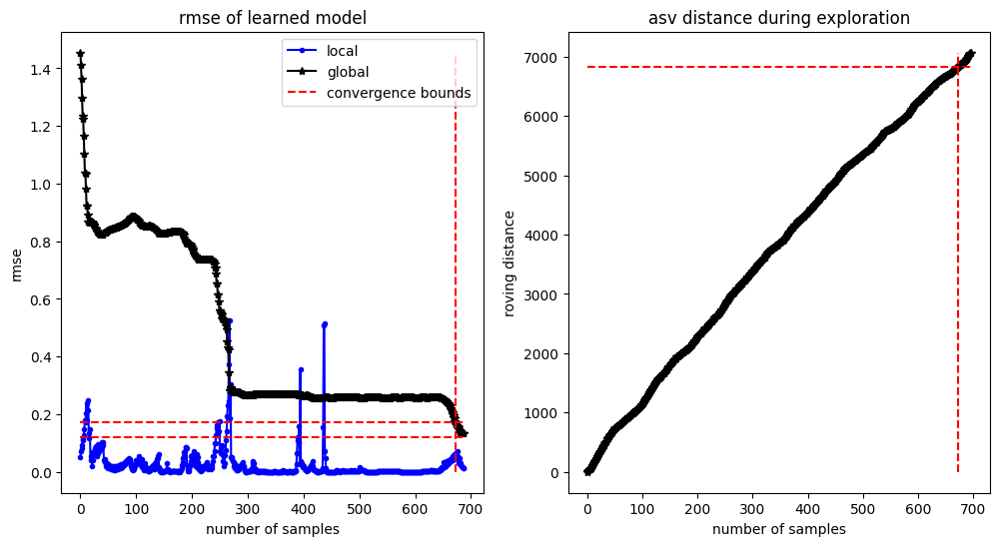

In [322]:
CheckConvergence()